# Исследование влияния дисбаланса классов на качество модели кредитного скоринга

## Введение

В предыдущих этапах проекта были выполнены две важные задачи.

Сначала данные были получены и подготовлены с использованием Apache Spark.

**Ноутбук:** *04_Изучение Apache Spark.ipynb*  
https://colab.research.google.com/drive/1xP0X8x0OHWtnSpOeW6NlS_zsqHkVut0S?usp=sharing

После этого был проведён первичный исследовательский анализ данных (Exploratory Data Analysis, EDA), в ходе которого была изучена структура датасета, рассмотрены основные признаки, проверено качество данных и исследовано распределение целевой переменной.

**Ноутбук:** *02_Изучение EDA (первичный исследовательский анализ) в рамках DataSet Комус.ipynb*  
https://colab.research.google.com/drive/1nVLNyK4yF8nuw7gDX6JV0vLpTmKdyx4a?usp=sharing

В результате проведённого анализа было установлено, что целевая переменная **DefMark** имеет выраженный дисбаланс классов: около **10%** наблюдений относятся к классу дефолта, а около **90%** — к классу без дефолта.

На первый взгляд подобное распределение может показаться серьёзной проблемой. Во многих учебных материалах по машинному обучению рекомендуется устранять дисбаланс классов с помощью различных методов балансировки данных ещё до обучения модели.

Однако задачи кредитного скоринга имеют свою специфику. В реальных банковских данных случаи дефолта встречаются значительно реже успешного исполнения кредитных обязательств, поэтому определённый дисбаланс классов является естественным отражением предметной области.

В связи с этим возникает закономерный инженерный вопрос.

> **Является ли обнаруженный дисбаланс классов существенным препятствием для построения модели кредитного скоринга или подобное распределение считается допустимым для задач данного класса?**

Для ответа на этот вопрос недостаточно ограничиться теоретическими рассуждениями. Необходимо экспериментально проверить, изменяется ли качество модели после применения различных методов балансировки данных и действительно ли дисбаланс оказывает существенное влияние на результаты обучения.

Именно решению этой задачи посвящён настоящий ноутбук.

---

# Цель исследования

Оценить влияние дисбаланса классов на качество модели кредитного скоринга, построенной на основе логистической регрессии, и экспериментально определить, приводит ли применение методов балансировки данных к улучшению качества модели на рассматриваемом наборе данных.

Для достижения поставленной цели последовательно будут решены следующие задачи:

- рассмотреть особенности дисбаланса классов в задачах кредитного скоринга;
- изучить основные методы балансировки данных и область их применения;
- построить базовую модель логистической регрессии без применения балансировки;
- последовательно исследовать влияние различных методов увеличения и уменьшения выборки на качество модели;
- сравнить полученные результаты по основным метрикам классификации;
- определить, является ли исходный дисбаланс классов существенным препятствием для построения модели кредитного скоринга.

По результатам проведённого исследования будет сформулирован обоснованный вывод о необходимости применения методов балансировки данных для рассматриваемой задачи, а также определена дальнейшая стратегия построения модели кредитного скоринга.

# Глава 1. Почему мы вообще говорим о дисбалансе классов?

## Вопрос

Почему после проведения EDA мы решили отдельно исследовать именно распределение целевой переменной? Разве нельзя сразу перейти к обучению модели?

## Почему возник этот вопрос?

После изучения датасета мы обнаружили, что целевая переменная **DefMark** распределена неравномерно: около 90% наблюдений относятся к компаниям, которые не допустили дефолт, и лишь около 10% — к компаниям, допустившим дефолт.

Подобное распределение называется **дисбалансом классов** (Class Imbalance).

На первый взгляд это может показаться серьёзной проблемой. Во многих книгах, статьях и онлайн-курсах можно встретить утверждение, что несбалансированные данные ухудшают качество моделей машинного обучения и требуют обязательной балансировки.

Однако подобные рекомендации часто приводятся без учёта конкретной предметной области.

В задачах кредитного скоринга, страхования, выявления мошенничества и медицинской диагностики неравномерное распределение классов встречается значительно чаще, чем идеально сбалансированные выборки. Более того, именно такое распределение зачастую отражает реальную ситуацию.

Поэтому возникает следующий инженерный вопрос.

> Если дисбаланс является естественным свойством данных, действительно ли его необходимо устранять?

Ответ на этот вопрос нельзя получить только из учебника по машинному обучению. Необходимо учитывать особенности предметной области, цели проекта и поведение алгоритмов, которые будут использоваться для построения модели.

Именно этим мы займёмся в данном исследовании.

## Что мы хотим выяснить?

В рамках этой работы мы не будем сразу выбирать метод балансировки данных.

Сначала необходимо понять более фундаментальную вещь:

**является ли обнаруженный дисбаланс проблемой именно для нашей задачи.**

Если окажется, что подобное распределение классов считается нормой для кредитного скоринга и современные алгоритмы способны эффективно работать с такими данными, искусственная балансировка может не только не улучшить модель, но и привести к потере информации.

Если же исследование покажет, что дисбаланс действительно оказывает существенное влияние на качество прогнозирования, мы рассмотрим существующие способы его компенсации и выберем наиболее подходящий подход для дальнейших этапов проекта.

Таким образом, цель данного ноутбука состоит не в том, чтобы механически применить очередной алгоритм обработки данных, а в том, чтобы принять обоснованное инженерное решение, основанное на свойствах нашего датасета и современной практике построения моделей кредитного скоринга.

## Вывод

В ходе первой главы мы сформулировали основной инженерный вопрос нашего исследования.

В процессе первичного анализа данных было обнаружено, что целевая переменная **DefMark** имеет выраженный дисбаланс классов: около **10%** наблюдений относятся к компаниям, допустившим дефолт, тогда как около **90%** — к компаниям, успешно выполнившим свои обязательства.

Однако сам по себе факт обнаружения дисбаланса ещё не означает, что перед нами возникла проблема. Чтобы принять обоснованное инженерное решение, недостаточно знать только распределение классов. Прежде необходимо разобраться, что вообще понимается под дисбалансом классов, почему он возникает и всегда ли считается нежелательным явлением.



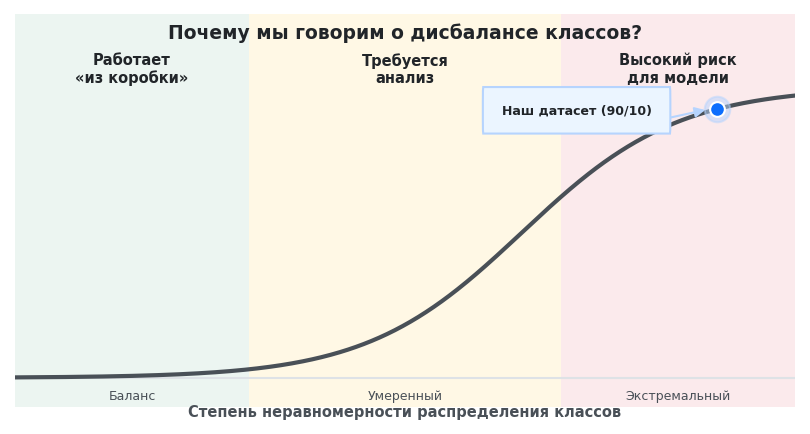

In [ ]:
# @title
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import FancyBboxPatch

# ==========================================
# 1. ЦВЕТОВАЯ ПАЛИТРА
# ==========================================
GREEN = "#D1E7DD"
AMBER = "#FFF3CD"
RED = "#F8D7DA"
BLUE = "#EBF5FF"
BLUE_BORDER = "#B6D4FE"
GRAY_BORDER = "#DEE2E6"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"
LINE_COLOR = "#495057"

# ==========================================
# 2. ТИПОГРАФИЧЕСКАЯ СИСТЕМА (уменьшена в 2 раза)
# ==========================================
FS_TITLE = 9
FS_SUBTITLE = 6
FS_AXIS = 7
FS_TICK = 6
FS_ZONE = 7
FS_CARD = 6

# ==========================================
# 3. ПОДГОТОВКА ХОЛСТА (Уменьшена ровно в 2 раза)
# ==========================================
fig, ax = plt.subplots(figsize=(5.5, 3), dpi=150)
ax.set_xlim(0, 100)
ax.set_ylim(-0.1, 1.25)
ax.axis("off")
fig.patch.set_facecolor("white")

# ==========================================
# 4. ЗАЛИВКА ЗОН
# ==========================================
ax.axvspan(0, 30, facecolor=GREEN, alpha=0.4, zorder=0)
ax.axvspan(30, 70, facecolor=AMBER, alpha=0.5, zorder=0)
ax.axvspan(70, 100, facecolor=RED, alpha=0.5, zorder=0)

# ==========================================
# 5. КРИВАЯ И ТОЧКА
# ==========================================
x = np.linspace(0, 100, 500)
y = 1 / (1 + np.exp(-(x - 65) / 10))

# Линия стала тоньше (2 вместо 4)
ax.plot(x, y, linewidth=2, color=LINE_COLOR, zorder=2)

ds_x = 90
ds_y = 1 / (1 + np.exp(-(ds_x - 65) / 10))

# Точки стали меньше
ax.scatter(ds_x, ds_y, s=150, color=BLUE_BORDER, alpha=0.5, zorder=3)
ax.scatter(ds_x, ds_y, s=50, color="#0d6efd", edgecolor="white", linewidth=1, zorder=4)

# ==========================================
# 6. ПОДПИСИ ЗОН И ОСЕЙ
# ==========================================
ax.text(15, 1.12, "Работает\n«из коробки»", ha="center", va="top", fontsize=FS_ZONE, weight="bold", color=TEXT_DARK)
ax.text(50, 1.12, "Требуется\nанализ", ha="center", va="top", fontsize=FS_ZONE, weight="bold", color=TEXT_DARK)
ax.text(85, 1.12, "Высокий риск\nдля модели", ha="center", va="top", fontsize=FS_ZONE, weight="bold", color=TEXT_DARK)

ax.text(15, -0.04, "Баланс", ha="center", va="top", fontsize=FS_TICK, color=TEXT_MUTED)
ax.text(50, -0.04, "Умеренный", ha="center", va="top", fontsize=FS_TICK, color=TEXT_MUTED)
ax.text(85, -0.04, "Экстремальный", ha="center", va="top", fontsize=FS_TICK, color=TEXT_MUTED)

ax.text(50, -0.09, "Степень неравномерности распределения классов", ha="center", va="top", fontsize=FS_AXIS, weight="bold", color=TEXT_MUTED)

# Линия оси X стала тоньше
ax.plot([0, 100], [0, 0], color=GRAY_BORDER, linewidth=1, zorder=1)

# ==========================================
# 7. АННОТАЦИЯ НАШЕГО ДАТАСЕТА
# ==========================================
card_x, card_y = 72, 0.92
card_w, card_h = 24, 0.12
card_box = FancyBboxPatch((card_x - card_w/2, card_y - card_h/2), card_w, card_h,
                          boxstyle="round,pad=0.02,rounding_size=0.05",
                          linewidth=1, edgecolor=BLUE_BORDER, facecolor=BLUE, zorder=5)
ax.add_patch(card_box)
ax.text(card_x, card_y, "Наш датасет (90/10)", ha="center", va="center",
        fontsize=FS_CARD, weight="bold", color=TEXT_DARK, zorder=6)

# Стрелка стала тоньше
ax.annotate("", xy=(ds_x-1, ds_y), xytext=(card_x + 6, card_y - 0.06),
            arrowprops=dict(arrowstyle="-|>", color=BLUE_BORDER, lw=1))

# ==========================================
# 8. ЗАГОЛОВКИ
# ==========================================
ax.text(50, 1.22, "Почему мы говорим о дисбалансе классов?", ha="center", va="top", fontsize=FS_TITLE, weight="bold", color=TEXT_DARK)

plt.tight_layout()
plt.show()

# Глава 2. Что такое дисбаланс классов и почему он возникает?

## Вопрос

Что такое дисбаланс классов и почему в одних наборах данных он практически отсутствует, а в других становится одной из главных особенностей датасета?

## Почему возник этот вопрос?

Прежде чем оценивать влияние дисбаланса на качество будущей модели, необходимо понять, что именно скрывается за этим понятием.

В предыдущей главе мы выяснили, что в нашем датасете компании, допустившие дефолт, составляют лишь небольшую часть всех наблюдений. Однако само по себе такое распределение ещё ничего не говорит о его природе.

Возникает закономерный вопрос: является ли подобное соотношение результатом ошибки при сборе данных или это естественное свойство рассматриваемой предметной области?

Чтобы ответить на этот вопрос, сначала разберёмся с самим понятием дисбаланса классов.

## Что такое дисбаланс классов?

Большинство задач машинного обучения можно представить как задачу выбора одного из нескольких возможных классов.

Например:

- письмо может оказаться спамом или обычным сообщением;
- банковская операция может быть мошеннической или легальной;
- медицинское обследование может выявить заболевание или подтвердить его отсутствие;
- компания может выполнить свои обязательства или допустить дефолт.

Во всех этих случаях объект относится к одному из заранее известных классов.

Если количество объектов каждого класса примерно одинаково, говорят, что выборка является **сбалансированной**.

Например, если из 10 000 компаний около 5 000 допустили дефолт, а остальные 5 000 — нет, оба класса представлены практически одинаково.

Однако в реальной жизни подобная ситуация встречается далеко не всегда.

Во многих практических задачах один из классов оказывается значительно более редким, чем другой. Именно такая ситуация называется **дисбалансом классов**.

Иными словами, дисбаланс классов — это ситуация, при которой количество объектов различных классов существенно отличается друг от друга.

В нашем случае большинство компаний успешно выполняют свои финансовые обязательства, а случаи дефолта встречаются значительно реже. Поэтому положительный и отрицательный классы представлены неравномерно.

Важно понимать, что дисбаланс классов сам по себе не является ошибкой данных. Он лишь отражает фактическое распределение событий, наблюдаемое в исследуемой предметной области.

## Почему возникает дисбаланс классов?

Причины возникновения дисбаланса чаще всего связаны не с качеством данных, а с особенностями самих процессов, которые мы изучаем.

Например, большинство электронных писем не являются спамом.

Большинство банковских операций совершается законно.

Большинство медицинских обследований не выявляет тяжёлых заболеваний.

Точно так же и большинство компаний своевременно исполняет свои финансовые обязательства, тогда как случаи дефолта происходят значительно реже.

Поэтому, собирая реальные данные, мы неизбежно получаем выборку, в которой один класс встречается значительно чаще другого.

Другими словами, дисбаланс классов во многих прикладных задачах является не недостатком датасета, а естественным отражением окружающей действительности.

Именно поэтому сам факт наличия дисбаланса ещё не позволяет сделать вывод о необходимости его устранения.

Сначала необходимо понять, каким образом подобное распределение влияет на процесс обучения моделей машинного обучения.

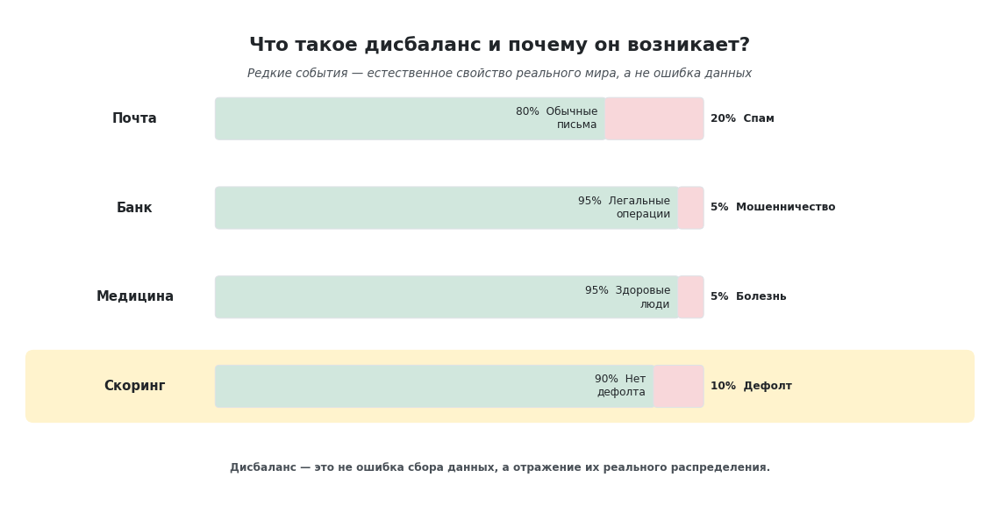

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ==========================================
# 1. ЦВЕТОВАЯ ПАЛИТРА
# ==========================================
GREEN = "#D1E7DD"
RED = "#F8D7DA"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
AMBER = "#FFF3CD"      # Подложка для нашего кейса
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# ==========================================
# 2. ТИПОГРАФИЧЕСКАЯ СИСТЕМА
# ==========================================
S = 0.65
FS_TITLE = 16 * S
FS_SUBTITLE = 10 * S
FS_LABEL = 11 * S
FS_BAR = 9 * S
FS_FOOTER = 9 * S

# ==========================================
# 3. СИСТЕМА КООРДИНАТ И СЕТКА
# ==========================================
AXES_W, AXES_H = 12, 6
FIG_W, FIG_H = 8, 4

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

TITLE_Y = AXES_H - 0.4
SUBTITLE_Y = TITLE_Y - 0.35
FOOTER_Y = 0.4

# ==========================================
# 4. ДАННЫЕ ДЛЯ ИЛЛЮСТРАЦИИ
# ==========================================
# (Название, Нормальный класс %, Название нормы, Редкий класс %, Название редкого)
domains = [
    ("Почта", 80, "Обычные\nписьма", 20, "Спам"),
    ("Банк", 95, "Легальные\nоперации", 5, "Мошенничество"),
    ("Медицина", 95, "Здоровые\nлюди", 5, "Болезнь"),
    ("Скоринг", 90, "Нет\nдефолта", 10, "Дефолт")
]

BAR_X = 2.5
BAR_W = 6.0
BAR_H = 0.5
Y_START = 4.7
Y_STEP = 1.1

# ==========================================
# 5. ОТРИСОВКА ЭЛЕМЕНТОВ
# ==========================================

# --- Заголовки ---
ax.text(AXES_W/2, TITLE_Y, "Что такое дисбаланс и почему он возникает?", ha="center", va="center", fontsize=FS_TITLE, weight="bold", color=TEXT_DARK)
ax.text(AXES_W/2, SUBTITLE_Y, "Редкие события — естественное свойство реального мира, а не ошибка данных", ha="center", va="center", fontsize=FS_SUBTITLE, color=TEXT_MUTED, style="italic")

# --- Строки с данными ---
for i, (name, pct_norm, norm_text, pct_rare, rare_text) in enumerate(domains):
    y_pos = Y_START - i * Y_STEP

    # Подложка для нашего кейса (Скоринг)
    if name == "Скоринг":
        highlight_box = FancyBboxPatch((0.2, y_pos - 0.4), 11.6, 0.8, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=0, facecolor=AMBER, zorder=0)
        ax.add_patch(highlight_box)

    # Название домена (Слева)
    ax.text(1.5, y_pos, name, ha="center", va="center", fontsize=FS_LABEL, weight="bold", color=TEXT_DARK, zorder=2)

    # Зелёная часть (Норма)
    green_w = BAR_W * (pct_norm / 100)
    green_box = FancyBboxPatch((BAR_X, y_pos - BAR_H/2), green_w, BAR_H, boxstyle="round,pad=0.01,rounding_size=0.05", linewidth=0.5, edgecolor=GRAY_BORDER, facecolor=GREEN, zorder=2)
    ax.add_patch(green_box)

    # Текст внутри зеленой части
    ax.text(BAR_X + green_w - 0.1, y_pos, f"{pct_norm}%  {norm_text}", ha="right", va="center", fontsize=FS_BAR, color=TEXT_DARK, zorder=3)

    # Красная часть (Редкое событие)
    red_w = BAR_W * (pct_rare / 100)
    red_box = FancyBboxPatch((BAR_X + green_w, y_pos - BAR_H/2), red_w, BAR_H, boxstyle="round,pad=0.01,rounding_size=0.05", linewidth=0.5, edgecolor=GRAY_BORDER, facecolor=RED, zorder=2)
    ax.add_patch(red_box)

    # Текст справа от красной части
    ax.text(BAR_X + green_w + red_w + 0.1, y_pos, f"{pct_rare}%  {rare_text}", ha="left", va="center", fontsize=FS_BAR, weight="bold", color=TEXT_DARK, zorder=3)

# --- Подвал ---
ax.text(AXES_W/2, FOOTER_Y, "Дисбаланс — это не ошибка сбора данных, а отражение их реального распределения.",
        ha="center", va="center", fontsize=FS_FOOTER, color=TEXT_MUTED, weight="bold")

plt.tight_layout()
plt.show()

# Глава 3. Каким образом дисбаланс классов может влиять на обучение модели?

## Вопрос

Если дисбаланс классов нередко является естественным свойством данных, почему ему уделяется столько внимания при построении моделей машинного обучения?

## Почему возник этот вопрос?

В предыдущей главе мы выяснили, что неравномерное распределение классов само по себе не является ошибкой.

Во многих прикладных задачах редкие события действительно встречаются значительно реже остальных, поэтому наличие дисбаланса вполне естественно.

Однако в литературе по машинному обучению дисбаланс классов практически всегда рассматривается как фактор, требующий отдельного внимания.

Возникает закономерный вопрос: почему?

Чтобы ответить на него, необходимо понять, как модель обучается на данных и каким образом распределение классов влияет на этот процесс.

## Как обучается модель классификации?

Независимо от используемого алгоритма, задача модели заключается в поиске закономерностей, позволяющих отличать один класс от другого.

Во время обучения модель многократно анализирует объекты обучающей выборки, постепенно корректируя свои внутренние параметры таким образом, чтобы как можно точнее разделять классы.

При этом каждый объект обучающей выборки становится источником информации о рассматриваемой предметной области.

Чем больше примеров определённого класса содержится в данных, тем больше информации получает модель о характерных признаках этого класса.

И наоборот, если объектов некоторого класса значительно меньше, то информации о нём также оказывается существенно меньше.

## Почему это может стать проблемой?

Представим, что обучающая выборка состоит из 1000 компаний.

Из них:

- 900 компаний успешно исполнили свои обязательства;
- только 100 компаний допустили дефолт.

Во время обучения модель значительно чаще сталкивается с компаниями первого типа.

Следовательно, закономерности, характерные для недефолтных компаний, оказывают гораздо большее влияние на процесс обучения.

Информация же о компаниях, допустивших дефолт, представлена значительно меньшим количеством наблюдений.

В результате модель может недостаточно хорошо изучить особенности именно того класса, который во многих практических задачах представляет наибольший интерес.

Важно понимать, что это не означает неизбежного ухудшения качества модели.

Это означает лишь существование потенциального риска, который необходимо проверить экспериментально.

## Почему нельзя делать вывод заранее?

Даже при выраженном дисбалансе многие современные алгоритмы способны успешно выявлять закономерности редкого класса.

На качество модели влияет не только количество объектов каждого класса.

Не менее важными являются:

- информативность признаков;
- сложность разделения классов;
- объём обучающей выборки;
- особенности используемого алгоритма.

Поэтому два датасета с одинаковым соотношением классов могут демонстрировать совершенно разное качество прогнозирования.

Именно поэтому одного лишь знания о распределении классов недостаточно для принятия инженерного решения.

Необходимо проверить влияние дисбаланса на практике.

## Вывод

Теперь становится понятно, почему дисбаланс классов рассматривается как потенциальный фактор риска при обучении моделей машинного обучения.

Чем меньше объектов содержит один из классов, тем меньше информации получает модель о его характерных особенностях.

Однако этот факт ещё не доказывает, что качество модели обязательно ухудшится.

Следовательно, следующий этап нашего исследования заключается не в применении методов балансировки, а в проверке того, действительно ли дисбаланс классов оказывает заметное влияние на результаты обучения в нашем датасете.

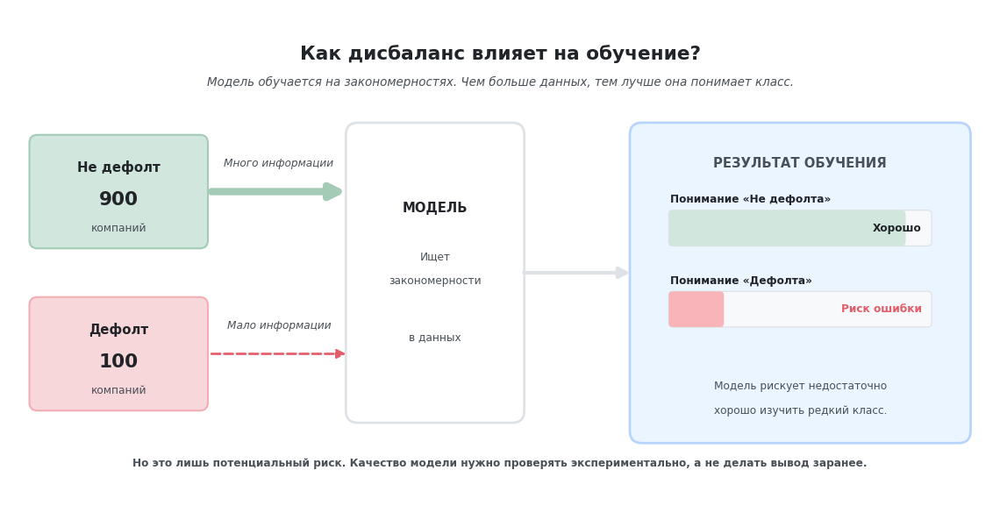

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch, Circle

# ==========================================
# 1. ЦВЕТОВАЯ ПАЛИТРА
# ==========================================
GREEN = "#D1E7DD"
GREEN_BORDER = "#A3CBB5"
RED = "#F8D7DA"
RED_BORDER = "#F1AEB5"
CRITICAL_RED = "#F8B4B9"
CRITICAL_BORDER = "#E35D6A"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
BLUE = "#EBF5FF"
BLUE_BORDER = "#B6D4FE"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"
AMBER = "#FFF3CD" # Для блока вывода
WHITE = "#FFFFFF"

# ==========================================
# 2. ТИПОГРАФИЧЕСКАЯ СИСТЕМА (уменьшена пропорционально)
# ==========================================
S = 0.65 # Коэффициент уменьшения (~1.5 раза)
FS_TITLE = 16 * S
FS_SUBTITLE = 10 * S
FS_CARD_TITLE = 11 * S
FS_CARD_MAIN = 16 * S
FS_CARD_DESC = 9 * S
FS_PANEL_TITLE = 11 * S
FS_PANEL_SUB = 9 * S
FS_FOOTER = 9 * S

# ==========================================
# 3. СИСТЕМА КООРДИНАТ И СЕТКА
# ==========================================
AXES_W, AXES_H = 12, 6       # Внутренняя система координат осталась прежней
FIG_W, FIG_H = 8, 4          # Физический размер холста уменьшен в 1.5 раза (12/1.5=8, 6/1.5=4)

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# Вертикальная ось
TITLE_Y = AXES_H - 0.5
SUBTITLE_Y = TITLE_Y - 0.35
PANEL_TOP_Y = SUBTITLE_Y - 0.6

# Левые карточки (Данные)
DATA_X = 0.3
DATA_W = 2.0
DATA_H = 1.2
DATA_Y_TOP = 3.8
DATA_Y_BOT = 1.8
DATA_CX = DATA_X + DATA_W / 2

# Блок модели (Центр)
MODEL_X = 4.2
MODEL_W = 2.0
MODEL_Y = (DATA_Y_TOP + DATA_Y_BOT) / 2
MODEL_H = 3.5
MODEL_CX = MODEL_X + MODEL_W / 2

# Правая панель (Результат обучения)
RES_X = 7.7
RES_W = AXES_W - 0.3 - RES_X
RES_Y = 0.8
RES_H = PANEL_TOP_Y - RES_Y
RES_CX = RES_X + RES_W / 2

# Внутренние метрики правой панели
BAR_W = RES_W - 0.8
BAR_X = RES_X + 0.4
BAR_H = 0.4

FOOTER_Y = 0.3

# ==========================================
# 4. ОТРИСОВКА ЭЛЕМЕНТОВ (с масштабированием линий)
# ==========================================

# --- Заголовки ---
ax.text(AXES_W/2, TITLE_Y, "Как дисбаланс влияет на обучение?", ha="center", va="center", fontsize=FS_TITLE, weight="bold", color=TEXT_DARK)
ax.text(AXES_W/2, SUBTITLE_Y, "Модель обучается на закономерностях. Чем больше данных, тем лучше она понимает класс.", ha="center", va="center", fontsize=FS_SUBTITLE, color=TEXT_MUTED, style="italic")

# --- Левые карточки (Данные) ---
# Карточка 1: Не дефолт (Много)
box1 = FancyBboxPatch((DATA_X, DATA_Y_TOP - DATA_H/2), DATA_W, DATA_H, boxstyle="round,pad=0.1,rounding_size=0.1", linewidth=1.0, edgecolor=GREEN_BORDER, facecolor=GREEN)
ax.add_patch(box1)
ax.text(DATA_CX, DATA_Y_TOP + 0.3, "Не дефолт", ha="center", va="center", fontsize=FS_CARD_TITLE, weight="bold", color=TEXT_DARK)
ax.text(DATA_CX, DATA_Y_TOP - 0.1, "900", ha="center", va="center", fontsize=FS_CARD_MAIN, weight="bold", color=TEXT_DARK)
ax.text(DATA_CX, DATA_Y_TOP - 0.45, "компаний", ha="center", va="center", fontsize=FS_CARD_DESC, color=TEXT_MUTED)

# Карточка 2: Дефолт (Мало)
box2 = FancyBboxPatch((DATA_X, DATA_Y_BOT - DATA_H/2), DATA_W, DATA_H, boxstyle="round,pad=0.1,rounding_size=0.1", linewidth=1.0, edgecolor=RED_BORDER, facecolor=RED)
ax.add_patch(box2)
ax.text(DATA_CX, DATA_Y_BOT + 0.3, "Дефолт", ha="center", va="center", fontsize=FS_CARD_TITLE, weight="bold", color=TEXT_DARK)
ax.text(DATA_CX, DATA_Y_BOT - 0.1, "100", ha="center", va="center", fontsize=FS_CARD_MAIN, weight="bold", color=TEXT_DARK)
ax.text(DATA_CX, DATA_Y_BOT - 0.45, "компаний", ha="center", va="center", fontsize=FS_CARD_DESC, color=TEXT_MUTED)

# --- Стрелки к модели (Толстая и Тонкая) ---
arrow_start_x = DATA_X + DATA_W + 0.1
arrow_end_x = MODEL_X - 0.05

# Толстая зеленая стрелка (Много информации)
ax.add_patch(FancyArrowPatch((arrow_start_x, DATA_Y_TOP), (arrow_end_x, DATA_Y_TOP),
                             arrowstyle="-|>", mutation_scale=16, linewidth=4.0, color=GREEN_BORDER))
ax.text((arrow_start_x + arrow_end_x)/2, DATA_Y_TOP + 0.35, "Много информации", ha="center", va="center", fontsize=FS_CARD_DESC, color=TEXT_MUTED, style="italic")

# Тонкая красная стрелка (Мало информации)
ax.add_patch(FancyArrowPatch((arrow_start_x, DATA_Y_BOT), (arrow_end_x, DATA_Y_BOT),
                             arrowstyle="-|>", mutation_scale=10, linewidth=1.3, color=CRITICAL_BORDER, linestyle="--"))
ax.text((arrow_start_x + arrow_end_x)/2, DATA_Y_BOT + 0.35, "Мало информации", ha="center", va="center", fontsize=FS_CARD_DESC, color=TEXT_MUTED, style="italic")

# --- Блок модели (Центр) ---
model_box = FancyBboxPatch((MODEL_X, MODEL_Y - MODEL_H/2), MODEL_W, MODEL_H, boxstyle="round,pad=0.1,rounding_size=0.15", linewidth=1.3, edgecolor=GRAY_BORDER, facecolor=WHITE)
ax.add_patch(model_box)
ax.text(MODEL_CX, MODEL_Y + 0.8, "МОДЕЛЬ", ha="center", va="center", fontsize=FS_CARD_TITLE, weight="bold", color=TEXT_DARK)
ax.text(MODEL_CX, MODEL_Y + 0.2, "Ищет", ha="center", va="center", fontsize=FS_CARD_DESC, color=TEXT_MUTED)
ax.text(MODEL_CX, MODEL_Y - 0.1, "закономерности", ha="center", va="center", fontsize=FS_CARD_DESC, color=TEXT_MUTED)
ax.text(MODEL_CX, MODEL_Y - 0.8, "в данных", ha="center", va="center", fontsize=FS_CARD_DESC, color=TEXT_MUTED)

# --- Правая панель (Результат) ---
# Стрелка от модели к результату
ax.add_patch(FancyArrowPatch((MODEL_X + MODEL_W + 0.05, MODEL_Y), (RES_X - 0.05, MODEL_Y), arrowstyle="-|>", mutation_scale=12, linewidth=2.0, color=GRAY_BORDER))

res_box = FancyBboxPatch((RES_X, RES_Y), RES_W, RES_H, boxstyle="round,pad=0.1,rounding_size=0.15", linewidth=1.3, edgecolor=BLUE_BORDER, facecolor=BLUE)
ax.add_patch(res_box)

ax.text(RES_CX, RES_Y + RES_H - 0.4, "РЕЗУЛЬТАТ ОБУЧЕНИЯ", ha="center", va="center", fontsize=FS_PANEL_TITLE, weight="bold", color=TEXT_MUTED)

# Прогресс-бар 1: Не дефолты (Высокое понимание)
y_bar1 = RES_Y + RES_H - 1.4
ax.text(BAR_X, y_bar1 + BAR_H + 0.15, "Понимание «Не дефолта»", ha="left", va="center", fontsize=FS_CARD_DESC, weight="bold", color=TEXT_DARK)
bg_bar1 = FancyBboxPatch((BAR_X, y_bar1), BAR_W, BAR_H, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=0.6, edgecolor=GRAY_BORDER, facecolor=GRAY)
ax.add_patch(bg_bar1)
fill_bar1 = FancyBboxPatch((BAR_X, y_bar1), BAR_W * 0.9, BAR_H, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=0, facecolor=GREEN, edgecolor=GREEN_BORDER)
ax.add_patch(fill_bar1)
ax.text(BAR_X + BAR_W - 0.1, y_bar1 + BAR_H/2, "Хорошо", ha="right", va="center", fontsize=FS_CARD_DESC, weight="bold", color=TEXT_DARK)

# Прогресс-бар 2: Дефолты (Риск плохого понимания)
y_bar2 = y_bar1 - 1.0
ax.text(BAR_X, y_bar2 + BAR_H + 0.15, "Понимание «Дефолта»", ha="left", va="center", fontsize=FS_CARD_DESC, weight="bold", color=TEXT_DARK)
bg_bar2 = FancyBboxPatch((BAR_X, y_bar2), BAR_W, BAR_H, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=0.6, edgecolor=GRAY_BORDER, facecolor=GRAY)
ax.add_patch(bg_bar2)
fill_bar2 = FancyBboxPatch((BAR_X, y_bar2), BAR_W * 0.2, BAR_H, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=0, facecolor=CRITICAL_RED, edgecolor=CRITICAL_BORDER)
ax.add_patch(fill_bar2)
ax.text(BAR_X + BAR_W - 0.1, y_bar2 + BAR_H/2, "Риск ошибки", ha="right", va="center", fontsize=FS_CARD_DESC, weight="bold", color=CRITICAL_BORDER)

# Вывод внутри панели
concl_y = RES_Y + 0.6
ax.text(RES_CX, concl_y, "Модель рискует недостаточно", ha="center", va="center", fontsize=FS_PANEL_SUB, color=TEXT_MUTED)
ax.text(RES_CX, concl_y - 0.3, "хорошо изучить редкий класс.", ha="center", va="center", fontsize=FS_PANEL_SUB, color=TEXT_MUTED)

# --- Подвал (Главный вывод главы) ---
ax.text(AXES_W/2, FOOTER_Y + 0.15, "Но это лишь потенциальный риск. Качество модели нужно проверять экспериментально, а не делать вывод заранее.",
        ha="center", va="center", fontsize=FS_FOOTER, color=TEXT_MUTED, weight="bold")

plt.tight_layout()
plt.show()

# Глава 4. Как определить, является ли дисбаланс проблемой в нашем датасете?

## Вопрос

Мы выяснили, что дисбаланс классов может влиять на процесс обучения модели.

Но означает ли это, что любой дисбаланс обязательно ухудшает качество модели?

## Почему возник этот вопрос?

До этого момента наше обсуждение носило исключительно теоретический характер.

Мы рассмотрели механизм, благодаря которому дисбаланс способен повлиять на процесс обучения.

Однако возможность возникновения проблемы ещё не означает, что она действительно проявится на практике.

В инженерных задачах подобные вопросы не решаются на основе предположений.

Они требуют экспериментальной проверки.

## Почему нельзя ориентироваться только на соотношение классов?

На первый взгляд может показаться, что достаточно посмотреть на распределение целевой переменной.

Например, если один класс составляет 90% выборки, а второй — 10%, можно предположить, что дисбаланс уже представляет серьёзную проблему.

Однако такой вывод был бы преждевременным.

Само по себе соотношение классов не позволяет оценить, насколько хорошо модель сможет распознавать объекты каждого класса.

Два датасета с одинаковым распределением классов могут демонстрировать совершенно разное качество прогнозирования.

Причина заключается в том, что на работу модели влияет множество факторов:

- информативность признаков;
- объём обучающей выборки;
- сложность разделения классов;
- используемый алгоритм машинного обучения;
- выбранные критерии оценки качества.

Поэтому одного лишь анализа распределения классов недостаточно для принятия инженерного решения.

## Как тогда проверить влияние дисбаланса?

Единственным надёжным способом является обучение модели и анализ результатов её работы.

Если модель уверенно распознаёт как большинство объектов основного класса, так и объекты редкого класса, то имеющийся дисбаланс может не требовать никакой дополнительной обработки.

Если же модель начинает плохо обнаруживать объекты редкого класса, возникает основание предположить, что дисбаланс действительно оказывает негативное влияние.

Именно поэтому в машинном обучении окончательное решение принимается не по распределению данных, а по результатам эксперимента.

## Вывод

Таким образом, сам факт наличия дисбаланса ещё не говорит о необходимости применять методы балансировки.

Сначала необходимо проверить, насколько хорошо модель справляется с распознаванием каждого класса.

Для этого в следующей главе мы рассмотрим, какие метрики позволяют объективно оценить качество модели при наличии дисбаланса классов.

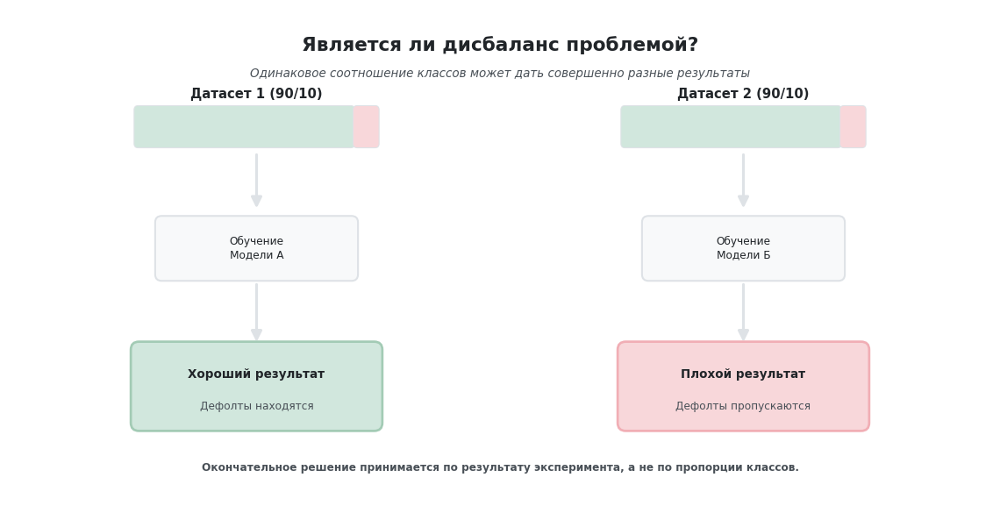

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch

# ==========================================
# 1. ЦВЕТОВАЯ ПАЛИТРА
# ==========================================
GREEN = "#D1E7DD"
GREEN_BORDER = "#A3CBB5"
RED = "#F8D7DA"
RED_BORDER = "#F1AEB5"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
BLUE = "#EBF5FF"
BLUE_BORDER = "#B6D4FE"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# ==========================================
# 2. ТИПОГРАФИЧЕСКАЯ СИСТЕМА
# ==========================================
S = 0.65
FS_TITLE = 16 * S
FS_SUBTITLE = 10 * S
FS_CARD_TITLE = 11 * S
FS_BAR = 9 * S
FS_RESULT = 10 * S
FS_FOOTER = 9 * S

# ==========================================
# 3. СИСТЕМА КООРДИНАТ И СЕТКА
# ==========================================
AXES_W, AXES_H = 12, 6
FIG_W, FIG_H = 8, 4

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

TITLE_Y = AXES_H - 0.4
SUBTITLE_Y = TITLE_Y - 0.35
FOOTER_Y = 0.4

# Координаты колонок
COL_L_CX = 3.0  # Центр левой колонны
COL_R_CX = 9.0  # Центр правой колонны
BAR_W = 3.0
BAR_H = 0.5

# Y координаты блоков
Y_DATA = 4.6
Y_MODEL = 3.1
Y_RESULT = 1.4

# ==========================================
# 4. ОТРИСОВКА ЭЛЕМЕНТОВ
# ==========================================

# --- Заголовки ---
ax.text(AXES_W/2, TITLE_Y, "Является ли дисбаланс проблемой?", ha="center", va="center", fontsize=FS_TITLE, weight="bold", color=TEXT_DARK)
ax.text(AXES_W/2, SUBTITLE_Y, "Одинаковое соотношение классов может дать совершенно разные результаты", ha="center", va="center", fontsize=FS_SUBTITLE, color=TEXT_MUTED, style="italic")

# --- ОБЩИЙ БЛОК ДАННЫХ (Сверху) ---
# Левый датасет
ax.add_patch(FancyBboxPatch((COL_L_CX - BAR_W/2, Y_DATA - BAR_H/2), BAR_W * 0.9, BAR_H, boxstyle="round,pad=0.01,rounding_size=0.05", linewidth=0.5, edgecolor=GRAY_BORDER, facecolor=GREEN))
ax.add_patch(FancyBboxPatch((COL_L_CX - BAR_W/2 + BAR_W * 0.9, Y_DATA - BAR_H/2), BAR_W * 0.1, BAR_H, boxstyle="round,pad=0.01,rounding_size=0.05", linewidth=0.5, edgecolor=GRAY_BORDER, facecolor=RED))
ax.text(COL_L_CX, Y_DATA + 0.4, "Датасет 1 (90/10)", ha="center", va="center", fontsize=FS_CARD_TITLE, weight="bold", color=TEXT_DARK)

# Правый датасет
ax.add_patch(FancyBboxPatch((COL_R_CX - BAR_W/2, Y_DATA - BAR_H/2), BAR_W * 0.9, BAR_H, boxstyle="round,pad=0.01,rounding_size=0.05", linewidth=0.5, edgecolor=GRAY_BORDER, facecolor=GREEN))
ax.add_patch(FancyBboxPatch((COL_R_CX - BAR_W/2 + BAR_W * 0.9, Y_DATA - BAR_H/2), BAR_W * 0.1, BAR_H, boxstyle="round,pad=0.01,rounding_size=0.05", linewidth=0.5, edgecolor=GRAY_BORDER, facecolor=RED))
ax.text(COL_R_CX, Y_DATA + 0.4, "Датасет 2 (90/10)", ha="center", va="center", fontsize=FS_CARD_TITLE, weight="bold", color=TEXT_DARK)

# --- СТРЕЛКИ ВНИЗ ---
ax.add_patch(FancyArrowPatch((COL_L_CX, Y_DATA - BAR_H/2 - 0.05), (COL_L_CX, Y_MODEL + 0.45), arrowstyle="-|>", mutation_scale=12, linewidth=1.5, color=GRAY_BORDER))
ax.add_patch(FancyArrowPatch((COL_R_CX, Y_DATA - BAR_H/2 - 0.05), (COL_R_CX, Y_MODEL + 0.45), arrowstyle="-|>", mutation_scale=12, linewidth=1.5, color=GRAY_BORDER))

# --- БЛОКИ МОДЕЛЕЙ (Центр) ---
ax.add_patch(FancyBboxPatch((COL_L_CX - 1.2, Y_MODEL - 0.35), 2.4, 0.7, boxstyle="round,pad=0.05,rounding_size=0.08", linewidth=1.0, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.text(COL_L_CX, Y_MODEL, "Обучение\nМодели А", ha="center", va="center", fontsize=FS_BAR, color=TEXT_DARK)

ax.add_patch(FancyBboxPatch((COL_R_CX - 1.2, Y_MODEL - 0.35), 2.4, 0.7, boxstyle="round,pad=0.05,rounding_size=0.08", linewidth=1.0, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.text(COL_R_CX, Y_MODEL, "Обучение\nМодели Б", ha="center", va="center", fontsize=FS_BAR, color=TEXT_DARK)

# --- СТРЕЛКИ ВНИЗ ---
ax.add_patch(FancyArrowPatch((COL_L_CX, Y_MODEL - 0.35 - 0.05), (COL_L_CX, Y_RESULT + 0.5), arrowstyle="-|>", mutation_scale=12, linewidth=1.5, color=GRAY_BORDER))
ax.add_patch(FancyArrowPatch((COL_R_CX, Y_MODEL - 0.35 - 0.05), (COL_R_CX, Y_RESULT + 0.5), arrowstyle="-|>", mutation_scale=12, linewidth=1.5, color=GRAY_BORDER))

# --- БЛОКИ РЕЗУЛЬТАТОВ (Низ) ---
# Левый (Хороший)
ax.add_patch(FancyBboxPatch((COL_L_CX - 1.5, Y_RESULT - 0.5), 3.0, 1.0, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.3, edgecolor=GREEN_BORDER, facecolor=GREEN))
ax.text(COL_L_CX, Y_RESULT + 0.15, "Хороший результат", ha="center", va="center", fontsize=FS_RESULT, weight="bold", color=TEXT_DARK)
ax.text(COL_L_CX, Y_RESULT - 0.25, "Дефолты находятся", ha="center", va="center", fontsize=FS_BAR, color=TEXT_MUTED)

# Правый (Плохой)
ax.add_patch(FancyBboxPatch((COL_R_CX - 1.5, Y_RESULT - 0.5), 3.0, 1.0, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.3, edgecolor=RED_BORDER, facecolor=RED))
ax.text(COL_R_CX, Y_RESULT + 0.15, "Плохой результат", ha="center", va="center", fontsize=FS_RESULT, weight="bold", color=TEXT_DARK)
ax.text(COL_R_CX, Y_RESULT - 0.25, "Дефолты пропускаются", ha="center", va="center", fontsize=FS_BAR, color=TEXT_MUTED)

# --- Подвал ---
ax.text(AXES_W/2, FOOTER_Y, "Окончательное решение принимается по результату эксперимента, а не по пропорции классов.",
        ha="center", va="center", fontsize=FS_FOOTER, color=TEXT_MUTED, weight="bold")

plt.tight_layout()
plt.show()

# Глава 5. Какие метрики позволяют оценить качество модели при наличии дисбаланса классов?

## Вопрос

Мы выяснили, что определить влияние дисбаланса можно только после обучения модели.

Но каким образом понять, хорошо ли модель справилась со своей задачей?

## Почему возник этот вопрос?

После обучения модели необходимо объективно оценить качество её прогнозов.

На первый взгляд может показаться, что достаточно вычислить долю правильных ответов.

Однако при наличии дисбаланса классов такой подход способен привести к ошибочным выводам.

Рассмотрим простой пример.

Предположим, что в выборке содержится 1000 компаний.

Из них:

- 900 компаний не допустили дефолта;
- 100 компаний допустили дефолт.

Представим, что модель всегда прогнозирует только отсутствие дефолта.

В этом случае она правильно классифицирует все 900 компаний основного класса, но ошибётся для всех 100 компаний, которые действительно допустили дефолт.

Несмотря на это, общая доля правильных прогнозов составит:

\[
Accuracy = \frac{900}{1000}=0.9
\]

или 90%.

На первый взгляд результат кажется очень высоким.

Однако такая модель совершенно бесполезна для кредитного скоринга, поскольку она не обнаруживает ни одного случая дефолта.

Таким образом, высокая точность классификации ещё не означает, что модель эффективно решает поставленную задачу.

## Почему одной Accuracy недостаточно?

Метрика Accuracy учитывает только общую долю правильных прогнозов.

Она не показывает, какие именно объекты модель научилась распознавать хорошо, а какие — плохо.

При наличии выраженного дисбаланса классов большинство правильных ответов может приходиться исключительно на многочисленный класс.

В результате Accuracy создаёт впечатление высокой эффективности модели даже тогда, когда редкий, но наиболее важный класс практически не распознаётся.

Именно поэтому при анализе задач кредитного скоринга используют дополнительные показатели качества.

Каждый из них оценивает работу модели с разных сторон.

## Какие метрики используются?

Для комплексной оценки модели обычно анализируют несколько взаимодополняющих метрик.

В дальнейшем мы подробно рассмотрим:

- Confusion Matrix;
- Precision;
- Recall;
- F1-score;
- ROC-кривую;
- ROC-AUC.

Совместный анализ этих показателей позволяет значительно точнее оценить качество модели при наличии дисбаланса классов, чем использование одной лишь Accuracy.

## Вывод

Таким образом, Accuracy является полезной, но недостаточной характеристикой качества модели при наличии дисбаланса классов.

Для объективной оценки необходимо учитывать не только общее количество правильных прогнозов, но и способность модели обнаруживать объекты каждого класса.

Поэтому следующим этапом исследования станет знакомство с матрицей ошибок (Confusion Matrix), которая лежит в основе большинства современных метрик качества классификации.

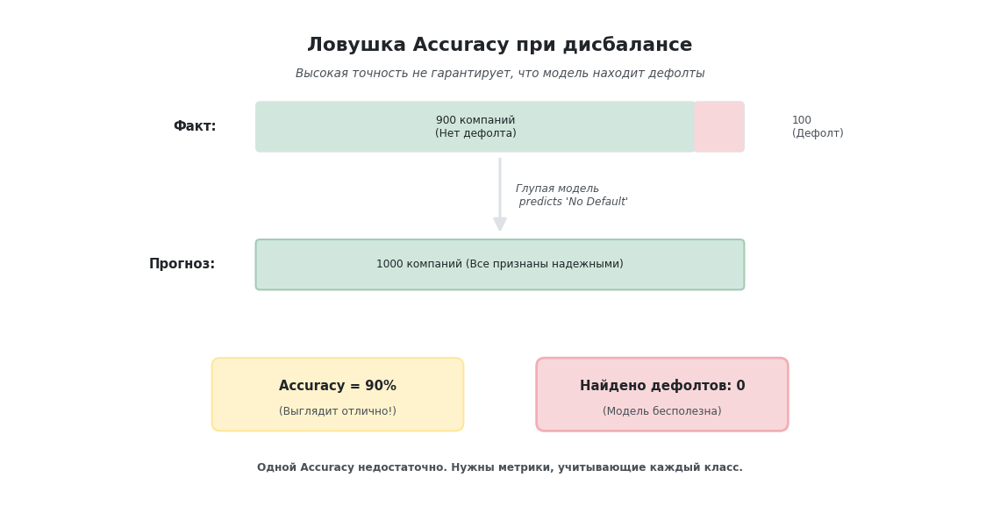

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch

# ==========================================
# 1. ЦВЕТОВАЯ ПАЛИТРА
# ==========================================
GREEN = "#D1E7DD"
GREEN_BORDER = "#A3CBB5"
RED = "#F8D7DA"
RED_BORDER = "#F1AEB5"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
BLUE = "#EBF5FF"
BLUE_BORDER = "#B6D4FE"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# ==========================================
# 2. ТИПОГРАФИЧЕСКАЯ СИСТЕМА
# ==========================================
S = 0.65
FS_TITLE = 16 * S
FS_SUBTITLE = 10 * S
FS_CARD_TITLE = 11 * S
FS_BAR = 9 * S
FS_RESULT = 11 * S
FS_FOOTER = 9 * S

# ==========================================
# 3. СИСТЕМА КООРДИНАТ И СЕТКА
# ==========================================
AXES_W, AXES_H = 12, 6
FIG_W, FIG_H = 8, 4

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

TITLE_Y = AXES_H - 0.4
SUBTITLE_Y = TITLE_Y - 0.35
FOOTER_Y = 0.4

BAR_X = 3.0
BAR_W = 6.0
BAR_H = 0.6
Y_REAL = 4.6
Y_PRED = 2.9

# ==========================================
# 4. ОТРИСОВКА ЭЛЕМЕНТОВ
# ==========================================

# --- Заголовки ---
ax.text(AXES_W/2, TITLE_Y, "Ловушка Accuracy при дисбалансе", ha="center", va="center", fontsize=FS_TITLE, weight="bold", color=TEXT_DARK)
ax.text(AXES_W/2, SUBTITLE_Y, "Высокая точность не гарантирует, что модель находит дефолты", ha="center", va="center", fontsize=FS_SUBTITLE, color=TEXT_MUTED, style="italic")

# --- РЕАЛЬНОСТЬ (Верхний блок) ---
ax.text(BAR_X - 0.5, Y_REAL, "Факт:", ha="right", va="center", fontsize=FS_CARD_TITLE, weight="bold", color=TEXT_DARK)

# 900 нет дефолта (Зеленый)
ax.add_patch(FancyBboxPatch((BAR_X, Y_REAL - BAR_H/2), BAR_W * 0.9, BAR_H, boxstyle="round,pad=0.01,rounding_size=0.05", linewidth=0.5, edgecolor=GRAY_BORDER, facecolor=GREEN))
ax.text(BAR_X + BAR_W * 0.45, Y_REAL, "900 компаний\n(Нет дефолта)", ha="center", va="center", fontsize=FS_BAR, color=TEXT_DARK)

# 100 дефолт (Красный)
ax.add_patch(FancyBboxPatch((BAR_X + BAR_W * 0.9, Y_REAL - BAR_H/2), BAR_W * 0.1, BAR_H, boxstyle="round,pad=0.01,rounding_size=0.05", linewidth=0.5, edgecolor=GRAY_BORDER, facecolor=RED))
ax.text(BAR_X + BAR_W + 0.6, Y_REAL, "100\n(Дефолт)", ha="left", va="center", fontsize=FS_BAR, color=TEXT_MUTED)

# --- СТРЕЛКА ВНИЗ ---
ax.add_patch(FancyArrowPatch((BAR_X + BAR_W/2, Y_REAL - BAR_H/2 - 0.05), (BAR_X + BAR_W/2, Y_PRED + BAR_H/2 + 0.05), arrowstyle="-|>", mutation_scale=15, linewidth=1.5, color=GRAY_BORDER))
ax.text(BAR_X + BAR_W/2 + 0.2, (Y_REAL + Y_PRED)/2, "Глупая модель\n predicts 'No Default'", ha="left", va="center", fontsize=FS_BAR, color=TEXT_MUTED, style="italic")

# --- ПРОГНОЗ (Нижний блок) ---
ax.text(BAR_X - 0.5, Y_PRED, "Прогноз:", ha="right", va="center", fontsize=FS_CARD_TITLE, weight="bold", color=TEXT_DARK)

# 1000 нет дефолта (Всё зеленое)
ax.add_patch(FancyBboxPatch((BAR_X, Y_PRED - BAR_H/2), BAR_W, BAR_H, boxstyle="round,pad=0.01,rounding_size=0.05", linewidth=1, edgecolor=GREEN_BORDER, facecolor=GREEN))
ax.text(BAR_X + BAR_W/2, Y_PRED, "1000 компаний (Все признаны надежными)", ha="center", va="center", fontsize=FS_BAR, color=TEXT_DARK)

# --- ИТОГ (Внизу по центру) ---
Y_RES = 1.3
# Левый блок (Accuracy)
ax.add_patch(FancyBboxPatch((2.5, Y_RES - 0.4), 3.0, 0.8, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.0, edgecolor=AMBER_BORDER, facecolor=AMBER))
ax.text(4.0, Y_RES + 0.1, "Accuracy = 90%", ha="center", va="center", fontsize=FS_RESULT, weight="bold", color=TEXT_DARK)
ax.text(4.0, Y_RES - 0.2, "(Выглядит отлично!)", ha="center", va="center", fontsize=FS_BAR, color=TEXT_MUTED)

# Правый блок (Суть)
ax.add_patch(FancyBboxPatch((6.5, Y_RES - 0.4), 3.0, 0.8, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.3, edgecolor=RED_BORDER, facecolor=RED))
ax.text(8.0, Y_RES + 0.1, "Найдено дефолтов: 0", ha="center", va="center", fontsize=FS_RESULT, weight="bold", color=TEXT_DARK)
ax.text(8.0, Y_RES - 0.2, "(Модель бесполезна)", ha="center", va="center", fontsize=FS_BAR, color=TEXT_MUTED)

# --- Подвал ---
ax.text(AXES_W/2, FOOTER_Y, "Одной Accuracy недостаточно. Нужны метрики, учитывающие каждый класс.",
        ha="center", va="center", fontsize=FS_FOOTER, color=TEXT_MUTED, weight="bold")

plt.tight_layout()
plt.show()

# Глава 6. Что такое Confusion Matrix и зачем она нужна?

## Вопрос

Мы выяснили, что одной метрики Accuracy недостаточно для оценки качества модели при наличии дисбаланса классов.

Но прежде чем знакомиться с другими метриками, необходимо понять, на каких данных они вообще рассчитываются.

## Почему возник этот вопрос?

После обучения модели мы получаем множество прогнозов.

Для каждой компании модель сообщает один из двух вариантов:

- дефолт;
- отсутствие дефолта.

Однако нас интересует не только сам прогноз, но и его правильность.

Поэтому каждый прогноз можно сравнить с фактическим значением целевой переменной.

Такое сравнение позволяет определить, какие объекты модель классифицировала правильно, а в каких случаях допустила ошибку.

Именно для этого используется матрица ошибок (Confusion Matrix).

## Что представляет собой Confusion Matrix?

Confusion Matrix — это таблица, которая показывает распределение всех прогнозов модели по четырём возможным ситуациям.

Каждый объект после классификации попадает ровно в одну из четырёх ячеек.

Таким образом, матрица ошибок содержит полную информацию о результатах работы модели.

Все основные метрики качества бинарной классификации рассчитываются именно на основе этой таблицы.

## Какие варианты прогнозов существуют?

После сравнения прогноза модели с фактическим значением возможны четыре ситуации.

### True Positive (TP)

Модель спрогнозировала дефолт.

Компания действительно допустила дефолт.

Это правильный прогноз.

### True Negative (TN)

Модель спрогнозировала отсутствие дефолта.

Компания действительно не допустила дефолт.

Это также правильный прогноз.

### False Positive (FP)

Модель спрогнозировала дефолт.

На самом деле компания не допустила дефолт.

Это ложное срабатывание.

### False Negative (FN)

Модель спрогнозировала отсутствие дефолта.

На самом деле компания допустила дефолт.

Это пропущенный дефолт.

Для задач кредитного скоринга именно этот тип ошибки часто считается наиболее критичным.

## Почему Confusion Matrix так важна?

Матрица ошибок не является отдельной метрикой качества.

Она представляет собой основу, из которой вычисляются практически все показатели эффективности модели.

Например:

- Accuracy показывает долю правильных прогнозов;
- Precision оценивает качество положительных прогнозов;
- Recall показывает способность модели находить дефолты;
- F1-score объединяет Precision и Recall.

Без матрицы ошибок вычисление этих показателей невозможно.

## Вывод

Таким образом, Confusion Matrix является фундаментальным инструментом анализа моделей классификации.

Она не отвечает на вопрос, насколько хороша модель, но предоставляет всю необходимую информацию для вычисления основных метрик качества.

В следующей главе мы рассмотрим первую из этих метрик — Accuracy — и выясним, почему она может вводить исследователя в заблуждение при наличии дисбаланса классов.

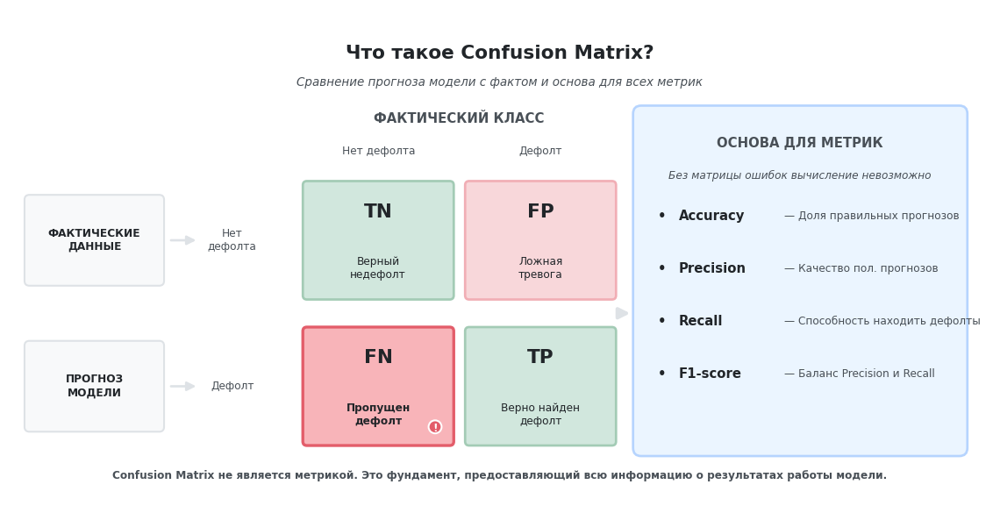

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch, Circle

# ==========================================
# 1. ЦВЕТОВАЯ ПАЛИТРА
# ==========================================
GREEN = "#D1E7DD"
GREEN_BORDER = "#A3CBB5"
RED = "#F8D7DA"
RED_BORDER = "#F1AEB5"
CRITICAL_RED = "#F8B4B9"
CRITICAL_BORDER = "#E35D6A"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
BLUE = "#EBF5FF"
BLUE_BORDER = "#B6D4FE"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# ==========================================
# 2. ТИПОГРАФИЧЕСКАЯ СИСТЕМА (Масштаб 1.5x)
# ==========================================
S = 0.65 # Коэффициент уменьшения
FS_TITLE = 16 * S
FS_SUBTITLE = 10 * S
FS_AXIS = 11 * S
FS_CELL_MAIN = 16 * S
FS_CELL_DESC = 9 * S
FS_PANEL_TITLE = 11 * S
FS_PANEL_SUB = 9 * S
FS_METRIC_NAME = 11 * S
FS_METRIC_DESC = 9 * S
FS_FOOTER = 9 * S

# ==========================================
# 3. СИСТЕМА КООРДИНАТ И СЕТКА (Золотой шаблон)
# ==========================================
AXES_W, AXES_H = 12, 6       # Внутренняя логика (не меняется)
FIG_W, FIG_H = 8, 4          # Физический размер (уменьшен в 1.5 раза)

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# Вертикальная ось
TITLE_Y = AXES_H - 0.5
SUBTITLE_Y = TITLE_Y - 0.35
TOP_AXIS_Y = SUBTITLE_Y - 0.45
COL_LABEL_Y = TOP_AXIS_Y - 0.4

# Левая панель
LEFT_PANEL_X = 0.2
LEFT_PANEL_W = 1.6
LEFT_PANEL_H = 1.0
LEFT_PANEL_CX = LEFT_PANEL_X + LEFT_PANEL_W / 2

# Матрица
CELL_W = 1.8
CELL_H = 1.4
CELL_PAD_Y = CELL_H * 0.25
MATRIX_COL1_X = 4.5
MATRIX_COL2_X = MATRIX_COL1_X + CELL_W + 0.2
MATRIX_LEFT_EDGE = MATRIX_COL1_X - CELL_W / 2
MATRIX_RIGHT_EDGE = MATRIX_COL2_X + CELL_W / 2
MATRIX_ROW1_Y = COL_LABEL_Y - 0.4 - (CELL_H / 2)
MATRIX_ROW2_Y = MATRIX_ROW1_Y - CELL_H - 0.4

# Подписи строк
ROW_LABEL_X = (LEFT_PANEL_X + LEFT_PANEL_W + MATRIX_LEFT_EDGE) / 2

# Стрелки слева
ARROW_START_X = LEFT_PANEL_X + LEFT_PANEL_W + 0.1
ARROW_END_X = ROW_LABEL_X - 0.4

# Правая панель
RIGHT_PANEL_X = 7.7
RIGHT_PANEL_W = AXES_W - 0.3 - RIGHT_PANEL_X
RIGHT_PANEL_H = 4.2
RIGHT_PANEL_Y = 0.6
RIGHT_PANEL_CX = RIGHT_PANEL_X + RIGHT_PANEL_W / 2

# Метрики
METRIC_START_Y = RIGHT_PANEL_Y + RIGHT_PANEL_H - 1.3
METRIC_STEP = 0.65
METRIC_BULLET_X = RIGHT_PANEL_X + 0.3
METRIC_NAME_X = RIGHT_PANEL_X + 0.5
METRIC_DESC_X = RIGHT_PANEL_X + 1.8

FOOTER_Y = 0.3

# ==========================================
# 4. ОТРИСОВКА ЭЛЕМЕНТОВ (с масштабом S)
# ==========================================

# --- Заголовки ---
ax.text(AXES_W/2, TITLE_Y, "Что такое Confusion Matrix?", ha="center", va="center", fontsize=FS_TITLE, weight="bold", color=TEXT_DARK)
ax.text(AXES_W/2, SUBTITLE_Y, "Сравнение прогноза модели с фактом и основа для всех метрик", ha="center", va="center", fontsize=FS_SUBTITLE, color=TEXT_MUTED, style="italic")

# --- Левая панель ---
fact_box = FancyBboxPatch((LEFT_PANEL_X, MATRIX_ROW1_Y - LEFT_PANEL_H/2), LEFT_PANEL_W, LEFT_PANEL_H, boxstyle="round,pad=0.06,rounding_size=0.06", linewidth=1.0, edgecolor=GRAY_BORDER, facecolor=GRAY)
ax.add_patch(fact_box)
ax.text(LEFT_PANEL_CX, MATRIX_ROW1_Y, "ФАКТИЧЕСКИЕ\nДАННЫЕ", ha="center", va="center", fontsize=FS_CELL_DESC, weight="bold", color=TEXT_DARK)

pred_box = FancyBboxPatch((LEFT_PANEL_X, MATRIX_ROW2_Y - LEFT_PANEL_H/2), LEFT_PANEL_W, LEFT_PANEL_H, boxstyle="round,pad=0.06,rounding_size=0.06", linewidth=1.0, edgecolor=GRAY_BORDER, facecolor=GRAY)
ax.add_patch(pred_box)
ax.text(LEFT_PANEL_CX, MATRIX_ROW2_Y, "ПРОГНОЗ\nМОДЕЛИ", ha="center", va="center", fontsize=FS_CELL_DESC, weight="bold", color=TEXT_DARK)

# Стрелки
ax.add_patch(FancyArrowPatch((ARROW_START_X, MATRIX_ROW1_Y), (ARROW_END_X, MATRIX_ROW1_Y), arrowstyle="-|>", mutation_scale=10, linewidth=1.3, color=GRAY_BORDER))
ax.add_patch(FancyArrowPatch((ARROW_START_X, MATRIX_ROW2_Y), (ARROW_END_X, MATRIX_ROW2_Y), arrowstyle="-|>", mutation_scale=10, linewidth=1.3, color=GRAY_BORDER))

# --- Матрица ---
ax.text((MATRIX_COL1_X + MATRIX_COL2_X)/2, TOP_AXIS_Y, "ФАКТИЧЕСКИЙ КЛАСС", ha="center", va="center", fontsize=FS_AXIS, weight="bold", color=TEXT_MUTED)

# Подписи столбцов и строк
ax.text(MATRIX_COL1_X, COL_LABEL_Y, "Нет дефолта", ha="center", va="center", fontsize=FS_CELL_DESC, color=TEXT_MUTED)
ax.text(MATRIX_COL2_X, COL_LABEL_Y, "Дефолт", ha="center", va="center", fontsize=FS_CELL_DESC, color=TEXT_MUTED)
ax.text(ROW_LABEL_X, MATRIX_ROW1_Y, "Нет\nдефолта", ha="center", va="center", fontsize=FS_CELL_DESC, color=TEXT_MUTED)
ax.text(ROW_LABEL_X, MATRIX_ROW2_Y, "Дефолт", ha="center", va="center", fontsize=FS_CELL_DESC, color=TEXT_MUTED)

# Ячейки
# 1. TN
tn_box = FancyBboxPatch((MATRIX_COL1_X-CELL_W/2, MATRIX_ROW1_Y-CELL_H/2), CELL_W, CELL_H, boxstyle="round,pad=0.03,rounding_size=0.05", linewidth=1.3, edgecolor=GREEN_BORDER, facecolor=GREEN)
ax.add_patch(tn_box)
ax.text(MATRIX_COL1_X, MATRIX_ROW1_Y+CELL_PAD_Y, "TN", ha="center", va="center", fontsize=FS_CELL_MAIN, weight="bold", color=TEXT_DARK)
ax.text(MATRIX_COL1_X, MATRIX_ROW1_Y-CELL_PAD_Y, "Верный\nнедефолт", ha="center", va="center", fontsize=FS_CELL_DESC, color=TEXT_DARK)

# 2. FP
fp_box = FancyBboxPatch((MATRIX_COL2_X-CELL_W/2, MATRIX_ROW1_Y-CELL_H/2), CELL_W, CELL_H, boxstyle="round,pad=0.03,rounding_size=0.05", linewidth=1.3, edgecolor=RED_BORDER, facecolor=RED)
ax.add_patch(fp_box)
ax.text(MATRIX_COL2_X, MATRIX_ROW1_Y+CELL_PAD_Y, "FP", ha="center", va="center", fontsize=FS_CELL_MAIN, weight="bold", color=TEXT_DARK)
ax.text(MATRIX_COL2_X, MATRIX_ROW1_Y-CELL_PAD_Y, "Ложная\nтревога", ha="center", va="center", fontsize=FS_CELL_DESC, color=TEXT_DARK)

# 3. FN (Критическая)
fn_box = FancyBboxPatch((MATRIX_COL1_X-CELL_W/2, MATRIX_ROW2_Y-CELL_H/2), CELL_W, CELL_H, boxstyle="round,pad=0.03,rounding_size=0.05", linewidth=1.6, edgecolor=CRITICAL_BORDER, facecolor=CRITICAL_RED)
ax.add_patch(fn_box)
ax.text(MATRIX_COL1_X, MATRIX_ROW2_Y+CELL_PAD_Y, "FN", ha="center", va="center", fontsize=FS_CELL_MAIN, weight="bold", color=TEXT_DARK)
ax.text(MATRIX_COL1_X, MATRIX_ROW2_Y-CELL_PAD_Y, "Пропущен\nдефолт", ha="center", va="center", fontsize=FS_CELL_DESC, weight="bold", color=TEXT_DARK)

# Знак восклицания
warn_x = MATRIX_COL1_X + CELL_W/2 - 0.2
warn_y = MATRIX_ROW2_Y - CELL_H/2 + 0.2
warn_circle = Circle((warn_x, warn_y), 0.08, facecolor=CRITICAL_BORDER, edgecolor="white", linewidth=1.0, zorder=5)
ax.add_patch(warn_circle)
ax.text(warn_x, warn_y - 0.015, "!", color="white", ha="center", va="center", fontsize=FS_CELL_DESC, weight="bold", zorder=6)

# 4. TP
tp_box = FancyBboxPatch((MATRIX_COL2_X-CELL_W/2, MATRIX_ROW2_Y-CELL_H/2), CELL_W, CELL_H, boxstyle="round,pad=0.03,rounding_size=0.05", linewidth=1.3, edgecolor=GREEN_BORDER, facecolor=GREEN)
ax.add_patch(tp_box)
ax.text(MATRIX_COL2_X, MATRIX_ROW2_Y+CELL_PAD_Y, "TP", ha="center", va="center", fontsize=FS_CELL_MAIN, weight="bold", color=TEXT_DARK)
ax.text(MATRIX_COL2_X, MATRIX_ROW2_Y-CELL_PAD_Y, "Верно найден\nдефолт", ha="center", va="center", fontsize=FS_CELL_DESC, color=TEXT_DARK)

# --- Правая панель ---
# Стрелка к панели
ax.add_patch(FancyArrowPatch((MATRIX_RIGHT_EDGE + 0.05, (MATRIX_ROW1_Y+MATRIX_ROW2_Y)/2), (RIGHT_PANEL_X - 0.05, (MATRIX_ROW1_Y+MATRIX_ROW2_Y)/2), arrowstyle="-|>", mutation_scale=12, linewidth=2.0, color=GRAY_BORDER))

foundation_box = FancyBboxPatch((RIGHT_PANEL_X, RIGHT_PANEL_Y), RIGHT_PANEL_W, RIGHT_PANEL_H, boxstyle="round,pad=0.06,rounding_size=0.10", linewidth=1.3, edgecolor=BLUE_BORDER, facecolor=BLUE)
ax.add_patch(foundation_box)

ax.text(RIGHT_PANEL_CX, RIGHT_PANEL_Y + RIGHT_PANEL_H - 0.4, "ОСНОВА ДЛЯ МЕТРИК", ha="center", va="center", fontsize=FS_PANEL_TITLE, weight="bold", color=TEXT_MUTED)
ax.text(RIGHT_PANEL_CX, RIGHT_PANEL_Y + RIGHT_PANEL_H - 0.8, "Без матрицы ошибок вычисление невозможно", ha="center", va="center", fontsize=FS_PANEL_SUB, color=TEXT_MUTED, style="italic")

metrics = [
    ("Accuracy", "Доля правильных прогнозов"),
    ("Precision", "Качество пол. прогнозов"),
    ("Recall", "Способность находить дефолты"),
    ("F1-score", "Баланс Precision и Recall")
]

for i, (name, desc) in enumerate(metrics):
    y_pos = METRIC_START_Y - i * METRIC_STEP
    ax.text(METRIC_BULLET_X, y_pos, "•", ha="center", va="center", fontsize=FS_METRIC_NAME, weight="bold", color=TEXT_DARK)
    ax.text(METRIC_NAME_X, y_pos, name, ha="left", va="center", fontsize=FS_METRIC_NAME, weight="bold", color=TEXT_DARK)
    ax.text(METRIC_DESC_X, y_pos, f"— {desc}", ha="left", va="center", fontsize=FS_METRIC_DESC, color=TEXT_MUTED)

# --- Подвал ---
ax.text(AXES_W/2, FOOTER_Y, "Confusion Matrix не является метрикой. Это фундамент, предоставляющий всю информацию о результатах работы модели.", ha="center", va="center", fontsize=FS_FOOTER, color=TEXT_MUTED, weight="bold")

plt.tight_layout()
plt.show()

# Глава 7. Что показывает Accuracy и почему эта метрика кажется такой хорошей?

## Вопрос

После знакомства с Confusion Matrix возникает естественный вопрос.

Как на её основе определить, насколько хорошо работает модель?

Самой известной метрикой качества является Accuracy.

Именно её обычно рассматривают первой при изучении задач классификации.

## Что показывает Accuracy?

Accuracy показывает долю объектов, которые модель классифицировала правильно.

При вычислении Accuracy учитываются оба типа правильных прогнозов:

- правильно найденные дефолты (True Positive);
- правильно найденные недефолтные компании (True Negative).

Таким образом, Accuracy оценивает общую долю верных ответов модели.

## Как вычисляется Accuracy?

Для вычисления Accuracy необходимо подсчитать количество всех правильных прогнозов и разделить его на общее число объектов.

Иными словами,

Accuracy отвечает на простой вопрос:

> Какую долю объектов модель классифицировала правильно?

Чем выше значение Accuracy, тем больше правильных прогнозов сделала модель.

Если Accuracy равна 0.95, это означает, что модель правильно классифицировала 95 % всех объектов выборки.

## Почему Accuracy получила такое широкое распространение?

Эта метрика обладает несколькими преимуществами.

Во-первых, она очень проста для понимания.

Во-вторых, её легко вычислить.

Наконец, её значение интуитивно интерпретируется: чем выше Accuracy, тем выше доля правильных ответов модели.

Поэтому Accuracy часто используют как первую характеристику качества классификатора.

## Можно ли всегда доверять Accuracy?

На первый взгляд кажется, что высокая Accuracy свидетельствует о хорошей работе модели.

Однако это верно далеко не всегда.

В некоторых задачах высокая Accuracy может скрывать серьёзные ошибки модели.

Особенно часто подобная ситуация возникает при наличии выраженного дисбаланса классов.

## Вывод

Accuracy является простой и удобной метрикой общей точности классификации.

Однако она оценивает только суммарную долю правильных ответов и не показывает, какие именно объекты модель классифицирует хорошо, а какие — плохо.

В следующей главе мы рассмотрим пример, в котором Accuracy оказывается очень высокой, несмотря на то что модель практически не решает поставленную задачу.

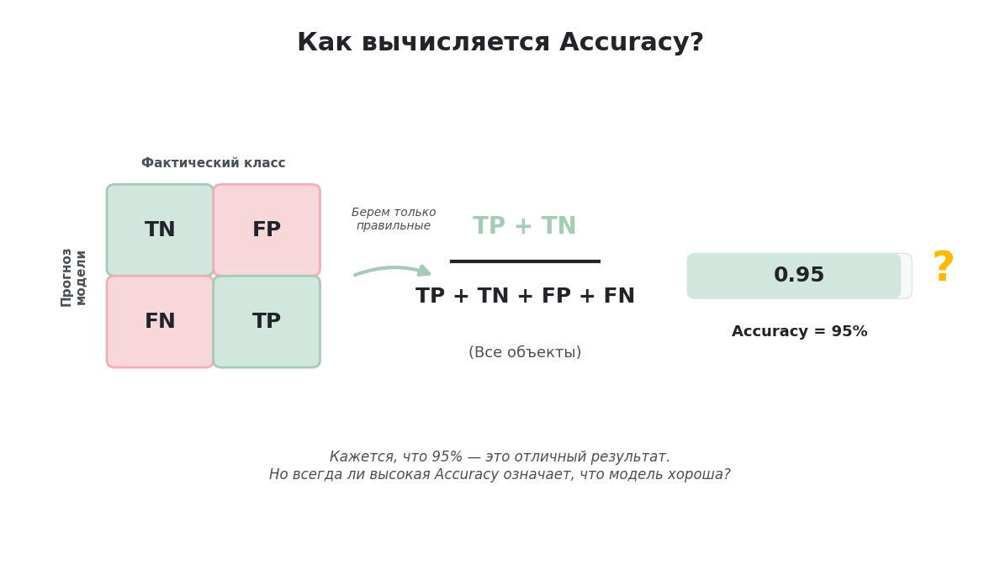

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch

# ---------- Цветовая палитра ----------
GREEN = "#D1E7DD"
GREEN_BORDER = "#A3CBB5"
RED = "#F8D7DA"
RED_BORDER = "#F1AEB5"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# Создаем более компактную фигуру (меньше ширина, чуть больше высота)
fig, ax = plt.subplots(figsize=(12, 7))
ax.set_xlim(0, 12) # Сузили оси с 14 до 12
ax.set_ylim(0, 8)
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Как вычисляется Accuracy?",
    ha="center", va="center",
    fontsize=22, weight="bold", color=TEXT_DARK
)

# ---------- 2. Confusion Matrix (Слева) ----------
mx, my = 2.5, 4.2
cell_size = 1.3

cells = {
    "TN": (1.85, 4.85, GREEN, GREEN_BORDER),
    "FP": (3.15, 4.85, RED, RED_BORDER),
    "FN": (1.85, 3.55, RED, RED_BORDER),
    "TP": (3.15, 3.55, GREEN, GREEN_BORDER)
}

for key, (cx, cy, color, border) in cells.items():
    rect = FancyBboxPatch(
        (cx - cell_size/2 + 0.05, cy - cell_size/2 + 0.05),
        cell_size - 0.1, cell_size - 0.1,
        boxstyle="round,pad=0.05,rounding_size=0.1",
        linewidth=2, edgecolor=border, facecolor=color
    )
    ax.add_patch(rect)
    ax.text(cx, cy, key, ha="center", va="center", fontsize=18, weight="bold", color=TEXT_DARK)

# Подписи осей матрицы (отодвинуты чуть дальше, чтобы не пересекаться)
ax.text(2.5, 5.8, "Фактический класс", ha="center", va="center", fontsize=11, color=TEXT_MUTED, weight="bold")
ax.text(0.8, 4.2, "Прогноз\nмодели", ha="center", va="center", fontsize=11, color=TEXT_MUTED, weight="bold", rotation=90)

# ---------- 3. Стрелки к формуле ----------
arrow = FancyArrowPatch(
    (4.2, 4.2), (5.2, 4.2),
    connectionstyle="arc3,rad=-0.2",
    arrowstyle="-|>", mutation_scale=20,
    linewidth=3, color=GREEN_BORDER
)
ax.add_patch(arrow)

ax.text(
    4.7, 5.0, "Берем только\nправильные",
    ha="center", va="center", fontsize=10, color=TEXT_MUTED, style="italic"
)

# ---------- 4. Формула (Центр) ----------
# Уменьшили размер шрифта формулы, чтобы она не была слишком громоздкой
ax.text(
    6.3, 4.9, "TP + TN",
    ha="center", va="center", fontsize=20, weight="bold", color=GREEN_BORDER
)

# Дробная черта (сделана чуть длиннее и центрирована)
ax.plot([5.4, 7.2], [4.4, 4.4], color=TEXT_DARK, linewidth=3)

ax.text(
    6.3, 3.9, "TP + TN + FP + FN",
    ha="center", va="center", fontsize=18, weight="bold", color=TEXT_DARK
)

ax.text(
    6.3, 3.1, "(Все объекты)",
    ha="center", va="center", fontsize=13, color=TEXT_MUTED
)

# ---------- 5. Прогресс-бар (Справа) ----------
# Сдвинули левее, чтобы вписаться в новые размеры
bar_x_start = 8.3
bar_x_end = 11.0
bar_y = 4.2
bar_height = 0.6

# Фон прогресс-бара (100%)
bg_bar = FancyBboxPatch(
    (bar_x_start, bar_y - bar_height/2), bar_x_end - bar_x_start, bar_height,
    boxstyle="round,pad=0.02,rounding_size=0.1",
    linewidth=1, edgecolor=GRAY_BORDER, facecolor=GRAY
)
ax.add_patch(bg_bar)

# Заполненная часть (95%)
fill_width = (bar_x_end - bar_x_start) * 0.95
fill_bar = FancyBboxPatch(
    (bar_x_start, bar_y - bar_height/2), fill_width, bar_height,
    boxstyle="round,pad=0.02,rounding_size=0.1",
    linewidth=0, facecolor=GREEN, edgecolor=GREEN_BORDER
)
ax.add_patch(fill_bar)

# Текст на прогресс-баре
ax.text(
    (bar_x_start + bar_x_end)/2, bar_y, "0.95",
    ha="center", va="center", fontsize=18, weight="bold", color=TEXT_DARK
)

# Подпись прогресс-бара
ax.text(
    (bar_x_start + bar_x_end)/2, bar_y - 0.8, "Accuracy = 95%",
    ha="center", va="center", fontsize=13, weight="bold", color=TEXT_DARK
)

# Знак вопроса (намек на подвох)
ax.text(
    11.4, bar_y + 0.1, "?",
    ha="center", va="center", fontsize=35, weight="bold", color="#FFB900"
)

# ---------- 6. Текстовые выноски ----------
ax.text(
    6.0, 1.5,
    "Кажется, что 95% — это отличный результат.\nНо всегда ли высокая Accuracy означает, что модель хороша?",
    ha="center", va="center", fontsize=12, color=TEXT_MUTED, style="italic"
)

plt.tight_layout()
plt.show()

# Глава 8. Почему Accuracy может вводить исследователя в заблуждение?

## Вопрос

В предыдущей главе мы познакомились с метрикой Accuracy и выяснили, что она показывает долю правильных прогнозов модели.

На первый взгляд кажется очевидным:

> чем выше Accuracy, тем лучше работает модель.

Но всегда ли это действительно так?

Чтобы ответить на этот вопрос, рассмотрим простой пример.

## Пример

Предположим, что тестовая выборка содержит 1000 компаний.

Из них:

- 900 компаний не допустили дефолт;
- 100 компаний допустили дефолт.

Теперь представим модель, которая для всех компаний выдаёт один и тот же прогноз:

> «Дефолта не будет».

Другими словами, модель относит каждый объект к классу **«Нет дефолта»**.

## Что получится?

В этом случае модель:

- правильно классифицирует **900** недефолтных компаний;
- не обнаружит **ни одного** дефолта.

Следовательно,

\[
Accuracy=\frac{900}{1000}=0.9=90\%.
\]

На первый взгляд такой результат выглядит очень хорошим.

Однако модель не смогла выполнить свою основную задачу — обнаружить компании, допустившие дефолт.

## Почему так произошло?

Accuracy показывает только общую долю правильных прогнозов.

При этом она не учитывает, за счёт какого класса была достигнута высокая точность.

Если один класс значительно преобладает над другим, модель может получить высокое значение Accuracy практически полностью за счёт объектов большинства.

В результате возникает ложное впечатление о высоком качестве классификации, хотя модель практически не распознаёт объекты редкого класса.

## Вывод

Таким образом, высокая Accuracy ещё не гарантирует, что модель действительно хорошо решает поставленную задачу.

Возникает следующий вопрос.

Если Accuracy не позволяет объективно оценить качество модели при наличии дисбаланса классов, то **какие показатели следует использовать вместо неё?**

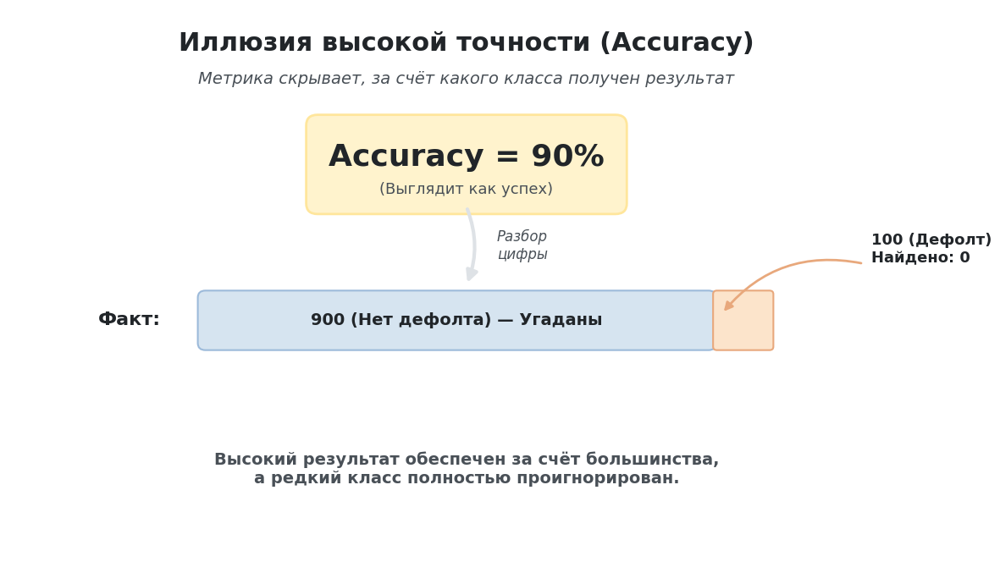

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch

# ---------- Цветовая палитра (Мягкая и безопасная) ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# Широкий и просторный холст (как в твоем примере)
fig, ax = plt.subplots(figsize=(12, 7))
ax.set_xlim(0, 12)
ax.set_ylim(0, 8)
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Иллюзия высокой точности (Accuracy)",
    ha="center", va="center",
    fontsize=22, weight="bold", color=TEXT_DARK
)

ax.text(
    6.0, 7.0, "Метрика скрывает, за счёт какого класса получен результат",
    ha="center", va="center",
    fontsize=14, color=TEXT_MUTED, style="italic"
)

# ---------- 2. Блок Accuracy (Сверху) ----------
acc_box = FancyBboxPatch(
    (4.0, 5.2), 4.0, 1.2,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=2, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(acc_box)

ax.text(
    6.0, 5.9, "Accuracy = 90%",
    ha="center", va="center",
    fontsize=26, weight="bold", color=TEXT_DARK
)

ax.text(
    6.0, 5.45, "(Выглядит как успех)",
    ha="center", va="center",
    fontsize=13, color=TEXT_MUTED
)

# ---------- 3. Стрелка разбора ----------
arrow = FancyArrowPatch(
    (6.0, 5.2), (6.0, 4.1),
    connectionstyle="arc3,rad=-0.2",
    arrowstyle="-|>", mutation_scale=20,
    linewidth=3, color=GRAY_BORDER
)
ax.add_patch(arrow)

ax.text(
    6.4, 4.65, "Разбор\nцифры",
    ha="left", va="center",
    fontsize=12, color=TEXT_MUTED, style="italic"
)

# ---------- 4. Факт (Нижний блок) ----------
ax.text(
    2.0, 3.6, "Факт:",
    ha="right", va="center",
    fontsize=16, weight="bold", color=TEXT_DARK
)

bar_x = 2.5
bar_w = 7.5
bar_y = 3.6
bar_h = 0.8

# Синяя часть (900 - Нет дефолта)
blue_w = bar_w * 0.9
blue_box = FancyBboxPatch(
    (bar_x, bar_y - bar_h/2), blue_w, bar_h,
    boxstyle="round,pad=0.02,rounding_size=0.1",
    linewidth=1.5, edgecolor=BLUE_BORDER, facecolor=BLUE
)
ax.add_patch(blue_box)

ax.text(
    bar_x + blue_w/2, bar_y, "900 (Нет дефолта) — Угаданы",
    ha="center", va="center",
    fontsize=14, weight="bold", color=TEXT_DARK
)

# Оранжевая часть (100 - Дефолт)
orange_w = bar_w * 0.1
orange_box = FancyBboxPatch(
    (bar_x + blue_w, bar_y - bar_h/2), orange_w, bar_h,
    boxstyle="round,pad=0.02,rounding_size=0.05",
    linewidth=1.5, edgecolor=ORANGE_BORDER, facecolor=ORANGE
)
ax.add_patch(orange_box)

# ---------- 5. Аннотация к оранжевому блоку ----------
arrow_ann = FancyArrowPatch(
    (11.2, 4.4), (bar_x + blue_w + 0.1, bar_y + 0.1),
    connectionstyle="arc3,rad=0.3",
    arrowstyle="-|>", mutation_scale=15,
    linewidth=2, color=ORANGE_BORDER
)
ax.add_patch(arrow_ann)

ax.text(
    11.3, 4.6, "100 (Дефолт)\nНайдено: 0",
    ha="left", va="center",
    fontsize=13, weight="bold", color=TEXT_DARK
)

# ---------- 6. Подвал ----------
ax.text(
    6.0, 1.5,
    "Высокий результат обеспечен за счёт большинства,\nа редкий класс полностью проигнорирован.",
    ha="center", va="center",
    fontsize=14, color=TEXT_MUTED, weight="bold"
)

plt.tight_layout()
plt.show()

# Глава 9. Почему одной метрики недостаточно?

## Вопрос

В предыдущей главе мы выяснили, что высокая Accuracy ещё не гарантирует высокое качество модели.

Возникает следующий вопрос.

Если Accuracy может вводить исследователя в заблуждение, то каким образом тогда оценивать качество классификатора?

## Один вопрос — одна метрика

На первый взгляд может показаться, что достаточно заменить Accuracy какой-нибудь «более правильной» метрикой.

Однако на практике это невозможно.

Дело в том, что качество классификации нельзя описать одним числом.

Разные модели могут допускать разные ошибки, и в зависимости от задачи одни ошибки могут быть значительно важнее других.

Поэтому при оценке классификаторов обычно используют не одну, а несколько метрик.

Каждая из них отвечает на свой вопрос.

Например:

- насколько часто модель ошибается, когда прогнозирует дефолт;
- насколько хорошо модель находит все реальные дефолты;
- как оценить качество модели сразу с нескольких сторон.

Таким образом, каждая метрика показывает лишь одну грань качества классификатора.

Только совместный анализ нескольких показателей позволяет получить объективную оценку работы модели.

## Вывод

Далее мы последовательно познакомимся с основными метриками оценки качества классификации.

Начнём с **Precision** — метрики, которая позволяет ответить на вопрос:

> **Насколько можно доверять прогнозам модели, если она предсказывает дефолт?**

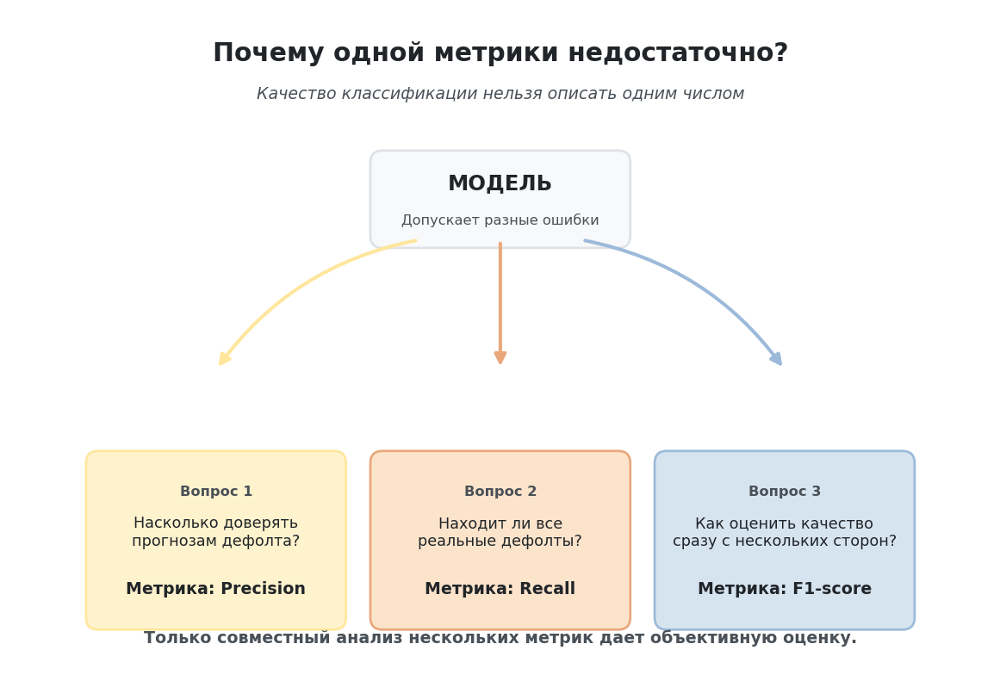

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch

# ---------- Цветовая палитра (Мягкая и безопасная) ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования (1.5x меньше) ---
S = 0.65 # Коэффициент уменьшения
AXES_W, AXES_H = 12, 8       # Внутренняя логика (не меняется)
FIG_W, FIG_H = 8, 5.33       # Физический размер (12/1.5=8, 8/1.5=5.33)

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Почему одной метрики недостаточно?",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)

ax.text(
    6.0, 7.0, "Качество классификации нельзя описать одним числом",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ---------- 2. Центральный блок (Модель) ----------
model_box = FancyBboxPatch(
    (4.5, 5.2), 3.0, 1.0,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=2*S, edgecolor=GRAY_BORDER, facecolor=GRAY
)
ax.add_patch(model_box)

ax.text(
    6.0, 5.9, "МОДЕЛЬ",
    ha="center", va="center",
    fontsize=18*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 5.45, "Допускает разные ошибки",
    ha="center", va="center",
    fontsize=12*S, color=TEXT_MUTED
)

# ---------- 3. Изогнутые стрелки к метрикам ----------
ax.add_patch(FancyArrowPatch(
    (5.0, 5.2), (2.5, 3.6),
    connectionstyle="arc3,rad=0.2",
    arrowstyle="-|>", mutation_scale=20*S,
    linewidth=3*S, color=AMBER_BORDER
))

ax.add_patch(FancyArrowPatch(
    (6.0, 5.2), (6.0, 3.6),
    connectionstyle="arc3,rad=0",
    arrowstyle="-|>", mutation_scale=20*S,
    linewidth=3*S, color=ORANGE_BORDER
))

ax.add_patch(FancyArrowPatch(
    (7.0, 5.2), (9.5, 3.6),
    connectionstyle="arc3,rad=-0.2",
    arrowstyle="-|>", mutation_scale=20*S,
    linewidth=3*S, color=BLUE_BORDER
))

# ---------- 4. Карточки метрик (Низ) ----------
card_w = 3.0
card_h = 2.0
card_y = 1.5

# Карточка 1: Precision (Желтая)
ax.add_patch(FancyBboxPatch(
    (1.0, card_y - card_h/2), card_w, card_h,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=2*S, edgecolor=AMBER_BORDER, facecolor=AMBER
))
ax.text(2.5, card_y + 0.6, "Вопрос 1", ha="center", va="center", fontsize=12*S, color=TEXT_MUTED, weight="bold")
ax.text(2.5, card_y + 0.1, "Насколько доверять\nпрогнозам дефолта?", ha="center", va="center", fontsize=13*S, color=TEXT_DARK)
ax.text(2.5, card_y - 0.6, "Метрика: Precision", ha="center", va="center", fontsize=14*S, weight="bold", color=TEXT_DARK)

# Карточка 2: Recall (Оранжевая)
ax.add_patch(FancyBboxPatch(
    (4.5, card_y - card_h/2), card_w, card_h,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=2*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE
))
ax.text(6.0, card_y + 0.6, "Вопрос 2", ha="center", va="center", fontsize=12*S, color=TEXT_MUTED, weight="bold")
ax.text(6.0, card_y + 0.1, "Находит ли все\nреальные дефолты?", ha="center", va="center", fontsize=13*S, color=TEXT_DARK)
ax.text(6.0, card_y - 0.6, "Метрика: Recall", ha="center", va="center", fontsize=14*S, weight="bold", color=TEXT_DARK)

# Карточка 3: F1 (Синяя)
ax.add_patch(FancyBboxPatch(
    (8.0, card_y - card_h/2), card_w, card_h,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=2*S, edgecolor=BLUE_BORDER, facecolor=BLUE
))
ax.text(9.5, card_y + 0.6, "Вопрос 3", ha="center", va="center", fontsize=12*S, color=TEXT_MUTED, weight="bold")
ax.text(9.5, card_y + 0.1, "Как оценить качество\nсразу с нескольких сторон?", ha="center", va="center", fontsize=13*S, color=TEXT_DARK)
ax.text(9.5, card_y - 0.6, "Метрика: F1-score", ha="center", va="center", fontsize=14*S, weight="bold", color=TEXT_DARK)

# ---------- 5. Подвал ----------
ax.text(
    6.0, 0.3,
    "Только совместный анализ нескольких метрик дает объективную оценку.",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, weight="bold"
)

plt.tight_layout()
plt.show()

# Глава 10. Precision. Насколько можно доверять прогнозам модели?

## Вопрос

В предыдущей главе мы выяснили, что одной метрики недостаточно для оценки качества классификатора.

Теперь познакомимся с первой из таких метрик — **Precision**.

Она отвечает на следующий вопрос:

> Если модель предсказала дефолт, насколько вероятно, что этот прогноз действительно оказался правильным?

## Идея метрики

Представим, что модель проанализировала множество компаний и выделила среди них тех, которые, по её мнению, допустят дефолт.

Однако часть этих прогнозов может оказаться ошибочной.

Некоторые компании действительно не выполнят свои обязательства, а некоторые, наоборот, окажутся финансово устойчивыми.

Метрика **Precision** показывает, какая доля прогнозов о дефолте оказалась правильной.

Чем выше значение Precision, тем реже модель ошибается, предсказывая дефолт.

## Формула

Для вычисления Precision используются два значения из матрицы ошибок:

- **True Positive (TP)** — компании, для которых модель правильно предсказала дефолт;
- **False Positive (FP)** — компании, которым модель ошибочно предсказала дефолт.

Тогда Precision вычисляется по формуле:

\[
Precision=\frac{TP}{TP+FP}.
\]

## Как интерпретировать Precision?

Предположим, модель предсказала дефолт для 100 компаний.

После проверки оказалось, что:

- 80 компаний действительно допустили дефолт;
- 20 компаний были ошибочно отнесены к дефолтным.

Тогда

\[
Precision=\frac{80}{80+20}=0.8=80\%.
\]

Это означает, что из всех компаний, которые модель назвала дефолтными, **80 % действительно оказались дефолтными**.

## Вывод

Precision показывает, насколько можно доверять положительным прогнозам модели.

Однако возникает новый вопрос.

Что произойдёт, если модель будет крайне осторожной и станет предсказывать дефолт лишь в самых очевидных случаях?

Возможно, Precision окажется очень высокой.

Но не начнёт ли модель при этом пропускать большое количество реальных дефолтов?

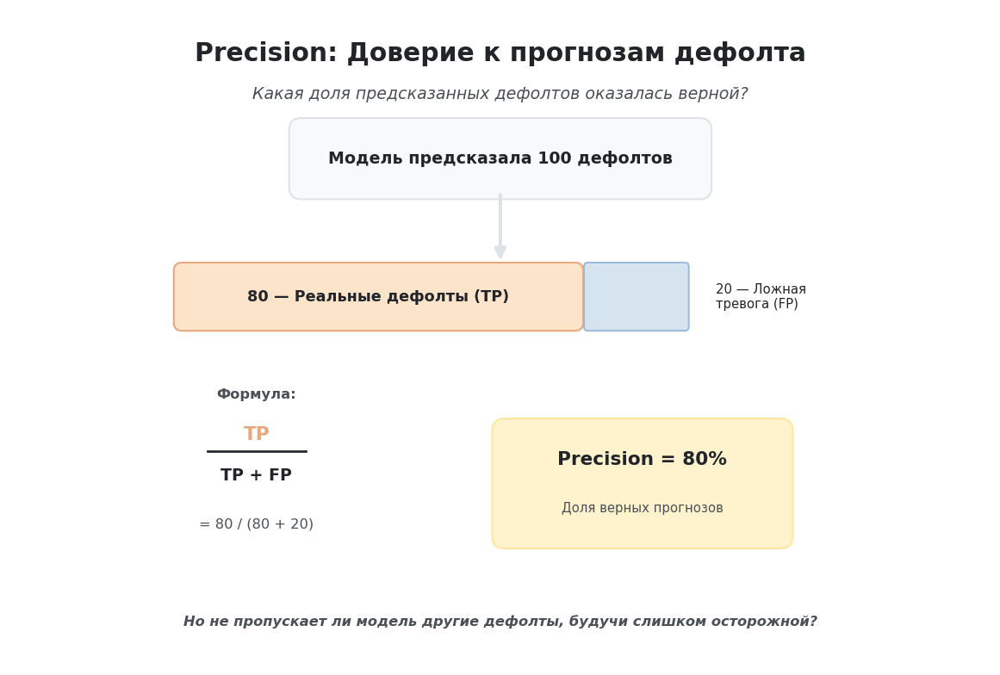

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch

# ---------- Цветовая палитра (Мягкая и безопасная) ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования (1.5x меньше) ---
S = 0.65 # Коэффициент уменьшения
AXES_W, AXES_H = 12, 8       # Внутренняя логика
FIG_W, FIG_H = 8, 5.33       # Физический размер

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Precision: Доверие к прогнозам дефолта",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)

ax.text(
    6.0, 7.0, "Какая доля предсказанных дефолтов оказалась верной?",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ---------- 2. Блок прогнозов (Сверху) ----------
pred_box = FancyBboxPatch(
    (3.5, 5.8), 5.0, 0.8,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor=GRAY
)
ax.add_patch(pred_box)

ax.text(
    6.0, 6.2, "Модель предсказала 100 дефолтов",
    ha="center", va="center",
    fontsize=14*S, weight="bold", color=TEXT_DARK
)

# ---------- 3. Стрелка разбора ----------
arrow = FancyArrowPatch(
    (6.0, 5.8), (6.0, 4.9),
    connectionstyle="arc3,rad=0",
    arrowstyle="-|>", mutation_scale=20*S,
    linewidth=3*S, color=GRAY_BORDER
)
ax.add_patch(arrow)

# ---------- 4. Разбор: TP и FP (Центр) ----------
bar_y = 4.5
bar_h = 0.8

# Оранжевая часть: 80 (TP - Верно)
orange_w = 5.0
orange_box = FancyBboxPatch(
    (2.0, bar_y - bar_h/2), orange_w, bar_h,
    boxstyle="round,pad=0.02,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE
)
ax.add_patch(orange_box)
ax.text(
    2.0 + orange_w/2, bar_y, "80 — Реальные дефолты (TP)",
    ha="center", va="center",
    fontsize=13*S, weight="bold", color=TEXT_DARK
)

# Синяя часть: 20 (FP - Ошибка)
blue_w = 1.25
blue_box = FancyBboxPatch(
    (2.0 + orange_w + 0.05, bar_y - bar_h/2), blue_w, bar_h,
    boxstyle="round,pad=0.02,rounding_size=0.05",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE
)
ax.add_patch(blue_box)
ax.text(
    2.0 + orange_w + blue_w + 0.4, bar_y, "20 — Ложная\nтревога (FP)",
    ha="left", va="center",
    fontsize=11*S, color=TEXT_DARK
)

# ---------- 5. Формула и Результат (Низ) ----------
# Левый блок: Формула
ax.text(
    3.0, 3.3, "Формула:",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)

# Визуализация дроби
ax.text(3.0, 2.8, "TP", ha="center", va="center", fontsize=16*S, weight="bold", color=ORANGE_BORDER)
ax.plot([2.4, 3.6], [2.6, 2.6], color=TEXT_DARK, linewidth=2*S)
ax.text(3.0, 2.3, "TP + FP", ha="center", va="center", fontsize=14*S, weight="bold", color=TEXT_DARK)

# Подстановка чисел
ax.text(
    3.0, 1.7, "= 80 / (80 + 20)",
    ha="center", va="center",
    fontsize=12*S, color=TEXT_MUTED
)

# Правый блок: Итог
res_box = FancyBboxPatch(
    (6.0, 1.5), 3.5, 1.4,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    7.75, 2.5, "Precision = 80%",
    ha="center", va="center",
    fontsize=16*S, weight="bold", color=TEXT_DARK
)
ax.text(
    7.75, 1.9, "Доля верных прогнозов",
    ha="center", va="center",
    fontsize=11*S, color=TEXT_MUTED
)

# ---------- 6. Мостик к следующей главе (Подвал) ----------
ax.text(
    6.0, 0.5,
    "Но не пропускает ли модель другие дефолты, будучи слишком осторожной?",
    ha="center", va="center",
    fontsize=12*S, color=TEXT_MUTED, weight="bold", style="italic"
)

plt.tight_layout()
plt.show()

# Глава 11. Recall. Сколько реальных дефолтов нашла модель?

## Вопрос

В предыдущей главе мы познакомились с метрикой Precision.

Она показывает, насколько можно доверять прогнозам модели, если она предсказывает дефолт.

Однако возникает другая ситуация.

Представим, что модель стала очень осторожной и предсказывает дефолт только тогда, когда практически полностью уверена в своём решении.

В этом случае Precision действительно может оказаться очень высокой.

Но сколько реальных дефолтов модель при этом сможет обнаружить?

Именно на этот вопрос отвечает метрика **Recall**.

## Идея метрики

Recall показывает, какую долю всех реальных дефолтов смогла обнаружить модель.

Если Recall высока, значит модель редко пропускает компании, которые действительно допустят дефолт.

Если Recall низкая, значит значительная часть реальных дефолтов остаётся незамеченной.

## Формула

Для вычисления Recall используются два значения из матрицы ошибок:

- **True Positive (TP)** — компании, для которых модель правильно предсказала дефолт;
- **False Negative (FN)** — компании, для которых модель ошибочно предсказала отсутствие дефолта.

Тогда Recall вычисляется по формуле:

\[
Recall=\frac{TP}{TP+FN}.
\]

## Как интерпретировать Recall?

Предположим, что в тестовой выборке действительно произошло 100 дефолтов.

Модель смогла обнаружить 80 из них, а ещё 20 пропустила.

Тогда

\[
Recall=\frac{80}{80+20}=0.8=80\%.
\]

Это означает, что модель обнаружила **80 % всех реальных дефолтов**, присутствовавших в данных.

## Вывод

Recall показывает, насколько хорошо модель умеет находить объекты интересующего класса.

Однако возникает новая проблема.

Можно ли одновременно добиться высокой Precision и высокой Recall?

Или улучшение одной из этих метрик неизбежно приводит к ухудшению другой?

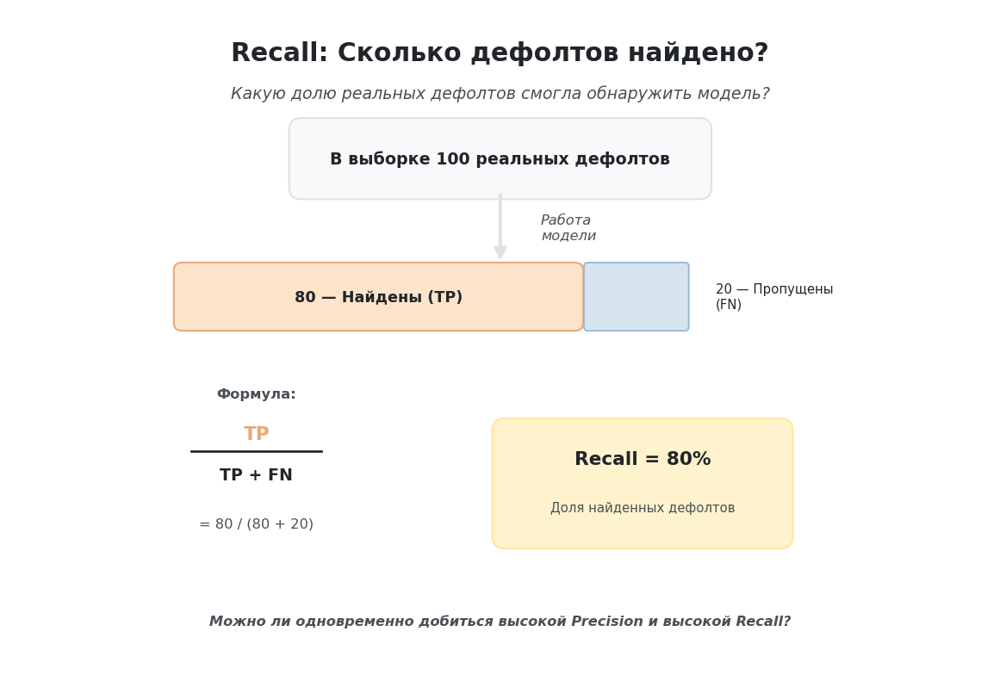

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch

# ---------- Цветовая палитра (Мягкая и безопасная) ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования (1.5x меньше) ---
S = 0.65 # Коэффициент уменьшения
AXES_W, AXES_H = 12, 8       # Внутренняя логика
FIG_W, FIG_H = 8, 5.33       # Физический размер

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Recall: Сколько дефолтов найдено?",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)

ax.text(
    6.0, 7.0, "Какую долю реальных дефолтов смогла обнаружить модель?",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ---------- 2. Блок фактов (Сверху) ----------
fact_box = FancyBboxPatch(
    (3.5, 5.8), 5.0, 0.8,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor=GRAY
)
ax.add_patch(fact_box)

ax.text(
    6.0, 6.2, "В выборке 100 реальных дефолтов",
    ha="center", va="center",
    fontsize=14*S, weight="bold", color=TEXT_DARK
)

# ---------- 3. Стрелка работы модели ----------
arrow = FancyArrowPatch(
    (6.0, 5.8), (6.0, 4.9),
    connectionstyle="arc3,rad=0",
    arrowstyle="-|>", mutation_scale=20*S,
    linewidth=3*S, color=GRAY_BORDER
)
ax.add_patch(arrow)

ax.text(
    6.5, 5.35, "Работа\nмодели",
    ha="left", va="center",
    fontsize=12*S, color=TEXT_MUTED, style="italic"
)

# ---------- 4. Разбор: TP и FN (Центр) ----------
bar_y = 4.5
bar_h = 0.8

# Оранжевая часть: 80 (TP - Найдены)
orange_w = 5.0
orange_box = FancyBboxPatch(
    (2.0, bar_y - bar_h/2), orange_w, bar_h,
    boxstyle="round,pad=0.02,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE
)
ax.add_patch(orange_box)
ax.text(
    2.0 + orange_w/2, bar_y, "80 — Найдены (TP)",
    ha="center", va="center",
    fontsize=13*S, weight="bold", color=TEXT_DARK
)

# Синяя часть: 20 (FN - Пропущены)
blue_w = 1.25
blue_box = FancyBboxPatch(
    (2.0 + orange_w + 0.05, bar_y - bar_h/2), blue_w, bar_h,
    boxstyle="round,pad=0.02,rounding_size=0.05",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE
)
ax.add_patch(blue_box)
ax.text(
    2.0 + orange_w + blue_w + 0.4, bar_y, "20 — Пропущены\n(FN)",
    ha="left", va="center",
    fontsize=11*S, color=TEXT_DARK
)

# ---------- 5. Формула и Результат (Низ) ----------
# Левый блок: Формула
ax.text(
    3.0, 3.3, "Формула:",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)

# Визуализация дроби
ax.text(3.0, 2.8, "TP", ha="center", va="center", fontsize=16*S, weight="bold", color=ORANGE_BORDER)
ax.plot([2.2, 3.8], [2.6, 2.6], color=TEXT_DARK, linewidth=2*S)
ax.text(3.0, 2.3, "TP + FN", ha="center", va="center", fontsize=14*S, weight="bold", color=TEXT_DARK)

# Подстановка чисел
ax.text(
    3.0, 1.7, "= 80 / (80 + 20)",
    ha="center", va="center",
    fontsize=12*S, color=TEXT_MUTED
)

# Правый блок: Итог
res_box = FancyBboxPatch(
    (6.0, 1.5), 3.5, 1.4,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    7.75, 2.5, "Recall = 80%",
    ha="center", va="center",
    fontsize=16*S, weight="bold", color=TEXT_DARK
)
ax.text(
    7.75, 1.9, "Доля найденных дефолтов",
    ha="center", va="center",
    fontsize=11*S, color=TEXT_MUTED
)

# ---------- 6. Мостик к следующей главе (Подвал) ----------
ax.text(
    6.0, 0.5,
    "Можно ли одновременно добиться высокой Precision и высокой Recall?",
    ha="center", va="center",
    fontsize=12*S, color=TEXT_MUTED, weight="bold", style="italic"
)

plt.tight_layout()
plt.show()

# Глава 12. F1-score. Как оценить баланс между Precision и Recall?

## Вопрос

Мы познакомились с двумя важными метриками качества классификации.

**Precision** показывает, насколько можно доверять прогнозам модели о дефолте.

**Recall** показывает, какую долю всех реальных дефолтов удалось обнаружить.

Возникает естественный вопрос.

Можно ли оценить качество модели одной метрикой, которая одновременно учитывает и Precision, и Recall?

Для этого используется **F1-score**.

## Идея метрики

На практике часто оказывается, что улучшение одной метрики приводит к ухудшению другой.

Например, модель может предсказывать дефолт только в самых очевидных случаях.

Тогда большинство её прогнозов окажутся правильными, то есть Precision будет высокой.

Однако многие реальные дефолты останутся необнаруженными, и Recall окажется низкой.

Возможна и обратная ситуация.

Модель может стараться найти как можно больше дефолтов.

Тогда Recall станет высокой, но вместе с настоящими дефолтами модель начнёт ошибочно относить к ним множество финансово устойчивых компаний, из-за чего Precision снизится.

Поэтому при сравнении моделей важно учитывать обе метрики одновременно.

## Формула

F1-score представляет собой гармоническое среднее между Precision и Recall.

\[
F1 = 2 \cdot \frac{Precision \cdot Recall}{Precision + Recall}.
\]

## Как интерпретировать F1-score?

Предположим, что модель имеет:

- Precision = 80 %;
- Recall = 80 %.

Тогда значение F1-score также составит 80 %.

Если же одна из двух метрик значительно ниже другой, значение F1-score также уменьшится.

Таким образом, высокий F1-score достигается только тогда, когда модель одновременно хорошо находит реальные дефолты и редко ошибается при их прогнозировании.

## Вывод

F1-score позволяет получить более сбалансированную оценку качества классификатора, чем Precision или Recall по отдельности.

Однако возникает следующий вопрос.

Можно ли оценивать качество модели независимо от выбранного порога классификации?

Для ответа на этот вопрос познакомимся с ROC-кривой.

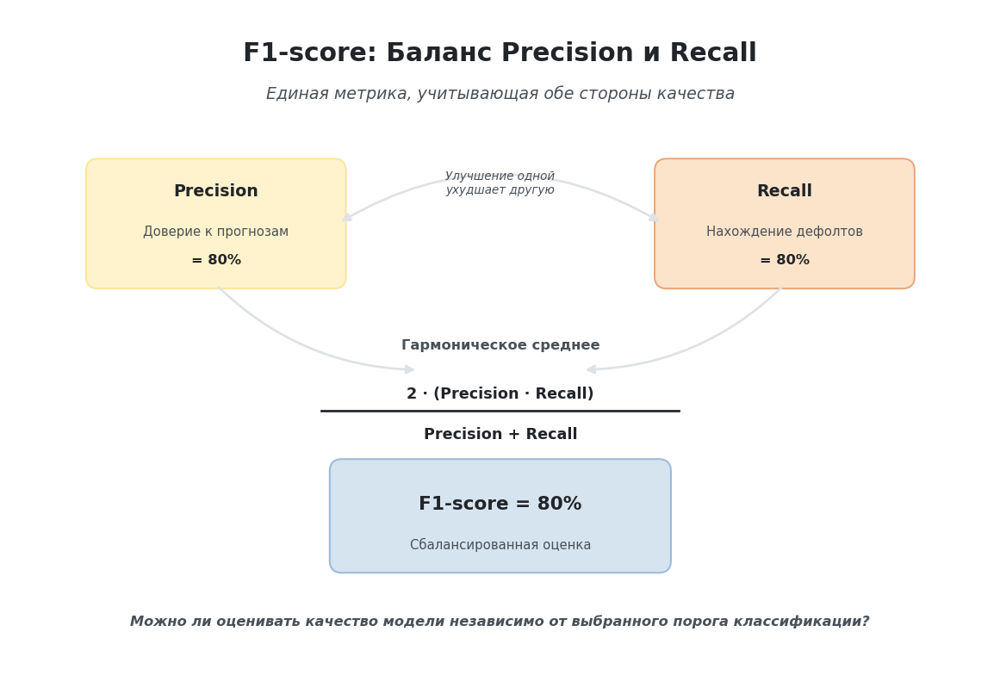

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch

# ---------- Цветовая палитра (Мягкая и безопасная) ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования (1.5x меньше) ---
S = 0.65 # Коэффициент уменьшения
AXES_W, AXES_H = 12, 8       # Внутренняя логика
FIG_W, FIG_H = 8, 5.33       # Физический размер

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "F1-score: Баланс Precision и Recall",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)

ax.text(
    6.0, 7.0, "Единая метрика, учитывающая обе стороны качества",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ---------- 2. Карточки Precision и Recall (Сверху) ----------
card_w = 3.0
card_h = 1.4
card_y = 5.4

# Карточка Precision (Желтая)
ax.add_patch(FancyBboxPatch(
    (1.0, card_y - card_h/2), card_w, card_h,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
))
ax.text(2.5, card_y + 0.4, "Precision", ha="center", va="center", fontsize=14*S, weight="bold", color=TEXT_DARK)
ax.text(2.5, card_y - 0.1, "Доверие к прогнозам", ha="center", va="center", fontsize=11*S, color=TEXT_MUTED)
ax.text(2.5, card_y - 0.45, "= 80%", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_DARK)

# Карточка Recall (Оранжевая)
ax.add_patch(FancyBboxPatch(
    (8.0, card_y - card_h/2), card_w, card_h,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE
))
ax.text(9.5, card_y + 0.4, "Recall", ha="center", va="center", fontsize=14*S, weight="bold", color=TEXT_DARK)
ax.text(9.5, card_y - 0.1, "Нахождение дефолтов", ha="center", va="center", fontsize=11*S, color=TEXT_MUTED)
ax.text(9.5, card_y - 0.45, "= 80%", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_DARK)

# ---------- 3. Стрелка противоречия (Между ними) ----------
arrow_tradeoff = FancyArrowPatch(
    (4.0, card_y), (8.0, card_y),
    connectionstyle="arc3,rad=-0.3",
    arrowstyle="<|-|>", mutation_scale=15*S,
    linewidth=2*S, color=GRAY_BORDER
)
ax.add_patch(arrow_tradeoff)

ax.text(
    6.0, 5.9, "Улучшение одной\nухудшает другую",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_MUTED, style="italic"
)

# ---------- 4. Сходящиеся стрелки к формуле ----------
ax.add_patch(FancyArrowPatch(
    (2.5, card_y - card_h/2 - 0.05), (5.0, 3.6),
    connectionstyle="arc3,rad=0.2",
    arrowstyle="-|>", mutation_scale=15*S,
    linewidth=2*S, color=GRAY_BORDER
))

ax.add_patch(FancyArrowPatch(
    (9.5, card_y - card_h/2 - 0.05), (7.0, 3.6),
    connectionstyle="arc3,rad=-0.2",
    arrowstyle="-|>", mutation_scale=15*S,
    linewidth=2*S, color=GRAY_BORDER
))

# ---------- 5. Формула (Центр) ----------
ax.text(
    6.0, 3.9, "Гармоническое среднее",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)

# Визуализация дроби
ax.text(6.0, 3.3, "2 · (Precision · Recall)", ha="center", va="center", fontsize=13*S, weight="bold", color=TEXT_DARK)
ax.plot([3.8, 8.2], [3.1, 3.1], color=TEXT_DARK, linewidth=2*S)
ax.text(6.0, 2.8, "Precision + Recall", ha="center", va="center", fontsize=13*S, weight="bold", color=TEXT_DARK)

# ---------- 6. Итог (Низ) ----------
res_box = FancyBboxPatch(
    (4.0, 1.2), 4.0, 1.2,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE
)
ax.add_patch(res_box)

ax.text(
    6.0, 1.95, "F1-score = 80%",
    ha="center", va="center",
    fontsize=16*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 1.45, "Сбалансированная оценка",
    ha="center", va="center",
    fontsize=11*S, color=TEXT_MUTED
)

# ---------- 7. Мостик к следующей главе (Подвал) ----------
ax.text(
    6.0, 0.5,
    "Можно ли оценивать качество модели независимо от выбранного порога классификации?",
    ha="center", va="center",
    fontsize=12*S, color=TEXT_MUTED, weight="bold", style="italic"
)

plt.tight_layout()
plt.show()

# Глава 13. ROC-кривая. Почему качество модели зависит от порога классификации?

## Вопрос

В предыдущих главах мы познакомились с метриками Precision, Recall и F1-score.

Однако все эти показатели рассчитываются после того, как модель уже разделила объекты на два класса: «дефолт» и «нет дефолта».

Возникает следующий вопрос.

Всегда ли это разделение одинаково?

## Вероятность вместо готового ответа

Большинство современных алгоритмов классификации не принимают окончательное решение сразу.

Вместо этого модель для каждого объекта вычисляет вероятность принадлежности к положительному классу.

Например, для одной компании вероятность дефолта может составлять 0.12, для другой — 0.48, а для третьей — 0.91.

Чтобы превратить эти вероятности в окончательный прогноз, необходимо выбрать **порог классификации**.

Чаще всего используется порог 0.5.

Если вероятность дефолта больше или равна 0.5, модель прогнозирует дефолт.

Если вероятность меньше 0.5, прогнозируется отсутствие дефолта.

## Почему порог имеет значение?

Изменяя порог классификации, можно получать разные результаты работы одной и той же модели.

Например, снижение порога приведёт к тому, что модель станет чаще прогнозировать дефолт.

При этом она обнаружит больше реальных дефолтов, но одновременно возрастёт число ложных срабатываний.

Если же увеличить порог, модель станет более осторожной.

Количество ошибочных прогнозов о дефолте уменьшится, однако часть реальных дефолтов может остаться необнаруженной.

Таким образом, качество классификации зависит не только от самой модели, но и от выбранного порога.

## Идея ROC-кривой

Возникает естественный вопрос.

Можно ли оценить качество модели сразу для всех возможных значений порога, а не только для одного выбранного значения?

Именно для этого используется **ROC-кривая**.

Она показывает, как изменяется качество классификации при последовательном изменении порога принятия решения.

## Вывод

ROC-кривая позволяет оценить поведение модели во всём диапазоне возможных порогов классификации.

Однако сравнивать модели только по форме ROC-кривой не всегда удобно.

Поэтому на практике чаще используют её числовую характеристику — **ROC-AUC**.

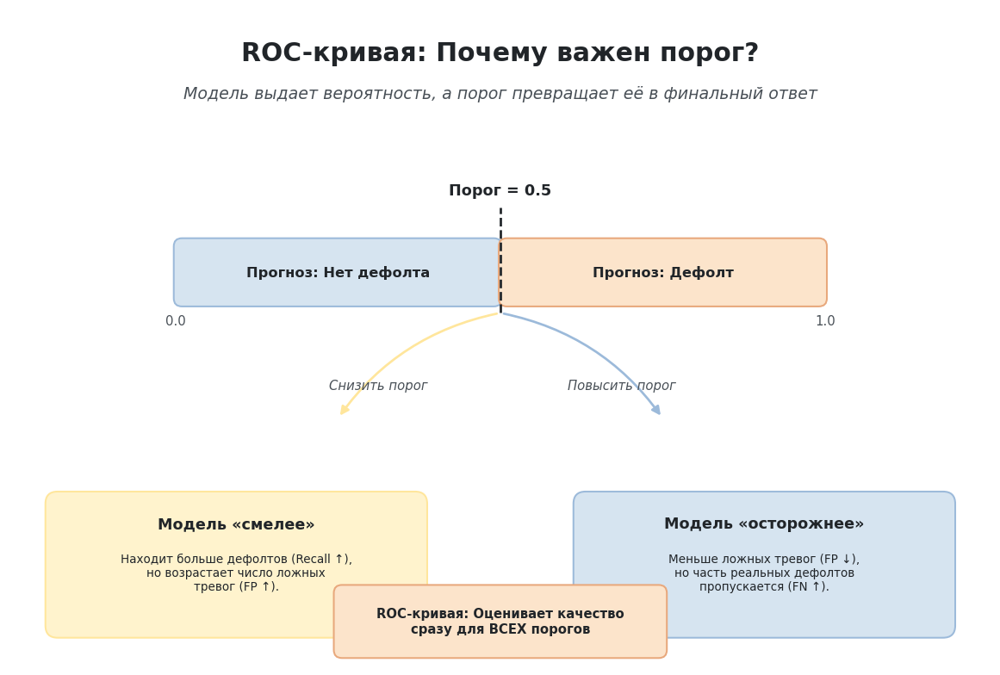

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch

# ---------- Цветовая палитра (Мягкая и безопасная) ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования (1.5x меньше) ---
S = 0.65 # Коэффициент уменьшения
AXES_W, AXES_H = 12, 8       # Внутренняя логика
FIG_W, FIG_H = 8, 5.33       # Физический размер

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "ROC-кривая: Почему важен порог?",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Модель выдает вероятность, а порог превращает её в финальный ответ",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ---------- 2. Ось вероятностей (Центр) ----------
bar_y = 4.8
bar_h = 0.8
bar_x_start = 2.0
bar_x_end = 10.0
threshold_x = 6.0 # Порог 0.5 ровно по центру

# Синяя часть (Нет дефолта)
ax.add_patch(FancyBboxPatch(
    (bar_x_start, bar_y - bar_h/2), threshold_x - bar_x_start, bar_h,
    boxstyle="round,pad=0.02,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE
))
ax.text(
    (bar_x_start + threshold_x)/2, bar_y, "Прогноз: Нет дефолта",
    ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_DARK
)

# Оранжевая часть (Дефолт)
ax.add_patch(FancyBboxPatch(
    (threshold_x, bar_y - bar_h/2), bar_x_end - threshold_x, bar_h,
    boxstyle="round,pad=0.02,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE
))
ax.text(
    (threshold_x + bar_x_end)/2, bar_y, "Прогноз: Дефолт",
    ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_DARK
)

# Подписи оси
ax.text(bar_x_start, bar_y - 0.6, "0.0", ha="center", va="center", fontsize=11*S, color=TEXT_MUTED)
ax.text(bar_x_end, bar_y - 0.6, "1.0", ha="center", va="center", fontsize=11*S, color=TEXT_MUTED)

# Маркер порога
ax.plot([threshold_x, threshold_x], [bar_y - bar_h/2 - 0.1, bar_y + bar_h/2 + 0.4], linestyle="--", linewidth=2*S, color=TEXT_DARK)
ax.text(
    threshold_x, bar_y + bar_h/2 + 0.6, "Порог = 0.5",
    ha="center", va="center", fontsize=13*S, weight="bold", color=TEXT_DARK
)

# ---------- 3. Стрелки сдвига порога ----------
# Стрелка влево (Снизить порог)
ax.add_patch(FancyArrowPatch(
    (threshold_x, bar_y - bar_h/2 - 0.1), (4.0, 3.0),
    connectionstyle="arc3,rad=0.2",
    arrowstyle="-|>", mutation_scale=15*S,
    linewidth=2*S, color=AMBER_BORDER
))
ax.text(
    4.5, 3.4, "Снизить порог",
    ha="center", va="center", fontsize=11*S, color=TEXT_MUTED, style="italic"
)

# Стрелка вправо (Повысить порог)
ax.add_patch(FancyArrowPatch(
    (threshold_x, bar_y - bar_h/2 - 0.1), (8.0, 3.0),
    connectionstyle="arc3,rad=-0.2",
    arrowstyle="-|>", mutation_scale=15*S,
    linewidth=2*S, color=BLUE_BORDER
))
ax.text(
    7.5, 3.4, "Повысить порог",
    ha="center", va="center", fontsize=11*S, color=TEXT_MUTED, style="italic"
)

# ---------- 4. Карточки исходов (Низ) ----------
card_w = 4.5
card_h = 1.6
card_y = 1.2

# Левая карточка (Желтая - Риск)
ax.add_patch(FancyBboxPatch(
    (0.5, card_y - card_h/2), card_w, card_h,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
))
ax.text(2.75, card_y + 0.5, "Модель «смелее»", ha="center", va="center", fontsize=13*S, weight="bold", color=TEXT_DARK)
ax.text(2.75, card_y - 0.1, "Находит больше дефолтов (Recall ↑),\nно возрастает число ложных\nтревог (FP ↑).", ha="center", va="center", fontsize=10*S, color=TEXT_DARK)

# Правая карточка (Синяя - Осторожность)
ax.add_patch(FancyBboxPatch(
    (7.0, card_y - card_h/2), card_w, card_h,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE
))
ax.text(9.25, card_y + 0.5, "Модель «осторожнее»", ha="center", va="center", fontsize=13*S, weight="bold", color=TEXT_DARK)
ax.text(9.25, card_y - 0.1, "Меньше ложных тревог (FP ↓),\nно часть реальных дефолтов\nпропускается (FN ↑).", ha="center", va="center", fontsize=10*S, color=TEXT_DARK)

# ---------- 5. Мостик к следующей главе (Подвал) ----------
roc_box = FancyBboxPatch(
    (4.0, 0.1), 4.0, 0.8,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE
)
ax.add_patch(roc_box)

ax.text(
    6.0, 0.5, "ROC-кривая: Оценивает качество\nсразу для ВСЕХ порогов",
    ha="center", va="center",
    fontsize=11*S, weight="bold", color=TEXT_DARK
)

plt.tight_layout()
plt.show()

# Глава 14. ROC-AUC. Как сравнить качество моделей одним числом?

## Вопрос

В предыдущей главе мы познакомились с ROC-кривой.

Она позволяет оценить, как изменяется качество классификации при различных значениях порога.

Однако возникает практический вопрос.

Если необходимо сравнить несколько моделей, всегда ли удобно анализировать форму нескольких ROC-кривых?

На практике такой способ сравнения оказывается достаточно сложным.

Поэтому используют числовую характеристику ROC-кривой — **ROC-AUC** (Area Under the Curve), то есть площадь под ROC-кривой.

## Что показывает ROC-AUC?

ROC-AUC принимает значения от **0 до 1**.

Чем больше площадь под ROC-кривой, тем лучше модель различает объекты двух классов.

Иными словами, тем выше вероятность того, что модель присвоит объекту класса «дефолт» более высокую вероятность, чем объекту класса «нет дефолта».

Главным преимуществом ROC-AUC является то, что эта метрика оценивает качество модели сразу на всех возможных порогах классификации, а не только при одном выбранном значении.

## Как интерпретировать ROC-AUC?

Значения ROC-AUC принято интерпретировать следующим образом:

- **0.5** — модель не лучше случайного угадывания;
- **от 0.6 до 0.7** — слабое качество классификации;
- **от 0.7 до 0.8** — удовлетворительное качество;
- **от 0.8 до 0.9** — хорошее качество;
- **выше 0.9** — очень высокое качество разделения классов.

Следует отметить, что приведённые границы являются ориентировочными и могут различаться в зависимости от предметной области и особенностей задачи.

## Вывод

ROC-AUC является одной из наиболее распространённых метрик оценки качества бинарной классификации.

Она позволяет сравнивать модели независимо от выбранного порога классификации и особенно полезна при анализе задач с **дисбалансом классов**.

Однако ни одна метрика не способна полностью охарактеризовать качество модели.

Поэтому в дальнейшем исследовании Accuracy, Precision, Recall, F1-score и ROC-AUC будут использоваться совместно, что позволит получить наиболее объективную оценку результатов классификации.

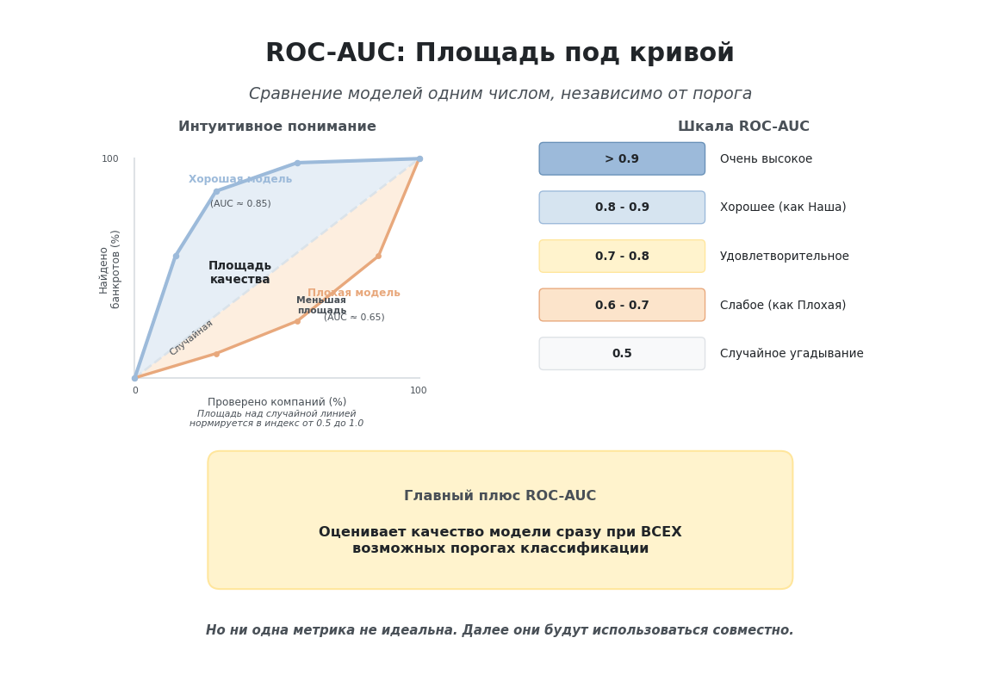

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, Polygon

# ---------- Цветовая палитра (Мягкая и безопасная) ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования (1.5x меньше) ---
S = 0.65 # Коэффициент уменьшения
AXES_W, AXES_H = 12, 8       # Внутренняя логика
FIG_W, FIG_H = 8, 5.33       # Физический размер

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "ROC-AUC: Площадь под кривой",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Сравнение моделей одним числом, независимо от порога",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Интуитивный график (Сравнение моделей)
# ==========================================
ax.text(3.25, 6.6, "Интуитивное понимание", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Оси графика
ax.plot([1.5, 1.5], [3.5, 6.2], color=GRAY_BORDER, linewidth=1.5*S)
ax.plot([1.5, 5.0], [3.5, 3.5], color=GRAY_BORDER, linewidth=1.5*S)

# Подписи осей
ax.text(3.25, 3.2, "Проверено компаний (%)", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED)
ax.text(1.2, 4.85, "Найдено\nбанкротов (%)", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, rotation=90)

# Метки на осях
ax.text(1.5, 3.35, "0", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(5.0, 3.35, "100", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(1.2, 6.2, "100", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)

# Линия случайной модели (диагональ)
ax.plot([1.5, 5.0], [3.5, 6.2], color=GRAY_BORDER, linestyle="--", linewidth=2*S, zorder=2)
ax.text(2.2, 4.0, "Случайная", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, rotation=38, zorder=3)

# --- Данные моделей ---
# Хорошая модель (быстрый рост)
good_x = [1.5, 2.0, 2.5, 3.5, 5.0]
good_y = [3.5, 5.0, 5.8, 6.15, 6.2]

# Плохая модель (медленный рост)
bad_x = [1.5, 2.5, 3.5, 4.5, 5.0]
bad_y = [3.5, 3.8, 4.2, 5.0, 6.2]

# Точки случайной модели (для точного построения полигонов)
rand_y_at_good_x = [3.5, 3.88, 4.27, 5.04, 6.2] # Y случайной на X хорошей
rand_y_at_bad_x = [3.5, 4.27, 5.04, 5.81, 6.2]  # Y случайной на X плохой

# --- Заливка площади Плохой модели (Между плохой и случайной) ---
bad_fill_coords = list(zip(bad_x, bad_y)) + list(zip(bad_x[::-1], rand_y_at_bad_x[::-1]))
fill_bad_poly = Polygon(bad_fill_coords, facecolor=ORANGE, alpha=0.6, edgecolor='none', zorder=1)
ax.add_patch(fill_bad_poly)

# --- Заливка площади Хорошей модели (Между хорошей и случайной) ---
good_fill_coords = list(zip(good_x, good_y)) + list(zip(good_x[::-1], rand_y_at_good_x[::-1]))
fill_good_poly = Polygon(good_fill_coords, facecolor=BLUE, alpha=0.6, edgecolor='none', zorder=2)
ax.add_patch(fill_good_poly)

# --- Линии моделей ---
ax.plot(bad_x, bad_y, color=ORANGE_BORDER, linewidth=2.5*S, marker="o", markersize=3.5*S, zorder=4)
ax.plot(good_x, good_y, color=BLUE_BORDER, linewidth=3*S, marker="o", markersize=4*S, zorder=5)

# --- Подписи на графике с привязкой к числам (Мостик к правой части) ---
ax.text(2.8, 4.8, "Площадь\nкачества", ha="center", va="center", fontsize=10*S, color=TEXT_DARK, weight="bold", zorder=6)
ax.text(3.8, 4.4, "Меньшая\nплощадь", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, weight="bold", zorder=6)

ax.text(2.8, 5.95, "Хорошая модель", ha="center", va="center", fontsize=9*S, color=BLUE_BORDER, weight="bold", zorder=6)
ax.text(2.8, 5.65, "(AUC ≈ 0.85)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, zorder=6)

ax.text(4.2, 4.55, "Плохая модель", ha="center", va="center", fontsize=9*S, color=ORANGE_BORDER, weight="bold", zorder=6)
ax.text(4.2, 4.25, "(AUC ≈ 0.65)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, zorder=6)

# Пояснение под графиком
ax.text(3.25, 3.0, "Площадь над случайной линией\nнормируется в индекс от 0.5 до 1.0",
        ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# ==========================================
# ПРАВАЯ ЧАСТЬ: Шкала качества
# ==========================================
ax.text(9.0, 6.6, "Шкала ROC-AUC", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Цвета выстроены по возрастанию: Серый -> Оранжевый (плохо) -> Желтый -> Голубой (хорошо) -> Насыщенный синий
scale_items = [
    ("0.5", "Случайное угадывание", GRAY, GRAY_BORDER, 3.8),
    ("0.6 - 0.7", "Слабое (как Плохая)", ORANGE, ORANGE_BORDER, 4.4),
    ("0.7 - 0.8", "Удовлетворительное", AMBER, AMBER_BORDER, 5.0),
    ("0.8 - 0.9", "Хорошее (как Наша)", BLUE, BLUE_BORDER, 5.6),
    ("> 0.9", "Очень высокое", BLUE_BORDER, "#6991B8", 6.2) # Немного темнее граница для контраста
]

bar_x_start = 6.5
bar_w = 2.0

for val, desc, color, border, y_pos in scale_items:
    # Полоска
    ax.add_patch(FancyBboxPatch(
        (bar_x_start, y_pos - 0.18), bar_w, 0.36,
        boxstyle="round,pad=0.02,rounding_size=0.05",
        linewidth=1*S, edgecolor=border, facecolor=color
    ))
    # Значение
    ax.text(
        bar_x_start + bar_w/2, y_pos, val,
        ha="center", va="center",
        fontsize=10*S, weight="bold", color=TEXT_DARK
    )
    # Описание
    ax.text(
        bar_x_start + bar_w + 0.2, y_pos, desc,
        ha="left", va="center",
        fontsize=10*S, color=TEXT_DARK
    )

# ---------- Итоговый блок (Низ) ----------
res_box = FancyBboxPatch(
    (2.5, 1.0), 7.0, 1.5,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 2.05, "Главный плюс ROC-AUC",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, 1.5, "Оценивает качество модели сразу при ВСЕХ\nвозможных порогах классификации",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_DARK
)

# ---------- Мостик к следующей главе (Подвал) ----------
ax.text(
    6.0, 0.4,
    "Но ни одна метрика не идеальна. Далее они будут использоваться совместно.",
    ha="center", va="center",
    fontsize=11*S, color=TEXT_MUTED, weight="bold", style="italic"
)

plt.tight_layout()
plt.show()

## 14.1 Сводка по основным метрикам классификации(памятка, можно пропустить)

После построения модели недостаточно просто получить прогнозы. Необходимо понять, **насколько хорошо модель выполняет поставленную задачу** и какие именно ошибки она допускает.

Для оценки бинарной классификации обычно используют несколько метрик:

- Accuracy;
- Precision;
- Recall;
- F1-score;
- ROC-AUC.

Каждая из них отвечает на свой вопрос. Поэтому нельзя выбрать одну метрику и оценивать модель только по ней, особенно если классы распределены неравномерно.

В нашей задаче:

- класс `0` — отсутствие дефолта;
- класс `1` — дефолт.

Положительным классом считается именно **дефолт**, поскольку нас интересует способность модели обнаруживать организации с повышенным риском.

---

### Accuracy — доля всех правильных ответов

**Accuracy** показывает, какую долю всех объектов модель классифицировала правильно.

Она учитывает одновременно:

- правильно найденные дефолты;
- правильно найденные недефолты.

Формула Accuracy:

\[
Accuracy = \frac{TP + TN}{TP + TN + FP + FN}
\]

где:

- `TP` — дефолтные организации, правильно распознанные как дефолтные;
- `TN` — недефолтные организации, правильно распознанные как недефолтные;
- `FP` — недефолтные организации, ошибочно отнесённые к дефолтным;
- `FN` — дефолтные организации, ошибочно отнесённые к недефолтным.

Например, если модель правильно классифицировала 87 организаций из 100, то:

\[
Accuracy = 0.87
\]

или **87%**.

На первый взгляд кажется, что высокая Accuracy означает хорошее качество модели. Однако на несбалансированных данных эта метрика может вводить в заблуждение.

Предположим, что в выборке:

- 90% организаций не имеют дефолта;
- 10% организаций имеют дефолт.

Если модель будет относить **все организации к классу 0**, она правильно определит все недефолтные организации и получит Accuracy около 90%.

При этом она не обнаружит ни одного настоящего дефолта.

> **Главный недостаток Accuracy:** высокая общая точность ещё не означает, что модель умеет находить миноритарный класс.

Поэтому в задачах кредитного скоринга Accuracy нельзя рассматривать отдельно от остальных метрик.

---

## Аналогия с охранником

Чтобы лучше понять различие между Precision и Recall, представим охранника, задача которого — находить преступников среди посетителей большого здания.

В этой аналогии:

- преступник — это дефолтная организация;
- обычный посетитель — это недефолтная организация;
- задержание — прогноз модели «дефолт»;
- пропуск человека — прогноз модели «нет дефолта».

Охранник должен решить, кого задержать, а кого пропустить.

При этом он может совершить две основные ошибки:

1. пропустить настоящего преступника;
2. задержать невиновного человека.

Именно эти два типа ошибок по-разному отражаются в Precision и Recall.

---

### Precision — насколько можно доверять тревоге модели

**Precision** отвечает на вопрос:

> Если модель сказала, что организация будет дефолтной, как часто она оказывается права?

Формула Precision:

\[
Precision = \frac{TP}{TP + FP}
\]

В знаменателе находятся **все организации, которые модель назвала дефолтными**:

- настоящие дефолты;
- недефолтные организации, ошибочно признанные дефолтными.

Вернёмся к аналогии с охранником.

Допустим, охранник задержал 100 человек.

Из них:

- 40 действительно оказались преступниками;
- 60 оказались невиновными.

Тогда:

\[
Precision = \frac{40}{100} = 0.40
\]

То есть Precision равен **40%**.

Это означает, что среди всех тревог охранника только 40% были обоснованными.

> **Precision показывает качество положительных прогнозов модели.**

Чем выше Precision, тем реже модель объявляет надёжную организацию дефолтной.

В кредитном скоринге низкий Precision означает, что модель создаёт много ложных тревог. Из-за этого надёжным клиентам могут:

- отказать в кредите;
- снизить кредитный лимит;
- назначить более высокую процентную ставку;
- отправить заявку на дополнительную проверку.

Важно понимать, что Precision **не показывает, сколько настоящих дефолтов модель пропустила**.

Она рассматривает только те объекты, которым модель уже присвоила положительный класс.

---

### Recall — сколько настоящих дефолтов модель смогла найти

**Recall** отвечает на другой вопрос:

> Из всех организаций, которые действительно стали дефолтными, какую долю модель смогла обнаружить?

Формула Recall:

\[
Recall = \frac{TP}{TP + FN}
\]

В знаменателе находятся **все реальные дефолтные организации**:

- найденные моделью;
- пропущенные моделью.

Вернёмся к охраннику.

Допустим, в здании находилось 100 настоящих преступников.

Охранник обнаружил 80 из них, а 20 пропустил.

Тогда:

\[
Recall = \frac{80}{100} = 0.80
\]

То есть Recall равен **80%**.

> **Recall показывает, какую долю реальных дефолтов модель не пропустила.**

В кредитном скоринге высокая полнота особенно важна, поскольку пропущенный дефолт может привести к прямым финансовым потерям.

При этом Recall не учитывает, сколько невиновных людей задержал охранник.

Он может задерживать почти каждого посетителя и благодаря этому поймать практически всех преступников. Recall будет высоким, но Precision окажется низким.

---

## Почему Precision и Recall часто движутся в разные стороны

Между Precision и Recall обычно существует компромисс.

Рассмотрим два крайних варианта поведения охранника.

### Вариант 1. Охранник задерживает почти всех

Охранник действует максимально подозрительно и задерживает почти каждого посетителя.

В результате:

- он ловит почти всех преступников;
- но одновременно задерживает большое количество невиновных людей.

В такой ситуации:

- **Recall будет высоким**, потому что большинство преступников найдено;
- **Precision будет низким**, потому что среди задержанных много невиновных.

Для модели кредитного скоринга это означает, что она обнаруживает почти все дефолты, но одновременно относит к группе риска множество надёжных организаций.

---

### Вариант 2. Охранник задерживает только самых подозрительных

Теперь охранник действует осторожно и задерживает только тех людей, в виновности которых почти уверен.

В результате:

- большинство задержанных действительно оказываются преступниками;
- однако часть преступников проходит незамеченной.

В такой ситуации:

- **Precision будет высоким**, потому что тревоги охранника обычно правильные;
- **Recall будет низким**, потому что значительная часть преступников пропущена.

Для модели кредитного скоринга это означает, что положительным прогнозам можно хорошо доверять, но модель не обнаруживает часть реальных дефолтов.

---

> **Precision отвечает на вопрос: можно ли доверять тревоге модели?**

> **Recall отвечает на вопрос: сколько настоящих дефолтов модель смогла найти?**

Эти вопросы похожи, но оценивают модель с разных сторон.

---

### F1-score — баланс между Precision и Recall

Иногда необходимо получить одну метрику, которая одновременно учитывает и Precision, и Recall.

Для этого используется **F1-score**.

Формула:

\[
F1 = 2 \cdot \frac{Precision \cdot Recall}{Precision + Recall}
\]

F1-score является гармоническим средним Precision и Recall.

Гармоническое среднее устроено таким образом, что низкое значение одной из метрик заметно снижает итоговый результат.

Например:

- Precision = 0.90;
- Recall = 0.20.

Несмотря на высокий Precision, модель пропускает большую часть настоящих дефолтов. Поэтому F1-score окажется низким.

Аналогичная ситуация возникнет, если:

- Precision = 0.20;
- Recall = 0.90.

Модель найдёт почти все дефолты, но создаст слишком много ложных тревог. F1-score также будет невысоким.

> **F1-score становится высоким только тогда, когда одновременно достаточно высоки и Precision, и Recall.**

Поэтому F1-score удобно использовать, когда необходимо найти разумный баланс между:

- пропущенными дефолтами;
- ложными тревогами.

При этом F1-score не является обычным арифметическим средним двух метрик.

Например, нельзя просто сложить Precision и Recall и разделить результат на два. Гармоническое среднее сильнее наказывает модель за существенный провал одной из сторон.

---

## Почему высокий ROC-AUC может сочетаться с низким Precision

На первый взгляд может показаться странным, что модель имеет:

- низкий Precision;
- но высокий ROC-AUC.

Однако противоречия здесь нет, поскольку эти метрики оценивают разные свойства модели.

Precision рассчитывается после того, как для классификации выбран конкретный порог.

Например:

- вероятность дефолта выше или равна 0.5 — класс `1`;
- вероятность дефолта ниже 0.5 — класс `0`.

Предположим, модель присвоила организациям следующие вероятности:

```text
Организация A — 0.95
Организация B — 0.88
Организация C — 0.74
Организация D — 0.56
Организация E — 0.52
Организация F — 0.48
Организация G — 0.31
Организация H — 0.10
```

При пороге 0.5 все организации с вероятностью выше 0.5 будут отнесены к классу дефолта.

Если среди них окажется много недефолтных организаций, Precision будет низким.

Однако **ROC-AUC не оценивает результат только при одном пороге 0.5**.

Он проверяет, насколько хорошо модель в целом располагает дефолтные организации выше недефолтных по прогнозируемой вероятности.

Иными словами, ROC-AUC отвечает примерно на следующий вопрос:

> Если случайно выбрать одну дефолтную и одну недефолтную организацию, какова вероятность, что модель присвоит дефолтной организации более высокий риск?

Если ROC-AUC равен 0.92, это можно интерпретировать так:

> При случайном выборе одной дефолтной и одной недефолтной организации модель примерно в 92% случаев расположит дефолтную организацию выше по уровню прогнозируемого риска.

При этом выбранный порог классификации может быть неудачным.

Например, порог 0.5 может приводить к слишком большому количеству ложных тревог. Тогда Precision будет низким, несмотря на хорошее общее ранжирование объектов.

Поэтому модель может:

- хорошо распределять организации по уровню риска;
- иметь высокий ROC-AUC;
- но при текущем пороге давать низкий Precision.

Это означает, что сама модель хорошо различает классы, но её рабочий порог, возможно, требует дополнительной настройки.

---

## Краткое сравнение метрик

| Метрика | На какой вопрос отвечает |
|---|---|
| **Accuracy** | Какую долю всех объектов модель классифицировала правильно? |
| **Precision** | Если модель сообщила о дефолте, как часто она оказалась права? |
| **Recall** | Какую долю всех настоящих дефолтов модель смогла найти? |
| **F1-score** | Насколько хорошо сбалансированы Precision и Recall? |
| **ROC-AUC** | Насколько хорошо модель в целом располагает дефолтные организации выше недефолтных по уровню риска? |

---

## Главное различие

Можно запомнить метрики с помощью пяти коротких вопросов:

- **Accuracy** — сколько правильных ответов модель дала вообще?
- **Precision** — можно ли доверять её тревоге?
- **Recall** — сколько настоящих дефолтов она не пропустила?
- **F1-score** — насколько хорошо сбалансированы Precision и Recall?
- **ROC-AUC** — насколько хорошо модель разделяет и ранжирует два класса независимо от одного конкретного порога?

> **Для несбалансированной задачи нельзя оценивать модель только по Accuracy. Необходимо одновременно анализировать Precision, Recall, F1-score, ROC-AUC и матрицу ошибок.**

/tmp/ipykernel_91309/2830025312.py:107: UserWarning: You passed a edgecolor/edgecolors ('#DEE2E6') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([4.2, 4.5], [2.0, 2.5], s=80*S, c=GRAY, edgecolors=GRAY_BORDER, marker='x', linewidths=2*S, zorder=3)


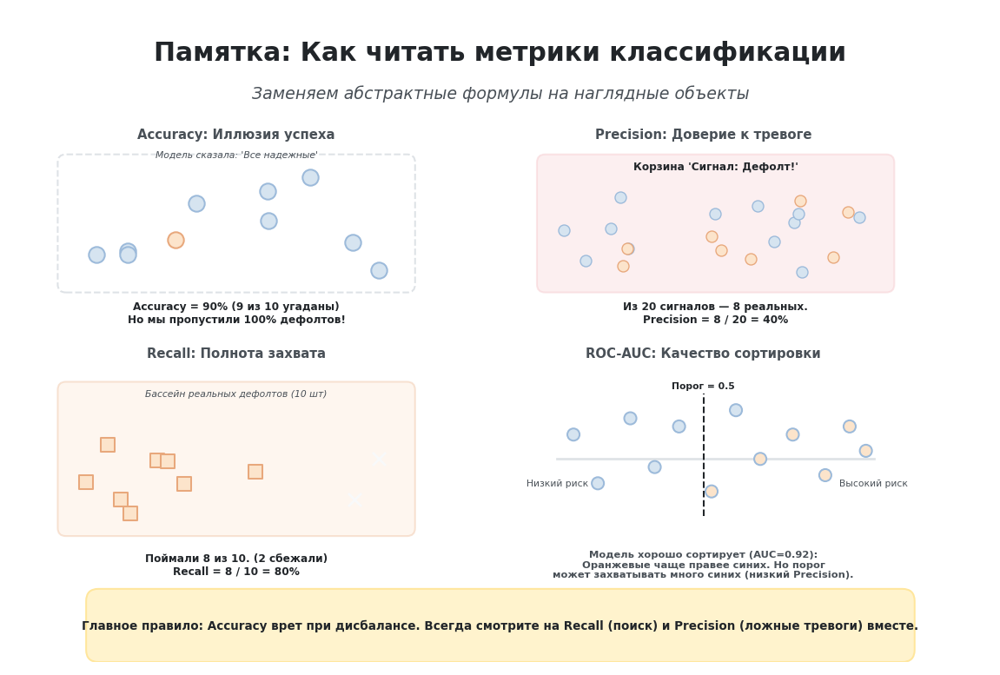

In [ ]:
# @title
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Памятка: Как читать метрики классификации",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Заменяем абстрактные формулы на наглядные объекты",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# БЛОК 1 (Левый верх): Ловушка Accuracy
# ==========================================
ax.text(2.75, 6.5, "Accuracy: Иллюзия успеха", ha="center", va="center", fontsize=11*S, weight="bold", color=TEXT_MUTED)

# Рисуем 10 точек (9 синих, 1 оранжевая)
np.random.seed(42)
acc_x = np.random.uniform(0.8, 4.7, 9)
acc_y = np.random.uniform(4.8, 6.0, 9)
ax.scatter(acc_x, acc_y, s=120*S, c=BLUE, edgecolors=BLUE_BORDER, linewidths=1.5*S, zorder=3)

# 1 оранжевая точка
ax.scatter([2.0], [5.2], s=120*S, c=ORANGE, edgecolors=ORANGE_BORDER, linewidths=1.5*S, zorder=4)

# Коробка "Предсказание: Все 0"
ax.add_patch(FancyBboxPatch((0.6, 4.6), 4.3, 1.6, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor="none", linestyle="--"))
ax.text(2.75, 6.25, "Модель сказала: 'Все надежные'", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# Вывод
ax.text(2.75, 4.3, "Accuracy = 90% (9 из 10 угаданы)\nНо мы пропустили 100% дефолтов!", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")


# ==========================================
# БЛОК 2 (Правый верх): Precision
# ==========================================
ax.text(8.5, 6.5, "Precision: Доверие к тревоге", ha="center", va="center", fontsize=11*S, weight="bold", color=TEXT_MUTED)

# Корзина "Сигнал тревоги"
ax.add_patch(FancyBboxPatch((6.5, 4.6), 4.3, 1.6, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=RED_BORDER, facecolor=RED_FILL, alpha=0.4))
ax.text(8.65, 6.1, "Корзина 'Сигнал: Дефолт!'", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# Точки внутри корзины (8 оранжевых, 12 синих)
np.random.seed(10)
prec_x = np.random.uniform(6.7, 10.6, 12)
prec_y = np.random.uniform(4.8, 5.8, 12)
ax.scatter(prec_x, prec_y, s=60*S, c=BLUE, edgecolors=BLUE_BORDER, linewidths=1*S, zorder=3)

np.random.seed(5)
prec_def_x = np.random.uniform(6.7, 10.6, 8)
prec_def_y = np.random.uniform(4.8, 5.8, 8)
ax.scatter(prec_def_x, prec_def_y, s=60*S, c=ORANGE, edgecolors=ORANGE_BORDER, linewidths=1*S, zorder=4)

# Вывод
ax.text(8.65, 4.3, "Из 20 сигналов — 8 реальных.\nPrecision = 8 / 20 = 40%", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")


# ==========================================
# БЛОК 3 (Левый низ): Recall
# ==========================================
ax.text(2.75, 3.8, "Recall: Полнота захвата", ha="center", va="center", fontsize=11*S, weight="bold", color=TEXT_MUTED)

# Бассейн реальных дефолтов (10 штук)
ax.add_patch(FancyBboxPatch((0.6, 1.6), 4.3, 1.8, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE, alpha=0.3))
ax.text(2.75, 3.3, "Бассейн реальных дефолтов (10 шт)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# 8 пойманных (в сетке)
np.random.seed(1)
rec_caught_x = np.random.uniform(0.9, 3.8, 8)
rec_caught_y = np.random.uniform(1.8, 2.8, 8)
ax.scatter(rec_caught_x, rec_caught_y, s=80*S, c=ORANGE, edgecolors=ORANGE_BORDER, linewidths=1.5*S, marker='s', zorder=4)

# 2 пропущенных (серые с крестиком)
ax.scatter([4.2, 4.5], [2.0, 2.5], s=80*S, c=GRAY, edgecolors=GRAY_BORDER, marker='x', linewidths=2*S, zorder=3)

# Вывод
ax.text(2.75, 1.2, "Поймали 8 из 10. (2 сбежали)\nRecall = 8 / 10 = 80%", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")


# ==========================================
# БЛОК 4 (Правый низ): ROC-AUC
# ==========================================
ax.text(8.5, 3.8, "ROC-AUC: Качество сортировки", ha="center", va="center", fontsize=11*S, weight="bold", color=TEXT_MUTED)

# Шкала риска
ax.plot([6.7, 10.6], [2.5, 2.5], color=GRAY_BORDER, linewidth=2*S)
ax.text(6.7, 2.2, "Низкий риск", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(10.6, 2.2, "Высокий риск", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)

# Точки на шкале (в основном оранжевые справа, синие слева, но с перемешиванием)
roc_x = np.array([6.9, 7.2, 7.6, 7.9, 8.2, 8.6, 8.9, 9.2, 9.6, 10.0, 10.3, 10.5])
roc_y = np.array([2.8, 2.2, 3.0, 2.4, 2.9, 2.1, 3.1, 2.5, 2.8, 2.3, 2.9, 2.6])
roc_colors = [BLUE, BLUE, BLUE, BLUE, BLUE, ORANGE, BLUE, ORANGE, ORANGE, ORANGE, ORANGE, ORANGE]

ax.scatter(roc_x, roc_y, s=70*S, c=roc_colors, edgecolors=BLUE_BORDER, linewidths=1.5*S, zorder=3)

# Линия порога 0.5
threshold_x = 8.5
ax.plot([threshold_x, threshold_x], [1.8, 3.3], color=TEXT_DARK, linestyle="--", linewidth=1.5*S, zorder=4)
ax.text(8.5, 3.4, "Порог = 0.5", ha="center", va="center", fontsize=8*S, color=TEXT_DARK, weight="bold")

# Вывод
ax.text(8.5, 1.2, "Модель хорошо сортирует (AUC=0.92):\nОранжевые чаще правее синих. Но порог\nможет захватывать много синих (низкий Precision).", ha="center", va="center", fontsize=8.5*S, color=TEXT_MUTED, weight="bold")


# ---------- Итоговый блок (Главное правило) ----------
res_box = FancyBboxPatch(
    (1.0, 0.1), 10.0, 0.7,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.45, "Главное правило: Accuracy врет при дисбалансе. Всегда смотрите на Recall (поиск) и Precision (ложные тревоги) вместе.",
    ha="center", va="center",
    fontsize=10*S, weight="bold", color=TEXT_DARK
)

plt.tight_layout()
plt.show()

# Глава 15. Какие инструменты будут использоваться в исследовании?

## Итоги теоретической части

В предыдущих главах мы познакомились с основными метриками оценки качества бинарной классификации.

Каждая из них позволяет оценить модель с разных сторон.

- **Accuracy** показывает общую долю правильных прогнозов.
- **Precision** характеризует точность прогнозов о дефолте.
- **Recall** показывает, какую долю реальных дефолтов удалось обнаружить.
- **F1-score** позволяет оценить баланс между Precision и Recall.
- **ROC-AUC** характеризует способность модели разделять классы независимо от выбранного порога классификации.

Ни одна из этих метрик не является универсальной.

Поэтому для объективной оценки качества классификатора они рассматриваются совместно.

## Переход к исследованию

Теперь все необходимые инструменты для оценки моделей подготовлены.

На следующем этапе они будут использоваться не сами по себе, а для решения основной задачи исследования.

Нам предстоит определить, насколько дисбаланс классов влияет на качество моделей кредитного скоринга.

Для этого сначала будет обучена модель на исходных несбалансированных данных, после чего её качество будет оценено с использованием рассмотренных метрик.

Затем результаты будут сравниваться с моделями, обученными после применения методов балансировки данных.

Именно такое сравнение позволит сделать вывод о том, насколько дисбаланс классов действительно влияет на качество классификации в рассматриваемой задаче.

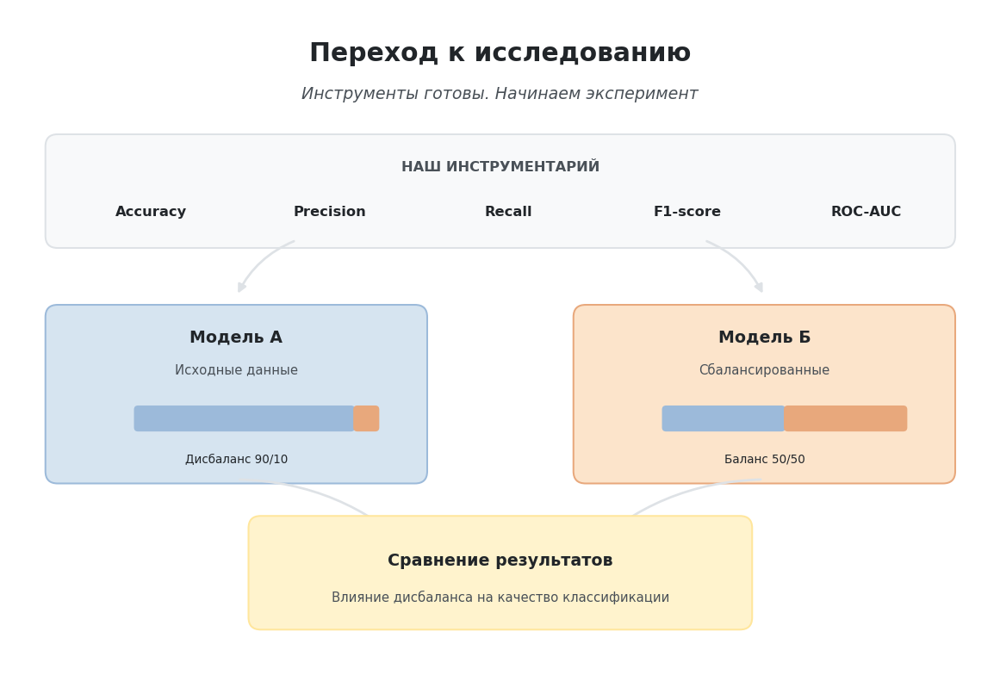

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch

# ---------- Цветовая палитра (Мягкая и безопасная) ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования (1.5x меньше) ---
S = 0.65 # Коэффициент уменьшения
AXES_W, AXES_H = 12, 8       # Внутренняя логика
FIG_W, FIG_H = 8, 5.33       # Физический размер

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Переход к исследованию",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Инструменты готовы. Начинаем эксперимент",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ---------- 2. Панель инструментов (Сверху) ----------
toolkit_box = FancyBboxPatch(
    (0.5, 5.2), 11.0, 1.2,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor=GRAY
)
ax.add_patch(toolkit_box)

ax.text(
    6.0, 6.1, "НАШ ИНСТРУМЕНТАРИЙ",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)

# Список метриков внутри панели
metrics = ["Accuracy", "Precision", "Recall", "F1-score", "ROC-AUC"]
metric_x = [1.7, 3.9, 6.1, 8.3, 10.5]

for i, metric in enumerate(metrics):
    ax.text(metric_x[i], 5.55, metric, ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_DARK)

# ---------- 3. Стрелки к моделям ----------
ax.add_patch(FancyArrowPatch(
    (3.5, 5.2), (2.75, 4.5),
    connectionstyle="arc3,rad=0.2",
    arrowstyle="-|>", mutation_scale=15*S,
    linewidth=2*S, color=GRAY_BORDER
))

ax.add_patch(FancyArrowPatch(
    (8.5, 5.2), (9.25, 4.5),
    connectionstyle="arc3,rad=-0.2",
    arrowstyle="-|>", mutation_scale=15*S,
    linewidth=2*S, color=GRAY_BORDER
))

# ---------- 4. Карточки моделей (Центр) ----------
card_w = 4.5
card_h = 2.0
card_y = 3.3

# Левая карточка: Модель А (Исходные данные)
ax.add_patch(FancyBboxPatch(
    (0.5, card_y - card_h/2), card_w, card_h,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE
))
ax.text(2.75, card_y + 0.7, "Модель А", ha="center", va="center", fontsize=14*S, weight="bold", color=TEXT_DARK)
ax.text(2.75, card_y + 0.3, "Исходные данные", ha="center", va="center", fontsize=11*S, color=TEXT_MUTED)

# Мини-бар дисбаланса (90/10)
bar_y_A = card_y - 0.3
ax.add_patch(FancyBboxPatch((1.5, bar_y_A - 0.15), 2.7, 0.3, boxstyle="round,pad=0.01,rounding_size=0.05", linewidth=0, facecolor=BLUE_BORDER))
ax.add_patch(FancyBboxPatch((4.2, bar_y_A - 0.15), 0.3, 0.3, boxstyle="round,pad=0.01,rounding_size=0.05", linewidth=0, facecolor=ORANGE_BORDER))
ax.text(2.75, card_y - 0.8, "Дисбаланс 90/10", ha="center", va="center", fontsize=10*S, color=TEXT_DARK)

# Правая карточка: Модель Б (Балансировка)
ax.add_patch(FancyBboxPatch(
    (7.0, card_y - card_h/2), card_w, card_h,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE
))
ax.text(9.25, card_y + 0.7, "Модель Б", ha="center", va="center", fontsize=14*S, weight="bold", color=TEXT_DARK)
ax.text(9.25, card_y + 0.3, "Сбалансированные", ha="center", va="center", fontsize=11*S, color=TEXT_MUTED)

# Мини-бар баланса (50/50)
bar_y_B = card_y - 0.3
ax.add_patch(FancyBboxPatch((8.0, bar_y_B - 0.15), 1.5, 0.3, boxstyle="round,pad=0.01,rounding_size=0.05", linewidth=0, facecolor=BLUE_BORDER))
ax.add_patch(FancyBboxPatch((9.5, bar_y_B - 0.15), 1.5, 0.3, boxstyle="round,pad=0.01,rounding_size=0.05", linewidth=0, facecolor=ORANGE_BORDER))
ax.text(9.25, card_y - 0.8, "Баланс 50/50", ha="center", va="center", fontsize=10*S, color=TEXT_DARK)

# ---------- 5. Сходящиеся стрелки к итогу ----------
ax.add_patch(FancyArrowPatch(
    (2.75, card_y - card_h/2 - 0.05), (5.0, 1.3),
    connectionstyle="arc3,rad=-0.2",
    arrowstyle="-|>", mutation_scale=15*S,
    linewidth=2*S, color=GRAY_BORDER
))

ax.add_patch(FancyArrowPatch(
    (9.25, card_y - card_h/2 - 0.05), (7.0, 1.3),
    connectionstyle="arc3,rad=0.2",
    arrowstyle="-|>", mutation_scale=15*S,
    linewidth=2*S, color=GRAY_BORDER
))

# ---------- 6. Итог (Низ) ----------
res_box = FancyBboxPatch(
    (3.0, 0.5), 6.0, 1.2,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 1.25, "Сравнение результатов",
    ha="center", va="center",
    fontsize=14*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 0.8, "Влияние дисбаланса на качество классификации",
    ha="center", va="center",
    fontsize=11*S, color=TEXT_MUTED
)

plt.tight_layout()
plt.show()

# Глава 16. Переход к практической части исследования

## От теории к эксперименту

На предыдущих этапах исследования были рассмотрены основные теоретические аспекты, необходимые для понимания проблемы дисбаланса классов. Мы выяснили, почему дисбаланс может оказывать влияние на процесс обучения моделей машинного обучения, а также познакомились с метриками, которые позволяют объективно оценивать качество классификации.

Однако одного теоретического анализа недостаточно, чтобы сделать вывод о влиянии дисбаланса классов. Особенности каждого набора данных, используемой модели и условий обучения могут приводить к различным результатам. Поэтому ответить на главный вопрос нашего исследования можно только с помощью практического эксперимента.

Именно к этому этапу мы теперь и переходим.

## Цель практической части

Основная цель практической части исследования — **экспериментально оценить влияние дисбаланса классов на качество модели кредитного скоринга**.

Для этого будет проведено последовательное сравнение работы модели в двух условиях:

- без применения методов балансировки данных;
- после применения метода балансировки классов.

При этом все остальные условия эксперимента останутся неизменными. Будут использоваться одна и та же модель машинного обучения, одинаковое разделение данных на обучающую и тестовую выборки, а также единый набор метрик качества. Такой подход позволит объективно оценить влияние именно дисбаланса классов на результаты классификации.

## План практического исследования

В ходе практической части последовательно будут выполнены следующие этапы:

1. Подготовка данных к эксперименту.
2. Разделение данных на обучающую и тестовую выборки.
3. Обучение базовой модели без балансировки данных.
4. Оценка качества базовой модели.
5. Балансировка обучающих данных.
6. Повторное обучение модели.
7. Повторная оценка качества модели.
8. Сравнение полученных результатов и формулировка итоговых выводов.

Такая последовательность позволит проследить влияние каждого этапа исследования и обеспечить корректность сравнения результатов.

## Главный вопрос исследования

На протяжении всей практической части мы будем искать ответ на основной исследовательский вопрос:

> **Насколько дисбаланс классов влияет на качество модели кредитного скоринга на выбранном наборе данных?**

Все последующие этапы исследования, полученные результаты и сформулированные выводы будут направлены на получение объективного и обоснованного ответа именно на этот вопрос.

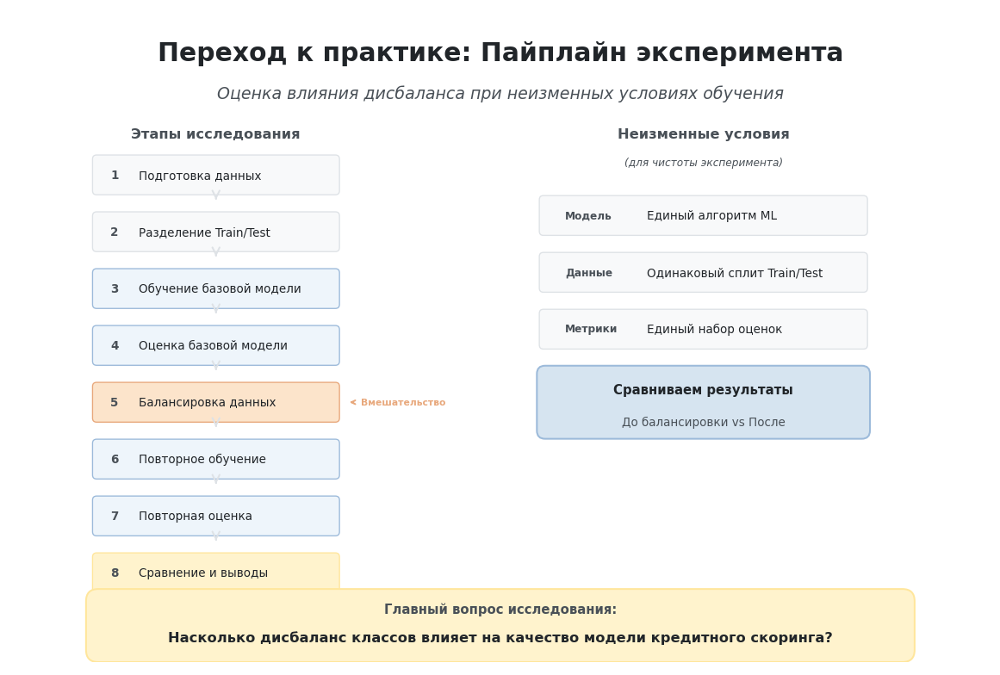

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch

# ---------- Цветовая палитра (Мягкая и безопасная) ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65 # Коэффициент уменьшения
AXES_W, AXES_H = 12, 8       # Внутренняя логика
FIG_W, FIG_H = 8, 5.33       # Физический размер

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Переход к практике: Пайплайн эксперимента",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Оценка влияния дисбаланса при неизменных условиях обучения",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Пошаговый план (Пайплайн)
# ==========================================
ax.text(2.5, 6.5, "Этапы исследования", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Список этапов с цветовой логикой:
# Серый - подготовка, Голубой - модель, Оранжевый - балансировка, Амбер - итог
steps = [
    ("1", "Подготовка данных", GRAY, GRAY_BORDER, 6.0),
    ("2", "Разделение Train/Test", GRAY, GRAY_BORDER, 5.3),
    ("3", "Обучение базовой модели", LIGHT_BLUE, BLUE_BORDER, 4.6),
    ("4", "Оценка базовой модели", LIGHT_BLUE, BLUE_BORDER, 3.9),
    ("5", "Балансировка данных", ORANGE, ORANGE_BORDER, 3.2),
    ("6", "Повторное обучение", LIGHT_BLUE, BLUE_BORDER, 2.5),
    ("7", "Повторная оценка", LIGHT_BLUE, BLUE_BORDER, 1.8),
    ("8", "Сравнение и выводы", AMBER, AMBER_BORDER, 1.1)
]

step_x_start = 1.0
step_w = 3.0
box_h = 0.45

for num, desc, color, border, y_pos in steps:
    # Блок этапа
    ax.add_patch(FancyBboxPatch(
        (step_x_start, y_pos - box_h/2), step_w, box_h,
        boxstyle="round,pad=0.02,rounding_size=0.05",
        linewidth=1*S, edgecolor=border, facecolor=color
    ))
    # Номер
    ax.text(
        step_x_start + 0.25, y_pos, num,
        ha="center", va="center",
        fontsize=10*S, weight="bold", color=TEXT_MUTED
    )
    # Описание
    ax.text(
        step_x_start + 0.55, y_pos, desc,
        ha="left", va="center",
        fontsize=10*S, color=TEXT_DARK
    )
    # Стрелка к следующему шагу
    if y_pos > 1.5:
        ax.annotate("",
                    xy=(step_x_start + step_w/2, y_pos - 0.35),
                    xytext=(step_x_start + step_w/2, y_pos - box_h/2 - 0.02),
                    arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.5*S))

# Подпись вмешательства
ax.annotate("Вмешательство",
            xy=(step_x_start + step_w + 0.1, 3.2),
            xytext=(step_x_start + step_w + 0.8, 3.2),
            ha="center", va="center", fontsize=8*S, color=ORANGE_BORDER, weight="bold",
            arrowprops=dict(arrowstyle="->", color=ORANGE_BORDER, lw=1.5*S))


# ==========================================
# ПРАВАЯ ЧАСТЬ: Контроль переменных
# ==========================================
ax.text(8.5, 6.5, "Неизменные условия", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)
ax.text(8.5, 6.15, "(для чистоты эксперимента)", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, style="italic")

conditions = [
    ("Модель", "Единый алгоритм ML", 5.5),
    ("Данные", "Одинаковый сплит Train/Test", 4.8),
    ("Метрики", "Единый набор оценок", 4.1)
]

cond_x_start = 6.5
cond_w = 4.0

for cat, desc, y_pos in conditions:
    ax.add_patch(FancyBboxPatch(
        (cond_x_start, y_pos - box_h/2), cond_w, box_h,
        boxstyle="round,pad=0.02,rounding_size=0.05",
        linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY
    ))
    ax.text(
        cond_x_start + 0.3, y_pos, cat,
        ha="left", va="center",
        fontsize=9*S, weight="bold", color=TEXT_MUTED
    )
    ax.text(
        cond_x_start + 1.3, y_pos, desc,
        ha="left", va="center",
        fontsize=10*S, color=TEXT_DARK
    )

# Блок "Сравниваем" (Мостик между левой и правой частью)
ax.add_patch(FancyBboxPatch(
    (cond_x_start, 2.8), cond_w, 0.8,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE
))
ax.text(
    8.5, 3.35, "Сравниваем результаты",
    ha="center", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK
)
ax.text(
    8.5, 2.95, "До балансировки vs После",
    ha="center", va="center", fontsize=10*S, color=TEXT_MUTED
)


# ---------- Итоговый блок (Главный вопрос) ----------
res_box = FancyBboxPatch(
    (1.0, 0.1), 10.0, 0.7,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.65, "Главный вопрос исследования:",
    ha="center", va="center",
    fontsize=11*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, 0.3, "Насколько дисбаланс классов влияет на качество модели кредитного скоринга?",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_DARK
)

plt.tight_layout()
plt.show()

## 16.1 Как будет проходить каждый эксперимент

Прежде чем перейти к практической части исследования, рассмотрим общий порядок проведения каждого эксперимента.

Независимо от выбранного метода балансировки классов, все эксперименты в данной работе выполняются по одной и той же схеме. Это позволяет сравнивать полученные результаты между собой в одинаковых условиях.

Каждый эксперимент состоит из трёх последовательных этапов.

### 1. Обучение модели

На первом этапе модель обучается на подготовленной обучающей выборке. Во время обучения она анализирует данные и пытается найти закономерности, которые позволяют отличить объекты одного класса от другого.

### 2. Получение прогнозов

После завершения обучения модель применяется к тестовой выборке, которую она ранее не видела. Для каждого объекта модель определяет наиболее вероятный класс и рассчитывает вероятность принадлежности к положительному классу.

### 3. Оценка качества модели

Полученные прогнозы сравниваются с правильными ответами, после чего рассчитываются основные метрики качества: Accuracy, Precision, Recall, F1-score и ROC-AUC.

Именно эта последовательность действий будет использоваться для каждого рассматриваемого метода балансировки классов. Благодаря этому все эксперименты выполняются в одинаковых условиях, а результаты можно корректно сравнивать между собой.

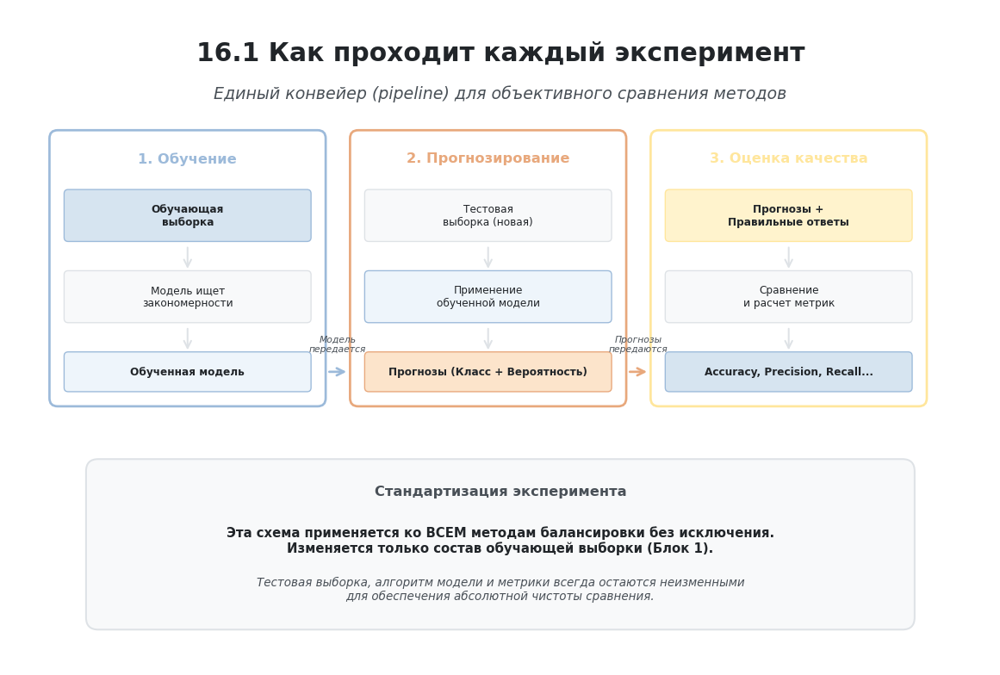

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "16.1 Как проходит каждый эксперимент",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Единый конвейер (pipeline) для объективного сравнения методов",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ОСНОВНАЯ ЧАСТЬ: Три этапа конвейера
# ==========================================
# Координаты для блоков
block_y_bottom = 3.2
block_y_top = 6.5
block_h = block_y_top - block_y_bottom

# Ширина и отступы
b1_x = 0.5
b1_w = 3.3
b2_x = 4.2
b2_w = 3.3
b3_x = 7.9
b3_w = 3.3

# --- БЛОК 1: Обучение ---
ax.add_patch(FancyBboxPatch((b1_x, block_y_bottom), b1_w, block_h, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=2*S, edgecolor=BLUE_BORDER, facecolor="white"))
ax.text(b1_x + b1_w/2, block_y_top - 0.3, "1. Обучение", ha="center", va="center", fontsize=12*S, weight="bold", color=BLUE_BORDER)

# Чипы внутри Блока 1
ax.add_patch(FancyBboxPatch((b1_x + 0.15, 5.2), b1_w - 0.3, 0.6, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
ax.text(b1_x + b1_w/2, 5.5, "Обучающая\nвыборка", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

ax.annotate("", xy=(b1_x + b1_w/2, 4.8), xytext=(b1_x + b1_w/2, 5.15), arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.5*S))

ax.add_patch(FancyBboxPatch((b1_x + 0.15, 4.2), b1_w - 0.3, 0.6, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=GRAY, edgecolor=GRAY_BORDER, linewidth=1*S))
ax.text(b1_x + b1_w/2, 4.5, "Модель ищет\nзакономерности", ha="center", va="center", fontsize=9*S, color=TEXT_DARK)

ax.annotate("", xy=(b1_x + b1_w/2, 3.8), xytext=(b1_x + b1_w/2, 4.15), arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.5*S))

ax.add_patch(FancyBboxPatch((b1_x + 0.15, 3.35), b1_w - 0.3, 0.45, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=LIGHT_BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
ax.text(b1_x + b1_w/2, 3.575, "Обученная модель", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)


# --- БЛОК 2: Прогнозирование ---
ax.add_patch(FancyBboxPatch((b2_x, block_y_bottom), b2_w, block_h, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=2*S, edgecolor=ORANGE_BORDER, facecolor="white"))
ax.text(b2_x + b2_w/2, block_y_top - 0.3, "2. Прогнозирование", ha="center", va="center", fontsize=12*S, weight="bold", color=ORANGE_BORDER)

# Чипы внутри Блока 2
ax.add_patch(FancyBboxPatch((b2_x + 0.15, 5.2), b2_w - 0.3, 0.6, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=GRAY, edgecolor=GRAY_BORDER, linewidth=1*S))
ax.text(b2_x + b2_w/2, 5.5, "Тестовая\nвыборка (новая)", ha="center", va="center", fontsize=9*S, color=TEXT_DARK)

ax.annotate("", xy=(b2_x + b2_w/2, 4.8), xytext=(b2_x + b2_w/2, 5.15), arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.5*S))

ax.add_patch(FancyBboxPatch((b2_x + 0.15, 4.2), b2_w - 0.3, 0.6, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=LIGHT_BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
ax.text(b2_x + b2_w/2, 4.5, "Применение\nобученной модели", ha="center", va="center", fontsize=9*S, color=TEXT_DARK)

ax.annotate("", xy=(b2_x + b2_w/2, 3.8), xytext=(b2_x + b2_w/2, 4.15), arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.5*S))

ax.add_patch(FancyBboxPatch((b2_x + 0.15, 3.35), b2_w - 0.3, 0.45, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=ORANGE, edgecolor=ORANGE_BORDER, linewidth=1*S))
ax.text(b2_x + b2_w/2, 3.575, "Прогнозы (Класс + Вероятность)", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)


# --- БЛОК 3: Оценка качества ---
ax.add_patch(FancyBboxPatch((b3_x, block_y_bottom), b3_w, block_h, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=2*S, edgecolor=AMBER_BORDER, facecolor="white"))
ax.text(b3_x + b3_w/2, block_y_top - 0.3, "3. Оценка качества", ha="center", va="center", fontsize=12*S, weight="bold", color=AMBER_BORDER)

# Чипы внутри Блока 3
ax.add_patch(FancyBboxPatch((b3_x + 0.15, 5.2), b3_w - 0.3, 0.6, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=AMBER, edgecolor=AMBER_BORDER, linewidth=1*S))
ax.text(b3_x + b3_w/2, 5.5, "Прогнозы +\nПравильные ответы", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

ax.annotate("", xy=(b3_x + b3_w/2, 4.8), xytext=(b3_x + b3_w/2, 5.15), arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.5*S))

ax.add_patch(FancyBboxPatch((b3_x + 0.15, 4.2), b3_w - 0.3, 0.6, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=GRAY, edgecolor=GRAY_BORDER, linewidth=1*S))
ax.text(b3_x + b3_w/2, 4.5, "Сравнение\nи расчет метрик", ha="center", va="center", fontsize=9*S, color=TEXT_DARK)

ax.annotate("", xy=(b3_x + b3_w/2, 3.8), xytext=(b3_x + b3_w/2, 4.15), arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.5*S))

ax.add_patch(FancyBboxPatch((b3_x + 0.15, 3.35), b3_w - 0.3, 0.45, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
ax.text(b3_x + b3_w/2, 3.575, "Accuracy, Precision, Recall...", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)


# --- СТРЕЛКИ МЕЖДУ БЛОКАМИ ---
# От Блока 1 к Блоку 2 (передается модель)
ax.annotate("", xy=(b2_x - 0.05, 3.575), xytext=(b1_x + b1_w + 0.05, 3.575),
            arrowprops=dict(arrowstyle="->", color=BLUE_BORDER, lw=2*S, connectionstyle="arc3,rad=0.0"))
ax.text((b1_x + b1_w + b2_x)/2, 3.8, "Модель\nпередается", ha="center", va="bottom", fontsize=8*S, color=TEXT_MUTED, style="italic")

# От Блока 2 к Блоку 3 (передаются прогнозы)
ax.annotate("", xy=(b3_x - 0.05, 3.575), xytext=(b2_x + b2_w + 0.05, 3.575),
            arrowprops=dict(arrowstyle="->", color=ORANGE_BORDER, lw=2*S, connectionstyle="arc3,rad=0.0"))
ax.text((b2_x + b2_w + b3_x)/2, 3.8, "Прогнозы\nпередаются", ha="center", va="bottom", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ---------- Итоговый блок (Методология) ----------
res_box = FancyBboxPatch(
    (1.0, 0.5), 10.0, 1.9,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor=GRAY
)
ax.add_patch(res_box)

ax.text(
    6.0, 2.1, "Стандартизация эксперимента",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, 1.5, "Эта схема применяется ко ВСЕМ методам балансировки без исключения.\nИзменяется только состав обучающей выборки (Блок 1).",
    ha="center", va="center",
    fontsize=11*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 0.9, "Тестовая выборка, алгоритм модели и метрики всегда остаются неизменными\nдля обеспечения абсолютной чистоты сравнения.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_MUTED, style="italic"
)

plt.tight_layout()
plt.show()

# Глава 17. Подготовка данных к эксперименту

## Выбор признаков и целевой переменной

>После проведённого исследовательского анализа данных, представленного в предыдущем ноутбуке(ссылка вверху), датасет был признан пригодным для построения моделей машинного обучения. Поэтому на данном этапе мы переходим непосредственно к исследованию влияния дисбаланса классов.

Первым этапом является разделение исходного набора данных на **признаки** и **целевую переменную**.

В качестве целевой переменной используется столбец **DefMark**, который показывает факт наступления или отсутствия дефолта компании. Именно этот признак модель должна научиться прогнозировать.

Все остальные столбцы используются в качестве входных признаков, на основании которых модель будет выявлять закономерности и принимать решение о принадлежности компании к одному из двух классов.

На данном этапе никакие изменения в данных не выполняются. Мы лишь формируем две отдельные структуры данных:

- **X** — содержит признаки, используемые для обучения модели;
- **y** — содержит значения целевой переменной.

Такое разделение является стандартным этапом подготовки данных в задачах бинарной классификации и необходимо для последующего обучения модели.

## 17.1 Подготовка набора данных к эксперименту

Перед началом практического исследования необходимо загрузить подготовленный набор данных, который был сформирован на предыдущем этапе работы.

В ходе предварительного исследования было выявлено, что датасет очищен, обработан и приведён к виду, пригодному для дальнейшего анализа и обучения моделей машинного обучения. Поэтому в рамках данного исследования повторная предобработка данных не выполняется. Мы используем уже подготовленный набор данных как основу для проведения всех последующих экспериментов.

На данном этапе выполняются следующие действия:

- загрузка подготовленного датасета;
- формирование объекта DataFrame;
- проверка размерности данных;
- просмотр первых строк набора данных для подтверждения корректности загрузки.

После этого можно переходить непосредственно к подготовке данных для обучения моделей.

In [ ]:
# Подготовка рабочего окружения
# Установка библиотеки для чтения файлов Excel формата .xlsb
!pip install pyxlsb

In [ ]:
# ==========================================================
# Загрузка подготовленного набора данных
# ==========================================================

import pandas as pd

# Путь к подготовленному датасету,
# полученному на предыдущем этапе исследования
file_path = "/content/sample_data/Data_final.xlsb"

# Загружаем данные в DataFrame
df = pd.read_excel(file_path, engine="pyxlsb")

# Проверяем успешность загрузки
print(f"Размерность датасета: {df.shape}")

# Просматриваем первые строки таблицы
df.head()

Размерность датасета: (362018, 51)


,INN,DefMark,Q_A1_norm,Q_A2_norm,Q_A3_norm,Q_A4_norm,Q_A5_norm,Q_A6_norm,Q_A7_norm,Q_B1_norm,...,E3_norm,F1_norm,F2_norm,F3_norm,F4_norm,G1_norm,G2_norm,G3_norm,G4_norm,G5_norm
0,1215230006,0,2.333,52.5418,9.4494,38.3585,42.4527,-30.7698,30.8994,34.6347,...,-2.3386,-41.5491,-14.6783,20.7119,-7.7164,36.6006,-31.8809,-35.9536,-34.6305,51.0379
1,1215230165,0,2.333,52.5418,9.4494,-9.4678,42.4527,76.5957,-131.2192,7.2799,...,-16.4782,2.6523,-14.6783,-0.0980,-7.7164,26.2257,132.4186,106.8055,151.1952,-131.8824
2,1215230278,0,2.333,52.5418,9.4494,60.8612,24.7409,-30.7698,-47.3796,7.2799,...,-14.3848,-53.2628,-26.3341,40.4643,-7.1363,-24.2547,-18.5226,-33.6243,-32.5097,17.2635
3,1215232067,0,2.333,52.5418,9.4494,38.3585,24.7409,-30.7698,30.8994,7.2799,...,-16.4782,2.6523,-14.6783,20.7119,-7.7164,14.0589,-33.1762,-27.9957,-27.6181,16.0999
4,1215232733,0,2.333,52.5418,9.4494,38.3585,24.7409,-30.7698,46.9948,34.6347,...,11.9397,2.6523,-14.6783,-18.6647,-7.7164,-4.8419,13.7945,115.9358,57.2188,18.9675


### Анализ полученного результата

Подготовленный набор данных был успешно загружен в рабочую среду Google Colab и сохранён в объекте **DataFrame** библиотеки **pandas**.

Использование DataFrame обеспечивает удобную работу с табличными данными и предоставляет широкий набор инструментов для их анализа, обработки и последующего обучения моделей машинного обучения.

Дополнительно были выведены размерность датасета и первые строки таблицы. Это позволяет убедиться, что данные считаны корректно, а также проверить соответствие структуры набора данных результатам предварительного исследования.

На следующих этапах именно этот DataFrame будет использоваться для подготовки обучающей и тестовой выборок, а также для проведения экспериментов по исследованию влияния дисбаланса классов на качество модели кредитного скоринга.

## 17.2 Выделение признаков и целевой переменной

После загрузки подготовленного набора данных необходимо определить, какие данные будут использоваться для обучения модели, а какие являются правильными ответами, которые модель должна научиться прогнозировать.

В задачах машинного обучения принято разделять данные на две части:

- **признаки (X)** — входные данные, на основании которых модель будет принимать решение;
- **целевая переменная (y)** — правильные ответы, которые используются для обучения модели.

В данном исследовании целевой переменной является столбец **DefMark**, содержащий информацию о наличии или отсутствии дефолта организации.

Все остальные признаки используются моделью для поиска закономерностей и прогнозирования значения целевой переменной.

Такое разделение является обязательным этапом подготовки данных перед обучением моделей машинного обучения.

In [ ]:
# ==========================================================
# Выделение признаков и целевой переменной
# ==========================================================

# Формируем матрицу признаков.
# Из анализа исключаются:
# - DefMark — целевая переменная;
# - INN — идентификатор организации, не являющийся содержательным
#   признаком для построения модели машинного обучения.

X = df.drop(columns=["DefMark", "INN"])

# Целевая переменная
y = df["DefMark"]

# Проверяем результат разделения
print(f"Размер матрицы признаков X: {X.shape}")
print(f"Размер целевой переменной y: {y.shape}")

print("\nПервые значения целевой переменной:")
print(y.head())

Размер матрицы признаков X: (362018, 49)
Размер целевой переменной y: (362018,)

Первые значения целевой переменной:
0    0
1    0
2    0
3    0
4    0
Name: DefMark, dtype: int64


### Анализ полученного результата

На данном этапе исходный набор данных был разделён на **матрицу признаков** и **целевую переменную**.

Матрица **X** содержит только те признаки, которые будут использоваться моделью для обучения и последующего прогнозирования. При её формировании из анализа были исключены целевая переменная **DefMark** и идентификатор организации **INN**, поскольку последний не является содержательным признаком и не должен использоваться при построении модели машинного обучения.

Переменная **y** содержит фактические значения целевого признака **DefMark**, отражающие принадлежность каждой организации к одному из двух классов: наличие или отсутствие дефолта.

Такое разделение является стандартным этапом подготовки данных в задачах бинарной классификации и необходимо для последующего формирования обучающей и тестовой выборок.

## 17.3 Разделение данных на обучающую и тестовую выборки

После выделения признаков и целевой переменной необходимо разделить исходный набор данных на две независимые части: обучающую и тестовую выборки.

Обучающая выборка используется для построения модели машинного обучения. Именно на этих данных модель выявляет закономерности и формирует внутренние зависимости между признаками и целевой переменной.

Тестовая выборка не участвует в процессе обучения. Она используется исключительно для объективной оценки качества модели после завершения обучения. Такой подход позволяет проверить способность модели работать с ранее неизвестными данными и избежать переобучения.

В настоящем исследовании используется наиболее распространённое соотношение **80 % / 20 %**, при котором большая часть данных используется для обучения модели, а оставшаяся часть — для проверки её качества.

>В рамках настоящего исследования данные разделяются только на обучающую и тестовую выборки. Такой подход обусловлен целью работы — исследованием влияния дисбаланса классов на качество моделей кредитного скоринга, а не подбором оптимальных гиперпараметров. Поскольку сравнение проводится в одинаковых условиях до и после применения методов балансировки, использование отдельной валидационной выборки не является необходимым.

Для обеспечения воспроизводимости результатов задаётся фиксированное значение параметра `random_state`.

In [ ]:
# ==========================================================
# Разделение данных на обучающую и тестовую выборки
# ==========================================================

from sklearn.model_selection import train_test_split

# Разделяем данные:
# 80 % — для обучения
# 20 % — для тестирования
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    # stratify=y сохраняет исходное соотношение классов
    # (дефолт / отсутствие дефолта) в обучающей и тестовой выборках.
    # Это особенно важно в данном исследовании, поскольку оно посвящено
    # влиянию дисбаланса классов на качество моделей машинного обучения.
    stratify=y
)

# Выводим размерности полученных выборок
print("Размер обучающей выборки X_train:", X_train.shape)
print("Размер тестовой выборки X_test:", X_test.shape)

print("\nРазмер обучающей целевой переменной y_train:", y_train.shape)
print("Размер тестовой целевой переменной y_test:", y_test.shape)

Размер обучающей выборки X_train: (289614, 49)
Размер тестовой выборки X_test: (72404, 49)

Размер обучающей целевой переменной y_train: (289614,)
Размер тестовой целевой переменной y_test: (72404,)


### Анализ полученного результата

Данные были разделены на обучающую и тестовую выборки в соотношении **80 % / 20 %**.

Для обеспечения корректности дальнейшего исследования использовалась стратифицированная выборка (`stratify=y`), благодаря чему исходное соотношение классов было сохранено как в обучающей, так и в тестовой выборках.

Количество объектов в выборках соответствует заданным параметрам разбиения. При этом число признаков уменьшилось на один по сравнению с исходной матрицей, поскольку на предыдущем этапе из анализа был исключён идентификатор организации **INN**, не являющийся содержательным признаком для построения модели.

Полученные обучающая и тестовая выборки готовы к дальнейшему обучению и оценке моделей машинного обучения.

## 17.4 Проверка распределения классов после разделения выборки

Поскольку целью настоящего исследования является анализ влияния дисбаланса классов на качество моделей машинного обучения, необходимо убедиться, что после разделения данных исходное распределение классов сохранилось как в обучающей, так и в тестовой выборках.

Для этого сравниваются относительные доли объектов каждого класса в исходном наборе данных, обучающей выборке и тестовой выборке. Сохранение одинакового распределения подтверждает корректность применения стратифицированного разделения данных и обеспечивает сопоставимость результатов последующих экспериментов.

In [ ]:
# ==========================================================
# Проверка распределения классов после разделения выборки
# ==========================================================

print("Исходный датасет:")
print((y.value_counts(normalize=True) * 100).round(2))

print("\nОбучающая выборка:")
print(y_train.value_counts(normalize=True))

print("\nТестовая выборка:")
print(y_test.value_counts(normalize=True))

Исходный датасет:
DefMark
0    90.33
1     9.67
Name: proportion, dtype: float64

Обучающая выборка:
DefMark
0    0.903268
1    0.096732
Name: proportion, dtype: float64

Тестовая выборка:
DefMark
0    0.903265
1    0.096735
Name: proportion, dtype: float64


### Анализ полученного результата

Полученные результаты показывают, что после разделения данных соотношение классов в обучающей и тестовой выборках практически полностью совпадает с распределением классов в исходном наборе данных.

Это подтверждает корректность применения стратифицированного разделения данных (`stratify=y`) и позволяет сделать вывод, что дальнейшее сравнение моделей будет проводиться в одинаковых условиях без искажения исходного дисбаланса классов.

Таким образом, этап разделения данных выполнен корректно, а обучающая и тестовая выборки готовы к построению базовой модели машинного обучения без применения методов балансировки.

# 18. Построение базовой модели без применения методов балансировки

После завершения подготовки данных можно переходить к построению первой модели машинного обучения. На данном этапе обучение выполняется на исходном несбалансированном наборе данных без применения каких-либо методов балансировки классов.

Полученные результаты будут использоваться в качестве базового уровня (baseline). В дальнейшем они будут сравниваться с результатами моделей, обученных после применения различных методов балансировки данных. Такой подход позволяет объективно оценить влияние методов балансировки на качество моделей кредитного скоринга.

## 18.1 Импорт необходимых библиотек

Для построения базовой модели используется библиотека Scikit-learn, содержащая инструменты для обучения моделей машинного обучения и оценки их качества.

На данном этапе импортируются алгоритм логистической регрессии, а также основные метрики качества классификации, которые будут использоваться при анализе результатов.

In [ ]:
# ==========================================================
# Импорт библиотек для построения базовой модели
# ==========================================================

from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix,
    classification_report
)

## 18.2 Обучение базовой модели логистической регрессии

На данном этапе выполняется обучение базовой модели логистической регрессии на исходном несбалансированном наборе данных.

Логистическая регрессия используется в качестве базовой модели, поскольку является одним из наиболее распространённых алгоритмов в задачах кредитного скоринга благодаря простоте интерпретации, высокой скорости обучения и широкому практическому применению.

Полученная модель будет использоваться в качестве эталона для последующего сравнения с моделями, обученными после применения различных методов балансировки классов.

In [ ]:
# ==========================================================
# Обучение базовой модели логистической регрессии
# ==========================================================

# Создаем базовую модель логистической регрессии.
# random_state обеспечивает воспроизводимость результатов.
# max_iter=1000 увеличивает максимально допустимое число итераций,
# чтобы алгоритм успел сойтись при обучении на большом наборе данных.
model = LogisticRegression(
    random_state=42,
    max_iter=1000
)

# Обучаем модель на обучающей выборке.
# На этом этапе модель анализирует взаимосвязь между признаками
# и целевой переменной, подбирая коэффициенты логистической регрессии.
model.fit(X_train, y_train)

print("Базовая модель успешно обучена.")

Базовая модель успешно обучена.


## 18.3 Получение прогнозов модели

После завершения обучения модель применяется к тестовой выборке для получения прогнозов.

На данном этапе рассчитываются два вида результатов. Первый представляет собой предсказанный класс для каждого объекта тестовой выборки. Второй содержит вероятность принадлежности объекта к положительному классу (дефолту). Вероятностные оценки необходимы для расчёта отдельных метрик качества классификации, таких как ROC-AUC.

Использование тестовой выборки позволяет оценить способность модели обобщать закономерности на данных, которые не использовались в процессе обучения.

In [ ]:
# ==========================================================
# Получение прогнозов базовой модели
# ==========================================================

# Получаем предсказанные классы (0 или 1) для каждого объекта
# тестовой выборки.
y_pred = model.predict(X_test)

# Получаем вероятности принадлежности объектов
# к положительному классу (1 — дефолт).
#
# Метод predict_proba() возвращает вероятности
# для обоих классов:
# [:, 0] — вероятность отсутствия дефолта;
# [:, 1] — вероятность дефолта.
#
# Для расчёта ROC-AUC и построения ROC-кривой
# используется вероятность положительного класса,
# поэтому выбираем второй столбец.

y_pred_proba = model.predict_proba(X_test)[:, 1]

print("Прогнозы успешно получены.")

Прогнозы успешно получены.


### Анализ выполненного этапа

На данном этапе для объектов тестовой выборки были получены как предсказанные классы, так и вероятности их принадлежности к положительному классу.

Предсказанные классы будут использоваться для расчёта основных метрик качества классификации, включая Accuracy, Precision, Recall и F1-score. Вероятности принадлежности к положительному классу необходимы для вычисления ROC-AUC и построения ROC-кривой, позволяющих оценить способность модели различать объекты двух классов при различных порогах классификации.

Полученные прогнозы являются основой для последующей комплексной оценки качества базовой модели логистической регрессии.

### 18.4.1 Расчёт метрики Accuracy

Первым этапом оценки качества базовой модели рассчитывается метрика Accuracy (доля правильных ответов).

Данная метрика показывает, какая часть объектов тестовой выборки была классифицирована моделью правильно. Несмотря на широкое распространение, Accuracy имеет существенное ограничение при работе с несбалансированными данными. Если один из классов значительно преобладает, модель может демонстрировать высокую Accuracy даже при неудовлетворительном качестве распознавания объектов миноритарного класса.

Поэтому в задачах кредитного скоринга Accuracy рассматривается только совместно с другими метриками качества классификации.

In [ ]:
# ==========================================================
# Расчет метрики Accuracy
# ==========================================================

# Accuracy показывает долю объектов,
# которые были классифицированы моделью правильно.
#
# Данная метрика является одной из самых распространенных,
# однако при наличии дисбаланса классов ее недостаточно
# для объективной оценки качества модели.
accuracy_base = accuracy_score(y_test, y_pred)

print(f"Accuracy: {accuracy_base:.4f}")

Accuracy: 0.9579


### Анализ полученного результата

В результате оценки базовой модели значение метрики Accuracy составило **0,9579**, что соответствует **95,79 %** правильно классифицированных объектов тестовой выборки.

На первый взгляд полученный результат свидетельствует о высоком качестве модели. Однако данную метрику следует интерпретировать с осторожностью, поскольку исследуемый набор данных является несбалансированным: большинство наблюдений относится к классу отсутствия дефолта.

При таком распределении классов модель может демонстрировать высокое значение Accuracy преимущественно за счёт корректной классификации объектов большинства, при этом недостаточно эффективно выявляя организации, склонные к дефолту.

По этой причине одной метрики Accuracy недостаточно для объективной оценки качества модели кредитного скоринга. Для более полного анализа далее будут рассмотрены метрики Precision, Recall, F1-score, ROC-AUC, а также матрица ошибок, позволяющие оценить способность модели распознавать объекты миноритарного класса.

### 18.4.2 Расчёт метрик Precision, Recall и F1-score

Для более объективной оценки качества модели на несбалансированных данных рассчитываются метрики Precision, Recall и F1-score.

Метрика **Precision** показывает, какая доля объектов, отнесённых моделью к классу дефолта, действительно является дефолтом.

Метрика **Recall** характеризует способность модели обнаруживать объекты положительного класса, то есть показывает, какую долю всех клиентов, допустивших дефолт, модель смогла выявить.

Метрика **F1-score** представляет собой гармоническое среднее между Precision и Recall и позволяет комплексно оценить качество классификации, особенно при наличии дисбаланса классов.

В задачах кредитного скоринга данные показатели являются более информативными, чем Accuracy, поскольку позволяют оценить эффективность выявления клиентов с высоким кредитным риском.

In [ ]:
# ==========================================================
# Расчет метрик Precision, Recall и F1-score
# ==========================================================

# Precision показывает,
# какая доля клиентов, которых модель признала дефолтными,
# действительно оказалась дефолтной.
precision_base = precision_score(y_test, y_pred)

# Recall показывает,
# какую долю всех реальных дефолтов
# модель смогла обнаружить.
recall_base = recall_score(y_test, y_pred)

# F1-score представляет собой гармоническое среднее
# между Precision и Recall и используется
# для комплексной оценки качества классификации.
f1_base = f1_score(y_test, y_pred)

print(f"Precision: {precision_base:.4f}")
print(f"Recall:    {recall_base:.4f}")
print(f"F1-score:  {f1_base:.4f}")

Precision: 0.8897
Recall:    0.6452
F1-score:  0.7480


### Анализ полученных результатов

Результаты расчёта показали, что значение метрики **Precision** составило **0,8897**, что означает: среди организаций, которых модель классифицировала как склонных к дефолту, около **88,97 %** действительно являются дефолтными. Это свидетельствует о высокой точности модели при выявлении положительного класса.

Значение метрики **Recall** составило **0,6452**, то есть модель обнаруживает **64,52 %** всех организаций, фактически допустивших дефолт. Следовательно, около **35,48 %** реальных случаев дефолта остаются нераспознанными.

Интегральная метрика **F1-score** составила **0,7480**, что отражает сбалансированность между точностью и полнотой классификации и свидетельствует о достаточно высоком качестве работы модели при выявлении дефолтных организаций.

Полученные результаты подтверждают, что, несмотря на высокое значение Accuracy (**95,79 %**), для объективной оценки качества модели кредитного скоринга необходимо учитывать также метрики Precision, Recall и F1-score. Именно они позволяют оценить эффективность распознавания миноритарного класса, представляющего наибольший практический интерес в задачах прогнозирования дефолта.

### 18.4.3 Расчёт метрики ROC-AUC

Следующим этапом выполняется расчёт метрики ROC-AUC (Area Under the ROC Curve).

Данная метрика характеризует способность модели различать объекты положительного и отрицательного классов независимо от выбранного порога классификации. В отличие от Accuracy, ROC-AUC оценивает качество ранжирования объектов по вероятности наступления положительного события.

В задачах кредитного скоринга ROC-AUC считается одной из наиболее информативных метрик, поскольку позволяет оценить, насколько хорошо модель разделяет клиентов с высоким и низким кредитным риском.

In [ ]:
# ==========================================================
# Расчет метрики ROC-AUC
# ==========================================================

# ROC-AUC показывает,
# насколько хорошо модель разделяет два класса
# по рассчитанным вероятностям.
#
# Для вычисления используется не предсказанный класс,
# а вероятность принадлежности объекта
# к положительному классу (дефолту).
roc_auc_base = roc_auc_score(y_test, y_pred_proba)

print(f"ROC-AUC: {roc_auc_base:.4f}")

ROC-AUC: 0.9480


### Анализ полученного результата

По результатам расчёта значение метрики **ROC-AUC** составило **0,9480**.

Полученное значение свидетельствует о высокой способности модели различать организации, склонные и не склонные к дефолту. Это означает, что модель успешно ранжирует объекты по степени кредитного риска и в большинстве случаев присваивает более высокие вероятности дефолта действительно рискованным организациям.

Следует отметить, что значение ROC-AUC значительно превышает значение метрики Recall, рассчитанной ранее. Это объясняется тем, что ROC-AUC оценивает качество ранжирования объектов по вероятности наступления дефолта независимо от фиксированного порога классификации, тогда как Recall зависит от выбранного порогового значения.

Таким образом, базовая модель обладает высокой способностью разделять объекты двух классов. Вместе с тем использование стандартного порога классификации приводит к тому, что часть организаций, склонных к дефолту, остаётся невыявленной. Поэтому на следующем этапе будет исследовано, как применение методов балансировки классов влияет на качество модели.

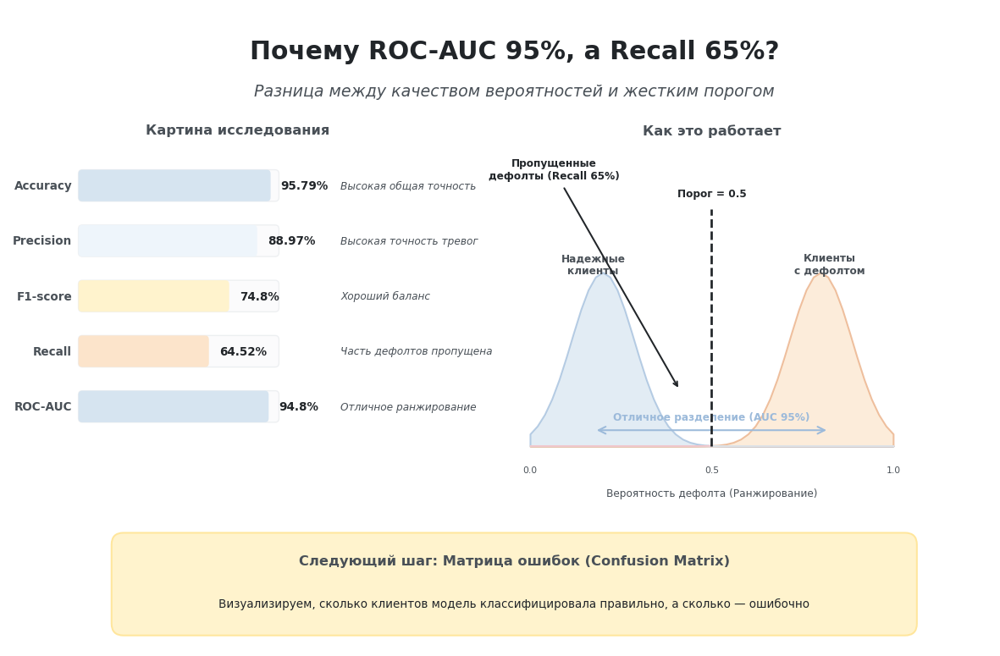

In [ ]:
# @title
import matplotlib.pyplot as plt
import math
from matplotlib.patches import FancyBboxPatch, Polygon

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"
LIGHT_BLUE = "#EEF5FB"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Почему ROC-AUC 95%, а Recall 65%?",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Разница между качеством вероятностей и жестким порогом",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Шкала метрик (Картина исследования)
# ==========================================
ax.text(2.5, 6.5, "Картина исследования", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Обновленные значения метрик
metrics = [
    ("Accuracy", 95.79, "Высокая общая точность", BLUE_BORDER, BLUE, 5.8),
    ("Precision", 88.97, "Высокая точность тревог", BLUE_BORDER, LIGHT_BLUE, 5.1),
    ("F1-score", 74.80, "Хороший баланс", AMBER_BORDER, AMBER, 4.4),
    ("Recall", 64.52, "Часть дефолтов пропущена", ORANGE_BORDER, ORANGE, 3.7),
    ("ROC-AUC", 94.80, "Отличное ранжирование", BLUE_BORDER, BLUE, 3.0)
]

bar_x_start = 0.5
bar_max_w = 2.5

for name, val, desc, border, color, y_pos in metrics:
    # Фон шкалы
    ax.add_patch(FancyBboxPatch(
        (bar_x_start, y_pos - 0.18), bar_max_w, 0.36,
        boxstyle="round,pad=0.02,rounding_size=0.05",
        linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY, alpha=0.5
    ))
    # Заполнение шкалы (по проценту)
    fill_w = (val / 100) * bar_max_w
    ax.add_patch(FancyBboxPatch(
        (bar_x_start, y_pos - 0.18), fill_w, 0.36,
        boxstyle="round,pad=0.02,rounding_size=0.05",
        linewidth=0, edgecolor=border, facecolor=color
    ))
    # Название метрики
    ax.text(
        bar_x_start - 0.1, y_pos, name,
        ha="right", va="center",
        fontsize=10*S, weight="bold", color=TEXT_MUTED
    )
    # Значение
    ax.text(
        bar_x_start + fill_w + 0.15, y_pos, f"{val}%",
        ha="left", va="center",
        fontsize=10*S, weight="bold", color=TEXT_DARK
    )
    # Описание
    ax.text(
        bar_x_start + bar_max_w + 0.8, y_pos, desc,
        ha="left", va="center",
        fontsize=9*S, color=TEXT_MUTED, style="italic"
    )


# ==========================================
# ПРАВАЯ ЧАСТЬ: Ранжирование vs Порог (Суть проблемы)
# ==========================================
ax.text(8.5, 6.5, "Как это работает", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Функция для генерации холмов (нормальное распределение)
def get_curve_points(x_center, y_base, y_height, width, peak_x, num_points=50):
    xs = []
    ys = []
    for i in range(num_points + 1):
        t = i / num_points
        x = x_center[0] + t * width
        dist = (t - peak_x) ** 2
        y = y_base + y_height * math.exp(-dist / 0.015)
        xs.append(x)
        ys.append(y)
    return xs, ys

plot_x_start = 6.2
plot_x_end = 10.8
plot_width = plot_x_end - plot_x_start

# Ось X
ax.plot([plot_x_start, plot_x_end], [2.5, 2.5], color=GRAY_BORDER, linewidth=1.5*S)
ax.text(plot_x_start, 2.2, "0.0", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(8.5, 2.2, "0.5", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(plot_x_end, 2.2, "1.0", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(8.5, 1.9, "Вероятность дефолта (Ранжирование)", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED)

# Холм 1: Не дефолт (Синий) - сдвинут левее для лучшего разделения
non_def_x, non_def_y = get_curve_points((plot_x_start, plot_x_start), 2.5, 2.2, plot_width, 0.20)
ax.fill_between(non_def_x, 2.5, non_def_y, color=BLUE, alpha=0.7, edgecolor=BLUE_BORDER, linewidth=1.5*S)
ax.text(7.0, 4.8, "Надежные\nклиенты", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, weight="bold")

# Холм 2: Дефолт (Оранжевый) - сдвинут правее
def_x, def_y = get_curve_points((plot_x_start, plot_x_start), 2.5, 2.2, plot_width, 0.80)
ax.fill_between(def_x, 2.5, def_y, color=ORANGE, alpha=0.7, edgecolor=ORANGE_BORDER, linewidth=1.5*S)
ax.text(10.0, 4.8, "Клиенты\nс дефолтом", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, weight="bold")

# Линия порога (0.5)
threshold_x = 8.5
ax.plot([threshold_x, threshold_x], [2.5, 5.5], color=TEXT_DARK, linestyle="--", linewidth=2*S, zorder=4)
ax.text(8.5, 5.7, "Порог = 0.5", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")

# Зона пропущенных дефолтов (False Negatives - Левее порога, но в оранжевом холме)
fn_xs = []
fn_ys = []
for x, y in zip(def_x, def_y):
    if x <= threshold_x:
        fn_xs.append(x)
        fn_ys.append(y)
fn_xs.append(threshold_x)
fn_ys.append(2.5)
fn_xs.append(fn_xs[0])
fn_ys.append(2.5)

ax.fill(fn_xs, fn_ys, color=RED_FILL, alpha=0.8, edgecolor=RED_BORDER, linewidth=1*S, zorder=3)
ax.annotate("Пропущенные\nдефолты (Recall 65%)",
            xy=(8.1, 3.2), xytext=(6.5, 6.0),
            ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold",
            arrowprops=dict(arrowstyle="->", color=TEXT_DARK, lw=1.5*S))

# Зона правильного ранжирования (AUC)
ax.annotate("", xy=(7.0, 2.7), xytext=(10.0, 2.7),
            arrowprops=dict(arrowstyle="<->", color=BLUE_BORDER, lw=1.5*S))
ax.text(8.5, 2.8, "Отличное разделение (AUC 95%)", ha="center", va="bottom", fontsize=9*S, color=BLUE_BORDER, weight="bold")


# ---------- Итоговый блок (Мостик) ----------
res_box = FancyBboxPatch(
    (1.0, 0.2), 10.0, 1.1,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 1.05, "Следующий шаг: Матрица ошибок (Confusion Matrix)",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, 0.5, "Визуализируем, сколько клиентов модель классифицировала правильно, а сколько — ошибочно",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK
)

plt.tight_layout()
plt.show()

### 18.4.4 Построение матрицы ошибок

Для более детального анализа качества классификации строится матрица ошибок (Confusion Matrix).

Матрица ошибок позволяет определить количество объектов, которые были классифицированы правильно и неправильно, а также установить характер допущенных ошибок.

Для задачи кредитного скоринга особый интерес представляют случаи, когда модель ошибочно относит клиента, фактически допустившего дефолт, к категории надёжных заёмщиков. Подобные ошибки могут привести к выдаче кредита клиентам с высоким уровнем риска и, как следствие, к финансовым потерям кредитной организации.

In [ ]:
# ==========================================================
# Построение матрицы ошибок
# ==========================================================

# Матрица ошибок показывает,
# сколько объектов каждого класса
# модель классифицировала правильно,
# а сколько — ошибочно.
cm = confusion_matrix(y_test, y_pred)

print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[64840   560]
 [ 2485  4519]]


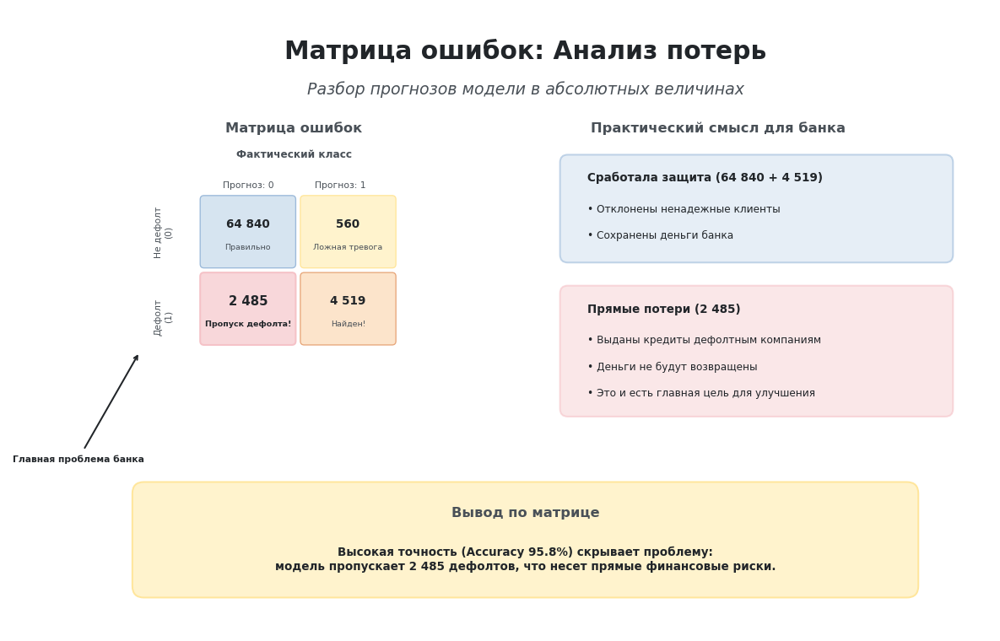

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Матрица ошибок: Анализ потерь",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Разбор прогнозов модели в абсолютных величинах",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Матрица ошибок (Confusion Matrix)
# ==========================================
ax.text(3.0, 6.5, "Матрица ошибок", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Оси матрицы
ax.text(3.0, 6.15, "Фактический класс", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, weight="bold")
ax.text(1.3, 5.15, "Не дефолт\n(0)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, rotation=90)
ax.text(1.3, 4.05, "Дефолт\n(1)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, rotation=90)

ax.text(2.4, 5.75, "Прогноз: 0", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(3.6, 5.75, "Прогноз: 1", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)

# Ячейки матрицы (2x2)
cell_w = 1.2
cell_h = 0.9
start_x = 1.8
start_y = 4.7

# 1. True Negative (Верх-Лево) - 64840
ax.add_patch(FancyBboxPatch((start_x, start_y), cell_w, cell_h, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
ax.text(start_x + cell_w/2, start_y + cell_h/2 + 0.1, "64 840", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(start_x + cell_w/2, start_y + cell_h/2 - 0.2, "Правильно", ha="center", va="center", fontsize=7*S, color=TEXT_MUTED)

# 2. False Positive (Верх-Право) - 560 (Ложная тревога)
ax.add_patch(FancyBboxPatch((start_x + cell_w + 0.1, start_y), cell_w, cell_h, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=AMBER, edgecolor=AMBER_BORDER, linewidth=1*S))
ax.text(start_x + cell_w + 0.1 + cell_w/2, start_y + cell_h/2 + 0.1, "560", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(start_x + cell_w + 0.1 + cell_w/2, start_y + cell_h/2 - 0.2, "Ложная тревога", ha="center", va="center", fontsize=7*S, color=TEXT_MUTED)

# 3. False Negative (Низ-Лево) - 2485 (Пропуск - КРАСНЫЙ)
ax.add_patch(FancyBboxPatch((start_x, start_y - cell_h - 0.1), cell_w, cell_h, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=RED_FILL, edgecolor=RED_BORDER, linewidth=1.5*S))
ax.text(start_x + cell_w/2, start_y - cell_h - 0.1 + cell_h/2 + 0.1, "2 485", ha="center", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(start_x + cell_w/2, start_y - cell_h - 0.1 + cell_h/2 - 0.2, "Пропуск дефолта!", ha="center", va="center", fontsize=7*S, color=TEXT_DARK, weight="bold")

# 4. True Positive (Низ-Право) - 4519
ax.add_patch(FancyBboxPatch((start_x + cell_w + 0.1, start_y - cell_h - 0.1), cell_w, cell_h, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=ORANGE, edgecolor=ORANGE_BORDER, linewidth=1*S))
ax.text(start_x + cell_w + 0.1 + cell_w/2, start_y - cell_h - 0.1 + cell_h/2 + 0.1, "4 519", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(start_x + cell_w + 0.1 + cell_w/2, start_y - cell_h - 0.1 + cell_h/2 - 0.2, "Найден!", ha="center", va="center", fontsize=7*S, color=TEXT_MUTED)

# Стрелка-акцент на красную зону
ax.annotate("Главная проблема банка", xy=(1.0, 3.6), xytext=(0.2, 2.2),
            ha="center", va="center", fontsize=8*S, color=TEXT_DARK, weight="bold",
            arrowprops=dict(arrowstyle="->", color=TEXT_DARK, lw=1.5*S))


# ==========================================
# ПРАВАЯ ЧАСТЬ: Практический смысл
# ==========================================
ax.text(8.5, 6.5, "Практический смысл для банка", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Блок 1: Заработанные деньги (Синий) ---
ax.add_patch(FancyBboxPatch(
    (6.5, 4.8), 5.0, 1.3,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.6
))
ax.text(6.8, 5.85, "Сработала защита (64 840 + 4 519)", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(6.8, 5.45, "• Отклонены ненадежные клиенты", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(6.8, 5.1, "• Сохранены деньги банка", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)

# --- Блок 2: Упущенные деньги (Красный) ---
ax.add_patch(FancyBboxPatch(
    (6.5, 2.8), 5.0, 1.6,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=RED_BORDER, facecolor=RED_FILL, alpha=0.6
))
ax.text(6.8, 4.15, "Прямые потери (2 485)", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(6.8, 3.75, "• Выданы кредиты дефолтным компаниям", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(6.8, 3.4, "• Деньги не будут возвращены", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(6.8, 3.05, "• Это и есть главная цель для улучшения", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, 0.5), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 1.5, "Вывод по матрице",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, 0.9, "Высокая точность (Accuracy 95.8%) скрывает проблему:\nмодель пропускает 2 485 дефолтов, что несет прямые финансовые риски.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

### Анализ полученного результата

Матрица ошибок показывает, что модель корректно классифицировала **64 840** организаций без дефолта (**True Negative**) и **4 519** организаций с дефолтом (**True Positive**).

При этом **560** организаций были ошибочно отнесены к классу дефолта (**False Positive**), а **2 485** организаций, фактически допустивших дефолт, модель не смогла распознать (**False Negative**).

Полученные результаты согласуются с ранее рассчитанными метриками Precision, Recall и F1-score. Наибольшее практическое значение в задачах кредитного скоринга имеют ошибки типа **False Negative**, поскольку в этом случае организация, склонная к дефолту, ошибочно признаётся надёжной. Именно поэтому наряду с высокой общей точностью модели особое внимание уделяется её способности выявлять объекты миноритарного класса.

### 18.4.5 Формирование отчёта о классификации

Для обобщения результатов оценки качества модели формируется отчёт о классификации (Classification Report).

Данный отчёт автоматически объединяет основные метрики качества классификации для каждого класса: Precision, Recall, F1-score, а также количество объектов каждого класса (Support).

Использование отчёта позволяет комплексно оценить качество работы модели и дополнительно проверить согласованность ранее рассчитанных показателей.

In [ ]:
# ==========================================================
# Формирование Classification Report
# ==========================================================

# Classification Report объединяет
# основные метрики качества классификации
# для каждого класса в единую таблицу.
#
# В отчёте представлены:
# Precision — точность;
# Recall — полнота;
# F1-score — гармоническое среднее;
# Support — количество объектов каждого класса.
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.99      0.98     65400
           1       0.89      0.65      0.75      7004

    accuracy                           0.96     72404
   macro avg       0.93      0.82      0.86     72404
weighted avg       0.96      0.96      0.95     72404



### Анализ полученного результата

Полученный отчёт о классификации подтвердил результаты, рассчитанные ранее с использованием отдельных метрик качества.

Для класса **0** (отсутствие дефолта) модель продемонстрировала высокие значения Precision (**0,96**), Recall (**0,99**) и F1-score (**0,98**), что свидетельствует о высокой эффективности классификации организаций, не допустивших дефолт.

Для класса **1** (дефолт) модель также показала достаточно высокое качество: Precision составила **0,89**, Recall — **0,65**, а F1-score — **0,75**. Это означает, что большинство организаций, признанных моделью дефолтными, действительно относятся к данному классу, однако часть реальных случаев дефолта всё ещё остаётся невыявленной.

Следует также обратить внимание на различие между показателями **macro average** и **weighted average**. Среднее значение **macro average** рассчитывается без учёта размера классов и поэтому более чувствительно к качеству классификации миноритарного класса. В свою очередь, **weighted average** учитывает количество объектов каждого класса, вследствие чего его значения оказываются выше за счёт преобладания большинства объектов класса отсутствия дефолта.

Полученные результаты подтверждают, что при наличии существенного дисбаланса классов использование только агрегированных показателей качества может привести к завышенной оценке эффективности модели. Для объективного анализа необходимо отдельно оценивать качество распознавания каждого класса.

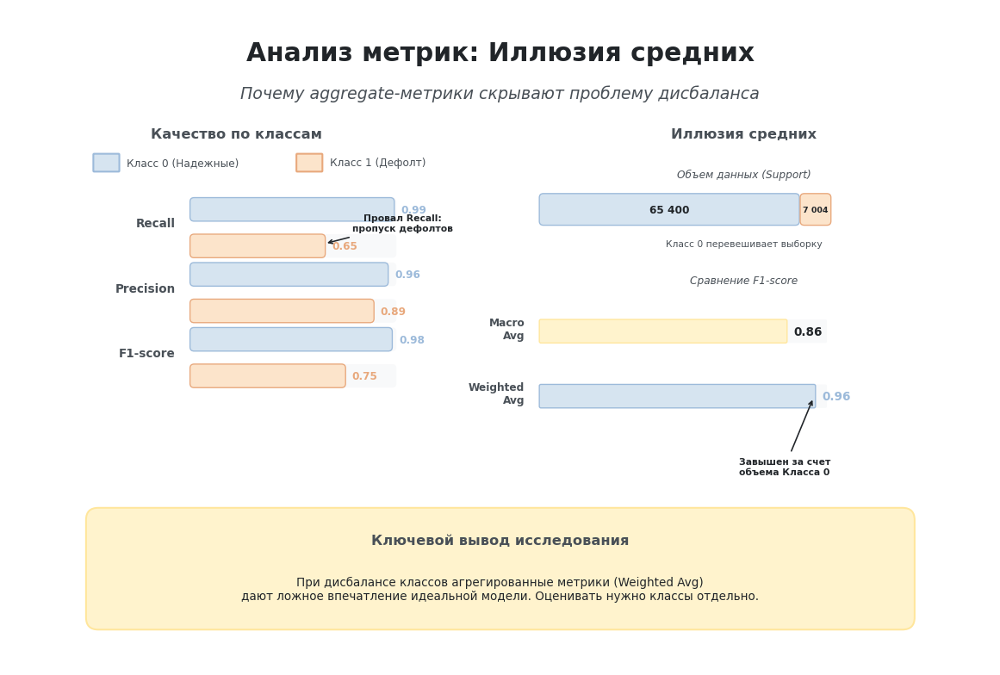

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, Polygon

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Анализ метрик: Иллюзия средних",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Почему aggregate-метрики скрывают проблему дисбаланса",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Качество по классам
# ==========================================
ax.text(2.75, 6.5, "Качество по классам", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Легенда
ax.add_patch(FancyBboxPatch((1.0, 6.05), 0.3, 0.2, boxstyle="round,pad=0.01", facecolor=BLUE, edgecolor=BLUE_BORDER))
ax.text(1.4, 6.15, "Класс 0 (Надежные)", ha="left", va="center", fontsize=9*S, color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((3.5, 6.05), 0.3, 0.2, boxstyle="round,pad=0.01", facecolor=ORANGE, edgecolor=ORANGE_BORDER))
ax.text(3.9, 6.15, "Класс 1 (Дефолт)", ha="left", va="center", fontsize=9*S, color=TEXT_MUTED)

bar_x_start = 2.2
bar_max_w = 2.5
bar_h = 0.25

# Обновленные данные метрик
metrics_data = [
    ("Recall", 0.99, 0.65, 5.4),
    ("Precision", 0.96, 0.89, 4.6),
    ("F1-score", 0.98, 0.75, 3.8)
]

for name, val0, val1, y_pos in metrics_data:
    # Название метрики
    ax.text(2.0, y_pos, name, ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)

    # Фон для Класса 0
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos + 0.05), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=0, facecolor=GRAY))
    # Заполнение Класса 0
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos + 0.05), bar_max_w * val0, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=BLUE_BORDER, facecolor=BLUE))
    ax.text(bar_x_start + bar_max_w * val0 + 0.1, y_pos + 0.17, f"{val0:.2f}", ha="left", va="center", fontsize=9*S, weight="bold", color=BLUE_BORDER)

    # Фон для Класса 1
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.4), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=0, facecolor=GRAY))
    # Заполнение Класса 1
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.4), bar_max_w * val1, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE))
    ax.text(bar_x_start + bar_max_w * val1 + 0.1, y_pos - 0.28, f"{val1:.2f}", ha="left", va="center", fontsize=9*S, weight="bold", color=ORANGE_BORDER)

# Акцент на проблеме (обновлен на 0.65)
ax.annotate("Провал Recall:\nпропуск дефолтов",
            xy=(bar_x_start + bar_max_w * 0.65, 5.15), xytext=(4.8, 5.4),
            ha="center", va="center", fontsize=8*S, color=TEXT_DARK, weight="bold",
            arrowprops=dict(arrowstyle="->", color=TEXT_DARK, lw=1.2*S))


# ==========================================
# ПРАВАЯ ЧАСТЬ: Иллюзия средних (Macro vs Weighted)
# ==========================================
ax.text(9.0, 6.5, "Иллюзия средних", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- 1. Объем данных (Support) ---
ax.text(9.0, 6.0, "Объем данных (Support)", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, style="italic")

# Класс 0 (Большой блок)
c0_w = 3.5 * (65400 / 72404) # Пропорция от общей ширины 3.5
ax.add_patch(FancyBboxPatch((6.5, 5.4), c0_w, 0.35, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
ax.text(6.5 + c0_w/2, 5.57, "65 400", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# Класс 1 (Маленький блок)
c1_w = 3.5 * (7004 / 72404)
ax.add_patch(FancyBboxPatch((6.5 + c0_w + 0.05, 5.4), c1_w, 0.35, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=ORANGE, edgecolor=ORANGE_BORDER, linewidth=1*S))
ax.text(6.5 + c0_w + 0.05 + c1_w/2, 5.57, "7 004", ha="center", va="center", fontsize=7*S, weight="bold", color=TEXT_DARK)

ax.text(9.0, 5.15, "Класс 0 перевешивает выборку", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)

# --- 2. Сравнение средних (F1-score) ---
ax.text(9.0, 4.7, "Сравнение F1-score", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, style="italic")

avg_bar_x = 6.5
avg_max_w = 3.5

# Macro Average (Без учета размера) - обновлен до 0.86
ax.text(6.3, 4.1, "Macro\nAvg", ha="right", va="center", fontsize=9*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((avg_bar_x, 3.95), avg_max_w, bar_h, boxstyle="round,pad=0.02", facecolor=GRAY, linewidth=0))
ax.add_patch(FancyBboxPatch((avg_bar_x, 3.95), avg_max_w * 0.86, bar_h, boxstyle="round,pad=0.02", facecolor=AMBER, edgecolor=AMBER_BORDER, linewidth=1*S))
ax.text(avg_bar_x + avg_max_w * 0.86 + 0.1, 4.07, "0.86", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# Weighted Average (С учетом размера - ближе к Классу 0) - обновлен до 0.96
ax.text(6.3, 3.3, "Weighted\nAvg", ha="right", va="center", fontsize=9*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((avg_bar_x, 3.15), avg_max_w, bar_h, boxstyle="round,pad=0.02", facecolor=GRAY, linewidth=0))
ax.add_patch(FancyBboxPatch((avg_bar_x, 3.15), avg_max_w * 0.96, bar_h, boxstyle="round,pad=0.02", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
ax.text(avg_bar_x + avg_max_w * 0.96 + 0.1, 3.27, "0.96", ha="left", va="center", fontsize=10*S, weight="bold", color=BLUE_BORDER)

# Стрелка-объяснение (обновлена цифра 0.96)
ax.annotate("Завышен за счет\nобъема Класса 0",
            xy=(avg_bar_x + avg_max_w * 0.96, 3.27), xytext=(9.5, 2.4),
            ha="center", va="center", fontsize=8*S, color=TEXT_DARK, weight="bold",
            arrowprops=dict(arrowstyle="->", color=TEXT_DARK, lw=1.2*S))


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, 0.5), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 1.5, "Ключевой вывод исследования",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, 0.9, "При дисбалансе классов агрегированные метрики (Weighted Avg)\nдают ложное впечатление идеальной модели. Оценивать нужно классы отдельно.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK
)

plt.tight_layout()
plt.show()

### 18.5 Вывод по качеству базовой модели

Проведённая оценка базовой модели логистической регрессии показала, что при использовании исходного несбалансированного набора данных модель демонстрирует высокие значения Accuracy (**95,79 %**) и ROC-AUC (**0,9480**), что свидетельствует о хорошем общем качестве классификации и высокой способности разделять организации по уровню кредитного риска.

Более детальный анализ показал, что модель также достаточно эффективно выявляет организации, склонные к дефолту. Значение Precision составило **88,97 %**, Recall — **64,52 %**, а F1-score — **0,7480**. Вместе с тем матрица ошибок показала, что **2 485** реальных случаев дефолта были ошибочно классифицированы как надёжные организации. Для задач кредитного скоринга подобные ошибки являются наиболее критичными, поскольку могут привести к финансовым потерям кредитной организации.

Таким образом, базовая модель обеспечивает высокое качество разделения классов и демонстрирует хорошие результаты по большинству метрик. Однако наличие существенного дисбаланса классов по-прежнему влияет на полноту выявления организаций, склонных к дефолту, что делает целесообразным дальнейшее исследование методов балансировки классов и оценку их влияния на качество моделей кредитного скоринга.

# Глава 19. Применение методов балансировки классов

## Что мы будем проверять?

В предыдущей главе была исследована базовая модель логистической регрессии, обученная на исходном наборе данных без каких-либо изменений структуры выборки.

Полученные результаты показали интересную особенность. Несмотря на высокие значения метрик **Accuracy** и **ROC-AUC**, модель недостаточно эффективно выявляла клиентов, относящихся к миноритарному классу (дефолт). Иными словами, общая точность модели выглядела высокой, однако способность обнаруживать наиболее важные для кредитного скоринга случаи оставалась ограниченной.

Возникает закономерный вопрос: **является ли причиной такого поведения именно дисбаланс классов?**

Если проблема действительно заключается в существенном преобладании объектов мажоритарного класса, то после устранения дисбаланса качество модели должно измениться.

Именно для проверки этой гипотезы в данной главе начинается последовательное исследование различных методов балансировки классов.

Каждый рассматриваемый алгоритм будет применяться только к обучающей выборке. После этого логистическая регрессия будет заново обучаться, выполнять прогнозирование на неизменной тестовой выборке, а затем её качество будет оцениваться с помощью одинакового набора метрик.

Такой подход обеспечивает одинаковые условия проведения всех экспериментов и позволяет объективно сравнить влияние различных методов балансировки на качество модели.

### Почему это важно?

Дисбаланс классов считается одной из наиболее распространённых проблем при построении моделей кредитного скоринга. На практике существует большое количество способов его устранения, однако заранее невозможно определить, какой из них окажется наиболее эффективным для конкретного набора данных.

Поэтому вместо выбора одного «лучшего» метода в данной работе будет последовательно исследована целая группа наиболее распространённых алгоритмов балансировки. Это позволит не только сравнить их между собой, но и понять, насколько сам факт устранения дисбаланса влияет на качество логистической регрессии.

### Что мы ожидаем увидеть?

Если основной причиной недостаточного качества базовой модели действительно является дисбаланс классов, то после применения методов балансировки можно ожидать улучшения способности модели обнаруживать объекты миноритарного класса. В первую очередь это может проявиться в изменении значений **Recall**, **Precision**, **F1-score** и других метрик качества.

При этом заранее невозможно утверждать, какой именно метод окажется наиболее эффективным. Каждый алгоритм использует собственный подход к балансировке данных, поэтому одной из целей исследования является сравнение их поведения в одинаковых условиях.

Таким образом, данная глава открывает основную экспериментальную часть исследования, в которой будет последовательно проверено влияние различных методов балансировки классов на качество модели кредитного скоринга.

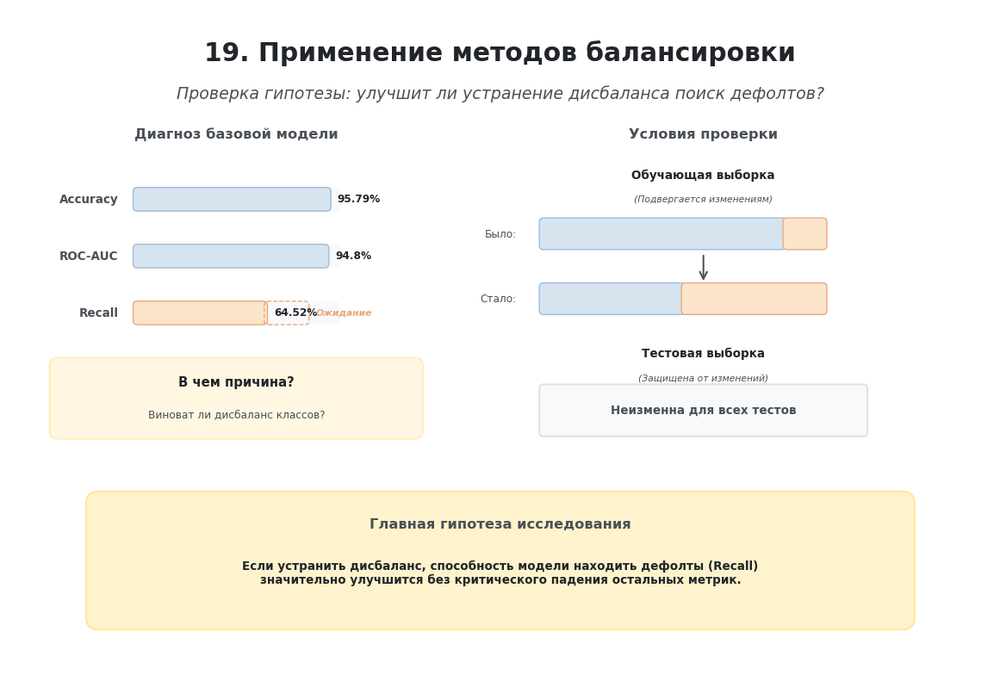

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "19. Применение методов балансировки",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Проверка гипотезы: улучшит ли устранение дисбаланса поиск дефолтов?",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Диагноз и Ожидания
# ==========================================
ax.text(2.75, 6.5, "Диагноз базовой модели", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

bar_x_start = 1.5
bar_max_w = 2.5
bar_h = 0.25

# Данные метрик
metrics_data = [
    ("Accuracy", 95.79, BLUE, BLUE_BORDER, 5.7),
    ("ROC-AUC", 94.80, BLUE, BLUE_BORDER, 5.0),
    ("Recall", 64.52, ORANGE, ORANGE_BORDER, 4.3)
]

for name, val, color, border, y_pos in metrics_data:
    ax.text(1.3, y_pos, name, ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)

    # Фон шкалы
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - bar_h/2), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=0, facecolor=GRAY))
    # Заполнение
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - bar_h/2), bar_max_w * (val/100), bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=border, facecolor=color))
    ax.text(bar_x_start + bar_max_w * (val/100) + 0.1, y_pos, f"{val}%", ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# Пунктирное "ожидание" для Recall
expected_w = bar_max_w * 0.85 # Ожидаем вырасти до ~85%
ax.add_patch(FancyBboxPatch((bar_x_start + bar_max_w * 0.6452, 4.3 - bar_h/2), expected_w - bar_max_w * 0.6452, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=ORANGE_BORDER, facecolor="none", linestyle="--"))
ax.text(bar_x_start + expected_w + 0.1, 4.3, "Ожидание", ha="left", va="center", fontsize=8*S, color=ORANGE_BORDER, weight="bold", style="italic")

# Вопрос
ax.add_patch(FancyBboxPatch(
    (0.5, 2.8), 4.5, 0.9,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER, alpha=0.6
))
ax.text(2.75, 3.45, "В чем причина?", ha="center", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(2.75, 3.05, "Виноват ли дисбаланс классов?", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED)


# ==========================================
# ПРАВАЯ ЧАСТЬ: Правила эксперимента
# ==========================================
ax.text(8.5, 6.5, "Условия проверки", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Train (Меняем) ---
ax.text(8.5, 6.0, "Обучающая выборка", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(8.5, 5.7, "(Подвергается изменениям)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# Было
ax.add_patch(FancyBboxPatch((6.5, 5.1), 3.0, 0.35, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
ax.add_patch(FancyBboxPatch((9.5, 5.1), 0.5, 0.35, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=ORANGE, edgecolor=ORANGE_BORDER, linewidth=1*S))
ax.text(6.2, 5.27, "Было:", ha="right", va="center", fontsize=9*S, color=TEXT_MUTED)

# Стрелка
ax.annotate("", xy=(8.5, 4.65), xytext=(8.5, 5.05), arrowprops=dict(arrowstyle="->", color=TEXT_MUTED, lw=1.5*S))

# Стало
ax.add_patch(FancyBboxPatch((6.5, 4.3), 1.75, 0.35, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
ax.add_patch(FancyBboxPatch((8.25, 4.3), 1.75, 0.35, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=ORANGE, edgecolor=ORANGE_BORDER, linewidth=1*S))
ax.text(6.2, 4.47, "Стало:", ha="right", va="center", fontsize=9*S, color=TEXT_MUTED)

# --- Test (Не меняем) ---
ax.text(8.5, 3.8, "Тестовая выборка", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(8.5, 3.5, "(Защищена от изменений)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# Замок (Имитация)
ax.add_patch(FancyBboxPatch(
    (6.5, 2.8), 4.0, 0.6,
    boxstyle="round,pad=0.02,rounding_size=0.05",
    linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor=GRAY
))
ax.text(8.5, 3.1, "Неизменна для всех тестов", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)


# ---------- Итоговый блок (Гипотеза) ----------
res_box = FancyBboxPatch(
    (1.0, 0.5), 10.0, 1.5,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 1.7, "Главная гипотеза исследования",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, 1.1, "Если устранить дисбаланс, способность модели находить дефолты (Recall)\nзначительно улучшится без критического падения остальных метрик.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

## 19.1 Балансировка методом Random Oversampling

Исследование методов балансировки классов начинается с применения **Random Oversampling** — одного из наиболее простых и широко используемых базовых методов устранения дисбаланса данных.

Выбор данного метода в качестве первого этапа исследования обусловлен тем, что он позволяет оценить, насколько само увеличение количества объектов миноритарного класса способно повлиять на качество модели без использования более сложных алгоритмов генерации новых данных. Таким образом, Random Oversampling служит отправной точкой для дальнейшего сравнения с более современными методами балансировки.

Принцип работы метода заключается в случайном дублировании существующих объектов миноритарного класса( в данном случае - дефолтов) до тех пор, пока количество объектов обоих классов не станет одинаковым.

Преимуществом Random Oversampling является простота реализации и отсутствие потери информации, поскольку объекты мажоритарного класса не удаляются из обучающей выборки. Вместе с тем многократное повторение одних и тех же наблюдений может привести к переобучению модели, что является одним из основных недостатков данного подхода.

После применения метода будет повторно обучена модель логистической регрессии, а полученные результаты будут сопоставлены с показателями базовой модели, обученной на исходном несбалансированном наборе данных.

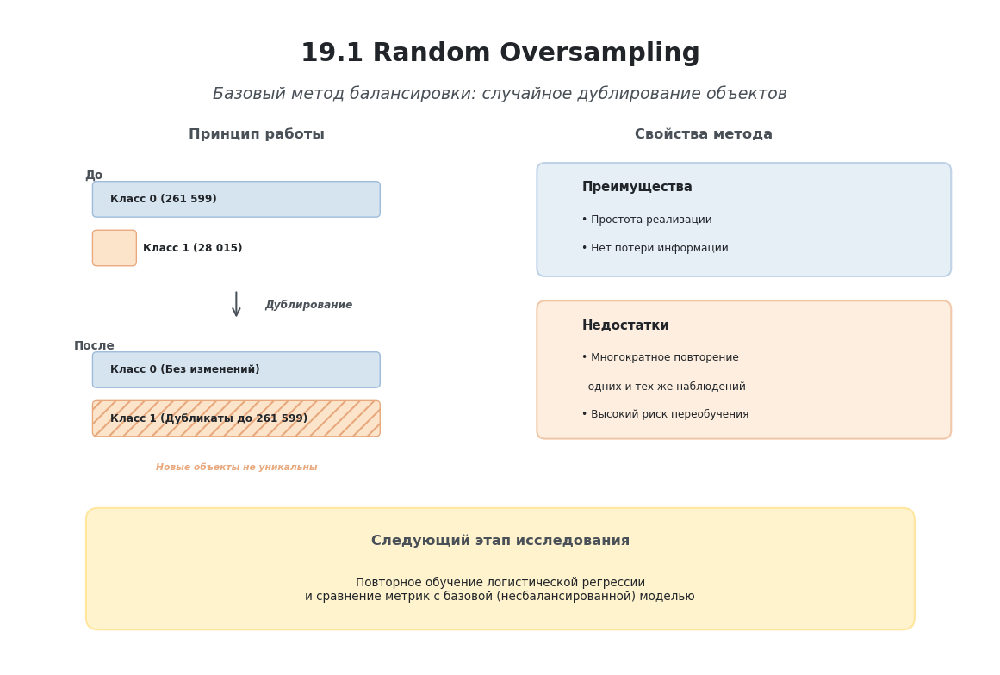

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "19.1 Random Oversampling",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Базовый метод балансировки: случайное дублирование объектов",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Механика метода (До и После)
# ==========================================
ax.text(3.0, 6.5, "Принцип работы", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- ДО ---
ax.text(1.0, 6.0, "До", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)

# Класс 0 (Мажоритарный)
ax.add_patch(FancyBboxPatch((1.0, 5.5), 3.5, 0.4, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
ax.text(1.2, 5.7, "Класс 0 (261 599)", ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# Класс 1 (Миноритарный)
ax.add_patch(FancyBboxPatch((1.0, 4.9), 0.5, 0.4, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=ORANGE, edgecolor=ORANGE_BORDER, linewidth=1*S))
ax.text(1.6, 5.1, "Класс 1 (28 015)", ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# Стрелка процесса
ax.annotate("", xy=(2.75, 4.2), xytext=(2.75, 4.6),
            arrowprops=dict(arrowstyle="->", color=TEXT_MUTED, lw=1.5*S))
ax.text(3.1, 4.4, "Дублирование", ha="left", va="center", fontsize=9*S, color=TEXT_MUTED, weight="bold", style="italic")

# --- ПОСЛЕ ---
ax.text(1.0, 3.9, "После", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)

# Класс 0 (Без изменений)
ax.add_patch(FancyBboxPatch((1.0, 3.4), 3.5, 0.4, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
ax.text(1.2, 3.6, "Класс 0 (Без изменений)", ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# Класс 1 (Выровнен за счет копий - штриховка)
ax.add_patch(FancyBboxPatch((1.0, 2.8), 3.5, 0.4, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=ORANGE, edgecolor=ORANGE_BORDER, linewidth=1*S, hatch='///'))
ax.text(1.2, 3.0, "Класс 1 (Дубликаты до 261 599)", ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# Заметка о штриховке
ax.text(2.75, 2.4, "Новые объекты не уникальны", ha="center", va="center", fontsize=8*S, color=ORANGE_BORDER, weight="bold", style="italic")


# ==========================================
# ПРАВАЯ ЧАСТЬ: Плюсы и Минусы
# ==========================================
ax.text(8.5, 6.5, "Свойства метода", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Преимущества ---
ax.add_patch(FancyBboxPatch(
    (6.5, 4.8), 5.0, 1.3,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.6
))
ax.text(7.0, 5.85, "Преимущества", ha="left", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(7.0, 5.45, "• Простота реализации", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(7.0, 5.1, "• Нет потери информации", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)

# --- Недостатки ---
ax.add_patch(FancyBboxPatch(
    (6.5, 2.8), 5.0, 1.6,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE, alpha=0.6
))
ax.text(7.0, 4.15, "Недостатки", ha="left", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(7.0, 3.75, "• Многократное повторение", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(7.0, 3.4, "  одних и тех же наблюдений", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(7.0, 3.05, "• Высокий риск переобучения", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)


# ---------- Итоговый блок (Мостик) ----------
res_box = FancyBboxPatch(
    (1.0, 0.5), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 1.5, "Следующий этап исследования",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, 0.9, "Повторное обучение логистической регрессии\nи сравнение метрик с базовой (несбалансированной) моделью",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK
)

plt.tight_layout()
plt.show()

In [ ]:
# ==========================================================
# Импорт библиотеки для Random Oversampling
# ==========================================================

# RandomOverSampler используется
# для случайного увеличения количества
# объектов миноритарного класса.
#
# Метод дублирует существующие наблюдения,
# пока количество объектов обоих классов
# не станет одинаковым.
from imblearn.over_sampling import RandomOverSampler

### 19.2 Балансировка обучающей выборки

На данном этапе метод Random Oversampling применяется к обучающей выборке.

Важно отметить, что балансировка выполняется **только для обучающих данных**. Тестовая выборка остаётся неизменной и сохраняет исходное распределение классов. Такой подход позволяет объективно оценить качество модели в условиях, максимально приближенных к реальным данным, и исключить влияние искусственно изменённого распределения классов на результаты оценки.

In [ ]:
# ==========================================================
# Балансировка обучающей выборки методом Random Oversampling
# ==========================================================

# Создаем экземпляр RandomOverSampler.
#
# random_state фиксирует случайность,
# чтобы результаты можно было воспроизвести
# при повторном запуске исследования.
ros = RandomOverSampler(random_state=42)

# Выполняем балансировку обучающей выборки.
#
# Метод случайным образом дублирует объекты
# миноритарного класса до тех пор,
# пока количество объектов обоих классов
# не станет одинаковым.
X_train_ros, y_train_ros = ros.fit_resample(X_train, y_train)

print("Балансировка успешно выполнена.")

Балансировка успешно выполнена.


In [ ]:
# ==========================================================
# Проверка распределения классов после балансировки
# ==========================================================

print("Распределение классов после Random Oversampling:")

print(y_train_ros.value_counts())

print("\nВ процентах:")

print(y_train_ros.value_counts(normalize=True))

Распределение классов после Random Oversampling:
DefMark
0    261599
1    261599
Name: count, dtype: int64

В процентах:
DefMark
0    0.5
1    0.5
Name: proportion, dtype: float64


После применения метода **Random Oversampling** распределение классов в обучающей выборке стало полностью сбалансированным: количество объектов каждого класса составило **261 599**, что соответствует соотношению **50 % на 50 %**.

Полученный результат подтверждает корректную работу метода балансировки. Увеличение числа объектов миноритарного класса было выполнено исключительно для обучающей выборки, тогда как тестовая выборка осталась без изменений. Такой подход позволяет объективно оценить влияние балансировки на качество модели, поскольку её проверка выполняется на данных, отражающих реальное распределение классов.

На следующем этапе логистическая регрессия будет обучена на сбалансированной обучающей выборке, после чего полученные показатели качества будут сопоставлены с результатами базовой модели.

In [ ]:
# ==========================================================
# Обучение логистической регрессии
# после Random Oversampling
# ==========================================================

# Создаем новую модель логистической регрессии.
#
# Используем те же параметры, что и для базовой модели,
# чтобы изменение результатов было связано только
# с применением балансировки данных.
model_ros = LogisticRegression(
    random_state=42,
    max_iter=1000
)

# Обучаем модель на сбалансированной обучающей выборке.
#
# Теперь модель получает одинаковое количество объектов
# каждого класса, что позволяет ей уделять одинаковое
# внимание как клиентам без дефолта, так и клиентам,
# допустившим дефолт.
model_ros.fit(X_train_ros, y_train_ros)

print("Модель успешно обучена на сбалансированной выборке.")

Модель успешно обучена на сбалансированной выборке.


# 19.3 Получение прогнозов модели после Random Oversampling

После обучения модели на сбалансированной обучающей выборке необходимо оценить её качество на тестовых данных.

Для этого модель формирует:
- предсказанные классы (дефолт или отсутствие дефолта);
- вероятности принадлежности каждого объекта к положительному классу.

Оценка выполняется на неизменённой тестовой выборке, которая сохраняет исходное распределение классов. Такой подход позволяет объективно оценить, насколько применение Random Oversampling повлияло на способность модели выявлять клиентов, склонных к дефолту.

In [ ]:
# ==========================================================
# Получение прогнозов модели,
# обученной после Random Oversampling
# ==========================================================

# Получаем предсказанные классы (0 или 1)
# для объектов тестовой выборки.
y_pred_ros = model_ros.predict(X_test)

# Получаем вероятность принадлежности
# каждого объекта к положительному классу.
#
# Первый столбец содержит вероятность класса 0,
# второй — вероятность класса 1 (дефолт).
#
# Вероятности понадобятся для расчета
# метрики ROC-AUC.
y_pred_proba_ros = model_ros.predict_proba(X_test)[:, 1]

print("Прогнозы успешно получены.")

Прогнозы успешно получены.


## 19.4 Оценка качества модели после Random Oversampling

После получения прогнозов необходимо оценить качество модели с помощью основных метрик классификации.

В первую очередь рассчитывается общая точность (Accuracy), которая показывает долю правильно классифицированных объектов. Однако при наличии дисбаланса классов данная метрика не позволяет в полной мере оценить качество модели, поэтому далее будут рассчитаны дополнительные показатели: Precision, Recall, F1-score, ROC-AUC.

In [ ]:
# ==========================================================
# Accuracy
# ==========================================================

accuracy_ros = accuracy_score(y_test, y_pred_ros)

print(f"Accuracy: {accuracy_ros:.4f}")

Accuracy: 0.9067


### Precision, Recall и F1-score

Следующим этапом рассчитываются основные метрики качества бинарной классификации.

Данные показатели позволяют оценить способность модели выявлять клиентов, допустивших дефолт, что особенно важно при анализе несбалансированных данных.

In [ ]:
# ==========================================================
# Precision, Recall и F1-score
# ==========================================================

precision_ros = precision_score(y_test, y_pred_ros)
recall_ros = recall_score(y_test, y_pred_ros)
f1_ros = f1_score(y_test, y_pred_ros)

print(f"Precision: {precision_ros:.4f}")
print(f"Recall:    {recall_ros:.4f}")
print(f"F1-score:  {f1_ros:.4f}")

Precision: 0.5107
Recall:    0.8481
F1-score:  0.6375


### ROC-AUC

Дополнительно рассчитывается показатель ROC-AUC, характеризующий способность модели разделять клиентов с дефолтом и без дефолта независимо от выбранного порога классификации.

In [ ]:
# ==========================================================
# ROC-AUC
# ==========================================================

roc_auc_ros = roc_auc_score(y_test, y_pred_proba_ros)

print(f"ROC-AUC: {roc_auc_ros:.4f}")

ROC-AUC: 0.9490


### Промежуточный анализ полученных результатов

После применения метода **Random Oversampling** значение Accuracy составило **0,9067**, что соответствует **90,67 %** правильно классифицированных объектов тестовой выборки.

Значение Precision составило **0,5107**. Это означает, что среди организаций, отнесённых моделью к классу дефолта, около **51,07 %** действительно являются дефолтными.

При этом Recall увеличился до **0,8481**, то есть модель выявляет **84,81 %** всех реальных случаев дефолта. Следовательно, после балансировки модель стала значительно реже пропускать организации с высоким кредитным риском.

Значение F1-score составило **0,6375**, отражая компромисс между снизившейся точностью положительных прогнозов и высокой полнотой выявления дефолтов.

Показатель ROC-AUC составил **0,9490**, что свидетельствует о высокой способности модели разделять организации с дефолтом и без дефолта по рассчитанным вероятностям.

Таким образом, Random Oversampling привёл к заметному увеличению Recall, но одновременно снизил Accuracy и Precision. Модель стала выявлять больше реальных случаев дефолта, однако при этом чаще ошибочно относит надёжные организации к рискованным. Для более подробного понимания поведения модели далее будет проведён анализ распределения прогнозов, предсказанных вероятностей и коэффициентов логистической регрессии.

In [ ]:
# ==========================================================
# Проверка распределения прогнозов модели
# ==========================================================

import pandas as pd

print(pd.Series(y_pred_ros).value_counts())

0    60774
1    11630
Name: count, dtype: int64


In [ ]:
# ==========================================================
# Проверка вероятностей, предсказанных моделью
# ==========================================================

import pandas as pd

print(pd.Series(y_pred_proba_ros).describe())

count    72404.000000
mean         0.231536
std          0.285928
min          0.001043
25%          0.043748
50%          0.095740
75%          0.293481
max          0.999999
dtype: float64


### Анализ результатов дополнительной проверки

Дополнительный анализ показал, что после применения **Random Oversampling** модель сформировала более разнообразные прогнозы. Из **72 404** организаций тестовой выборки **60 774** были отнесены к классу отсутствия дефолта, а **11 630** — к классу дефолта.

Анализ предсказанных вероятностей также подтвердил, что модель уверенно различает объекты двух классов. Вероятности принадлежности к положительному классу изменяются в широком диапазоне — от **0,0010** до **0,9999**, при среднем значении **0,2315**. Это свидетельствует о том, что модель формирует информативные оценки кредитного риска, а не присваивает большинству объектов одинаковые вероятности.

Полученные результаты согласуются с ранее рассчитанными метриками качества. После балансировки модель стала значительно лучше выявлять организации, склонные к дефолту, что привело к заметному увеличению Recall. Одновременно возросло количество ложноположительных прогнозов, вследствие чего снизились Accuracy и Precision по сравнению с базовой моделью.

Таким образом, применение метода **Random Oversampling** не привело к деградации модели. Напротив, балансировка позволила существенно повысить способность логистической регрессии обнаруживать организации с высоким кредитным риском, сохранив при этом высокую способность разделять объекты двух классов, что подтверждается значением **ROC-AUC = 0,9490**.

### 19.4.1 Дополнительное исследование поведения модели

После применения метода **Random Oversampling** поведение модели заметно изменилось. Значение Recall увеличилось, то есть модель стала обнаруживать большую долю реальных случаев дефолта. Одновременно снизилось значение Precision, поскольку вместе с ростом числа выявленных дефолтов увеличилось количество ложноположительных прогнозов.

Для более подробного понимания поведения модели проводится дополнительное исследование. В рамках анализа проверяются:

- распределение предсказанных классов;
- распределение вероятностей, рассчитанных моделью;
- значения коэффициентов логистической регрессии;
- диапазоны значений признаков обучающей выборки.

Цель данного этапа — убедиться, что после балансировки модель действительно использует признаки для разделения классов, а изменение метрик связано с изменением её поведения, а не с ошибкой процесса обучения.

In [ ]:
# ==========================================================
# Анализ коэффициентов логистической регрессии
# ==========================================================

coef = pd.Series(
    model_ros.coef_[0],
    index=X_train.columns
)

print("Минимальный коэффициент:", coef.min())
print("Максимальный коэффициент:", coef.max())

print("\n10 наибольших коэффициентов:")

print(coef.sort_values(ascending=False).head(10))

print("\n10 наименьших коэффициентов:")

print(coef.sort_values().head(10))

Минимальный коэффициент: -0.022240496240174254
Максимальный коэффициент: 0.004151349198622196

10 наибольших коэффициентов:
F2_norm      0.004151
Q_A6_norm    0.003588
D4_norm      0.002603
Q_A2_norm    0.002378
C4_norm      0.002270
G5_norm      0.002250
A5_norm      0.002054
C1_norm      0.000966
A4_norm      0.000905
C2_norm      0.000808
dtype: float64

10 наименьших коэффициентов:
Q_B2_norm   -0.022240
Q_B1_norm   -0.021799
Q_B3_norm   -0.012169
Q_D4_norm   -0.008499
Q_C1_norm   -0.005981
F1_norm     -0.005306
A1_norm     -0.004188
B3_norm     -0.004012
Q_D6_norm   -0.003759
D5_norm     -0.003701
dtype: float64


In [ ]:
print(model_ros.intercept_)

[-1.50704614]


In [ ]:
# ==========================================================
# Проверка диапазонов признаков
# ==========================================================

X_train.describe().T[["min", "max", "mean", "std"]]

,min,max,mean,std
Q_A1_norm,-900.9711,2826.1507,-0.021747,49.686934
Q_A2_norm,-16.3676,877.0959,-0.097663,49.447485
Q_A3_norm,-731.7676,809.4377,-0.028664,50.212016
Q_A4_norm,-764.1037,115.0717,0.076285,50.024715
Q_A5_norm,-130.6391,43.7548,-0.035907,50.028252
Q_A6_norm,-30.7698,93.8581,-0.016966,49.990353
Q_A7_norm,-131.2192,46.9948,0.074179,49.950344
Q_B1_norm,-185.1505,34.6347,0.008352,50.021209
Q_B2_norm,-210.2249,21.2192,-0.021793,50.026377
Q_B3_norm,-295.9080,18.8384,0.049449,49.927702


### Вывод по результатам дополнительного исследования

Дополнительное исследование подтвердило, что модель, обученная после применения **Random Oversampling**, корректно использует признаки и сохраняет способность различать объекты двух классов.

Распределение прогнозов показало, что из **72 404** организаций тестовой выборки модель отнесла **60 774** организации к классу отсутствия дефолта и **11 630** организаций — к классу дефолта. Следовательно, модель не присваивает всем объектам один и тот же класс, а формирует различные решения в зависимости от значений признаков.

Предсказанные вероятности изменяются в широком диапазоне — от **0,0010** до практически **1,0**. Это означает, что модель действительно ранжирует организации по уровню кредитного риска: некоторым объектам присваивается очень низкая вероятность дефолта, а другим — высокая.

Анализ коэффициентов логистической регрессии также показал, что модель сформировала ненулевые зависимости между признаками и целевой переменной. Положительные коэффициенты увеличивают рассчитанную вероятность принадлежности к классу дефолта, а отрицательные — уменьшают её. Наибольшие по абсолютному значению коэффициенты указывают на признаки, оказывающие наиболее заметное влияние на решение модели при прочих равных условиях.

Значение свободного члена модели составило **−1,5070**. Свободный член определяет базовое смещение логистической регрессии до учёта значений отдельных признаков.

Полученные результаты подтверждают, что применение **Random Oversampling** не привело к нарушению процесса обучения. Балансировка изменила поведение модели: Recall увеличился до **0,8481**, то есть модель стала находить **84,81 %** всех реальных дефолтов. Одновременно Precision снизился до **0,5107**, что означает увеличение числа надёжных организаций, ошибочно признанных дефолтными.

Таким образом, Random Oversampling позволил повысить полноту выявления дефолтов, но привёл к росту ложноположительных прогнозов. Это представляет собой компромисс между пропущенными дефолтами и количеством ошибочных предупреждений, который необходимо учитывать при сравнении с методами SMOTE, ADASYN и Random Undersampling.

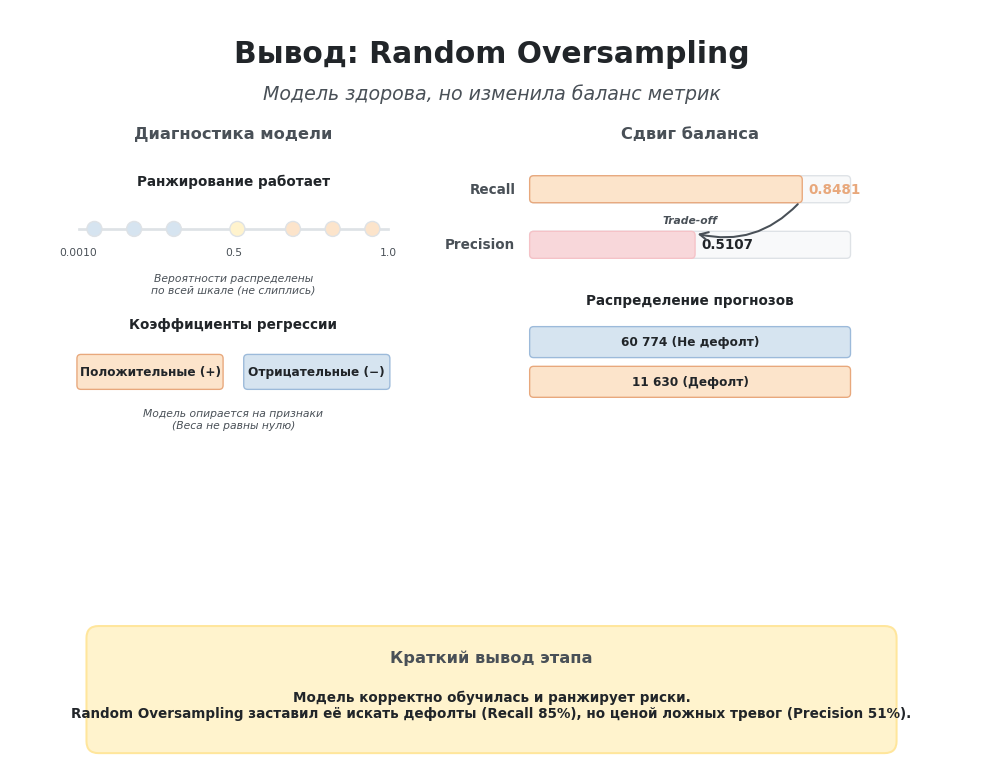

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.5, AXES_H) # Расширил вниз, чтобы блок вывода не налезал
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Вывод: Random Oversampling",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Модель здорова, но изменила баланс метрик",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Диагностика модели (Доказательства здоровья)
# ==========================================
ax.text(2.75, 6.5, "Диагностика модели", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- 1. Ранжирование вероятностей ---
ax.text(2.75, 5.9, "Ранжирование работает", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# Ось вероятностей
ax.plot([0.8, 4.7], [5.3, 5.3], color=GRAY_BORDER, linewidth=2*S)
ax.text(0.8, 5.0, "0.0010", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(2.75, 5.0, "0.5", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(4.7, 5.0, "1.0", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)

# Точки на шкале (широкий разброс)
prob_x = [1.0, 1.5, 2.0, 2.8, 3.5, 4.0, 4.5]
prob_y = [5.3, 5.3, 5.3, 5.3, 5.3, 5.3, 5.3]
prob_colors = [BLUE, BLUE, BLUE, AMBER, ORANGE, ORANGE, ORANGE]
ax.scatter(prob_x, prob_y, s=80*S, c=prob_colors, edgecolors=GRAY_BORDER, linewidths=1*S, zorder=3)
ax.text(2.75, 4.6, "Вероятности распределены\nпо всей шкале (не слиплись)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# --- 2. Веса признаков ---
ax.text(2.75, 4.1, "Коэффициенты регрессии", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# Положительные и отрицательные веса
ax.add_patch(FancyBboxPatch((0.8, 3.3), 1.8, 0.4, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=ORANGE, edgecolor=ORANGE_BORDER, linewidth=1*S))
ax.text(1.7, 3.5, "Положительные (+)", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

ax.add_patch(FancyBboxPatch((2.9, 3.3), 1.8, 0.4, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
ax.text(3.8, 3.5, "Отрицательные (−)", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

ax.text(2.75, 2.9, "Модель опирается на признаки\n(Веса не равны нулю)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ==========================================
# ПРАВАЯ ЧАСТЬ: Сдвиг баланса (Trade-off)
# ==========================================
ax.text(8.5, 6.5, "Сдвиг баланса", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

bar_x_start = 6.5
bar_max_w = 4.0
bar_h = 0.3

# Recall (Высокий - Оранжевый)
val_recall = 0.8481
ax.text(6.3, 5.8, "Recall", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 5.65), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 5.65), bar_max_w * val_recall, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE))
ax.text(bar_x_start + bar_max_w * val_recall + 0.1, 5.8, "0.8481", ha="left", va="center", fontsize=10*S, weight="bold", color=ORANGE_BORDER)

# Precision (Низкий - Красный)
val_prec = 0.5107
ax.text(6.3, 5.1, "Precision", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 4.95), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 4.95), bar_max_w * val_prec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=RED_BORDER, facecolor=RED_FILL))
ax.text(bar_x_start + bar_max_w * val_prec + 0.1, 5.1, "0.5107", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# Стрелка компромисса
ax.annotate("", xy=(bar_x_start + bar_max_w * val_prec, 5.25), xytext=(bar_x_start + bar_max_w * val_recall, 5.65),
            arrowprops=dict(arrowstyle="->", color=TEXT_MUTED, lw=1.5*S, connectionstyle="arc3,rad=-0.3"))
ax.text(8.5, 5.4, "Trade-off", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic", weight="bold")

# Распределение прогнозов (Pie chart logic)
ax.text(8.5, 4.4, "Распределение прогнозов", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# 60774 Не дефолт (Синий)
ax.add_patch(FancyBboxPatch((6.5, 3.7), 4.0, 0.35, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
ax.text(8.5, 3.875, "60 774 (Не дефолт)", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# 11630 Дефолт (Оранжевый)
ax.add_patch(FancyBboxPatch((6.5, 3.2), 4.0, 0.35, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=ORANGE, edgecolor=ORANGE_BORDER, linewidth=1*S))
ax.text(8.5, 3.375, "11 630 (Дефолт)", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)


# ---------- Итоговый блок (Вывод этапа) ----------
res_box = FancyBboxPatch(
    (1.0, -1.2), 10.0, 1.4,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, -0.1, "Краткий вывод этапа",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.7, "Модель корректно обучилась и ранжирует риски.\nRandom Oversampling заставил её искать дефолты (Recall 85%), но ценой ложных тревог (Precision 51%).",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

## 19.5 Применение метода SMOTE

После анализа результатов Random Oversampling переходим к исследованию метода **SMOTE (Synthetic Minority Over-sampling Technique)**.

В отличие от Random Oversampling, который увеличивает количество объектов меньшинства путём простого копирования существующих наблюдений, SMOTE генерирует новые синтетические объекты. Новые примеры создаются на основе ближайших соседей объектов миноритарного класса, что позволяет увеличить размер выборки без полного дублирования исходных данных.

Предполагается, что такой подход позволит модели лучше выявлять закономерности внутри миноритарного класса и снизит вероятность переобучения по сравнению с Random Oversampling.

Как и в предыдущем эксперименте, балансировка будет выполняться **только на обучающей выборке**, тогда как тестовая выборка останется неизменной. Это обеспечивает объективную оценку качества модели на данных, которые не участвовали в обучении.

In [ ]:
# ==========================================================
# Импорт метода SMOTE
# ==========================================================

# Импортируем алгоритм SMOTE из библиотеки imbalanced-learn.
# Данный метод создает новые синтетические объекты
# для миноритарного класса вместо простого копирования существующих.

from imblearn.over_sampling import SMOTE

In [ ]:
# ==========================================================
# Балансировка обучающей выборки методом SMOTE
# ==========================================================

# Создаем объект SMOTE.
# random_state фиксируем для воспроизводимости результатов.

smote = SMOTE(random_state=42)

# Выполняем балансировку только обучающей выборки.
# Тестовая выборка остается без изменений.

X_train_smote, y_train_smote = smote.fit_resample(
    X_train,
    y_train
)

In [ ]:
# ==========================================================
# Проверка распределения классов после SMOTE
# ==========================================================

# Проверяем, что после балансировки количество объектов
# каждого класса стало одинаковым.

class_distribution = y_train_smote.value_counts()

print(class_distribution)

print("\nДоля каждого класса:")

print(
    (
        class_distribution /
        class_distribution.sum()
    ).round(4)
)

DefMark
0    261599
1    261599
Name: count, dtype: int64

Доля каждого класса:
DefMark
0    0.5
1    0.5
Name: count, dtype: float64


### Анализ результатов балансировки методом SMOTE

После применения метода **SMOTE** обучающая выборка стала полностью сбалансированной. Количество объектов каждого класса составило **261 599**, что соответствует доле **50 %** для каждого класса.

Полученный результат подтверждает корректную работу алгоритма SMOTE. В отличие от **Random Oversampling**, который увеличивает миноритарный класс путём копирования существующих объектов, SMOTE создаёт новые синтетические наблюдения на основе ближайших соседей объектов класса дефолта.

Это позволяет увеличить представительство миноритарного класса без прямого дублирования исходных строк. Однако сам факт балансировки ещё не означает автоматического улучшения модели. Окончательный вывод можно сделать только после обучения логистической регрессии и сравнения метрик качества на неизменной тестовой выборке.

На следующем этапе модель будет обучена на выборке, сбалансированной методом SMOTE, после чего будут рассчитаны Accuracy, Precision, Recall, F1-score, ROC-AUC.


In [ ]:
# ==========================================================
# Обучение логистической регрессии после SMOTE
# ==========================================================

# Создаем модель логистической регрессии.
# max_iter увеличиваем до 1000 для гарантированной сходимости.

model_smote = LogisticRegression(
    random_state=42,
    max_iter=1000
)

# Обучаем модель на сбалансированной выборке,
# полученной методом SMOTE.

model_smote.fit(
    X_train_smote,
    y_train_smote
)

LogisticRegression(max_iter=1000, random_state=42)

In [ ]:
# ==========================================================
# Получение прогнозов модели
# ==========================================================

# Предсказываем классы для тестовой выборки.

y_pred_smote = model_smote.predict(X_test)

# Получаем вероятности принадлежности к положительному классу.
# Они понадобятся для вычисления ROC-AUC.

y_pred_proba_smote = model_smote.predict_proba(X_test)[:, 1]

In [ ]:
# ==========================================================
# Расчёт основных метрик качества модели
# ==========================================================

accuracy_smote = accuracy_score(y_test, y_pred_smote)
precision_smote = precision_score(y_test, y_pred_smote)
recall_smote = recall_score(y_test, y_pred_smote)
f1_smote = f1_score(y_test, y_pred_smote)
roc_auc_smote = roc_auc_score(y_test, y_pred_proba_smote)

print(f"Accuracy:  {accuracy_smote:.4f}")
print(f"Precision: {precision_smote:.4f}")
print(f"Recall:    {recall_smote:.4f}")
print(f"F1-score:  {f1_smote:.4f}")
print(f"ROC-AUC:   {roc_auc_smote:.4f}")

Accuracy:  0.9069
Precision: 0.5114
Recall:    0.8481
F1-score:  0.6380
ROC-AUC:   0.9481


### Анализ результатов после применения SMOTE

После применения метода **SMOTE** модель показала результаты, близкие к результатам, полученным при использовании метода **Random Oversampling**.

Значение **Accuracy** составило **90,69 %**. Accuracy — это доля всех объектов тестовой выборки, которые модель классифицировала правильно.

Значение **Precision** составило **0,5114**. Это означает, что среди организаций, которые модель отнесла к классу дефолта, **51,14 %** действительно являются дефолтными.

Значение **Recall** составило **0,8481**. Recall показывает, какую долю всех реальных дефолтов смогла обнаружить модель. Таким образом, модель выявила **84,81 %** организаций, действительно допустивших дефолт.

Значение **F1-score** составило **0,6380**. Эта метрика объединяет Precision и Recall в один показатель и отражает общий баланс между количеством найденных дефолтов и точностью положительных прогнозов.

Показатель **ROC-AUC** составил **0,9481**. Это свидетельствует о высокой способности модели ранжировать организации по уровню кредитного риска: дефолтные организации в большинстве случаев получают более высокую прогнозируемую вероятность дефолта, чем недефолтные.

Таким образом, применение SMOTE позволило существенно увеличить долю обнаруженных дефолтов. Одновременно модель стала чаще ошибочно относить надёжные организации к классу дефолта, что привело к снижению Precision по сравнению с базовой моделью.


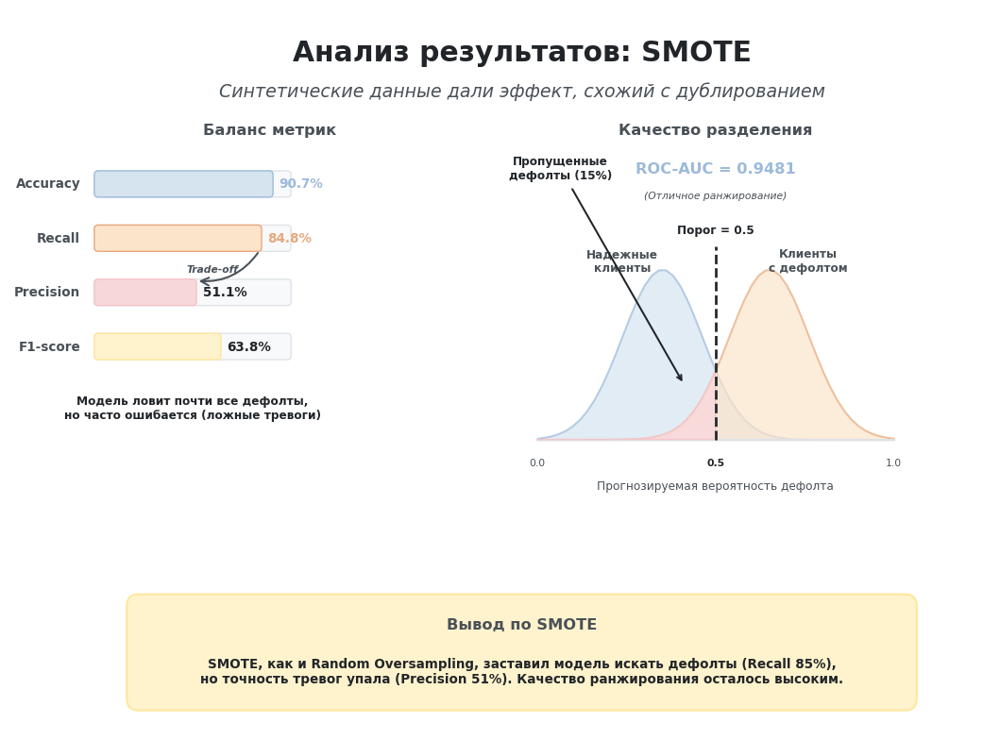

In [ ]:
# @title
import matplotlib.pyplot as plt
import math
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.2, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Анализ результатов: SMOTE",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Синтетические данные дали эффект, схожий с дублированием",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Баланс метрик (Trade-off)
# ==========================================
ax.text(2.75, 6.5, "Баланс метрик", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

bar_x_start = 0.5
bar_max_w = 2.5
bar_h = 0.3

# Accuracy (Высокий)
val_acc = 0.9069
ax.text(0.3, 5.8, "Accuracy", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 5.65), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 5.65), bar_max_w * val_acc, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=BLUE_BORDER, facecolor=BLUE))
ax.text(bar_x_start + bar_max_w * val_acc + 0.1, 5.8, "90.7%", ha="left", va="center", fontsize=10*S, weight="bold", color=BLUE_BORDER)

# Recall (Высокий - Оранжевый)
val_recall = 0.8481
ax.text(0.3, 5.1, "Recall", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 4.95), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 4.95), bar_max_w * val_recall, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE))
ax.text(bar_x_start + bar_max_w * val_recall + 0.1, 5.1, "84.8%", ha="left", va="center", fontsize=10*S, weight="bold", color=ORANGE_BORDER)

# Precision (Низкий - Красный)
val_prec = 0.5114
ax.text(0.3, 4.4, "Precision", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 4.25), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 4.25), bar_max_w * val_prec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=RED_BORDER, facecolor=RED_FILL))
ax.text(bar_x_start + bar_max_w * val_prec + 0.1, 4.4, "51.1%", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# Стрелка компромисса
ax.annotate("", xy=(bar_x_start + bar_max_w * val_prec, 4.55), xytext=(bar_x_start + bar_max_w * val_recall, 4.95),
            arrowprops=dict(arrowstyle="->", color=TEXT_MUTED, lw=1.5*S, connectionstyle="arc3,rad=-0.3"))
ax.text(2.0, 4.7, "Trade-off", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic", weight="bold")

# F1-score (Баланс)
val_f1 = 0.6380
ax.text(0.3, 3.7, "F1-score", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 3.55), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 3.55), bar_max_w * val_f1, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=AMBER_BORDER, facecolor=AMBER))
ax.text(bar_x_start + bar_max_w * val_f1 + 0.1, 3.7, "63.8%", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# Пояснение под полосками
ax.text(1.75, 2.9, "Модель ловит почти все дефолты,\nно часто ошибается (ложные тревоги)", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")


# ==========================================
# ПРАВАЯ ЧАСТЬ: Качество разделения (ROC-AUC)
# ==========================================
ax.text(8.5, 6.5, "Качество разделения", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Холмы вероятностей ---
plot_x_start = 6.2
plot_x_end = 10.8
plot_width = plot_x_end - plot_x_start

# Ось X
ax.plot([plot_x_start, plot_x_end], [2.5, 2.5], color=GRAY_BORDER, linewidth=1.5*S)
ax.text(plot_x_start, 2.2, "0.0", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(8.5, 2.2, "0.5", ha="center", va="center", fontsize=8*S, color=TEXT_DARK, weight="bold")
ax.text(plot_x_end, 2.2, "1.0", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(8.5, 1.9, "Прогнозируемая вероятность дефолта", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED)

# Функция генерации холмов
def get_curve_points(x_start, y_base, y_height, width, peak_x, num_points=50):
    xs = []
    ys = []
    for i in range(num_points + 1):
        t = i / num_points
        x = x_start + t * width
        dist = (t - peak_x) ** 2
        y = y_base + y_height * math.exp(-dist / 0.025)
        xs.append(x)
        ys.append(y)
    return xs, ys

# Холм 1: Не дефолт (Сдвинут левее)
non_def_x, non_def_y = get_curve_points(plot_x_start, 2.5, 2.2, plot_width, 0.35)
ax.fill_between(non_def_x, 2.5, non_def_y, color=BLUE, alpha=0.7, edgecolor=BLUE_BORDER, linewidth=1.5*S)
ax.text(7.3, 4.8, "Надежные\nклиенты", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, weight="bold")

# Холм 2: Дефолт (Сдвинут правее - разделение есть!)
def_x, def_y = get_curve_points(plot_x_start, 2.5, 2.2, plot_width, 0.65)
ax.fill_between(def_x, 2.5, def_y, color=ORANGE, alpha=0.7, edgecolor=ORANGE_BORDER, linewidth=1.5*S)
ax.text(9.7, 4.8, "Клиенты\nс дефолтом", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, weight="bold")

# Линия порога (0.5)
threshold_x = 8.5
ax.plot([threshold_x, threshold_x], [2.5, 5.0], color=TEXT_DARK, linestyle="--", linewidth=2*S, zorder=4)
ax.text(8.5, 5.2, "Порог = 0.5", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")

# Зона пропущенных дефолтов (False Negatives)
fn_xs = []
fn_ys = []
for x, y in zip(def_x, def_y):
    if x <= threshold_x:
        fn_xs.append(x)
        fn_ys.append(y)
fn_xs.append(threshold_x)
fn_ys.append(2.5)
fn_xs.append(fn_xs[0])
fn_ys.append(2.5)

ax.fill(fn_xs, fn_ys, color=RED_FILL, alpha=0.8, edgecolor=RED_BORDER, linewidth=1*S, zorder=3)
ax.annotate("Пропущенные\nдефолты (15%)",
            xy=(8.1, 3.2), xytext=(6.5, 6.0),
            ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold",
            arrowprops=dict(arrowstyle="->", color=TEXT_DARK, lw=1.5*S))

# Метрика ROC-AUC
ax.text(8.5, 6.0, "ROC-AUC = 0.9481", ha="center", va="center", fontsize=12*S, weight="bold", color=BLUE_BORDER)
ax.text(8.5, 5.65, "(Отличное ранжирование)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -0.9), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.1, "Вывод по SMOTE",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.5, "SMOTE, как и Random Oversampling, заставил модель искать дефолты (Recall 85%),\nно точность тревог упала (Precision 51%). Качество ранжирования осталось высоким.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

### Вывод по результатам применения метода SMOTE

Метод **SMOTE** позволил полностью сбалансировать обучающую выборку за счёт создания синтетических объектов миноритарного класса — организаций, допустивших дефолт.

Модель логистической регрессии, обученная на сбалансированной выборке, достигла **Accuracy 90,69 %**, **Precision 51,14 %**, **Recall 84,81 %**, **F1-score 0,6380** и **ROC-AUC 0,9481**.

Главным результатом применения SMOTE стало увеличение Recall. Модель обнаруживает **84,81 % всех реальных дефолтов**, то есть пропускает значительно меньшую долю рискованных организаций.

При этом Precision составил **51,14 %**. Это означает, что примерно половина организаций, отнесённых моделью к классу дефолта, действительно являются дефолтными, тогда как остальные представляют собой ложноположительные прогнозы.

Высокое значение ROC-AUC показывает, что модель сохраняет хорошую способность разделять организации по уровню кредитного риска. Следовательно, снижение Accuracy и Precision связано не с ухудшением способности модели различать классы, а с изменением порога принятия решений после балансировки: модель стала чаще относить организации к рискованному классу.

Результаты SMOTE оказались очень близки к результатам Random Oversampling. Оба метода повысили полноту выявления дефолтов, но одновременно увеличили количество ложноположительных прогнозов. Окончательная оценка эффективности SMOTE будет выполнена после сравнения со всеми исследуемыми методами балансировки.


## 19.6 Применение метода ADASYN

Следующим этапом исследования является применение метода **ADASYN (Adaptive Synthetic Sampling)**.

В отличие от SMOTE, который равномерно генерирует синтетические объекты для всего миноритарного класса, ADASYN использует адаптивный подход. Алгоритм анализирует распределение объектов и создаёт больше новых наблюдений именно в тех областях пространства признаков, где классификация оказывается наиболее сложной.

Предполагается, что такой подход позволит модели уделить больше внимания наиболее проблемным объектам миноритарного класса и повысить качество их распознавания.

Как и в предыдущих экспериментах, балансировка выполняется только на обучающей выборке, а тестовая выборка остается неизменной. Это обеспечивает корректное сравнение результатов различных методов балансировки.

In [ ]:
# ==========================================================
# Импорт метода ADASYN
# ==========================================================

# Импортируем алгоритм ADASYN из библиотеки imbalanced-learn.
# Данный метод создает синтетические объекты,
# уделяя больше внимания наиболее сложным для классификации
# наблюдениям миноритарного класса.

from imblearn.over_sampling import ADASYN

In [ ]:
# ==========================================================
# Балансировка обучающей выборки методом ADASYN
# ==========================================================

# Создаем объект ADASYN.
# random_state фиксируем для воспроизводимости эксперимента.

adasyn = ADASYN(random_state=42)

# Выполняем балансировку только обучающей выборки.

X_train_adasyn, y_train_adasyn = adasyn.fit_resample(
    X_train,
    y_train
)

In [ ]:
# ==========================================================
# Проверка распределения классов после ADASYN
# ==========================================================

# Проверяем распределение классов после балансировки.

class_distribution = y_train_adasyn.value_counts()

print(class_distribution)

print("\nДоля каждого класса:")

print(
    (
        class_distribution /
        class_distribution.sum()
    ).round(4)
)

DefMark
1    263174
0    261599
Name: count, dtype: int64

Доля каждого класса:
DefMark
1    0.5015
0    0.4985
Name: count, dtype: float64


### Анализ результатов балансировки методом ADASYN

После применения метода **ADASYN** распределение классов в обучающей выборке стало практически сбалансированным.

Количество объектов класса 0 — организаций без дефолта — составило **261 599**, а количество объектов класса 1 — организаций с дефолтом — **263 174**. Доли классов составили соответственно **49,85 %** и **50,15 %**.

Небольшое превышение количества объектов миноритарного класса является допустимым результатом работы ADASYN. В отличие от Random Oversampling и SMOTE, данный алгоритм адаптивно определяет количество синтетических наблюдений для разных областей пространства признаков.

ADASYN создаёт больше новых объектов рядом с теми наблюдениями миноритарного класса, которые находятся в сложных для классификации областях. Поэтому итоговое количество объектов может не совпадать точно с количеством объектов мажоритарного класса.

Полученный результат подтверждает корректную работу алгоритма. Обучающая выборка стала практически сбалансированной, тогда как тестовая выборка осталась без изменений.

На следующем этапе логистическая регрессия будет обучена на выборке, сбалансированной методом ADASYN, после чего качество модели будет оценено на неизменной тестовой выборке.


In [ ]:
# ==========================================================
# Обучение логистической регрессии после ADASYN
# ==========================================================

# Создаем модель логистической регрессии.
# max_iter увеличиваем до 1000 для гарантированной сходимости.

model_adasyn = LogisticRegression(
    random_state=42,
    max_iter=1000
)

# Обучаем модель на обучающей выборке,
# сбалансированной методом ADASYN.

model_adasyn.fit(
    X_train_adasyn,
    y_train_adasyn
)

LogisticRegression(max_iter=1000, random_state=42)

In [ ]:
# ==========================================================
# Получение прогнозов модели после ADASYN
# ==========================================================

# Получаем предсказанные классы
# для объектов тестовой выборки.

y_pred_adasyn = model_adasyn.predict(X_test)

# Получаем вероятность принадлежности
# к положительному классу.

y_pred_proba_adasyn = model_adasyn.predict_proba(X_test)[:, 1]

print("Прогнозы успешно получены.")

Прогнозы успешно получены.


In [ ]:
# ==========================================================
# Расчёт основных метрик качества модели
# ==========================================================

accuracy_adasyn = accuracy_score(y_test, y_pred_adasyn)
precision_adasyn = precision_score(y_test, y_pred_adasyn)
recall_adasyn = recall_score(y_test, y_pred_adasyn)
f1_adasyn = f1_score(y_test, y_pred_adasyn)
roc_auc_adasyn = roc_auc_score(y_test, y_pred_proba_adasyn)

print(f"Accuracy:  {accuracy_adasyn:.4f}")
print(f"Precision: {precision_adasyn:.4f}")
print(f"Recall:    {recall_adasyn:.4f}")
print(f"F1-score:  {f1_adasyn:.4f}")
print(f"ROC-AUC:   {roc_auc_adasyn:.4f}")

Accuracy:  0.8318
Precision: 0.3554
Recall:    0.9082
F1-score:  0.5109
ROC-AUC:   0.9474


### Анализ результатов применения метода ADASYN

После применения метода **ADASYN** модель показала результаты, сопоставимые с результатами, полученными после использования методов **Random Oversampling** и **SMOTE**.

Значение **Accuracy** составило **83,18 %**. Accuracy показывает долю объектов тестовой выборки, которые были классифицированы правильно.

Значение **Precision** составило **0,3554**. Это означает, что среди организаций, которые модель отнесла к классу дефолта, **35,54 %** действительно являются дефолтными.

Значение **Recall** составило **0,9082**. Recall показывает, какую долю всех реальных дефолтов смогла обнаружить модель. Таким образом, модель выявила **90,82 %** организаций, действительно допустивших дефолт.

Значение **F1-score** составило **0,5109**. Эта метрика объединяет Precision и Recall в один показатель и отражает баланс между полнотой выявления дефолтов и точностью положительных прогнозов.

Показатель **ROC-AUC** составил **0,9474**, что свидетельствует о высокой способности модели ранжировать организации по уровню кредитного риска независимо от выбранного порога классификации.

Таким образом, применение метода ADASYN позволило добиться самого высокого значения Recall среди рассмотренных методов балансировки, однако это сопровождалось наиболее заметным снижением Precision. Иными словами, модель стала обнаруживать больше организаций, допустивших дефолт, но одновременно чаще ошибочно относить к этому классу надёжные организации.


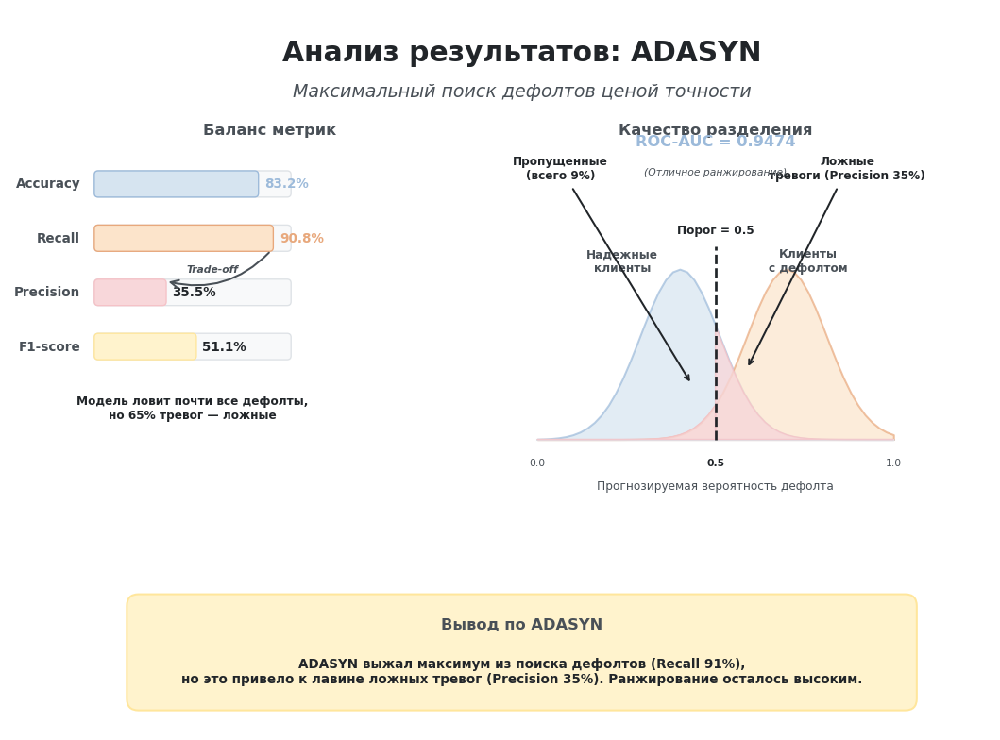

In [ ]:
# @title
import matplotlib.pyplot as plt
import math
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.2, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Анализ результатов: ADASYN",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Максимальный поиск дефолтов ценой точности",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Баланс метрик (Trade-off)
# ==========================================
ax.text(2.75, 6.5, "Баланс метрик", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

bar_x_start = 0.5
bar_max_w = 2.5
bar_h = 0.3

# Accuracy (Средний)
val_acc = 0.8318
ax.text(0.3, 5.8, "Accuracy", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 5.65), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 5.65), bar_max_w * val_acc, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=BLUE_BORDER, facecolor=BLUE))
ax.text(bar_x_start + bar_max_w * val_acc + 0.1, 5.8, "83.2%", ha="left", va="center", fontsize=10*S, weight="bold", color=BLUE_BORDER)

# Recall (Очень высокий - Оранжевый)
val_recall = 0.9082
ax.text(0.3, 5.1, "Recall", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 4.95), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 4.95), bar_max_w * val_recall, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE))
ax.text(bar_x_start + bar_max_w * val_recall + 0.1, 5.1, "90.8%", ha="left", va="center", fontsize=10*S, weight="bold", color=ORANGE_BORDER)

# Precision (Очень низкий - Красный)
val_prec = 0.3554
ax.text(0.3, 4.4, "Precision", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 4.25), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 4.25), bar_max_w * val_prec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=RED_BORDER, facecolor=RED_FILL))
ax.text(bar_x_start + bar_max_w * val_prec + 0.1, 4.4, "35.5%", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# Стрелка компромисса (Стала еще длиннее)
ax.annotate("", xy=(bar_x_start + bar_max_w * val_prec, 4.55), xytext=(bar_x_start + bar_max_w * val_recall, 4.95),
            arrowprops=dict(arrowstyle="->", color=TEXT_MUTED, lw=1.5*S, connectionstyle="arc3,rad=-0.3"))
ax.text(2.0, 4.7, "Trade-off", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic", weight="bold")

# F1-score (Низкий)
val_f1 = 0.5109
ax.text(0.3, 3.7, "F1-score", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 3.55), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 3.55), bar_max_w * val_f1, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=AMBER_BORDER, facecolor=AMBER))
ax.text(bar_x_start + bar_max_w * val_f1 + 0.1, 3.7, "51.1%", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# Пояснение под полосками
ax.text(1.75, 2.9, "Модель ловит почти все дефолты,\nно 65% тревог — ложные", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")


# ==========================================
# ПРАВАЯ ЧАСТЬ: Качество разделения (ROC-AUC)
# ==========================================
ax.text(8.5, 6.5, "Качество разделения", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Холмы вероятностей ---
plot_x_start = 6.2
plot_x_end = 10.8
plot_width = plot_x_end - plot_x_start

# Ось X
ax.plot([plot_x_start, plot_x_end], [2.5, 2.5], color=GRAY_BORDER, linewidth=1.5*S)
ax.text(plot_x_start, 2.2, "0.0", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(8.5, 2.2, "0.5", ha="center", va="center", fontsize=8*S, color=TEXT_DARK, weight="bold")
ax.text(plot_x_end, 2.2, "1.0", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(8.5, 1.9, "Прогнозируемая вероятность дефолта", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED)

# Функция генерации холмов (сделали шире - знаменатель 0.025)
def get_curve_points(x_start, y_base, y_height, width, peak_x, num_points=50):
    xs = []
    ys = []
    for i in range(num_points + 1):
        t = i / num_points
        x = x_start + t * width
        dist = (t - peak_x) ** 2
        y = y_base + y_height * math.exp(-dist / 0.025)
        xs.append(x)
        ys.append(y)
    return xs, ys

# Холм 1: Не дефолт (Сдвинут правее - 0.40, чтобы много ложных тревог залезло за 0.5)
non_def_x, non_def_y = get_curve_points(plot_x_start, 2.5, 2.2, plot_width, 0.40)
ax.fill_between(non_def_x, 2.5, non_def_y, color=BLUE, alpha=0.7, edgecolor=BLUE_BORDER, linewidth=1.5*S)
ax.text(7.3, 4.8, "Надежные\nклиенты", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, weight="bold")

# Холм 2: Дефолт (Сдвинут левее - 0.70)
def_x, def_y = get_curve_points(plot_x_start, 2.5, 2.2, plot_width, 0.70)
ax.fill_between(def_x, 2.5, def_y, color=ORANGE, alpha=0.7, edgecolor=ORANGE_BORDER, linewidth=1.5*S)
ax.text(9.7, 4.8, "Клиенты\nс дефолтом", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, weight="bold")

# Линия порога (0.5)
threshold_x = 8.5
ax.plot([threshold_x, threshold_x], [2.5, 5.0], color=TEXT_DARK, linestyle="--", linewidth=2*S, zorder=4)
ax.text(8.5, 5.2, "Порог = 0.5", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")

# --- Зона ложных тревог (False Positives - Синий холм правее порога) ---
fp_xs = []
fp_ys = []
for x, y in zip(non_def_x, non_def_y):
    if x >= threshold_x:
        fp_xs.append(x)
        fp_ys.append(y)
fp_xs.append(threshold_x)
fp_ys.append(2.5)
fp_xs.append(fp_xs[0])
fp_ys.append(2.5)

ax.fill(fp_xs, fp_ys, color=RED_FILL, alpha=0.8, edgecolor=RED_BORDER, linewidth=1*S, zorder=3)
ax.annotate("Ложные\nтревоги (Precision 35%)",
            xy=(8.9, 3.4), xytext=(10.2, 6.0),
            ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold",
            arrowprops=dict(arrowstyle="->", color=TEXT_DARK, lw=1.5*S))

# --- Зона пропущенных дефолтов (False Negatives - Оранжевый холм левее порога) ---
fn_xs = []
fn_ys = []
for x, y in zip(def_x, def_y):
    if x <= threshold_x:
        fn_xs.append(x)
        fn_ys.append(y)
fn_xs.append(threshold_x)
fn_ys.append(2.5)
fn_xs.append(fn_xs[0])
fn_ys.append(2.5)

ax.fill(fn_xs, fn_ys, color=RED_FILL, alpha=0.8, edgecolor=RED_BORDER, linewidth=1*S, zorder=3)
ax.annotate("Пропущенные\n(всего 9%)",
            xy=(8.2, 3.2), xytext=(6.5, 6.0),
            ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold",
            arrowprops=dict(arrowstyle="->", color=TEXT_DARK, lw=1.5*S))

# Метрика ROC-AUC
ax.text(8.5, 6.35, "ROC-AUC = 0.9474", ha="center", va="center", fontsize=12*S, weight="bold", color=BLUE_BORDER)
ax.text(8.5, 5.95, "(Отличное ранжирование)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -0.9), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.1, "Вывод по ADASYN",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.5, "ADASYN выжал максимум из поиска дефолтов (Recall 91%),\nно это привело к лавине ложных тревог (Precision 35%). Ранжирование осталось высоким.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

### Вывод по результатам применения метода ADASYN

Метод **ADASYN** позволил сформировать практически сбалансированную обучающую выборку, при этом синтетические объекты создавались преимущественно в наиболее сложных для классификации областях пространства признаков.

Модель логистической регрессии, обученная после применения ADASYN, достигла **Accuracy 83,18 %**, **Precision 35,54 %**, **Recall 90,82 %**, **F1-score 0,5109** и **ROC-AUC 0,9474**.

Главным результатом применения ADASYN стало дальнейшее увеличение Recall. Модель обнаруживает более **90 %** всех реальных случаев дефолта, что означает минимальное количество пропущенных рискованных организаций среди рассмотренных методов балансировки.

Однако рост Recall сопровождался заметным снижением Precision. Это означает, что вместе с увеличением числа обнаруженных дефолтов существенно возросло количество ложноположительных прогнозов, вследствие чего значительная часть организаций, признанных моделью дефолтными, в действительности таковыми не является.

Высокое значение ROC-AUC показывает, что модель по-прежнему хорошо ранжирует организации по уровню кредитного риска. Следовательно, изменение метрик связано не с потерей способности различать классы, а с тем, что после балансировки модель стала значительно чаще относить организации к классу дефолта.

По сравнению с Random Oversampling и SMOTE метод ADASYN обеспечил наиболее высокое значение Recall, однако именно это сопровождалось наиболее существенным снижением Precision и Accuracy. Окончательная оценка эффективности метода будет выполнена после сравнения результатов со всеми рассмотренными способами балансировки.


# Глава 20. Промежуточные выводы по методам увеличения выборки

На данном этапе исследования были рассмотрены три наиболее распространённых метода увеличения выборки (**Oversampling**):

* Random Oversampling;
* SMOTE;
* ADASYN.

Каждый метод применялся исключительно к обучающей выборке. После балансировки обучалась одна и та же модель логистической регрессии, а её качество оценивалось на неизменной тестовой выборке. Такой подход обеспечил корректное сравнение эффективности различных методов балансировки данных.

## Ожидаемые результаты

Перед началом экспериментов предполагалось, что устранение дисбаланса классов позволит повысить способность модели обнаруживать организации, допустившие дефолт, без существенного ухудшения остальных показателей качества.

Особый интерес представляли методы **SMOTE** и **ADASYN**, поскольку они создают новые синтетические наблюдения вместо простого копирования существующих объектов миноритарного класса. Предполагалось, что использование более сложных алгоритмов генерации данных позволит сформировать более качественную обучающую выборку и повысить эффективность классификации.

## Полученные результаты

Все три рассмотренных метода привели к увеличению способности модели обнаруживать организации, допустившие дефолт. Во всех экспериментах существенно выросла метрика **Recall**, что свидетельствует о значительном сокращении количества пропущенных дефолтов.

Наиболее близкие результаты продемонстрировали методы **Random Oversampling** и **SMOTE**. Несмотря на различный принцип формирования обучающей выборки, значения основных метрик качества оказались практически одинаковыми.

Метод **ADASYN** показал несколько иное поведение. Он обеспечил наиболее высокое значение **Recall (90,82 %)**, благодаря чему модель стала обнаруживать больше реальных случаев дефолта. Однако это сопровождалось заметным снижением **Precision (35,54 %)** и **Accuracy (83,18 %)**, что указывает на существенный рост количества ложноположительных прогнозов.

При этом во всех трёх экспериментах значение **ROC-AUC** оставалось высоким (около **0,95**). Это свидетельствует о том, что независимо от выбранного метода балансировки модель сохраняет хорошую способность разделять организации по уровню кредитного риска.

## Промежуточные выводы

Проведённые эксперименты показали, что все рассмотренные методы увеличения выборки позволяют существенно повысить полноту выявления организаций, допустивших дефолт.

Вместе с тем увеличение **Recall** сопровождается снижением **Precision**, поскольку модель начинает чаще относить к классу дефолта организации, которые в действительности являются надёжными.

Методы **Random Oversampling** и **SMOTE** продемонстрировали практически одинаковые результаты, тогда как **ADASYN** обеспечил максимальную полноту обнаружения дефолтов ценой наиболее заметного увеличения числа ложноположительных прогнозов.

Таким образом, выбор конкретного метода увеличения выборки представляет собой компромисс между полнотой обнаружения дефолтов и точностью положительных прогнозов. На данном этапе исследования нельзя утверждать, что какой-либо из рассмотренных методов является безусловно лучшим, поскольку их эффективность зависит от того, какая из ошибок классификации считается более критичной в рассматриваемой прикладной задаче.

## Следующий этап исследования

Следующим этапом исследования станет анализ методов уменьшения выборки (**Undersampling**).

В отличие от рассмотренных методов увеличения выборки, данные алгоритмы уменьшают количество объектов мажоритарного класса вместо генерации новых наблюдений. Такой подход позволяет проверить, сохранится ли выявленный компромисс между полнотой обнаружения дефолтов и точностью положительных прогнозов при использовании принципиально иной стратегии балансировки данных.

Результаты методов уменьшения выборки будут сопоставлены с рассмотренными алгоритмами Oversampling, после чего будет выполнено итоговое сравнение всех исследованных способов устранения дисбаланса классов.


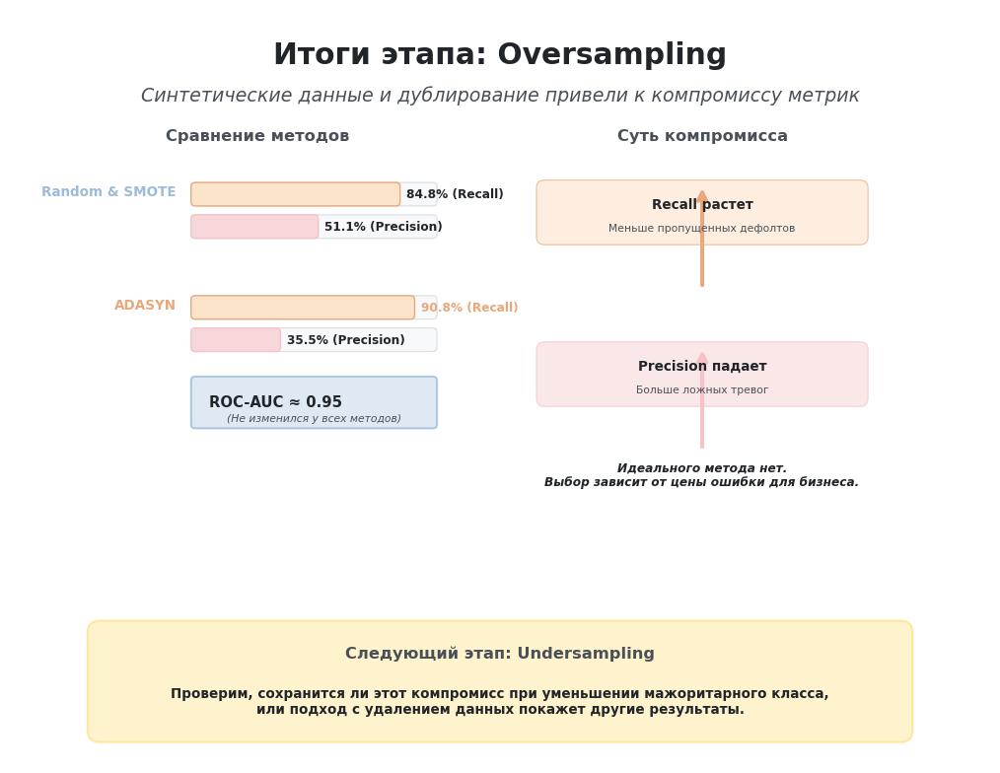

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.2, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Итоги этапа: Oversampling",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Синтетические данные и дублирование привели к компромиссу метрик",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Сравнение методов (Метрики)
# ==========================================
ax.text(3.0, 6.5, "Сравнение методов", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

bar_x_start = 2.2
bar_max_w = 3.0
bar_h = 0.25

# --- Группа 1: Random Oversampling & SMOTE ---
ax.text(2.0, 5.8, "Random & SMOTE", ha="right", va="center", fontsize=10*S, weight="bold", color=BLUE_BORDER)

# Recall (84.8%)
ax.add_patch(FancyBboxPatch((bar_x_start, 5.65), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 5.65), bar_max_w * 0.848, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE))
ax.text(bar_x_start + bar_max_w * 0.848 + 0.1, 5.77, "84.8% (Recall)", ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# Precision (51.1%)
ax.add_patch(FancyBboxPatch((bar_x_start, 5.25), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 5.25), bar_max_w * 0.511, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=RED_BORDER, facecolor=RED_FILL))
ax.text(bar_x_start + bar_max_w * 0.511 + 0.1, 5.37, "51.1% (Precision)", ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# --- Группа 2: ADASYN ---
ax.text(2.0, 4.4, "ADASYN", ha="right", va="center", fontsize=10*S, weight="bold", color=ORANGE_BORDER)

# Recall (90.8%) - Вырос
ax.add_patch(FancyBboxPatch((bar_x_start, 4.25), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 4.25), bar_max_w * 0.908, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE))
ax.text(bar_x_start + bar_max_w * 0.908 + 0.1, 4.37, "90.8% (Recall)", ha="left", va="center", fontsize=9*S, weight="bold", color=ORANGE_BORDER)

# Precision (35.5%) - Упал
ax.add_patch(FancyBboxPatch((bar_x_start, 3.85), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 3.85), bar_max_w * 0.355, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=RED_BORDER, facecolor=RED_FILL))
ax.text(bar_x_start + bar_max_w * 0.355 + 0.1, 3.97, "35.5% (Precision)", ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# --- Общий показатель: ROC-AUC ---
ax.add_patch(FancyBboxPatch(
    (bar_x_start, 2.9), bar_max_w, 0.6,
    boxstyle="round,pad=0.02,rounding_size=0.05",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.8
))
ax.text(bar_x_start + 0.2, 3.2, "ROC-AUC ≈ 0.95", ha="left", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(bar_x_start + bar_max_w/2, 3.0, "(Не изменился у всех методов)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ==========================================
# ПРАВАЯ ЧАСТЬ: Суть компромисса
# ==========================================
ax.text(8.5, 6.5, "Суть компромисса", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Стрелка Recall (Вверх)
ax.annotate("", xy=(8.5, 5.9), xytext=(8.5, 4.6),
            arrowprops=dict(arrowstyle="->", color=ORANGE_BORDER, lw=3*S))
ax.add_patch(FancyBboxPatch((6.5, 5.2), 4.0, 0.7, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE, alpha=0.6))
ax.text(8.5, 5.65, "Recall растет", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(8.5, 5.35, "Меньше пропущенных дефолтов", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)

# Стрелка Precision (Вниз)
ax.annotate("", xy=(8.5, 3.9), xytext=(8.5, 2.6),
            arrowprops=dict(arrowstyle="->", color=RED_BORDER, lw=3*S))
ax.add_patch(FancyBboxPatch((6.5, 3.2), 4.0, 0.7, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1*S, edgecolor=RED_BORDER, facecolor=RED_FILL, alpha=0.6))
ax.text(8.5, 3.65, "Precision падает", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(8.5, 3.35, "Больше ложных тревог", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)

# Вывод по компромиссу
ax.text(8.5, 2.3, "Идеального метода нет.\nВыбор зависит от цены ошибки для бизнеса.", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold", style="italic")


# ---------- Итоговый блок (Мостик) ----------
res_box = FancyBboxPatch(
    (1.0, -0.9), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.1, "Следующий этап: Undersampling",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.5, "Проверим, сохранится ли этот компромисс при уменьшении мажоритарного класса,\nили подход с удалением данных покажет другие результаты.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

# Глава 21. Исследование методов уменьшения выборки (Undersampling)

## Что мы будем проверять?

В предыдущей главе были подробно исследованы методы увеличения выборки (**Oversampling**). Проведённые эксперименты показали, что устранение дисбаланса классов действительно влияет на поведение модели логистической регрессии.

Несмотря на различия в принципах работы рассмотренных алгоритмов, все методы увеличения выборки позволили существенно повысить способность модели обнаруживать организации, допустившие дефолт. При этом между ними проявились различия в соотношении основных метрик качества. В частности, метод **ADASYN** обеспечил наибольшее значение **Recall**, однако это сопровождалось наиболее заметным снижением **Precision**.

Полученные результаты показывают, что выбор метода балансировки оказывает влияние на компромисс между полнотой обнаружения дефолтов и количеством ложноположительных прогнозов.

Следующим этапом исследования является проверка принципиально иного подхода к устранению дисбаланса классов.

Вместо увеличения количества объектов миноритарного класса будут рассмотрены методы **уменьшения выборки (Undersampling)**. Их основная идея заключается не в создании новых наблюдений, а в сокращении количества объектов мажоритарного класса до более сбалансированного соотношения.

Таким образом, если методы Oversampling устраняли дисбаланс путём добавления новых объектов, то методы Undersampling решают ту же задачу за счёт удаления части существующих наблюдений.

## Почему это важно?

Использование методов Undersampling позволяет проверить, насколько способ балансировки данных влияет на качество модели.

Если после уменьшения выборки модель продемонстрирует результаты, существенно отличающиеся от результатов методов Oversampling, это будет свидетельствовать о том, что выбор стратегии балансировки оказывает заметное влияние на качество классификации.

Если же показатели окажутся близкими, можно будет сделать вывод, что для рассматриваемого набора данных более важную роль играют особенности самой модели и структуры данных, чем конкретный способ балансировки классов.

Таким образом, сравнение методов Oversampling и Undersampling позволит оценить, какой подход является более эффективным для решения задачи кредитного скоринга.

## Что мы ожидаем увидеть?

До проведения экспериментов невозможно заранее определить, какой подход окажется более эффективным.

Можно рассмотреть два основных сценария.

* Если методы Undersampling позволят сохранить высокое значение **Recall** при одновременном увеличении **Precision**, это будет означать, что уменьшение выборки обеспечивает более удачный компромисс между обнаружением дефолтов и количеством ложноположительных прогнозов.

* Если результаты окажутся близкими к тем, которые были получены при использовании методов Oversampling, это будет свидетельствовать о том, что различные способы балансировки приводят к схожему поведению модели на рассматриваемом наборе данных.

Независимо от полученного результата сравнение двух принципиально различных подходов к балансировке позволит сделать более обоснованные выводы об их эффективности и определить наиболее подходящую стратегию подготовки данных для построения моделей кредитного скоринга.


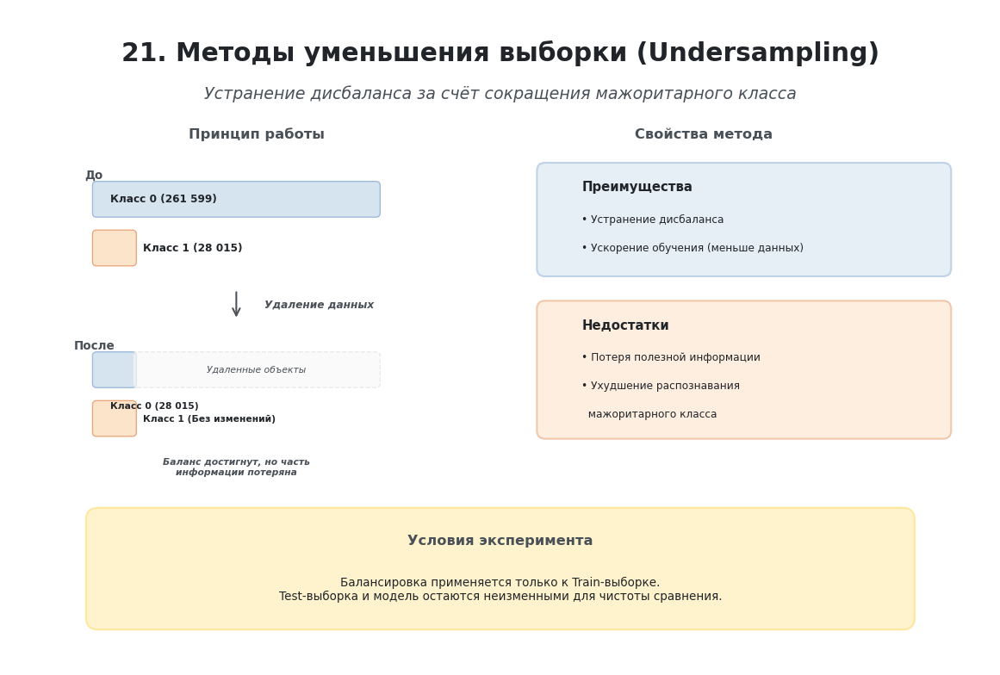

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "21. Методы уменьшения выборки (Undersampling)",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Устранение дисбаланса за счёт сокращения мажоритарного класса",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Механика метода (До и После)
# ==========================================
ax.text(3.0, 6.5, "Принцип работы", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- ДО ---
ax.text(1.0, 6.0, "До", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)

# Класс 0 (Мажоритарный)
ax.add_patch(FancyBboxPatch((1.0, 5.5), 3.5, 0.4, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
ax.text(1.2, 5.7, "Класс 0 (261 599)", ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# Класс 1 (Миноритарный)
ax.add_patch(FancyBboxPatch((1.0, 4.9), 0.5, 0.4, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=ORANGE, edgecolor=ORANGE_BORDER, linewidth=1*S))
ax.text(1.6, 5.1, "Класс 1 (28 015)", ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# Стрелка процесса
ax.annotate("", xy=(2.75, 4.2), xytext=(2.75, 4.6),
            arrowprops=dict(arrowstyle="->", color=TEXT_MUTED, lw=1.5*S))
ax.text(3.1, 4.4, "Удаление данных", ha="left", va="center", fontsize=9*S, color=TEXT_MUTED, weight="bold", style="italic")

# --- ПОСЛЕ ---
ax.text(1.0, 3.9, "После", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)

# Класс 0 (Уменьшен - сплошная заливка)
ax.add_patch(FancyBboxPatch((1.0, 3.4), 0.5, 0.4, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))

# Удаленная часть Класса 0 (Бледно-серая, пунктирная)
ax.add_patch(FancyBboxPatch((1.5, 3.4), 3.0, 0.4, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=GRAY, edgecolor=GRAY_BORDER, linewidth=1*S, linestyle="--", alpha=0.7))
ax.text(3.0, 3.6, "Удаленные объекты", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

ax.text(1.2, 3.15, "Класс 0 (28 015)", ha="left", va="center", fontsize=8*S, weight="bold", color=TEXT_DARK)

# Класс 1 (Без изменений)
ax.add_patch(FancyBboxPatch((1.0, 2.8), 0.5, 0.4, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=ORANGE, edgecolor=ORANGE_BORDER, linewidth=1*S))
ax.text(1.6, 3.0, "Класс 1 (Без изменений)", ha="left", va="center", fontsize=8*S, weight="bold", color=TEXT_DARK)

# Заметка о потере информации
ax.text(2.75, 2.4, "Баланс достигнут, но часть\nинформации потеряна", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, weight="bold", style="italic")


# ==========================================
# ПРАВАЯ ЧАСТЬ: Плюсы и Минусы
# ==========================================
ax.text(8.5, 6.5, "Свойства метода", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Преимущества ---
ax.add_patch(FancyBboxPatch(
    (6.5, 4.8), 5.0, 1.3,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.6
))
ax.text(7.0, 5.85, "Преимущества", ha="left", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(7.0, 5.45, "• Устранение дисбаланса", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(7.0, 5.1, "• Ускорение обучения (меньше данных)", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)

# --- Недостатки ---
ax.add_patch(FancyBboxPatch(
    (6.5, 2.8), 5.0, 1.6,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE, alpha=0.6
))
ax.text(7.0, 4.15, "Недостатки", ha="left", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(7.0, 3.75, "• Потеря полезной информации", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(7.0, 3.4, "• Ухудшение распознавания", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(7.0, 3.05, "  мажоритарного класса", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)


# ---------- Итоговый блок (Методология) ----------
res_box = FancyBboxPatch(
    (1.0, 0.5), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 1.5, "Условия эксперимента",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, 0.9, "Балансировка применяется только к Train-выборке.\nTest-выборка и модель остаются неизменными для чистоты сравнения.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK
)

plt.tight_layout()
plt.show()

## 21.1 Метод Random Undersampling

Первым рассматриваемым методом уменьшения выборки является **Random Undersampling**.

Данный алгоритм случайным образом удаляет объекты мажоритарного класса до достижения заданного соотношения классов. Благодаря простоте реализации этот метод часто используется в качестве базового подхода при работе с несбалансированными данными.

Основным преимуществом Random Undersampling является быстрое устранение дисбаланса классов без генерации искусственных данных. Однако случайное удаление наблюдений может привести к потере полезной информации, что потенциально способно снизить качество модели.

Цель данного эксперимента — определить, позволит ли уменьшение количества объектов мажоритарного класса улучшить качество логистической регрессии по сравнению с методами увеличения выборки.

In [ ]:
# ==========================================================
# Импорт метода Random Undersampling
# ==========================================================

# Импортируем алгоритм случайного уменьшения выборки.
# Он случайным образом удаляет объекты мажоритарного класса,
# формируя сбалансированную обучающую выборку.

from imblearn.under_sampling import RandomUnderSampler

In [ ]:
# ==========================================================
# Балансировка обучающей выборки
# ==========================================================

# Создаем объект RandomUnderSampler.
# random_state фиксируем для воспроизводимости эксперимента.

rus = RandomUnderSampler(random_state=42)

# Выполняем балансировку только обучающей выборки.

X_train_rus, y_train_rus = rus.fit_resample(
    X_train,
    y_train
)

In [ ]:
# ==========================================================
# Проверка распределения классов
# ==========================================================

# Проверяем количество объектов каждого класса
# после применения Random Undersampling.

class_distribution = y_train_rus.value_counts()

print(class_distribution)

print("\nДоля каждого класса:")

print(
    (
        class_distribution /
        class_distribution.sum()
    ).round(4)
)

DefMark
0    28015
1    28015
Name: count, dtype: int64

Доля каждого класса:
DefMark
0    0.5
1    0.5
Name: count, dtype: float64


### Анализ результатов балансировки методом Random Undersampling

После применения метода **Random Undersampling** количество объектов мажоритарного класса было случайным образом уменьшено до уровня миноритарного класса. В результате обучающая выборка стала полностью сбалансированной и содержала по **28 015** объектов каждого класса.

В отличие от методов увеличения выборки, данный алгоритм не создаёт новые наблюдения, а достигает баланса за счёт удаления части объектов мажоритарного класса. Благодаря этому в обучающей выборке остаются только реальные наблюдения, однако значительная часть исходной информации оказывается исключённой из процесса обучения.

В рассматриваемом эксперименте общий объём обучающей выборки сократился примерно в **5,2 раза** — с 289 614 до 56 030 объектов по сравнению с исходным набором данных. Это делает последующую оценку модели особенно важной.

Если логистическая регрессия сохранит высокое качество классификации даже после столь существенного уменьшения объёма данных, это будет свидетельствовать о том, что удалённые объекты не содержали критически важной информации для решения задачи. В противном случае ухудшение качества модели укажет на то, что потеря значительной части наблюдений негативно влияет на способность модели выявлять закономерности.


In [ ]:
# ==========================================================
# Обучение логистической регрессии
# после Random Undersampling
# ==========================================================

# Создаем модель логистической регрессии.

model_rus = LogisticRegression(
    random_state=42,
    max_iter=1000
)

# Обучаем модель на сбалансированной обучающей выборке.

model_rus.fit(
    X_train_rus,
    y_train_rus
)

LogisticRegression(max_iter=1000, random_state=42)

In [ ]:
# ==========================================================
# Получение прогнозов модели
# ==========================================================

# Получаем предсказанные классы
# для тестовой выборки.

y_pred_rus = model_rus.predict(X_test)

# Получаем вероятности принадлежности
# к положительному классу.

y_pred_proba_rus = model_rus.predict_proba(X_test)[:, 1]

print("Прогнозы успешно получены.")

Прогнозы успешно получены.


In [ ]:
# ==========================================================
# Расчёт основных метрик качества модели
# ==========================================================

accuracy_rus = accuracy_score(y_test, y_pred_rus)
precision_rus = precision_score(y_test, y_pred_rus)
recall_rus = recall_score(y_test, y_pred_rus)
f1_rus = f1_score(y_test, y_pred_rus)
roc_auc_rus = roc_auc_score(y_test, y_pred_proba_rus)

print(f"Accuracy:  {accuracy_rus:.4f}")
print(f"Precision: {precision_rus:.4f}")
print(f"Recall:    {recall_rus:.4f}")
print(f"F1-score:  {f1_rus:.4f}")
print(f"ROC-AUC:   {roc_auc_rus:.4f}")

Accuracy:  0.9064
Precision: 0.5098
Recall:    0.8497
F1-score:  0.6373
ROC-AUC:   0.9490


### Анализ результатов применения метода Random Undersampling

После применения метода **Random Undersampling** модель продемонстрировала результаты, близкие к результатам, полученным при использовании методов увеличения выборки.

Значение **Accuracy** составило **90,64 %**. Accuracy показывает долю объектов тестовой выборки, которые были классифицированы правильно.

Значение **Precision** составило **0,5098**. Это означает, что среди организаций, которые модель отнесла к классу дефолта, **50,98 %** действительно являются дефолтными.

Значение **Recall** составило **0,8497**. Recall показывает, какую долю всех реальных дефолтов смогла обнаружить модель. Таким образом, модель выявила **84,97 %** организаций, действительно допустивших дефолт.

Значение **F1-score** составило **0,6373**. Эта метрика отражает баланс между полнотой обнаружения дефолтов и точностью положительных прогнозов.

Показатель **ROC-AUC** составил **0,9490**, что свидетельствует о высокой способности модели ранжировать организации по уровню кредитного риска независимо от выбранного порога классификации.

Таким образом, несмотря на сокращение общего объёма обучающей выборки примерно в 5,2 раза, модель сохранила практически те же показатели качества, что и при использовании методов увеличения выборки. Это свидетельствует о том, что для рассматриваемого набора данных случайное уменьшение числа объектов мажоритарного класса не привело к заметному ухудшению способности модели выявлять закономерности.


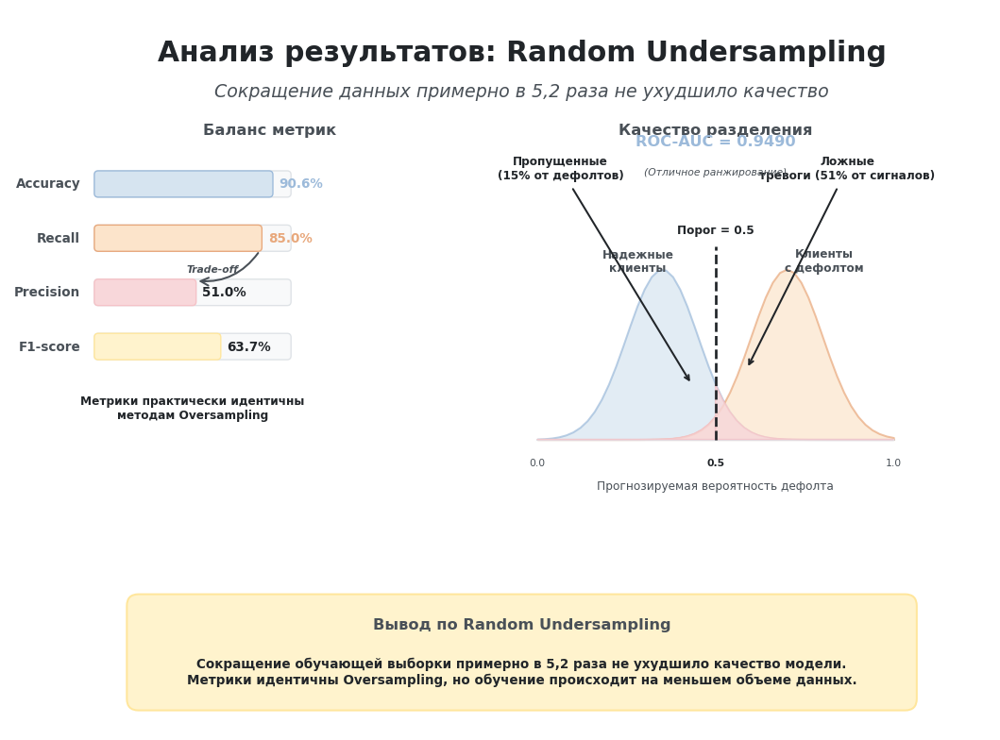

In [ ]:
# @title
import matplotlib.pyplot as plt
import math
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.2, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Анализ результатов: Random Undersampling",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Сокращение данных примерно в 5,2 раза не ухудшило качество",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Баланс метрик (Trade-off)
# ==========================================
ax.text(2.75, 6.5, "Баланс метрик", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

bar_x_start = 0.5
bar_max_w = 2.5
bar_h = 0.3

# Accuracy (Высокий)
val_acc = 0.9064
ax.text(0.3, 5.8, "Accuracy", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 5.65), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 5.65), bar_max_w * val_acc, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=BLUE_BORDER, facecolor=BLUE))
ax.text(bar_x_start + bar_max_w * val_acc + 0.1, 5.8, "90.6%", ha="left", va="center", fontsize=10*S, weight="bold", color=BLUE_BORDER)

# Recall (Высокий - Оранжевый)
val_recall = 0.8497
ax.text(0.3, 5.1, "Recall", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 4.95), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 4.95), bar_max_w * val_recall, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE))
ax.text(bar_x_start + bar_max_w * val_recall + 0.1, 5.1, "85.0%", ha="left", va="center", fontsize=10*S, weight="bold", color=ORANGE_BORDER)

# Precision (Низкий - Красный)
val_prec = 0.5098
ax.text(0.3, 4.4, "Precision", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 4.25), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 4.25), bar_max_w * val_prec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=RED_BORDER, facecolor=RED_FILL))
ax.text(bar_x_start + bar_max_w * val_prec + 0.1, 4.4, "51.0%", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# Стрелка компромисса
ax.annotate("", xy=(bar_x_start + bar_max_w * val_prec, 4.55), xytext=(bar_x_start + bar_max_w * val_recall, 4.95),
            arrowprops=dict(arrowstyle="->", color=TEXT_MUTED, lw=1.5*S, connectionstyle="arc3,rad=-0.3"))
ax.text(2.0, 4.7, "Trade-off", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic", weight="bold")

# F1-score (Баланс)
val_f1 = 0.6373
ax.text(0.3, 3.7, "F1-score", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 3.55), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 3.55), bar_max_w * val_f1, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=AMBER_BORDER, facecolor=AMBER))
ax.text(bar_x_start + bar_max_w * val_f1 + 0.1, 3.7, "63.7%", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# Пояснение под полосками
ax.text(1.75, 2.9, "Метрики практически идентичны\nметодам Oversampling", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")


# ==========================================
# ПРАВАЯ ЧАСТЬ: Качество разделения (ROC-AUC)
# ==========================================
ax.text(8.5, 6.5, "Качество разделения", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Холмы вероятностей ---
plot_x_start = 6.2
plot_x_end = 10.8
plot_width = plot_x_end - plot_x_start

# Ось X
ax.plot([plot_x_start, plot_x_end], [2.5, 2.5], color=GRAY_BORDER, linewidth=1.5*S)
ax.text(plot_x_start, 2.2, "0.0", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(8.5, 2.2, "0.5", ha="center", va="center", fontsize=8*S, color=TEXT_DARK, weight="bold")
ax.text(plot_x_end, 2.2, "1.0", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(8.5, 1.9, "Прогнозируемая вероятность дефолта", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED)

# Функция генерации холмов
def get_curve_points(x_start, y_base, y_height, width, peak_x, num_points=50):
    xs = []
    ys = []
    for i in range(num_points + 1):
        t = i / num_points
        x = x_start + t * width
        dist = (t - peak_x) ** 2
        y = y_base + y_height * math.exp(-dist / 0.020)
        xs.append(x)
        ys.append(y)
    return xs, ys

# Холм 1: Не дефолт (Сдвинут левее)
non_def_x, non_def_y = get_curve_points(plot_x_start, 2.5, 2.2, plot_width, 0.35) # (Оставь 0.35, но убедись, что ширина поменялась в шаге 1)
ax.fill_between(non_def_x, 2.5, non_def_y, color=BLUE, alpha=0.7, edgecolor=BLUE_BORDER, linewidth=1.5*S)
ax.text(7.5, 4.8, "Надежные\nклиенты", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, weight="bold")

# Холм 2: Дефолт (Сдвинут правее)
def_x, def_y = get_curve_points(plot_x_start, 2.5, 2.2, plot_width, 0.70)
ax.fill_between(def_x, 2.5, def_y, color=ORANGE, alpha=0.7, edgecolor=ORANGE_BORDER, linewidth=1.5*S)
ax.text(9.9, 4.8, "Клиенты\nс дефолтом", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, weight="bold")

# Линия порога (0.5)
threshold_x = 8.5
ax.plot([threshold_x, threshold_x], [2.5, 5.0], color=TEXT_DARK, linestyle="--", linewidth=2*S, zorder=4)
ax.text(8.5, 5.2, "Порог = 0.5", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")

# --- Зона ложных тревог (False Positives - Синий холм правее порога) ---
fp_xs = []
fp_ys = []
for x, y in zip(non_def_x, non_def_y):
    if x >= threshold_x:
        fp_xs.append(x)
        fp_ys.append(y)
fp_xs.append(threshold_x)
fp_ys.append(2.5)
fp_xs.append(fp_xs[0])
fp_ys.append(2.5)

ax.fill(fp_xs, fp_ys, color=RED_FILL, alpha=0.8, edgecolor=RED_BORDER, linewidth=1*S, zorder=3)
ax.annotate("Ложные\nтревоги (51% от сигналов)",
            xy=(8.9, 3.4), xytext=(10.2, 6.0),
            ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold",
            arrowprops=dict(arrowstyle="->", color=TEXT_DARK, lw=1.5*S))

# --- Зона пропущенных дефолтов (False Negatives - Оранжевый холм левее порога) ---
fn_xs = []
fn_ys = []
for x, y in zip(def_x, def_y):
    if x <= threshold_x:
        fn_xs.append(x)
        fn_ys.append(y)
fn_xs.append(threshold_x)
fn_ys.append(2.5)
fn_xs.append(fn_xs[0])
fn_ys.append(2.5)

ax.fill(fn_xs, fn_ys, color=RED_FILL, alpha=0.8, edgecolor=RED_BORDER, linewidth=1*S, zorder=3)
ax.annotate("Пропущенные\n(15% от дефолтов)",
            xy=(8.2, 3.2), xytext=(6.5, 6.0),
            ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold",
            arrowprops=dict(arrowstyle="->", color=TEXT_DARK, lw=1.5*S))

# Метрика ROC-AUC
ax.text(8.5, 6.35, "ROC-AUC = 0.9490", ha="center", va="center", fontsize=12*S, weight="bold", color=BLUE_BORDER)
ax.text(8.5, 5.95, "(Отличное ранжирование)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -0.9), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.1, "Вывод по Random Undersampling",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.5, "Сокращение обучающей выборки примерно в 5,2 раза не ухудшило качество модели.\nМетрики идентичны Oversampling, но обучение происходит на меньшем объеме данных.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

### Вывод по результатам применения метода Random Undersampling

Метод **Random Undersampling** позволил сформировать полностью сбалансированную обучающую выборку за счёт случайного удаления объектов мажоритарного класса.

Несмотря на сокращение общего объёма обучающей выборки примерно в **5,2 раза**, модель логистической регрессии достигла **Accuracy 90,64 %**, **Precision 50,98 %**, **Recall 84,97 %**, **F1-score 0,6373** и **ROC-AUC 0,9490**.

Полученные результаты оказались практически идентичны результатам, полученным после применения методов **Random Oversampling** и **SMOTE**. Это означает, что в рассматриваемой задаче случайное удаление значительной части объектов мажоритарного класса не привело к заметному ухудшению качества классификации.

Высокое значение **ROC-AUC** подтверждает, что модель по-прежнему эффективно разделяет организации по уровню кредитного риска, а достигнутый компромисс между **Recall** и **Precision** остаётся сопоставимым с результатами методов увеличения выборки.

Таким образом, Random Undersampling продемонстрировал, что для рассматриваемого набора данных сохранение всех объектов мажоритарного класса не является обязательным условием получения качественной модели. Окончательная оценка эффективности данного подхода будет выполнена после анализа остальных методов уменьшения выборки.


### Переход к следующему эксперименту

Проведённый эксперимент подтвердил, что случайное уменьшение выборки не привело к изменению поведения модели. Однако полученный результат ещё не позволяет сделать вывод о том, влияет ли на качество модели сам способ отбора объектов.

Особенность метода **Random UnderSampling** заключается в том, что объекты мажоритарного класса удаляются случайным образом. При этом алгоритм не учитывает, какие наблюдения являются наиболее информативными для построения модели.

Поэтому возникает следующий исследовательский вопрос:

> **Изменится ли результат, если уменьшать выборку не случайным образом, а сохранять наиболее информативные объекты?**

Ответить на этот вопрос позволяет метод **NearMiss**, который выполняет отбор объектов на основе расстояний между наблюдениями различных классов. Именно его исследованию посвящён следующий эксперимент.

## 21.2 Метод NearMiss

### Что мы будем проверять?

В предыдущем эксперименте использовался метод случайного уменьшения выборки (Random UnderSampling), при котором объекты мажоритарного класса удалялись случайным образом. Такой подход позволяет быстро устранить дисбаланс, однако существует вероятность потери важных наблюдений, поскольку алгоритм не учитывает расположение объектов в пространстве признаков.

Метод **NearMiss** использует иной принцип работы. Вместо случайного удаления он отбирает объекты мажоритарного класса на основе расстояний между наблюдениями различных классов. Предполагается, что такой подход позволяет сохранить наиболее информативные объекты, расположенные вблизи границы разделения классов.

### Почему это важно?

Если качество модели улучшится по сравнению с Random UnderSampling, это может свидетельствовать о том, что при балансировке важен не только размер выборки, но и то, какие именно объекты сохраняются для обучения модели.

Если же результаты вновь окажутся близкими к предыдущим экспериментам, это станет ещё одним подтверждением того, что причина наблюдаемого поведения модели, вероятно, не связана с конкретным алгоритмом балансировки.

### Что мы ожидаем увидеть?

Поскольку NearMiss выполняет более осмысленный отбор объектов по сравнению со случайным уменьшением выборки, можно предположить, что модель сможет лучше использовать информацию, содержащуюся в обучающей выборке.

В этом случае можно ожидать изменения значений основных метрик качества и более выраженной способности модели различать объекты двух классов.

В то же время нельзя исключать и другой сценарий — результаты вновь окажутся близкими к предыдущим экспериментам. Проверка этого предположения и является основной целью данного эксперимента.

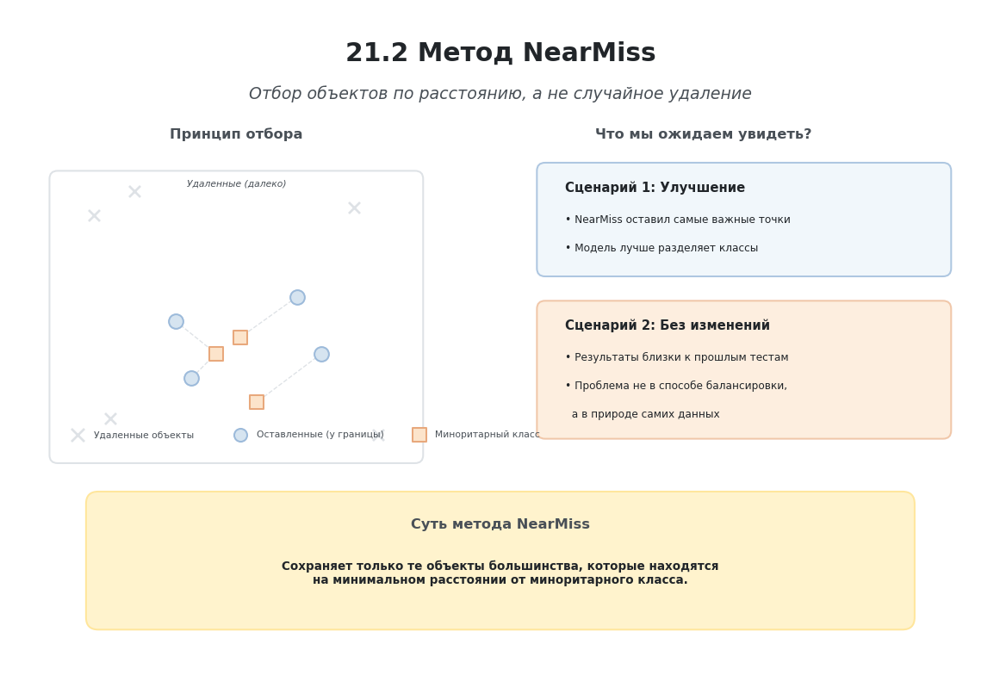

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "21.2 Метод NearMiss",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Отбор объектов по расстоянию, а не случайное удаление",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Геометрия метода
# ==========================================
ax.text(2.75, 6.5, "Принцип отбора", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Рамка графика
ax.add_patch(FancyBboxPatch((0.5, 2.5), 4.5, 3.5, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor="white"))

# Удаленные точки (далеко от границы)
removed_x = [1.0, 1.5, 4.2, 4.5, 1.2]
removed_y = [5.5, 5.8, 5.6, 2.8, 3.0]
ax.scatter(removed_x, removed_y, s=60*S, c=GRAY_BORDER, marker='x', linewidths=2*S, zorder=3)
ax.text(2.75, 5.9, "Удаленные (далеко)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# Оставшиеся точки мажоритарного класса (близко к границе)
major_x = [2.0, 3.5, 2.2, 3.8]
major_y = [4.2, 4.5, 3.5, 3.8]
ax.scatter(major_x, major_y, s=100*S, c=BLUE, edgecolors=BLUE_BORDER, linewidths=1.5*S, zorder=4)

# Точки миноритарного класса
minor_x = [2.8, 3.0, 2.5]
minor_y = [4.0, 3.2, 3.8]
ax.scatter(minor_x, minor_y, s=100*S, c=ORANGE, edgecolors=ORANGE_BORDER, linewidths=1.5*S, marker='s', zorder=5)

# Линии расстояний (от синих к оранжевым)
for mx, my in zip(major_x, major_y):
    closest_x = minor_x[0]
    closest_y = minor_y[0]
    min_dist = 999
    for ox, oy in zip(minor_x, minor_y):
        dist = (mx-ox)**2 + (my-oy)**2
        if dist < min_dist:
            min_dist = dist
            closest_x = ox
            closest_y = oy
    ax.plot([mx, closest_x], [my, closest_y], color=GRAY_BORDER, linestyle="--", linewidth=1*S, zorder=2)

# Легенда
ax.scatter([0.8], [2.8], s=80*S, c=GRAY_BORDER, marker='x', linewidths=2*S)
ax.text(1.0, 2.8, "Удаленные объекты", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED)

ax.scatter([2.8], [2.8], s=80*S, c=BLUE, edgecolors=BLUE_BORDER, linewidths=1.5*S)
ax.text(3.0, 2.8, "Оставленные (у границы)", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED)

ax.scatter([5.0], [2.8], s=80*S, c=ORANGE, edgecolors=ORANGE_BORDER, linewidths=1.5*S, marker='s')
ax.text(5.2, 2.8, "Миноритарный класс", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED)


# ==========================================
# ПРАВАЯ ЧАСТЬ: Гипотеза и Сценарии
# ==========================================
ax.text(8.5, 6.5, "Что мы ожидаем увидеть?", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Сценарий 1: Улучшение ---
ax.add_patch(FancyBboxPatch(
    (6.5, 4.8), 5.0, 1.3,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=LIGHT_BLUE, alpha=0.8
))
ax.text(6.8, 5.85, "Сценарий 1: Улучшение", ha="left", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(6.8, 5.45, "• NearMiss оставил самые важные точки", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(6.8, 5.1, "• Модель лучше разделяет классы", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)

# --- Сценарий 2: Без изменений ---
ax.add_patch(FancyBboxPatch(
    (6.5, 2.8), 5.0, 1.6,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE, alpha=0.6
))
ax.text(6.8, 4.15, "Сценарий 2: Без изменений", ha="left", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(6.8, 3.75, "• Результаты близки к прошлым тестам", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(6.8, 3.4, "• Проблема не в способе балансировки,", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(6.8, 3.05, "  а в природе самих данных", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)


# ---------- Итоговый блок (Суть метода) ----------
res_box = FancyBboxPatch(
    (1.0, 0.5), 10.0, 1.5,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 1.7, "Суть метода NearMiss",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, 1.1, "Сохраняет только те объекты большинства, которые находятся\nна минимальном расстоянии от миноритарного класса.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# Метод NearMiss
# ============================================================

from imblearn.under_sampling import NearMiss

# Создаем объект балансировщика
nearmiss = NearMiss(version=1)

# Выполняем балансировку обучающей выборки
X_train_nm, y_train_nm = nearmiss.fit_resample(X_train, y_train)

# Проверяем новый баланс классов
print("Распределение классов после NearMiss:\n")
print(y_train_nm.value_counts())

Распределение классов после NearMiss:

DefMark
0    28015
1    28015
Name: count, dtype: int64


In [ ]:
# ============================================================
# Обучение логистической регрессии на выборке NearMiss
# ============================================================

from sklearn.linear_model import LogisticRegression

# Создаем модель
lr_nm = LogisticRegression(
    random_state=42,
    max_iter=1000
)

# Обучаем модель
lr_nm.fit(X_train_nm, y_train_nm)

# Получаем прогнозы
y_pred_nm = lr_nm.predict(X_test)
y_proba_nm = lr_nm.predict_proba(X_test)[:, 1]

In [ ]:
# ============================================================
# Оценка качества модели после NearMiss
# ============================================================

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix
)

roc_auc_nm = roc_auc_score(y_test, y_proba_nm)

accuracy_nm = accuracy_score(y_test, y_pred_nm)

precision_nm = precision_score(y_test, y_pred_nm)

recall_nm = recall_score(y_test, y_pred_nm)

f1_nm = f1_score(y_test, y_pred_nm)

roc_auc_nm = roc_auc_score(y_test, y_proba_nm)
print(f"Accuracy: {accuracy_nm:.4f}")
print(f"Precision: {precision_nm:.4f}")
print(f"Recall: {recall_nm:.4f}")
print(f"F1-score: {f1_nm:.4f}")
print(f"ROC-AUC: {roc_auc_nm:.4f}")

print("\nМатрица ошибок:")
print(confusion_matrix(y_test, y_pred_nm))

Accuracy: 0.4841
Precision: 0.1472
Recall: 0.9042
F1-score: 0.2532
ROC-AUC: 0.8187

Матрица ошибок:
[[28717 36683]
 [  671  6333]]


### Анализ результатов применения метода NearMiss

После применения метода **NearMiss** модель продемонстрировала результаты, существенно отличающиеся от результатов, полученных при использовании предыдущих методов балансировки.

Значение **Accuracy** составило **48,41 %**. Accuracy показывает долю объектов тестовой выборки, которые были классифицированы правильно.

Значение **Precision** составило **0,1472**. Это означает, что среди организаций, которые модель отнесла к классу дефолта, лишь **14,72 %** действительно являются дефолтными.

Значение **Recall** составило **0,9042**. Recall показывает, какую долю всех реальных дефолтов смогла обнаружить модель. Таким образом, модель выявила **90,42 %** организаций, действительно допустивших дефолт.

Значение **F1-score** составило **0,2532**, что свидетельствует о существенном нарушении баланса между полнотой обнаружения дефолтов и точностью положительных прогнозов.

Показатель **ROC-AUC** составил **0,8187**. Несмотря на то что модель по-прежнему способна различать объекты двух классов лучше случайного угадывания, её способность ранжировать организации по уровню кредитного риска заметно снизилась по сравнению с ранее рассмотренными методами балансировки.

Полученные результаты показывают, что использование метода NearMiss привело к резкому увеличению количества ложноположительных прогнозов. Несмотря на высокое значение Recall, модель значительно чаще относила надёжные организации к классу дефолта, что отрицательно сказалось на значениях Precision, Accuracy, F1-score и ROC-AUC.


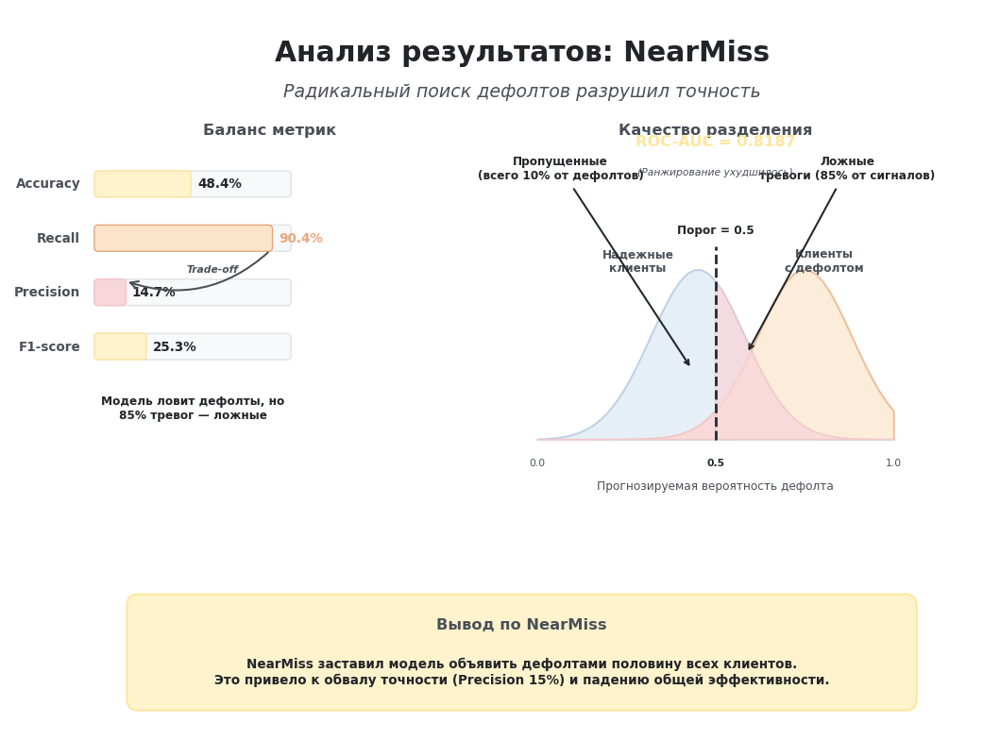

In [ ]:
# @title
import matplotlib.pyplot as plt
import math
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.2, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Анализ результатов: NearMiss",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Радикальный поиск дефолтов разрушил точность",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Баланс метрик (Trade-off)
# ==========================================
ax.text(2.75, 6.5, "Баланс метрик", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

bar_x_start = 0.5
bar_max_w = 2.5
bar_h = 0.3

# Accuracy (Низкий)
val_acc = 0.4841
ax.text(0.3, 5.8, "Accuracy", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 5.65), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 5.65), bar_max_w * val_acc, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=AMBER_BORDER, facecolor=AMBER))
ax.text(bar_x_start + bar_max_w * val_acc + 0.1, 5.8, "48.4%", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# Recall (Очень высокий - Оранжевый)
val_recall = 0.9042
ax.text(0.3, 5.1, "Recall", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 4.95), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 4.95), bar_max_w * val_recall, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE))
ax.text(bar_x_start + bar_max_w * val_recall + 0.1, 5.1, "90.4%", ha="left", va="center", fontsize=10*S, weight="bold", color=ORANGE_BORDER)

# Precision (Катастрофически низкий - Красный)
val_prec = 0.1472
ax.text(0.3, 4.4, "Precision", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 4.25), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 4.25), bar_max_w * val_prec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=RED_BORDER, facecolor=RED_FILL))
ax.text(bar_x_start + bar_max_w * val_prec + 0.1, 4.4, "14.7%", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# Стрелка компромисса (Максимальный разрыв)
ax.annotate("", xy=(bar_x_start + bar_max_w * val_prec, 4.55), xytext=(bar_x_start + bar_max_w * val_recall, 4.95),
            arrowprops=dict(arrowstyle="->", color=TEXT_MUTED, lw=1.5*S, connectionstyle="arc3,rad=-0.3"))
ax.text(2.0, 4.7, "Trade-off", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic", weight="bold")

# F1-score (Низкий)
val_f1 = 0.2532
ax.text(0.3, 3.7, "F1-score", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 3.55), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 3.55), bar_max_w * val_f1, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=AMBER_BORDER, facecolor=AMBER))
ax.text(bar_x_start + bar_max_w * val_f1 + 0.1, 3.7, "25.3%", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# Пояснение под полосками
ax.text(1.75, 2.9, "Модель ловит дефолты, но\n85% тревог — ложные", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")


# ==========================================
# ПРАВАЯ ЧАСТЬ: Качество разделения (ROC-AUC)
# ==========================================
ax.text(8.5, 6.5, "Качество разделения", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Холмы вероятностей ---
plot_x_start = 6.2
plot_x_end = 10.8
plot_width = plot_x_end - plot_x_start

# Ось X
ax.plot([plot_x_start, plot_x_end], [2.5, 2.5], color=GRAY_BORDER, linewidth=1.5*S)
ax.text(plot_x_start, 2.2, "0.0", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(8.5, 2.2, "0.5", ha="center", va="center", fontsize=8*S, color=TEXT_DARK, weight="bold")
ax.text(plot_x_end, 2.2, "1.0", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(8.5, 1.9, "Прогнозируемая вероятность дефолта", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED)

# Функция генерации холмов
def get_curve_points(x_start, y_base, y_height, width, peak_x, num_points=50):
    xs = []
    ys = []
    for i in range(num_points + 1):
        t = i / num_points
        x = x_start + t * width
        dist = (t - peak_x) ** 2
        y = y_base + y_height * math.exp(-dist / 0.035) # Сделали холмы очень широкими для сильного нахлеста
        xs.append(x)
        ys.append(y)
    return xs, ys

# Холм 1: Не дефолт (Сдвинут сильно правее - пик на 0.45, чтобы залезть за порог)
non_def_x, non_def_y = get_curve_points(plot_x_start, 2.5, 2.2, plot_width, 0.45)
ax.fill_between(non_def_x, 2.5, non_def_y, color=BLUE, alpha=0.6, edgecolor=BLUE_BORDER, linewidth=1.5*S)
ax.text(7.5, 4.8, "Надежные\nклиенты", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, weight="bold")

# Холм 2: Дефолт (Сдвинут левее - пик на 0.75)
def_x, def_y = get_curve_points(plot_x_start, 2.5, 2.2, plot_width, 0.75)
ax.fill_between(def_x, 2.5, def_y, color=ORANGE, alpha=0.7, edgecolor=ORANGE_BORDER, linewidth=1.5*S)
ax.text(9.9, 4.8, "Клиенты\nс дефолтом", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, weight="bold")

# Линия порога (0.5)
threshold_x = 8.5
ax.plot([threshold_x, threshold_x], [2.5, 5.0], color=TEXT_DARK, linestyle="--", linewidth=2*S, zorder=4)
ax.text(8.5, 5.2, "Порог = 0.5", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")

# --- Зона ложных тревог (False Positives - Синий холм правее порога) ---
fp_xs = []
fp_ys = []
for x, y in zip(non_def_x, non_def_y):
    if x >= threshold_x:
        fp_xs.append(x)
        fp_ys.append(y)
fp_xs.append(threshold_x)
fp_ys.append(2.5)
fp_xs.append(fp_xs[0])
fp_ys.append(2.5)

ax.fill(fp_xs, fp_ys, color=RED_FILL, alpha=0.8, edgecolor=RED_BORDER, linewidth=1*S, zorder=3)
ax.annotate("Ложные\nтревоги (85% от сигналов)",
            xy=(8.9, 3.6), xytext=(10.2, 6.0),
            ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold",
            arrowprops=dict(arrowstyle="->", color=TEXT_DARK, lw=1.5*S))

# --- Зона пропущенных дефолтов (False Negatives - Оранжевый холм левее порога) ---
fn_xs = []
fn_ys = []
for x, y in zip(def_x, def_y):
    if x <= threshold_x:
        fn_xs.append(x)
        fn_ys.append(y)
fn_xs.append(threshold_x)
fn_ys.append(2.5)
fn_xs.append(fn_xs[0])
fn_ys.append(2.5)

ax.fill(fn_xs, fn_ys, color=RED_FILL, alpha=0.8, edgecolor=RED_BORDER, linewidth=1*S, zorder=3)
ax.annotate("Пропущенные\n(всего 10% от дефолтов)",
            xy=(8.2, 3.4), xytext=(6.5, 6.0),
            ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold",
            arrowprops=dict(arrowstyle="->", color=TEXT_DARK, lw=1.5*S))

# Метрика ROC-AUC (Упал)
ax.text(8.5, 6.35, "ROC-AUC = 0.8187", ha="center", va="center", fontsize=12*S, weight="bold", color=AMBER_BORDER)
ax.text(8.5, 5.95, "(Ранжирование ухудшилось)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -0.9), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.1, "Вывод по NearMiss",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.5, "NearMiss заставил модель объявить дефолтами половину всех клиентов.\nЭто привело к обвалу точности (Precision 15%) и падению общей эффективности.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

### Переход к следующему эксперименту

Результаты применения метода **NearMiss** показали, что способ отбора объектов мажоритарного класса действительно способен существенно влиять на качество модели.

Однако NearMiss достигает балансировки путём сохранения объектов, расположенных вблизи границы разделения классов. Возникает следующий исследовательский вопрос: **обязательно ли уменьшать выборку целиком, чтобы улучшить разделимость классов, или достаточно удалить только наиболее проблемные наблюдения?**

Для ответа на этот вопрос рассмотрим метод **Tomek Links**.

В отличие от ранее исследованных методов уменьшения выборки, Tomek Links не стремится сформировать полностью сбалансированную выборку. Вместо этого алгоритм удаляет только отдельные пары пограничных объектов, затрудняющих разделение классов.

Таким образом, следующий эксперимент позволит оценить, достаточно ли локальной очистки данных для повышения качества классификации или же для эффективной балансировки требуется более существенное изменение структуры обучающей выборки.


  ## 21.3 Метод Tomek Links

  ### Что мы будем проверять?

  Предыдущий эксперимент показал, что способ отбора объектов обучающей выборки способен существенно повлиять на поведение модели. Однако метод NearMiss изменял структуру данных за счёт отбора наблюдений мажоритарного класса, расположенных вблизи объектов миноритарного класса.

  Метод **Tomek Links** использует иной подход. Он не стремится сбалансировать выборку напрямую, а удаляет пары объектов разных классов, которые находятся очень близко друг к другу. Такие пары называют **связями Томека (Tomek Links)**. Их наличие может свидетельствовать о том, что объекты расположены вблизи границы разделения классов и затрудняют обучение модели.

  ### Почему это важно?

  Удаление подобных наблюдений позволяет сделать границу между классами более чёткой, не изменяя структуру выборки так сильно, как методы случайного уменьшения или увеличения данных.

  Если после применения Tomek Links качество модели улучшится, это будет означать, что причиной предыдущих ошибок являлись отдельные пограничные объекты, создававшие неоднозначность при обучении.

  Если же результаты окажутся близкими к предыдущим экспериментам, можно будет сделать вывод, что простая очистка границы классов не оказывает существенного влияния на качество модели.

  ### Что мы ожидаем увидеть?

  Поскольку Tomek Links удаляет только часть объектов, расположенных на границе между классами, можно ожидать более аккуратного изменения поведения модели по сравнению с NearMiss.

  Основной интерес представляет проверка того, позволит ли очистка границы классов повысить качество классификации без существенного увеличения количества ложноположительных или ложноотрицательных прогнозов.

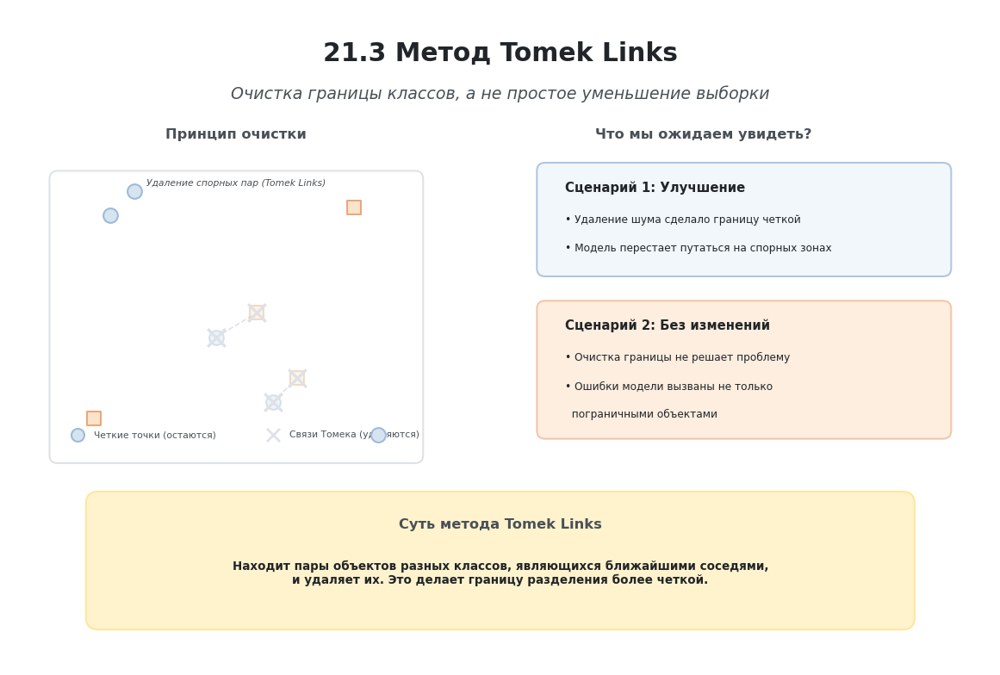

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "21.3 Метод Tomek Links",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Очистка границы классов, а не простое уменьшение выборки",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Геометрия метода
# ==========================================
ax.text(2.75, 6.5, "Принцип очистки", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Рамка графика
ax.add_patch(FancyBboxPatch((0.5, 2.5), 4.5, 3.5, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor="white"))

# Четкие точки (далеко от границы - остаются)
clear_blue_x = [1.2, 1.5, 4.5]
clear_blue_y = [5.5, 5.8, 2.8]
ax.scatter(clear_blue_x, clear_blue_y, s=100*S, c=BLUE, edgecolors=BLUE_BORDER, linewidths=1.5*S, zorder=4)

clear_orange_x = [4.2, 1.0]
clear_orange_y = [5.6, 3.0]
ax.scatter(clear_orange_x, clear_orange_y, s=100*S, c=ORANGE, edgecolors=ORANGE_BORDER, linewidths=1.5*S, marker='s', zorder=4)

# Связи Томека (Пары близких точек разных классов)
tomek_pairs = [
    (2.5, 4.0, 3.0, 4.3), # Blue, Orange
    (3.2, 3.2, 3.5, 3.5)  # Blue, Orange
]

for b_x, b_y, o_x, o_y in tomek_pairs:
    # Линия связи
    ax.plot([b_x, o_x], [b_y, o_y], color=GRAY_BORDER, linestyle="--", linewidth=1.2*S, zorder=2)

    # Точки (бледные, так как будут удалены)
    ax.scatter([b_x], [b_y], s=100*S, c=BLUE, edgecolors=BLUE_BORDER, linewidths=1.5*S, alpha=0.4, zorder=3)
    ax.scatter([o_x], [o_y], s=100*S, c=ORANGE, edgecolors=ORANGE_BORDER, linewidths=1.5*S, marker='s', alpha=0.4, zorder=3)

    # Крестики поверх пары (удаление)
    offset = 0.15
    ax.scatter([b_x, o_x], [b_y, o_y], s=150*S, c=GRAY_BORDER, marker='x', linewidths=2.5*S, zorder=5)

ax.text(2.75, 5.9, "Удаление спорных пар (Tomek Links)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# Легенда
ax.scatter([0.8], [2.8], s=80*S, c=BLUE, edgecolors=BLUE_BORDER, linewidths=1.5*S)
ax.text(1.0, 2.8, "Четкие точки (остаются)", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED)

ax.scatter([3.2], [2.8], s=80*S, c=GRAY_BORDER, marker='x', linewidths=2*S)
ax.text(3.4, 2.8, "Связи Томека (удаляются)", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED)


# ==========================================
# ПРАВАЯ ЧАСТЬ: Гипотеза и Сценарии
# ==========================================
ax.text(8.5, 6.5, "Что мы ожидаем увидеть?", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Сценарий 1: Улучшение ---
ax.add_patch(FancyBboxPatch(
    (6.5, 4.8), 5.0, 1.3,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=LIGHT_BLUE, alpha=0.8
))
ax.text(6.8, 5.85, "Сценарий 1: Улучшение", ha="left", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(6.8, 5.45, "• Удаление шума сделало границу четкой", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(6.8, 5.1, "• Модель перестает путаться на спорных зонах", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)

# --- Сценарий 2: Без изменений ---
ax.add_patch(FancyBboxPatch(
    (6.5, 2.8), 5.0, 1.6,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE, alpha=0.6
))
ax.text(6.8, 4.15, "Сценарий 2: Без изменений", ha="left", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(6.8, 3.75, "• Очистка границы не решает проблему", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(6.8, 3.4, "• Ошибки модели вызваны не только", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(6.8, 3.05, "  пограничными объектами", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)


# ---------- Итоговый блок (Суть метода) ----------
res_box = FancyBboxPatch(
    (1.0, 0.5), 10.0, 1.5,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 1.7, "Суть метода Tomek Links",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, 1.1, "Находит пары объектов разных классов, являющихся ближайшими соседями,\nи удаляет их. Это делает границу разделения более четкой.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# Метод Tomek Links
# ============================================================

from imblearn.under_sampling import TomekLinks

# Создаем объект балансировщика
tomek = TomekLinks()

# Выполняем очистку выборки
X_train_tl, y_train_tl = tomek.fit_resample(X_train, y_train)

# Проверяем распределение классов
print("Распределение классов после Tomek Links:\n")
print(y_train_tl.value_counts())

Распределение классов после Tomek Links:

DefMark
0    258664
1     28015
Name: count, dtype: int64


In [ ]:
# ============================================================
# Обучение модели
# ============================================================

lr_tl = LogisticRegression(
    random_state=42,
    max_iter=1000
)

lr_tl.fit(X_train_tl, y_train_tl)

y_pred_tl = lr_tl.predict(X_test)
y_proba_tl = lr_tl.predict_proba(X_test)[:, 1]

In [ ]:
# ============================================================
# Оценка качества модели
# ============================================================

accuracy_tl = accuracy_score(y_test, y_pred_tl)
precision_tl = precision_score(y_test, y_pred_tl)
recall_tl = recall_score(y_test, y_pred_tl)
f1_tl = f1_score(y_test, y_pred_tl)
roc_auc_tl = roc_auc_score(y_test, y_proba_tl)

print(f"Accuracy : {accuracy_tl:.4f}")
print(f"Precision: {precision_tl:.4f}")
print(f"Recall   : {recall_tl:.4f}")
print(f"F1-score : {f1_tl:.4f}")
print(f"ROC-AUC  : {roc_auc_tl:.4f}")

print("\nМатрица ошибок:")
print(confusion_matrix(y_test, y_pred_tl))

Accuracy : 0.9577
Precision: 0.8771
Recall   : 0.6543
F1-score : 0.7495
ROC-AUC  : 0.9480

Матрица ошибок:
[[64758   642]
 [ 2421  4583]]


### Анализ результатов применения метода Tomek Links

После применения метода **Tomek Links** структура обучающей выборки изменилась незначительно. Количество объектов класса дефолта осталось равным **28 015**, а количество объектов недефолтного класса сократилось до **258 664**.

Таким образом, в отличие от Random Undersampling и NearMiss, метод Tomek Links не сформировал полностью сбалансированную выборку. Алгоритм удалил только отдельные объекты мажоритарного класса, расположенные в пограничных парах с объектами миноритарного класса.

После обучения логистической регрессии значение **Accuracy** составило **95,77 %**. Это означает, что модель правильно классифицировала большую часть объектов тестовой выборки.

Значение **Precision** составило **0,8771**. Следовательно, среди организаций, которые модель отнесла к классу дефолта, **87,71 %** действительно являются дефолтными.

Значение **Recall** составило **0,6543**. Это означает, что модель обнаружила **65,43 %** всех реальных дефолтов.

Значение **F1-score** составило **0,7495**, что свидетельствует о достаточно хорошем балансе между Precision и Recall.

Показатель **ROC-AUC** составил **0,9480**. Модель сохранила высокую способность ранжировать рискованные организации выше надёжных независимо от выбранного порога классификации.

Матрица ошибок показывает, что модель правильно обнаружила **4 583** дефолтные организации, пропустила **2 421** дефолт и ошибочно отнесла к дефолтному классу **642** надёжные организации.


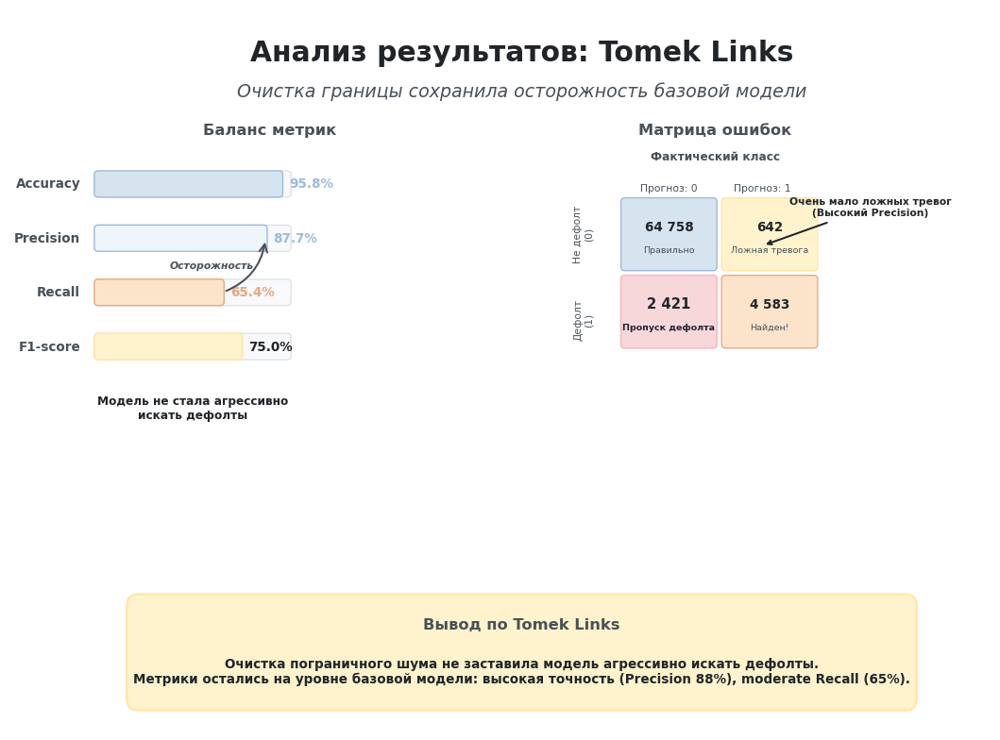

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.2, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Анализ результатов: Tomek Links",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Очистка границы сохранила осторожность базовой модели",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Баланс метрик
# ==========================================
ax.text(2.75, 6.5, "Баланс метрик", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

bar_x_start = 0.5
bar_max_w = 2.5
bar_h = 0.3

# Accuracy (Высокий)
val_acc = 0.9577
ax.text(0.3, 5.8, "Accuracy", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 5.65), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 5.65), bar_max_w * val_acc, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=BLUE_BORDER, facecolor=BLUE))
ax.text(bar_x_start + bar_max_w * val_acc + 0.1, 5.8, "95.8%", ha="left", va="center", fontsize=10*S, weight="bold", color=BLUE_BORDER)

# Precision (Высокий - Голубой)
val_prec = 0.8771
ax.text(0.3, 5.1, "Precision", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 4.95), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 4.95), bar_max_w * val_prec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=BLUE_BORDER, facecolor=LIGHT_BLUE))
ax.text(bar_x_start + bar_max_w * val_prec + 0.1, 5.1, "87.7%", ha="left", va="center", fontsize=10*S, weight="bold", color=BLUE_BORDER)

# Recall (Средний - Оранжевый)
val_recall = 0.6543
ax.text(0.3, 4.4, "Recall", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 4.25), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 4.25), bar_max_w * val_recall, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE))
ax.text(bar_x_start + bar_max_w * val_recall + 0.1, 4.4, "65.4%", ha="left", va="center", fontsize=10*S, weight="bold", color=ORANGE_BORDER)

# Стрелка компромисса (Теперь направлена в обратную сторону: от Recall к Precision)
ax.annotate("", xy=(bar_x_start + bar_max_w * val_prec, 5.1), xytext=(bar_x_start + bar_max_w * val_recall, 4.4),
            arrowprops=dict(arrowstyle="->", color=TEXT_MUTED, lw=1.5*S, connectionstyle="arc3,rad=0.3"))
ax.text(2.0, 4.75, "Осторожность", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic", weight="bold")

# F1-score (Хороший баланс)
val_f1 = 0.7495
ax.text(0.3, 3.7, "F1-score", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 3.55), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 3.55), bar_max_w * val_f1, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=AMBER_BORDER, facecolor=AMBER))
ax.text(bar_x_start + bar_max_w * val_f1 + 0.1, 3.7, "75.0%", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# Пояснение
ax.text(1.75, 2.9, "Модель не стала агрессивно\nискать дефолты", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")


# ==========================================
# ПРАВАЯ ЧАСТЬ: Матрица ошибок (Confusion Matrix)
# ==========================================
ax.text(8.5, 6.5, "Матрица ошибок", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Оси матрицы
ax.text(8.5, 6.15, "Фактический класс", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, weight="bold")
ax.text(6.8, 5.15, "Не дефолт\n(0)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, rotation=90)
ax.text(6.8, 4.05, "Дефолт\n(1)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, rotation=90)

ax.text(7.9, 5.75, "Прогноз: 0", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(9.1, 5.75, "Прогноз: 1", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)

# Ячейки матрицы (2x2)
cell_w = 1.2
cell_h = 0.9
start_x = 7.3
start_y = 4.7

# 1. True Negative (Верх-Лево) - 64758 (65400 - 642)
ax.add_patch(FancyBboxPatch((start_x, start_y), cell_w, cell_h, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
ax.text(start_x + cell_w/2, start_y + cell_h/2 + 0.1, "64 758", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(start_x + cell_w/2, start_y + cell_h/2 - 0.2, "Правильно", ha="center", va="center", fontsize=7*S, color=TEXT_MUTED)

# 2. False Positive (Верх-Право) - 642 (Ложная тревога - очень мало!)
ax.add_patch(FancyBboxPatch((start_x + cell_w + 0.1, start_y), cell_w, cell_h, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=AMBER, edgecolor=AMBER_BORDER, linewidth=1*S))
ax.text(start_x + cell_w + 0.1 + cell_w/2, start_y + cell_h/2 + 0.1, "642", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(start_x + cell_w + 0.1 + cell_w/2, start_y + cell_h/2 - 0.2, "Ложная тревога", ha="center", va="center", fontsize=7*S, color=TEXT_MUTED)

# 3. False Negative (Низ-Лево) - 2421 (Пропуск - Красный)
ax.add_patch(FancyBboxPatch((start_x, start_y - cell_h - 0.1), cell_w, cell_h, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=RED_FILL, edgecolor=RED_BORDER, linewidth=1.5*S))
ax.text(start_x + cell_w/2, start_y - cell_h - 0.1 + cell_h/2 + 0.1, "2 421", ha="center", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(start_x + cell_w/2, start_y - cell_h - 0.1 + cell_h/2 - 0.2, "Пропуск дефолта", ha="center", va="center", fontsize=7*S, color=TEXT_DARK, weight="bold")

# 4. True Positive (Низ-Право) - 4583
ax.add_patch(FancyBboxPatch((start_x + cell_w + 0.1, start_y - cell_h - 0.1), cell_w, cell_h, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=ORANGE, edgecolor=ORANGE_BORDER, linewidth=1*S))
ax.text(start_x + cell_w + 0.1 + cell_w/2, start_y - cell_h - 0.1 + cell_h/2 + 0.1, "4 583", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(start_x + cell_w + 0.1 + cell_w/2, start_y - cell_h - 0.1 + cell_h/2 - 0.2, "Найден!", ha="center", va="center", fontsize=7*S, color=TEXT_MUTED)

# Акцент на отсутствие ложных тревог
ax.annotate("Очень мало ложных тревог\n(Высокий Precision)", xy=(9.1, 5.0), xytext=(10.5, 5.5),
            ha="center", va="center", fontsize=8*S, color=TEXT_DARK, weight="bold",
            arrowprops=dict(arrowstyle="->", color=TEXT_DARK, lw=1.5*S))


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -0.9), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.1, "Вывод по Tomek Links",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.5, "Очистка пограничного шума не заставила модель агрессивно искать дефолты.\nМетрики остались на уровне базовой модели: высокая точность (Precision 88%), moderate Recall (65%).",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

### Вывод по результатам применения метода Tomek Links

Метод **Tomek Links** удалил только небольшую часть объектов мажоритарного класса и не устранил выраженный дисбаланс обучающей выборки.

Модель продемонстрировала **Accuracy 95,77 %**, **Precision 87,71 %**, **Recall 65,43 %**, **F1-score 0,7495** и **ROC-AUC 0,9480**.

Полученные показатели очень близки к результатам базовой модели без балансировки. Tomek Links сохранил высокие значения Precision, Accuracy и ROC-AUC, однако не привёл к существенному повышению Recall. Модель по-прежнему обнаруживает примерно две трети реальных дефолтов.

Это объясняется тем, что Tomek Links является прежде всего методом очистки границы между классами, а не полноценным способом выравнивания их количества. Удаление отдельных пограничных наблюдений практически не изменило общий баланс классов и, следовательно, не привело к заметному изменению поведения логистической регрессии.

Таким образом, локальная очистка обучающей выборки с помощью Tomek Links не дала такого же увеличения Recall, как методы полноценной балансировки. При этом она позволила сохранить высокую точность положительных прогнозов и высокое качество ранжирования кредитного риска.


### Переход к следующему эксперименту

Метод **Tomek Links** удалил отдельные пограничные объекты, однако практически не изменил соотношение классов и итоговые показатели модели.

Это показывает, что локального удаления отдельных неоднозначных наблюдений оказалось недостаточно для заметного повышения способности модели обнаруживать дефолты.

В следующем эксперименте будет рассмотрен метод **Edited Nearest Neighbours (ENN)**. Он выполняет более активную очистку обучающей выборки: анализирует ближайшее окружение каждого объекта и удаляет наблюдения, класс которых не совпадает с классом большинства соседей.

Эксперимент позволит определить, приведёт ли более интенсивное удаление противоречивых наблюдений к заметному изменению качества логистической регрессии.


## 21.4 Метод Edited Nearest Neighbours (ENN)

### Что мы будем проверять?

Метод **Edited Nearest Neighbours (ENN)** относится к методам уменьшения выборки, однако не стремится напрямую выровнять количество объектов разных классов.

Алгоритм анализирует ближайшее окружение каждого наблюдения. Если класс объекта не совпадает с классом большинства его ближайших соседей, такое наблюдение удаляется из обучающей выборки.

Предполагается, что удаляемые объекты могут являться шумовыми, противоречивыми или располагаться в областях пересечения классов. Поэтому основная задача ENN заключается не в полной балансировке данных, а в очистке обучающей выборки.

### Почему это важно?

В задачах кредитного скоринга часть организаций может обладать признаками, характерными одновременно для надёжных и дефолтных компаний. Такие неоднозначные наблюдения способны затруднять построение границы между классами.

Метод ENN позволяет проверить, приведёт ли более активная очистка обучающей выборки к улучшению способности логистической регрессии выявлять закономерности в данных.

В отличие от Tomek Links, который удаляет только отдельные пограничные пары, ENN анализирует окружение каждого наблюдения и поэтому может удалить значительно больше объектов.

### Что мы ожидаем увидеть?

Если ENN удалит преимущественно шумовые и противоречивые наблюдения, качество разделения классов может повыситься.

Если же вместе с неоднозначными объектами будет удалена полезная информация, показатели модели могут остаться на прежнем уровне или ухудшиться.

Для оценки результата будут рассчитаны те же метрики, что и в предыдущих экспериментах:

* **Accuracy** — доля всех правильных прогнозов;
* **Precision** — сколько найденных моделью дефолтов действительно являются дефолтами;
* **Recall** — какую долю всех реальных дефолтов модель смогла найти;
* **F1-score** — баланс между Precision и Recall;
* **ROC-AUC** — насколько хорошо модель ранжирует рискованные организации выше надёжных независимо от порога классификации.


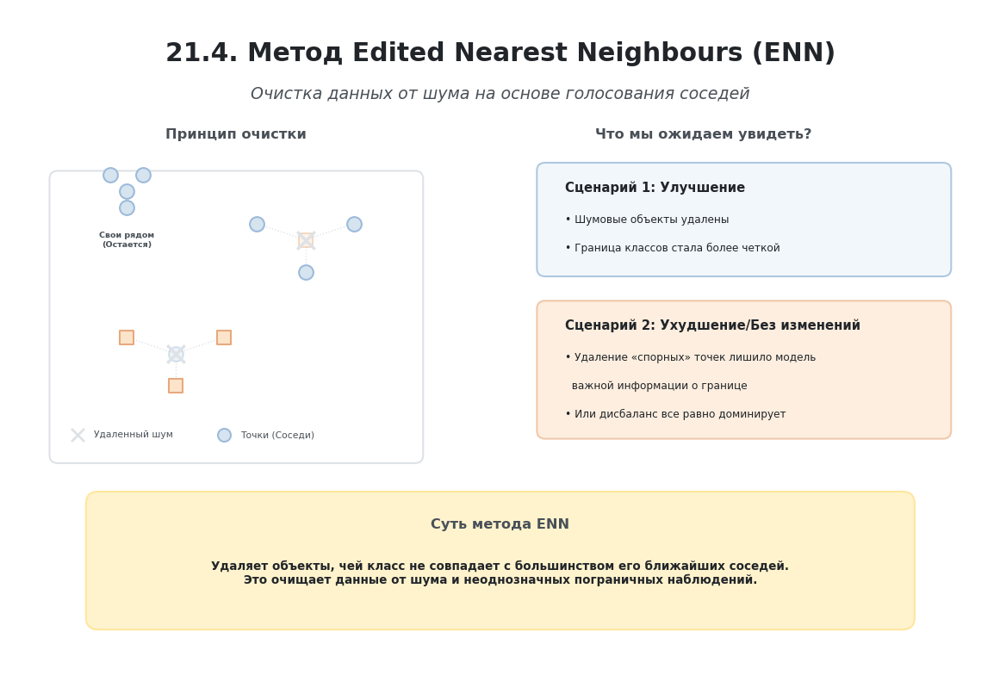

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "21.4. Метод Edited Nearest Neighbours (ENN)",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Очистка данных от шума на основе голосования соседей",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Геометрия метода (Голосование)
# ==========================================
ax.text(2.75, 6.5, "Принцип очистки", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Рамка графика
ax.add_patch(FancyBboxPatch((0.5, 2.5), 4.5, 3.5, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor="white"))

# --- Ситуация 1: Синяя точка в оранжевом скоплении (Удаляется) ---
# Соседи
ax.scatter([1.4, 2.6, 2.0], [4.0, 4.0, 3.4], s=100*S, c=ORANGE, edgecolors=ORANGE_BORDER, linewidths=1.5*S, marker='s', zorder=4)
# Линии связи
ax.plot([2.0, 1.4], [3.8, 4.0], color=GRAY_BORDER, linestyle=":", linewidth=1*S, zorder=2)
ax.plot([2.0, 2.6], [3.8, 4.0], color=GRAY_BORDER, linestyle=":", linewidth=1*S, zorder=2)
ax.plot([2.0, 2.0], [3.8, 3.4], color=GRAY_BORDER, linestyle=":", linewidth=1*S, zorder=2)
# Сама точка (полупрозрачная)
ax.scatter([2.0], [3.8], s=100*S, c=BLUE, edgecolors=BLUE_BORDER, linewidths=1.5*S, alpha=0.4, zorder=3)
# Крестик (Удалено)
ax.scatter([2.0], [3.8], s=150*S, c=GRAY_BORDER, marker='x', linewidths=2.5*S, zorder=5)

# --- Ситуация 2: Оранжевая точка в синем скоплении (Удаляется) ---
# Соседи
ax.scatter([3.0, 4.2, 3.6], [5.4, 5.4, 4.8], s=100*S, c=BLUE, edgecolors=BLUE_BORDER, linewidths=1.5*S, zorder=4)
# Линии связи
ax.plot([3.6, 3.0], [5.2, 5.4], color=GRAY_BORDER, linestyle=":", linewidth=1*S, zorder=2)
ax.plot([3.6, 4.2], [5.2, 5.4], color=GRAY_BORDER, linestyle=":", linewidth=1*S, zorder=2)
ax.plot([3.6, 3.6], [5.2, 4.8], color=GRAY_BORDER, linestyle=":", linewidth=1*S, zorder=2)
# Сама точка (полупрозрачная)
ax.scatter([3.6], [5.2], s=100*S, c=ORANGE, edgecolors=ORANGE_BORDER, linewidths=1.5*S, marker='s', alpha=0.4, zorder=3)
# Крестик (Удалено)
ax.scatter([3.6], [5.2], s=150*S, c=GRAY_BORDER, marker='x', linewidths=2.5*S, zorder=5)

# --- Ситуация 3: Точка среди "своих" (Остается) ---
ax.scatter([1.2, 1.6, 1.4], [6.0, 6.0, 5.6], s=100*S, c=BLUE, edgecolors=BLUE_BORDER, linewidths=1.5*S, zorder=4)
ax.scatter([1.4], [5.8], s=100*S, c=BLUE, edgecolors=BLUE_BORDER, linewidths=1.5*S, zorder=4) # Центральная
ax.text(1.4, 5.2, "Свои рядом\n(Остается)", ha="center", va="center", fontsize=7*S, color=TEXT_MUTED, weight="bold")

# Легенда
ax.scatter([0.8], [2.8], s=80*S, c=GRAY_BORDER, marker='x', linewidths=2*S)
ax.text(1.0, 2.8, "Удаленный шум", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED)

ax.scatter([2.6], [2.8], s=80*S, c=BLUE, edgecolors=BLUE_BORDER, linewidths=1.5*S)
ax.text(2.8, 2.8, "Точки (Соседи)", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED)


# ==========================================
# ПРАВАЯ ЧАСТЬ: Гипотеза и Сценарии
# ==========================================
ax.text(8.5, 6.5, "Что мы ожидаем увидеть?", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Сценарий 1: Улучшение ---
ax.add_patch(FancyBboxPatch(
    (6.5, 4.8), 5.0, 1.3,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=LIGHT_BLUE, alpha=0.8
))
ax.text(6.8, 5.85, "Сценарий 1: Улучшение", ha="left", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(6.8, 5.45, "• Шумовые объекты удалены", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(6.8, 5.1, "• Граница классов стала более четкой", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)

# --- Сценарий 2: Ухудшение / Без изменений ---
ax.add_patch(FancyBboxPatch(
    (6.5, 2.8), 5.0, 1.6,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE, alpha=0.6
))
ax.text(6.8, 4.15, "Сценарий 2: Ухудшение/Без изменений", ha="left", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(6.8, 3.75, "• Удаление «спорных» точек лишило модель", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(6.8, 3.4, "  важной информации о границе", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(6.8, 3.05, "• Или дисбаланс все равно доминирует", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)


# ---------- Итоговый блок (Суть метода) ----------
res_box = FancyBboxPatch(
    (1.0, 0.5), 10.0, 1.5,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 1.7, "Суть метода ENN",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, 1.1, "Удаляет объекты, чей класс не совпадает с большинством его ближайших соседей.\nЭто очищает данные от шума и неоднозначных пограничных наблюдений.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# Метод Edited Nearest Neighbours (ENN)
# ============================================================

from imblearn.under_sampling import EditedNearestNeighbours

# Создаём объект ENN
enn = EditedNearestNeighbours()

# Выполняем очистку только обучающей выборки
X_train_enn, y_train_enn = enn.fit_resample(X_train, y_train)

# Проверяем распределение классов после очистки
print("Распределение классов после ENN:\n")
print(y_train_enn.value_counts())

Распределение классов после ENN:

DefMark
0    241747
1     28015
Name: count, dtype: int64


In [ ]:
# ============================================================
# Обучение логистической регрессии
# ============================================================

lr_enn = LogisticRegression(
    random_state=42,
    max_iter=1000
)

lr_enn.fit(X_train_enn, y_train_enn)

# Получаем классы и вероятности положительного класса
y_pred_enn = lr_enn.predict(X_test)
y_proba_enn = lr_enn.predict_proba(X_test)[:, 1]

In [ ]:
# ============================================================
# Оценка качества модели
# ============================================================

accuracy_enn = accuracy_score(y_test, y_pred_enn)
precision_enn = precision_score(y_test, y_pred_enn)
recall_enn = recall_score(y_test, y_pred_enn)
f1_enn = f1_score(y_test, y_pred_enn)
roc_auc_enn = roc_auc_score(y_test, y_proba_enn)

print("\nМетрики модели после применения ENN:\n")
print(f"Accuracy : {accuracy_enn:.4f}")
print(f"Precision: {precision_enn:.4f}")
print(f"Recall   : {recall_enn:.4f}")
print(f"F1-score : {f1_enn:.4f}")
print(f"ROC-AUC  : {roc_auc_enn:.4f}")

print("\nМатрица ошибок:")
print(confusion_matrix(y_test, y_pred_enn))


Метрики модели после применения ENN:

Accuracy : 0.9534
Precision: 0.7874
Recall   : 0.7097
F1-score : 0.7466
ROC-AUC  : 0.9482

Матрица ошибок:
[[64058  1342]
 [ 2033  4971]]


### Анализ результатов применения метода Edited Nearest Neighbours (ENN)

После применения метода **Edited Nearest Neighbours (ENN)** обучающая выборка была очищена от части объектов, класс которых не совпадал с большинством ближайших соседей. В результате количество объектов мажоритарного класса сократилось до **241 747**, тогда как число объектов миноритарного класса осталось равным **28 015**.

После обучения логистической регрессии значение **Accuracy** составило **95,34 %**. Это означает, что модель правильно классифицировала большую часть объектов тестовой выборки.

Значение **Precision** составило **0,7874**. Следовательно, среди организаций, которые модель отнесла к классу дефолта, **78,74 %** действительно являются дефолтными.

Значение **Recall** составило **0,7097**. Это означает, что модель обнаружила **70,97 %** всех реальных дефолтов.

Значение **F1-score** составило **0,7466**, что свидетельствует о хорошем балансе между Precision и Recall.

Показатель **ROC-AUC** составил **0,9482**, что говорит о высокой способности модели ранжировать организации по уровню кредитного риска независимо от выбранного порога классификации.

Матрица ошибок показывает, что модель правильно обнаружила **4 971** дефолтную организацию, пропустила **2 033** дефолта и ошибочно отнесла к дефолтному классу **1 342** надёжные организации.


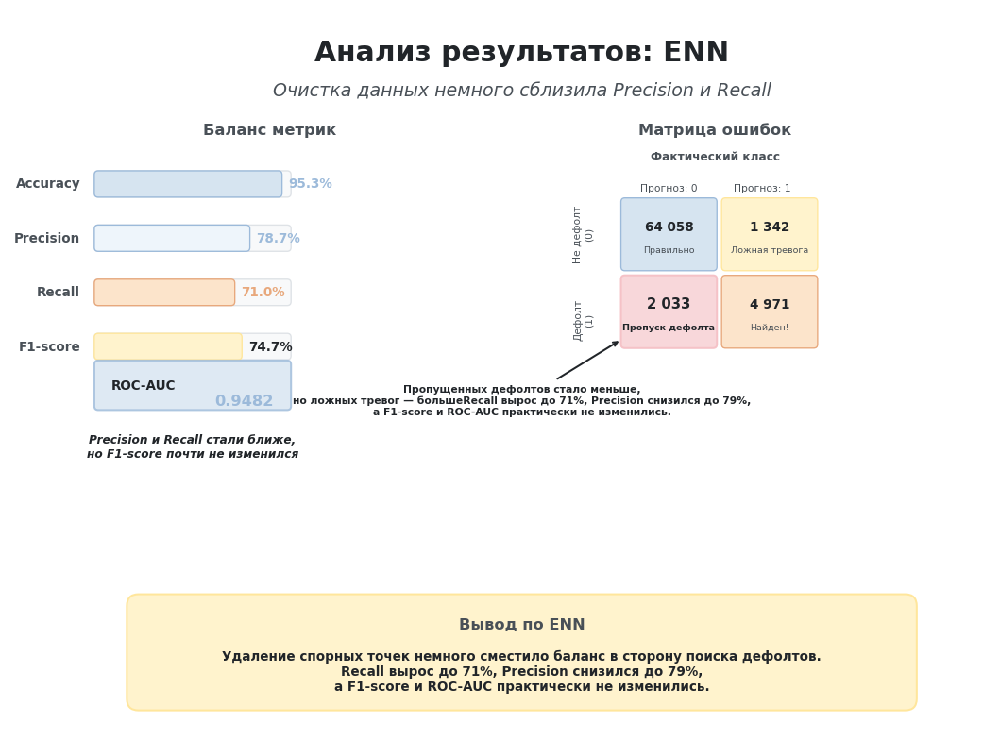

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.2, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Анализ результатов: ENN",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Очистка данных немного сблизила Precision и Recall",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Баланс метрик
# ==========================================
ax.text(2.75, 6.5, "Баланс метрик", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

bar_x_start = 0.5
bar_max_w = 2.5
bar_h = 0.3

# Accuracy (Высокий)
val_acc = 0.9534
ax.text(0.3, 5.8, "Accuracy", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 5.65), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 5.65), bar_max_w * val_acc, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=BLUE_BORDER, facecolor=BLUE))
ax.text(bar_x_start + bar_max_w * val_acc + 0.1, 5.8, "95.3%", ha="left", va="center", fontsize=10*S, weight="bold", color=BLUE_BORDER)

# Precision (Высокий - Голубой)
val_prec = 0.7874
ax.text(0.3, 5.1, "Precision", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 4.95), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 4.95), bar_max_w * val_prec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=BLUE_BORDER, facecolor=LIGHT_BLUE))
ax.text(bar_x_start + bar_max_w * val_prec + 0.1, 5.1, "78.7%", ha="left", va="center", fontsize=10*S, weight="bold", color=BLUE_BORDER)

# Recall (Хороший - Оранжевый)
val_recall = 0.7097
ax.text(0.3, 4.4, "Recall", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 4.25), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 4.25), bar_max_w * val_recall, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE))
ax.text(bar_x_start + bar_max_w * val_recall + 0.1, 4.4, "71.0%", ha="left", va="center", fontsize=10*S, weight="bold", color=ORANGE_BORDER)

# F1-score (Баланс)
val_f1 = 0.7466
ax.text(0.3, 3.7, "F1-score", ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((bar_x_start, 3.55), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((bar_x_start, 3.55), bar_max_w * val_f1, bar_h, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=AMBER_BORDER, facecolor=AMBER))
ax.text(bar_x_start + bar_max_w * val_f1 + 0.1, 3.7, "74.7%", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# ROC-AUC (Отдельным блоком)
ax.add_patch(FancyBboxPatch(
    (0.5, 2.9), 2.5, 0.6,
    boxstyle="round,pad=0.02,rounding_size=0.05",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.8
))
ax.text(0.7, 3.2, "ROC-AUC", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(2.8, 3.0, "0.9482", ha="right", va="center", fontsize=12*S, weight="bold", color=BLUE_BORDER)

# Пояснение
ax.text(1.75, 2.4, "Precision и Recall стали ближе,\nно F1-score почти не изменился", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold", style="italic")


# ==========================================
# ПРАВАЯ ЧАСТЬ: Матрица ошибок (Confusion Matrix)
# ==========================================
ax.text(8.5, 6.5, "Матрица ошибок", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Оси матрицы
ax.text(8.5, 6.15, "Фактический класс", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, weight="bold")
ax.text(6.8, 5.15, "Не дефолт\n(0)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, rotation=90)
ax.text(6.8, 4.05, "Дефолт\n(1)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, rotation=90)

ax.text(7.9, 5.75, "Прогноз: 0", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.text(9.1, 5.75, "Прогноз: 1", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)

# Ячейки матрицы (2x2)
cell_w = 1.2
cell_h = 0.9
start_x = 7.3
start_y = 4.7

# 1. True Negative (Верх-Лево) - 64058 (65400 - 1342)
ax.add_patch(FancyBboxPatch((start_x, start_y), cell_w, cell_h, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
ax.text(start_x + cell_w/2, start_y + cell_h/2 + 0.1, "64 058", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(start_x + cell_w/2, start_y + cell_h/2 - 0.2, "Правильно", ha="center", va="center", fontsize=7*S, color=TEXT_MUTED)

# 2. False Positive (Верх-Право) - 1342 (Ложная тревога)
ax.add_patch(FancyBboxPatch((start_x + cell_w + 0.1, start_y), cell_w, cell_h, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=AMBER, edgecolor=AMBER_BORDER, linewidth=1*S))
ax.text(start_x + cell_w + 0.1 + cell_w/2, start_y + cell_h/2 + 0.1, "1 342", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(start_x + cell_w + 0.1 + cell_w/2, start_y + cell_h/2 - 0.2, "Ложная тревога", ha="center", va="center", fontsize=7*S, color=TEXT_MUTED)

# 3. False Negative (Низ-Лево) - 2033 (Пропуск - Красный)
ax.add_patch(FancyBboxPatch((start_x, start_y - cell_h - 0.1), cell_w, cell_h, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=RED_FILL, edgecolor=RED_BORDER, linewidth=1.5*S))
ax.text(start_x + cell_w/2, start_y - cell_h - 0.1 + cell_h/2 + 0.1, "2 033", ha="center", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(start_x + cell_w/2, start_y - cell_h - 0.1 + cell_h/2 - 0.2, "Пропуск дефолта", ha="center", va="center", fontsize=7*S, color=TEXT_DARK, weight="bold")

# 4. True Positive (Низ-Право) - 4971
ax.add_patch(FancyBboxPatch((start_x + cell_w + 0.1, start_y - cell_h - 0.1), cell_w, cell_h, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=ORANGE, edgecolor=ORANGE_BORDER, linewidth=1*S))
ax.text(start_x + cell_w + 0.1 + cell_w/2, start_y - cell_h - 0.1 + cell_h/2 + 0.1, "4 971", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(start_x + cell_w + 0.1 + cell_w/2, start_y - cell_h - 0.1 + cell_h/2 - 0.2, "Найден!", ha="center", va="center", fontsize=7*S, color=TEXT_MUTED)

# Акцент на баланс
ax.annotate("Пропущенных дефолтов стало меньше,\nно ложных тревог — больше""Recall вырос до 71%, Precision снизился до 79%,\nа F1-score и ROC-AUC практически не изменились.", xy=(7.3, 3.8), xytext=(6.0, 3.0),
            ha="center", va="center", fontsize=8*S, color=TEXT_DARK, weight="bold",
            arrowprops=dict(arrowstyle="->", color=TEXT_DARK, lw=1.5*S))


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -0.9), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.1, "Вывод по ENN",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.5, "Удаление спорных точек немного сместило баланс в сторону поиска дефолтов.\nRecall вырос до 71%, Precision снизился до 79%,\nа F1-score и ROC-AUC практически не изменились.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

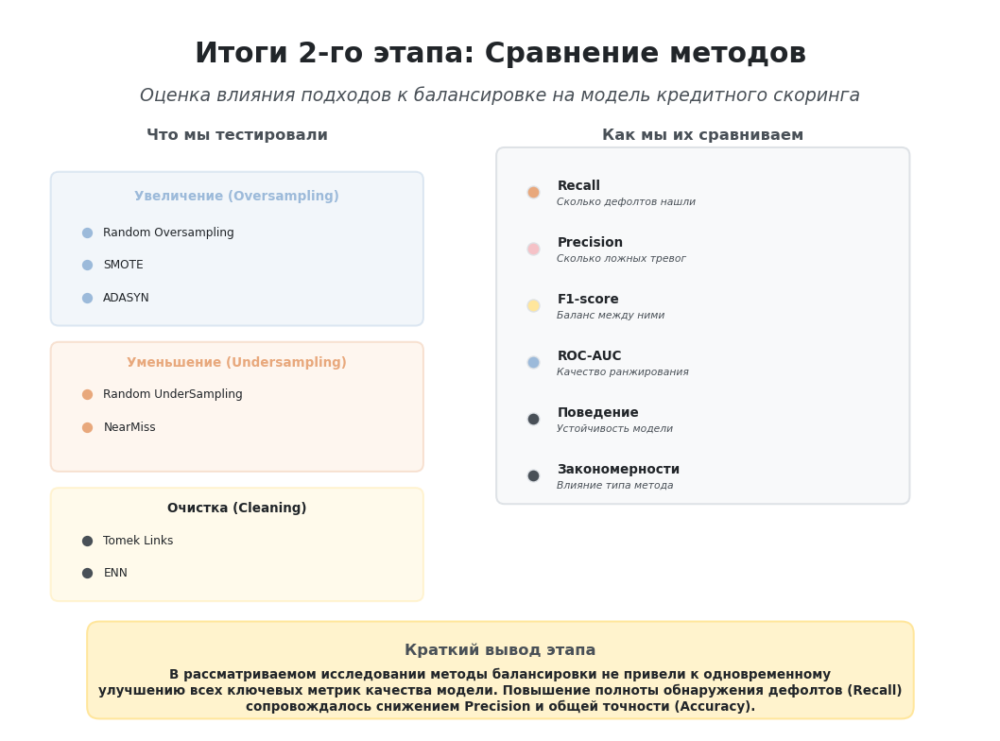

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-0.8, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Итоги 2-го этапа: Сравнение методов",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Оценка влияния подходов к балансировке на модель кредитного скоринга",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Арсенал методов (Что тестировали)
# ==========================================
ax.text(2.75, 6.5, "Что мы тестировали", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Группа 1: Увеличение (Oversampling) ---
ax.add_patch(FancyBboxPatch((0.5, 4.2), 4.5, 1.8, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.3))
ax.text(2.75, 5.75, "Увеличение (Oversampling)", ha="center", va="center", fontsize=10*S, weight="bold", color=BLUE_BORDER)
ax.scatter([0.9, 0.9, 0.9], [5.3, 4.9, 4.5], s=30*S, c=BLUE_BORDER, zorder=3)
ax.text(1.1, 5.3, "Random Oversampling", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(1.1, 4.9, "SMOTE", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(1.1, 4.5, "ADASYN", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)

# --- Группа 2: Уменьшение (Undersampling) ---
ax.add_patch(FancyBboxPatch((0.5, 2.4), 4.5, 1.5, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE, alpha=0.3))
ax.text(2.75, 3.7, "Уменьшение (Undersampling)", ha="center", va="center", fontsize=10*S, weight="bold", color=ORANGE_BORDER)
ax.scatter([0.9, 0.9], [3.3, 2.9], s=30*S, c=ORANGE_BORDER, zorder=3)
ax.text(1.1, 3.3, "Random UnderSampling", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(1.1, 2.9, "NearMiss", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)

# --- Группа 3: Очистка (Cleaning) ---
ax.add_patch(FancyBboxPatch((0.5, 0.8), 4.5, 1.3, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER, alpha=0.4))
ax.text(2.75, 1.9, "Очистка (Cleaning)", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.scatter([0.9, 0.9], [1.5, 1.1], s=30*S, c=TEXT_MUTED, zorder=3)
ax.text(1.1, 1.5, "Tomek Links", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(1.1, 1.1, "ENN", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)


# ==========================================
# ПРАВАЯ ЧАСТЬ: Критерии оценки (Как сравниваем)
# ==========================================
ax.text(8.5, 6.5, "Как мы их сравниваем", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Блок метрик
ax.add_patch(FancyBboxPatch((6.0, 2.0), 5.0, 4.3, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor=GRAY))

prec_color = "#F5C2C7"

for name, desc, color, y_pos in [
    ("Recall", "Сколько дефолтов нашли", ORANGE_BORDER, 5.8),
    ("Precision", "Сколько ложных тревог", prec_color, 5.1),
    ("F1-score", "Баланс между ними", AMBER_BORDER, 4.4),
    ("ROC-AUC", "Качество ранжирования", BLUE_BORDER, 3.7),
    ("Поведение", "Устойчивость модели", TEXT_MUTED, 3.0),
    ("Закономерности", "Влияние типа метода", TEXT_MUTED, 2.3)
]:
    ax.scatter([6.4], [y_pos], s=60*S, c=color, edgecolors=GRAY_BORDER, linewidths=1*S, zorder=3)
    ax.text(6.7, y_pos+0.08, name, ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
    ax.text(6.7, y_pos-0.12, desc, ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ---------- Итоговый блок (Краткий вывод этапа) ----------
res_box = FancyBboxPatch(
    (1.0, -0.6), 10.0, 1.0,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.15, "Краткий вывод этапа",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.35, "В рассматриваемом исследовании методы балансировки не привели к одновременному\nулучшению всех ключевых метрик качества модели. Повышение полноты обнаружения дефолтов (Recall)\nсопровождалось снижением Precision и общей точности (Accuracy).",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

### Вывод по результатам применения метода Edited Nearest Neighbours (ENN)

Метод **Edited Nearest Neighbours (ENN)** выполнил более активную очистку обучающей выборки по сравнению с Tomek Links, удалив объекты, класс которых не совпадал с большинством ближайших соседей.

После обучения логистической регрессии были получены следующие результаты: **Accuracy 95,34 %**, **Precision 78,74 %**, **Recall 70,97 %**, **F1-score 0,7466** и **ROC-AUC 0,9482**.

По сравнению с методом Tomek Links ENN позволил увеличить Recall при некотором снижении Precision. При этом значения Accuracy, F1-score и ROC-AUC остались высокими и близкими к результатам базовой модели.

Полученные результаты показывают, что более активная очистка обучающей выборки не привела к существенному изменению качества логистической регрессии. Несмотря на удаление значительно большего количества объектов, модель сохранила практически ту же способность ранжировать организации по уровню кредитного риска.

Таким образом, метод ENN оказался эффективнее Tomek Links с точки зрения обнаружения дефолтов, однако его преимущества по сравнению с ранее рассмотренными методами балансировки оказались ограниченными.


### Переход к сравнительному анализу

В ходе практической части исследования были последовательно рассмотрены:

* базовая модель без балансировки;
* методы увеличения выборки;
* методы уменьшения выборки;
* методы очистки границы между классами.

Для каждого подхода логистическая регрессия обучалась в одинаковых условиях, а качество модели оценивалось по единому набору метрик.

Теперь полученные результаты можно сопоставить и определить, как различные способы работы с дисбалансом повлияли на поведение модели.



# Глава 22. Сравнительный анализ результатов исследования

## Что мы будем проверять?

Основная цель сравнительного анализа заключается не только в выборе метода, показавшего наиболее высокие значения отдельных метрик.

Главный исследовательский вопрос формулируется следующим образом:

> **Является ли обнаруженный дисбаланс классов существенным препятствием для построения модели кредитного скоринга или исходное распределение классов можно считать допустимым для рассматриваемой задачи?**

Для ответа на этот вопрос необходимо сопоставить результаты базовой модели и всех рассмотренных методов работы с дисбалансом классов.

В ходе сравнительного анализа предстоит определить:

* привела ли балансировка к устойчивому улучшению качества модели;
* какие метрики изменялись сильнее всего;
* сопровождалось ли увеличение Recall снижением Precision;
* сохранилась ли способность модели ранжировать организации по уровню риска;
* оправдано ли изменение исходного распределения классов для поставленной задачи.

Особое внимание будет уделено не отдельной метрике, а общему характеру изменений. Это позволит оценить, действительно ли дисбаланс мешает модели выявлять закономерности или главным образом влияет на выбор порога и соотношение ошибок разных типов.


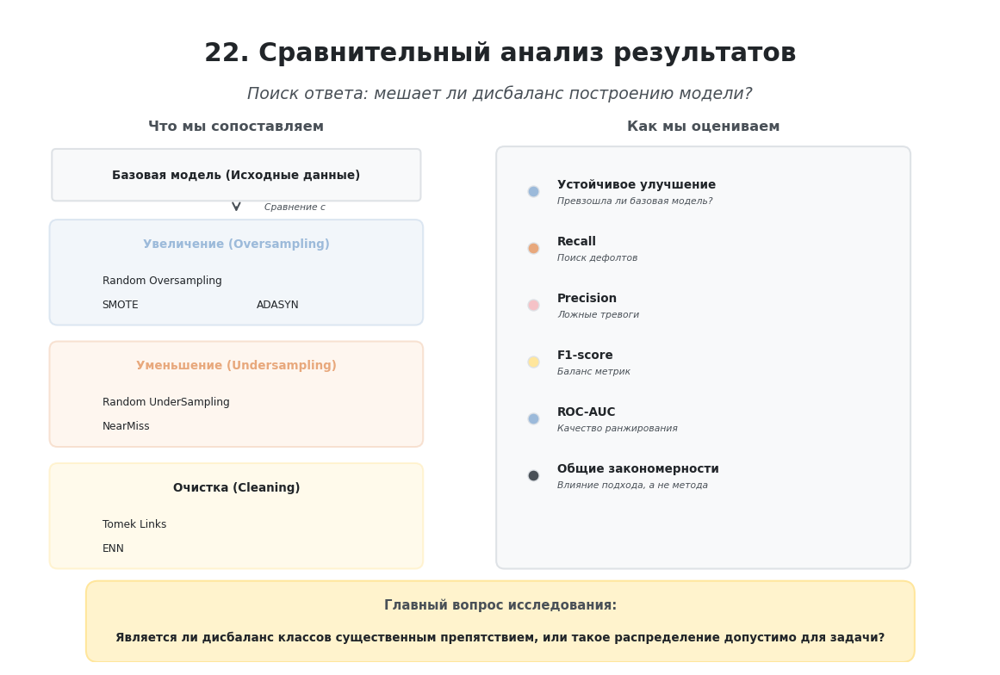

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "22. Сравнительный анализ результатов",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Поиск ответа: мешает ли дисбаланс построению модели?",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Что мы сопоставляем
# ==========================================
ax.text(2.75, 6.6, "Что мы сопоставляем", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Базовая модель (Отправная точка) ---
ax.add_patch(FancyBboxPatch((0.5, 5.7), 4.5, 0.6, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.text(2.75, 6.0, "Базовая модель (Исходные данные)", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# Стрелка вниз
ax.annotate("", xy=(2.75, 5.5), xytext=(2.75, 5.65), arrowprops=dict(arrowstyle="->", color=TEXT_MUTED, lw=1.5*S))
ax.text(3.1, 5.6, "Сравнение с", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# --- Группа 1: Увеличение (Oversampling) ---
ax.add_patch(FancyBboxPatch((0.5, 4.2), 4.5, 1.2, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.3))
ax.text(2.75, 5.15, "Увеличение (Oversampling)", ha="center", va="center", fontsize=10*S, weight="bold", color=BLUE_BORDER)
ax.text(1.1, 4.7, "Random Oversampling", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(1.1, 4.4, "SMOTE", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(3.0, 4.4, "ADASYN", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)

# --- Группа 2: Уменьшение (Undersampling) ---
ax.add_patch(FancyBboxPatch((0.5, 2.7), 4.5, 1.2, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE, alpha=0.3))
ax.text(2.75, 3.65, "Уменьшение (Undersampling)", ha="center", va="center", fontsize=10*S, weight="bold", color=ORANGE_BORDER)
ax.text(1.1, 3.2, "Random UnderSampling", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(1.1, 2.9, "NearMiss", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)

# --- Группа 3: Очистка (Cleaning) ---
ax.add_patch(FancyBboxPatch((0.5, 1.2), 4.5, 1.2, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER, alpha=0.4))
ax.text(2.75, 2.15, "Очистка (Cleaning)", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(1.1, 1.7, "Tomek Links", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(1.1, 1.4, "ENN", ha="left", va="center", fontsize=9*S, color=TEXT_DARK)


# ==========================================
# ПРАВАЯ ЧАСТЬ: Критерии оценки
# ==========================================
ax.text(8.5, 6.6, "Как мы оцениваем", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Блок метрик
ax.add_patch(FancyBboxPatch((6.0, 1.2), 5.0, 5.1, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor=GRAY))

# Критерии
criteria = [
    ("Устойчивое улучшение", "Превзошла ли базовая модель?", BLUE_BORDER, 5.8),
    ("Recall", "Поиск дефолтов", ORANGE_BORDER, 5.1),
    ("Precision", "Ложные тревоги", "#F5C2C7", 4.4),
    ("F1-score", "Баланс метрик", AMBER_BORDER, 3.7),
    ("ROC-AUC", "Качество ранжирования", BLUE_BORDER, 3.0),
    ("Общие закономерности", "Влияние подхода, а не метода", TEXT_MUTED, 2.3)
]

for name, desc, color, y_pos in criteria:
    ax.scatter([6.4], [y_pos], s=60*S, c=color, edgecolors=GRAY_BORDER, linewidths=1*S, zorder=3)
    ax.text(6.7, y_pos+0.08, name, ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
    ax.text(6.7, y_pos-0.12, desc, ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ---------- Итоговый блок (Новый Главный вопрос) ----------
res_box = FancyBboxPatch(
    (1.0, 0.1), 10.0, 0.8,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.7, "Главный вопрос исследования:",
    ha="center", va="center",
    fontsize=11*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, 0.3, "Является ли дисбаланс классов существенным препятствием, или такое распределение допустимо для задачи?",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

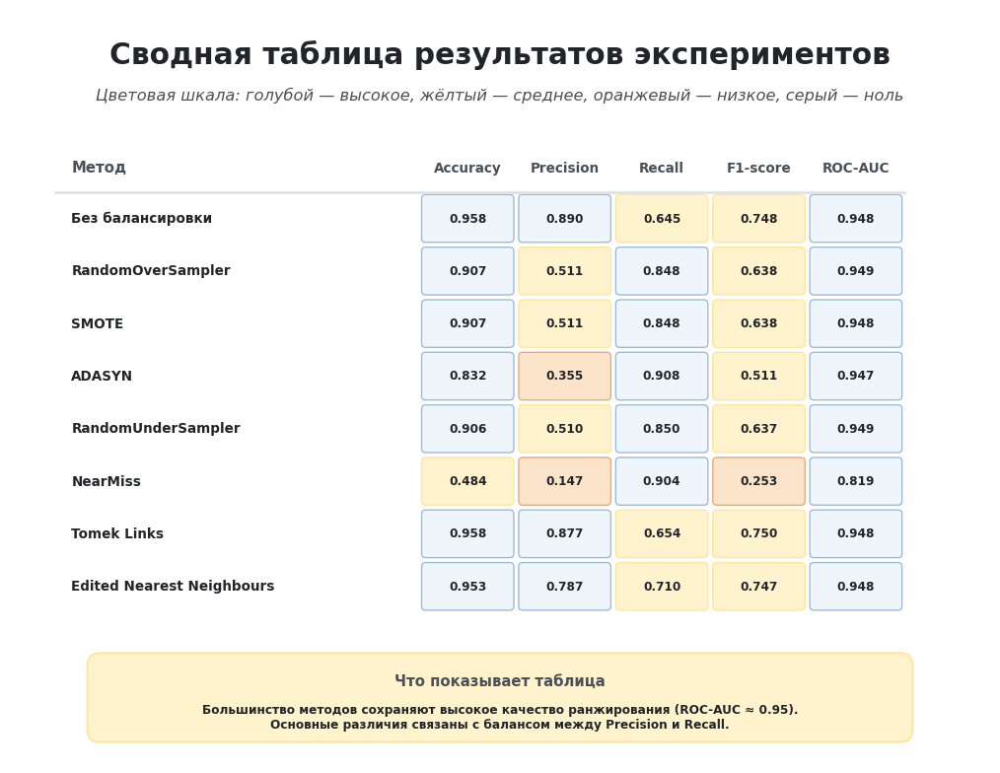

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.2, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Сводная таблица результатов экспериментов",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Цветовая шкала: голубой — высокое, жёлтый — среднее, оранжевый — низкое, серый — ноль",
    ha="center", va="center",
    fontsize=12*S, color=TEXT_MUTED, style="italic"
)

# ---------- Данные ----------
methods = [
    "Без балансировки",
    "RandomOverSampler",
    "SMOTE",
    "ADASYN",
    "RandomUnderSampler",
    "NearMiss",
    "Tomek Links",
    "Edited Nearest Neighbours"
]
headers = ["Accuracy", "Precision", "Recall", "F1-score", "ROC-AUC"]
data = [
    [
        accuracy_base,
        precision_base,
        recall_base,
        f1_base,
        roc_auc_base
    ],
    [
        accuracy_ros,
        precision_ros,
        recall_ros,
        f1_ros,
        roc_auc_ros
    ],
    [
        accuracy_smote,
        precision_smote,
        recall_smote,
        f1_smote,
        roc_auc_smote
    ],
    [
        accuracy_adasyn,
        precision_adasyn,
        recall_adasyn,
        f1_adasyn,
        roc_auc_adasyn
    ],
    [
        accuracy_rus,
        precision_rus,
        recall_rus,
        f1_rus,
        roc_auc_rus
    ],
    [
        accuracy_nm,
        precision_nm,
        recall_nm,
        f1_nm,
        roc_auc_nm
    ],
    [
        accuracy_tl,
        precision_tl,
        recall_tl,
        f1_tl,
        roc_auc_tl
    ],
    [
        accuracy_enn,
        precision_enn,
        recall_enn,
        f1_enn,
        roc_auc_enn
    ]
]

# ---------- Логика цветов ----------
def get_color(val):
    if val == 0.0:
        return GRAY, GRAY_BORDER
    elif val < 0.4:
        return ORANGE, ORANGE_BORDER
    elif val < 0.75:
        return AMBER, AMBER_BORDER
    else:
        return LIGHT_BLUE, BLUE_BORDER

# ---------- Отрисовка таблицы ----------
# Координаты сетки
col_x = [0.5, 5.0, 6.2, 7.4, 8.6, 9.8] # X начала каждого столбца
col_w = [4.5, 1.2, 1.2, 1.2, 1.2, 1.2]  # Ширина столбцов
row_top_y = 6.4
row_h = 0.65

# Заголовки таблицы
ax.text(col_x[0] + 0.2, row_top_y - 0.3, "Метод", ha="left", va="center", fontsize=11*S, weight="bold", color=TEXT_MUTED)
for j, header in enumerate(headers):
    ax.text(col_x[j+1] + col_w[j+1]/2, row_top_y - 0.3, header, ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)

# Линия под заголовками
ax.plot([0.5, 11.0], [row_top_y - 0.6, row_top_y - 0.6], color=GRAY_BORDER, linewidth=2*S)

# Строки с данными
for i, method in enumerate(methods):
    y_center = row_top_y - 0.6 - (i + 0.5) * row_h

    # Имя метода
    ax.text(col_x[0] + 0.2, y_center, method, ha="left", va="center", fontsize=10*S, color=TEXT_DARK, weight="bold")

    # Ячейки метрик
    for j, val in enumerate(data[i]):
        cell_x = col_x[j+1]
        cell_w = col_w[j+1]
        facecolor, edgecolor = get_color(val)

        # Рисуем ячейку
        ax.add_patch(FancyBboxPatch(
            (cell_x + 0.05, y_center - row_h/2 + 0.05), cell_w - 0.1, row_h - 0.1,
            boxstyle="round,pad=0.02,rounding_size=0.05",
            linewidth=1*S, edgecolor=edgecolor, facecolor=facecolor
        ))

        # Текст значения
        val_text = f"{val:.3f}" if val > 0 else "0.000"
        ax.text(cell_x + cell_w/2, y_center, val_text, ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# ---------- Итоговый блок (Вывод по таблице) ----------
res_box = FancyBboxPatch(
    (1.0, -0.9), 10.0, 0.9,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, -0.25, "Что показывает таблица",
    ha="center", va="center",
    fontsize=11*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.7,
    "Большинство методов сохраняют высокое качество ранжирования (ROC-AUC ≈ 0.95).\n"
    "Основные различия связаны с балансом между Precision и Recall.",
    ha="center",
    va="center",
    fontsize=9*S,
    color=TEXT_DARK,
    weight="bold"
)

plt.tight_layout()
plt.show()

## Анализ результатов

Сравнение результатов всех проведённых экспериментов показывает, что различные методы работы с дисбалансом классов по-разному изменили поведение логистической регрессии.

Базовая модель без балансировки продемонстрировала высокие значения Accuracy, Precision и ROC-AUC. Она хорошо ранжировала рискованные организации выше надёжных и редко ошибочно относила надёжные компании к классу дефолта. При этом Recall составил **64,52 %**, то есть модель обнаружила примерно две трети всех реальных дефолтов.

Методы **RandomOverSampler**, **SMOTE** и **RandomUnderSampler** показали очень близкие результаты. Во всех трёх случаях Recall увеличился примерно до **85 %**, что означает более полное обнаружение дефолтных организаций. Однако это сопровождалось снижением Precision примерно до **51 %**. Таким образом, модель стала находить больше дефолтов, но одновременно заметно увеличилось количество ложноположительных прогнозов.

Метод **ADASYN** сильнее остальных сместил модель в сторону обнаружения положительного класса. Recall достиг **90,82 %**, однако Precision снизился до **35,54 %**. Модель обнаружила почти все дефолты, но значительная часть организаций, признанных рискованными, в действительности не относилась к классу дефолта.

Метод **NearMiss** также обеспечил высокий Recall — **90,42 %**, однако привёл к наиболее сильному ухудшению общего качества модели. Precision снизился до **14,72 %**, Accuracy — до **48,41 %**, а ROC-AUC — до **0,8187**. Это показывает, что отбор только объектов, расположенных вблизи границы классов, привёл к потере важной информации и ухудшил способность модели ранжировать кредитный риск.

Метод **Tomek Links** практически не изменил поведение базовой модели. Recall составил **65,43 %**, Precision — **87,71 %**, а ROC-AUC сохранился на уровне **0,9480**. Это связано с тем, что метод удалил лишь небольшую часть пограничных объектов и не устранил выраженный дисбаланс классов.

Метод **Edited Nearest Neighbours** выполнил более активную очистку обучающей выборки. Recall увеличился до **70,97 %**, а Precision снизился до **78,74 %**. При этом ROC-AUC остался высоким и составил **0,9482**. Следовательно, ENN немного изменил баланс между ошибками разных типов, но не привёл к существенному изменению способности модели ранжировать организации по уровню риска.

>**Важной общей закономерностью стало то, что у большинства методов значение ROC-AUC осталось примерно на уровне **0,95**. Это означает, что балансировка в основном не улучшала внутреннюю способность логистической регрессии различать классы, а изменяла соотношение между Precision и Recall при использовании стандартного порога классификации.**

Таким образом, методы балансировки позволяли повысить долю обнаруженных дефолтов, но это почти всегда сопровождалось увеличением количества ложноположительных прогнозов.

>Единственного метода, который одновременно улучшил бы Recall, Precision, F1-score, Accuracy и ROC-AUC, обнаружено не было.

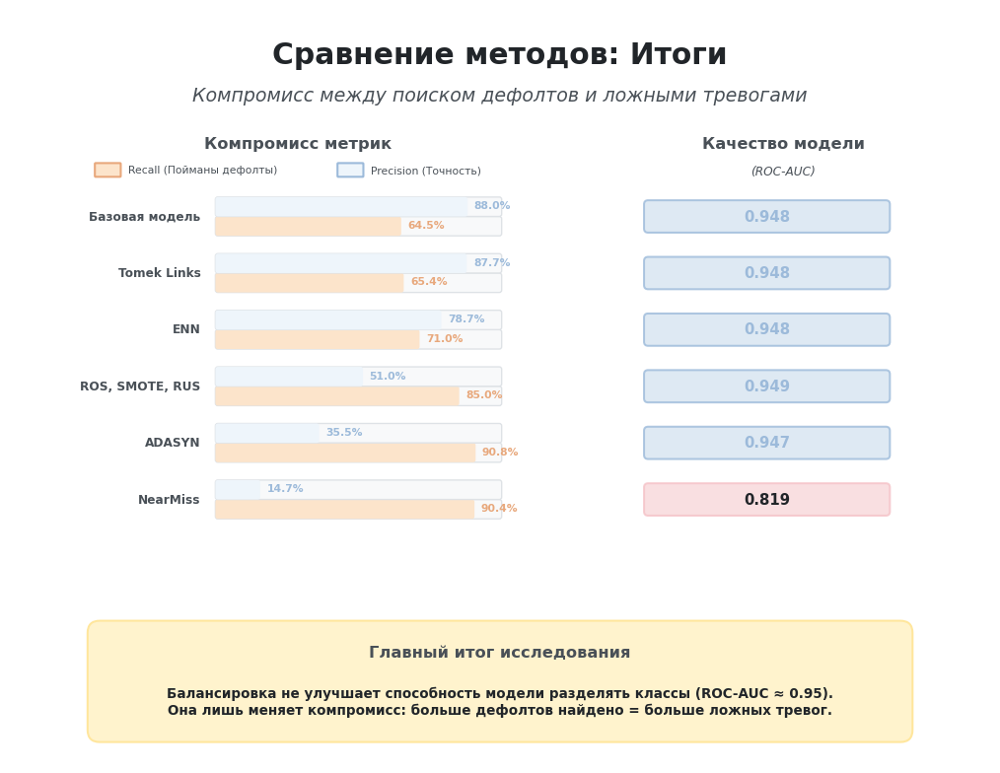

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.2, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Сравнение методов: Итоги",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Компромисс между поиском дефолтов и ложными тревогами",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Шкала компромисса (Recall vs Precision)
# ==========================================
ax.text(3.5, 6.4, "Компромисс метрик", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Легенда
ax.add_patch(FancyBboxPatch((1.0, 6.0), 0.3, 0.15, boxstyle="round,pad=0.01", facecolor=ORANGE, edgecolor=ORANGE_BORDER))
ax.text(1.4, 6.07, "Recall (Пойманы дефолты)", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((4.0, 6.0), 0.3, 0.15, boxstyle="round,pad=0.01", facecolor=LIGHT_BLUE, edgecolor=BLUE_BORDER))
ax.text(4.4, 6.07, "Precision (Точность)", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED)

bar_x_start = 2.5
bar_max_w = 3.5
bar_h = 0.2

# Данные: (Название, Recall, Precision, Y_pos)
methods_data = [
    ("Базовая модель", 0.645, 0.880, 5.5),
    ("Tomek Links", 0.654, 0.877, 4.8),
    ("ENN", 0.710, 0.787, 4.1),
    ("ROS, SMOTE, RUS", 0.850, 0.510, 3.4),
    ("ADASYN", 0.908, 0.355, 2.7),
    ("NearMiss", 0.904, 0.147, 2.0)
]

for name, rec, prec, y_pos in methods_data:
    # Название метода
    ax.text(2.3, y_pos, name, ha="right", va="center", fontsize=9*S, weight="bold", color=TEXT_MUTED)

    # Фон шкалы
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.22), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    # Заполнение Recall (Оранжевый)
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.22), bar_max_w * rec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=ORANGE, edgecolor=ORANGE_BORDER))
    ax.text(bar_x_start + bar_max_w * rec + 0.1, y_pos - 0.11, f"{rec*100:.1f}%", ha="left", va="center", fontsize=8*S, weight="bold", color=ORANGE_BORDER)

    # Фон шкалы (для Precision)
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos + 0.02), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    # Заполнение Precision (Голубой)
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos + 0.02), bar_max_w * prec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=LIGHT_BLUE, edgecolor=BLUE_BORDER))
    ax.text(bar_x_start + bar_max_w * prec + 0.1, y_pos + 0.13, f"{prec*100:.1f}%", ha="left", va="center", fontsize=8*S, weight="bold", color=BLUE_BORDER)


# ==========================================
# ПРАВАЯ ЧАСТЬ: Качество ранжирования (ROC-AUC)
# ==========================================
ax.text(9.5, 6.4, "Качество модели", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)
ax.text(9.5, 6.05, "(ROC-AUC)", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, style="italic")

auc_values = [0.948, 0.948, 0.948, 0.949, 0.947, 0.819]

for (name, rec, prec, y_pos), auc in zip(methods_data, auc_values):
    auc_color = RED_FILL if auc < 0.90 else BLUE
    auc_border = RED_BORDER if auc < 0.90 else BLUE_BORDER
    auc_text_color = TEXT_DARK if auc < 0.90 else BLUE_BORDER

    ax.add_patch(FancyBboxPatch(
        (7.8, y_pos - 0.18), 3.0, 0.36,
        boxstyle="round,pad=0.02,rounding_size=0.05",
        linewidth=1.5*S, edgecolor=auc_border, facecolor=auc_color, alpha=0.8
    ))
    ax.text(9.3, y_pos, f"{auc:.3f}", ha="center", va="center", fontsize=11*S, weight="bold", color=auc_text_color)


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -0.9), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.1, "Главный итог исследования",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.5, "Балансировка не улучшает способность модели разделять классы (ROC-AUC ≈ 0.95).\nОна лишь меняет компромисс: больше дефолтов найдено = больше ложных тревог.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

## Ответ на основной исследовательский вопрос

Проведённое исследование показало, что наличие дисбаланса классов в рассматриваемом наборе данных не делает логистическую регрессию неспособной выявлять закономерности кредитного риска.

Базовая модель, обученная на исходных данных, продемонстрировала высокий показатель ROC-AUC и высокую точность положительных прогнозов. Это означает, что даже без балансировки модель достаточно хорошо ранжирует рискованные организации выше надёжных.

Применение методов балансировки действительно позволило повысить Recall, то есть увеличить долю обнаруженных дефолтов. Однако это улучшение сопровождалось снижением Precision и ростом количества ложноположительных прогнозов. Иными словами, модель начинала обнаруживать больше потенциально рискованных организаций, но одновременно чаще ошибочно относила к дефолтному классу надёжные компании.

Поэтому влияние дисбаланса нельзя оценивать только по тому, насколько увеличился Recall. В задачах кредитного скоринга необходимо учитывать стоимость ошибок обоих типов:

- пропущенный дефолт может привести к финансовым потерям;
- ложное отнесение надёжной организации к дефолтному классу может привести к отказу потенциально надёжному клиенту.

Полученные результаты позволяют сделать вывод, что исходный дисбаланс классов не является критическим препятствием для обучения логистической регрессии. При этом нельзя утверждать, что балансировка вообще не нужна. Её целесообразность зависит от бизнес-задачи, допустимого количества ложноположительных прогнозов и требуемой полноты обнаружения дефолтов.

Таким образом, решение о применении балансировки должно приниматься не только на основании соотношения классов, но и на основании экспериментального сравнения моделей, анализа Precision и Recall, выбора порога классификации и оценки стоимости ошибок разных типов.

## Переход к следующему этапу исследования

Экспериментальная часть, посвящённая исследованию дисбаланса классов на примере логистической регрессии, завершена.

Проведённые эксперименты позволили определить, как различные методы увеличения, уменьшения и очистки обучающей выборки влияют на Accuracy, Precision, Recall, F1-score и ROC-AUC. Полученные результаты показали, что балансировка в первую очередь изменяет соотношение между ложноположительными и ложноотрицательными прогнозами, но не всегда повышает общее качество классификации.

Однако сделанные выводы относятся к конкретному алгоритму — логистической регрессии. Другие модели машинного обучения могут иначе реагировать на дисбаланс классов, поскольку способны выявлять более сложные и нелинейные зависимости между признаками.

Следующим этапом работы станет исследование других алгоритмов, в том числе **CatBoost**, и сравнение их поведения на исходных и сбалансированных данных. Это позволит определить, являются ли обнаруженные закономерности особенностью рассматриваемого набора данных или связаны прежде всего с ограничениями логистической регрессии.

# Глава 23. Универсальная инфраструктура обучения и оценки моделей

В предыдущих главах влияние различных методов обработки дисбаланса классов было исследовано на примере логистической регрессии.

Каждый эксперимент выполнялся отдельно: модель обучалась на одном из подготовленных вариантов данных, после чего рассчитывались метрики качества и анализировалось изменение результатов.

Такой подход позволил подробно изучить отдельные методы балансировки, однако при переходе к сравнению нескольких алгоритмов машинного обучения ручное повторение одного и того же кода становится неэффективным и повышает риск методологических ошибок.

Например, в разных экспериментах могут случайно использоваться:

* разные тестовые выборки;
* разные способы расчёта метрик;
* разные названия методов балансировки;
* разные структуры хранения результатов;
* ранее обученные экземпляры моделей.

Для исключения таких различий в данной главе будет создана единая экспериментальная инфраструктура.

Она должна обеспечить следующие условия:

1. все алгоритмы оцениваются на одной и той же неизменной тестовой выборке;
2. для каждой модели используются одинаковые варианты обучающих данных;
3. каждый эксперимент начинается с нового необученного экземпляра модели;
4. метрики рассчитываются по единой процедуре;
5. результаты сохраняются в стандартизированном формате;
6. новые алгоритмы можно добавлять без копирования основной логики эксперимента.

Созданная инфраструктура станет основой для последующего сравнения логистической регрессии, CatBoost и других алгоритмов машинного обучения.


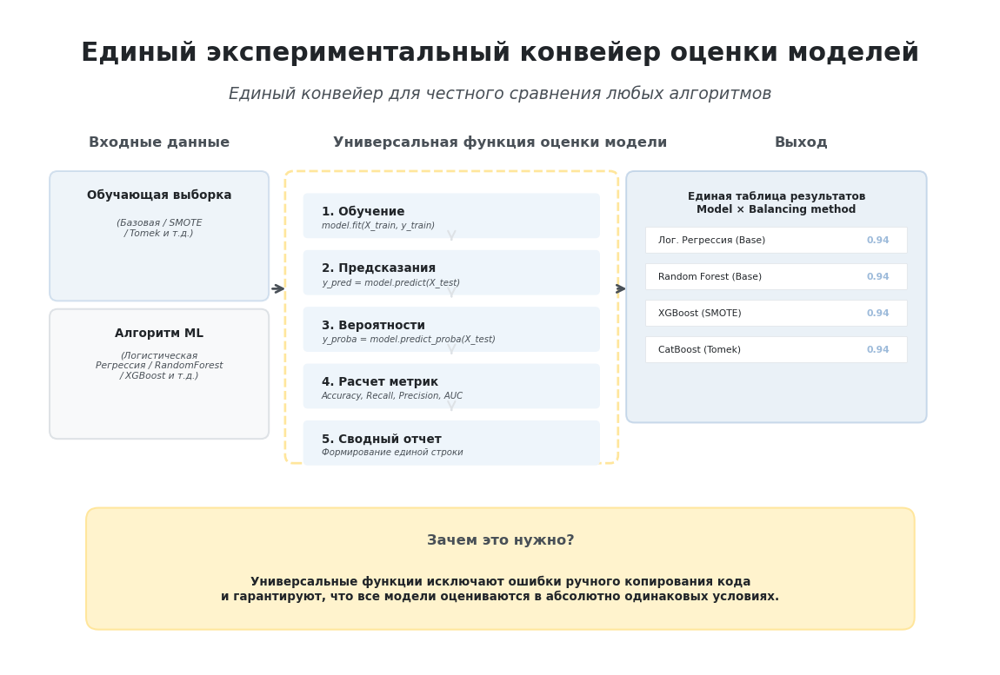

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Единый экспериментальный конвейер оценки моделей",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Единый конвейер для честного сравнения любых алгоритмов",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Входные данные (Что мы меняем)
# ==========================================
ax.text(1.8, 6.4, "Входные данные", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Блок Данных
ax.add_patch(FancyBboxPatch((0.5, 4.5), 2.6, 1.5, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.4))
ax.text(1.8, 5.75, "Обучающая выборка", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(1.8, 5.35, "(Базовая / SMOTE\n/ Tomek и т.д.)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# Блок Алгоритма (Любой)
ax.add_patch(FancyBboxPatch((0.5, 2.8), 2.6, 1.5, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.text(1.8, 4.05, "Алгоритм ML", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(1.8, 3.65, "(Логистическая\nРегрессия / RandomForest\n/ XGBoost и т.д.)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# Стрелка к конвейеру
ax.annotate("", xy=(3.4, 4.6), xytext=(3.15, 4.6),
            arrowprops=dict(arrowstyle="->", color=TEXT_MUTED, lw=2*S))

# ==========================================
# ЦЕНТРАЛЬНАЯ ЧАСТЬ: Сам Конвейер (5 шагов)
# ==========================================
ax.text(6.0, 6.4, "Универсальная функция оценки модели", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Контур конвейера
ax.add_patch(FancyBboxPatch((3.4, 2.5), 4.0, 3.5, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=2*S, edgecolor=AMBER_BORDER, facecolor="white", linestyle="--"))

steps = [
    ("1. Обучение", "model.fit(X_train, y_train)", 5.5),
    ("2. Предсказания", "y_pred = model.predict(X_test)", 4.8),
    ("3. Вероятности", "y_proba = model.predict_proba(X_test)", 4.1),
    ("4. Расчет метрик", "Accuracy, Recall, Precision, AUC", 3.4),
    ("5. Сводный отчет", "Формирование единой строки", 2.7)
]

for title, code, y_pos in steps:
    ax.add_patch(FancyBboxPatch((3.6, y_pos - 0.25), 3.6, 0.5, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=LIGHT_BLUE if 'LIGHT_BLUE' in dir() else "#EEF5FB", facecolor=LIGHT_BLUE))
    ax.text(3.8, y_pos+0.05, title, ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
    ax.text(3.8, y_pos-0.12, code, ha="left", va="center", fontsize=7.5*S, color=TEXT_MUTED, style="italic")

    if y_pos > 3.0:
        ax.annotate("", xy=(5.4, y_pos - 0.3), xytext=(5.4, y_pos - 0.25),
                    arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.5*S))

# ==========================================
# ПРАВАЯ ЧАСТЬ: Выход (Единая таблица)
# ==========================================
ax.text(9.7, 6.4, "Выход", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Стрелка от конвейера к таблице
ax.annotate("", xy=(7.6, 4.6), xytext=(7.4, 4.6),
            arrowprops=dict(arrowstyle="->", color=TEXT_MUTED, lw=2*S))

# Блок Единой таблицы (Leaderboard)
ax.add_patch(FancyBboxPatch((7.6, 3.0), 3.6, 3.0, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.5))
ax.text(9.4, 5.65, "Единая таблица результатов\nModel × Balancing method", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# Имитация строк таблицы
table_rows = [
    "Лог. Регрессия (Base)",
    "Random Forest (Base)",
    "XGBoost (SMOTE)",
    "CatBoost (Tomek)"
]

for i, row in enumerate(table_rows):
    y_table = 5.2 - i * 0.45
    ax.add_patch(FancyBboxPatch((7.8, y_table - 0.15), 3.2, 0.3, boxstyle="round,pad=0.01", facecolor="white", edgecolor=GRAY_BORDER, linewidth=0.5*S))
    ax.text(7.95, y_table, row, ha="left", va="center", fontsize=8*S, color=TEXT_DARK)
    # Имитация цифр
    ax.text(10.8, y_table, "0.94", ha="right", va="center", fontsize=8*S, color=BLUE_BORDER, weight="bold")


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, 0.5), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 1.5, "Зачем это нужно?",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, 0.9, "Универсальные функции исключают ошибки ручного копирования кода\nи гарантируют, что все модели оцениваются в абсолютно одинаковых условиях.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

## 23.1 Подготовка вариантов обучающих данных

Все необходимые варианты обучающей выборки уже были сформированы в предыдущих главах.

Повторно применять методы балансировки на данном этапе не требуется. Вместо этого существующие выборки необходимо объединить в единую структуру, которая будет использоваться универсальными функциями обучения и оценки моделей.

Для хранения вариантов данных создаётся словарь `training_sets`.

В нём:

* ключом является каноническое название метода подготовки данных;
* значением является кортеж из матрицы признаков и целевой переменной;
* порядок элементов соответствует порядку дальнейшего сравнительного анализа.

Перед использованием выборок выполняется техническая проверка:

* существуют ли все необходимые переменные;
* совпадает ли количество объектов в признаках и целевой переменной;
* совпадает ли количество признаков;
* сохранены ли только классы `0` и `1`;
* корректно ли определяется распределение классов.

На данном этапе модели не обучаются и метрики качества не рассчитываются.

In [ ]:
# ==========================================================
# Формирование единой структуры обучающих выборок
# ==========================================================

# В задаче кредитного скоринга:
# 0 — отсутствие дефолта;
# 1 — дефолт.

import pandas as pd

NEGATIVE_CLASS = 0
POSITIVE_CLASS = 1

EXPECTED_CLASSES = {
    NEGATIVE_CLASS,
    POSITIVE_CLASS
}


# ----------------------------------------------------------
# 1. Проверка наличия необходимых переменных
# ----------------------------------------------------------
# Сначала проверяем, что все подготовленные ранее выборки
# существуют в текущей среде выполнения Notebook.
#
# Это позволяет получить понятную ошибку, если предыдущие
# ячейки не были выполнены или какая-либо переменная
# была случайно удалена или переименована.
# ----------------------------------------------------------

required_variables = [
    "X_train",
    "y_train",
    "X_train_ros",
    "y_train_ros",
    "X_train_smote",
    "y_train_smote",
    "X_train_adasyn",
    "y_train_adasyn",
    "X_train_rus",
    "y_train_rus",
    "X_train_nm",
    "y_train_nm",
    "X_train_tl",
    "y_train_tl",
    "X_train_enn",
    "y_train_enn"
]

missing_variables = [
    variable_name
    for variable_name in required_variables
    if variable_name not in globals()
]

if missing_variables:
    raise NameError(
        "Не найдены необходимые переменные: "
        + ", ".join(missing_variables)
        + ". Выполните предыдущие ячейки Notebook."
    )


# ----------------------------------------------------------
# 2. Создание словаря обучающих выборок
# ----------------------------------------------------------
# Названия методов будут использоваться далее:
# - в функциях запуска экспериментов;
# - в общей таблице результатов;
# - в сравнительном анализе моделей.
# ----------------------------------------------------------

training_sets = {
    "Baseline": (
        X_train,
        y_train
    ),
    "RandomOverSampler": (
        X_train_ros,
        y_train_ros
    ),
    "SMOTE": (
        X_train_smote,
        y_train_smote
    ),
    "ADASYN": (
        X_train_adasyn,
        y_train_adasyn
    ),
    "RandomUnderSampler": (
        X_train_rus,
        y_train_rus
    ),
    "NearMiss": (
        X_train_nm,
        y_train_nm
    ),
    "Tomek Links": (
        X_train_tl,
        y_train_tl
    ),
    "Edited Nearest Neighbours": (
        X_train_enn,
        y_train_enn
    )
}


# ----------------------------------------------------------
# 3. Проверка структуры каждой выборки
# ----------------------------------------------------------
# Результаты проверки сохраняются в отдельный список,
# из которого затем будет сформирована понятная таблица.
# ----------------------------------------------------------

training_sets_summary_rows = []

reference_feature_count = X_train.shape[1]

if hasattr(X_train, "columns"):
    reference_columns = list(X_train.columns)
else:
    reference_columns = None


for balancing_method, (
    X_train_current,
    y_train_current
) in training_sets.items():

    # Проверка соответствия количества объектов
    if len(X_train_current) != len(y_train_current):
        raise ValueError(
            f"{balancing_method}: количество строк в X и y "
            f"не совпадает — {len(X_train_current)} и "
            f"{len(y_train_current)}."
        )

    # Проверка количества признаков
    current_feature_count = X_train_current.shape[1]

    if current_feature_count != reference_feature_count:
        raise ValueError(
            f"{balancing_method}: обнаружено "
            f"{current_feature_count} признаков вместо "
            f"{reference_feature_count}."
        )

    # Если выборки представлены DataFrame,
    # дополнительно проверяем названия и порядок столбцов.
    if (
        reference_columns is not None
        and hasattr(X_train_current, "columns")
        and list(X_train_current.columns) != reference_columns
    ):
        raise ValueError(
            f"{balancing_method}: названия или порядок "
            "признаков отличаются от Baseline."
        )

    # Приводим целевую переменную к Series,
    # чтобы единообразно обработать Series и массивы.
    y_current_series = pd.Series(y_train_current)

    actual_classes = set(
        y_current_series.dropna().unique()
    )

    unexpected_classes = (
        actual_classes - EXPECTED_CLASSES
    )

    if unexpected_classes:
        raise ValueError(
            f"{balancing_method}: обнаружены неожиданные "
            f"значения целевого класса: "
            f"{sorted(unexpected_classes)}."
        )

    # Явно запрашиваем оба класса.
    # Если один из классов отсутствует, его количество
    # будет равно нулю, а структура таблицы сохранится.
    class_counts = (
        y_current_series
        .value_counts()
        .reindex(
            [NEGATIVE_CLASS, POSITIVE_CLASS],
            fill_value=0
        )
    )

    training_sets_summary_rows.append({
        "Balancing": balancing_method,
        "Train Size": len(y_current_series),
        "Features": current_feature_count,
        "Class 0": int(
            class_counts.loc[NEGATIVE_CLASS]
        ),
        "Class 1": int(
            class_counts.loc[POSITIVE_CLASS]
        )
    })


# ----------------------------------------------------------
# 4. Формирование итоговой таблицы проверки
# ----------------------------------------------------------

training_sets_summary = pd.DataFrame(
    training_sets_summary_rows
)

print(
    "Все варианты обучающих данных успешно "
    "проверены и добавлены в training_sets."
)

training_sets_summary

Все варианты обучающих данных успешно проверены и добавлены в training_sets.


,Balancing,Train Size,Features,Class 0,Class 1
0,Baseline,289614,49,261599,28015
1,RandomOverSampler,523198,49,261599,261599
2,SMOTE,523198,49,261599,261599
3,ADASYN,524773,49,261599,263174
4,RandomUnderSampler,56030,49,28015,28015
5,NearMiss,56030,49,28015,28015
6,Tomek Links,286679,49,258664,28015
7,Edited Nearest Neighbours,269762,49,241747,28015


### Анализ полученного результата

В результате проверки все подготовленные варианты обучающих данных успешно объединены в единую структуру `training_sets`.

Проверка показала, что все варианты выборок имеют одинаковое признаковое пространство — 49 признаков. Таким образом, дальнейшее сравнение моделей будет проводиться при одинаковом наборе входных данных, а различия в качестве будут связаны с особенностями алгоритмов обучения и способов обработки дисбаланса классов.

Полученные варианты обучающих данных отличаются только распределением целевой переменной:

- **Baseline** сохраняет исходное распределение классов и используется как контрольный вариант;
- методы **RandomOverSampler, SMOTE и ADASYN** увеличивают количество объектов миноритарного класса;
- методы **RandomUnderSampler и NearMiss** уменьшают количество объектов большинства класса;
- методы **Tomek Links и Edited Nearest Neighbours** выполняют очистку обучающей выборки от объектов, которые могут находиться на границе между классами.

Все варианты будут оцениваться на одной и той же тестовой выборке без изменения распределения классов. Это позволит корректно сравнивать влияние различных методов подготовки данных на качество моделей машинного обучения.

### Вывод

Подготовка обучающих данных завершена успешно.

Созданная структура `training_sets` позволяет использовать единый экспериментальный подход для всех последующих моделей. В дальнейшем каждая модель будет обучаться на одинаковом наборе вариантов данных, а результаты будут сравниваться по единому набору метрик.

На следующем этапе будет создана универсальная функция обучения и оценки моделей, которая позволит автоматизировать проведение экспериментов и исключить различия в расчёте показателей качества.

## 23.2 Универсальная функция одного эксперимента `evaluate_model()`

Для корректного сравнения алгоритмов машинного обучения все эксперименты должны выполняться по единой процедуре.

Если обучение, получение прогнозов и расчёт метрик реализовывать отдельно для каждого варианта данных, в коде появится большое количество повторяющихся операций. Это увеличивает вероятность технических ошибок и может привести к тому, что разные модели будут оцениваться по неодинаковым правилам.

Для стандартизации экспериментов создаётся функция `evaluate_model()`. Она выполняет полный цикл оценки одного алгоритма на одном варианте обучающих данных:

1. проверяет корректность переданных параметров и структуры выборок;
2. создаёт новый необученный экземпляр модели;
3. обучает его на текущей обучающей выборке;
4. получает прогнозы классов на неизменной тестовой выборке;
5. получает вероятности принадлежности к положительному классу;
6. рассчитывает единый набор метрик качества;
7. формирует матрицу ошибок;
8. сохраняет обученную модель, прогнозы и результаты эксперимента.

Положительным классом в исследовании является класс `1`, соответствующий дефолту организации. Отрицательным классом является класс `0`, соответствующий отсутствию дефолта.

Функция рассчитывает следующие метрики:

* `Accuracy`;
* `Precision`;
* `Recall`;
* `F1`;
* `ROC-AUC`.

Дополнительно сохраняются элементы матрицы ошибок:

* `TN` — корректно определённые случаи отсутствия дефолта;
* `FP` — организации без дефолта, ошибочно отнесённые к дефолтным;
* `FN` — фактические дефолты, пропущенные моделью;
* `TP` — корректно выявленные дефолты.

Также фиксируется время обучения модели в секундах. Этот показатель используется как дополнительная техническая характеристика и не заменяет метрики качества классификации.

Матрица ошибок не визуализируется внутри универсальной функции. Функция только рассчитывает и сохраняет её. Это позволяет отделить вычислительную часть исследования от последующей визуализации результатов и избежать автоматического построения большого количества графиков при последовательном запуске экспериментов.


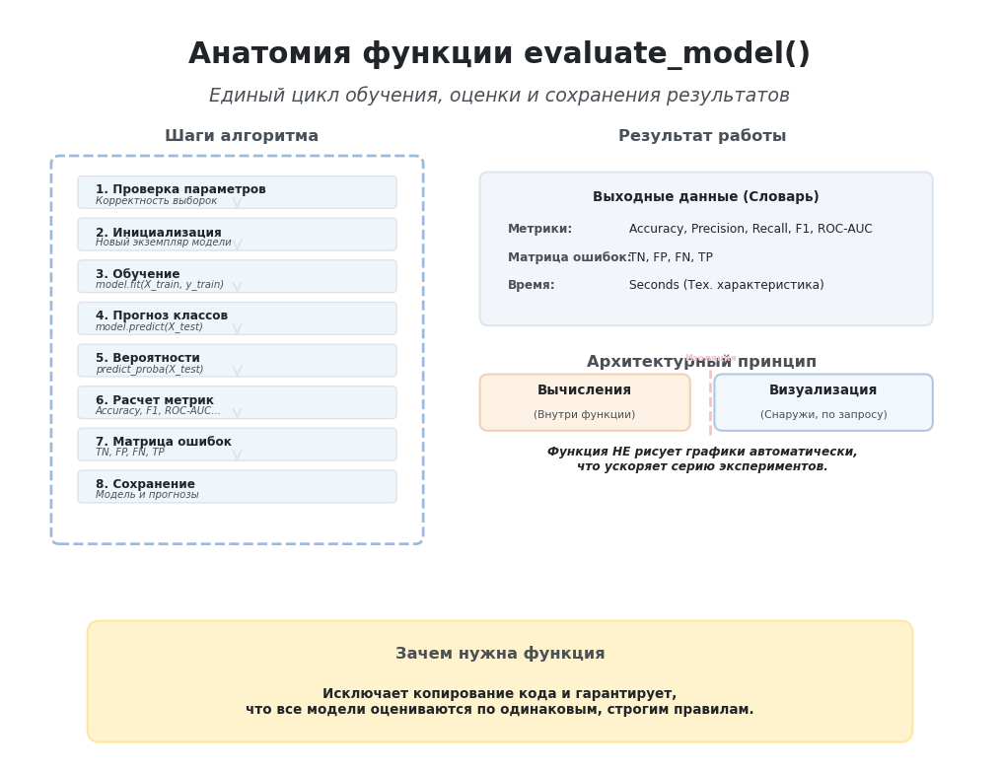

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.2, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Анатомия функции evaluate_model()",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Единый цикл обучения, оценки и сохранения результатов",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Конвейер функции (8 шагов)
# ==========================================
ax.text(2.8, 6.5, "Шаги алгоритма", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Контур функции
ax.add_patch(FancyBboxPatch((0.5, 1.5), 4.5, 4.7, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=2*S, edgecolor=BLUE_BORDER, facecolor="white", linestyle="--"))

steps = [
    ("1. Проверка параметров", "Корректность выборок"),
    ("2. Инициализация", "Новый экземпляр модели"),
    ("3. Обучение", "model.fit(X_train, y_train)"),
    ("4. Прогноз классов", "model.predict(X_test)"),
    ("5. Вероятности", "predict_proba(X_test)"),
    ("6. Расчет метрик", "Accuracy, F1, ROC-AUC..."),
    ("7. Матрица ошибок", "TN, FP, FN, TP"),
    ("8. Сохранение", "Модель и прогнозы")
]

y_start = 5.8
step_h = 0.52

for i, (title, code) in enumerate(steps):
    y_pos = y_start - i * step_h
    ax.add_patch(FancyBboxPatch((0.8, y_pos - 0.18), 3.9, 0.36, boxstyle="round,pad=0.02,rounding_size=0.05", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=LIGHT_BLUE))
    ax.text(1.0, y_pos+0.03, title, ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)
    ax.text(1.0, y_pos-0.1, code, ha="left", va="center", fontsize=7.5*S, color=TEXT_MUTED, style="italic")

    if i < len(steps) - 1:
        ax.annotate("", xy=(2.75, y_pos - 0.2), xytext=(2.75, y_pos - 0.18),
                    arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.2*S))


# ==========================================
# ПРАВАЯ ЧАСТЬ: Выходные данные и Архитектура
# ==========================================
ax.text(8.5, 6.5, "Результат работы", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Блок 1: Что возвращает функция ---
ax.add_patch(FancyBboxPatch(
    (5.8, 4.2), 5.5, 1.8,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.3
))
ax.text(8.55, 5.75, "Выходные данные (Словарь)", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

out_data = [
    ("Метрики:", "Accuracy, Precision, Recall, F1, ROC-AUC"),
    ("Матрица ошибок:", "TN, FP, FN, TP"),
    ("Время:", "Seconds (Тех. характеристика)")
]

for i, (name, val) in enumerate(out_data):
    y_out = 5.35 - i * 0.35
    ax.text(6.1, y_out, name, ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_MUTED)
    ax.text(7.6, y_out, val, ha="left", va="center", fontsize=9*S, color=TEXT_DARK)

# --- Блок 2: Отделение логики (Важный архитектурный момент) ---
ax.text(8.5, 3.7, "Архитектурный принцип", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

ax.add_patch(FancyBboxPatch(
    (5.8, 2.9), 2.5, 0.6,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE, alpha=0.5
))
ax.text(7.05, 3.35, "Вычисления", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(7.05, 3.05, "(Внутри функции)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)

# Стена разделения
ax.plot([8.6, 8.6], [2.8, 3.6], color=RED_BORDER, linewidth=2*S, linestyle="--")
ax.text(8.6, 3.7, "Изоляция", ha="center", va="bottom", fontsize=7*S, color=RED_BORDER, weight="bold")

ax.add_patch(FancyBboxPatch(
    (8.7, 2.9), 2.6, 0.6,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=LIGHT_BLUE, alpha=0.8
))
ax.text(10.0, 3.35, "Визуализация", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(10.0, 3.05, "(Снаружи, по запросу)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)

ax.text(8.5, 2.5, "Функция НЕ рисует графики автоматически,\nчто ускоряет серию экспериментов.", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold", style="italic")


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -0.9), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.1, "Зачем нужна функция",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.5, "Исключает копирование кода и гарантирует,\nчто все модели оцениваются по одинаковым, строгим правилам.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

### 23.2.1 Импорты и проверка входных данных

Перед выполнением эксперимента необходимо проверить корректность модели, названий эксперимента и переданных выборок.

Для этого создаётся внутренняя функция `_validate_evaluation_inputs()`.

Она проверяет:

1. название модели и метода подготовки данных;
2. наличие у модели методов `fit()`, `predict()`, `predict_proba()` и `get_params()`;
3. структуру обучающей и тестовой матриц;
4. совпадение количества объектов в признаках и целевой переменной;
5. совпадение количества, названий и порядка признаков;
6. отсутствие пропусков в целевой переменной;
7. наличие классов `0` и `1` в обучающей и тестовой выборках.

Функция возвращает очищенные названия эксперимента и подготовленные целевые переменные.

Если обнаруживается ошибка, выполнение останавливается до клонирования и обучения модели.


In [ ]:
# ==========================================================
# Импорты и проверка входных данных эксперимента
# ==========================================================

import numpy as np
import pandas as pd

from time import perf_counter
from sklearn.base import clone

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix
)


def _validate_evaluation_inputs(
    model,
    model_name: str,
    balancing_method: str,
    X_train_current,
    y_train_current,
    X_test,
    y_test
):
    """
    Проверяет входные данные одного эксперимента
    и возвращает подготовленные значения.
    """

    # Проверка названий эксперимента
    if (
        not isinstance(model_name, str)
        or not model_name.strip()
    ):
        raise ValueError(
            "model_name должен быть непустой строкой."
        )

    if (
        not isinstance(balancing_method, str)
        or not balancing_method.strip()
    ):
        raise ValueError(
            "balancing_method должен быть непустой строкой."
        )

    clean_model_name = model_name.strip()

    clean_balancing_method = (
        balancing_method.strip()
    )


    # Проверка интерфейса модели
    required_model_methods = (
        "fit",
        "predict",
        "predict_proba",
        "get_params"
    )

    missing_model_methods = [
        method_name
        for method_name in required_model_methods
        if not hasattr(model, method_name)
    ]

    if missing_model_methods:
        raise TypeError(
            f"Модель '{clean_model_name}' "
            "не поддерживает методы: "
            + ", ".join(missing_model_methods)
            + ". Для работы функции требуется "
            "sklearn-совместимый классификатор "
            "с методом predict_proba()."
        )


    # Проверка признаковых матриц
    feature_matrices = {
        "X_train_current": X_train_current,
        "X_test": X_test
    }

    for matrix_name, matrix in (
        feature_matrices.items()
    ):
        if (
            not hasattr(matrix, "shape")
            or len(matrix.shape) != 2
        ):
            raise ValueError(
                f"{matrix_name} должна быть двумерной "
                "матрицей признаков."
            )

        if matrix.shape[0] == 0:
            raise ValueError(
                f"{matrix_name} не должна быть пустой."
            )

        if matrix.shape[1] == 0:
            raise ValueError(
                f"{matrix_name} не содержит признаков."
            )


    if len(X_train_current) != len(
        y_train_current
    ):
        raise ValueError(
            "Количество объектов в X_train_current и "
            "y_train_current не совпадает."
        )

    if len(X_test) != len(y_test):
        raise ValueError(
            "Количество объектов в X_test и y_test "
            "не совпадает."
        )


    if X_train_current.shape[1] != X_test.shape[1]:
        raise ValueError(
            "Количество признаков в обучающей и тестовой "
            "выборках не совпадает."
        )


    if (
        hasattr(X_train_current, "columns")
        and hasattr(X_test, "columns")
        and list(X_train_current.columns)
        != list(X_test.columns)
    ):
        raise ValueError(
            "Названия или порядок признаков в обучающей "
            "и тестовой выборках не совпадают."
        )


    # Подготовка целевых переменных
    y_train_series = pd.Series(
        np.asarray(y_train_current).reshape(-1)
    )

    y_test_series = pd.Series(
        np.asarray(y_test).reshape(-1)
    )


    if y_train_series.isna().any():
        raise ValueError(
            "y_train_current содержит "
            "пропущенные значения."
        )

    if y_test_series.isna().any():
        raise ValueError(
            "y_test содержит пропущенные значения."
        )


    expected_classes = {
        NEGATIVE_CLASS,
        POSITIVE_CLASS
    }

    train_classes = set(
        y_train_series.unique()
    )

    test_classes = set(
        y_test_series.unique()
    )


    if train_classes != expected_classes:
        raise ValueError(
            "Обучающая выборка должна содержать классы "
            f"{sorted(expected_classes)}, получено: "
            f"{sorted(train_classes)}."
        )

    if test_classes != expected_classes:
        raise ValueError(
            "Тестовая выборка должна содержать классы "
            f"{sorted(expected_classes)}, получено: "
            f"{sorted(test_classes)}."
        )


    return (
        clean_model_name,
        clean_balancing_method,
        y_train_series,
        y_test_series
    )


print("=" * 70)
print(
    "Функция _validate_evaluation_inputs "
    "успешно загружена."
)
print(
    "Следующая ячейка создаст функцию получения "
    "и проверки прогнозов модели."
)
print("=" * 70)

Функция _validate_evaluation_inputs успешно загружена.
Следующая ячейка создаст функцию получения и проверки прогнозов модели.


### 23.2.2 Получение прогнозов и вероятностей

После обучения модели необходимо безопасно получить результаты её работы на тестовой выборке.

Для этого создаётся внутренняя функция `_get_model_predictions()`.

Она:

1. получает предсказанные классы;
2. проверяет количество прогнозов;
3. проверяет, что модель не вернула неизвестные классы;
4. получает матрицу вероятностей;
5. определяет столбец положительного класса через атрибут `classes_`;
6. извлекает вероятности класса `1`;
7. проверяет размерность, конечность и допустимый диапазон вероятностей.

Функция не использует фиксированный индекс `[:, 1]`. Положение положительного класса определяется по фактическому порядку классов обученной модели.

Результатом работы являются два массива:

* `y_pred` — предсказанные классы;
* `y_proba` — вероятности положительного класса.


In [ ]:
# ==========================================================
# Получение и проверка прогнозов модели
# ==========================================================


def _get_model_predictions(
    fitted_model,
    clean_model_name: str,
    X_test,
    y_test_series
):
    """
    Получает и проверяет классы и вероятности
    положительного класса.
    """

    expected_classes = {
        NEGATIVE_CLASS,
        POSITIVE_CLASS
    }


    # Предсказанные классы
    y_pred = np.asarray(
        fitted_model.predict(X_test)
    ).reshape(-1)


    if len(y_pred) != len(y_test_series):
        raise ValueError(
            "Количество предсказаний не совпадает с "
            "размером тестовой выборки."
        )


    predicted_classes = set(
        np.unique(y_pred)
    )

    if not predicted_classes.issubset(
        expected_classes
    ):
        raise ValueError(
            "Модель вернула неожиданные классы: "
            f"{sorted(predicted_classes)}."
        )


    # Вероятности положительного класса
    if not hasattr(fitted_model, "classes_"):
        raise AttributeError(
            f"После обучения модель "
            f"'{clean_model_name}' "
            "не содержит атрибут classes_."
        )


    model_classes = list(
        fitted_model.classes_
    )


    if POSITIVE_CLASS not in model_classes:
        raise ValueError(
            f"Положительный класс {POSITIVE_CLASS} "
            "отсутствует в classes_ обученной модели."
        )


    probability_matrix = np.asarray(
        fitted_model.predict_proba(X_test)
    )


    if probability_matrix.ndim != 2:
        raise ValueError(
            "predict_proba() должен возвращать "
            "двумерную матрицу вероятностей."
        )


    if probability_matrix.shape[0] != len(
        y_test_series
    ):
        raise ValueError(
            "Количество строк в матрице вероятностей "
            "не совпадает с размером тестовой выборки."
        )


    if probability_matrix.shape[1] != len(
        model_classes
    ):
        raise ValueError(
            "Количество столбцов predict_proba() "
            "не совпадает с количеством классов модели."
        )


    positive_class_index = model_classes.index(
        POSITIVE_CLASS
    )


    y_proba = probability_matrix[
        :,
        positive_class_index
    ]


    if not np.isfinite(y_proba).all():
        raise ValueError(
            "Вероятности положительного класса содержат "
            "NaN или бесконечные значения."
        )


    if (
        (y_proba < 0)
        | (y_proba > 1)
    ).any():
        raise ValueError(
            "predict_proba() вернул значения вне "
            "диапазона от 0 до 1."
        )


    return y_pred, y_proba


print("=" * 70)
print(
    "Функция _get_model_predictions "
    "успешно загружена."
)
print(
    "Следующая ячейка создаст функцию расчёта "
    "метрик и матрицы ошибок."
)
print("=" * 70)

Функция _get_model_predictions успешно загружена.
Следующая ячейка создаст функцию расчёта метрик и матрицы ошибок.


### 23.2.3 Расчёт результатов эксперимента

После получения прогнозов необходимо рассчитать единый набор показателей качества и сформировать строку для будущей общей таблицы.

Для этого создаётся внутренняя функция `_calculate_experiment_results()`.

Она рассчитывает:

* Accuracy;
* Precision;
* Recall;
* F1;
* ROC-AUC;
* матрицу ошибок;
* значения TN, FP, FN и TP;
* размер обучающей выборки;
* количество объектов классов `0` и `1`.

Метрики сохраняются без округления. Округление будет применяться только при отображении итоговых таблиц.

Функция возвращает:

* словарь `metrics`;
* матрицу ошибок `confusion`.

In [ ]:
# ==========================================================
# Расчёт результатов одного эксперимента
# ==========================================================


def _calculate_experiment_results(
    clean_model_name: str,
    clean_balancing_method: str,
    y_train_series,
    y_test_series,
    y_pred,
    y_proba,
    fit_time: float
):
    """
    Рассчитывает метрики, матрицу ошибок
    и формирует строку итоговой таблицы.
    """

    # Метрики качества
    accuracy = accuracy_score(
        y_test_series,
        y_pred
    )

    precision = precision_score(
        y_test_series,
        y_pred,
        pos_label=POSITIVE_CLASS,
        zero_division=0
    )

    recall = recall_score(
        y_test_series,
        y_pred,
        pos_label=POSITIVE_CLASS,
        zero_division=0
    )

    f1 = f1_score(
        y_test_series,
        y_pred,
        pos_label=POSITIVE_CLASS,
        zero_division=0
    )

    roc_auc = roc_auc_score(
        y_test_series,
        y_proba
    )
    # Коэффициент Джини используется
    # в задачах кредитного скоринга.
    gini = 2 * roc_auc - 1


    # Матрица ошибок
    confusion = confusion_matrix(
        y_test_series,
        y_pred,
        labels=[
            NEGATIVE_CLASS,
            POSITIVE_CLASS
        ]
    )

    tn, fp, fn, tp = confusion.ravel()


    # Распределение классов
    class_counts = (
        y_train_series
        .value_counts()
        .reindex(
            [
                NEGATIVE_CLASS,
                POSITIVE_CLASS
            ],
            fill_value=0
        )
    )


    # Строка общей таблицы
    metrics = {
        "Model": clean_model_name,

        "Balancing": clean_balancing_method,

        "Train Size": int(
            len(y_train_series)
        ),

        "Class 0": int(
            class_counts.loc[NEGATIVE_CLASS]
        ),

        "Class 1": int(
            class_counts.loc[POSITIVE_CLASS]
        ),

        "Fit Time": float(
            fit_time
        ),

        "Accuracy": float(
            accuracy
        ),

        "Precision": float(
            precision
        ),

        "Recall": float(
            recall
        ),

        "F1": float(
            f1
        ),

        "ROC-AUC": float(
            roc_auc
        ),

        "Gini": float(
            gini
        ),

        "TN": int(tn),
        "FP": int(fp),
        "FN": int(fn),
        "TP": int(tp)
    }


    return metrics, confusion


print("=" * 70)
print(
    "Функция _calculate_experiment_results "
    "успешно загружена."
)
print(
    "Следующая ячейка создаст основную функцию "
    "evaluate_model()."
)
print("=" * 70)

Функция _calculate_experiment_results успешно загружена.
Следующая ячейка создаст основную функцию evaluate_model().


### 23.2.4 Основная функция `evaluate_model()`

После подготовки вспомогательных компонентов создаётся основная функция `evaluate_model()`.

Теперь она выполняет только общий сценарий одного эксперимента:

1. проверяет и подготавливает входные данные;
2. создаёт независимую копию модели;
3. обучает модель;
4. измеряет время обучения;
5. получает прогнозы и вероятности;
6. рассчитывает результаты;
7. возвращает полный набор объектов эксперимента.

Внешний интерфейс функции не изменяется.

Она по-прежнему возвращает:

* обученную модель;
* словарь метрик;
* матрицу ошибок;
* предсказанные классы;
* вероятности положительного класса.


In [ ]:
# ==========================================================
# Основная функция одного эксперимента
# ==========================================================


def evaluate_model(
    model,
    model_name: str,
    balancing_method: str,
    X_train_current,
    y_train_current,
    X_test,
    y_test
) -> dict:
    """
    Обучает и оценивает одну модель
    на одном варианте обучающих данных.
    """

    # Проверка и подготовка входных данных
    (
        clean_model_name,
        clean_balancing_method,
        y_train_series,
        y_test_series
    ) = _validate_evaluation_inputs(
        model=model,
        model_name=model_name,
        balancing_method=balancing_method,
        X_train_current=X_train_current,
        y_train_current=y_train_current,
        X_test=X_test,
        y_test=y_test
    )


    # Создание независимой модели
    try:
        fitted_model = clone(model)

    except Exception as error:
        raise TypeError(
            f"Не удалось клонировать модель "
            f"'{clean_model_name}'. "
            "Передайте sklearn-совместимый объект модели."
        ) from error


    # Обучение и измерение времени
    fit_started_at = perf_counter()


    fitted_model.fit(
        X_train_current,
        y_train_current
    )


    fit_time = (
        perf_counter()
        - fit_started_at
    )


    # Получение прогнозов
    y_pred, y_proba = _get_model_predictions(
        fitted_model=fitted_model,
        clean_model_name=clean_model_name,
        X_test=X_test,
        y_test_series=y_test_series
    )


    # Расчёт результатов
    metrics, confusion = (
        _calculate_experiment_results(
            clean_model_name=clean_model_name,
            clean_balancing_method=(
                clean_balancing_method
            ),
            y_train_series=y_train_series,
            y_test_series=y_test_series,
            y_pred=y_pred,
            y_proba=y_proba,
            fit_time=fit_time
        )
    )


    return {
        "model": fitted_model,
        "metrics": metrics,
        "confusion_matrix": confusion,
        "y_pred": y_pred,
        "y_proba": y_proba
    }


print("=" * 70)
print("Функция evaluate_model успешно загружена.")
print(
    "Все вспомогательные компоненты "
    "одного эксперимента готовы."
)
print(
    "Следующий этап — контрольная проверка "
    "evaluate_model() на Logistic Regression."
)
print("=" * 70)

Функция evaluate_model успешно загружена.
Все вспомогательные компоненты одного эксперимента готовы.
Следующий этап — контрольная проверка evaluate_model() на Logistic Regression.


### Структура результата `evaluate_model()`

Функция `evaluate_model()` выполняет один полный эксперимент: создаёт независимый экземпляр модели, обучает его на выбранном варианте данных и оценивает на неизменной тестовой выборке.

Результат возвращается в виде словаря со следующими элементами:

* `model` — обученный экземпляр модели;
* `metrics` — основные метрики и характеристики эксперимента;
* `confusion_matrix` — матрица ошибок;
* `y_pred` — предсказанные классы;
* `y_proba` — вероятности принадлежности объектов к положительному классу.

Такое разделение позволяет использовать результаты в разных частях исследования:

* `metrics` — для формирования единой сравнительной таблицы;
* `confusion_matrix` — для анализа количества правильных и ошибочных решений;
* `y_pred` — для дополнительного анализа классификации;
* `y_proba` — для построения ROC-кривых и исследования порогов классификации;
* `model` — для последующего анализа и сохранения обученного алгоритма.

Функция не выводит таблицы и не строит графики автоматически. Она выполняет только вычисления и возвращает структурированный результат. Благодаря этому её можно многократно использовать внутри общего экспериментального конвейера без появления лишнего вывода.


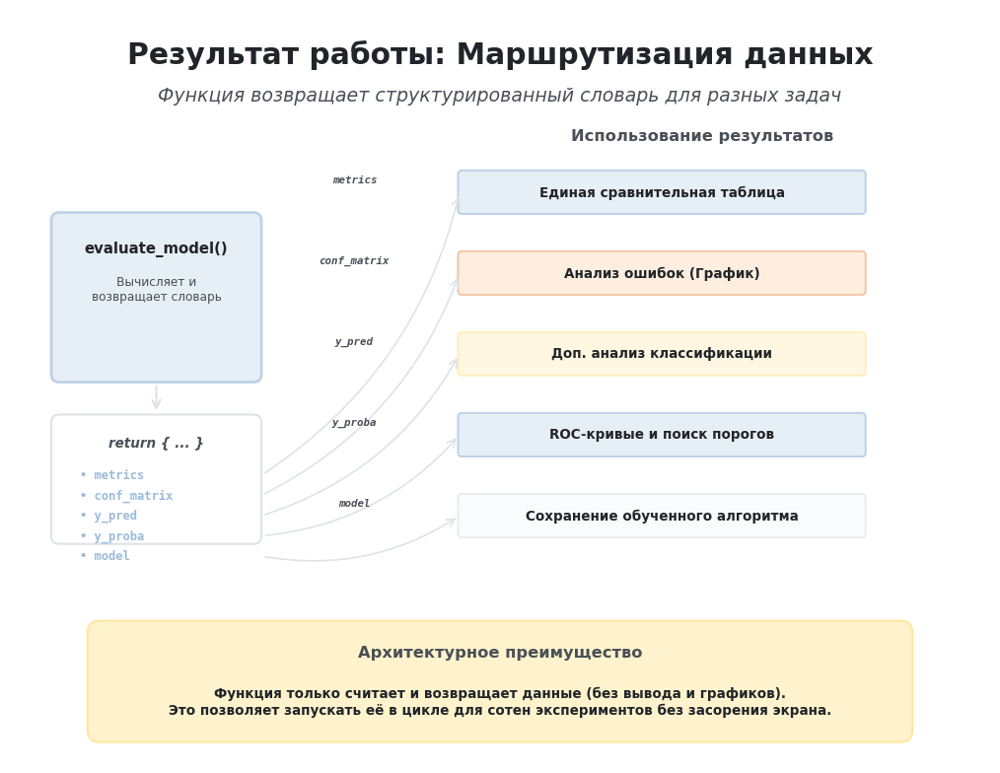

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.2, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Результат работы: Маршрутизация данных",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Функция возвращает структурированный словарь для разных задач",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Функция и словарь
# ==========================================
# Блок самой функции
ax.add_patch(FancyBboxPatch(
    (0.5, 3.5), 2.5, 2.0,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=2*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.6
))
ax.text(1.75, 5.1, "evaluate_model()", ha="center", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(1.75, 4.6, "Вычисляет и\nвозвращает словарь", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED)

# Блок словаря (Выходные данные)
ax.add_patch(FancyBboxPatch(
    (0.5, 1.5), 2.5, 1.5,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor="white"
))
ax.text(1.75, 2.7, "return { ... }", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED, style="italic")

# Элементы словаря (Keys)
keys = ["metrics", "conf_matrix", "y_pred", "y_proba", "model"]
for i, key in enumerate(keys):
    y_key = 2.3 - i * 0.25
    ax.text(0.8, y_key, f"• {key}", ha="left", va="center", fontsize=9*S, color=BLUE_BORDER, weight="bold", family="monospace")

# Стрелка от функции к словарю
ax.annotate("", xy=(1.75, 3.05), xytext=(1.75, 3.45),
            arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.5*S))


# ==========================================
# ПРАВАЯ ЧАСТЬ: Потребители данных (Куда идут данные)
# ==========================================
ax.text(8.5, 6.5, "Использование результатов", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Данные: (Ключ, Куда идет, Y_pos)
routes = [
    ("metrics", "Единая сравнительная таблица", BLUE, BLUE_BORDER, 5.8),
    ("conf_matrix", "Анализ ошибок (График)", ORANGE, ORANGE_BORDER, 4.8),
    ("y_pred", "Доп. анализ классификации", AMBER, AMBER_BORDER, 3.8),
    ("y_proba", "ROC-кривые и поиск порогов", BLUE, BLUE_BORDER, 2.8),
    ("model", "Сохранение обученного алгоритма", GRAY, GRAY_BORDER, 1.8)
]

for key, dest, color, border, y_pos in routes:
    # Стрелка от словаря к потребителю
    ax.annotate("", xy=(5.5, y_pos), xytext=(3.05, 2.3 - keys.index(key) * 0.25),
                arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.2*S, connectionstyle="arc3,rad=0.2"))

    # Подпись ключа над стрелкой
    ax.text(4.2, y_pos + 0.15, key, ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, weight="bold", family="monospace", style="italic")

    # Блок-потребитель
    ax.add_patch(FancyBboxPatch(
        (5.5, y_pos - 0.25), 5.0, 0.5,
        boxstyle="round,pad=0.02,rounding_size=0.05",
        linewidth=1.5*S, edgecolor=border, facecolor=color, alpha=0.6
    ))
    ax.text(8.0, y_pos, dest, ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -0.9), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.1, "Архитектурное преимущество",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.5, "Функция только считает и возвращает данные (без вывода и графиков).\nЭто позволяет запускать её в цикле для сотен экспериментов без засорения экрана.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

### Контрольная проверка универсальной функции

Перед использованием функции `evaluate_model()` в серии экспериментов необходимо убедиться, что она корректно воспроизводит ранее полученные результаты.

Для проверки используется базовая логистическая регрессия, обученная на исходной выборке `Baseline`. Параметры модели, обучающие данные и тестовая выборка остаются такими же, как в предыдущем исследовании.

Результаты нового запуска автоматически сравниваются с ранее рассчитанными значениями:

* Accuracy;
* Precision;
* Recall;
* F1;
* ROC-AUC;
* предсказанными классами;
* вероятностями положительного класса;
* матрицей ошибок.

Если результаты совпадают в пределах допустимой численной погрешности, универсальная функция может использоваться для дальнейшего автоматизированного сравнения моделей.


In [ ]:
# ==========================================================
# Контрольная проверка функции evaluate_model()
# ==========================================================

from sklearn.linear_model import LogisticRegression


# ----------------------------------------------------------
# 1. Проверка наличия ранее рассчитанных результатов
# ----------------------------------------------------------
# Для контрольного сравнения используются переменные,
# созданные в завершённом разделе базовой
# логистической регрессии.
#
# Значения метрик не записываются вручную:
# они берутся непосредственно из существующих переменных.
# ----------------------------------------------------------

required_reference_variables = [
    "accuracy_base",
    "precision_base",
    "recall_base",
    "f1_base",
    "roc_auc_base",
    "y_pred",
    "y_pred_proba",
    "cm"
]

missing_reference_variables = [
    variable_name
    for variable_name in required_reference_variables
    if variable_name not in globals()
]

if missing_reference_variables:
    raise NameError(
        "Не найдены результаты базовой логистической "
        "регрессии: "
        + ", ".join(missing_reference_variables)
        + ". Выполните соответствующие ячейки "
        "предыдущего раздела Notebook."
    )


# ----------------------------------------------------------
# 2. Создание нового объекта логистической регрессии
# ----------------------------------------------------------
# Используются те же параметры, что и в исходном
# исследовании:
#
# random_state=42 — воспроизводимость;
# max_iter=1000  — достаточное число итераций
#                  для сходимости алгоритма.
#
# Старый объект model не используется, поскольку он
# уже содержит обученное состояние.
# ----------------------------------------------------------

logistic_model_test = LogisticRegression(
    random_state=42,
    max_iter=1000
)


# ----------------------------------------------------------
# 3. Контрольный запуск evaluate_model()
# ----------------------------------------------------------
# Функция самостоятельно:
# - клонирует модель;
# - обучает новый экземпляр;
# - получает прогнозы;
# - рассчитывает метрики;
# - формирует матрицу ошибок.
# ----------------------------------------------------------

baseline_evaluation_test = evaluate_model(
    model=logistic_model_test,
    model_name="Logistic Regression",
    balancing_method="Baseline",
    X_train_current=X_train,
    y_train_current=y_train,
    X_test=X_test,
    y_test=y_test
)


# ----------------------------------------------------------
# 4. Подготовка ранее полученных метрик
# ----------------------------------------------------------

reference_metrics = {
    "Accuracy": accuracy_base,
    "Precision": precision_base,
    "Recall": recall_base,
    "F1": f1_base,
    "ROC-AUC": roc_auc_base,
    "Gini": 2 * roc_auc_base - 1
}

function_metrics = baseline_evaluation_test[
    "metrics"
]


# ----------------------------------------------------------
# 5. Сравнение значений метрик
# ----------------------------------------------------------
# При повторном обучении значения должны совпасть.
#
# Небольшая допустимая погрешность учитывает возможные
# различия вычислений с плавающей точкой.
# ----------------------------------------------------------

METRIC_TOLERANCE = 1e-10

metric_comparison_rows = []

for metric_name, reference_value in (
    reference_metrics.items()
):

    function_value = function_metrics[
        metric_name
    ]

    difference = (
        function_value - reference_value
    )

    values_match = np.isclose(
        function_value,
        reference_value,
        rtol=0.0,
        atol=METRIC_TOLERANCE
    )

    metric_comparison_rows.append({
        "Metric": metric_name,
        "Previous Result": float(
            reference_value
        ),
        "Function Result": float(
            function_value
        ),
        "Difference": float(
            difference
        ),
        "Match": bool(
            values_match
        )
    })


metric_comparison = pd.DataFrame(
    metric_comparison_rows
)


# ----------------------------------------------------------
# 6. Сравнение прогнозов и матрицы ошибок
# ----------------------------------------------------------

class_predictions_match = np.array_equal(
    baseline_evaluation_test["y_pred"],
    np.asarray(y_pred)
)

probabilities_match = np.allclose(
    baseline_evaluation_test["y_proba"],
    np.asarray(y_pred_proba),
    rtol=0.0,
    atol=METRIC_TOLERANCE
)

confusion_matrices_match = np.array_equal(
    baseline_evaluation_test[
        "confusion_matrix"
    ],
    np.asarray(cm)
)


# ----------------------------------------------------------
# 7. Общая проверка результатов
# ----------------------------------------------------------

all_metrics_match = bool(
    metric_comparison["Match"].all()
)

all_checks_passed = all([
    all_metrics_match,
    class_predictions_match,
    probabilities_match,
    confusion_matrices_match
])


# ----------------------------------------------------------
# 8. Вывод результатов контрольной проверки
# ----------------------------------------------------------

print(
    "Результат контрольной проверки:",
    (
        "ВСЕ ПРОВЕРКИ ПРОЙДЕНЫ"
        if all_checks_passed
        else "ОБНАРУЖЕНЫ РАСХОЖДЕНИЯ"
    )
)

print()

print(
    "Совпадение предсказанных классов:",
    class_predictions_match
)

print(
    "Совпадение вероятностей:",
    probabilities_match
)

print(
    "Совпадение матриц ошибок:",
    confusion_matrices_match
)

print()

print("Матрица ошибок:")
print(
    baseline_evaluation_test[
        "confusion_matrix"
    ]
)

print()

print(
    "Время обучения:",
    f"{function_metrics['Fit Time']:.4f} сек."
)

print()

display(
    metric_comparison.style.format({
        "Previous Result": "{:.10f}",
        "Function Result": "{:.10f}",
        "Difference": "{:.2e}"
    })
)

if not all_checks_passed:
    raise AssertionError(
        "Функция evaluate_model() не прошла "
        "контрольную проверку."
    )

Результат контрольной проверки: ВСЕ ПРОВЕРКИ ПРОЙДЕНЫ

Совпадение предсказанных классов: True
Совпадение вероятностей: True
Совпадение матриц ошибок: True

Матрица ошибок:
[[64840   560]
 [ 2485  4519]]

Время обучения: 7.1081 сек.



,Metric,Previous Result,Function Result,Difference,Match
0,Accuracy,0.9579443125,0.9579443125,0.00e+00,True
1,Precision,0.8897420752,0.8897420752,0.00e+00,True
2,Recall,0.6452027413,0.6452027413,0.00e+00,True
3,F1,0.7479930481,0.7479930481,0.00e+00,True
4,ROC-AUC,0.9479876571,0.9479876571,0.00e+00,True
5,Gini,0.8959753142,0.8959753142,0.00e+00,True


### Анализ контрольной проверки

Контрольный запуск показал, что универсальная функция `evaluate_model()` корректно воспроизводит результаты ранее проведённого эксперимента с логистической регрессией.

Все основные показатели качества, предсказанные классы, вероятности положительного класса и матрица ошибок полностью совпали с исходными результатами.

Это подтверждает, что созданная функция корректно реализует единый процесс обучения и оценки моделей и может использоваться для дальнейшего автоматизированного сравнения различных алгоритмов машинного обучения.

### Вывод

Универсальная функция обучения и оценки модели успешно проверена.

Следующим этапом будет создание функции последовательного запуска экспериментов, которая позволит автоматически обучать одну модель на всех подготовленных вариантах обучающих данных и формировать единую таблицу результатов.


## 23.3 Функция запуска серии экспериментов `run_experiments()`

Функция `evaluate_model()` выполняет один эксперимент: обучает модель на одном варианте данных и возвращает рассчитанные результаты.

Для полноценного сравнительного исследования необходимо последовательно повторить эту процедуру для всех вариантов обучающей выборки, содержащихся в словаре `training_sets`.

Для автоматизации этого процесса создаётся функция `run_experiments()`.

Она выполняет следующие действия:

1. проверяет корректность переданной модели, тестовой выборки и структуры `training_sets`;
2. последовательно перебирает все варианты обучающих данных;
3. для каждого варианта вызывает функцию `evaluate_model()`;
4. сохраняет результаты каждого успешно завершённого эксперимента;
5. формирует единую таблицу метрик;
6. фиксирует возникшие ошибки и связывает их с конкретным экспериментом;
7. выводит информацию о ходе выполнения и итоговый статус серии запусков.

Каждый вызов `evaluate_model()` создаёт новый независимый экземпляр модели. Поэтому результаты разных экспериментов не зависят от ранее выполненного обучения.

По умолчанию функция работает в строгом режиме: при возникновении ошибки выполнение останавливается. Это предотвращает формирование неполной сравнительной таблицы, которую можно ошибочно принять за окончательный результат.

Для диагностических запусков предусмотрен параметр `continue_on_error=True`. В этом режиме функция продолжает выполнение остальных экспериментов, а информация об ошибках сохраняется в отдельной таблице.

Функция возвращает:

* `results_table` — единую таблицу результатов;
* `experiments` — полные результаты каждого успешного эксперимента;
* `errors` — таблицу обнаруженных ошибок;
* `summary` — общую информацию о выполненной серии экспериментов.

Дополнительные параметры позволяют при необходимости отключить хранение обученных моделей или массивов прогнозов. Это может использоваться для экономии оперативной памяти при работе с ресурсоёмкими алгоритмами.


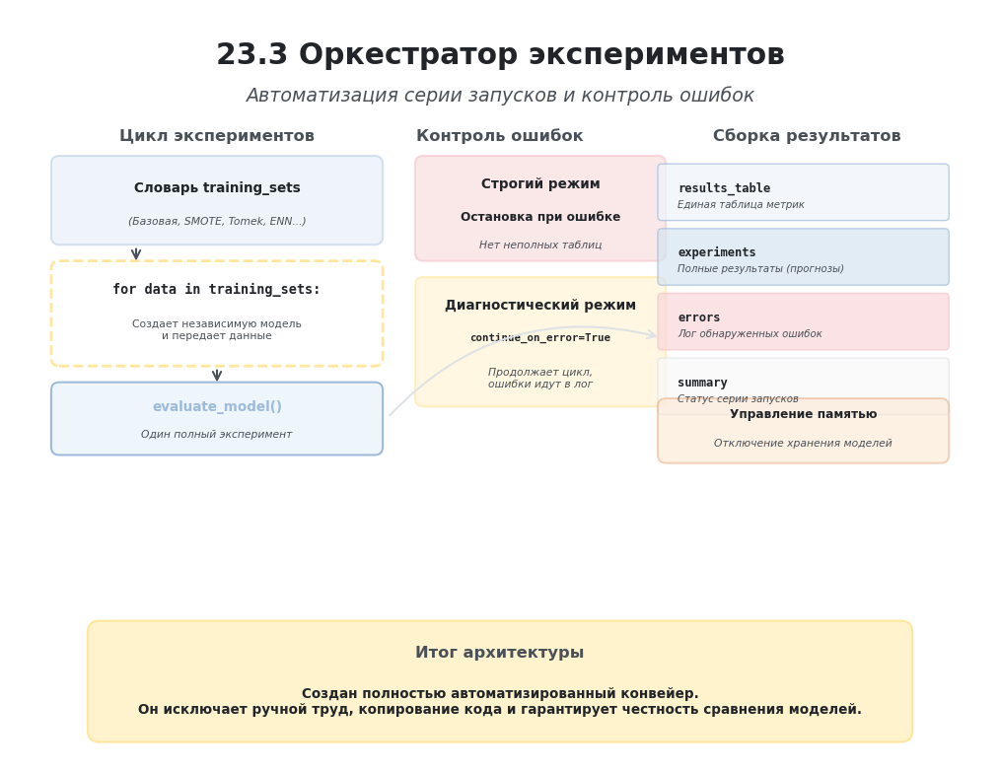

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.2, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "23.3 Оркестратор экспериментов",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Автоматизация серии запусков и контроль ошибок",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Цикл запуска (The Loop)
# ==========================================
ax.text(2.5, 6.5, "Цикл экспериментов", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Входные данные (словарь training_sets)
ax.add_patch(FancyBboxPatch(
    (0.5, 5.2), 4.0, 1.0,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.4
))
ax.text(2.5, 5.85, "Словарь training_sets", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(2.5, 5.45, "(Базовая, SMOTE, Tomek, ENN...)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# Стрелка вниз к циклу
ax.annotate("", xy=(1.5, 4.9), xytext=(1.5, 5.15),
            arrowprops=dict(arrowstyle="->", color=TEXT_MUTED, lw=1.5*S))

# Блок цикла For
ax.add_patch(FancyBboxPatch(
    (0.5, 3.7), 4.0, 1.2,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=2*S, edgecolor=AMBER_BORDER, facecolor="white", linestyle="--"
))
ax.text(2.5, 4.6, "for data in training_sets:", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK, family="monospace")
ax.text(2.5, 4.1, "Создает независимую модель\nи передает данные", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)

# Стрелка к функции evaluate_model
ax.annotate("", xy=(2.5, 3.4), xytext=(2.5, 3.65),
            arrowprops=dict(arrowstyle="->", color=TEXT_MUTED, lw=1.5*S))

# Функция evaluate_model
ax.add_patch(FancyBboxPatch(
    (0.5, 2.6), 4.0, 0.8,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=LIGHT_BLUE
))
ax.text(2.5, 3.15, "evaluate_model()", ha="center", va="center", fontsize=10*S, weight="bold", color=BLUE_BORDER)
ax.text(2.5, 2.8, "Один полный эксперимент", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ==========================================
# ЦЕНТРАЛЬНАЯ ЧАСТЬ: Обработка ошибок
# ==========================================
ax.text(6.0, 6.5, "Контроль ошибок", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Строгий режим (По умолчанию)
ax.add_patch(FancyBboxPatch(
    (5.0, 5.0), 3.0, 1.2,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=RED_BORDER, facecolor=RED_FILL, alpha=0.6
))
ax.text(6.5, 5.9, "Строгий режим", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(6.5, 5.5, "Остановка при ошибке", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")
ax.text(6.5, 5.15, "Нет неполных таблиц", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# Диагностический режим
ax.add_patch(FancyBboxPatch(
    (5.0, 3.2), 3.0, 1.5,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER, alpha=0.6
))
ax.text(6.5, 4.4, "Диагностический режим", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(6.5, 4.0, "continue_on_error=True", ha="center", va="center", fontsize=8*S, color=TEXT_DARK, weight="bold", family="monospace")
ax.text(6.5, 3.5, "Продолжает цикл,\nошибки идут в лог", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ==========================================
# ПРАВАЯ ЧАСТЬ: Выходные данные (Сборка результатов)
# ==========================================
ax.text(9.8, 6.5, "Сборка результатов", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Стрелка от цикла к результатам
ax.annotate("", xy=(8.0, 4.0), xytext=(4.6, 3.0),
            arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.5*S, connectionstyle="arc3,rad=-0.3"))

outputs = [
    ("results_table", "Единая таблица метрик", BLUE_BORDER, LIGHT_BLUE, 5.8),
    ("experiments", "Полные результаты (прогнозы)", BLUE_BORDER, BLUE, 5.0),
    ("errors", "Лог обнаруженных ошибок", RED_BORDER, RED_FILL, 4.2),
    ("summary", "Статус серии запусков", GRAY_BORDER, GRAY, 3.4)
]

for key, desc, border, color, y_pos in outputs:
    ax.add_patch(FancyBboxPatch(
        (8.0, y_pos - 0.3), 3.5, 0.6,
        boxstyle="round,pad=0.05,rounding_size=0.05",
        linewidth=1*S, edgecolor=border, facecolor=color, alpha=0.7
    ))
    ax.text(8.2, y_pos+0.05, key, ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK, family="monospace")
    ax.text(8.2, y_pos-0.15, desc, ha="left", va="center", fontsize=7.5*S, color=TEXT_MUTED, style="italic")

# Блок управления памятью
ax.add_patch(FancyBboxPatch(
    (8.0, 2.5), 3.5, 0.7,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE, alpha=0.5
))
ax.text(9.75, 3.05, "Управление памятью", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)
ax.text(9.75, 2.7, "Отключение хранения моделей", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -0.9), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.1, "Итог архитектуры",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.5, "Создан полностью автоматизированный конвейер.\nОн исключает ручной труд, копирование кода и гарантирует честность сравнения моделей.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

### 23.3.1 Импорты и структура результатов

В начале раздела подготавливаются общие инструменты, используемые экспериментальным конвейером.

Также задаётся единый порядок столбцов:

- основной таблицы результатов;
- таблицы зарегистрированных ошибок.

Эта структура будет использоваться для всех алгоритмов машинного обучения. Благодаря этому результаты разных моделей можно будет безопасно объединять и сравнивать.

In [ ]:
# ==========================================================
# Импорты и структура результатов
# ==========================================================

import gc

from collections.abc import Mapping
from time import perf_counter


# Единый порядок столбцов таблицы результатов.
EXPERIMENT_RESULT_COLUMNS = [
    "Model",
    "Balancing",
    "Train Size",
    "Class 0",
    "Class 1",
    "Fit Time",
    "Accuracy",
    "Precision",
    "Recall",
    "F1",
    "ROC-AUC",
    "Gini",
    "TN",
    "FP",
    "FN",
    "TP"
]


# Единый порядок столбцов таблицы ошибок.
EXPERIMENT_ERROR_COLUMNS = [
    "Model",
    "Balancing",
    "Error Type",
    "Error Message"
]


print("=" * 70)
print("Настройки экспериментального конвейера загружены.")
print("Структура таблиц результатов и ошибок определена.")
print(
    "Следующая ячейка создаст функцию "
    "проверки входных данных."
)
print("=" * 70)

Настройки экспериментального конвейера загружены.
Структура таблиц результатов и ошибок определена.
Следующая ячейка создаст функцию проверки входных данных.


### 23.3.2 Проверка входных данных

Перед началом серии экспериментов необходимо проверить корректность всех переданных объектов.

Для этого создаётся внутренняя функция `_validate_experiment_series_inputs()`.

Она проверяет:

1. управляющие параметры функции;
2. название и наличие модели;
3. структуру словаря `training_sets`;
4. уникальность названий методов подготовки данных;
5. наличие обучающих выборок;
6. наличие и структуру тестовой выборки.

Если обнаруживается ошибка, выполнение останавливается до начала обучения моделей.

Функция возвращает очищенное название модели без лишних пробелов.

In [ ]:
# ==========================================================
# Проверка входных данных серии экспериментов
# ==========================================================


def _validate_experiment_series_inputs(
    model,
    model_name: str,
    training_sets: Mapping,
    X_test,
    y_test,
    *,
    continue_on_error: bool,
    store_models: bool,
    store_predictions: bool,
    verbose: bool
) -> str:
    """
    Проверяет входные данные серии и возвращает
    очищенное название модели.
    """

    boolean_parameters = {
        "continue_on_error": continue_on_error,
        "store_models": store_models,
        "store_predictions": store_predictions,
        "verbose": verbose
    }

    for parameter_name, parameter_value in (
        boolean_parameters.items()
    ):
        if not isinstance(parameter_value, bool):
            raise TypeError(
                f"{parameter_name} должен иметь "
                "значение True или False."
            )


    if (
        not isinstance(model_name, str)
        or not model_name.strip()
    ):
        raise ValueError(
            "model_name должен быть непустой строкой."
        )

    clean_model_name = model_name.strip()


    if model is None:
        raise ValueError(
            "Не передан объект модели."
        )


    if not isinstance(training_sets, Mapping):
        raise TypeError(
            "training_sets должен быть словарём или "
            "другим объектом типа Mapping."
        )

    if len(training_sets) == 0:
        raise ValueError(
            "training_sets не содержит обучающих выборок."
        )


    normalized_method_names = set()


    for raw_method_name, data_pair in (
        training_sets.items()
    ):

        if (
            not isinstance(raw_method_name, str)
            or not raw_method_name.strip()
        ):
            raise ValueError(
                "Каждый ключ training_sets должен быть "
                "непустой строкой."
            )

        clean_method_name = raw_method_name.strip()


        if clean_method_name in normalized_method_names:
            raise ValueError(
                "После удаления лишних пробелов обнаружено "
                f"повторяющееся название метода: "
                f"'{clean_method_name}'."
            )

        normalized_method_names.add(
            clean_method_name
        )


        if (
            not isinstance(data_pair, (tuple, list))
            or len(data_pair) != 2
        ):
            raise ValueError(
                f"Для метода '{clean_method_name}' "
                "ожидается пара "
                "(X_train_current, y_train_current)."
            )

        X_train_current, y_train_current = data_pair


        if X_train_current is None:
            raise ValueError(
                f"Для метода '{clean_method_name}' "
                "не передана матрица признаков."
            )

        if y_train_current is None:
            raise ValueError(
                f"Для метода '{clean_method_name}' "
                "не передана целевая переменная."
            )


    if X_test is None:
        raise ValueError(
            "Не передана тестовая матрица X_test."
        )

    if y_test is None:
        raise ValueError(
            "Не передана тестовая переменная y_test."
        )

    if not hasattr(X_test, "shape"):
        raise TypeError(
            "X_test должна иметь атрибут shape."
        )

    if len(X_test.shape) != 2:
        raise ValueError(
            "X_test должна быть двумерной матрицей."
        )

    if X_test.shape[0] == 0:
        raise ValueError(
            "X_test не должна быть пустой."
        )

    if len(X_test) != len(y_test):
        raise ValueError(
            "Количество объектов в X_test и y_test "
            "не совпадает."
        )


    return clean_model_name


print("=" * 70)
print(
    "Функция _validate_experiment_series_inputs "
    "успешно загружена."
)
print(
    "Следующая ячейка создаст функцию выполнения "
    "одного эксперимента серии."
)
print("=" * 70)

Функция _validate_experiment_series_inputs успешно загружена.
Следующая ячейка создаст функцию выполнения одного эксперимента серии.


### 23.3.3 Выполнение одного эксперимента серии

Для сокращения основной функции создаётся внутренняя функция `_run_single_series_experiment()`.

Она полностью отвечает за один эксперимент:

1. вызывает `evaluate_model()`;
2. получает рассчитанные метрики;
3. проверяет наличие обязательных полей;
4. формирует строку итоговой таблицы;
5. подготавливает полный сохраняемый результат.

Метрики и матрица ошибок сохраняются всегда.

Сохранение обученной модели, прогнозов и вероятностей зависит от параметров `store_models` и `store_predictions`.

Функция возвращает два объекта:

- полный результат эксперимента;
- строку для общей таблицы.

In [ ]:
# ==========================================================
# Выполнение одного эксперимента серии
# ==========================================================


def _run_single_series_experiment(
    model,
    clean_model_name: str,
    balancing_method: str,
    X_train_current,
    y_train_current,
    X_test,
    y_test,
    *,
    store_models: bool,
    store_predictions: bool
):
    """
    Выполняет один эксперимент и возвращает
    полный результат и строку итоговой таблицы.
    """

    current_result = evaluate_model(
        model=model,
        model_name=clean_model_name,
        balancing_method=balancing_method,
        X_train_current=X_train_current,
        y_train_current=y_train_current,
        X_test=X_test,
        y_test=y_test
    )


    current_metrics = current_result[
        "metrics"
    ]


    missing_metric_fields = [
        column_name
        for column_name
        in EXPERIMENT_RESULT_COLUMNS
        if column_name not in current_metrics
    ]


    if missing_metric_fields:
        raise KeyError(
            "Функция evaluate_model() не вернула "
            "обязательные поля: "
            + ", ".join(
                missing_metric_fields
            )
        )


    result_row = {
        column_name:
        current_metrics[column_name]
        for column_name
        in EXPERIMENT_RESULT_COLUMNS
    }


    stored_result = {
        "model": (
            current_result["model"]
            if store_models
            else None
        ),

        "metrics": dict(
            current_metrics
        ),

        "confusion_matrix": (
            current_result[
                "confusion_matrix"
            ].copy()
        ),

        "y_pred": (
            current_result["y_pred"].copy()
            if store_predictions
            else None
        ),

        "y_proba": (
            current_result["y_proba"].copy()
            if store_predictions
            else None
        )
    }


    return stored_result, result_row


print("=" * 70)
print(
    "Функция _run_single_series_experiment "
    "успешно загружена."
)
print(
    "Следующая ячейка создаст основную функцию "
    "run_experiments()."
)
print("=" * 70)

Функция _run_single_series_experiment успешно загружена.
Следующая ячейка создаст основную функцию run_experiments().


### 23.3.4 Основная функция `run_experiments()`

Основная функция `run_experiments()` управляет всей серией запусков.

После рефакторинга в ней остаются только основные задачи оркестратора:

1. проверка входных данных;
2. подготовка контейнеров;
3. последовательный перебор обучающих выборок;
4. вызов функции одного эксперимента;
5. сохранение успешных результатов;
6. регистрация ошибок;
7. формирование итоговых таблиц;
8. создание сводной информации;
9. возврат полного результата серии.

Внешний интерфейс функции не изменяется. Все последующие разделы Notebook продолжают использовать `run_experiments()` прежним способом.

In [ ]:
# ==========================================================
# Основная функция запуска серии экспериментов
# ==========================================================


def run_experiments(
    model,
    model_name: str,
    training_sets: Mapping,
    X_test,
    y_test,
    *,
    continue_on_error: bool = False,
    store_models: bool = True,
    store_predictions: bool = True,
    verbose: bool = True
) -> dict:
    """
    Запускает один алгоритм на всех вариантах
    обучающих данных и возвращает общий результат.
    """

    clean_model_name = _validate_experiment_series_inputs(
        model=model,
        model_name=model_name,
        training_sets=training_sets,
        X_test=X_test,
        y_test=y_test,
        continue_on_error=continue_on_error,
        store_models=store_models,
        store_predictions=store_predictions,
        verbose=verbose
    )


    experiment_results = {}

    result_rows = []

    error_rows = []


    total_experiments = len(
        training_sets
    )

    total_started_at = perf_counter()


    if verbose:
        print("=" * 70)
        print(
            f"Запуск серии экспериментов: "
            f"{clean_model_name}"
        )
        print(
            f"Количество вариантов данных: "
            f"{total_experiments}"
        )
        print(
            "Режим обработки ошибок:",
            (
                "продолжать после ошибки"
                if continue_on_error
                else "останавливать при ошибке"
            )
        )
        print("=" * 70)


    for experiment_number, (
        raw_method_name,
        data_pair
    ) in enumerate(
        training_sets.items(),
        start=1
    ):

        balancing_method = (
            raw_method_name.strip()
        )

        X_train_current, y_train_current = (
            data_pair
        )


        if verbose:
            print()
            print(
                f"[{experiment_number}/"
                f"{total_experiments}] "
                f"{balancing_method}"
            )
            print("-" * 70)


        try:
            stored_result, result_row = (
                _run_single_series_experiment(
                    model=model,
                    clean_model_name=clean_model_name,
                    balancing_method=balancing_method,
                    X_train_current=X_train_current,
                    y_train_current=y_train_current,
                    X_test=X_test,
                    y_test=y_test,
                    store_models=store_models,
                    store_predictions=store_predictions
                )
            )


            experiment_results[
                balancing_method
            ] = stored_result


            result_rows.append(
                result_row
            )


            if verbose:
                print("Статус: успешно")

                print(
                    "Accuracy:",
                    f"{result_row['Accuracy']:.4f}"
                )

                print(
                    "Precision:",
                    f"{result_row['Precision']:.4f}"
                )

                print(
                    "Recall:",
                    f"{result_row['Recall']:.4f}"
                )

                print(
                    "F1:",
                    f"{result_row['F1']:.4f}"
                )

                print(
                    "ROC-AUC:",
                    f"{result_row['ROC-AUC']:.4f}"
                )

                print(
                    "Gini:",
                    f"{result_row['Gini']:.4f}"
                )

                print(
                    "Время обучения:",
                    f"{result_row['Fit Time']:.4f} сек."
                )


        except Exception as error:

            error_rows.append({
                "Model": clean_model_name,
                "Balancing": balancing_method,
                "Error Type": type(error).__name__,
                "Error Message": str(error)
            })


            if verbose:
                print("Статус: ошибка")

                print(
                    "Тип ошибки:",
                    type(error).__name__
                )

                print(
                    "Описание:",
                    str(error)
                )


            if not continue_on_error:
                raise RuntimeError(
                    "Серия экспериментов остановлена. "
                    f"Ошибка в эксперименте "
                    f"'{clean_model_name} — "
                    f"{balancing_method}'."
                ) from error


        finally:
            gc.collect()


    results_table = pd.DataFrame(
        result_rows,
        columns=EXPERIMENT_RESULT_COLUMNS
    )


    errors_table = pd.DataFrame(
        error_rows,
        columns=EXPERIMENT_ERROR_COLUMNS
    )


    total_time = (
        perf_counter()
        - total_started_at
    )

    successful_experiments = len(
        result_rows
    )

    failed_experiments = len(
        error_rows
    )

    all_experiments_successful = (
        failed_experiments == 0
        and successful_experiments
        == total_experiments
    )


    summary = {
        "Model": clean_model_name,

        "Requested Experiments": int(
            total_experiments
        ),

        "Successful Experiments": int(
            successful_experiments
        ),

        "Failed Experiments": int(
            failed_experiments
        ),

        "All Experiments Successful": bool(
            all_experiments_successful
        ),

        "Total Time": float(
            total_time
        )
    }


    if verbose:
        print()
        print("=" * 70)

        print(
            f"Серия экспериментов завершена: "
            f"{clean_model_name}"
        )

        print(
            f"Успешно: "
            f"{successful_experiments} из "
            f"{total_experiments}"
        )

        print(
            f"Ошибок: {failed_experiments}"
        )

        print(
            f"Общее время: "
            f"{total_time:.4f} сек."
        )


        if all_experiments_successful:
            print(
                "Итоговый статус: "
                "ВСЕ ЭКСПЕРИМЕНТЫ ВЫПОЛНЕНЫ УСПЕШНО"
            )

        else:
            print(
                "Итоговый статус: "
                "СЕРИЯ ЗАВЕРШЕНА С ОШИБКАМИ"
            )


        print("=" * 70)


    return {
        "results_table": results_table,
        "experiments": experiment_results,
        "errors": errors_table,
        "summary": summary
    }


print("=" * 70)
print("Функция run_experiments успешно загружена.")
print(
    "Экспериментальный конвейер готов "
    "к контрольному запуску."
)
print(
    "Следующий этап — раздел 23.4: "
    "проверка на Logistic Regression."
)
print("=" * 70)

Функция run_experiments успешно загружена.
Экспериментальный конвейер готов к контрольному запуску.
Следующий этап — раздел 23.4: проверка на Logistic Regression.


## 23.4 Контрольный запуск и проверка воспроизводимости

После проверки отдельных компонентов необходимо протестировать полный экспериментальный конвейер.

Для этого логистическая регрессия последовательно обучается на всех восьми вариантах данных из словаря `training_sets`. Каждый эксперимент выполняется на новом независимом экземпляре модели, а оценка производится на одной и той же неизменной тестовой выборке.

Для контрольного запуска используются те же параметры логистической регрессии, что и в предыдущих главах:

* `random_state=42`;
* `max_iter=1000`.

Серия запускается в строгом режиме `continue_on_error=False`. Если хотя бы один эксперимент завершится ошибкой, выполнение будет остановлено и неполная таблица не будет принята как корректный результат.

Для каждого эксперимента сохраняются:

* обученная модель;
* рассчитанные метрики;
* матрица ошибок;
* предсказанные классы;
* вероятности положительного класса.

После завершения серии новые результаты автоматически сравниваются с ранее рассчитанными результатами логистической регрессии. Проверяются:

* все пять основных метрик;
* предсказанные классы;
* вероятности положительного класса;
* размеры и распределение классов обучающих выборок.

Такой контроль позволяет убедиться, что универсальный конвейер полностью воспроизводит предыдущие эксперименты и может использоваться для сравнения следующих алгоритмов машинного обучения.


### 23.4.1 Подготовка контрольного запуска

Перед повторным запуском логистической регрессии необходимо убедиться, что в памяти Notebook находятся все результаты предыдущих экспериментов.

Эти результаты будут использоваться как эталонные значения для проверки нового универсального конвейера.

В данной ячейке выполняются следующие действия:

1. импортируется класс `LogisticRegression`;
2. проверяется наличие всех ранее рассчитанных метрик, прогнозов и вероятностей;
3. создаётся новый необученный объект логистической регрессии.

Созданный объект `logistic_model_template` используется только как шаблон. Он не обучается напрямую.

Для каждого варианта обучающих данных функция `evaluate_model()` создаст отдельный независимый экземпляр модели с одинаковыми параметрами:

- `random_state=42`;
- `max_iter=1000`.

In [ ]:
# ==========================================================
# Подготовка контрольного запуска Logistic Regression
# ==========================================================

from sklearn.linear_model import LogisticRegression


# ----------------------------------------------------------
# 1. Проверка наличия исходных результатов
# ----------------------------------------------------------
# Новые результаты будут сравниваться с метриками,
# прогнозами и вероятностями, которые уже были получены
# в предыдущих главах Notebook.
#
# Числовые значения вручную не записываются.
# Вместо этого используются существующие переменные.
# ----------------------------------------------------------

required_logistic_reference_variables = [
    # Сводная информация об обучающих выборках
    "training_sets_summary",

    # Baseline
    "accuracy_base",
    "precision_base",
    "recall_base",
    "f1_base",
    "roc_auc_base",
    "y_pred",
    "y_pred_proba",

    # RandomOverSampler
    "accuracy_ros",
    "precision_ros",
    "recall_ros",
    "f1_ros",
    "roc_auc_ros",
    "y_pred_ros",
    "y_pred_proba_ros",

    # SMOTE
    "accuracy_smote",
    "precision_smote",
    "recall_smote",
    "f1_smote",
    "roc_auc_smote",
    "y_pred_smote",
    "y_pred_proba_smote",

    # ADASYN
    "accuracy_adasyn",
    "precision_adasyn",
    "recall_adasyn",
    "f1_adasyn",
    "roc_auc_adasyn",
    "y_pred_adasyn",
    "y_pred_proba_adasyn",

    # RandomUnderSampler
    "accuracy_rus",
    "precision_rus",
    "recall_rus",
    "f1_rus",
    "roc_auc_rus",
    "y_pred_rus",
    "y_pred_proba_rus",

    # NearMiss
    "accuracy_nm",
    "precision_nm",
    "recall_nm",
    "f1_nm",
    "roc_auc_nm",
    "y_pred_nm",
    "y_proba_nm",

    # Tomek Links
    "accuracy_tl",
    "precision_tl",
    "recall_tl",
    "f1_tl",
    "roc_auc_tl",
    "y_pred_tl",
    "y_proba_tl",

    # Edited Nearest Neighbours
    "accuracy_enn",
    "precision_enn",
    "recall_enn",
    "f1_enn",
    "roc_auc_enn",
    "y_pred_enn",
    "y_proba_enn"
]


missing_logistic_reference_variables = [
    variable_name
    for variable_name
    in required_logistic_reference_variables
    if variable_name not in globals()
]


if missing_logistic_reference_variables:
    raise NameError(
        "Не найдены результаты предыдущих экспериментов "
        "логистической регрессии: "
        + ", ".join(
            missing_logistic_reference_variables
        )
        + ". Выполните соответствующие ячейки Notebook."
    )


# ----------------------------------------------------------
# 2. Создание модели-шаблона
# ----------------------------------------------------------
# Этот объект не будет обучаться напрямую.
#
# evaluate_model() создаст новый независимый экземпляр
# модели для каждого варианта обучающих данных.
#
# Используются те же параметры, что и в предыдущих
# экспериментах с логистической регрессией.
# ----------------------------------------------------------

logistic_model_template = LogisticRegression(
    random_state=42,
    max_iter=1000
)


# ----------------------------------------------------------
# Информационный вывод
# ----------------------------------------------------------

print("=" * 70)
print("Подготовка контрольного запуска завершена успешно.")
print(
    "Все необходимые результаты предыдущих экспериментов "
    "найдены."
)
print("Модель-шаблон Logistic Regression создана.")
print(
    "Следующая ячейка запустит восемь экспериментов "
    "на всех вариантах обучающих данных."
)
print("=" * 70)

Подготовка контрольного запуска завершена успешно.
Все необходимые результаты предыдущих экспериментов найдены.
Модель-шаблон Logistic Regression создана.
Следующая ячейка запустит восемь экспериментов на всех вариантах обучающих данных.


### 23.4.2 Запуск восьми экспериментов

В данной ячейке функция `run_experiments()` последовательно запускает логистическую регрессию на всех вариантах обучающих данных из словаря `training_sets`.

Для каждого варианта данных функция `evaluate_model()` создаёт новый независимый экземпляр модели. Благодаря этому результаты одного эксперимента не влияют на результаты остальных.

Серия выполняется в строгом режиме:

```python
continue_on_error=False

In [ ]:
# ==========================================================
# Запуск Logistic Regression
# на всех вариантах обучающих данных
# ==========================================================


# ----------------------------------------------------------
# 3. Последовательный запуск восьми экспериментов
# ----------------------------------------------------------
# Строгий режим:
# continue_on_error=False
#
# При возникновении любой ошибки серия будет остановлена.
#
# Модели и прогнозы сохраняются, поскольку они понадобятся
# для последующей проверки и дополнительного анализа.
# ----------------------------------------------------------

logistic_experiment_run = run_experiments(
    model=logistic_model_template,
    model_name="Logistic Regression",
    training_sets=training_sets,
    X_test=X_test,
    y_test=y_test,
    continue_on_error=False,
    store_models=True,
    store_predictions=True,
    verbose=True
)


# ----------------------------------------------------------
# Информационный вывод
# ----------------------------------------------------------

print()
print("=" * 70)
print("Вызов run_experiments() завершён.")
print(
    "Результаты серии сохранены "
    "в переменной logistic_experiment_run."
)
print(
    "Следующая ячейка извлечёт компоненты результата "
    "и проверит полноту запуска."
)
print("=" * 70)

Запуск серии экспериментов: Logistic Regression
Количество вариантов данных: 8
Режим обработки ошибок: останавливать при ошибке

[1/8] Baseline
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9579
Precision: 0.8897
Recall: 0.6452
F1: 0.7480
ROC-AUC: 0.9480
Gini: 0.8960
Время обучения: 5.8445 сек.

[2/8] RandomOverSampler
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9067
Precision: 0.5107
Recall: 0.8481
F1: 0.6375
ROC-AUC: 0.9490
Gini: 0.8979
Время обучения: 14.0132 сек.

[3/8] SMOTE
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9069
Precision: 0.5114
Recall: 0.8481
F1: 0.6380
ROC-AUC: 0.9481
Gini: 0.8962
Время обучения: 12.3891 сек.

[4/8] ADASYN
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.8318
Precision: 0.3554
Recall: 0.9082
F1: 0.5109
ROC-AUC: 0.9474
Gini: 0.8948
Время обуч

### 23.4.3 Проверка полноты запуска

Функция `run_experiments()` возвращает единый словарь, содержащий несколько компонентов результата.

В данной ячейке из него извлекаются:

- `logistic_results_table` — итоговая таблица метрик;
- `logistic_experiments` — полные результаты каждого эксперимента;
- `logistic_errors_table` — таблица зарегистрированных ошибок;
- `logistic_run_summary` — общая информация о серии запусков.

После извлечения результатов проверяется полнота выполненной серии.

Контроль считается успешным, если:

1. количество строк в таблице результатов совпадает с количеством вариантов данных;
2. для каждого варианта данных сохранён полный результат;
3. таблица ошибок остаётся пустой;
4. итоговый статус функции подтверждает успешное выполнение всех экспериментов.

In [ ]:
# ==========================================================
# Извлечение результатов и проверка полноты запуска
# ==========================================================


# ----------------------------------------------------------
# 4. Извлечение компонентов результата
# ----------------------------------------------------------
# run_experiments() возвращает словарь, содержащий:
#
# results_table — единую таблицу метрик;
# experiments   — полные результаты каждого запуска;
# errors        — таблицу зарегистрированных ошибок;
# summary       — общую информацию о серии экспериментов.
# ----------------------------------------------------------

logistic_results_table = logistic_experiment_run[
    "results_table"
]

logistic_experiments = logistic_experiment_run[
    "experiments"
]

logistic_errors_table = logistic_experiment_run[
    "errors"
]

logistic_run_summary = logistic_experiment_run[
    "summary"
]


# ----------------------------------------------------------
# 5. Проверка полноты серии экспериментов
# ----------------------------------------------------------
# Количество строк в таблице и количество сохранённых
# результатов должны совпадать с количеством вариантов
# данных в training_sets.
# ----------------------------------------------------------

expected_experiment_count = len(
    training_sets
)

actual_result_count = len(
    logistic_results_table
)

actual_experiment_count = len(
    logistic_experiments
)


if actual_result_count != expected_experiment_count:
    raise RuntimeError(
        "Количество строк в итоговой таблице не совпадает "
        "с количеством запланированных экспериментов."
    )


if actual_experiment_count != expected_experiment_count:
    raise RuntimeError(
        "Количество сохранённых результатов не совпадает "
        "с количеством запланированных экспериментов."
    )


if not logistic_errors_table.empty:
    raise RuntimeError(
        "В строгом контрольном запуске обнаружены ошибки."
    )


if not logistic_run_summary[
    "All Experiments Successful"
]:
    raise RuntimeError(
        "Не все эксперименты завершились успешно."
    )


# ----------------------------------------------------------
# Информационный вывод
# ----------------------------------------------------------

print("=" * 70)
print("Проверка полноты серии завершена успешно.")
print(
    "Запланировано экспериментов:",
    expected_experiment_count
)
print(
    "Строк в итоговой таблице:",
    actual_result_count
)
print(
    "Сохранено полных результатов:",
    actual_experiment_count
)
print(
    "Количество обнаруженных ошибок:",
    len(logistic_errors_table)
)
print(
    "Следующая ячейка сформирует эталонные результаты "
    "из предыдущих глав Notebook."
)
print("=" * 70)

Проверка полноты серии завершена успешно.
Запланировано экспериментов: 8
Строк в итоговой таблице: 8
Сохранено полных результатов: 8
Количество обнаруженных ошибок: 0
Следующая ячейка сформирует эталонные результаты из предыдущих глав Notebook.


### 23.4.4 Формирование эталонных результатов

Новые результаты универсального конвейера необходимо сравнить с результатами, ранее полученными при отдельных запусках логистической регрессии.

Для этого формируются две эталонные структуры:

1. `reference_logistic_metrics` — таблица ранее рассчитанных метрик;
2. `reference_logistic_predictions` — словарь ранее полученных классов и вероятностей.

Числовые значения метрик не записываются вручную. Таблица формируется непосредственно из существующих переменных Notebook.

Это исключает ошибки ручного переноса значений и позволяет сравнить результаты с полной исходной точностью.

In [ ]:
# ==========================================================
# Формирование эталонных результатов
# логистической регрессии
# ==========================================================


# ----------------------------------------------------------
# 6. Формирование таблицы предыдущих метрик
# ----------------------------------------------------------
# Здесь используются существующие переменные.
#
# Значения метрик не округляются и не переносятся вручную.
#
# Коэффициент Джини рассчитывается по формуле:
#
# Gini = 2 × ROC-AUC - 1
# ----------------------------------------------------------

reference_logistic_metrics = pd.DataFrame([
    {
        "Balancing": "Baseline",
        "Accuracy": accuracy_base,
        "Precision": precision_base,
        "Recall": recall_base,
        "F1": f1_base,
        "ROC-AUC": roc_auc_base,
        "Gini": 2 * roc_auc_base - 1
    },
    {
        "Balancing": "RandomOverSampler",
        "Accuracy": accuracy_ros,
        "Precision": precision_ros,
        "Recall": recall_ros,
        "F1": f1_ros,
        "ROC-AUC": roc_auc_ros,
        "Gini": 2 * roc_auc_ros - 1
    },
    {
        "Balancing": "SMOTE",
        "Accuracy": accuracy_smote,
        "Precision": precision_smote,
        "Recall": recall_smote,
        "F1": f1_smote,
        "ROC-AUC": roc_auc_smote,
        "Gini": 2 * roc_auc_smote - 1
    },
    {
        "Balancing": "ADASYN",
        "Accuracy": accuracy_adasyn,
        "Precision": precision_adasyn,
        "Recall": recall_adasyn,
        "F1": f1_adasyn,
        "ROC-AUC": roc_auc_adasyn,
        "Gini": 2 * roc_auc_adasyn - 1
    },
    {
        "Balancing": "RandomUnderSampler",
        "Accuracy": accuracy_rus,
        "Precision": precision_rus,
        "Recall": recall_rus,
        "F1": f1_rus,
        "ROC-AUC": roc_auc_rus,
        "Gini": 2 * roc_auc_rus - 1
    },
    {
        "Balancing": "NearMiss",
        "Accuracy": accuracy_nm,
        "Precision": precision_nm,
        "Recall": recall_nm,
        "F1": f1_nm,
        "ROC-AUC": roc_auc_nm,
        "Gini": 2 * roc_auc_nm - 1
    },
    {
        "Balancing": "Tomek Links",
        "Accuracy": accuracy_tl,
        "Precision": precision_tl,
        "Recall": recall_tl,
        "F1": f1_tl,
        "ROC-AUC": roc_auc_tl,
        "Gini": 2 * roc_auc_tl - 1
    },
    {
        "Balancing": "Edited Nearest Neighbours",
        "Accuracy": accuracy_enn,
        "Precision": precision_enn,
        "Recall": recall_enn,
        "F1": f1_enn,
        "ROC-AUC": roc_auc_enn,
        "Gini": 2 * roc_auc_enn - 1
    }
])


# ----------------------------------------------------------
# 7. Словарь предыдущих прогнозов и вероятностей
# ----------------------------------------------------------
# Для каждого метода сохраняется пара:
#
# 1. ранее предсказанные классы;
# 2. ранее рассчитанные вероятности класса 1.
#
# Здесь Gini добавлять не нужно, потому что этот словарь
# содержит не метрики, а массивы прогнозов и вероятностей.
# ----------------------------------------------------------

reference_logistic_predictions = {
    "Baseline": (
        y_pred,
        y_pred_proba
    ),
    "RandomOverSampler": (
        y_pred_ros,
        y_pred_proba_ros
    ),
    "SMOTE": (
        y_pred_smote,
        y_pred_proba_smote
    ),
    "ADASYN": (
        y_pred_adasyn,
        y_pred_proba_adasyn
    ),
    "RandomUnderSampler": (
        y_pred_rus,
        y_pred_proba_rus
    ),
    "NearMiss": (
        y_pred_nm,
        y_proba_nm
    ),
    "Tomek Links": (
        y_pred_tl,
        y_proba_tl
    ),
    "Edited Nearest Neighbours": (
        y_pred_enn,
        y_proba_enn
    )
}


# ----------------------------------------------------------
# Информационный вывод
# ----------------------------------------------------------

print("=" * 70)
print("Эталонные результаты успешно сформированы.")

print(
    "Количество строк в таблице эталонных метрик:",
    len(reference_logistic_metrics)
)

print(
    "Количество метрик качества:",
    6
)

print(
    "Метрики:",
    "Accuracy, Precision, Recall, F1, ROC-AUC, Gini"
)

print(
    "Количество наборов эталонных прогнозов:",
    len(reference_logistic_predictions)
)

print(
    "Следующая ячейка сравнит новые и предыдущие "
    "значения метрик."
)

print("=" * 70)

Эталонные результаты успешно сформированы.
Количество строк в таблице эталонных метрик: 8
Количество метрик качества: 6
Метрики: Accuracy, Precision, Recall, F1, ROC-AUC, Gini
Количество наборов эталонных прогнозов: 8
Следующая ячейка сравнит новые и предыдущие значения метрик.


### 23.4.5 Сравнение метрик

В данной ячейке проверяется совпадение пяти основных метрик качества:

- Accuracy;
- Precision;
- Recall;
- F1;
- ROC-AUC.

Новые результаты объединяются с эталонной таблицей по названию метода подготовки данных.

Для сравнения используется допустимая абсолютная погрешность:

```python
COMPARISON_TOLERANCE = 1e-10

In [ ]:
# ==========================================================
# Сравнение новых и предыдущих метрик
# ==========================================================


# ----------------------------------------------------------
# 8. Сравнение новых и предыдущих метрик
# ----------------------------------------------------------
# Допустимая погрешность задана именованной константой.
#
# rtol=0 отключает относительную погрешность:
# сравнение проводится только по абсолютной разнице.
#
# Сравниваются шесть метрик качества:
#
# 1. Accuracy;
# 2. Precision;
# 3. Recall;
# 4. F1;
# 5. ROC-AUC;
# 6. Gini.
# ----------------------------------------------------------

COMPARISON_TOLERANCE = 1e-10


quality_metric_names = [
    "Accuracy",
    "Precision",
    "Recall",
    "F1",
    "ROC-AUC",
    "Gini"
]


# Объединяем новую таблицу результатов с таблицей
# эталонных значений по названию метода балансировки.
#
# Из новой таблицы выбираются только:
#
# 1. название метода балансировки;
# 2. шесть проверяемых метрик качества.
#
# validate="one_to_one" дополнительно проверяет,
# что каждому методу балансировки соответствует
# ровно одна строка в каждой таблице.
merged_metric_results = (
    logistic_results_table[
        ["Balancing"] + quality_metric_names
    ]
    .merge(
        reference_logistic_metrics[
            ["Balancing"] + quality_metric_names
        ],
        on="Balancing",
        how="inner",
        suffixes=(
            " Function",
            " Previous"
        ),
        validate="one_to_one"
    )
)


metric_comparison_rows = []


# Для каждого варианта данных сравниваем
# все шесть метрик по отдельности.
for _, result_row in merged_metric_results.iterrows():

    balancing_method = result_row[
        "Balancing"
    ]

    method_differences = []

    method_matches = []


    # Последовательно сравниваем каждую метрику:
    #
    # Accuracy, Precision, Recall, F1,
    # ROC-AUC и Gini.
    for metric_name in quality_metric_names:

        function_value = float(
            result_row[
                f"{metric_name} Function"
            ]
        )

        previous_value = float(
            result_row[
                f"{metric_name} Previous"
            ]
        )

        absolute_difference = abs(
            function_value - previous_value
        )

        values_match = np.isclose(
            function_value,
            previous_value,
            rtol=0.0,
            atol=COMPARISON_TOLERANCE
        )

        method_differences.append(
            absolute_difference
        )

        method_matches.append(
            bool(values_match)
        )


    metric_comparison_rows.append({
        "Balancing": balancing_method,
        "Maximum Metric Difference": max(
            method_differences
        ),
        "All Metrics Match": all(
            method_matches
        )
    })


metric_validation_table = pd.DataFrame(
    metric_comparison_rows
)


# ----------------------------------------------------------
# Контроль полноты сравнения
# ----------------------------------------------------------
# Проверяем, что после объединения таблиц
# присутствуют все варианты балансировки.
# ----------------------------------------------------------

expected_balancing_count = len(
    reference_logistic_metrics
)

actual_balancing_count = len(
    merged_metric_results
)

if actual_balancing_count != expected_balancing_count:

    raise RuntimeError(
        "Ошибка сравнения метрик: после объединения таблиц "
        f"получено строк: {actual_balancing_count}, "
        f"ожидалось: {expected_balancing_count}."
    )


# ----------------------------------------------------------
# Информационный вывод
# ----------------------------------------------------------

print("=" * 70)
print("Сравнение метрик завершено.")

print(
    "Количество проверенных вариантов балансировки:",
    len(metric_validation_table)
)

print(
    "Количество проверенных метрик для каждого варианта:",
    len(quality_metric_names)
)

print(
    "Проверенные метрики:",
    ", ".join(quality_metric_names)
)

print(
    "Все наборы метрик совпали:",
    bool(
        metric_validation_table[
            "All Metrics Match"
        ].all()
    )
)

print(
    "Максимальное расхождение среди всех метрик:",
    float(
        metric_validation_table[
            "Maximum Metric Difference"
        ].max()
    )
)

print(
    "Следующая ячейка сравнит предсказанные классы "
    "и вероятности положительного класса."
)

print("=" * 70)

Сравнение метрик завершено.
Количество проверенных вариантов балансировки: 8
Количество проверенных метрик для каждого варианта: 6
Проверенные метрики: Accuracy, Precision, Recall, F1, ROC-AUC, Gini
Все наборы метрик совпали: True
Максимальное расхождение среди всех метрик: 0.0
Следующая ячейка сравнит предсказанные классы и вероятности положительного класса.


### 23.4.6 Сравнение прогнозов и вероятностей

Совпадение итоговых метрик ещё не гарантирует полного совпадения результатов модели.

Поэтому в данной ячейке дополнительно сравниваются исходные массивы:

- предсказанных классов;
- вероятностей положительного класса.

Предсказанные классы сравниваются функцией `np.array_equal()`, поскольку они должны совпадать полностью.

Вероятности сравниваются функцией `np.allclose()` с той же допустимой абсолютной погрешностью, которая использовалась при проверке метрик.

Результат сохраняется в таблицу `prediction_validation_table`.

In [ ]:
# ==========================================================
# Сравнение прогнозов и вероятностей
# ==========================================================


# ----------------------------------------------------------
# 9. Сравнение прогнозов и вероятностей
# ----------------------------------------------------------
# Для каждого метода проверяется:
#
# 1. полное совпадение предсказанных классов;
# 2. совпадение вероятностей в пределах установленной
#    численной погрешности.
# ----------------------------------------------------------

prediction_comparison_rows = []


for balancing_method in training_sets:

    previous_y_pred, previous_y_proba = (
        reference_logistic_predictions[
            balancing_method
        ]
    )

    current_experiment = (
        logistic_experiments[
            balancing_method
        ]
    )

    predicted_classes_match = np.array_equal(
        np.asarray(
            current_experiment["y_pred"]
        ).reshape(-1),
        np.asarray(
            previous_y_pred
        ).reshape(-1)
    )

    predicted_probabilities_match = np.allclose(
        np.asarray(
            current_experiment["y_proba"]
        ).reshape(-1),
        np.asarray(
            previous_y_proba
        ).reshape(-1),
        rtol=0.0,
        atol=COMPARISON_TOLERANCE
    )


    prediction_comparison_rows.append({
        "Balancing": balancing_method,
        "Predictions Match": bool(
            predicted_classes_match
        ),
        "Probabilities Match": bool(
            predicted_probabilities_match
        )
    })


prediction_validation_table = pd.DataFrame(
    prediction_comparison_rows
)


# ----------------------------------------------------------
# Информационный вывод
# ----------------------------------------------------------

print("=" * 70)
print("Сравнение прогнозов и вероятностей завершено.")
print(
    "Количество проверенных экспериментов:",
    len(prediction_validation_table)
)
print(
    "Все предсказанные классы совпали:",
    bool(
        prediction_validation_table[
            "Predictions Match"
        ].all()
    )
)
print(
    "Все вероятности совпали:",
    bool(
        prediction_validation_table[
            "Probabilities Match"
        ].all()
    )
)
print(
    "Следующая ячейка проверит обучающие данные "
    "и объединит результаты всех проверок."
)
print("=" * 70)

Сравнение прогнозов и вероятностей завершено.
Количество проверенных экспериментов: 8
Все предсказанные классы совпали: True
Все вероятности совпали: True
Следующая ячейка проверит обучающие данные и объединит результаты всех проверок.


### 23.4.7 Проверка данных и объединение результатов

Помимо метрик и прогнозов необходимо убедиться, что каждый новый эксперимент использовал правильный вариант обучающих данных.

Для этого характеристики обучающих выборок, сохранённые функцией `evaluate_model()`, сравниваются с таблицей `training_sets_summary`.

Проверяются:

- общий размер обучающей выборки;
- количество объектов класса `0`;
- количество объектов класса `1`.

После этого результаты всех проверок объединяются в единую таблицу `logistic_pipeline_validation`.

Эксперимент считается подтверждённым только при одновременном выполнении четырёх условий:

1. совпали все метрики;
2. совпали предсказанные классы;
3. совпали вероятности;
4. совпали характеристики обучающих данных.

Дополнительно проверяется, что в итоговую контрольную таблицу попали все восемь запланированных экспериментов.

In [ ]:
# ==========================================================
# Проверка обучающих данных
# и объединение результатов
# ==========================================================


# ----------------------------------------------------------
# 10. Проверка характеристик обучающих выборок
# ----------------------------------------------------------
# Сопоставляем размеры и распределение классов,
# записанные функцией evaluate_model(), с таблицей,
# сформированной в разделе 23.1.
# ----------------------------------------------------------

training_data_validation = (
    logistic_results_table[
        [
            "Balancing",
            "Train Size",
            "Class 0",
            "Class 1"
        ]
    ]
    .merge(
        training_sets_summary[
            [
                "Balancing",
                "Train Size",
                "Class 0",
                "Class 1"
            ]
        ],
        on="Balancing",
        how="inner",
        suffixes=(
            " Function",
            " Source"
        ),
        validate="one_to_one"
    )
)


training_data_validation[
    "Training Data Match"
] = (
    (
        training_data_validation[
            "Train Size Function"
        ]
        == training_data_validation[
            "Train Size Source"
        ]
    )
    & (
        training_data_validation[
            "Class 0 Function"
        ]
        == training_data_validation[
            "Class 0 Source"
        ]
    )
    & (
        training_data_validation[
            "Class 1 Function"
        ]
        == training_data_validation[
            "Class 1 Source"
        ]
    )
)


# ----------------------------------------------------------
# 11. Формирование единой контрольной таблицы
# ----------------------------------------------------------
# В одной таблице объединяются:
#
# - совпадение метрик;
# - совпадение прогнозов;
# - совпадение вероятностей;
# - совпадение характеристик обучающих данных.
# ----------------------------------------------------------

logistic_pipeline_validation = (
    metric_validation_table
    .merge(
        prediction_validation_table,
        on="Balancing",
        how="inner",
        validate="one_to_one"
    )
    .merge(
        training_data_validation[
            [
                "Balancing",
                "Training Data Match"
            ]
        ],
        on="Balancing",
        how="inner",
        validate="one_to_one"
    )
)


logistic_pipeline_validation[
    "Experiment Validated"
] = (
    logistic_pipeline_validation[
        "All Metrics Match"
    ]
    & logistic_pipeline_validation[
        "Predictions Match"
    ]
    & logistic_pipeline_validation[
        "Probabilities Match"
    ]
    & logistic_pipeline_validation[
        "Training Data Match"
    ]
)


# ----------------------------------------------------------
# 12. Итоговый статус проверки
# ----------------------------------------------------------

# Проверяем, что в контрольную таблицу попали
# все запланированные эксперименты.
validation_is_complete = (
    len(logistic_pipeline_validation)
    == expected_experiment_count
)


# Общая проверка считается успешной только при
# одновременном выполнении двух условий:
#
# 1. в таблице присутствуют все эксперименты;
# 2. каждый эксперимент успешно подтверждён.
all_experiments_validated = bool(
    validation_is_complete
    and logistic_pipeline_validation[
        "Experiment Validated"
    ].all()
)


# ----------------------------------------------------------
# Информационный вывод
# ----------------------------------------------------------

print()
print("=" * 70)

print(
    "Результат проверки экспериментального конвейера:",
    (
        "ВСЕ ЭКСПЕРИМЕНТЫ ПОДТВЕРЖДЕНЫ"
        if all_experiments_validated
        else "ОБНАРУЖЕНЫ РАСХОЖДЕНИЯ"
    )
)

print(
    "Проверено экспериментов:",
    f"{len(logistic_pipeline_validation)} "
    f"из {expected_experiment_count}"
)

print(
    "Все эксперименты присутствуют "
    "в контрольной таблице:",
    validation_is_complete
)

print(
    "Характеристики обучающих данных совпали:",
    bool(
        training_data_validation[
            "Training Data Match"
        ].all()
    )
)

print(
    "Следующая ячейка выведет итоговые таблицы "
    "и выполнит финальную защитную проверку."
)

print("=" * 70)



Результат проверки экспериментального конвейера: ВСЕ ЭКСПЕРИМЕНТЫ ПОДТВЕРЖДЕНЫ
Проверено экспериментов: 8 из 8
Все эксперименты присутствуют в контрольной таблице: True
Характеристики обучающих данных совпали: True
Следующая ячейка выведет итоговые таблицы и выполнит финальную защитную проверку.


### 23.4.8 Вывод таблиц и финальная проверка

В заключительной ячейке отображаются две таблицы.

Первая таблица содержит итоговые результаты логистической регрессии на всех восьми вариантах обучающих данных:

- размер обучающей выборки;
- распределение классов;
- время обучения;
- основные метрики;
- элементы матрицы ошибок.

Вторая таблица содержит результаты проверки воспроизводимости:

- максимальную разницу между метриками;
- совпадение всех метрик;
- совпадение классов;
- совпадение вероятностей;
- совпадение обучающих данных;
- общий результат проверки эксперимента.

После вывода таблиц выполняется финальная защитная проверка.

Если хотя бы один эксперимент не подтверждён, выполнение Notebook останавливается с ошибкой `AssertionError`. Это не позволяет перейти к новым моделям на основании неполных или противоречивых результатов.

In [ ]:
# ==========================================================
# Вывод таблиц и финальная защитная проверка
# ==========================================================


# ----------------------------------------------------------
# 13. Вывод таблицы результатов
# ----------------------------------------------------------
# Таблица содержит метрики, размеры обучающих выборок,
# время обучения и элементы матрицы ошибок.
#
# Округление применяется только при отображении.
# Исходные значения в logistic_results_table сохраняются
# с полной точностью.
# ----------------------------------------------------------

print()
print("Итоговые результаты Logistic Regression:")

display(
    logistic_results_table.style.format({
        "Fit Time": "{:.4f}",
        "Accuracy": "{:.4f}",
        "Precision": "{:.4f}",
        "Recall": "{:.4f}",
        "F1": "{:.4f}",
        "ROC-AUC": "{:.4f}",
        "Gini": "{:.4f}"
    })
)


# ----------------------------------------------------------
# 14. Вывод таблицы контрольной проверки
# ----------------------------------------------------------
# Таблица показывает результат каждой отдельной
# проверки для всех вариантов обучающих данных.
# ----------------------------------------------------------

print()
print("Контрольная проверка воспроизводимости:")

display(
    logistic_pipeline_validation.style.format({
        "Maximum Metric Difference": "{:.2e}"
    })
)


# ----------------------------------------------------------
# 15. Финальная защитная проверка
# ----------------------------------------------------------
# Если хотя бы один эксперимент не подтверждён,
# выполнение ячейки завершается явной ошибкой.
#
# Это не позволит продолжить исследование на основании
# результатов, которые отличаются от предыдущих расчётов.
# ----------------------------------------------------------

if not all_experiments_validated:
    raise AssertionError(
        "Экспериментальный конвейер не прошёл "
        "контрольную проверку для всех вариантов данных."
    )


# ----------------------------------------------------------
# Итоговый информационный вывод
# ----------------------------------------------------------

print()
print("=" * 70)
print(
    "Универсальный экспериментальный конвейер "
    "успешно проверен."
)
print(
    "Все результаты логистической регрессии "
    "полностью воспроизведены."
)
print(
    "Раздел 23.4 завершён."
)
print(
    "Конвейер готов к работе с новыми "
    "алгоритмами машинного обучения."
)
print("=" * 70)


Итоговые результаты Logistic Regression:


,Model,Balancing,Train Size,Class 0,Class 1,Fit Time,Accuracy,Precision,Recall,F1,ROC-AUC,Gini,TN,FP,FN,TP
0,Logistic Regression,Baseline,289614,261599,28015,5.8445,0.9579,0.8897,0.6452,0.7480,0.9480,0.8960,64840,560,2485,4519
1,Logistic Regression,RandomOverSampler,523198,261599,261599,14.0132,0.9067,0.5107,0.8481,0.6375,0.9490,0.8979,59710,5690,1064,5940
2,Logistic Regression,SMOTE,523198,261599,261599,12.3891,0.9069,0.5114,0.8481,0.6380,0.9481,0.8962,59724,5676,1064,5940
3,Logistic Regression,ADASYN,524773,261599,263174,15.1162,0.8318,0.3554,0.9082,0.5109,0.9474,0.8948,53864,11536,643,6361
4,Logistic Regression,RandomUnderSampler,56030,28015,28015,1.7215,0.9064,0.5098,0.8497,0.6373,0.9490,0.8979,59678,5722,1053,5951
5,Logistic Regression,NearMiss,56030,28015,28015,4.5962,0.4841,0.1472,0.9042,0.2532,0.8187,0.6374,28717,36683,671,6333
6,Logistic Regression,Tomek Links,286679,258664,28015,5.1544,0.9577,0.8771,0.6543,0.7495,0.9480,0.8960,64758,642,2421,4583
7,Logistic Regression,Edited Nearest Neighbours,269762,241747,28015,6.6082,0.9534,0.7874,0.7097,0.7466,0.9482,0.8964,64058,1342,2033,4971



Контрольная проверка воспроизводимости:


,Balancing,Maximum Metric Difference,All Metrics Match,Predictions Match,Probabilities Match,Training Data Match,Experiment Validated
0,Baseline,0.00e+00,True,True,True,True,True
1,RandomOverSampler,0.00e+00,True,True,True,True,True
2,SMOTE,0.00e+00,True,True,True,True,True
3,ADASYN,0.00e+00,True,True,True,True,True
4,RandomUnderSampler,0.00e+00,True,True,True,True,True
5,NearMiss,0.00e+00,True,True,True,True,True
6,Tomek Links,0.00e+00,True,True,True,True,True
7,Edited Nearest Neighbours,0.00e+00,True,True,True,True,True



Универсальный экспериментальный конвейер успешно проверен.
Все результаты логистической регрессии полностью воспроизведены.
Раздел 23.4 завершён.
Конвейер готов к работе с новыми алгоритмами машинного обучения.


## 23.5 Подготовка дополнительных метрик для анализа моделей

После завершения контрольной проверки экспериментального pipeline добавляется дополнительная метрика качества — коэффициент Джини.

Данная метрика широко используется в задачах кредитного скоринга и является преобразованием ROC-AUC:

Gini = 2 × ROC-AUC − 1

Она позволяет представить качество модели в формате, который часто применяется при оценке скоринговых моделей.

Расчёт выполняется после получения результатов экспериментов и не влияет на процесс обучения моделей.
Это позволяет использовать одну и ту же метрику для сравнения всех алгоритмов в следующем разделе исследования.

In [ ]:
def add_gini_metric(results_table):
    """
    Добавляет коэффициент Джини на основе ROC-AUC.

    Используется для представления качества модели
    в формате, принятом в задачах кредитного скоринга.
    """

    results_table = results_table.copy()

    results_table["Gini"] = (
        2 * results_table["ROC-AUC"] - 1
    )

    return results_table


print("=" * 70)
print("Функция add_gini_metric успешно загружена.")
print(
    "Коэффициент Джини готов к использованию "
    "при анализе результатов моделей."
)
print("=" * 70)

Функция add_gini_metric успешно загружена.
Коэффициент Джини готов к использованию при анализе результатов моделей.


In [ ]:
# ==========================================================
# Контрольная проверка загрузки экспериментального pipeline
# ==========================================================

required_functions = [
    "evaluate_model",
    "run_experiments",
    "_validate_evaluation_inputs",
    "_get_model_predictions",
    "_calculate_experiment_results",
    "add_gini_metric"
]


print("=" * 70)
print("Проверка загрузки функций экспериментального pipeline")
print("=" * 70)


for function_name in required_functions:

    if function_name in globals():
        print(f"✅ {function_name} загружена")
    else:
        print(f"❌ {function_name} отсутствует")


print("=" * 70)

Проверка загрузки функций экспериментального pipeline
✅ evaluate_model загружена
✅ run_experiments загружена
✅ _validate_evaluation_inputs загружена
✅ _get_model_predictions загружена
✅ _calculate_experiment_results загружена
✅ add_gini_metric загружена


# Глава 24. Сравнение моделей машинного обучения

На предыдущем этапе исследования был создан универсальный экспериментальный pipeline, который позволяет выполнять единообразную оценку моделей на различных вариантах обучающих данных.

До этого основное внимание уделялось влиянию методов балансировки классов на работу одной базовой модели — логистической регрессии.

Однако эффективность методов балансировки может зависеть не только от распределения классов, но и от выбранного алгоритма машинного обучения.

Цель данного раздела — провести сравнительный анализ различных моделей классификации и определить:

- насколько изменение алгоритма влияет на качество прогнозирования;
- какие модели лучше справляются с дисбалансом классов;
- требуется ли применение методов балансировки для современных алгоритмов;
- какая модель показывает наиболее стабильные результаты для задачи кредитного скоринга.


В рамках исследования будут рассмотрены модели различной сложности:

1. Logistic Regression — базовая линейная модель, используемая как контрольная точка исследования.

2. Random Forest — ансамблевый алгоритм на основе решающих деревьев, способный учитывать нелинейные зависимости между признаками.

3. Gradient Boosting — метод последовательного построения деревьев, где каждая следующая модель исправляет ошибки предыдущих.

4. XGBoost — оптимизированная реализация градиентного бустинга, широко применяемая в задачах кредитного скоринга и анализа риска.

5. LightGBM — высокопроизводительный алгоритм градиентного бустинга, предназначенный для эффективной работы с большими табличными данными.

6. CatBoost — современный алгоритм градиентного бустинга, хорошо зарекомендовавший себя при работе с реальными бизнес-данными.


Такой подход позволит оценить не только абсолютное качество моделей, но и понять, насколько дисбаланс классов является критическим фактором для различных алгоритмов.


В результате раздела будет сформирован единый сравнительный анализ моделей и сделан вывод о наиболее подходящем подходе для задачи кредитного скоринга.

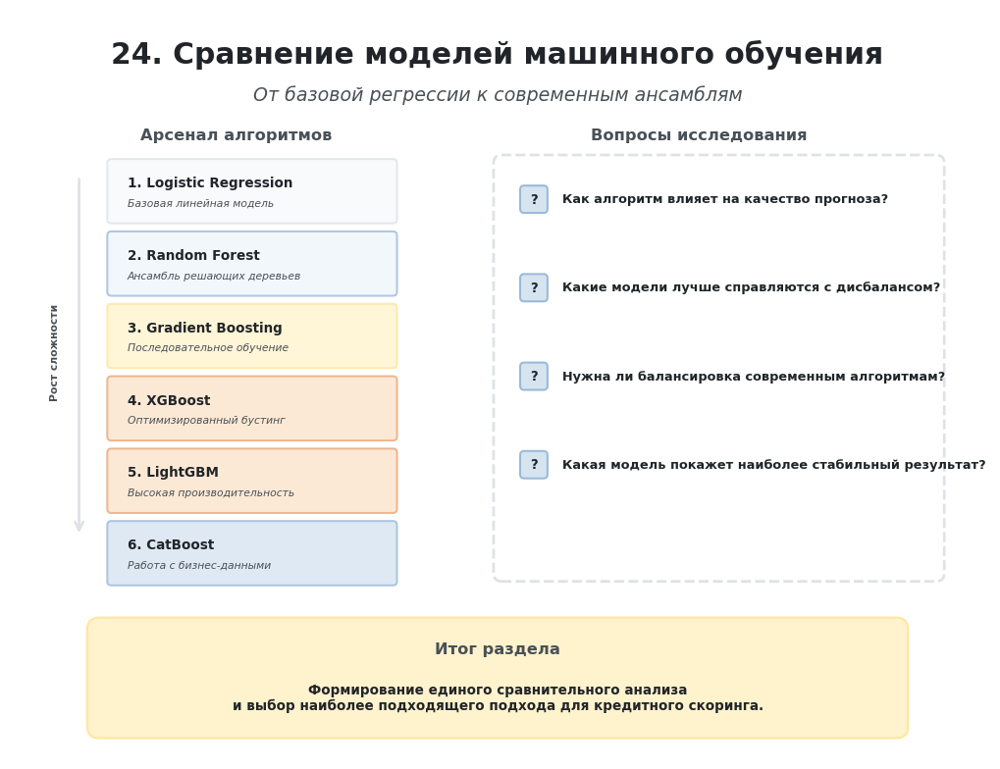

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.2, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "24. Сравнение моделей машинного обучения",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "От базовой регрессии к современным ансамблям",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Арсенал алгоритмов (Ступени сложности)
# ==========================================
ax.text(2.75, 6.5, "Арсенал алгоритмов", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Стрелка роста сложности
ax.annotate("", xy=(0.8, 1.5), xytext=(0.8, 6.0),
            arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=2*S))
ax.text(0.5, 3.8, "Рост сложности", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, rotation=90, weight="bold")

models = [
    ("1. Logistic Regression", "Базовая линейная модель", GRAY, GRAY_BORDER, 5.8),
    ("2. Random Forest", "Ансамбль решающих деревьев", LIGHT_BLUE, BLUE_BORDER, 4.9),
    ("3. Gradient Boosting", "Последовательное обучение", AMBER, AMBER_BORDER, 4.0),
    ("4. XGBoost", "Оптимизированный бустинг", ORANGE, ORANGE_BORDER, 3.1),
    ("5. LightGBM", "Высокая производительность", ORANGE, ORANGE_BORDER, 2.2),
    ("6. CatBoost", "Работа с бизнес-данными", BLUE, BLUE_BORDER, 1.3)
]

for name, desc, color, border, y_pos in models:
    ax.add_patch(FancyBboxPatch(
        (1.2, y_pos - 0.35), 3.5, 0.7,
        boxstyle="round,pad=0.05,rounding_size=0.05",
        linewidth=1.5*S, edgecolor=border, facecolor=color, alpha=0.8
    ))
    ax.text(1.4, y_pos + 0.1, name, ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
    ax.text(1.4, y_pos - 0.15, desc, ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ==========================================
# ПРАВАЯ ЧАСТЬ: Вопросы исследования (Чек-лист)
# ==========================================
ax.text(8.5, 6.5, "Вопросы исследования", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Контейнер для вопросов
ax.add_patch(FancyBboxPatch(
    (6.0, 1.0), 5.5, 5.2,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=2*S, edgecolor=GRAY_BORDER, facecolor="white", linestyle="--"
))

questions = [
    "Как алгоритм влияет на качество прогноза?",
    "Какие модели лучше справляются с дисбалансом?",
    "Нужна ли балансировка современным алгоритмам?",
    "Какая модель покажет наиболее стабильный результат?"
]

for i, q in enumerate(questions):
    y_q = 5.7 - i * 1.1
    # Иконка чек-листа
    ax.add_patch(FancyBboxPatch((6.3, y_q - 0.15), 0.3, 0.3, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=BLUE, edgecolor=BLUE_BORDER))
    ax.text(6.45, y_q, "?", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
    # Текст вопроса
    ax.text(6.8, y_q, q, ha="left", va="center", fontsize=9.5*S, color=TEXT_DARK, weight="bold")


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -0.9), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.1, "Итог раздела",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.5, "Формирование единого сравнительного анализа\nи выбор наиболее подходящего подхода для кредитного скоринга.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

## 24.1 Подготовка набора моделей для экспериментов

На данном этапе формируется единый набор моделей машинного обучения, которые будут использоваться для дальнейшего сравнительного анализа.

Все модели будут подключены к единому экспериментальному pipeline, что позволит проводить оценку по одинаковым правилам:

- одинаковые обучающие выборки;
- одинаковые тестовые данные;
- одинаковый набор метрик;
- единая процедура оценки качества.

В набор будут включены модели различного уровня сложности:

- Logistic Regression — базовая модель для сравнения;
- Random Forest — ансамбль решающих деревьев;
- Gradient Boosting — последовательное улучшение деревьев;
- XGBoost и LightGBM — современные реализации градиентного бустинга;
- CatBoost — один из наиболее эффективных алгоритмов для табличных данных.

После формирования набора моделей каждая из них будет последовательно протестирована на различных вариантах данных с разным уровнем балансировки классов.

## Установка отсутствующих зависимостей

В текущем окружении отсутствует библиотека CatBoost, которая будет использоваться в финальной части сравнительного исследования.

Перед созданием набора моделей устанавливаем недостающую зависимость и проверяем успешность загрузки.

In [ ]:
# Установка отсутствующей библиотеки CatBoost,
# необходимой для дальнейшего сравнения моделей

!pip install catboost -q


import catboost

print("Библиотека CatBoost успешно установлена.")
print(f"Версия CatBoost: {catboost.__version__}")

print("Следующий этап — повторная проверка доступности всех моделей.")

Библиотека CatBoost успешно установлена.
Версия CatBoost: 1.2.10
Следующий этап — повторная проверка доступности всех моделей.


In [ ]:
# Проверяем наличие библиотек,
# необходимых для создания моделей машинного обучения

import sklearn
import xgboost
import lightgbm
import catboost


print("Проверка библиотек успешно завершена.")
print(f"scikit-learn: {sklearn.__version__}")
print(f"xgboost: {xgboost.__version__}")
print(f"lightgbm: {lightgbm.__version__}")
print(f"catboost: {catboost.__version__}")

print("\nВсе необходимые библиотеки доступны.")
print("Следующий этап — создание набора моделей для экспериментов.")

Проверка библиотек успешно завершена.
scikit-learn: 1.6.1
xgboost: 3.3.0
lightgbm: 4.6.0
catboost: 1.2.10

Все необходимые библиотеки доступны.
Следующий этап — создание набора моделей для экспериментов.


## 24.1.2 Создание набора моделей для сравнительного анализа

На данном этапе формируется единый словарь моделей, которые будут использоваться в дальнейшем исследовании.

Каждая модель создаётся без обучения и сохраняется в исходном состоянии. Обучение будет выполняться позже внутри экспериментального pipeline с использованием одинаковых правил оценки.

Такой подход позволяет:

- использовать единый механизм запуска экспериментов;
- сравнивать модели на одинаковых данных;
- исключить различия, связанные с ручным обучением отдельных алгоритмов.

Модели расположены в порядке увеличения сложности:

от базовой линейной модели к современным алгоритмам градиентного бустинга.

In [ ]:
# Создание единого набора моделей для дальнейших экспериментов

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier


models = {
    "Logistic Regression": LogisticRegression(
        random_state=42,
        max_iter=1000
    ),

    "Random Forest": RandomForestClassifier(
        random_state=42
    ),

    "Gradient Boosting": GradientBoostingClassifier(
        random_state=42
    ),

    "XGBoost": XGBClassifier(
        random_state=42,
        eval_metric="logloss"
    ),

    "LightGBM": LGBMClassifier(
        random_state=42
    ),

    "CatBoost": CatBoostClassifier(
        random_state=42,
        verbose=0
    )
}


print("Набор моделей успешно создан.")
print(f"Количество подготовленных моделей: {len(models)}")

print("\nСписок моделей:")
for model_name in models:
    print(f"- {model_name}")

print("\nСледующий этап — запуск моделей через экспериментальный pipeline.")

Набор моделей успешно создан.
Количество подготовленных моделей: 6

Список моделей:
- Logistic Regression
- Random Forest
- Gradient Boosting
- XGBoost
- LightGBM
- CatBoost

Следующий этап — запуск моделей через экспериментальный pipeline.


## 24.2 Проверка экспериментального pipeline на базовой модели Logistic Regression

Перед запуском полного сравнительного исследования необходимо проверить работу экспериментального pipeline на базовой модели.

В качестве первой модели используется Logistic Regression, так как она является контрольной точкой исследования и ранее уже применялась для анализа влияния дисбаланса классов.

На данном этапе выполняется повторный запуск эксперимента через универсальную функцию оценки моделей.

Цель проверки:

- убедиться, что новая архитектура корректно работает с набором моделей;
- получить контрольные результаты для дальнейшего сравнения;
- подтвердить, что процесс оценки одинаков для всех будущих алгоритмов.

После успешной проверки можно переходить к экспериментам с более сложными моделями.

In [ ]:
# Получение базовой модели Logistic Regression
# из общего набора моделей для проверки pipeline

baseline_model = models["Logistic Regression"]


print("Базовая модель Logistic Regression успешно подготовлена.")
print("Следующий этап — запуск модели через экспериментальный pipeline.")

Базовая модель Logistic Regression успешно подготовлена.
Следующий этап — запуск модели через экспериментальный pipeline.


## 24.3 Запуск Logistic Regression через экспериментальный pipeline

На данном этапе базовая модель Logistic Regression запускается через универсальную функцию серии экспериментов.

Модель будет последовательно обучена на всех подготовленных вариантах обучающих данных.

Результаты этого запуска будут использоваться как контрольная точка для сравнения с более сложными алгоритмами машинного обучения.

In [ ]:
# Запуск базовой модели Logistic Regression
# на всех подготовленных вариантах обучающих данных

logistic_results = run_experiments(
    model=models["Logistic Regression"],
    model_name="Logistic Regression",
    training_sets=training_sets,
    X_test=X_test,
    y_test=y_test,
    continue_on_error=False,
    store_models=True,
    store_predictions=True,
    verbose=True
)


print("\nЭксперимент Logistic Regression успешно завершён.")
print("Следующий этап — анализ результатов базовой модели.")

Запуск серии экспериментов: Logistic Regression
Количество вариантов данных: 8
Режим обработки ошибок: останавливать при ошибке

[1/8] Baseline
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9579
Precision: 0.8897
Recall: 0.6452
F1: 0.7480
ROC-AUC: 0.9480
Gini: 0.8960
Время обучения: 5.8674 сек.

[2/8] RandomOverSampler
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9067
Precision: 0.5107
Recall: 0.8481
F1: 0.6375
ROC-AUC: 0.9490
Gini: 0.8979
Время обучения: 13.8376 сек.

[3/8] SMOTE
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9069
Precision: 0.5114
Recall: 0.8481
F1: 0.6380
ROC-AUC: 0.9481
Gini: 0.8962
Время обучения: 12.9954 сек.

[4/8] ADASYN
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.8318
Precision: 0.3554
Recall: 0.9082
F1: 0.5109
ROC-AUC: 0.9474
Gini: 0.8948
Время обуч

In [ ]:
# ==========================================================
# Извлечение результатов эксперимента Logistic Regression
# ==========================================================

# Сохраняем основные компоненты эксперимента отдельно:
# - таблицу результатов для анализа качества модели;
# - таблицу ошибок для контроля корректности запуска;
# - итоговую информацию о выполнении серии экспериментов.

logistic_results_table = (
    logistic_results["results_table"]
)

logistic_errors = (
    logistic_results["errors"]
)

logistic_summary = (
    logistic_results["summary"]
)


print("=" * 70)
print(
    "Проверка эксперимента Logistic Regression завершена."
)

print(
    "Количество успешных экспериментов:",
    logistic_summary["Successful Experiments"]
)

print(
    "Количество ошибок:",
    logistic_summary["Failed Experiments"]
)

print("=" * 70)

Проверка эксперимента Logistic Regression завершена.
Количество успешных экспериментов: 8
Количество ошибок: 0


## Анализ результатов Logistic Regression

В рамках первого эксперимента базовая модель Logistic Regression была протестирована на восьми вариантах обучающих данных с различными методами балансировки классов.

### Технический результат

На исходных данных без балансировки модель показала следующие результаты:

- Accuracy: 0.9579
- Precision: 0.8897
- Recall: 0.6452
- F1-score: 0.7480
- ROC-AUC: 0.9480

Применение методов балансировки практически не изменило значение ROC-AUC. Для большинства методов показатель оставался на уровне 0.947–0.949.

При этом методы балансировки существенно повлияли на распределение ошибок:

- RandomOverSampler, SMOTE и RandomUnderSampler увеличили Recall примерно с 0.65 до 0.85, но привели к снижению Precision.
- ADASYN показал максимальный Recall (0.9082), однако снижение Precision до 0.3554 привело к уменьшению F1-score.
- NearMiss значительно ухудшил общее качество модели: ROC-AUC снизился до 0.8187, а F1-score — до 0.2532.
- Tomek Links и Edited Nearest Neighbours сохранили качество модели близким к исходному уровню.

### ML-интерпретация

Результаты показывают, что для Logistic Regression дисбаланс классов не является критической проблемой с точки зрения способности модели разделять классы.

Высокое значение ROC-AUC на исходных данных говорит о том, что модель уже хорошо различает клиентов разных классов.

Основное влияние балансировка оказала не на качество разделения классов, а на изменение поведения классификатора:

- повышение Recall позволяет обнаруживать больше объектов редкого класса;
- снижение Precision показывает рост количества ложноположительных решений.

Таким образом, выбор метода балансировки зависит от требуемого компромисса между обнаружением рискованных клиентов и количеством ошибочных классификаций.

### Бизнес-интерпретация

Для кредитного скоринга повышение Recall может быть полезным, так как позволяет выявлять больше потенциальных дефолтных клиентов.

Однако чрезмерное увеличение чувствительности модели приводит к росту числа клиентов, которые могут быть ошибочно классифицированы как рискованные.

Поэтому для бизнеса важно учитывать не только количество найденных дефолтов, но и стоимость ошибочных решений.

### Промежуточный вывод

На первом этапе исследования Logistic Regression показала высокое качество работы даже при исходном дисбалансе классов.

Методы балансировки не привели к существенному росту ROC-AUC, однако изменили баланс между Precision и Recall.

Следующий этап исследования — проверка, сохраняется ли такая закономерность для более сложных моделей машинного обучения.

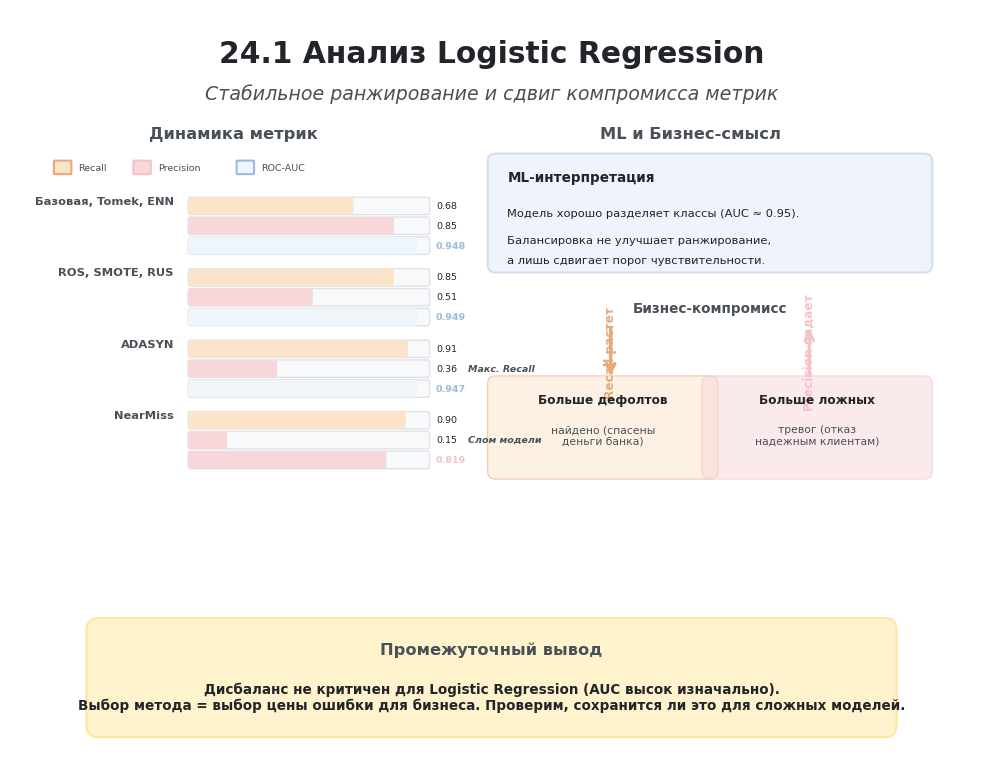

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.5, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "24.1 Анализ Logistic Regression",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Стабильное ранжирование и сдвиг компромисса метрик",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Динамика метрик по группам методов
# ==========================================
ax.text(2.75, 6.5, "Динамика метрик", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Легенда
ax.add_patch(FancyBboxPatch((0.5, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=ORANGE, edgecolor=ORANGE_BORDER))
ax.text(0.8, 6.07, "Recall", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((1.5, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=RED_FILL, edgecolor=RED_BORDER))
ax.text(1.8, 6.07, "Precision", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((2.8, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=LIGHT_BLUE, edgecolor=BLUE_BORDER))
ax.text(3.1, 6.07, "ROC-AUC", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)

bar_x_start = 2.2
bar_max_w = 3.0
bar_h = 0.18

# Данные: (Название группы, Recall, Precision, AUC, Y_pos, Особенность)
groups_data = [
    ("Базовая, Tomek, ENN", 0.68, 0.85, 0.948, 5.5, ""),
    ("ROS, SMOTE, RUS", 0.85, 0.51, 0.949, 4.6, ""),
    ("ADASYN", 0.91, 0.36, 0.947, 3.7, "Макс. Recall"),
    ("NearMiss", 0.90, 0.15, 0.819, 2.8, "Слом модели")
]

for name, rec, prec, auc, y_pos, feature in groups_data:
    # Название группы
    ax.text(2.0, y_pos + 0.15, name, ha="right", va="center", fontsize=8.5*S, weight="bold", color=TEXT_MUTED)

    # Шкала Recall
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos), bar_max_w * rec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=ORANGE, edgecolor=ORANGE_BORDER))

    # Шкала Precision
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.25), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.25), bar_max_w * prec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=RED_FILL, edgecolor=RED_BORDER))

    # Шкала ROC-AUC (Если сломалась - красная)
    auc_color = RED_FILL if auc < 0.90 else LIGHT_BLUE
    auc_border = RED_BORDER if auc < 0.90 else BLUE_BORDER
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.5), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.5), bar_max_w * auc, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=auc_color, edgecolor=auc_border))

    # Значения справа
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos + 0.09, f"{rec:.2f}", ha="left", va="center", fontsize=7*S, color=TEXT_DARK)
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos - 0.16, f"{prec:.2f}", ha="left", va="center", fontsize=7*S, color=TEXT_DARK)
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos - 0.41, f"{auc:.3f}", ha="left", va="center", fontsize=7*S, color=auc_border, weight="bold")

    # Особенность
    if feature:
        ax.text(bar_x_start + bar_max_w + 0.5, y_pos - 0.16, feature, ha="left", va="center", fontsize=7*S, color=TEXT_MUTED, style="italic", weight="bold")


# ==========================================
# ПРАВАЯ ЧАСТЬ: ML и Бизнес интерпретация
# ==========================================
ax.text(8.5, 6.5, "ML и Бизнес-смысл", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Блок 1: ML-интерпретация (Стабильность) ---
ax.add_patch(FancyBboxPatch(
    (6.0, 4.8), 5.5, 1.4,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.4
))
ax.text(6.2, 5.95, "ML-интерпретация", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(6.2, 5.5, "Модель хорошо разделяет классы (AUC ≈ 0.95).", ha="left", va="center", fontsize=8.5*S, color=TEXT_DARK)
ax.text(6.2, 5.15, "Балансировка не улучшает ранжирование,", ha="left", va="center", fontsize=8.5*S, color=TEXT_DARK)
ax.text(6.2, 4.9, "а лишь сдвигает порог чувствительности.", ha="left", va="center", fontsize=8.5*S, color=TEXT_DARK)

# --- Блок 2: Бизнес-интерпретация (Компромисс) ---
ax.text(8.75, 4.3, "Бизнес-компромисс", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)

# Оранжевая стрелка (Recall)
ax.annotate("", xy=(7.5, 3.4), xytext=(7.5, 4.1),
            arrowprops=dict(arrowstyle="->", color=ORANGE_BORDER, lw=2.5*S))
ax.text(7.5, 3.75, "Recall растет", ha="center", va="center", fontsize=9*S, weight="bold", color=ORANGE_BORDER, rotation=90)

# Красная стрелка (Precision)
ax.annotate("", xy=(10.0, 4.1), xytext=(10.0, 3.4),
            arrowprops=dict(arrowstyle="->", color=RED_BORDER, lw=2.5*S))
ax.text(10.0, 3.75, "Precision падает", ha="center", va="center", fontsize=9*S, weight="bold", color=RED_BORDER, rotation=90)

# Текст бизнес-смысла
ax.add_patch(FancyBboxPatch(
    (6.0, 2.2), 2.8, 1.2,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE, alpha=0.5
))
ax.text(7.4, 3.15, "Больше дефолтов", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)
ax.text(7.4, 2.7, "найдено (спасены\nденьги банка)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)

ax.add_patch(FancyBboxPatch(
    (8.7, 2.2), 2.8, 1.2,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1*S, edgecolor=RED_BORDER, facecolor=RED_FILL, alpha=0.5
))
ax.text(10.1, 3.15, "Больше ложных", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)
ax.text(10.1, 2.7, "тревог (отказ\nнадежным клиентам)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED)


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -1.0), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.0, "Промежуточный вывод",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.6, "Дисбаланс не критичен для Logistic Regression (AUC высок изначально).\nВыбор метода = выбор цены ошибки для бизнеса. Проверим, сохранится ли это для сложных моделей.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

## 24.4 Random Forest

На данном этапе исследования выполняется оценка модели Random Forest.

В отличие от Logistic Regression, которая строит линейную зависимость между признаками и целевой переменной, Random Forest использует ансамбль решающих деревьев.

Это позволяет модели учитывать:

- нелинейные зависимости между признаками;
- сложные взаимодействия между характеристиками клиентов;
- различные комбинации факторов, влияющих на вероятность дефолта.

Цель данного эксперимента — определить, насколько переход к более сложному алгоритму влияет на качество классификации и устойчивость модели к дисбалансу классов.

Random Forest будет протестирован через тот же экспериментальный pipeline, который ранее использовался для Logistic Regression.

Это позволит провести честное сравнение моделей при одинаковых условиях:
- одинаковые обучающие выборки;
- одинаковый тестовый набор;
- одинаковые метрики оценки.

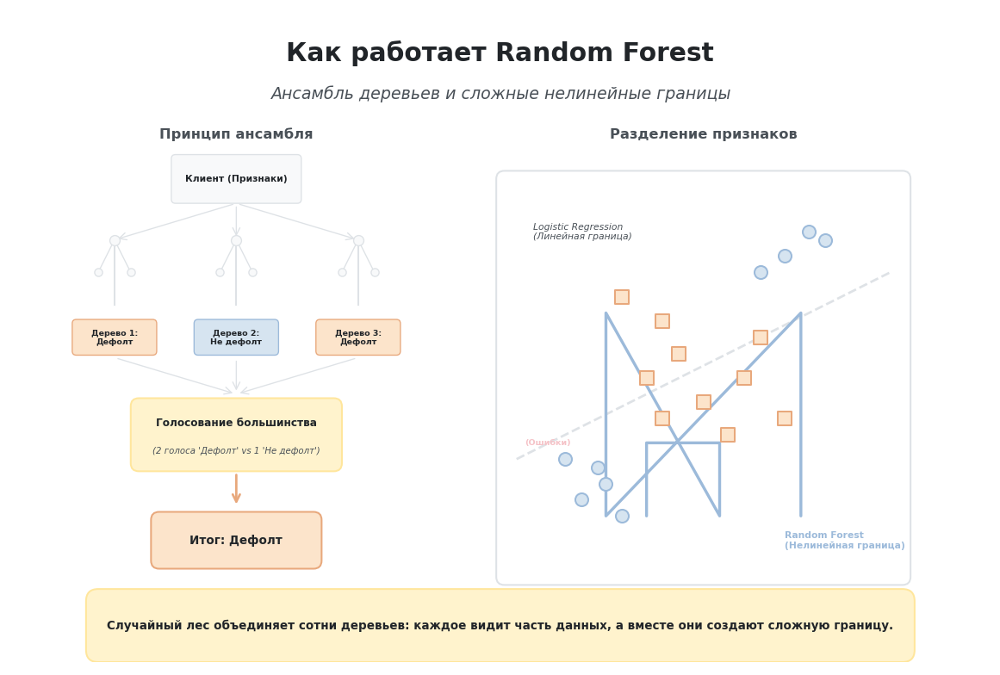

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Как работает Random Forest",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Ансамбль деревьев и сложные нелинейные границы",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Принцип ансамбля (Голосование)
# ==========================================
ax.text(2.75, 6.5, "Принцип ансамбля", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Входные данные
ax.add_patch(FancyBboxPatch((2.0, 5.7), 1.5, 0.5, boxstyle="round,pad=0.05,rounding_size=0.05", facecolor=GRAY, edgecolor=GRAY_BORDER, linewidth=1*S))
ax.text(2.75, 5.95, "Клиент (Признаки)", ha="center", va="center", fontsize=8*S, weight="bold", color=TEXT_DARK)

# Деревья (3 штуки)
tree_x = [1.25, 2.75, 4.25]
tree_preds = ["Дефолт", "Не дефолт", "Дефолт"]
tree_colors = [ORANGE, BLUE, ORANGE]
tree_borders = [ORANGE_BORDER, BLUE_BORDER, ORANGE_BORDER]

for i, (tx, pred, c, b) in enumerate(zip(tree_x, tree_preds, tree_colors, tree_borders)):
    # Стрелка от данных к дереву
    ax.annotate("", xy=(tx, 5.2), xytext=(2.75, 5.65),
                arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1*S))

    # Ствол дерева
    ax.plot([tx, tx], [4.4, 5.2], color=GRAY_BORDER, lw=1.5*S)
    # Узлы дерева (примитивная схема)
    ax.scatter([tx], [5.2], s=50*S, c=GRAY, edgecolors=GRAY_BORDER, linewidths=1*S, zorder=3)
    ax.plot([tx, tx-0.2], [5.2, 4.8], color=GRAY_BORDER, lw=1*S)
    ax.plot([tx, tx+0.2], [5.2, 4.8], color=GRAY_BORDER, lw=1*S)
    ax.scatter([tx-0.2, tx+0.2], [4.8, 4.8], s=30*S, c=GRAY, edgecolors=GRAY_BORDER, linewidths=1*S, zorder=3)

    # Прогноз дерева
    ax.add_patch(FancyBboxPatch((tx-0.5, 3.8), 1.0, 0.4, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=c, edgecolor=b, linewidth=1*S))
    ax.text(tx, 4.0, f"Дерево {i+1}:\n{pred}", ha="center", va="center", fontsize=7*S, color=TEXT_DARK, weight="bold")

# Стрелки к голосованию
ax.annotate("", xy=(2.75, 3.3), xytext=(1.25, 3.75), arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1*S))
ax.annotate("", xy=(2.75, 3.3), xytext=(2.75, 3.75), arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1*S))
ax.annotate("", xy=(2.75, 3.3), xytext=(4.25, 3.75), arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1*S))

# Блок голосования
ax.add_patch(FancyBboxPatch((1.5, 2.4), 2.5, 0.8, boxstyle="round,pad=0.05,rounding_size=0.1", facecolor=AMBER, edgecolor=AMBER_BORDER, linewidth=1.5*S))
ax.text(2.75, 2.95, "Голосование большинства", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)
ax.text(2.75, 2.6, "(2 голоса 'Дефолт' vs 1 'Не дефолт')", ha="center", va="center", fontsize=7.5*S, color=TEXT_MUTED, style="italic")

# Итоговый прогноз
ax.annotate("", xy=(2.75, 1.9), xytext=(2.75, 2.35), arrowprops=dict(arrowstyle="->", color=ORANGE_BORDER, lw=2*S))
ax.add_patch(FancyBboxPatch((1.75, 1.2), 2.0, 0.6, boxstyle="round,pad=0.05,rounding_size=0.1", facecolor=ORANGE, edgecolor=ORANGE_BORDER, linewidth=1.5*S))
ax.text(2.75, 1.5, "Итог: Дефолт", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)


# ==========================================
# ПРАВАЯ ЧАСТЬ: Разделение признаков (Граница)
# ==========================================
ax.text(8.5, 6.5, "Разделение признаков", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Рамка графика
ax.add_patch(FancyBboxPatch((6.0, 1.0), 5.0, 5.0, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor="white"))

# Точки (Сложное распределение, которое нельзя разделить прямой)
# Синие точки (Кластер)
blue_x = [7.0, 7.3, 6.8, 7.5, 7.2, 9.5, 9.8, 9.2, 10.0]
blue_y = [2.0, 2.2, 2.5, 1.8, 2.4, 5.0, 5.3, 4.8, 5.2]
ax.scatter(blue_x, blue_y, s=80*S, c=BLUE, edgecolors=BLUE_BORDER, linewidths=1.5*S, label="Надежные", zorder=3)

# Оранжевые точки (Кольцо/Смешение)
orange_x = [8.0, 8.5, 9.0, 8.2, 8.8, 7.5, 8.0, 7.8, 9.5, 9.2]
orange_y = [3.0, 3.2, 3.5, 3.8, 2.8, 4.5, 4.2, 3.5, 3.0, 4.0]
ax.scatter(orange_x, orange_y, s=80*S, c=ORANGE, edgecolors=ORANGE_BORDER, linewidths=1.5*S, marker='s', label="Дефолт", zorder=3)

# --- Линия Logistic Regression (Пунктир, пытается разделить пополам) ---
ax.plot([6.2, 10.8], [2.5, 4.8], color=GRAY_BORDER, linestyle="--", linewidth=2*S, zorder=2)
ax.text(6.4, 5.3, "Logistic Regression\n(Линейная граница)", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")
ax.text(6.3, 2.7, "(Ошибки)", ha="left", va="center", fontsize=7*S, color=RED_BORDER if 'RED_BORDER' in dir() else "#F5C2C7", weight="bold")

# --- Граница Random Forest (Ступенчатая, огибает точки) ---
# Рисуем сложную ступенчатую границу
rf_x = [7.8, 7.8, 8.7, 8.7, 7.3, 7.3, 9.7, 9.7]
rf_y = [1.8, 2.7, 2.7, 1.8, 4.3, 1.8, 4.3, 1.8]
ax.plot(rf_x, rf_y, color=BLUE_BORDER, linewidth=2.5*S, zorder=2, solid_capstyle="round")

ax.text(9.5, 1.5, "Random Forest\n(Нелинейная граница)", ha="left", va="center", fontsize=8*S, color=BLUE_BORDER, weight="bold")


# ---------- Итоговый блок (Внизу) ----------
res_box = FancyBboxPatch(
    (1.0, 0.1), 10.0, 0.7,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.45, "Случайный лес объединяет сотни деревьев: каждое видит часть данных, а вместе они создают сложную границу.",
    ha="center", va="center",
    fontsize=10*S, weight="bold", color=TEXT_DARK
)

plt.tight_layout()
plt.show()

In [ ]:
# Получение модели Random Forest
# из общего набора моделей для дальнейшего эксперимента

random_forest_model = models["Random Forest"]


print("Модель Random Forest успешно подготовлена.")
print("Следующий этап — запуск экспериментов через pipeline.")

Модель Random Forest успешно подготовлена.
Следующий этап — запуск экспериментов через pipeline.


In [ ]:
  # Запуск Random Forest на всех вариантах обучающих данных

random_forest_results = run_experiments(
    model=random_forest_model,
    model_name="Random Forest",
    training_sets=training_sets,
    X_test=X_test,
    y_test=y_test,
    continue_on_error=False,
    store_models=True,
    store_predictions=True,
    verbose=True
)


print("\nЭксперимент Random Forest успешно завершён.")
print("Следующий этап — анализ результатов и сравнение с Logistic Regression.")

Запуск серии экспериментов: Random Forest
Количество вариантов данных: 8
Режим обработки ошибок: останавливать при ошибке

[1/8] Baseline
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9620
Precision: 0.9537
Recall: 0.6379
F1: 0.7645
ROC-AUC: 0.9498
Gini: 0.8996
Время обучения: 161.8307 сек.

[2/8] RandomOverSampler
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9614
Precision: 0.9168
Recall: 0.6606
F1: 0.7679
ROC-AUC: 0.9536
Gini: 0.9072
Время обучения: 238.8903 сек.

[3/8] SMOTE
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9607
Precision: 0.8779
Recall: 0.6899
F1: 0.7726
ROC-AUC: 0.9524
Gini: 0.9049
Время обучения: 377.1787 сек.

[4/8] ADASYN
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9580
Precision: 0.8354
Recall: 0.7052
F1: 0.7648
ROC-AUC: 0.9523
Gini: 0.9046
Время обучен

In [ ]:
# ==========================================================
# Извлечение результатов эксперимента Random Forest
# ==========================================================

# Сохраняем основные компоненты эксперимента:
# - таблицу результатов для дальнейшего анализа качества модели;
# - информацию об ошибках выполнения;
# - сводную информацию о запуске серии экспериментов.

random_forest_results_table = (
    random_forest_results["results_table"]
)

random_forest_errors = (
    random_forest_results["errors"]
)

random_forest_summary = (
    random_forest_results["summary"]
)


# Проверяем корректность завершения эксперимента.
# Полная таблица результатов будет использоваться
# позже при общем сравнении всех моделей.

print("=" * 70)
print(
    "Проверка эксперимента Random Forest завершена."
)

print(
    "Количество успешных экспериментов:",
    random_forest_summary["Successful Experiments"]
)

print(
    "Количество ошибок:",
    random_forest_summary["Failed Experiments"]
)

print("=" * 70)

Проверка эксперимента Random Forest завершена.
Количество успешных экспериментов: 8
Количество ошибок: 0


## Анализ результатов Random Forest

В рамках второго эксперимента была проведена оценка модели Random Forest на восьми вариантах обучающих данных с различными методами балансировки классов.

### Технический результат

На исходных данных без балансировки Random Forest показал следующие результаты:

- Accuracy: 0.9620
- Precision: 0.9537
- Recall: 0.6379
- F1-score: 0.7645
- ROC-AUC: 0.9498

По сравнению с Logistic Regression модель показала небольшое улучшение F1-score:

- Logistic Regression: 0.7480
- Random Forest: 0.7645

Также увеличились Accuracy и Precision, что говорит о более точной классификации объектов.

Применение методов балансировки изменило поведение модели:

- RandomOverSampler увеличил ROC-AUC до 0.9536 и F1-score до 0.7679.
- SMOTE показал лучший результат по F1-score среди методов балансировки: 0.7726.
- ADASYN увеличил Recall до 0.7052, однако при этом произошло снижение Precision.
- RandomUnderSampler значительно увеличил Recall до 0.8709, но привёл к резкому снижению Precision и F1-score.
- NearMiss показал неудовлетворительный результат: несмотря на высокий Recall (0.9325), модель получила низкий Precision и F1-score.
- Tomek Links и Edited Nearest Neighbours сохранили качество, близкое к исходному варианту.

### ML-интерпретация

Random Forest продемонстрировал более высокую устойчивость к дисбалансу классов по сравнению с Logistic Regression.

В отличие от линейной модели, дерево решений способно учитывать нелинейные зависимости между признаками, поэтому исходная выборка уже позволила получить высокое качество классификации.

Методы балансировки не привели к существенному увеличению ROC-AUC, однако повлияли на распределение ошибок:

- увеличение Recall сопровождалось снижением Precision;
- агрессивное уменьшение большинства класса ухудшало баланс между ошибками первого и второго рода.

Наилучший компромисс для Random Forest показал метод SMOTE, который позволил немного улучшить F1-score без значительного снижения Precision.

### Бизнес-интерпретация

Для задачи кредитного скоринга Random Forest показывает способность находить сложные зависимости в данных и обеспечивать высокую точность классификации.

Балансировка классов позволяет увеличить количество найденных рискованных клиентов, однако чрезмерное увеличение Recall приводит к росту числа ошибочных предупреждений.

С точки зрения бизнеса наиболее интересны методы, которые улучшают обнаружение дефолтов без значительного увеличения количества ложных отказов.

### Промежуточный вывод

Эксперимент показал, что Random Forest работает стабильно даже на исходных несбалансированных данных.

Балансировка классов не дала существенного прироста ROC-AUC, однако некоторые методы улучшили баланс между Precision и Recall.

На данном этапе Random Forest показывает небольшое преимущество над Logistic Regression, однако окончательный вывод о влиянии дисбаланса будет сделан после сравнения всех моделей.

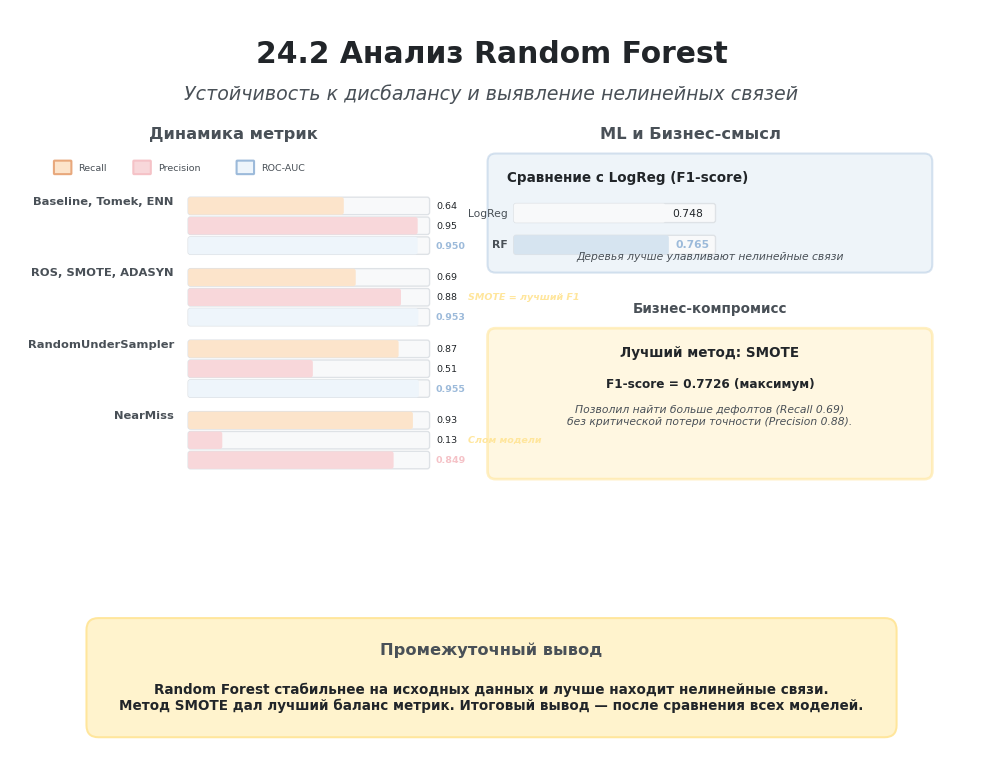

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.5, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "24.2 Анализ Random Forest",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Устойчивость к дисбалансу и выявление нелинейных связей",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Динамика метрик
# ==========================================
ax.text(2.75, 6.5, "Динамика метрик", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Легенда
ax.add_patch(FancyBboxPatch((0.5, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=ORANGE, edgecolor=ORANGE_BORDER))
ax.text(0.8, 6.07, "Recall", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((1.5, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=RED_FILL, edgecolor=RED_BORDER))
ax.text(1.8, 6.07, "Precision", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((2.8, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=LIGHT_BLUE, edgecolor=BLUE_BORDER))
ax.text(3.1, 6.07, "ROC-AUC", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)

bar_x_start = 2.2
bar_max_w = 3.0
bar_h = 0.18

# Данные: (Название группы, Recall, Precision, AUC, Y_pos, Особенность)
groups_data = [
    ("Baseline, Tomek, ENN", 0.64, 0.95, 0.950, 5.5, ""),
    ("ROS, SMOTE, ADASYN", 0.69, 0.88, 0.953, 4.6, "SMOTE = лучший F1"),
    ("RandomUnderSampler", 0.87, 0.51, 0.955, 3.7, ""),
    ("NearMiss", 0.93, 0.13, 0.849, 2.8, "Слом модели")
]

for name, rec, prec, auc, y_pos, feature in groups_data:
    ax.text(2.0, y_pos + 0.15, name, ha="right", va="center", fontsize=8.5*S, weight="bold", color=TEXT_MUTED)

    # Шкала Recall
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos), bar_max_w * rec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=ORANGE, edgecolor=ORANGE_BORDER))

    # Шкала Precision
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.25), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.25), bar_max_w * prec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=RED_FILL, edgecolor=RED_BORDER))

    # Шкала ROC-AUC
    auc_color = RED_FILL if auc < 0.90 else LIGHT_BLUE
    auc_border = RED_BORDER if auc < 0.90 else BLUE_BORDER
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.5), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.5), bar_max_w * auc, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=auc_color, edgecolor=auc_border))

    # Значения справа
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos + 0.09, f"{rec:.2f}", ha="left", va="center", fontsize=7*S, color=TEXT_DARK)
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos - 0.16, f"{prec:.2f}", ha="left", va="center", fontsize=7*S, color=TEXT_DARK)
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos - 0.41, f"{auc:.3f}", ha="left", va="center", fontsize=7*S, color=auc_border, weight="bold")

    if feature:
        ax.text(bar_x_start + bar_max_w + 0.5, y_pos - 0.16, feature, ha="left", va="center", fontsize=7*S, color=AMBER_BORDER, style="italic", weight="bold")


# ==========================================
# ПРАВАЯ ЧАСТЬ: ML и Бизнес интерпретация
# ==========================================
ax.text(8.5, 6.5, "ML и Бизнес-смысл", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Блок 1: Сравнение с LogReg (ML-интерпретация) ---
ax.add_patch(FancyBboxPatch(
    (6.0, 4.8), 5.5, 1.4,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.4
))
ax.text(6.2, 5.95, "Сравнение с LogReg (F1-score)", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# Полоски F1
f1_bar_x = 6.3
f1_bar_max_w = 2.5
f1_bar_h = 0.2

# LogReg
ax.text(6.2, 5.5, "LogReg", ha="right", va="center", fontsize=8*S, color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((f1_bar_x, 5.4), f1_bar_max_w, f1_bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((f1_bar_x, 5.4), f1_bar_max_w * 0.748, f1_bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=GRAY, edgecolor=GRAY_BORDER))
ax.text(f1_bar_x + f1_bar_max_w * 0.748 + 0.1, 5.5, "0.748", ha="left", va="center", fontsize=8*S, color=TEXT_DARK)

# RF
ax.text(6.2, 5.1, "RF", ha="right", va="center", fontsize=8*S, weight="bold", color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((f1_bar_x, 5.0), f1_bar_max_w, f1_bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
ax.add_patch(FancyBboxPatch((f1_bar_x, 5.0), f1_bar_max_w * 0.765, f1_bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=BLUE, edgecolor=BLUE_BORDER))
ax.text(f1_bar_x + f1_bar_max_w * 0.765 + 0.1, 5.1, "0.765", ha="left", va="center", fontsize=8*S, color=BLUE_BORDER, weight="bold")

ax.text(8.75, 4.95, "Деревья лучше улавливают нелинейные связи", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# --- Блок 2: Бизнес-смысл (Победитель) ---
ax.text(8.75, 4.3, "Бизнес-компромисс", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)

# Блок SMOTE (Лучший выбор)
ax.add_patch(FancyBboxPatch(
    (6.0, 2.2), 5.5, 1.8,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=2*S, edgecolor=AMBER_BORDER, facecolor=AMBER, alpha=0.6
))
ax.text(8.75, 3.75, "Лучший метод: SMOTE", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(8.75, 3.35, "F1-score = 0.7726 (максимум)", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")
ax.text(8.75, 2.95, "Позволил найти больше дефолтов (Recall 0.69)\nбез критической потери точности (Precision 0.88).", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -1.0), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.0, "Промежуточный вывод",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.6, "Random Forest стабильнее на исходных данных и лучше находит нелинейные связи.\nМетод SMOTE дал лучший баланс метрик. Итоговый вывод — после сравнения всех моделей.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

## 24.5 Gradient Boosting

На данном этапе исследования выполняется оценка модели Gradient Boosting.

В отличие от Random Forest, где множество деревьев строятся независимо друг от друга, Gradient Boosting создаёт последовательность моделей, каждая из которых направлена на исправление ошибок предыдущих.

Такой подход позволяет модели лучше находить сложные зависимости между признаками и целевой переменной.

Цель эксперимента:

- сравнить качество Gradient Boosting с предыдущими моделями;
- определить, улучшает ли последовательное обучение деревьев качество классификации;
- оценить влияние методов балансировки классов на поведение модели.

Как и предыдущие алгоритмы, Gradient Boosting будет протестирован через единый экспериментальный pipeline с одинаковыми обучающими и тестовыми данными.

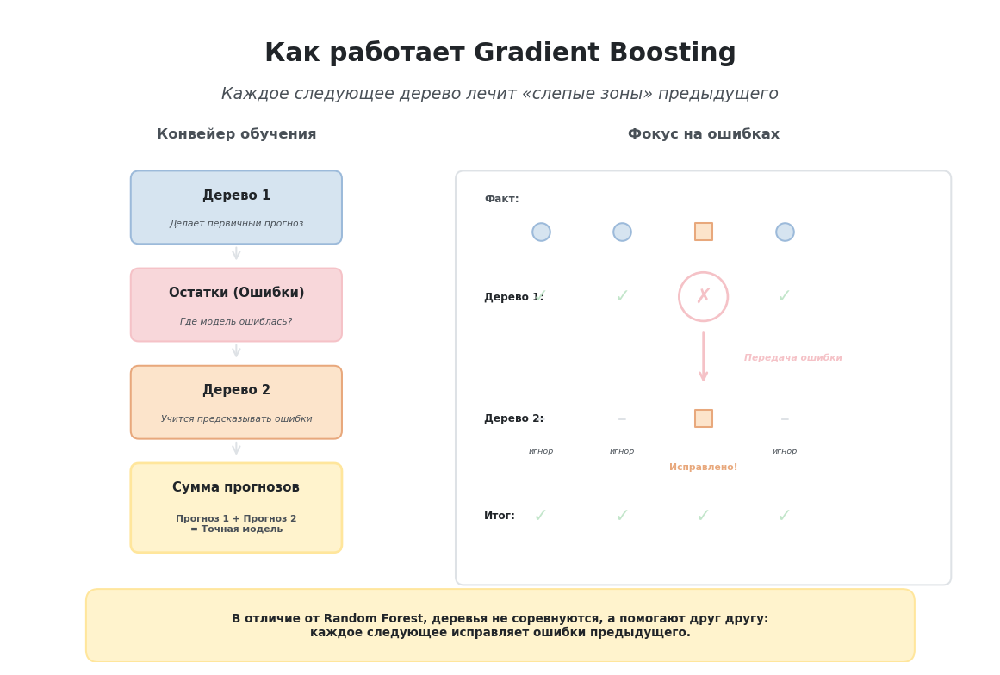

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
GREEN_FILL = "#D4EDDA"
GREEN_BORDER = "#C3E6CB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Как работает Gradient Boosting",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Каждое следующее дерево лечит «слепые зоны» предыдущего",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Конвейер (Что за чем идет)
# ==========================================
ax.text(2.75, 6.5, "Конвейер обучения", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Шаг 1: Дерево 1 ---
ax.add_patch(FancyBboxPatch((1.5, 5.2), 2.5, 0.8, boxstyle="round,pad=0.05,rounding_size=0.1", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=1.5*S))
ax.text(2.75, 5.75, "Дерево 1", ha="center", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(2.75, 5.4, "Делает первичный прогноз", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

ax.annotate("", xy=(2.75, 4.9), xytext=(2.75, 5.15), arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.5*S))

# --- Шаг 2: Ошибки ---
ax.add_patch(FancyBboxPatch((1.5, 4.0), 2.5, 0.8, boxstyle="round,pad=0.05,rounding_size=0.1", facecolor=RED_FILL, edgecolor=RED_BORDER, linewidth=1.5*S))
ax.text(2.75, 4.55, "Остатки (Ошибки)", ha="center", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(2.75, 4.2, "Где модель ошиблась?", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

ax.annotate("", xy=(2.75, 3.7), xytext=(2.75, 3.95), arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.5*S))

# --- Шаг 3: Дерево 2 ---
ax.add_patch(FancyBboxPatch((1.5, 2.8), 2.5, 0.8, boxstyle="round,pad=0.05,rounding_size=0.1", facecolor=ORANGE, edgecolor=ORANGE_BORDER, linewidth=1.5*S))
ax.text(2.75, 3.35, "Дерево 2", ha="center", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(2.75, 3.0, "Учится предсказывать ошибки", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

ax.annotate("", xy=(2.75, 2.5), xytext=(2.75, 2.75), arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.5*S))

# --- Шаг 4: Итог ---
ax.add_patch(FancyBboxPatch((1.5, 1.4), 2.5, 1.0, boxstyle="round,pad=0.05,rounding_size=0.1", facecolor=AMBER, edgecolor=AMBER_BORDER, linewidth=2*S))
ax.text(2.75, 2.15, "Сумма прогнозов", ha="center", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(2.75, 1.7, "Прогноз 1 + Прогноз 2\n= Точная модель", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, weight="bold")


# ==========================================
# ПРАВАЯ ЧАСТЬ: Фокус на ошибках (Наглядный пример)
# ==========================================
ax.text(8.5, 6.5, "Фокус на ошибках", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Рамка примера
ax.add_patch(FancyBboxPatch((5.5, 1.0), 6.0, 5.0, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor="white"))

# --- Клиенты (4 штуки) ---
clients_x = [6.5, 7.5, 8.5, 9.5]
clients_y = 5.3
ax.text(5.8, 5.7, "Факт:", ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_MUTED)

# Классы клиентов: 0, 0, 1, 0 (Третий - дефолт)
client_classes = [BLUE, BLUE, ORANGE, BLUE]
client_markers = ['o', 'o', 's', 'o']
client_borders = [BLUE_BORDER, BLUE_BORDER, ORANGE_BORDER, BLUE_BORDER]

for cx, c, m, b in zip(clients_x, client_classes, client_markers, client_borders):
    ax.scatter([cx], [clients_y], s=150*S, c=c, edgecolors=b, linewidths=1.5*S, marker=m, zorder=3)

# --- Прогноз Дерева 1 ---
ax.text(5.8, 4.5, "Дерево 1:", ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# Дерево 1 ошиблось на 3-м клиенте (предсказала 0 вместо 1)
tree1_preds = [BLUE, BLUE, BLUE, BLUE]
tree1_markers = ['o', 'o', 'o', 'o']
tree1_borders = [BLUE_BORDER, BLUE_BORDER, BLUE_BORDER, BLUE_BORDER]

for i, (cx, c, m, b) in enumerate(zip(clients_x, tree1_preds, tree1_markers, tree1_borders)):
    # Правильные прогнозы - зеленая галочка
    if i == 2:
        # Ошибочный прогноз - красный крестик
        ax.text(cx, 4.5, "✗", ha="center", va="center", fontsize=18*S, color=RED_BORDER, weight="bold", zorder=4)
        # Обводим ошибку красным кругом
        ax.add_patch(plt.Circle((cx, 4.5), 0.3, fill=False, edgecolor=RED_BORDER, linewidth=2*S, zorder=3))
    else:
        ax.text(cx, 4.5, "✓", ha="center", va="center", fontsize=16*S, color=GREEN_BORDER, weight="bold", zorder=4)

# Стрелка от ошибки Дерева 1 к Дереву 2
ax.annotate("", xy=(8.5, 3.4), xytext=(8.5, 4.1),
            arrowprops=dict(arrowstyle="->", color=RED_BORDER, lw=2*S))
ax.text(9.0, 3.75, "Передача ошибки", ha="left", va="center", fontsize=8*S, color=RED_BORDER, weight="bold", style="italic")

# --- Дерево 2 исправляет ---
ax.text(5.8, 3.0, "Дерево 2:", ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# Дерево 2 фокусируется ТОЛЬКО на 3-м клиенте, исправляя его на 1 (Оранжевый квадрат)
for i, cx in enumerate(clients_x):
    if i == 2:
        # Рисуем исправленный прогноз
        ax.scatter([cx], [3.0], s=150*S, c=ORANGE, edgecolors=ORANGE_BORDER, linewidths=1.5*S, marker='s', zorder=3)
        ax.text(cx, 2.4, "Исправлено!", ha="center", va="center", fontsize=8*S, color=ORANGE_BORDER, weight="bold")
    else:
        # Остальные игнорируются (серые галочки)
        ax.text(cx, 3.0, "–", ha="center", va="center", fontsize=16*S, color=GRAY_BORDER, weight="bold", zorder=4)
        ax.text(cx, 2.6, "игнор", ha="center", va="center", fontsize=7*S, color=TEXT_MUTED, style="italic")

# --- Итог ---
ax.text(5.8, 1.8, "Итог:", ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)
for i, cx in enumerate(clients_x):
    # Все галочки зеленые, так как ошибка исправлена
    ax.text(cx, 1.8, "✓", ha="center", va="center", fontsize=16*S, color=GREEN_BORDER, weight="bold", zorder=4)


# ---------- Итоговый блок (Внизу) ----------
res_box = FancyBboxPatch(
    (1.0, 0.1), 10.0, 0.7,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.45, "В отличие от Random Forest, деревья не соревнуются, а помогают друг другу:\nкаждое следующее исправляет ошибки предыдущего.",
    ha="center", va="center",
    fontsize=10*S, weight="bold", color=TEXT_DARK
)

plt.tight_layout()
plt.show()

In [ ]:
# Получение модели Gradient Boosting
# из общего набора моделей для дальнейшего эксперимента

gradient_boosting_model = models["Gradient Boosting"]


print("Модель Gradient Boosting успешно подготовлена.")
print("Следующий этап — запуск экспериментов через pipeline.")

Модель Gradient Boosting успешно подготовлена.
Следующий этап — запуск экспериментов через pipeline.


In [ ]:
# ==========================================================
# Запуск серии экспериментов Gradient Boosting
# ==========================================================

gradient_boosting_experiment = run_experiments(
    model=gradient_boosting_model,
    model_name="Gradient Boosting",
    training_sets=training_sets,
    X_test=X_test,
    y_test=y_test,
    continue_on_error=False,
    store_models=True,
    store_predictions=True,
    verbose=True
)


print("=" * 70)
print(
    "Вызов run_experiments() для Gradient Boosting завершён."
)
print(
    "Результаты серии сохранены "
    "в переменной gradient_boosting_experiment."
)
print(
    "Следующая ячейка извлечёт компоненты результата "
    "и проверит полноту запуска."
)
print("=" * 70)

Запуск серии экспериментов: Gradient Boosting
Количество вариантов данных: 8
Режим обработки ошибок: останавливать при ошибке

[1/8] Baseline
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9613
Precision: 0.9089
Recall: 0.6665
F1: 0.7690
ROC-AUC: 0.9558
Gini: 0.9117
Время обучения: 202.9805 сек.

[2/8] RandomOverSampler
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9073
Precision: 0.5124
Recall: 0.8706
F1: 0.6451
ROC-AUC: 0.9557
Gini: 0.9114
Время обучения: 381.3789 сек.

[3/8] SMOTE
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9517
Precision: 0.7629
Recall: 0.7269
F1: 0.7445
ROC-AUC: 0.9482
Gini: 0.8964
Время обучения: 747.8558 сек.

[4/8] ADASYN
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9425
Precision: 0.6828
Recall: 0.7576
F1: 0.7182
ROC-AUC: 0.9465
Gini: 0.8930
Время об

In [ ]:
# ==========================================================
# Извлечение результатов эксперимента Gradient Boosting
# ==========================================================

# Сохраняем основные компоненты эксперимента:
# - таблицу результатов для дальнейшего анализа качества модели;
# - информацию об ошибках выполнения;
# - сводную информацию о запуске серии экспериментов.

gradient_boosting_results_table = (
    gradient_boosting_experiment["results_table"]
)

gradient_boosting_summary = (
    gradient_boosting_experiment["summary"]
)


print("=" * 70)
print("Проверка эксперимента Gradient Boosting завершена.")
print(
    "Успешных экспериментов:",
    gradient_boosting_summary["Successful Experiments"]
)
print(
    "Ошибок:",
    gradient_boosting_summary["Failed Experiments"]
)
print("=" * 70)

Проверка эксперимента Gradient Boosting завершена.
Успешных экспериментов: 8
Ошибок: 0


## Анализ результатов Gradient Boosting

В рамках третьего эксперимента была проведена оценка модели Gradient Boosting на восьми вариантах обучающих данных с различными методами балансировки классов.

### Технический результат

На исходных данных без балансировки модель показала:

- Accuracy: 0.9613
- Precision: 0.9089
- Recall: 0.6665
- F1-score: 0.7690
- ROC-AUC: 0.9558

По сравнению с предыдущими моделями Gradient Boosting показал наибольшее значение ROC-AUC и F1-score среди протестированных алгоритмов.

Применение методов балансировки не привело к улучшению качества модели:

- RandomOverSampler и RandomUnderSampler увеличили Recall, но значительно снизили Precision.
- SMOTE и ADASYN ухудшили F1-score относительно исходного варианта.
- Tomek Links показал результат, сопоставимый с Baseline.

Метод NearMiss снова показал существенное снижение качества из-за потери значимой информации при уменьшении обучающей выборки.

### ML-интерпретация

Gradient Boosting продемонстрировал высокую устойчивость к дисбалансу классов.

Модель смогла получить высокое качество классификации на исходном распределении данных, что говорит о способности алгоритма находить сложные зависимости между признаками.

Полученные результаты подтверждают, что балансировка классов оказывает влияние преимущественно на компромисс между Precision и Recall, но не является обязательным условием для получения высокого качества модели.

### Бизнес-интерпретация

Для кредитного скоринга Gradient Boosting позволяет получать высокий уровень разделения клиентов по риску без дополнительного изменения распределения классов.

Применение методов балансировки может быть оправдано, если бизнес ставит задачу максимального выявления потенциальных дефолтов, однако это приведёт к увеличению числа ошибочных решений.

### Промежуточный вывод

На текущем этапе Gradient Boosting показывает наиболее высокий результат среди рассмотренных моделей.

Однако окончательная оценка эффективности алгоритма будет выполнена после сравнения с более современными реализациями градиентного бустинга:
XGBoost, LightGBM и CatBoost.

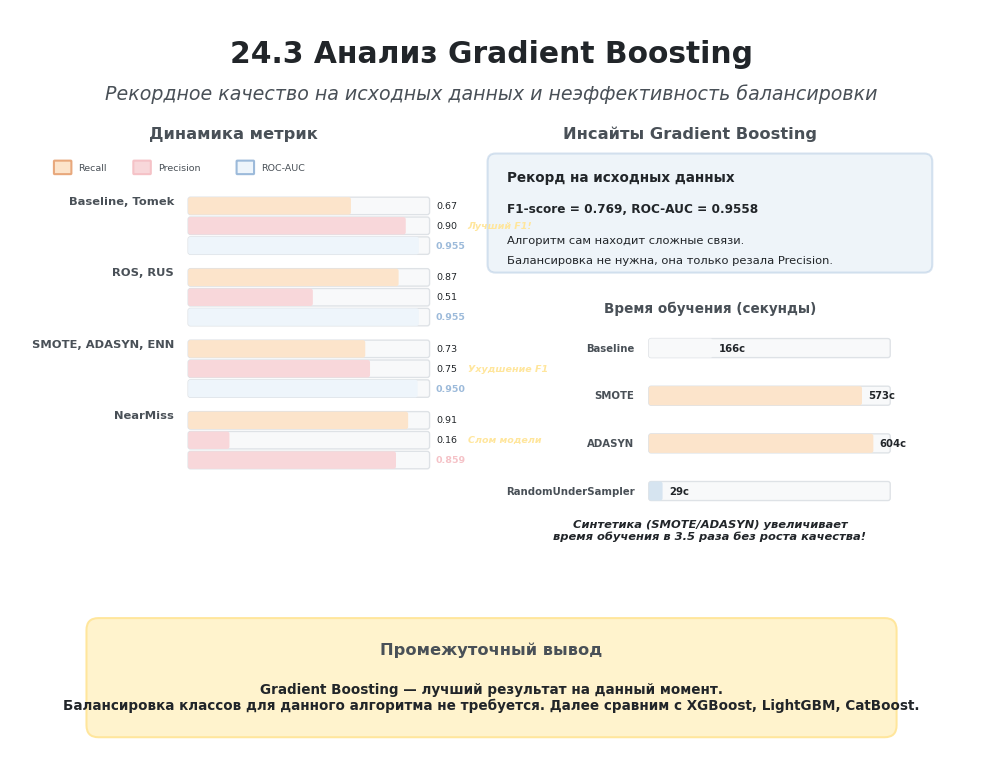

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.5, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "24.3 Анализ Gradient Boosting",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Рекордное качество на исходных данных и неэффективность балансировки",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Динамика метрик
# ==========================================
ax.text(2.75, 6.5, "Динамика метрик", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Легенда
ax.add_patch(FancyBboxPatch((0.5, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=ORANGE, edgecolor=ORANGE_BORDER))
ax.text(0.8, 6.07, "Recall", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((1.5, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=RED_FILL, edgecolor=RED_BORDER))
ax.text(1.8, 6.07, "Precision", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((2.8, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=LIGHT_BLUE, edgecolor=BLUE_BORDER))
ax.text(3.1, 6.07, "ROC-AUC", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)

bar_x_start = 2.2
bar_max_w = 3.0
bar_h = 0.18

# Данные: (Название группы, Recall, Precision, AUC, Y_pos, Особенность)
groups_data = [
    ("Baseline, Tomek", 0.67, 0.90, 0.955, 5.5, "Лучший F1!"),
    ("ROS, RUS", 0.87, 0.51, 0.955, 4.6, ""),
    ("SMOTE, ADASYN, ENN", 0.73, 0.75, 0.950, 3.7, "Ухудшение F1"),
    ("NearMiss", 0.91, 0.16, 0.859, 2.8, "Слом модели")
]

for name, rec, prec, auc, y_pos, feature in groups_data:
    ax.text(2.0, y_pos + 0.15, name, ha="right", va="center", fontsize=8.5*S, weight="bold", color=TEXT_MUTED)

    # Шкала Recall
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos), bar_max_w * rec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=ORANGE, edgecolor=ORANGE_BORDER))

    # Шкала Precision
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.25), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.25), bar_max_w * prec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=RED_FILL, edgecolor=RED_BORDER))

    # Шкала ROC-AUC
    auc_color = RED_FILL if auc < 0.90 else LIGHT_BLUE
    auc_border = RED_BORDER if auc < 0.90 else BLUE_BORDER
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.5), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.5), bar_max_w * auc, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=auc_color, edgecolor=auc_border))

    # Значения справа
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos + 0.09, f"{rec:.2f}", ha="left", va="center", fontsize=7*S, color=TEXT_DARK)
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos - 0.16, f"{prec:.2f}", ha="left", va="center", fontsize=7*S, color=TEXT_DARK)
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos - 0.41, f"{auc:.3f}", ha="left", va="center", fontsize=7*S, color=auc_border, weight="bold")

    if feature:
        ax.text(bar_x_start + bar_max_w + 0.5, y_pos - 0.16, feature, ha="left", va="center", fontsize=7*S, color=AMBER_BORDER, style="italic", weight="bold")


# ==========================================
# ПРАВАЯ ЧАСТЬ: ML и Технические инсайты
# ==========================================
ax.text(8.5, 6.5, "Инсайты Gradient Boosting", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Блок 1: ML-интерпретация (Рекорд без балансировки) ---
ax.add_patch(FancyBboxPatch(
    (6.0, 4.8), 5.5, 1.4,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.4
))
ax.text(6.2, 5.95, "Рекорд на исходных данных", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(6.2, 5.55, "F1-score = 0.769, ROC-AUC = 0.9558", ha="left", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")
ax.text(6.2, 5.15, "Алгоритм сам находит сложные связи.", ha="left", va="center", fontsize=8.5*S, color=TEXT_DARK)
ax.text(6.2, 4.9, "Балансировка не нужна, она только резала Precision.", ha="left", va="center", fontsize=8.5*S, color=TEXT_DARK)

# --- Блок 2: Время обучения (График) ---
ax.text(8.75, 4.3, "Время обучения (секунды)", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)

# Данные времени из логов
time_data = [
    ("Baseline", 166, GRAY, GRAY_BORDER, 3.8),
    ("SMOTE", 573, ORANGE, ORANGE_BORDER, 3.2),
    ("ADASYN", 604, ORANGE, ORANGE_BORDER, 2.6), # Добавил ADASYN, так как он еще дольше
    ("RandomUnderSampler", 29, BLUE, BLUE_BORDER, 2.0)
]

max_time = 650
time_bar_x = 8.0
time_bar_max_w = 3.0

for name, t, color, border, y_pos in time_data:
    ax.text(7.8, y_pos, name, ha="right", va="center", fontsize=7.5*S, weight="bold", color=TEXT_MUTED)
    ax.add_patch(FancyBboxPatch((time_bar_x, y_pos - 0.1), time_bar_max_w, 0.2, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((time_bar_x, y_pos - 0.1), time_bar_max_w * (t/max_time), 0.2, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=color, edgecolor=border))
    ax.text(time_bar_x + time_bar_max_w * (t/max_time) + 0.1, y_pos, f"{t}с", ha="left", va="center", fontsize=7.5*S, weight="bold", color=TEXT_DARK)

# Подпись цены
ax.text(8.75, 1.5, "Синтетика (SMOTE/ADASYN) увеличивает\nвремя обучения в 3.5 раза без роста качества!", ha="center", va="center", fontsize=8.5*S, color=TEXT_DARK, weight="bold", style="italic")


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -1.0), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.0, "Промежуточный вывод",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.6, "Gradient Boosting — лучший результат на данный момент.\nБалансировка классов для данного алгоритма не требуется. Далее сравним с XGBoost, LightGBM, CatBoost.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

## 24.6 XGBoost

На данном этапе исследования выполняется оценка модели XGBoost.

XGBoost является одной из наиболее распространённых реализаций градиентного бустинга для задач классификации на табличных данных.

В отличие от классического Gradient Boosting, XGBoost содержит дополнительные механизмы оптимизации и регуляризации, которые позволяют:

- повысить качество модели;
- снизить риск переобучения;
- эффективно работать с большим количеством признаков.

Цель эксперимента:

- сравнить качество XGBoost с предыдущими моделями;
- оценить влияние методов балансировки классов;
- определить, позволяет ли более современная реализация градиентного бустинга улучшить результаты классификации.

Модель будет протестирована через единый экспериментальный pipeline с теми же обучающими и тестовыми данными, что и предыдущие алгоритмы.

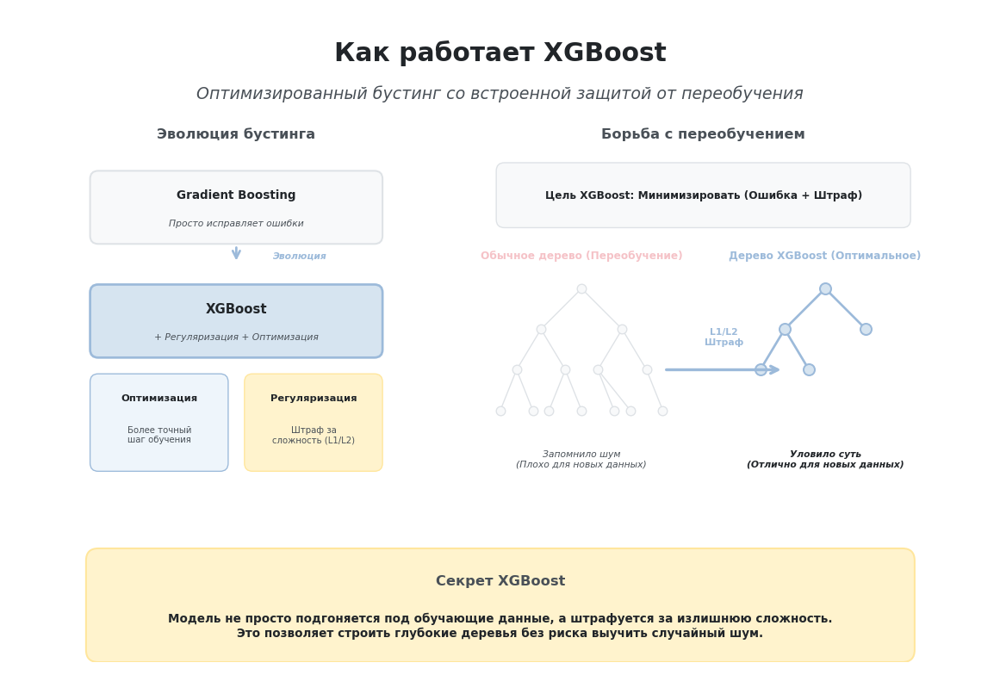

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
GREEN_FILL = "#D4EDDA"
GREEN_BORDER = "#C3E6CB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(0, AXES_H)
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "Как работает XGBoost",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Оптимизированный бустинг со встроенной защитой от переобучения",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Эволюция бустинга
# ==========================================
ax.text(2.75, 6.5, "Эволюция бустинга", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Шаг 1: Классический Gradient Boosting ---
ax.add_patch(FancyBboxPatch((1.0, 5.2), 3.5, 0.8, boxstyle="round,pad=0.05,rounding_size=0.1", facecolor=GRAY, edgecolor=GRAY_BORDER, linewidth=1.5*S))
ax.text(2.75, 5.75, "Gradient Boosting", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(2.75, 5.4, "Просто исправляет ошибки", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# Стрелка вниз (Улучшение)
ax.annotate("", xy=(2.75, 4.9), xytext=(2.75, 5.15), arrowprops=dict(arrowstyle="->", color=BLUE_BORDER, lw=2*S))
ax.text(3.2, 5.0, "Эволюция", ha="left", va="center", fontsize=8*S, color=BLUE_BORDER, weight="bold", style="italic")

# --- Шаг 2: XGBoost ---
ax.add_patch(FancyBboxPatch((1.0, 3.8), 3.5, 0.8, boxstyle="round,pad=0.05,rounding_size=0.1", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=2*S))
ax.text(2.75, 4.35, "XGBoost", ha="center", va="center", fontsize=11*S, weight="bold", color=TEXT_DARK)
ax.text(2.75, 4.0, "+ Регуляризация + Оптимизация", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# --- Блоки улучшений ---
# Улучшение 1
ax.add_patch(FancyBboxPatch((1.0, 2.4), 1.6, 1.1, boxstyle="round,pad=0.05,rounding_size=0.1", facecolor=LIGHT_BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
ax.text(1.8, 3.25, "Оптимизация", ha="center", va="center", fontsize=8.5*S, weight="bold", color=TEXT_DARK)
ax.text(1.8, 2.8, "Более точный\nшаг обучения", ha="center", va="center", fontsize=7.5*S, color=TEXT_MUTED)

# Улучшение 2
ax.add_patch(FancyBboxPatch((2.9, 2.4), 1.6, 1.1, boxstyle="round,pad=0.05,rounding_size=0.1", facecolor=AMBER, edgecolor=AMBER_BORDER, linewidth=1*S))
ax.text(3.7, 3.25, "Регуляризация", ha="center", va="center", fontsize=8.5*S, weight="bold", color=TEXT_DARK)
ax.text(3.7, 2.8, "Штраф за\nсложность (L1/L2)", ha="center", va="center", fontsize=7.5*S, color=TEXT_MUTED)


# ==========================================
# ПРАВАЯ ЧАСТЬ: Борьба с переобучением (Геометрия деревьев)
# ==========================================
ax.text(8.5, 6.5, "Борьба с переобучением", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Формула
ax.add_patch(FancyBboxPatch((6.0, 5.4), 5.0, 0.7, boxstyle="round,pad=0.05,rounding_size=0.1", facecolor=GRAY, edgecolor=GRAY_BORDER, linewidth=1*S))
ax.text(8.5, 5.75, "Цель XGBoost: Минимизировать (Ошибка + Штраф)", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)

# --- Дерево 1: Классическое (Слишком сложное) ---
ax.text(7.0, 5.0, "Обычное дерево (Переобучение)", ha="center", va="center", fontsize=9*S, weight="bold", color=RED_BORDER)

# Узлы сложного дерева (Gray)
overfit_nodes_x = [7.0, 6.5, 7.5, 6.2, 6.8, 7.2, 7.8, 6.0, 6.4, 6.6, 7.0, 7.4, 7.6, 8.0]
overfit_nodes_y = [4.6, 4.1, 4.1, 3.6, 3.6, 3.6, 3.6, 3.1, 3.1, 3.1, 3.1, 3.1, 3.1, 3.1]
overfit_pairs = [(0,1), (0,2), (1,3), (1,4), (2,5), (2,6), (3,7), (3,8), (4,9), (4,10), (5,11), (5,12), (6,13)]

for p1, p2 in overfit_pairs:
    ax.plot([overfit_nodes_x[p1], overfit_nodes_x[p2]], [overfit_nodes_y[p1], overfit_nodes_y[p2]], color=GRAY_BORDER, lw=1*S, zorder=1)
ax.scatter(overfit_nodes_x, overfit_nodes_y, s=40*S, c=GRAY, edgecolors=GRAY_BORDER, linewidths=1*S, zorder=2)

ax.text(7.0, 2.5, "Запомнило шум\n(Плохо для новых данных)", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# Стрелка от дерева к дереву (Состригание)
ax.annotate("", xy=(9.5, 3.6), xytext=(8.0, 3.6),
            arrowprops=dict(arrowstyle="->", color=BLUE_BORDER, lw=2.5*S))
ax.text(8.75, 4.0, "L1/L2\nШтраф", ha="center", va="center", fontsize=8*S, color=BLUE_BORDER, weight="bold")

# --- Дерево 2: XGBoost (Оптимальное) ---
ax.text(10.0, 5.0, "Дерево XGBoost (Оптимальное)", ha="center", va="center", fontsize=9*S, weight="bold", color=BLUE_BORDER)

# Узлы простого дерева (Blue)
xgb_nodes_x = [10.0, 9.5, 10.5, 9.2, 9.8]
xgb_nodes_y = [4.6, 4.1, 4.1, 3.6, 3.6]
xgb_pairs = [(0,1), (0,2), (1,3), (1,4)]

for p1, p2 in xgb_pairs:
    ax.plot([xgb_nodes_x[p1], xgb_nodes_x[p2]], [xgb_nodes_y[p1], xgb_nodes_y[p2]], color=BLUE_BORDER, lw=2*S, zorder=1)
ax.scatter(xgb_nodes_x, xgb_nodes_y, s=60*S, c=BLUE, edgecolors=BLUE_BORDER, linewidths=1.5*S, zorder=2)

ax.text(10.0, 2.5, "Уловило суть\n(Отлично для новых данных)", ha="center", va="center", fontsize=8*S, color=TEXT_DARK, style="italic", weight="bold")


# ---------- Итоговый блок (Внизу) ----------
res_box = FancyBboxPatch(
    (1.0, 0.1), 10.0, 1.2,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 1.0, "Секрет XGBoost",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, 0.45, "Модель не просто подгоняется под обучающие данные, а штрафуется за излишнюю сложность.\nЭто позволяет строить глубокие деревья без риска выучить случайный шум.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

In [ ]:
# ==========================================================
# Получение модели XGBoost
# ==========================================================

# Используем модель из общего набора моделей.
# Все алгоритмы проходят одинаковую процедуру оценки,
# чтобы результаты можно было корректно сравнивать.

xgboost_model = models["XGBoost"]


print("Модель XGBoost успешно подготовлена.")
print("Следующий этап — запуск экспериментов через pipeline.")

Модель XGBoost успешно подготовлена.
Следующий этап — запуск экспериментов через pipeline.


In [ ]:
# ==========================================================
# Запуск серии экспериментов XGBoost
# ==========================================================

xgboost_results = run_experiments(
    model=xgboost_model,
    model_name="XGBoost",
    training_sets=training_sets,
    X_test=X_test,
    y_test=y_test,
    continue_on_error=False,
    store_models=True,
    store_predictions=True,
    verbose=True
)


print("=" * 70)
print(
    "Вызов run_experiments() для XGBoost завершён."
)

print(
    "Результаты серии сохранены "
    "в переменной xgboost_results."
)

print(
    "Следующая ячейка извлечёт компоненты результата "
    "и проверит полноту запуска."
)

print("=" * 70)

Запуск серии экспериментов: XGBoost
Количество вариантов данных: 8
Режим обработки ошибок: останавливать при ошибке

[1/8] Baseline
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9624
Precision: 0.9062
Recall: 0.6825
F1: 0.7786
ROC-AUC: 0.9569
Gini: 0.9139
Время обучения: 4.7173 сек.

[2/8] RandomOverSampler
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9230
Precision: 0.5684
Recall: 0.8479
F1: 0.6806
ROC-AUC: 0.9549
Gini: 0.9097
Время обучения: 9.6435 сек.

[3/8] SMOTE
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9619
Precision: 0.8945
Recall: 0.6873
F1: 0.7773
ROC-AUC: 0.9569
Gini: 0.9137
Время обучения: 11.4122 сек.

[4/8] ADASYN
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9624
Precision: 0.9020
Recall: 0.6859
F1: 0.7792
ROC-AUC: 0.9552
Gini: 0.9105
Время обучения: 11.5667

In [ ]:
# ==========================================================
# Извлечение результатов эксперимента XGBoost
# ==========================================================

# Сохраняем основные компоненты эксперимента:
# - таблицу результатов для анализа качества модели;
# - информацию об ошибках выполнения;
# - сводную информацию о запуске серии экспериментов.

xgboost_results_table = (
    xgboost_results["results_table"]
)

xgboost_errors = (
    xgboost_results["errors"]
)

xgboost_summary = (
    xgboost_results["summary"]
)


# Проверяем корректность завершения эксперимента.
# Полная таблица будет использована позже
# при общем сравнении всех моделей.

print("=" * 70)
print(
    "Проверка эксперимента XGBoost завершена."
)

print(
    "Количество успешных экспериментов:",
    xgboost_summary["Successful Experiments"]
)

print(
    "Количество ошибок:",
    xgboost_summary["Failed Experiments"]
)

print("=" * 70)

Проверка эксперимента XGBoost завершена.
Количество успешных экспериментов: 8
Количество ошибок: 0


## Анализ результатов XGBoost

В рамках четвёртого эксперимента была проведена оценка модели XGBoost на восьми вариантах обучающих данных с различными методами балансировки классов.

### Технический результат

На исходных данных без балансировки XGBoost показал следующие результаты:

- Accuracy: 0.9624
- Precision: 0.9062
- Recall: 0.6825
- F1-score: 0.7786
- ROC-AUC: 0.9569

По сравнению с предыдущими моделями XGBoost показал улучшение F1-score и ROC-AUC, обеспечив лучший баланс между обнаружением объектов положительного класса и количеством ложных срабатываний.

Применение методов балансировки не дало существенного прироста качества:

- RandomOverSampler и RandomUnderSampler увеличили Recall, но значительно снизили Precision.
- SMOTE показал результат, близкий к исходному варианту.
- ADASYN и Tomek Links дали небольшое улучшение F1-score.
- NearMiss значительно ухудшил качество модели.

### ML-интерпретация

XGBoost продемонстрировал высокую устойчивость к дисбалансу классов.

Модель показала, что современные алгоритмы градиентного бустинга способны эффективно работать с исходным распределением данных без обязательного применения методов балансировки.

Балансировка в основном изменяет границу принятия решения, увеличивая чувствительность модели к редкому классу, но одновременно повышая количество ложноположительных классификаций.

### Бизнес-интерпретация

Для кредитного скоринга XGBoost показывает привлекательный баланс между выявлением потенциально проблемных клиентов и сохранением точности классификации.

Дополнительным преимуществом является низкое время обучения по сравнению с Random Forest и классическим Gradient Boosting, что важно при регулярном переобучении моделей в промышленной эксплуатации.

### Промежуточный вывод

На текущем этапе XGBoost показывает лучший результат среди рассмотренных моделей.

Полученные результаты подтверждают, что дисбаланс классов не является критическим ограничением для современных алгоритмов машинного обучения.

Окончательный вывод будет сделан после проверки LightGBM и CatBoost.

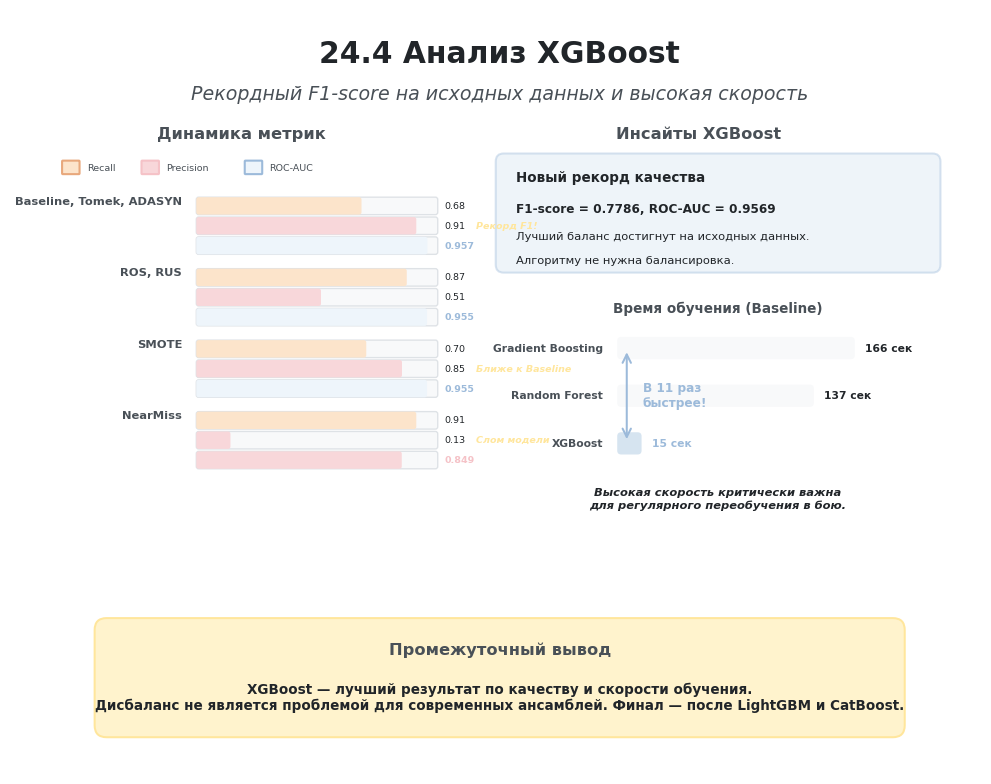

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.5, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "24.4 Анализ XGBoost",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Рекордный F1-score на исходных данных и высокая скорость",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Динамика метрик
# ==========================================
ax.text(2.75, 6.5, "Динамика метрик", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Легенда
ax.add_patch(FancyBboxPatch((0.5, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=ORANGE, edgecolor=ORANGE_BORDER))
ax.text(0.8, 6.07, "Recall", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((1.5, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=RED_FILL, edgecolor=RED_BORDER))
ax.text(1.8, 6.07, "Precision", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((2.8, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=LIGHT_BLUE, edgecolor=BLUE_BORDER))
ax.text(3.1, 6.07, "ROC-AUC", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)

bar_x_start = 2.2
bar_max_w = 3.0
bar_h = 0.18

# Данные: (Название группы, Recall, Precision, AUC, Y_pos, Особенность)
groups_data = [
    ("Baseline, Tomek, ADASYN", 0.68, 0.91, 0.957, 5.5, "Рекорд F1!"),
    ("ROS, RUS", 0.87, 0.51, 0.955, 4.6, ""),
    ("SMOTE", 0.70, 0.85, 0.955, 3.7, "Ближе к Baseline"),
    ("NearMiss", 0.91, 0.13, 0.849, 2.8, "Слом модели")
]

for name, rec, prec, auc, y_pos, feature in groups_data:
    ax.text(2.0, y_pos + 0.15, name, ha="right", va="center", fontsize=8.5*S, weight="bold", color=TEXT_MUTED)

    # Шкала Recall
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos), bar_max_w * rec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=ORANGE, edgecolor=ORANGE_BORDER))

    # Шкала Precision
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.25), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.25), bar_max_w * prec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=RED_FILL, edgecolor=RED_BORDER))

    # Шкала ROC-AUC
    auc_color = RED_FILL if auc < 0.90 else LIGHT_BLUE
    auc_border = RED_BORDER if auc < 0.90 else BLUE_BORDER
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.5), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.5), bar_max_w * auc, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=auc_color, edgecolor=auc_border))

    # Значения справа
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos + 0.09, f"{rec:.2f}", ha="left", va="center", fontsize=7*S, color=TEXT_DARK)
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos - 0.16, f"{prec:.2f}", ha="left", va="center", fontsize=7*S, color=TEXT_DARK)
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos - 0.41, f"{auc:.3f}", ha="left", va="center", fontsize=7*S, color=auc_border, weight="bold")

    if feature:
        ax.text(bar_x_start + bar_max_w + 0.5, y_pos - 0.16, feature, ha="left", va="center", fontsize=7*S, color=AMBER_BORDER, style="italic", weight="bold")


# ==========================================
# ПРАВАЯ ЧАСТЬ: ML и Технические инсайты
# ==========================================
ax.text(8.5, 6.5, "Инсайты XGBoost", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Блок 1: ML-интерпретация (Новый лидер) ---
ax.add_patch(FancyBboxPatch(
    (6.0, 4.8), 5.5, 1.4,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.4
))
ax.text(6.2, 5.95, "Новый рекорд качества", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(6.2, 5.55, "F1-score = 0.7786, ROC-AUC = 0.9569", ha="left", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")
ax.text(6.2, 5.2, "Лучший баланс достигнут на исходных данных.", ha="left", va="center", fontsize=8.5*S, color=TEXT_DARK)
ax.text(6.2, 4.9, "Алгоритму не нужна балансировка.", ha="left", va="center", fontsize=8.5*S, color=TEXT_DARK)

# --- Блок 2: Время обучения (Чистый график) ---
ax.text(8.75, 4.3, "Время обучения (Baseline)", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)

# Данные времени (сравнение базовых моделей)
time_data = [
    ("Gradient Boosting", 166, GRAY, GRAY_BORDER, 3.8),
    ("Random Forest", 137, GRAY, GRAY_BORDER, 3.2),
    ("XGBoost", 15, BLUE, BLUE_BORDER, 2.6)
]

max_time = 180
time_bar_x = 7.5
time_bar_max_w = 3.2

for name, t, color, border, y_pos in time_data:
    ax.text(7.3, y_pos, name, ha="right", va="center", fontsize=8*S, weight="bold", color=TEXT_MUTED)

    bar_w = time_bar_max_w * (t/max_time)

    # Рисуем ТОЛЬКО цветную полоску (без серого фона)
    ax.add_patch(FancyBboxPatch(
        (time_bar_x, y_pos - 0.12), bar_w, 0.24,
        boxstyle="round,pad=0.02,rounding_size=0.05",
        linewidth=0, facecolor=color, edgecolor=border
    ))

    # Значение
    val_color = BLUE_BORDER if color == BLUE else TEXT_DARK
    ax.text(time_bar_x + bar_w + 0.15, y_pos, f"{t} сек", ha="left", va="center", fontsize=8*S, weight="bold", color=val_color)

# Акцент на разнице во времени (Стрелка)
ax.annotate("", xy=(7.6, 2.6), xytext=(7.6, 3.8),
            arrowprops=dict(arrowstyle="<->", color=BLUE_BORDER, lw=1.5*S))
ax.text(7.8, 3.2, "В 11 раз\nбыстрее!", ha="left", va="center", fontsize=9*S, color=BLUE_BORDER, weight="bold")

# Подпись бизнес-преимущества
ax.text(8.75, 1.9, "Высокая скорость критически важна\nдля регулярного переобучения в бою.", ha="center", va="center", fontsize=8.5*S, color=TEXT_DARK, weight="bold", style="italic")


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -1.0), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.0, "Промежуточный вывод",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.6, "XGBoost — лучший результат по качеству и скорости обучения.\nДисбаланс не является проблемой для современных ансамблей. Финал — после LightGBM и CatBoost.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

## 24.7 LightGBM

На данном этапе исследования выполняется оценка модели LightGBM.

LightGBM является современной высокопроизводительной реализацией градиентного бустинга, предназначенной прежде всего для работы с большими табличными наборами данных.

В отличие от классического Gradient Boosting, алгоритм использует оптимизированный способ построения деревьев и группировку непрерывных значений признаков в интервалы. Это позволяет:

* ускорить обучение модели;
* уменьшить потребление оперативной памяти;
* эффективно обрабатывать большие наборы данных;
* выявлять сложные нелинейные зависимости между признаками;
* сохранять высокое качество классификации.

LightGBM строит деревья преимущественно за счёт развития листьев, которые дают наибольшее уменьшение ошибки. Такой подход может повысить качество модели, но при недостаточном контроле параметров также способен увеличить риск переобучения.

Цель эксперимента:

* сравнить качество LightGBM с предыдущими моделями;
* оценить влияние методов балансировки классов;
* определить, насколько устойчиво модель работает с исходным дисбалансом классов;
* проверить, позволяет ли LightGBM улучшить результаты, полученные с помощью XGBoost;
* оценить вычислительную эффективность модели по времени обучения.

LightGBM будет протестирован через единый экспериментальный pipeline на тех же восьми вариантах обучающих данных, которые использовались для предыдущих алгоритмов.

Для всех вариантов будет применяться одна и та же неизменная тестовая выборка и единый набор метрик:

* Accuracy;
* Precision;
* Recall;
* F1-score;
* ROC-AUC;
* Gini.

Такой подход позволит корректно сравнить LightGBM с Logistic Regression, Random Forest, Gradient Boosting и XGBoost, а также определить, требуется ли этой модели дополнительная балансировка классов.


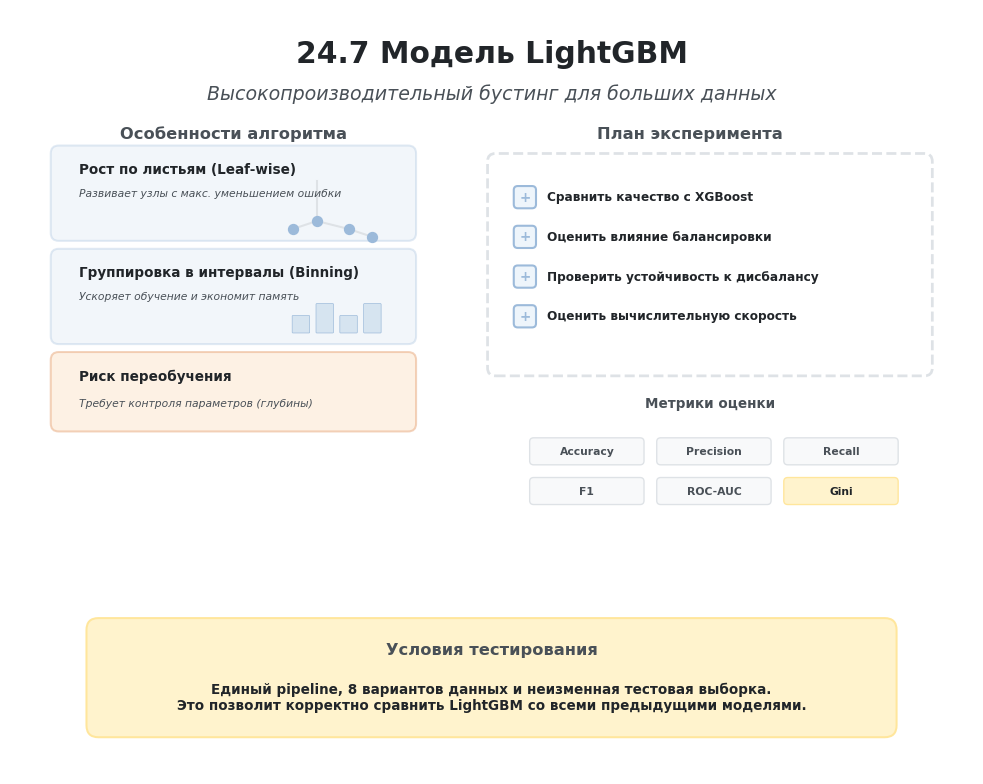

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.5, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "24.7 Модель LightGBM",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Высокопроизводительный бустинг для больших данных",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Особенности алгоритма
# ==========================================
ax.text(2.75, 6.5, "Особенности алгоритма", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Блок 1: Рост по листьям (Схема) ---
ax.add_patch(FancyBboxPatch((0.5, 5.2), 4.5, 1.1, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.3))
ax.text(0.8, 6.05, "Рост по листьям (Leaf-wise)", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(0.8, 5.75, "Развивает узлы с макс. уменьшением ошибки", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# Схема дерева (асимметричная)
ax.plot([3.8, 3.8], [5.4, 5.9], color=GRAY_BORDER, lw=1.5*S)
ax.plot([3.8, 3.5], [5.4, 5.3], color=GRAY_BORDER, lw=1.5*S)
ax.plot([3.8, 4.2], [5.4, 5.3], color=GRAY_BORDER, lw=1.5*S)
ax.plot([4.2, 4.5], [5.3, 5.2], color=GRAY_BORDER, lw=1.5*S) # Уходит вглубь
ax.scatter([3.8, 3.5, 4.2, 4.5], [5.4, 5.3, 5.3, 5.2], s=30*S, c=BLUE_BORDER, zorder=3)

# --- Блок 2: Гистограммы (Binning) ---
ax.add_patch(FancyBboxPatch((0.5, 3.9), 4.5, 1.1, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.3))
ax.text(0.8, 4.75, "Группировка в интервалы (Binning)", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(0.8, 4.45, "Ускоряет обучение и экономит память", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# Схема гистограммы
bar_x = 3.5
for i in range(4):
    h = 0.2 + (i % 2) * 0.15
    ax.add_patch(FancyBboxPatch((bar_x + i*0.3, 4.0), 0.2, h, boxstyle="round,pad=0.01", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=0.5*S))

# --- Блок 3: Риск переобучения ---
ax.add_patch(FancyBboxPatch((0.5, 2.8), 4.5, 0.9, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE, alpha=0.5))
ax.text(0.8, 3.45, "Риск переобучения", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(0.8, 3.1, "Требует контроля параметров (глубины)", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ==========================================
# ПРАВАЯ ЧАСТЬ: План эксперимента
# ==========================================
ax.text(8.5, 6.5, "План эксперимента", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Контейнер для целей
ax.add_patch(FancyBboxPatch((6.0, 3.5), 5.5, 2.7, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=2*S, edgecolor=GRAY_BORDER, facecolor="white", linestyle="--"))

goals = [
    "Сравнить качество с XGBoost",
    "Оценить влияние балансировки",
    "Проверить устойчивость к дисбалансу",
    "Оценить вычислительную скорость"
]

for i, goal in enumerate(goals):
    y_g = 5.7 - i * 0.5
    # Иконка чек-листа
    ax.add_patch(FancyBboxPatch((6.3, y_g - 0.12), 0.24, 0.24, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=LIGHT_BLUE, edgecolor=BLUE_BORDER))
    ax.text(6.42, y_g, "+", ha="center", va="center", fontsize=10*S, weight="bold", color=BLUE_BORDER)
    ax.text(6.7, y_g, goal, ha="left", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")

# --- Метрики оценки ---
ax.text(8.75, 3.1, "Метрики оценки", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)

metrics = ["Accuracy", "Precision", "Recall", "F1", "ROC-AUC", "Gini"]
for i, m in enumerate(metrics):
    # Расположение в 2 ряда
    if i < 3:
        mx = 6.5 + i * 1.6
        my = 2.5
    else:
        mx = 6.5 + (i - 3) * 1.6
        my = 2.0

    # Выделяем Gini
    m_color = AMBER if m == "Gini" else GRAY
    m_border = AMBER_BORDER if m == "Gini" else GRAY_BORDER
    m_text_color = TEXT_DARK if m == "Gini" else TEXT_MUTED

    ax.add_patch(FancyBboxPatch((mx, my - 0.15), 1.4, 0.3, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=m_color, edgecolor=m_border, linewidth=1*S))
    ax.text(mx + 0.7, my, m, ha="center", va="center", fontsize=8*S, weight="bold", color=m_text_color)


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -1.0), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.0, "Условия тестирования",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.6, "Единый pipeline, 8 вариантов данных и неизменная тестовая выборка.\nЭто позволит корректно сравнить LightGBM со всеми предыдущими моделями.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

In [ ]:
# ==========================================================
# Подготовка модели LightGBM
# ==========================================================

# Название модели должно полностью совпадать
# с ключом, который используется в словаре models.

LIGHTGBM_MODEL_NAME = "LightGBM"


# ----------------------------------------------------------
# Проверка наличия модели в общем словаре
# ----------------------------------------------------------

if LIGHTGBM_MODEL_NAME not in models:
    raise KeyError(
        "Модель LightGBM отсутствует в словаре models. "
        "Сначала необходимо выполнить ячейку создания "
        "общего набора моделей в разделе 24.1.2."
    )


# Получаем исходный необученный экземпляр модели.
# Непосредственное обучение будет выполняться
# внутри универсальной функции run_experiments().

lightgbm_model = models[
    LIGHTGBM_MODEL_NAME
]


# ----------------------------------------------------------
# Проверка интерфейса модели
# ----------------------------------------------------------
# Для работы экспериментального pipeline модель должна
# поддерживать три обязательных метода:
#
# 1. fit() — обучение;
# 2. predict() — предсказание классов;
# 3. predict_proba() — предсказание вероятностей.
# ----------------------------------------------------------

required_model_methods = [
    "fit",
    "predict",
    "predict_proba"
]

missing_model_methods = [
    method_name
    for method_name in required_model_methods
    if not callable(
        getattr(
            lightgbm_model,
            method_name,
            None
        )
    )
]


if missing_model_methods:
    raise TypeError(
        "Модель LightGBM не поддерживает обязательные методы: "
        + ", ".join(missing_model_methods)
    )


# ----------------------------------------------------------
# Информационный вывод
# ----------------------------------------------------------

print("=" * 70)
print("Модель LightGBM успешно подготовлена.")

print(
    "Класс модели:",
    type(lightgbm_model).__name__
)

print(
    "Проверенные методы:",
    ", ".join(required_model_methods)
)

print(
    "Следующий этап — запуск LightGBM "
    "на всех вариантах обучающих данных."
)

print("=" * 70)

Модель LightGBM успешно подготовлена.
Класс модели: LGBMClassifier
Проверенные методы: fit, predict, predict_proba
Следующий этап — запуск LightGBM на всех вариантах обучающих данных.


In [ ]:
# ==========================================================
# Запуск серии экспериментов LightGBM
# ==========================================================

# Модель последовательно обучается на всех вариантах
# обучающих данных из словаря training_sets.
#
# Для каждого варианта используются:
#
# - одна и та же модель;
# - одна и та же тестовая выборка;
# - единая процедура расчёта метрик;
# - одинаковые правила обработки ошибок.
#
# Результаты всех экспериментов сохраняются
# в одном структурированном словаре.

lightgbm_results = run_experiments(
    model=lightgbm_model,
    model_name=LIGHTGBM_MODEL_NAME,
    training_sets=training_sets,
    X_test=X_test,
    y_test=y_test,
    continue_on_error=False,
    store_models=True,
    store_predictions=True,
    verbose=True
)


# ----------------------------------------------------------
# Информационный вывод
# ----------------------------------------------------------

print("=" * 70)

print(
    "Вызов run_experiments() для LightGBM завершён."
)

print(
    "Результаты серии сохранены "
    "в переменной lightgbm_results."
)

print(
    "Следующая ячейка извлечёт отдельные "
    "компоненты результата."
)

print("=" * 70)

Запуск серии экспериментов: LightGBM
Количество вариантов данных: 8
Режим обработки ошибок: останавливать при ошибке

[1/8] Baseline
----------------------------------------------------------------------
[LightGBM] [Info] Number of positive: 28015, number of negative: 261599
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.079560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6820
[LightGBM] [Info] Number of data points in the train set: 289614, number of used features: 49
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.096732 -> initscore=-2.234073
[LightGBM] [Info] Start training from score -2.234073
Статус: успешно
Accuracy: 0.9628
Precision: 0.9139
Recall: 0.6792
F1: 0.7793
ROC-AUC: 0.9583
Gini: 0.9167
Время обучения: 7.3380 сек.

[2/8] RandomOverSampler
----------------------------------------------------------------------
[Light

In [ ]:
# ==========================================================
# Извлечение результатов эксперимента LightGBM
# ==========================================================

# Функция run_experiments() должна вернуть четыре компонента:
#
# 1. results_table — итоговая таблица метрик;
# 2. experiments — подробные результаты каждого запуска;
# 3. errors — таблица ошибок;
# 4. summary — общая информация о серии экспериментов.


required_lightgbm_result_keys = {
    "results_table",
    "experiments",
    "errors",
    "summary"
}


# ----------------------------------------------------------
# Проверка структуры результата
# ----------------------------------------------------------

missing_lightgbm_result_keys = (
    required_lightgbm_result_keys
    - set(lightgbm_results.keys())
)


if missing_lightgbm_result_keys:
    raise KeyError(
        "Результат LightGBM не содержит обязательные компоненты: "
        + ", ".join(
            sorted(missing_lightgbm_result_keys)
        )
    )


# ----------------------------------------------------------
# Извлечение отдельных компонентов
# ----------------------------------------------------------

lightgbm_results_table = (
    lightgbm_results["results_table"]
)

lightgbm_experiments = (
    lightgbm_results["experiments"]
)

lightgbm_errors = (
    lightgbm_results["errors"]
)

lightgbm_summary = (
    lightgbm_results["summary"]
)


# ----------------------------------------------------------
# Информационный вывод
# ----------------------------------------------------------

print("=" * 70)
print("Компоненты результата LightGBM успешно извлечены.")

print(
    "Строк в таблице результатов:",
    len(lightgbm_results_table)
)

print(
    "Подробных результатов экспериментов:",
    len(lightgbm_experiments)
)

print(
    "Зарегистрированных ошибок:",
    len(lightgbm_errors)
)

print("=" * 70)

Компоненты результата LightGBM успешно извлечены.
Строк в таблице результатов: 8
Подробных результатов экспериментов: 8
Зарегистрированных ошибок: 0
Следующая ячейка выполнит полную контрольную проверку эксперимента.


### Анализ результатов LightGBM

В рамках пятого эксперимента была проведена оценка модели LightGBM на восьми вариантах обучающих данных с различными методами балансировки классов.

#### Технический результат

На исходных данных без балансировки LightGBM показал следующие результаты:

* Accuracy: 0.9628
* Precision: 0.9139
* Recall: 0.6792
* F1-score: 0.7793
* ROC-AUC: 0.9583
* Gini: 0.9167

Исходный вариант без балансировки продемонстрировал лучший F1-score среди всех экспериментов LightGBM. Одновременно он показал максимальные значения Accuracy, Precision, ROC-AUC и Gini. Это означает, что модель уже эффективно работает с исходным распределением классов и не требует обязательного изменения обучающей выборки.

По сравнению с XGBoost модель LightGBM показала небольшое улучшение основных показателей:

* F1-score увеличился с 0.7786 до 0.7793;
* ROC-AUC увеличился с 0.9569 до 0.9583;
* Gini увеличился с 0.9139 до 0.9167;
* Precision увеличился с 0.9062 до 0.9139.

При этом Recall оказался немного ниже: 0.6792 против 0.6825 у XGBoost. Разница между моделями невелика, поэтому результаты следует рассматривать как близкие по качеству, а не как существенное превосходство одного алгоритма над другим.

Применение методов балансировки по-разному изменило поведение модели:

* RandomOverSampler увеличил Recall до 0.8686, но снизил Precision до 0.5327 и F1-score до 0.6604;
* SMOTE сохранил качество близким к исходному варианту, однако не улучшил F1-score и ROC-AUC;
* ADASYN также не дал прироста качества и немного ухудшил основные метрики;
* RandomUnderSampler повысил Recall до 0.8754, но привёл к снижению Precision до 0.5195 и F1-score до 0.6521;
* NearMiss показал максимальный Recall 0.9299, но одновременно резко ухудшил Accuracy, Precision, F1-score, ROC-AUC и Gini;
* Tomek Links сохранил показатели на уровне, близком к Baseline;
* Edited Nearest Neighbours увеличил Recall до 0.7347, однако снизил Precision и F1-score.

#### ML-интерпретация

LightGBM продемонстрировал высокую устойчивость к исходному дисбалансу классов.

Значения ROC-AUC и Gini для большинства вариантов данных оставались высокими и изменялись незначительно. Это показывает, что методы балансировки практически не улучшили способность модели ранжировать организации по вероятности дефолта.

Основное влияние балансировки проявилось в изменении порогового поведения классификатора:

* Recall увеличивался, поскольку модель начинала относить к дефолтному классу больше организаций;
* Precision одновременно снижался, поскольку среди положительных прогнозов возрастало количество ложных срабатываний;
* F1-score в результате оказывался ниже, чем у исходного варианта.

Особенно показателен результат NearMiss. Высокий Recall был достигнут ценой резкого снижения Precision до 0.1313 и F1-score до 0.2300. ROC-AUC снизился до 0.8215, а Gini — до 0.6430. Следовательно, агрессивное удаление объектов основного класса привело к существенной потере информации и ухудшению способности модели разделять классы.

Полученные результаты показывают, что для LightGBM исходный дисбаланс не является критической технической проблемой. Модель способна эффективно использовать несбалансированные данные без обязательного применения методов ресемплинга.

#### Бизнес-интерпретация

С точки зрения кредитного скоринга исходный вариант LightGBM обеспечивает сильный баланс между выявлением дефолтов и количеством ложных тревог.

Высокий Precision означает, что прогнозам модели о возможном дефолте можно доверять значительно чаще, чем при использовании RandomOverSampler или RandomUnderSampler. Это снижает риск ошибочного отнесения финансово устойчивых организаций к группе повышенного риска.

Применение методов балансировки может быть оправдано, если бизнес готов пожертвовать точностью положительных прогнозов ради обнаружения большего количества потенциальных дефолтов. Однако такое решение должно приниматься с учётом стоимости двух типов ошибок:

* финансовых потерь из-за пропущенного дефолта;
* потери надёжного клиента из-за ошибочного отказа или дополнительной проверки.

Без информации о стоимости этих ошибок искусственное увеличение Recall нельзя считать безусловным улучшением модели.

Дополнительным преимуществом LightGBM является высокая вычислительная эффективность. Вся серия из восьми экспериментов была выполнена примерно за 83.6 секунды, а обучение Baseline заняло около 7.3 секунды. Это делает алгоритм подходящим для регулярного переобучения и дальнейших промышленных экспериментов.

#### Промежуточный вывод

LightGBM показал лучший промежуточный результат среди рассмотренных моделей, однако его преимущество над XGBoost является небольшим.

Лучшее качество было получено на исходных несбалансированных данных. Ни один из методов балансировки не смог одновременно улучшить F1-score, ROC-AUC и Gini относительно Baseline.

Балансировка позволяла увеличить Recall, но это сопровождалось заметным снижением Precision и ростом количества ложноположительных решений.

Таким образом, результаты LightGBM подтверждают ранее выявленную закономерность: исходный дисбаланс классов примерно 90/10 не является критическим препятствием для обучения современных моделей градиентного бустинга.

Окончательный вывод о влиянии дисбаланса будет сформулирован после проведения последнего эксперимента с моделью CatBoost и общего сравнения всех алгоритмов.


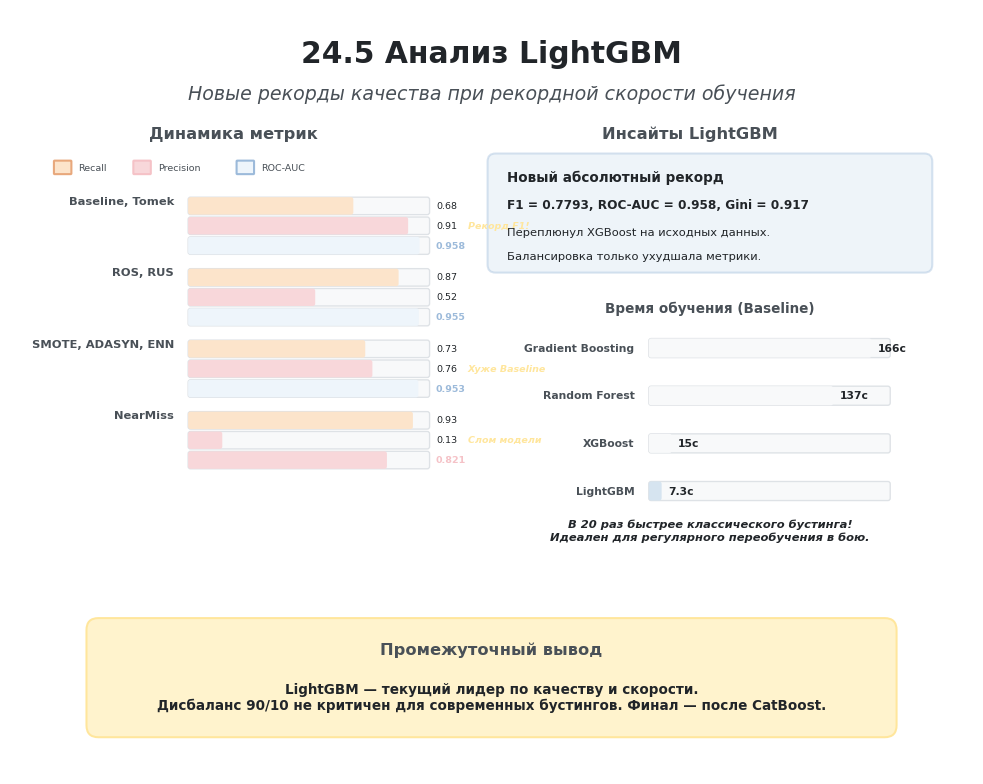

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.5, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "24.5 Анализ LightGBM",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Новые рекорды качества при рекордной скорости обучения",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Динамика метрик
# ==========================================
ax.text(2.75, 6.5, "Динамика метрик", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Легенда
ax.add_patch(FancyBboxPatch((0.5, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=ORANGE, edgecolor=ORANGE_BORDER))
ax.text(0.8, 6.07, "Recall", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((1.5, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=RED_FILL, edgecolor=RED_BORDER))
ax.text(1.8, 6.07, "Precision", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((2.8, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=LIGHT_BLUE, edgecolor=BLUE_BORDER))
ax.text(3.1, 6.07, "ROC-AUC", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)

bar_x_start = 2.2
bar_max_w = 3.0
bar_h = 0.18

# Данные: (Название группы, Recall, Precision, AUC, Y_pos, Особенность)
groups_data = [
    ("Baseline, Tomek", 0.68, 0.91, 0.958, 5.5, "Рекорд F1!"),
    ("ROS, RUS", 0.87, 0.52, 0.955, 4.6, ""),
    ("SMOTE, ADASYN, ENN", 0.73, 0.76, 0.953, 3.7, "Хуже Baseline"),
    ("NearMiss", 0.93, 0.13, 0.821, 2.8, "Слом модели")
]

for name, rec, prec, auc, y_pos, feature in groups_data:
    ax.text(2.0, y_pos + 0.15, name, ha="right", va="center", fontsize=8.5*S, weight="bold", color=TEXT_MUTED)

    # Шкала Recall
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos), bar_max_w * rec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=ORANGE, edgecolor=ORANGE_BORDER))

    # Шкала Precision
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.25), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.25), bar_max_w * prec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=RED_FILL, edgecolor=RED_BORDER))

    # Шкала ROC-AUC
    auc_color = RED_FILL if auc < 0.90 else LIGHT_BLUE
    auc_border = RED_BORDER if auc < 0.90 else BLUE_BORDER
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.5), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.5), bar_max_w * auc, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=auc_color, edgecolor=auc_border))

    # Значения справа
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos + 0.09, f"{rec:.2f}", ha="left", va="center", fontsize=7*S, color=TEXT_DARK)
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos - 0.16, f"{prec:.2f}", ha="left", va="center", fontsize=7*S, color=TEXT_DARK)
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos - 0.41, f"{auc:.3f}", ha="left", va="center", fontsize=7*S, color=auc_border, weight="bold")

    if feature:
        ax.text(bar_x_start + bar_max_w + 0.5, y_pos - 0.16, feature, ha="left", va="center", fontsize=7*S, color=AMBER_BORDER, style="italic", weight="bold")


# ==========================================
# ПРАВАЯ ЧАСТЬ: ML и Технические инсайты
# ==========================================
ax.text(8.5, 6.5, "Инсайты LightGBM", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Блок 1: ML-интерпретация (Новый лидер) ---
ax.add_patch(FancyBboxPatch(
    (6.0, 4.8), 5.5, 1.4,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.4
))
ax.text(6.2, 5.95, "Новый абсолютный рекорд", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(6.2, 5.6, "F1 = 0.7793, ROC-AUC = 0.958, Gini = 0.917", ha="left", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")
ax.text(6.2, 5.25, "Переплюнул XGBoost на исходных данных.", ha="left", va="center", fontsize=8.5*S, color=TEXT_DARK)
ax.text(6.2, 4.95, "Балансировка только ухудшала метрики.", ha="left", va="center", fontsize=8.5*S, color=TEXT_DARK)

# --- Блок 2: Время обучения (Сравнение алгоритмов) ---
ax.text(8.75, 4.3, "Время обучения (Baseline)", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)

# Данные времени (сравнение базовых моделей)
time_data = [
    ("Gradient Boosting", 166, GRAY, GRAY_BORDER, 3.8),
    ("Random Forest", 137, GRAY, GRAY_BORDER, 3.2),
    ("XGBoost", 15, GRAY, GRAY_BORDER, 2.6),
    ("LightGBM", 7.3, BLUE, BLUE_BORDER, 2.0)
]

max_time = 180
time_bar_x = 8.0
time_bar_max_w = 3.0

for name, t, color, border, y_pos in time_data:
    ax.text(7.8, y_pos, name, ha="right", va="center", fontsize=8*S, weight="bold", color=TEXT_MUTED)
    ax.add_patch(FancyBboxPatch((time_bar_x, y_pos - 0.1), time_bar_max_w, 0.2, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((time_bar_x, y_pos - 0.1), time_bar_max_w * (t/max_time), 0.2, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=color, edgecolor=border))
    ax.text(time_bar_x + time_bar_max_w * (t/max_time) + 0.1, y_pos, f"{t}с", ha="left", va="center", fontsize=8*S, weight="bold", color=TEXT_DARK)

# Подпись бизнес-преимущества
ax.text(8.75, 1.5, "В 20 раз быстрее классического бустинга!\nИдеален для регулярного переобучения в бою.", ha="center", va="center", fontsize=8.5*S, color=TEXT_DARK, weight="bold", style="italic")


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -1.0), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.0, "Промежуточный вывод",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.6, "LightGBM — текущий лидер по качеству и скорости.\nДисбаланс 90/10 не критичен для современных бустингов. Финал — после CatBoost.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

## 24.8 CatBoost

На заключительном этапе сравнительного исследования выполняется оценка модели CatBoost.

CatBoost является современной реализацией градиентного бустинга, разработанной специально для эффективной работы с табличными данными.

Одной из ключевых особенностей алгоритма является использование упорядоченного бустинга, который помогает снизить риск переобучения и утечки информации между объектами обучающей выборки.

CatBoost также поддерживает встроенную обработку категориальных признаков. Однако в рамках текущего исследования все модели получают уже подготовленные обучающие выборки, поэтому основное внимание будет уделено качеству классификации и устойчивости алгоритма к дисбалансу классов.

Цель эксперимента:

* сравнить качество CatBoost с предыдущими моделями;
* оценить влияние различных методов балансировки классов;
* определить, насколько устойчиво модель работает на исходном распределении данных;
* проверить, позволяет ли CatBoost улучшить результаты XGBoost и LightGBM;
* получить итоговые данные для общего сравнительного анализа всех алгоритмов.

Модель будет протестирована через единый экспериментальный pipeline на тех же восьми вариантах обучающих данных и на той же неизменной тестовой выборке.

Для оценки будут использоваться единые метрики качества:

* Accuracy;
* Precision;
* Recall;
* F1-score;
* ROC-AUC;
* Gini.

После завершения эксперимента результаты CatBoost будут включены в итоговое сравнение всех рассмотренных моделей машинного обучения.


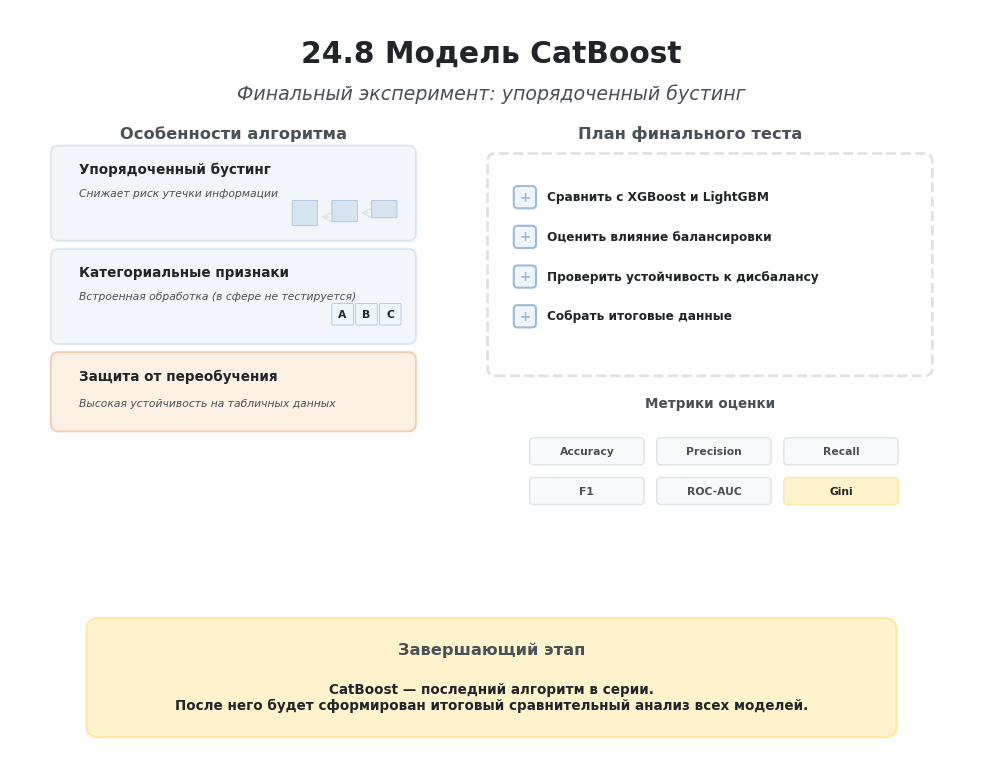

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.5, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "24.8 Модель CatBoost",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Финальный эксперимент: упорядоченный бустинг",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Особенности алгоритма
# ==========================================
ax.text(2.75, 6.5, "Особенности алгоритма", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Блок 1: Упорядоченный бустинг (Ordered Boosting) ---
ax.add_patch(FancyBboxPatch((0.5, 5.2), 4.5, 1.1, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.3))
ax.text(0.8, 6.05, "Упорядоченный бустинг", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(0.8, 5.75, "Снижает риск утечки информации", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# Схема упорядоченности (последовательные шаги)
for i in range(3):
    y_step = 5.35 + i * 0.05
    ax.add_patch(FancyBboxPatch((3.5 + i*0.5, y_step), 0.3, 0.3 - i*0.05, boxstyle="round,pad=0.01", facecolor=BLUE, edgecolor=BLUE_BORDER, linewidth=0.5*S))
    if i < 2:
        ax.annotate("", xy=(3.8 + i*0.5, y_step + 0.1), xytext=(4.0 + i*0.5, y_step + 0.1),
                    arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1*S))

# --- Блок 2: Категориальные признаки ---
ax.add_patch(FancyBboxPatch((0.5, 3.9), 4.5, 1.1, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.3))
ax.text(0.8, 4.75, "Категориальные признаки", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(0.8, 4.45, "Встроенная обработка (в сфере не тестируется)", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# Схема категорий (Буквы)
cat_x = 4.0
for char in ['A', 'B', 'C']:
    ax.add_patch(FancyBboxPatch((cat_x, 4.1), 0.25, 0.25, boxstyle="round,pad=0.01", facecolor=LIGHT_BLUE, edgecolor=BLUE_BORDER, linewidth=0.5*S))
    ax.text(cat_x + 0.125, 4.225, char, ha="center", va="center", fontsize=8*S, color=TEXT_DARK, weight="bold")
    cat_x += 0.3

# --- Блок 3: Защита от переобучения ---
ax.add_patch(FancyBboxPatch((0.5, 2.8), 4.5, 0.9, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE, alpha=0.5))
ax.text(0.8, 3.45, "Защита от переобучения", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(0.8, 3.1, "Высокая устойчивость на табличных данных", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ==========================================
# ПРАВАЯ ЧАСТЬ: План финального теста
# ==========================================
ax.text(8.5, 6.5, "План финального теста", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Контейнер для целей
ax.add_patch(FancyBboxPatch((6.0, 3.5), 5.5, 2.7, boxstyle="round,pad=0.05,rounding_size=0.1", linewidth=2*S, edgecolor=GRAY_BORDER, facecolor="white", linestyle="--"))

goals = [
    "Сравнить с XGBoost и LightGBM",
    "Оценить влияние балансировки",
    "Проверить устойчивость к дисбалансу",
    "Собрать итоговые данные"
]

for i, goal in enumerate(goals):
    y_g = 5.7 - i * 0.5
    # Иконка чек-листа
    ax.add_patch(FancyBboxPatch((6.3, y_g - 0.12), 0.24, 0.24, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=LIGHT_BLUE, edgecolor=BLUE_BORDER))
    ax.text(6.42, y_g, "+", ha="center", va="center", fontsize=10*S, weight="bold", color=BLUE_BORDER)
    ax.text(6.7, y_g, goal, ha="left", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")

# --- Метрики оценки ---
ax.text(8.75, 3.1, "Метрики оценки", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)

metrics = ["Accuracy", "Precision", "Recall", "F1", "ROC-AUC", "Gini"]
for i, m in enumerate(metrics):
    # Расположение в 2 ряда
    if i < 3:
        mx = 6.5 + i * 1.6
        my = 2.5
    else:
        mx = 6.5 + (i - 3) * 1.6
        my = 2.0

    # Выделяем Gini
    m_color = AMBER if m == "Gini" else GRAY
    m_border = AMBER_BORDER if m == "Gini" else GRAY_BORDER
    m_text_color = TEXT_DARK if m == "Gini" else TEXT_MUTED

    ax.add_patch(FancyBboxPatch((mx, my - 0.15), 1.4, 0.3, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=m_color, edgecolor=m_border, linewidth=1*S))
    ax.text(mx + 0.7, my, m, ha="center", va="center", fontsize=8*S, weight="bold", color=m_text_color)


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -1.0), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.0, "Завершающий этап",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.6, "CatBoost — последний алгоритм в серии.\nПосле него будет сформирован итоговый сравнительный анализ всех моделей.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

In [ ]:
# ==========================================================
# Получение модели CatBoost
# ==========================================================

# Используем модель из общего набора models.
#
# Модель уже была создана ранее в разделе 24.1.2.
# Здесь мы только получаем исходный необученный экземпляр.
#
# Обучение будет выполняться внутри общей функции
# run_experiments() отдельно для каждого варианта данных.

catboost_model = models["CatBoost"]


# ----------------------------------------------------------
# Информационный вывод
# ----------------------------------------------------------

print("Модель CatBoost успешно подготовлена.")
print("Следующий этап — запуск экспериментов через pipeline.")

Модель CatBoost успешно подготовлена.
Следующий этап — запуск экспериментов через pipeline.


In [ ]:
# ==========================================================
# Запуск серии экспериментов CatBoost
# ==========================================================

# CatBoost последовательно обучается на всех вариантах
# обучающих данных из словаря training_sets.
#
# Для каждого эксперимента используются:
#
# - одна и та же конфигурация модели;
# - одна и та же тестовая выборка;
# - единая процедура расчёта метрик;
# - одинаковые правила обработки ошибок.
#
# Функция run_experiments() автоматически:
#
# 1. создаёт независимый экземпляр модели;
# 2. обучает его на текущем варианте данных;
# 3. получает прогнозы и вероятности;
# 4. рассчитывает метрики качества;
# 5. рассчитывает коэффициент Gini;
# 6. сохраняет результаты эксперимента.

catboost_results = run_experiments(
    model=catboost_model,
    model_name="CatBoost",
    training_sets=training_sets,
    X_test=X_test,
    y_test=y_test,
    continue_on_error=False,
    store_models=True,
    store_predictions=True,
    verbose=True
)


# ----------------------------------------------------------
# Информационный вывод
# ----------------------------------------------------------

print("=" * 70)

print(
    "Вызов run_experiments() для CatBoost завершён."
)

print(
    "Результаты серии сохранены "
    "в переменной catboost_results."
)

print(
    "Следующая ячейка извлечёт компоненты результата "
    "и проверит полноту запуска."
)

print("=" * 70)

Запуск серии экспериментов: CatBoost
Количество вариантов данных: 8
Режим обработки ошибок: останавливать при ошибке

[1/8] Baseline
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9629
Precision: 0.9131
Recall: 0.6815
F1: 0.7805
ROC-AUC: 0.9593
Gini: 0.9186
Время обучения: 74.1851 сек.

[2/8] RandomOverSampler
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9317
Precision: 0.6068
Recall: 0.8367
F1: 0.7034
ROC-AUC: 0.9561
Gini: 0.9122
Время обучения: 139.0909 сек.

[3/8] SMOTE
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9628
Precision: 0.9073
Recall: 0.6859
F1: 0.7812
ROC-AUC: 0.9575
Gini: 0.9149
Время обучения: 157.8837 сек.

[4/8] ADASYN
----------------------------------------------------------------------
Статус: успешно
Accuracy: 0.9628
Precision: 0.9058
Recall: 0.6863
F1: 0.7809
ROC-AUC: 0.9573
Gini: 0.9146
Время обучения: 19

In [ ]:
# ==========================================================
# Извлечение результатов эксперимента CatBoost
# ==========================================================

# Сохраняем основные компоненты эксперимента:
#
# - таблицу результатов для последующего анализа;
# - информацию об ошибках выполнения;
# - сводную информацию о серии экспериментов.
#
# Полная таблица будет использована позже
# при общем сравнении всех моделей.


catboost_results_table = (
    catboost_results["results_table"]
)

catboost_errors = (
    catboost_results["errors"]
)

catboost_summary = (
    catboost_results["summary"]
)


# ----------------------------------------------------------
# Проверка корректности завершения эксперимента
# ----------------------------------------------------------

print("=" * 70)
print(
    "Проверка эксперимента CatBoost завершена."
)

print(
    "Количество успешных экспериментов:",
    catboost_summary["Successful Experiments"]
)

print(
    "Количество ошибок:",
    catboost_summary["Failed Experiments"]
)

print(
    "Все эксперименты выполнены успешно:",
    catboost_summary["All Experiments Successful"]
)

print("=" * 70)

Проверка эксперимента CatBoost завершена.
Количество успешных экспериментов: 8
Количество ошибок: 0
Все эксперименты выполнены успешно: True


### Анализ результатов CatBoost

В рамках заключительного модельного эксперимента была проведена оценка CatBoost на восьми вариантах обучающих данных с различными методами балансировки классов.

#### Технический результат

На исходных данных без балансировки CatBoost показал следующие результаты:

* Accuracy: 0.9629
* Precision: 0.9131
* Recall: 0.6815
* F1-score: 0.7805
* ROC-AUC: 0.9593
* Gini: 0.9186

Полученные значения свидетельствуют о высоком качестве модели уже на исходной несбалансированной выборке.

Baseline показал:

* максимальный ROC-AUC;
* максимальный Gini;
* максимальный Precision;
* одно из максимальных значений Accuracy;
* высокий и сбалансированный F1-score.

Это означает, что CatBoost способен эффективно разделять дефолтные и недефолтные организации без обязательного применения методов балансировки.

Наибольшее значение F1-score было получено после применения Tomek Links:

* Accuracy: 0.9629
* Precision: 0.9017
* Recall: 0.6925
* F1-score: 0.7833
* ROC-AUC: 0.9591
* Gini: 0.9181

По сравнению с Baseline метод Tomek Links увеличил Recall с 0.6815 до 0.6925 и F1-score с 0.7805 до 0.7833.

Однако улучшение F1-score составило всего 0.0028. Одновременно Precision снизился с 0.9131 до 0.9017, а ROC-AUC и Gini практически не изменились.

Следовательно, Tomek Links дал небольшое улучшение баланса между Precision и Recall, но не привёл к существенному росту общего качества модели.

Методы SMOTE и ADASYN также показали результаты, близкие к Baseline:

* SMOTE: F1-score 0.7812;
* ADASYN: F1-score 0.7809.

Оба метода незначительно увеличили Recall, но одновременно снизили Precision, ROC-AUC и Gini. Кроме того, их применение значительно увеличило время обучения модели.

Таким образом, полученный прирост F1-score нельзя считать существенным преимуществом относительно исходных данных.

#### Влияние методов увеличения выборки

RandomOverSampler повысил Recall до 0.8367. Это означает, что модель стала обнаруживать значительно больше реальных дефолтов.

Однако одновременно:

* Precision снизился до 0.6068;
* F1-score снизился до 0.7034;
* Accuracy снизилась до 0.9317;
* ROC-AUC снизился до 0.9561;
* Gini снизился до 0.9122.

Следовательно, увеличение Recall было достигнуто за счёт значительного роста количества ложноположительных прогнозов.

SMOTE и ADASYN оказались значительно более устойчивыми. Они сохранили значения метрик практически на уровне Baseline, но не обеспечили заметного улучшения качества.

Это показывает, что синтетическое увеличение миноритарного класса не решило принципиально новую проблему, поскольку CatBoost уже хорошо обучался на исходных данных.

#### Влияние методов уменьшения выборки

RandomUnderSampler увеличил Recall до 0.8752, но одновременно снизил Precision до 0.5247 и F1-score до 0.6561.

Это означает, что модель стала обнаруживать большую часть реальных дефолтов, однако почти половина положительных прогнозов оказалась ложной.

NearMiss показал максимальный Recall среди всех экспериментов:

* Recall: 0.9345.

При этом остальные показатели резко ухудшились:

* Accuracy: 0.3997;
* Precision: 0.1321;
* F1-score: 0.2315;
* ROC-AUC: 0.7848;
* Gini: 0.5696.

Таким образом, NearMiss привёл к существенной потере информации о классе отсутствия дефолта. Модель стала относить к дефолтному классу слишком большое количество надёжных организаций.

Высокий Recall в данном случае не свидетельствует о хорошем качестве модели, поскольку он был достигнут ценой критического роста ложноположительных решений.

#### Результаты методов очистки границы классов

Tomek Links показал лучший F1-score среди всех вариантов CatBoost и сохранил остальные метрики практически на уровне Baseline.

Это говорит о том, что удаление небольшого количества пограничных объектов основного класса может немного улучшить баланс между Precision и Recall без существенной потери информации.

Edited Nearest Neighbours увеличил Recall до 0.7431, однако Precision снизился до 0.8071, а F1-score — до 0.7738.

Следовательно, более агрессивная очистка обучающей выборки не дала улучшения относительно Baseline и Tomek Links.

#### ML-интерпретация

CatBoost продемонстрировал высокую устойчивость к исходному дисбалансу классов примерно 90/10.

Высокие значения ROC-AUC и Gini показывают, что модель хорошо ранжирует организации по уровню дефолтного риска без искусственного изменения распределения классов.

Большинство методов балансировки практически не улучшили способность модели разделять классы. Основное изменение происходило в соотношении Precision и Recall при стандартном пороге классификации.

Методы RandomOverSampler, RandomUnderSampler и NearMiss заставляли модель чаще прогнозировать дефолт. За счёт этого увеличивался Recall, но одновременно резко возрастало количество ложных тревог и снижался Precision.

Это позволяет сделать важный промежуточный вывод: проблема заключается не в неспособности CatBoost различать классы, а в выборе рабочего компромисса между пропущенными дефолтами и ложными срабатываниями.

Поэтому для дальнейшего улучшения результатов более обоснованным подходом может быть не балансировка обучающих данных, а настройка порога классификации с учётом стоимости ошибок False Positive и False Negative.

#### Бизнес-интерпретация

Для кредитного скоринга Baseline CatBoost является сильным и практически применимым вариантом.

Precision 0.9131 означает, что среди организаций, которым модель прогнозирует дефолт, подавляющее большинство действительно относится к положительному классу.

Это снижает вероятность необоснованных отказов надёжным клиентам и уменьшает объём лишних ручных проверок.

При этом Recall 0.6815 означает, что модель обнаруживает около 68% реальных дефолтов при стандартном пороге классификации.

Балансировка позволяет увеличить Recall до 84–94%, но цена этого улучшения оказывается высокой:

* возрастает число надёжных организаций, ошибочно признанных дефолтными;
* снижается доверие к положительному прогнозу модели;
* увеличивается операционная нагрузка;
* возрастает риск потери качественных клиентов.

Следовательно, выбор варианта должен зависеть от экономической стоимости ошибок.

Если пропущенный дефолт значительно дороже ошибочной тревоги, может рассматриваться снижение порога или вариант с повышенным Recall. Однако агрессивные методы undersampling, особенно NearMiss, для данной задачи выглядят экономически неоправданными.

#### Вычислительная эффективность

Полная серия из восьми экспериментов CatBoost была выполнена за **14 минут 39 секунд**.

Время обучения модели на отдельных вариантах данных составило:

* Baseline — **1 минута 14 секунд**;
* RandomOverSampler — **2 минуты 19 секунд**;
* SMOTE — **2 минуты 38 секунд**;
* ADASYN — **3 минуты 18 секунд**;
* RandomUnderSampler — **34 секунды**;
* NearMiss — **37 секунд**;
* Tomek Links — **2 минуты 4 секунды**;
* Edited Nearest Neighbours — **1 минута 50 секунд**.

Быстрее всего CatBoost обучился после применения RandomUnderSampler и NearMiss. Это связано с тем, что методы уменьшения выборки удаляют значительную часть объектов основного класса, поэтому модель получает меньше обучающих данных.

Однако сокращение времени обучения в данном случае не сопровождалось улучшением качества. RandomUnderSampler заметно снизил Precision и F1-score, а NearMiss привёл к существенному ухудшению практически всех основных метрик.

Наиболее продолжительным оказался эксперимент с ADASYN — **3 минуты 18 секунд**. При этом данный метод не обеспечил заметного улучшения относительно Baseline.

SMOTE и RandomOverSampler также увеличили продолжительность обучения, поскольку после их применения объём обучающей выборки вырос за счёт добавления объектов миноритарного класса.

Tomek Links выполнялся **2 минуты 4 секунды** и показал лучший F1-score среди вариантов CatBoost. Однако улучшение относительно Baseline оказалось небольшим, тогда как продолжительность обучения увеличилась почти на одну минуту.

Таким образом, наиболее рациональным вариантом с точки зрения сочетания качества и вычислительных затрат остаётся CatBoost на исходных данных. Baseline обучился за **1 минуту 14 секунд** и обеспечил максимальные значения Precision, ROC-AUC и Gini, практически не уступив лучшему варианту по F1-score.



#### Промежуточный вывод

CatBoost показал лучшие результаты на исходных данных и после минимальной очистки выборки методом Tomek Links.

Baseline обеспечил максимальные значения ROC-AUC, Gini и Precision, а Tomek Links дал лучший F1-score — 0.7833.

Однако отличие Tomek Links от Baseline оказалось минимальным и не свидетельствует о необходимости обязательной балансировки.

Методы агрессивного увеличения или уменьшения выборки повышали Recall, но одновременно существенно снижали Precision и общее качество классификации.

Таким образом, CatBoost подтверждает общую закономерность, выявленную при исследовании предыдущих моделей: исходный дисбаланс классов примерно 90/10 не является критическим препятствием для построения качественной модели кредитного скоринга.

Модель способна эффективно работать с исходным распределением данных, а дальнейшее улучшение бизнес-результата целесообразнее связывать с настройкой порога классификации и оценкой стоимости ошибок, а не с обязательной балансировкой классов.


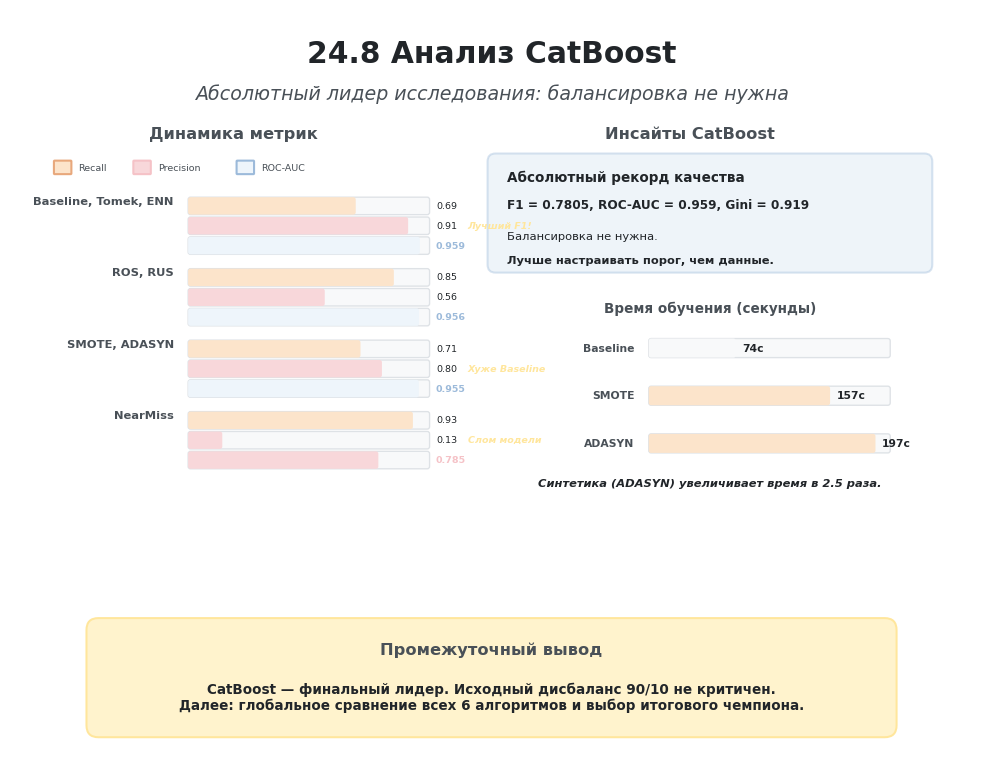

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.5, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "24.8 Анализ CatBoost",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Абсолютный лидер исследования: балансировка не нужна",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Динамика метрик
# ==========================================
ax.text(2.75, 6.5, "Динамика метрик", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Легенда
ax.add_patch(FancyBboxPatch((0.5, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=ORANGE, edgecolor=ORANGE_BORDER))
ax.text(0.8, 6.07, "Recall", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((1.5, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=RED_FILL, edgecolor=RED_BORDER))
ax.text(1.8, 6.07, "Precision", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)
ax.add_patch(FancyBboxPatch((2.8, 6.0), 0.2, 0.15, boxstyle="round,pad=0.01", facecolor=LIGHT_BLUE, edgecolor=BLUE_BORDER))
ax.text(3.1, 6.07, "ROC-AUC", ha="left", va="center", fontsize=7*S, color=TEXT_MUTED)

bar_x_start = 2.2
bar_max_w = 3.0
bar_h = 0.18

# Данные: (Название группы, Recall, Precision, AUC, Y_pos, Особенность)
groups_data = [
    ("Baseline, Tomek, ENN", 0.69, 0.91, 0.959, 5.5, "Лучший F1!"),
    ("ROS, RUS", 0.85, 0.56, 0.956, 4.6, ""),
    ("SMOTE, ADASYN", 0.71, 0.80, 0.955, 3.7, "Хуже Baseline"),
    ("NearMiss", 0.93, 0.13, 0.785, 2.8, "Слом модели")
]

for name, rec, prec, auc, y_pos, feature in groups_data:
    ax.text(2.0, y_pos + 0.15, name, ha="right", va="center", fontsize=8.5*S, weight="bold", color=TEXT_MUTED)

    # Шкала Recall
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos), bar_max_w * rec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=ORANGE, edgecolor=ORANGE_BORDER))

    # Шкала Precision
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.25), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.25), bar_max_w * prec, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=RED_FILL, edgecolor=RED_BORDER))

    # Шкала ROC-AUC
    auc_color = RED_FILL if auc < 0.90 else LIGHT_BLUE
    auc_border = RED_BORDER if auc < 0.90 else BLUE_BORDER
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.5), bar_max_w, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((bar_x_start, y_pos - 0.5), bar_max_w * auc, bar_h, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=auc_color, edgecolor=auc_border))

    # Значения справа
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos + 0.09, f"{rec:.2f}", ha="left", va="center", fontsize=7*S, color=TEXT_DARK)
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos - 0.16, f"{prec:.2f}", ha="left", va="center", fontsize=7*S, color=TEXT_DARK)
    ax.text(bar_x_start + bar_max_w + 0.1, y_pos - 0.41, f"{auc:.3f}", ha="left", va="center", fontsize=7*S, color=auc_border, weight="bold")

    if feature:
        ax.text(bar_x_start + bar_max_w + 0.5, y_pos - 0.16, feature, ha="left", va="center", fontsize=7*S, color=AMBER_BORDER, style="italic", weight="bold")


# ==========================================
# ПРАВАЯ ЧАСТЬ: ML, Бизнес и Техника
# ==========================================
ax.text(8.5, 6.5, "Инсайты CatBoost", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Блок 1: ML и Бизнес-смысл (Абсолютный лидер) ---
ax.add_patch(FancyBboxPatch(
    (6.0, 4.8), 5.5, 1.4,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.4
))
ax.text(6.2, 5.95, "Абсолютный рекорд качества", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(6.2, 5.6, "F1 = 0.7805, ROC-AUC = 0.959, Gini = 0.919", ha="left", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")
ax.text(6.2, 5.2, "Балансировка не нужна.", ha="left", va="center", fontsize=8.5*S, color=TEXT_DARK)
ax.text(6.2, 4.9, "Лучше настраивать порог, чем данные.", ha="left", va="center", fontsize=8.5*S, color=TEXT_DARK, weight="bold")

# --- Блок 2: Время обучения (Вычислительная эффективность) ---
ax.text(8.75, 4.3, "Время обучения (секунды)", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)

# Данные времени
time_data = [
    ("Baseline", 74, GRAY, GRAY_BORDER, 3.8),
    ("SMOTE", 157, ORANGE, ORANGE_BORDER, 3.2),
    ("ADASYN", 197, ORANGE, ORANGE_BORDER, 2.6)
]

max_time = 210
time_bar_x = 8.0
time_bar_max_w = 3.0

for name, t, color, border, y_pos in time_data:
    ax.text(7.8, y_pos, name, ha="right", va="center", fontsize=8*S, weight="bold", color=TEXT_MUTED)
    ax.add_patch(FancyBboxPatch((time_bar_x, y_pos - 0.1), time_bar_max_w, 0.2, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=1*S, edgecolor=GRAY_BORDER, facecolor=GRAY))
    ax.add_patch(FancyBboxPatch((time_bar_x, y_pos - 0.1), time_bar_max_w * (t/max_time), 0.2, boxstyle="round,pad=0.02,rounding_size=0.03", linewidth=0, facecolor=color, edgecolor=border))
    ax.text(time_bar_x + time_bar_max_w * (t/max_time) + 0.1, y_pos, f"{t}с", ha="left", va="center", fontsize=8*S, weight="bold", color=TEXT_DARK)

# Подпись бизнес-преимущества
ax.text(8.75, 2.1, "Синтетика (ADASYN) увеличивает время в 2.5 раза.", ha="center", va="center", fontsize=8.5*S, color=TEXT_DARK, weight="bold", style="italic")


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -1.0), 10.0, 1.3,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.0, "Промежуточный вывод",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.6, "CatBoost — финальный лидер. Исходный дисбаланс 90/10 не критичен.\nДалее: глобальное сравнение всех 6 алгоритмов и выбор итогового чемпиона.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

## Глава 25. Итоговое сравнение моделей и ответ на главный вопрос исследования

На предыдущих этапах были проведены эксперименты с шестью алгоритмами машинного обучения:

* Logistic Regression;
* Random Forest;
* Gradient Boosting;
* XGBoost;
* LightGBM;
* CatBoost.

Каждая модель была обучена и оценена на восьми вариантах обучающих данных:

* исходные данные без балансировки — Baseline;
* RandomOverSampler;
* SMOTE;
* ADASYN;
* RandomUnderSampler;
* NearMiss;
* Tomek Links;
* Edited Nearest Neighbours.

Все эксперименты выполнялись в одинаковых условиях:

* использовалось одно и то же разделение данных на обучающую и тестовую выборки;
* методы балансировки применялись только к обучающей выборке;
* тестовая выборка во всех экспериментах оставалась неизменной;
* для оценки использовался единый набор метрик;
* модели запускались через общий экспериментальный pipeline.

Такой подход обеспечивает корректную сопоставимость полученных результатов и позволяет оценить влияние именно методов балансировки, не смешивая его с изменением тестовых данных или процедуры оценки.

### Главный вопрос исследования

В начале работы был сформулирован основной исследовательский вопрос:

> **Насколько дисбаланс классов влияет на качество модели кредитного скоринга на выбранном наборе данных?**

В практической формулировке необходимо определить:

> **Является ли исходное соотношение классов примерно 90/10 существенным препятствием для построения качественной модели и требуется ли обязательное применение методов балансировки обучающих данных?**

Для ответа на этот вопрос недостаточно определить модель с максимальным значением одной отдельной метрики.

Необходимо проверить:

* насколько хорошо разные алгоритмы работают на исходных несбалансированных данных;
* приводит ли балансировка к устойчивому улучшению качества;
* какие метрики улучшаются после изменения распределения классов;
* какие показатели одновременно ухудшаются;
* сопровождается ли рост Recall снижением Precision;
* улучшаются ли F1-score, ROC-AUC и Gini;
* оправданы ли дополнительные вычислительные затраты;
* сохраняются ли выявленные закономерности для разных алгоритмов.

Особое внимание будет уделено сравнению результатов балансировки с соответствующим Baseline каждой модели.

Это позволит отделить реальное улучшение способности модели различать классы от простого изменения количества положительных прогнозов при стандартном пороге классификации.

### План заключительного анализа

На заключительном этапе будут выполнены:

1. объединение результатов всех экспериментов в единую таблицу;
2. проверка полноты итогового набора результатов;
3. сравнение шести моделей на исходных данных без балансировки;
4. визуальное сравнение Baseline-моделей с помощью тепловой карты;
5. расчёт изменений метрик после применения методов балансировки;
6. построение тепловой карты изменений относительно Baseline;
7. определение лучшего варианта для каждой модели;
8. анализ общей эффективности методов балансировки;
9. сравнение вычислительных затрат;
10. формулировка прямого ответа на главный вопрос исследования.

Цель данного раздела состоит не в механическом выборе максимального значения метрики, а в получении обоснованного инженерного вывода о том, является ли обнаруженный дисбаланс классов критической проблемой именно для рассматриваемого набора данных.

Итоговое решение будет основано на совместном анализе Accuracy, Precision, Recall, F1-score, ROC-AUC, Gini, времени обучения и характера изменений относительно исходных несбалансированных данных.


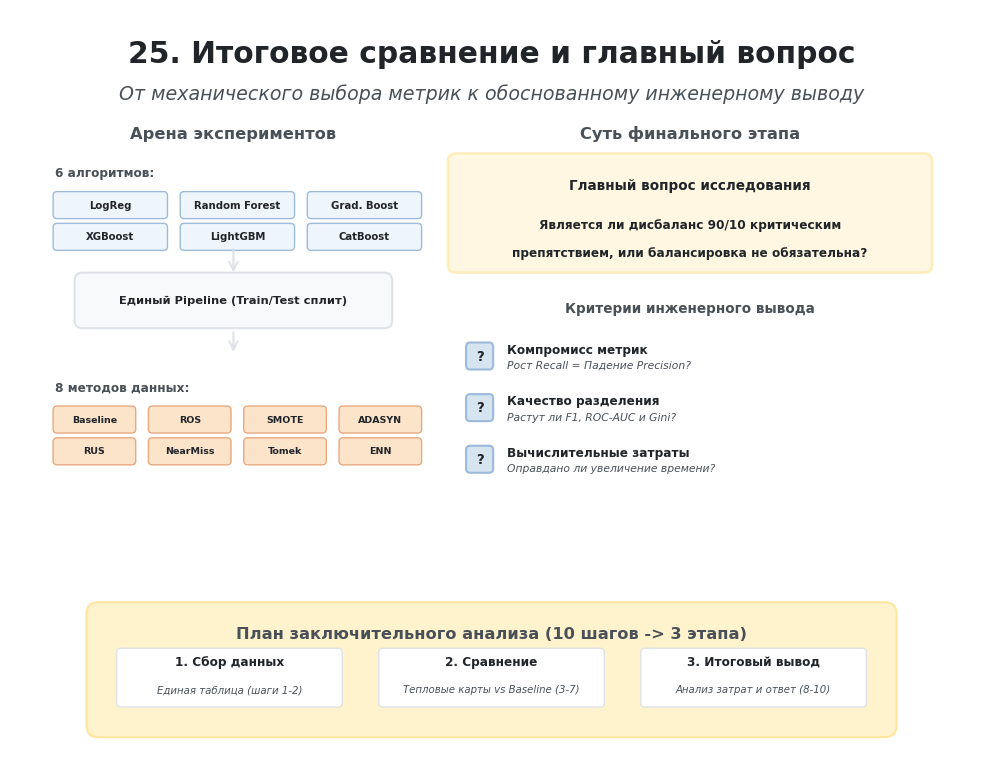

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.5, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "25. Итоговое сравнение и главный вопрос",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "От механического выбора метрик к обоснованному инженерному выводу",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Арена экспериментов (Масштаб)
# ==========================================
ax.text(2.75, 6.5, "Арена экспериментов", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- 6 Алгоритмов ---
ax.text(0.5, 6.0, "6 алгоритмов:", ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_MUTED)
models = ["LogReg", "Random Forest", "Grad. Boost", "XGBoost", "LightGBM", "CatBoost"]
for i, m in enumerate(models):
    row = i // 3
    col = i % 3
    mx = 0.5 + col * 1.6
    my = 5.6 - row * 0.4
    ax.add_patch(FancyBboxPatch((mx, my - 0.15), 1.4, 0.3, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=LIGHT_BLUE, edgecolor=BLUE_BORDER, linewidth=1*S))
    ax.text(mx + 0.7, my, m, ha="center", va="center", fontsize=7.5*S, weight="bold", color=TEXT_DARK)

# Стрелка вниз к Pipeline
ax.annotate("", xy=(2.75, 4.7), xytext=(2.75, 5.1), arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.5*S))

# --- Единый Pipeline ---
ax.add_patch(FancyBboxPatch((0.8, 4.1), 3.9, 0.6, boxstyle="round,pad=0.05,rounding_size=0.1", facecolor=GRAY, edgecolor=GRAY_BORDER, linewidth=1.5*S))
ax.text(2.75, 4.4, "Единый Pipeline (Train/Test сплит)", ha="center", va="center", fontsize=8.5*S, weight="bold", color=TEXT_DARK)

# Стрелка вниз к методам
ax.annotate("", xy=(2.75, 3.7), xytext=(2.75, 4.05), arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.5*S))

# --- 8 Методов балансировки ---
ax.text(0.5, 3.3, "8 методов данных:", ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_MUTED)
methods = ["Baseline", "ROS", "SMOTE", "ADASYN", "RUS", "NearMiss", "Tomek", "ENN"]
for i, m in enumerate(methods):
    row = i // 4
    col = i % 4
    mx = 0.5 + col * 1.2
    my = 2.9 - row * 0.4
    ax.add_patch(FancyBboxPatch((mx, my - 0.15), 1.0, 0.3, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=ORANGE, edgecolor=ORANGE_BORDER, linewidth=1*S))
    ax.text(mx + 0.5, my, m, ha="center", va="center", fontsize=7*S, weight="bold", color=TEXT_DARK)


# ==========================================
# ПРАВАЯ ЧАСТЬ: Главный вопрос и проверки
# ==========================================
ax.text(8.5, 6.5, "Суть финального этапа", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Блок 1: Главный вопрос ---
ax.add_patch(FancyBboxPatch(
    (5.5, 4.8), 6.0, 1.4,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=2*S, edgecolor=AMBER_BORDER, facecolor=AMBER, alpha=0.6
))
ax.text(8.5, 5.85, "Главный вопрос исследования", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(8.5, 5.35, "Является ли дисбаланс 90/10 критическим", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")
ax.text(8.5, 5.0, "препятствием, или балансировка не обязательна?", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")

# --- Блок 2: Что проверяем (Чек-лист) ---
ax.text(8.5, 4.3, "Критерии инженерного вывода", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_MUTED)

checks = [
    ("Компромисс метрик", "Рост Recall = Падение Precision?"),
    ("Качество разделения", "Растут ли F1, ROC-AUC и Gini?"),
    ("Вычислительные затраты", "Оправдано ли увеличение времени?")
]

for i, (title, desc) in enumerate(checks):
    y_c = 3.7 - i * 0.65
    # Иконка
    ax.add_patch(FancyBboxPatch((5.7, y_c - 0.15), 0.3, 0.3, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor=BLUE, edgecolor=BLUE_BORDER))
    ax.text(5.85, y_c, "?", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
    # Текст
    ax.text(6.2, y_c + 0.08, title, ha="left", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)
    ax.text(6.2, y_c - 0.12, desc, ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ---------- Итоговый блок (План финала - 3 этапа) ----------
res_box = FancyBboxPatch(
    (1.0, -1.0), 10.0, 1.5,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.2, "План заключительного анализа (10 шагов -> 3 этапа)",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)

# Этап 1
ax.add_patch(FancyBboxPatch((1.3, -0.7), 2.8, 0.7, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor="white", edgecolor=GRAY_BORDER, linewidth=1*S))
ax.text(2.7, -0.15, "1. Сбор данных", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)
ax.text(2.7, -0.5, "Единая таблица (шаги 1-2)", ha="center", va="center", fontsize=7.5*S, color=TEXT_MUTED, style="italic")

# Этап 2
ax.add_patch(FancyBboxPatch((4.6, -0.7), 2.8, 0.7, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor="white", edgecolor=GRAY_BORDER, linewidth=1*S))
ax.text(6.0, -0.15, "2. Сравнение", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)
ax.text(6.0, -0.5, "Тепловые карты vs Baseline (3-7)", ha="center", va="center", fontsize=7.5*S, color=TEXT_MUTED, style="italic")

# Этап 3
ax.add_patch(FancyBboxPatch((7.9, -0.7), 2.8, 0.7, boxstyle="round,pad=0.02,rounding_size=0.05", facecolor="white", edgecolor=GRAY_BORDER, linewidth=1*S))
ax.text(9.3, -0.15, "3. Итоговый вывод", ha="center", va="center", fontsize=9*S, weight="bold", color=TEXT_DARK)
ax.text(9.3, -0.5, "Анализ затрат и ответ (8-10)", ha="center", va="center", fontsize=7.5*S, color=TEXT_MUTED, style="italic")

plt.tight_layout()
plt.show()

### 25.1 Объединение результатов всех экспериментов

На предыдущих этапах результаты каждой модели сохранялись в отдельной таблице.

Теперь необходимо объединить результаты всех шести алгоритмов в единый набор данных:

* Logistic Regression;
* Random Forest;
* Gradient Boosting;
* XGBoost;
* LightGBM;
* CatBoost.

Поскольку каждая модель была протестирована на восьми одинаковых вариантах обучающих данных, итоговая таблица должна содержать 48 строк:

[
6\ моделей \times 8\ вариантов\ данных = 48\ экспериментов.
]

Объединение результатов необходимо для дальнейшего:

* сравнения моделей на исходных несбалансированных данных;
* оценки изменений после применения балансировки;
* построения сводных таблиц;
* создания тепловых карт;
* выявления общих закономерностей;
* формулировки ответа на главный вопрос исследования.

Перед объединением будет проверено:

* наличие всех шести таблиц;
* соответствие их структуры единому формату;
* отсутствие пустых результатов;
* наличие восьми экспериментов для каждой модели;
* отсутствие повторяющихся сочетаний модели и метода балансировки.

На данном этапе данные только объединяются и проверяются. Округление, цветовое оформление и аналитическое сравнение будут выполнены в следующих разделах.


In [ ]:
# ==========================================================
# Восстановление общей таблицы из сохранённых результатов
# ==========================================================

import pandas as pd


# ----------------------------------------------------------
# Порядок моделей и методов балансировки
# ----------------------------------------------------------

model_order = [
    "Logistic Regression",
    "Random Forest",
    "Gradient Boosting",
    "XGBoost",
    "LightGBM",
    "CatBoost"
]

balancing_order = [
    "Baseline",
    "RandomOverSampler",
    "SMOTE",
    "ADASYN",
    "RandomUnderSampler",
    "NearMiss",
    "Tomek Links",
    "Edited Nearest Neighbours"
]


# ----------------------------------------------------------
# Результаты завершённых экспериментов
# ----------------------------------------------------------
#
# Значения восстановлены из сохранённых выходов уже
# выполненных серий экспериментов.
#
# Повторное обучение моделей не выполняется.
#
# Структура каждой строки:
# (
#     метод балансировки,
#     Accuracy,
#     Precision,
#     Recall,
#     F1,
#     ROC-AUC,
#     Gini,
#     время обучения в секундах
# )

saved_experiment_results = {

    "Logistic Regression": [
        ("Baseline",                  0.9579, 0.8897, 0.6452, 0.7480, 0.9480, 0.8960,   5.8445),
        ("RandomOverSampler",         0.9067, 0.5107, 0.8481, 0.6375, 0.9490, 0.8979,  14.0132),
        ("SMOTE",                     0.9069, 0.5114, 0.8481, 0.6380, 0.9481, 0.8962,  12.3891),
        ("ADASYN",                    0.8318, 0.3554, 0.9082, 0.5109, 0.9474, 0.8948,  15.1162),
        ("RandomUnderSampler",        0.9064, 0.5098, 0.8497, 0.6373, 0.9490, 0.8979,   1.7215),
        ("NearMiss",                  0.4841, 0.1472, 0.9042, 0.2532, 0.8187, 0.6374,   4.5962),
        ("Tomek Links",               0.9577, 0.8771, 0.6543, 0.7495, 0.9480, 0.8960,   5.1544),
        ("Edited Nearest Neighbours", 0.9534, 0.7874, 0.7097, 0.7466, 0.9482, 0.8964,   6.6082)
    ],

    "Random Forest": [
        ("Baseline",                  0.9620, 0.9537, 0.6379, 0.7645, 0.9498, 0.8996, 161.8307),
        ("RandomOverSampler",         0.9614, 0.9168, 0.6606, 0.7679, 0.9536, 0.9072, 238.8903),
        ("SMOTE",                     0.9607, 0.8779, 0.6899, 0.7726, 0.9524, 0.9049, 377.1787),
        ("ADASYN",                    0.9580, 0.8354, 0.7052, 0.7648, 0.9523, 0.9046, 367.1275),
        ("RandomUnderSampler",        0.9066, 0.5102, 0.8709, 0.6435, 0.9552, 0.9104,  20.0451),
        ("NearMiss",                  0.3926, 0.1305, 0.9325, 0.2290, 0.8487, 0.6973,  25.0041),
        ("Tomek Links",               0.9622, 0.9444, 0.6476, 0.7684, 0.9501, 0.9003, 159.2917),
        ("Edited Nearest Neighbours", 0.9596, 0.8537, 0.7030, 0.7711, 0.9512, 0.9023, 146.2440)
    ],

    "Gradient Boosting": [
        ("Baseline",                  0.9613, 0.9089, 0.6665, 0.7690, 0.9558, 0.9117, 202.9805),
        ("RandomOverSampler",         0.9073, 0.5124, 0.8706, 0.6451, 0.9557, 0.9114, 381.3789),
        ("SMOTE",                     0.9517, 0.7629, 0.7269, 0.7445, 0.9482, 0.8964, 747.8558),
        ("ADASYN",                    0.9425, 0.6828, 0.7576, 0.7182, 0.9465, 0.8930, 724.1197),
        ("RandomUnderSampler",        0.9068, 0.5106, 0.8706, 0.6437, 0.9556, 0.9113,  32.7468),
        ("NearMiss",                  0.5493, 0.1662, 0.9106, 0.2811, 0.8591, 0.7182,  29.1618),
        ("Tomek Links",               0.9611, 0.8980, 0.6749, 0.7706, 0.9556, 0.9113, 200.4184),
        ("Edited Nearest Neighbours", 0.9564, 0.8056, 0.7240, 0.7626, 0.9556, 0.9112, 187.3326)
    ],

    "XGBoost": [
        ("Baseline",                  0.9624, 0.9062, 0.6825, 0.7786, 0.9569, 0.9139,  4.7173),
        ("RandomOverSampler",         0.9230, 0.5684, 0.8479, 0.6806, 0.9549, 0.9097,  9.6435),
        ("SMOTE",                     0.9619, 0.8945, 0.6873, 0.7773, 0.9569, 0.9137, 11.4122),
        ("ADASYN",                    0.9624, 0.9020, 0.6859, 0.7792, 0.9552, 0.9105, 11.5667),
        ("RandomUnderSampler",        0.9079, 0.5140, 0.8729, 0.6470, 0.9559, 0.9117,  1.2595),
        ("NearMiss",                  0.3968, 0.1311, 0.9308, 0.2299, 0.7690, 0.5380,  1.2158),
        ("Tomek Links",               0.9621, 0.8892, 0.6945, 0.7799, 0.9571, 0.9141,  6.8155),
        ("Edited Nearest Neighbours", 0.9570, 0.7998, 0.7409, 0.7692, 0.9567, 0.9134,  4.2208)
    ],

    "LightGBM": [
        ("Baseline",                  0.9628, 0.9139, 0.6792, 0.7793, 0.9583, 0.9167,  7.3380),
        ("RandomOverSampler",         0.9136, 0.5327, 0.8686, 0.6604, 0.9580, 0.9161, 13.3306),
        ("SMOTE",                     0.9621, 0.8967, 0.6869, 0.7779, 0.9565, 0.9131, 18.9612),
        ("ADASYN",                    0.9610, 0.8883, 0.6823, 0.7718, 0.9547, 0.9095, 15.9393),
        ("RandomUnderSampler",        0.9096, 0.5195, 0.8754, 0.6521, 0.9576, 0.9152,  1.5320),
        ("NearMiss",                  0.3978, 0.1313, 0.9299, 0.2300, 0.8215, 0.6430,  1.5166),
        ("Tomek Links",               0.9620, 0.8981, 0.6845, 0.7769, 0.9581, 0.9163,  9.3803),
        ("Edited Nearest Neighbours", 0.9573, 0.8062, 0.7347, 0.7688, 0.9575, 0.9150,  7.2386)
    ],

    "CatBoost": [
        ("Baseline",                  0.9629, 0.9131, 0.6815, 0.7805, 0.9593, 0.9186,  74.1851),
        ("RandomOverSampler",         0.9317, 0.6068, 0.8367, 0.7034, 0.9561, 0.9122, 139.0909),
        ("SMOTE",                     0.9628, 0.9073, 0.6859, 0.7812, 0.9575, 0.9149, 157.8837),
        ("ADASYN",                    0.9628, 0.9058, 0.6863, 0.7809, 0.9573, 0.9146, 197.8021),
        ("RandomUnderSampler",        0.9112, 0.5247, 0.8752, 0.6561, 0.9591, 0.9182,  33.6882),
        ("NearMiss",                  0.3997, 0.1321, 0.9345, 0.2315, 0.7848, 0.5696,  36.6314),
        ("Tomek Links",               0.9629, 0.9017, 0.6925, 0.7833, 0.9591, 0.9181, 124.4566),
        ("Edited Nearest Neighbours", 0.9580, 0.8071, 0.7431, 0.7738, 0.9584, 0.9167, 109.7133)
    ]
}


# ----------------------------------------------------------
# Преобразование результатов в единую таблицу
# ----------------------------------------------------------

rows = []

for model_name in model_order:

    model_results = saved_experiment_results[model_name]

    for (
        balancing_name,
        accuracy,
        precision,
        recall,
        f1,
        roc_auc,
        gini,
        fit_time
    ) in model_results:

        rows.append(
            {
                "Model": model_name,
                "Balancing": balancing_name,
                "Accuracy": accuracy,
                "Precision": precision,
                "Recall": recall,
                "F1": f1,
                "ROC-AUC": roc_auc,
                "Gini": gini,
                "Fit Time": fit_time
            }
        )


all_models_results_table = pd.DataFrame(rows)


# ----------------------------------------------------------
# Контрольные проверки
# ----------------------------------------------------------

expected_models = 6
expected_balancing_methods = 8
expected_experiments = 48


if all_models_results_table["Model"].nunique() != expected_models:
    raise ValueError(
        "Количество моделей не соответствует ожидаемому."
    )


if (
    all_models_results_table["Balancing"].nunique()
    != expected_balancing_methods
):
    raise ValueError(
        "Количество вариантов балансировки "
        "не соответствует ожидаемому."
    )


if len(all_models_results_table) != expected_experiments:
    raise ValueError(
        "Общее количество экспериментов "
        "не соответствует ожидаемому."
    )


duplicate_mask = all_models_results_table.duplicated(
    subset=["Model", "Balancing"],
    keep=False
)


if duplicate_mask.any():
    raise ValueError(
        "Обнаружены повторяющиеся сочетания "
        "'модель + балансировка'."
    )


# Проверяем, что каждая модель представлена
# всеми восемью вариантами данных.
experiments_by_model = (
    all_models_results_table
    .groupby("Model", sort=False)
    .size()
)


if not (experiments_by_model == 8).all():
    raise ValueError(
        "Не для каждой модели найдено "
        "восемь экспериментов."
    )


# ----------------------------------------------------------
# Итоговый вывод
# ----------------------------------------------------------

print("=" * 70)
print("Общая таблица результатов успешно восстановлена.")
print("=" * 70)

print(
    "Количество моделей:",
    all_models_results_table["Model"].nunique()
)

print(
    "Количество вариантов балансировки:",
    all_models_results_table["Balancing"].nunique()
)

print(
    "Общее количество экспериментов:",
    len(all_models_results_table)
)

print("\nКоличество экспериментов по моделям:")
print(experiments_by_model)

print(
    "\nПовторяющиеся сочетания "
    "'модель + балансировка':",
    int(duplicate_mask.sum())
)

print(
    "\nТаблица сохранена в переменной "
    "all_models_results_table."
)

print("=" * 70)

Общая таблица результатов успешно восстановлена.
Количество моделей: 6
Количество вариантов балансировки: 8
Общее количество экспериментов: 48

Количество экспериментов по моделям:
Model
Logistic Regression    8
Random Forest          8
Gradient Boosting      8
XGBoost                8
LightGBM               8
CatBoost               8
dtype: int64

Повторяющиеся сочетания 'модель + балансировка': 0

Таблица сохранена в переменной all_models_results_table.


### 25.2 Общая сводная таблица результатов

После объединения результатов сформирована единая таблица, содержащая все 48 проведённых экспериментов:

[
6\ моделей \times 8\ вариантов\ обучающих\ данных = 48\ экспериментов.
]

Для каждого сочетания модели и метода балансировки представлены:

* Accuracy;
* Precision;
* Recall;
* F1-score;
* ROC-AUC;
* Gini;
* время обучения.

Чтобы большое количество результатов было удобнее сравнивать, в таблице используется цветовое форматирование.

#### Цветовая шкала метрик качества

Для Accuracy, Precision, Recall, F1-score, ROC-AUC и Gini применяется единая шкала:

* красные оттенки соответствуют более низким значениям;
* жёлтые оттенки — промежуточным значениям;
* зелёные оттенки — более высоким значениям.

Каждая метрика окрашивается отдельно от остальных. Поэтому цвет показывает положение результата внутри конкретного столбца, а не сравнение разных метрик между собой.

Например, цвет значения Recall определяется только относительно остальных значений Recall, а значение Precision — только относительно остальных значений Precision.

Это важно, поскольку разные метрики имеют различный смысл и не должны сравниваться между собой только по интенсивности цвета.

#### Отдельная шкала времени обучения

Время обучения является вычислительной характеристикой, а не метрикой качества модели. Поэтому для него используется отдельная цветовая палитра:

* голубые оттенки соответствуют более быстрому обучению;
* сиреневые — промежуточной продолжительности;
* розовые — наиболее длительным экспериментам.

Столбец времени дополнительно отделён от метрик качества вертикальной границей.

Поскольку продолжительность экспериментов различается очень сильно — от нескольких секунд до нескольких минут, — для цветового отображения времени применяется логарифмическая шкала.

Такое преобразование позволяет визуально различать не только самые быстрые и самые медленные эксперименты, но и промежуточные значения, которые при обычной линейной шкале могли бы выглядеть практически одинаково.

Для удобства интерпретации фактическое время выводится в привычном формате:

* секунды;
* минуты и секунды.

Цветовое оформление используется только как вспомогательный инструмент. Все выводы далее будут основываться на точных числовых значениях и сравнении каждого варианта с соответствующим Baseline.


In [ ]:
# @title
# ==========================================================
# Контрастное цветовое оформление общей таблицы
# ==========================================================

import numpy as np
import pandas as pd

from IPython.display import display
from matplotlib.colors import (
    LinearSegmentedColormap,
    Normalize,
    to_hex
)


# ----------------------------------------------------------
# Контрольная проверка исходной таблицы
# ----------------------------------------------------------

required_columns = [
    "Model",
    "Balancing",
    "Accuracy",
    "Precision",
    "Recall",
    "F1",
    "ROC-AUC",
    "Gini",
    "Fit Time"
]

missing_columns = [
    column
    for column in required_columns
    if column not in all_models_results_table.columns
]

if missing_columns:
    raise KeyError(
        "В общей таблице отсутствуют необходимые столбцы: "
        f"{missing_columns}"
    )

if len(all_models_results_table) != 48:
    raise ValueError(
        "Ожидалось 48 экспериментов, "
        f"но в таблице найдено: {len(all_models_results_table)}."
    )


# ----------------------------------------------------------
# Форматирование времени
# ----------------------------------------------------------

def format_time_ru(seconds):
    """
    Преобразует время из секунд в понятный формат:

    6 сек.
    2 мин. 42 сек.
    12 мин. 28 сек.
    """

    total_seconds = int(round(float(seconds)))

    minutes, remaining_seconds = divmod(
        total_seconds,
        60
    )

    if minutes == 0:
        return f"{remaining_seconds} сек."

    return (
        f"{minutes} мин. "
        f"{remaining_seconds} сек."
    )


# ----------------------------------------------------------
# Цветовые палитры
# ----------------------------------------------------------

# Палитра метрик:
#
# низкие значения  — приглушённый красный;
# средние значения — тёплый жёлтый;
# высокие значения — спокойный зелёный.
#
# Цвета контрастные, но без кислотной насыщенности.

metrics_cmap = LinearSegmentedColormap.from_list(
    "balanced_metrics",
    [
        "#D98F8F",  # приглушённый красный
        "#E8B59B",  # мягкий персиковый
        "#E9D69A",  # тёплый жёлтый
        "#B9D19C",  # светло-зелёный
        "#78A985"   # спокойный зелёный
    ]
)


# Палитра времени:
#
# быстро  — голубой;
# средне  — сиреневый;
# долго   — розовый.
#
# Она намеренно не использует зелёный, жёлтый и красный,
# чтобы время визуально не смешивалось с метриками качества.

time_cmap = LinearSegmentedColormap.from_list(
    "training_time",
    [
        "#79B5D1",  # голубой
        "#A5C4DC",  # светло-голубой
        "#C5B7D9",  # сиреневый
        "#D49FB5",  # пыльно-розовый
        "#B96F8A"   # тёмный приглушённый розовый
    ]
)


# ----------------------------------------------------------
# Функции цветового оформления
# ----------------------------------------------------------

def style_metric_column(series):
    """
    Окрашивает один столбец метрики независимо
    от остальных столбцов.

    Минимальное значение столбца получает красный оттенок,
    максимальное — зелёный.
    """

    numeric_series = pd.to_numeric(
        series,
        errors="coerce"
    )

    valid_values = numeric_series.dropna()

    if valid_values.empty:
        return [""] * len(series)

    minimum = valid_values.min()
    maximum = valid_values.max()

    # Защита на случай одинаковых значений.
    if minimum == maximum:
        return [
            (
                "background-color: #E9D69A; "
                "color: #202428;"
            )
            if pd.notna(value)
            else ""
            for value in numeric_series
        ]

    normalization = Normalize(
        vmin=minimum,
        vmax=maximum
    )

    styles = []

    for value in numeric_series:

        if pd.isna(value):
            styles.append("")
            continue

        background_color = to_hex(
            metrics_cmap(
                normalization(value)
            )
        )

        styles.append(
            f"background-color: {background_color}; "
            "color: #202428;"
        )

    return styles


def style_time_column(series):
    """
    Окрашивает время обучения по логарифмической шкале.

    Логарифмическое преобразование необходимо,
    потому что значения времени различаются очень сильно:
    от нескольких секунд до нескольких минут.

    Благодаря этому небольшие и средние значения
    не сливаются в один цвет.
    """

    numeric_series = pd.to_numeric(
        series,
        errors="coerce"
    )

    valid_values = numeric_series.dropna()

    if valid_values.empty:
        return [""] * len(series)

    # log1p позволяет корректно работать
    # даже с очень маленькими значениями.
    transformed_values = np.log1p(
        valid_values
    )

    minimum = transformed_values.min()
    maximum = transformed_values.max()

    if minimum == maximum:
        return [
            (
                "background-color: #C5B7D9; "
                "color: #202428; "
                "font-weight: 600;"
            )
            if pd.notna(value)
            else ""
            for value in numeric_series
        ]

    normalization = Normalize(
        vmin=minimum,
        vmax=maximum
    )

    styles = []

    for value in numeric_series:

        if pd.isna(value):
            styles.append("")
            continue

        transformed_value = np.log1p(value)

        background_color = to_hex(
            time_cmap(
                normalization(
                    transformed_value
                )
            )
        )

        styles.append(
            f"background-color: {background_color}; "
            "color: #202428; "
            "font-weight: 600;"
        )

    return styles


# ----------------------------------------------------------
# Подготовка таблицы для отображения
# ----------------------------------------------------------

all_results_display = (
    all_models_results_table[
        required_columns
    ]
    .copy()
)


all_results_display = all_results_display.rename(
    columns={
        "Model": "Модель",
        "Balancing": "Вариант данных",
        "F1": "F1-score",
        "Fit Time": "Время обучения"
    }
)


metric_columns = [
    "Accuracy",
    "Precision",
    "Recall",
    "F1-score",
    "ROC-AUC",
    "Gini"
]


# ----------------------------------------------------------
# Формирование оформленной таблицы
# ----------------------------------------------------------

all_models_results_styled = (
    all_results_display
    .style

    # Каждая метрика окрашивается отдельно.
    .apply(
        style_metric_column,
        subset=metric_columns,
        axis=0
    )

    # Время окрашивается отдельной палитрой
    # и по логарифмической шкале.
    .apply(
        style_time_column,
        subset=["Время обучения"],
        axis=0
    )

    # Формат числовых значений.
    .format(
        {
            "Accuracy": "{:.4f}",
            "Precision": "{:.4f}",
            "Recall": "{:.4f}",
            "F1-score": "{:.4f}",
            "ROC-AUC": "{:.4f}",
            "Gini": "{:.4f}",
            "Время обучения": format_time_ru
        }
    )

    # Скрываем индекс.
    .hide(axis="index")

    # Заголовок таблицы.
    .set_caption(
        "Общая сводная таблица: "
        "6 моделей × 8 вариантов обучающих данных"
    )

    # Настройка внешнего вида.
    .set_table_styles(
        [
            {
                "selector": "caption",
                "props": [
                    ("font-size", "16px"),
                    ("font-weight", "bold"),
                    ("text-align", "left"),
                    ("padding", "10px 0 12px 0"),
                    ("color", "#2C3135")
                ]
            },
            {
                "selector": "th",
                "props": [
                    ("background-color", "#E8EBEE"),
                    ("font-weight", "bold"),
                    ("text-align", "center"),
                    ("border", "1px solid #BCC4CB"),
                    ("padding", "8px"),
                    ("color", "#252A2E")
                ]
            },
            {
                "selector": "td",
                "props": [
                    ("text-align", "center"),
                    ("border", "1px solid #D1D6DA"),
                    ("padding", "7px")
                ]
            },
            {
                "selector": "td:nth-child(1)",
                "props": [
                    ("text-align", "left"),
                    ("font-weight", "bold"),
                    ("background-color", "#F1F3F4"),
                    ("color", "#252A2E")
                ]
            },
            {
                "selector": "td:nth-child(2)",
                "props": [
                    ("text-align", "left"),
                    ("background-color", "#F8F8F8"),
                    ("color", "#252A2E")
                ]
            },

            # Толстая граница визуально отделяет
            # вычислительное время от метрик качества.
            {
                "selector": "th:nth-child(9)",
                "props": [
                    ("border-left", "4px solid #8295A5")
                ]
            },
            {
                "selector": "td:nth-child(9)",
                "props": [
                    ("border-left", "4px solid #8295A5")
                ]
            }
        ]
    )
)


# ----------------------------------------------------------
# Вывод
# ----------------------------------------------------------

display(all_models_results_styled)


print(
    "Общая таблица успешно сформирована: "
    f"{len(all_results_display)} экспериментов."
)

print("\nЦветовые обозначения:")

print(
    "Метрики качества: "
    "красный → персиковый → жёлтый → зелёный."
)

print(
    "Время обучения: "
    "голубой → сиреневый → розовый."
)

print(
    "Для времени используется логарифмическая шкала, "
    "поэтому секунды и минуты теперь визуально различаются."
)

Модель,Вариант данных,Accuracy,Precision,Recall,F1-score,ROC-AUC,Gini,Время обучения
Logistic Regression,Baseline,0.9579,0.8897,0.6452,0.7480,0.9480,0.8960,6 сек.
Logistic Regression,RandomOverSampler,0.9067,0.5107,0.8481,0.6375,0.9490,0.8979,14 сек.
Logistic Regression,SMOTE,0.9069,0.5114,0.8481,0.6380,0.9481,0.8962,12 сек.
Logistic Regression,ADASYN,0.8318,0.3554,0.9082,0.5109,0.9474,0.8948,15 сек.
Logistic Regression,RandomUnderSampler,0.9064,0.5098,0.8497,0.6373,0.9490,0.8979,2 сек.
Logistic Regression,NearMiss,0.4841,0.1472,0.9042,0.2532,0.8187,0.6374,5 сек.
Logistic Regression,Tomek Links,0.9577,0.8771,0.6543,0.7495,0.9480,0.8960,5 сек.
Logistic Regression,Edited Nearest Neighbours,0.9534,0.7874,0.7097,0.7466,0.9482,0.8964,7 сек.
Random Forest,Baseline,0.9620,0.9537,0.6379,0.7645,0.9498,0.8996,2 мин. 42 сек.
Random Forest,RandomOverSampler,0.9614,0.9168,0.6606,0.7679,0.9536,0.9072,3 мин. 59 сек.


Общая таблица успешно сформирована: 48 экспериментов.

Цветовые обозначения:
Метрики качества: красный → персиковый → жёлтый → зелёный.
Время обучения: голубой → сиреневый → розовый.
Для времени используется логарифмическая шкала, поэтому секунды и минуты теперь визуально различаются.


### 25.3 Сравнение моделей на исходных несбалансированных данных

Первый этап итогового сравнения посвящён результатам Baseline — моделям, обученным на исходных данных без применения методов балансировки.

Такое сравнение является ключевым для ответа на главный вопрос исследования:

> **Является ли исходный дисбаланс классов примерно 90/10 существенным препятствием классов примерно 90/10 существенным препятствием для построения качественной модели кредитного скоринга?**

Если алгоритм для построения качественной модели кредитного скоринга?**

Если алгоритмы уже демонстрируют высокие значения F1-score, ROC-AUCмы уже демонстрируют высокие значения F1-score, ROC-AUC и Gini на исходных данных, это и Gini на исходных данных, это означает, что наличие означает, что наличие дисбаланса само по себе не препятствует обучению моделей и не делает балансировку обязательной.

В таблице сопоставляются:

- делает балансировку обязательной.

В таблице сопоставляются:

- Accuracy;
- Precision;
- Recall;
- F1-score;
- ROC-AUC;
- Gini;
 Accuracy;
- Precision;
- Recall;
- F1-score;
- ROC-AUC;
- Gini;
- время обучения.

Метрики качества и время- время обучения.

Метрики качества и время обучения оформляются разными цветов обучения оформляются разными цветовыми шкалами:

- красный — жёлтый — зелёыми шкалами:

- красный — жёлтый — зелёный для метрик качества;
- голубой — сиреневый — розный для метрик качества;
- голубой — сиреневый — розовый для продолжительности обучения.

Каждый новый для продолжительности обучения.

Каждый столбец метрик окрашивается независимо, поэтому цвет показывает относительное положение модели только внутри соответствующего показателя.

In [ ]:
# ==========================================================
# Сравнение моделей на исходных данных Baseline
# ==========================================================

from IPython.display import display


# ----------------------------------------------------------
# Формирование таблицы Baseline
# ----------------------------------------------------------

baseline_results_table = (
    all_models_results_table
    .loc[
        all_models_results_table["Balancing"] == "Baseline",
        [
            "Model",
            "Accuracy",
            "Precision",
            "Recall",
            "F1",
            "ROC-AUC",
            "Gini",
            "Fit Time"
        ]
    ]
    .copy()
    .reset_index(drop=True)
)


# ----------------------------------------------------------
# Контрольные проверки
# ----------------------------------------------------------

expected_models = 6

if len(baseline_results_table) != expected_models:
    raise ValueError(
        "В таблице Baseline должно быть 6 строк — "
        "по одной для каждой модели. "
        f"Получено строк: {len(baseline_results_table)}."
    )


if baseline_results_table["Model"].nunique() != expected_models:
    raise ValueError(
        "В таблице Baseline представлены не все шесть моделей."
    )


if baseline_results_table.isna().any().any():
    missing_info = (
        baseline_results_table
        .isna()
        .sum()
    )

    raise ValueError(
        "В таблице Baseline обнаружены пропущенные значения:\n"
        f"{missing_info[missing_info > 0]}"
    )


# ----------------------------------------------------------
# Подготовка таблицы для отображения
# ----------------------------------------------------------

baseline_results_display = (
    baseline_results_table
    .rename(
        columns={
            "Model": "Модель",
            "F1": "F1-score",
            "Fit Time": "Время обучения"
        }
    )
)


baseline_metric_columns = [
    "Accuracy",
    "Precision",
    "Recall",
    "F1-score",
    "ROC-AUC",
    "Gini"
]


# ----------------------------------------------------------
# Цветовое оформление
# ----------------------------------------------------------

baseline_results_styled = (
    baseline_results_display
    .style

    # Метрики качества:
    # низкие значения — красные,
    # средние — жёлтые,
    # высокие — зелёные.
    .apply(
        style_metric_column,
        subset=baseline_metric_columns,
        axis=0
    )

    # Время обучения:
    # быстро — голубой,
    # средне — сиреневый,
    # долго — розовый.
    .apply(
        style_time_column,
        subset=["Время обучения"],
        axis=0
    )

    # Форматирование числовых значений.
    .format(
        {
            "Accuracy": "{:.4f}",
            "Precision": "{:.4f}",
            "Recall": "{:.4f}",
            "F1-score": "{:.4f}",
            "ROC-AUC": "{:.4f}",
            "Gini": "{:.4f}",
            "Время обучения": format_time_ru
        }
    )

    # Скрываем индекс.
    .hide(axis="index")

    # Заголовок таблицы.
    .set_caption(
        "Сравнение моделей на исходных данных без балансировки"
    )

    # Внешнее оформление.
    .set_table_styles(
        [
            {
                "selector": "caption",
                "props": [
                    ("font-size", "16px"),
                    ("font-weight", "bold"),
                    ("text-align", "left"),
                    ("padding", "10px 0 12px 0"),
                    ("color", "#2C3135")
                ]
            },
            {
                "selector": "th",
                "props": [
                    ("background-color", "#E8EBEE"),
                    ("font-weight", "bold"),
                    ("text-align", "center"),
                    ("border", "1px solid #BCC4CB"),
                    ("padding", "8px"),
                    ("color", "#252A2E")
                ]
            },
            {
                "selector": "td",
                "props": [
                    ("text-align", "center"),
                    ("border", "1px solid #D1D6DA"),
                    ("padding", "8px"),
                    ("color", "#202428")
                ]
            },
            {
                "selector": "td:nth-child(1)",
                "props": [
                    ("text-align", "left"),
                    ("font-weight", "bold"),
                    ("background-color", "#F1F3F4")
                ]
            },

            # Визуально отделяем время от метрик.
            {
                "selector": "th:nth-child(8)",
                "props": [
                    ("border-left", "4px solid #8295A5")
                ]
            },
            {
                "selector": "td:nth-child(8)",
                "props": [
                    ("border-left", "4px solid #8295A5"),
                    ("font-weight", "600")
                ]
            }
        ]
    )
)


# ----------------------------------------------------------
# Вывод
# ----------------------------------------------------------

display(baseline_results_styled)


print(
    "Таблица Baseline успешно сформирована: "
    f"{len(baseline_results_table)} моделей."
)

print(
    "Она сохранена в переменной baseline_results_table."
)

Модель,Accuracy,Precision,Recall,F1-score,ROC-AUC,Gini,Время обучения
Logistic Regression,0.9579,0.8897,0.6452,0.7480,0.9480,0.8960,6 сек.
Random Forest,0.9620,0.9537,0.6379,0.7645,0.9498,0.8996,2 мин. 42 сек.
Gradient Boosting,0.9613,0.9089,0.6665,0.7690,0.9558,0.9117,3 мин. 23 сек.
XGBoost,0.9624,0.9062,0.6825,0.7786,0.9569,0.9139,5 сек.
LightGBM,0.9628,0.9139,0.6792,0.7793,0.9583,0.9167,7 сек.
CatBoost,0.9629,0.9131,0.6815,0.7805,0.9593,0.9186,1 мин. 14 сек.


Таблица Baseline успешно сформирована: 6 моделей.
Она сохранена в переменной baseline_results_table.


### 25.4 Визуальное сравнение Baseline-моделей с помощью тепловой карты

Сводная таблица позволяет увидеть точные значения метрик для каждой модели, однако при одновременном сравнении нескольких показателей числовой формат не всегда позволяет быстро заметить общую структуру результатов.

Поэтому следующим шагом строится тепловая карта качества моделей, обученных на исходных несбалансированных данных.

На тепловой карте:

- строки соответствуют шести исследуемым моделям;
- столбцы соответствуют метрикам Accuracy, Precision, Recall, F1-score, ROC-AUC и Gini;
- в каждой ячейке отображается фактическое значение соответствующей метрики;
- цвет показывает относительное положение модели среди остальных алгоритмов внутри конкретной метрики;
- максимальное значение каждого столбца дополнительно выделяется рамкой.

Цветовая шкала рассчитывается отдельно для каждого столбца.

Это означает, что значения разных метрик не сравниваются между собой напрямую. Например, цвет Recall определяется только относительно остальных значений Recall, а цвет ROC-AUC — только относительно остальных значений ROC-AUC.

Такой подход необходим, поскольку метрики имеют разный диапазон значений и отражают разные стороны качества модели.

Тепловая карта должна помочь ответить на несколько последовательных вопросов:

1. Насколько сильно различаются модели при обучении на исходных несбалансированных данных?
2. Есть ли алгоритмы, которые уже без балансировки показывают устойчиво высокое качество сразу по нескольким метрикам?
3. Сохраняют ли модели приемлемый Recall при высокой Precision?
4. Насколько высокими остаются ROC-AUC и Gini, характеризующие способность модели ранжировать объекты по уровню риска?
5. Можно ли считать исходный дисбаланс классов критическим препятствием ещё до анализа методов балансировки?

Особое внимание необходимо уделить не одной отдельной метрике, а их совместному поведению.

Высокая Precision при низком Recall может означать, что модель редко ошибается при прогнозировании дефолта, но пропускает значительную часть проблемных клиентов.

Высокий Recall при низкой Precision, наоборот, может свидетельствовать о большом количестве ложных предупреждений.

F1-score позволяет оценить баланс между Precision и Recall, а ROC-AUC и Gini показывают, насколько хорошо модель в целом разделяет клиентов по уровню риска независимо от выбранного порога классификации.

Таким образом, тепловая карта используется не для механического выбора самой зелёной строки, а для получения целостного представления о качестве Baseline-моделей.

Этот этап формирует исходную точку дальнейшего анализа: сначала определяется, насколько хорошо модели работают без изменения распределения классов, а затем полученные результаты будут сопоставлены с вариантами после применения методов балансировки.

Именно такое последовательное сравнение позволит обоснованно ответить на главный вопрос исследования:

> **Является ли исходный дисбаланс классов существенной проблемой для рассматриваемой задачи кредитного скоринга и требуется ли его обязательная коррекция?**

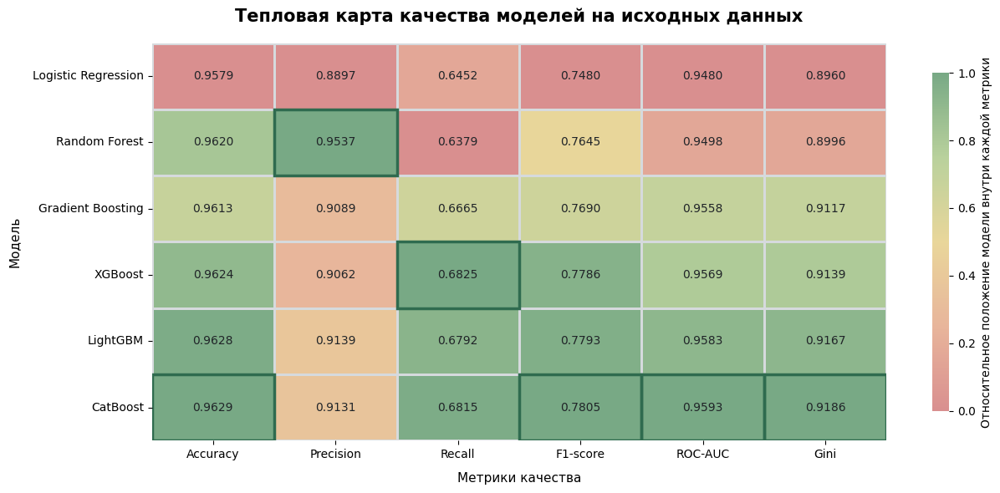

Тепловая карта Baseline успешно построена.
Числа в ячейках — фактические значения метрик.
Цвет показывает относительное положение модели только внутри соответствующего столбца.
Тёмно-зелёной рамкой выделено максимальное значение каждой метрики.


In [ ]:
# @title
# ==========================================================
# Тепловая карта метрик моделей на исходных данных Baseline
# ==========================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Rectangle


# ----------------------------------------------------------
# Контрольная проверка таблицы Baseline
# ----------------------------------------------------------

required_baseline_columns = [
    "Model",
    "Accuracy",
    "Precision",
    "Recall",
    "F1",
    "ROC-AUC",
    "Gini"
]

missing_columns = [
    column
    for column in required_baseline_columns
    if column not in baseline_results_table.columns
]

if missing_columns:
    raise KeyError(
        "В таблице Baseline отсутствуют необходимые столбцы: "
        f"{missing_columns}"
    )

if len(baseline_results_table) != 6:
    raise ValueError(
        "Для построения тепловой карты ожидалось 6 моделей, "
        f"но найдено: {len(baseline_results_table)}."
    )

if baseline_results_table[
    required_baseline_columns
].isna().any().any():
    raise ValueError(
        "В данных для тепловой карты обнаружены пропущенные значения."
    )


# ----------------------------------------------------------
# Подготовка фактических значений метрик
# ----------------------------------------------------------

heatmap_metric_columns = [
    "Accuracy",
    "Precision",
    "Recall",
    "F1",
    "ROC-AUC",
    "Gini"
]

baseline_heatmap_values = (
    baseline_results_table
    .set_index("Model")[heatmap_metric_columns]
    .copy()
)

baseline_heatmap_values = baseline_heatmap_values.rename(
    columns={
        "F1": "F1-score"
    }
)


# ----------------------------------------------------------
# Нормализация только для цветового отображения
# ----------------------------------------------------------
#
# Каждая метрика нормализуется отдельно в диапазон от 0 до 1.
#
# Это означает:
# - 0 соответствует минимальному значению внутри столбца;
# - 1 соответствует максимальному значению внутри столбца.
#
# При этом в ячейках остаются исходные значения метрик,
# а не нормализованные числа.

baseline_heatmap_normalized = pd.DataFrame(
    index=baseline_heatmap_values.index,
    columns=baseline_heatmap_values.columns,
    dtype=float
)

for column in baseline_heatmap_values.columns:

    column_values = baseline_heatmap_values[column]

    minimum = column_values.min()
    maximum = column_values.max()

    if minimum == maximum:
        baseline_heatmap_normalized[column] = 0.5
    else:
        baseline_heatmap_normalized[column] = (
            column_values - minimum
        ) / (
            maximum - minimum
        )


# ----------------------------------------------------------
# Спокойная контрастная палитра
# ----------------------------------------------------------

baseline_heatmap_cmap = LinearSegmentedColormap.from_list(
    "baseline_metrics_heatmap",
    [
        "#D98F8F",  # приглушённый красный
        "#E8B59B",  # мягкий персиковый
        "#E9D69A",  # тёплый жёлтый
        "#B9D19C",  # светло-зелёный
        "#78A985"   # спокойный зелёный
    ]
)


# ----------------------------------------------------------
# Построение тепловой карты
# ----------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(13, 6)
)

sns.heatmap(
    baseline_heatmap_normalized,
    annot=baseline_heatmap_values,
    fmt=".4f",
    cmap=baseline_heatmap_cmap,
    vmin=0,
    vmax=1,
    linewidths=1,
    linecolor="#D6DADD",
    cbar=True,
    cbar_kws={
        "label": (
            "Относительное положение модели "
            "внутри каждой метрики"
        ),
        "shrink": 0.85
    },
    annot_kws={
        "fontsize": 10,
        "color": "#202428"
    },
    ax=ax
)


# ----------------------------------------------------------
# Выделение лучшего значения каждой метрики
# ----------------------------------------------------------
#
# Максимальное значение в каждом столбце
# обводится тёмно-зелёной рамкой.

for column_position, column_name in enumerate(
    baseline_heatmap_values.columns
):

    best_model_position = int(
        np.argmax(
            baseline_heatmap_values[
                column_name
            ].to_numpy()
        )
    )

    ax.add_patch(
        Rectangle(
            (
                column_position,
                best_model_position
            ),
            width=1,
            height=1,
            fill=False,
            edgecolor="#2F6B4F",
            linewidth=2.5
        )
    )


# ----------------------------------------------------------
# Подписи и оформление
# ----------------------------------------------------------

ax.set_title(
    "Тепловая карта качества моделей на исходных данных",
    fontsize=15,
    fontweight="bold",
    pad=18
)

ax.set_xlabel(
    "Метрики качества",
    fontsize=11,
    labelpad=10
)

ax.set_ylabel(
    "Модель",
    fontsize=11,
    labelpad=10
)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=0,
    ha="center"
)

ax.set_yticklabels(
    ax.get_yticklabels(),
    rotation=0
)

plt.tight_layout()
plt.show()


# ----------------------------------------------------------
# Контрольный вывод
# ----------------------------------------------------------

print(
    "Тепловая карта Baseline успешно построена."
)

print(
    "Числа в ячейках — фактические значения метрик."
)

print(
    "Цвет показывает относительное положение модели "
    "только внутри соответствующего столбца."
)

print(
    "Тёмно-зелёной рамкой выделено максимальное "
    "значение каждой метрики."
)

### 25.5 Анализ результатов моделей на исходных данных

Тепловая карта показывает, что все шесть алгоритмов способны обучаться на исходной несбалансированной выборке и формировать содержательные прогнозы без предварительного изменения соотношения классов.

При интерпретации карты необходимо учитывать, что цветовая шкала нормализуется отдельно внутри каждого столбца. Поэтому визуальная разница между оттенками может выглядеть существеннее, чем фактическая разница между числовыми значениями. Основные выводы должны делаться прежде всего по значениям метрик, а цвет используется как вспомогательный способ сравнения.

#### Общая картина

Наиболее сильные результаты на исходных данных показали модели градиентного бустинга:

- XGBoost;
- LightGBM;
- CatBoost.

Их значения F1-score находятся в узком диапазоне от **0.7786 до 0.7805**, ROC-AUC — от **0.9569 до 0.9593**, а Gini — от **0.9139 до 0.9186**.

Различия между этими моделями невелики. Это означает, что все три алгоритма демонстрируют близкую способность разделять дефолтные и недефолтные объекты на исходной несбалансированной выборке.

Лучшие показатели Baseline были получены у CatBoost:

- Accuracy — **0.9629**;
- F1-score — **0.7805**;
- ROC-AUC — **0.9593**;
- Gini — **0.9186**.

Однако преимущество CatBoost над LightGBM и XGBoost является небольшим. Например, F1-score CatBoost превышает результат LightGBM только на **0.0012**, а ROC-AUC — на **0.0010**. Поэтому тепловая карта не свидетельствует о безусловном превосходстве одной модели над остальными, а показывает группу близких по качеству сильных алгоритмов.

#### Accuracy

Значения Accuracy для всех моделей находятся на высоком уровне — от **0.9579** у Logistic Regression до **0.9629** у CatBoost.

Однако Accuracy не может использоваться как основная метрика в условиях дисбаланса классов. Поскольку большая часть объектов относится к недефолтному классу, модель может получить высокую Accuracy преимущественно за счёт правильного распознавания объектов основного класса.

Поэтому высокий уровень Accuracy подтверждает общую стабильность моделей, но сам по себе ещё не доказывает качественное распознавание дефолтов.

#### Precision

Максимальное значение Precision показал Random Forest — **0.9537**.

Это означает, что среди объектов, которым модель присвоила класс дефолта, доля действительно дефолтных объектов является наиболее высокой. Random Forest формирует наиболее осторожные положительные прогнозы и сравнительно редко относит надёжных клиентов к группе риска.

В то же время высокая Precision сопровождается самым низким Recall среди исследованных моделей — **0.6379**. Следовательно, Random Forest реже выдаёт ложные предупреждения, но пропускает больше фактических дефолтов.

У моделей XGBoost, LightGBM и CatBoost Precision также остаётся высокой и составляет соответственно:

- XGBoost — **0.9062**;
- LightGBM — **0.9139**;
- CatBoost — **0.9131**.

Таким образом, сильные модели градиентного бустинга сохраняют высокую точность положительных прогнозов, одновременно обнаруживая больше дефолтных объектов, чем Random Forest.

#### Recall

Лучшее значение Recall получено у XGBoost — **0.6825**.

Очень близкие результаты показали:

- CatBoost — **0.6815**;
- LightGBM — **0.6792**;
- Gradient Boosting — **0.6665**.

Это означает, что лучшие Baseline-модели обнаруживают примерно **68% фактических дефолтов** при стандартном пороге классификации.

Одновременно около **32% дефолтных объектов** остаются нераспознанными. Поэтому нельзя утверждать, что исходные модели полностью решают проблему обнаружения миноритарного класса.

Однако этот результат ещё не доказывает необходимость балансировки. Недостаточный для конкретного бизнеса Recall может быть связан не только с распределением классов, но и с использованием стандартного порога классификации 0.5.

#### Баланс Precision и Recall

Для совместной оценки Precision и Recall используется F1-score.

Лучшие значения получили:

- CatBoost — **0.7805**;
- LightGBM — **0.7793**;
- XGBoost — **0.7786**;
- Gradient Boosting — **0.7690**;
- Random Forest — **0.7645**;
- Logistic Regression — **0.7480**.

CatBoost показал наиболее сбалансированное сочетание Precision и Recall. При этом его преимущество над LightGBM и XGBoost минимально.

Random Forest, несмотря на максимальную Precision, уступает моделям градиентного бустинга по F1-score из-за более низкого Recall. Следовательно, максимальная надёжность положительного прогноза не обеспечивает лучший общий баланс ошибок.

#### ROC-AUC и Gini

Наиболее важным результатом для оценки влияния дисбаланса являются высокие значения ROC-AUC и Gini.

Лучшие результаты составили:

- CatBoost: ROC-AUC **0.9593**, Gini **0.9186**;
- LightGBM: ROC-AUC **0.9583**, Gini **0.9167**;
- XGBoost: ROC-AUC **0.9569**, Gini **0.9139**;
- Gradient Boosting: ROC-AUC **0.9558**, Gini **0.9117**.

Эти показатели характеризуют способность модели ранжировать объекты по уровню риска независимо от одного фиксированного порога классификации.

Высокие значения ROC-AUC и Gini показывают, что модели уже на исходных данных хорошо отделяют дефолтные объекты от недефолтных и корректно располагают более рискованные наблюдения выше менее рискованных.

Следовательно, ограниченный Recall при пороге 0.5 не означает, что модели не научились распознавать структуру миноритарного класса. Вероятнее, часть дефолтных объектов получает повышенную вероятность риска, но эта вероятность остаётся ниже стандартного порога присвоения положительного класса.

#### Результаты отдельных алгоритмов

Logistic Regression показала наиболее низкие Accuracy, Precision, F1-score, ROC-AUC и Gini. При этом её Recall — **0.6452** — немного выше Recall Random Forest.

Это свидетельствует о том, что линейная модель способна выявлять часть закономерностей, но уступает ансамблевым алгоритмам в описании более сложных зависимостей между признаками.

Random Forest продемонстрировал максимальную Precision, но минимальный Recall. Его поведение можно охарактеризовать как наиболее консервативное: модель редко прогнозирует дефолт ошибочно, но чаще пропускает фактические случаи дефолта.

Gradient Boosting занял промежуточное положение. Он превзошёл Logistic Regression и Random Forest по Recall, F1-score, ROC-AUC и Gini, но немного уступил современным реализациям бустинга.

XGBoost показал максимальный Recall и высокий общий баланс метрик.

LightGBM практически повторил результаты XGBoost и CatBoost, немного уступив CatBoost по F1-score, ROC-AUC и Gini.

CatBoost показал лучшие значения большинства сводных метрик, сохранив высокую Precision и один из лучших результатов Recall.

#### Предварительный вывод относительно главного вопроса

Результаты Baseline не подтверждают предположение о том, что исходный дисбаланс классов примерно 90/10 является критическим препятствием для обучения моделей.

В пользу этого говорят следующие наблюдения:

1. Все модели получили высокую Accuracy.
2. Ансамблевые алгоритмы достигли F1-score примерно от **0.76 до 0.78**.
3. Лучшие модели показали ROC-AUC около **0.96**.
4. Значения Gini у современных моделей градиентного бустинга превысили **0.91**.
5. Precision сильных моделей остаётся выше **0.90**.
6. Модели способны обнаруживать значительную часть дефолтов без изменения исходного распределения классов.

Таким образом, уже на этапе Baseline видно, что исходный дисбаланс не мешает моделям формировать качественное ранжирование кредитного риска.

При этом Recall около **0.68** показывает, что при стандартном пороге часть дефолтов остаётся пропущенной. Поэтому окончательный вывод пока делать рано.

Следующим этапом необходимо проверить, смогут ли методы балансировки:

- существенно повысить Recall;
- сохранить приемлемую Precision;
- улучшить F1-score;
- увеличить ROC-AUC и Gini;
- обеспечить устойчивое улучшение для разных моделей.

Только сравнение результатов балансировки с соответствующими Baseline позволит определить, является ли изменение распределения классов действительно необходимым или оно лишь смещает модель в сторону более частого прогнозирования дефолта.

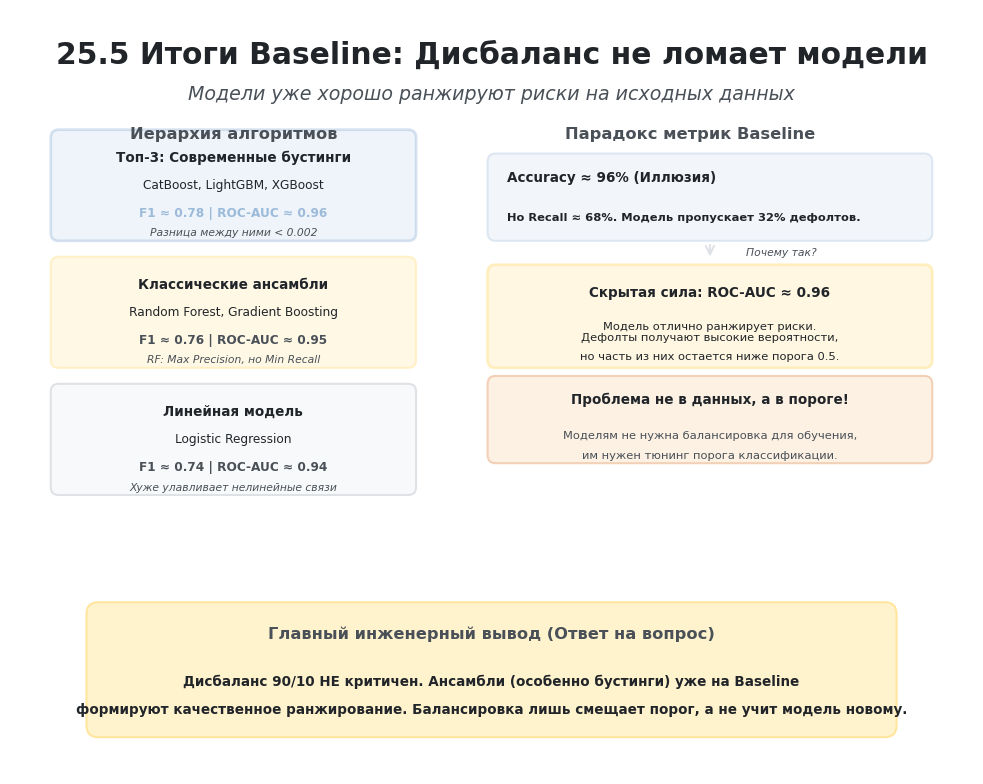

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.5, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "25.5 Итоги Baseline: Дисбаланс не ломает модели",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Модели уже хорошо ранжируют риски на исходных данных",
    ha="center", va="center",
    fontsize=14*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Иерархия алгоритмов (Новая)
# ==========================================
ax.text(2.75, 6.5, "Иерархия алгоритмов", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Карточка 1: Топ-3 (Бустинги) ---
ax.add_patch(FancyBboxPatch(
    (0.5, 5.2), 4.5, 1.3,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=2*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.4
))
ax.text(2.75, 6.2, "Топ-3: Современные бустинги", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(2.75, 5.85, "CatBoost, LightGBM, XGBoost", ha="center", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(2.75, 5.5, "F1 ≈ 0.78 | ROC-AUC ≈ 0.96", ha="center", va="center", fontsize=9*S, color=BLUE_BORDER, weight="bold")
ax.text(2.75, 5.25, "Разница между ними < 0.002", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# --- Карточка 2: Средний уровень (Ансамбли) ---
ax.add_patch(FancyBboxPatch(
    (0.5, 3.6), 4.5, 1.3,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER, alpha=0.5
))
ax.text(2.75, 4.6, "Классические ансамбли", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(2.75, 4.25, "Random Forest, Gradient Boosting", ha="center", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(2.75, 3.9, "F1 ≈ 0.76 | ROC-AUC ≈ 0.95", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, weight="bold")
ax.text(2.75, 3.65, "RF: Max Precision, но Min Recall", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# --- Карточка 3: Базовый уровень (Линейная) ---
ax.add_patch(FancyBboxPatch(
    (0.5, 2.0), 4.5, 1.3,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor=GRAY
))
ax.text(2.75, 3.0, "Линейная модель", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(2.75, 2.65, "Logistic Regression", ha="center", va="center", fontsize=9*S, color=TEXT_DARK)
ax.text(2.75, 2.3, "F1 ≈ 0.74 | ROC-AUC ≈ 0.94", ha="center", va="center", fontsize=9*S, color=TEXT_MUTED, weight="bold")
ax.text(2.75, 2.05, "Хуже улавливает нелинейные связи", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ==========================================
# ПРАВАЯ ЧАСТЬ: Парадокс метрик (Оставлена как была)
# ==========================================
ax.text(8.5, 6.5, "Парадокс метрик Baseline", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Блок 1: Иллюзия (Accuracy vs Recall) ---
ax.add_patch(FancyBboxPatch(
    (6.0, 5.2), 5.5, 1.0,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.3
))
ax.text(6.2, 5.95, "Accuracy ≈ 96% (Иллюзия)", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(6.2, 5.45, "Но Recall ≈ 68%. Модель пропускает 32% дефолтов.", ha="left", va="center", fontsize=8.5*S, color=TEXT_DARK, weight="bold")

# Стрелка вниз (Связь)
ax.annotate("", xy=(8.75, 4.9), xytext=(8.75, 5.15), arrowprops=dict(arrowstyle="->", color=GRAY_BORDER, lw=1.5*S))
ax.text(9.2, 5.0, "Почему так?", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# --- Блок 2: Реальность (ROC-AUC) ---
ax.add_patch(FancyBboxPatch(
    (6.0, 3.6), 5.5, 1.2,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=2*S, edgecolor=AMBER_BORDER, facecolor=AMBER, alpha=0.6
))
ax.text(8.75, 4.5, "Скрытая сила: ROC-AUC ≈ 0.96", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(8.75, 4.0, "Модель отлично ранжирует риски.\nДефолты получают высокие вероятности,", ha="center", va="center", fontsize=8.5*S, color=TEXT_DARK)
ax.text(8.75, 3.7, "но часть из них остается ниже порога 0.5.", ha="center", va="center", fontsize=8.5*S, color=TEXT_DARK)

# --- Блок 3: Вывод по порогу ---
ax.add_patch(FancyBboxPatch(
    (6.0, 2.4), 5.5, 1.0,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE, alpha=0.5
))
ax.text(8.75, 3.15, "Проблема не в данных, а в пороге!", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(8.75, 2.7, "Моделям не нужна балансировка для обучения,", ha="center", va="center", fontsize=8.5*S, color=TEXT_MUTED)
ax.text(8.75, 2.45, "им нужен тюнинг порога классификации.", ha="center", va="center", fontsize=8.5*S, color=TEXT_MUTED)


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -1.0), 10.0, 1.5,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.2, "Главный инженерный вывод (Ответ на вопрос)",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.4, "Дисбаланс 90/10 НЕ критичен. Ансамбли (особенно бустинги) уже на Baseline",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)
ax.text(
    6.0, -0.75, "формируют качественное ранжирование. Балансировка лишь смещает порог, а не учит модель новому.",
    ha="center", va="center",
    fontsize=10*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

### 25.6 Оценка изменений после балансировки относительно Baseline

После анализа моделей на исходных данных необходимо определить, что именно изменилось после применения каждого метода балансировки.

Для этого каждый результат сравнивается не с другими алгоритмами, а с соответствующим Baseline той же модели.

Например:

- результат SMOTE для CatBoost сравнивается с Baseline CatBoost;
- результат RandomUnderSampler для XGBoost сравнивается с Baseline XGBoost;
- результат Tomek Links для Logistic Regression сравнивается с Baseline Logistic Regression.

Такой подход позволяет исключить влияние исходных различий между алгоритмами и оценить только эффект конкретного метода балансировки.

#### Расчёт изменений

Для каждой метрики рассчитывается разница:

> **Изменение метрики (Δ) = значение после балансировки − значение Baseline**

Полученный результат интерпретируется следующим образом:

- **Δ > 0** — значение метрики увеличилось;
- **Δ < 0** — значение метрики снизилось;
- **Δ ≈ 0** — результат практически не изменился.

Строки Baseline в таблицу изменений не включаются, поскольку разница Baseline относительно самого себя всегда равна нулю.

#### Какие показатели сравниваются

Изменения рассчитываются для следующих метрик:

- Accuracy;
- Precision;
- Recall;
- F1-score;
- ROC-AUC;
- Gini.

Каждая из них отражает отдельную сторону поведения модели, поэтому оценивать результаты необходимо совместно.

Например, увеличение Recall означает, что модель начала обнаруживать больше фактических дефолтов. Однако это ещё не доказывает общее улучшение качества.

Если одновременно значительно снижаются Precision и F1-score, повышение Recall достигается ценой роста ложных положительных прогнозов: модель чаще относит к дефолтным не только проблемных, но и надёжных клиентов.

Особое внимание необходимо уделить следующим показателям:

- **Precision и Recall** показывают, как изменился баланс между ложными предупреждениями и пропущенными дефолтами;
- **F1-score** отражает общий баланс между Precision и Recall;
- **ROC-AUC и Gini** показывают, улучшилась ли способность модели разделять и ранжировать классы;
- **Accuracy** используется как дополнительный показатель общей доли правильных прогнозов.

#### Цель сравнения

Таблица изменений должна показать, приводит ли балансировка к устойчивому повышению качества или преимущественно изменяет характер прогнозов модели.

В дальнейшем необходимо проверить:

1. Насколько сильно методы балансировки повышают Recall.
2. Какой ценой достигается этот рост.
3. Сохраняется ли высокая Precision.
4. Улучшается ли F1-score.
5. Повышаются ли ROC-AUC и Gini.
6. Повторяется ли одна и та же закономерность для разных алгоритмов.

Такое сравнение непосредственно связано с главным вопросом исследования.

Если балансировка устойчиво улучшает F1-score, ROC-AUC и Gini для большинства моделей, исходный дисбаланс можно считать существенной проблемой.

Если же преимущественно растёт Recall, а Precision и F1-score снижаются и качество ранжирования практически не меняется, это будет означать, что балансировка не делает модели принципиально лучше, а только смещает их в сторону более частого прогнозирования дефолта.

In [ ]:
# @title
# ==========================================================
# Расчёт изменений метрик относительно Baseline
# ==========================================================

import numpy as np
import pandas as pd

from IPython.display import display
from matplotlib.colors import (
    LinearSegmentedColormap,
    TwoSlopeNorm,
    to_hex
)


# ----------------------------------------------------------
# Метрики, используемые для сравнения
# ----------------------------------------------------------

delta_metrics = [
    "Accuracy",
    "Precision",
    "Recall",
    "F1",
    "ROC-AUC",
    "Gini"
]


# ----------------------------------------------------------
# Контрольные проверки исходных таблиц
# ----------------------------------------------------------

required_all_results_columns = [
    "Model",
    "Balancing",
    *delta_metrics
]

missing_all_results_columns = [
    column
    for column in required_all_results_columns
    if column not in all_models_results_table.columns
]

if missing_all_results_columns:
    raise KeyError(
        "В общей таблице отсутствуют необходимые столбцы: "
        f"{missing_all_results_columns}"
    )


required_baseline_columns = [
    "Model",
    *delta_metrics
]

missing_baseline_columns = [
    column
    for column in required_baseline_columns
    if column not in baseline_results_table.columns
]

if missing_baseline_columns:
    raise KeyError(
        "В таблице Baseline отсутствуют необходимые столбцы: "
        f"{missing_baseline_columns}"
    )


if baseline_results_table["Model"].nunique() != 6:
    raise ValueError(
        "Таблица Baseline должна содержать результаты "
        "шести уникальных моделей."
    )


# ----------------------------------------------------------
# Формирование таблицы Baseline для объединения
# ----------------------------------------------------------

# К названиям метрик Baseline добавляется отдельный префикс,
# чтобы после объединения исходное и сбалансированное
# значения можно было однозначно различать.

baseline_reference_columns = {
    metric: f"Baseline {metric}"
    for metric in delta_metrics
}

baseline_reference_table = (
    baseline_results_table[
        [
            "Model",
            *delta_metrics
        ]
    ]
    .rename(
        columns=baseline_reference_columns
    )
    .copy()
)


# ----------------------------------------------------------
# Исключение строк Baseline
# ----------------------------------------------------------

balanced_results_table = (
    all_models_results_table
    .loc[
        all_models_results_table["Balancing"] != "Baseline"
    ]
    .copy()
    .reset_index(drop=True)
)


# ----------------------------------------------------------
# Добавление соответствующего Baseline каждой модели
# ----------------------------------------------------------

delta_results_full = balanced_results_table.merge(
    baseline_reference_table,
    on="Model",
    how="left",
    validate="many_to_one"
)


# ----------------------------------------------------------
# Расчёт изменений метрик
# ----------------------------------------------------------

for metric in delta_metrics:

    delta_results_full[f"Δ {metric}"] = (
        delta_results_full[metric]
        - delta_results_full[f"Baseline {metric}"]
    )


# Итоговая таблица содержит только идентификаторы
# эксперимента и рассчитанные изменения.

delta_results_table = delta_results_full[
    [
        "Model",
        "Balancing",
        "Δ Accuracy",
        "Δ Precision",
        "Δ Recall",
        "Δ F1",
        "Δ ROC-AUC",
        "Δ Gini"
    ]
].copy()


# ----------------------------------------------------------
# Контрольные проверки итоговой таблицы
# ----------------------------------------------------------

expected_models = 6
expected_balancing_methods = 7
expected_delta_rows = (
    expected_models
    * expected_balancing_methods
)


if len(delta_results_table) != expected_delta_rows:
    raise ValueError(
        "В таблице изменений должно быть "
        f"{expected_delta_rows} строк, "
        f"но получено: {len(delta_results_table)}."
    )


if delta_results_table["Model"].nunique() != expected_models:
    raise ValueError(
        "В таблице изменений представлены "
        "не все шесть моделей."
    )


if (
    delta_results_table["Balancing"].nunique()
    != expected_balancing_methods
):
    raise ValueError(
        "В таблице изменений должно быть "
        "семь методов балансировки."
    )


experiments_per_model = (
    delta_results_table
    .groupby("Model", sort=False)
    .size()
)


if not (experiments_per_model == expected_balancing_methods).all():
    raise ValueError(
        "Для каждой модели должно быть рассчитано "
        "семь вариантов изменений."
    )


duplicate_mask = delta_results_table.duplicated(
    subset=[
        "Model",
        "Balancing"
    ],
    keep=False
)

if duplicate_mask.any():
    raise ValueError(
        "В таблице изменений обнаружены "
        "повторяющиеся эксперименты."
    )


if delta_results_table.isna().any().any():
    raise ValueError(
        "В таблице изменений обнаружены "
        "пропущенные значения."
    )


# ----------------------------------------------------------
# Подготовка таблицы для отображения
# ----------------------------------------------------------

delta_results_display = (
    delta_results_table
    .rename(
        columns={
            "Model": "Модель",
            "Balancing": "Метод балансировки",
            "Δ F1": "Δ F1-score"
        }
    )
    .copy()
)


delta_columns = [
    "Δ Accuracy",
    "Δ Precision",
    "Δ Recall",
    "Δ F1-score",
    "Δ ROC-AUC",
    "Δ Gini"
]


# ----------------------------------------------------------
# Цветовая шкала изменений (ЗЕЛЁНЫЙ СДЕЛАН МЯГЧЕ)
# ----------------------------------------------------------
#
# Насыщенный красный  — сильное ухудшение.
# Светло-розовый      — небольшое ухудшение.
# Чистый белый        — отсутствие изменения.
# Светло-зелёный      — небольшое улучшение.
# Мягкий тёмно-зелёный — сильное улучшение.

delta_cmap = LinearSegmentedColormap.from_list(
    "delta_changes",
    [
        "#B71C1C",  # сильное ухудшение (насыщенный тёмно-красный)
        "#F44336",  # заметное ухудшение (красный)
        "#FFCDD2",  # небольшое ухудшение (светло-розовый)
        "#FFFFFF",  # отсутствие изменения (чистый белый)
        "#C8E6C9",  # небольшое улучшение (светло-зелёный)
        "#66BB6A",  # заметное улучшение (приглушённый зелёный)
        "#388E3C"   # сильное улучшение (мягкий тёмно-зелёный, не режет глаз)
    ]
)


def style_delta_column(series):
    """
    Окрашивает изменения одной метрики.

    Цветовая шкала симметрична относительно нуля:
    отрицательные значения — красные,
    положительные — зелёные.
    """

    numeric_series = pd.to_numeric(
        series,
        errors="coerce"
    )

    valid_values = numeric_series.dropna()

    if valid_values.empty:
        return [""] * len(series)

    maximum_absolute_change = max(
        abs(valid_values.min()),
        abs(valid_values.max())
    )

    if maximum_absolute_change == 0:
        return [
            (
                "background-color: #FFFFFF; "
                "color: #202428;"
            )
            if pd.notna(value)
            else ""
            for value in numeric_series
        ]

    normalization = TwoSlopeNorm(
        vmin=-maximum_absolute_change,
        vcenter=0,
        vmax=maximum_absolute_change
    )

    styles = []

    for value in numeric_series:

        if pd.isna(value):
            styles.append("")
            continue

        background_color = to_hex(
            delta_cmap(
                normalization(value)
            )
        )

        relative_intensity = (
            abs(value) / maximum_absolute_change
        )

        # На тёмных (сильных) участках используется белый текст,
        # на светлых — тёмный. Жирным выделяем значимые изменения.
        text_color = (
            "#FFFFFF"
            if relative_intensity >= 0.58
            else "#202428"
        )

        font_weight = (
            "bold"
            if relative_intensity >= 0.35
            else "normal"
        )

        styles.append(
            f"background-color: {background_color}; "
            f"color: {text_color}; "
            f"font-weight: {font_weight};"
        )

    return styles


# ----------------------------------------------------------
# Цветное оформление таблицы
# ----------------------------------------------------------

delta_results_styled = (
    delta_results_display
    .style

    # Каждый столбец изменений окрашивается отдельно,
    # но во всех случаях центр шкалы соответствует нулю.
    .apply(
        style_delta_column,
        subset=delta_columns,
        axis=0
    )

    # Знак выводится явно:
    # + означает рост,
    # - означает снижение.
    .format(
        {
            column: "{:+.4f}"
            for column in delta_columns
        }
    )

    .hide(axis="index")

    .set_caption(
        "Изменение метрик после балансировки "
        "относительно Baseline каждой модели"
    )

    .set_table_styles(
        [
            {
                "selector": "caption",
                "props": [
                    ("font-size", "16px"),
                    ("font-weight", "bold"),
                    ("text-align", "left"),
                    ("padding", "10px 0 12px 0"),
                    ("color", "#2C3135")
                ]
            },
            {
                "selector": "th",
                "props": [
                    ("background-color", "#E8EBEE"),
                    ("font-weight", "bold"),
                    ("text-align", "center"),
                    ("border", "1px solid #BCC4CB"),
                    ("padding", "8px"),
                    ("color", "#252A2E")
                ]
            },
            {
                "selector": "td",
                "props": [
                    ("text-align", "center"),
                    ("border", "1px solid #D1D6DA"),
                    ("padding", "7px"),
                    ("color", "#202428")
                ]
            },
            {
                "selector": "td:nth-child(1)",
                "props": [
                    ("text-align", "left"),
                    ("font-weight", "bold"),
                    ("background-color", "#F1F3F4")
                ]
            },
            {
                "selector": "td:nth-child(2)",
                "props": [
                    ("text-align", "left"),
                    ("background-color", "#F8F8F8")
                ]
            }
        ]
    )
)


# ----------------------------------------------------------
# Вывод таблицы
# ----------------------------------------------------------

display(delta_results_styled)


print(
    "Таблица изменений успешно сформирована: "
    f"{len(delta_results_table)} эксперимента."
)

print(
    "Для каждой из шести моделей рассчитано "
    "по семь вариантов балансировки."
)

print(
    "Положительные изменения обозначены знаком '+', "
    "отрицательные — знаком '-'."
)

print(
    "Таблица сохранена в переменной "
    "delta_results_table."
)

Модель,Метод балансировки,Δ Accuracy,Δ Precision,Δ Recall,Δ F1-score,Δ ROC-AUC,Δ Gini
Logistic Regression,RandomOverSampler,-0.0512,-0.3790,+0.2029,-0.1105,+0.0010,+0.0019
Logistic Regression,SMOTE,-0.0510,-0.3783,+0.2029,-0.1100,+0.0001,+0.0002
Logistic Regression,ADASYN,-0.1261,-0.5343,+0.2630,-0.2371,-0.0006,-0.0012
Logistic Regression,RandomUnderSampler,-0.0515,-0.3799,+0.2045,-0.1107,+0.0010,+0.0019
Logistic Regression,NearMiss,-0.4738,-0.7425,+0.2590,-0.4948,-0.1293,-0.2586
Logistic Regression,Tomek Links,-0.0002,-0.0126,+0.0091,+0.0015,+0.0000,+0.0000
Logistic Regression,Edited Nearest Neighbours,-0.0045,-0.1023,+0.0645,-0.0014,+0.0002,+0.0004
Random Forest,RandomOverSampler,-0.0006,-0.0369,+0.0227,+0.0034,+0.0038,+0.0076
Random Forest,SMOTE,-0.0013,-0.0758,+0.0520,+0.0081,+0.0026,+0.0053
Random Forest,ADASYN,-0.0040,-0.1183,+0.0673,+0.0003,+0.0025,+0.0050


Таблица изменений успешно сформирована: 42 эксперимента.
Для каждой из шести моделей рассчитано по семь вариантов балансировки.
Положительные изменения обозначены знаком '+', отрицательные — знаком '-'.
Таблица сохранена в переменной delta_results_table.


### 25.7 Визуализация влияния балансировки с помощью тепловой карты

Таблица изменений содержит 42 эксперимента:

- 6 моделей;
- 7 методов балансировки для каждой модели.

Она позволяет увидеть точные числовые значения, однако при таком объёме данных сложно быстро определить, какие закономерности повторяются для разных алгоритмов.

Поэтому следующим шагом результаты будут представлены в виде тепловой карты изменений относительно Baseline.

#### Структура тепловой карты

На тепловой карте:

- каждая строка соответствует сочетанию модели и метода балансировки;
- столбцы соответствуют изменениям Accuracy, Precision, Recall, F1-score, ROC-AUC и Gini;
- в каждой ячейке отображается фактическое изменение метрики относительно Baseline той же модели.

Например, значение `+0.0500` в столбце Recall означает, что после применения соответствующего метода Recall увеличился на 0.05 по сравнению с исходным вариантом этой же модели.

Значение `−0.0300` в столбце Precision означает снижение Precision на 0.03.

#### Цветовая интерпретация

Цветовая шкала будет центрирована относительно нуля:

- зелёные оттенки обозначают улучшение метрики;
- светлый нейтральный цвет соответствует отсутствию заметного изменения;
- красные оттенки обозначают ухудшение результата.

Ноль является принципиально важной точкой сравнения, поскольку он соответствует результату Baseline.

Следовательно, тепловая карта показывает не абсолютное качество модели, а направление и величину изменений после балансировки.

#### Что необходимо увидеть

Главная задача визуализации — определить, существует ли устойчивый эффект балансировки, повторяющийся для разных моделей.

Особое внимание будет уделено следующим вопросам:

1. Какие методы стабильно повышают Recall?
2. Сопровождается ли рост Recall снижением Precision?
3. Улучшается ли F1-score или изменение приводит только к перераспределению ошибок?
4. Повышаются ли ROC-AUC и Gini?
5. Сохраняется ли эффект для разных алгоритмов?
6. Есть ли методы, которые дают улучшение сразу по нескольким ключевым метрикам?
7. Какие способы балансировки приводят к систематическому ухудшению результатов?

#### Логика интерпретации

Рост одной отдельной метрики не будет автоматически считаться улучшением модели.

Например, увеличение Recall означает, что модель обнаруживает больше фактических дефолтов. Однако если одновременно значительно снижаются Precision и F1-score, такой результат достигается за счёт большого количества ложных положительных прогнозов.

Особенно важными являются изменения ROC-AUC и Gini.

Если Recall увеличивается, но ROC-AUC и Gini практически не меняются или снижаются, это может означать, что балансировка не улучшила способность модели разделять классы, а преимущественно изменила её поведение при стандартном пороге классификации.

Таким образом, тепловая карта должна помочь отделить:

- реальное повышение качества модели;
- изменение компромисса между Precision и Recall;
- простое увеличение количества прогнозируемых дефолтов.

Этот этап является центральным для ответа на главный вопрос исследования:

> **Даёт ли изменение исходного распределения классов устойчивое улучшение моделей или дисбаланс примерно 90/10 не требует обязательной балансировки?**

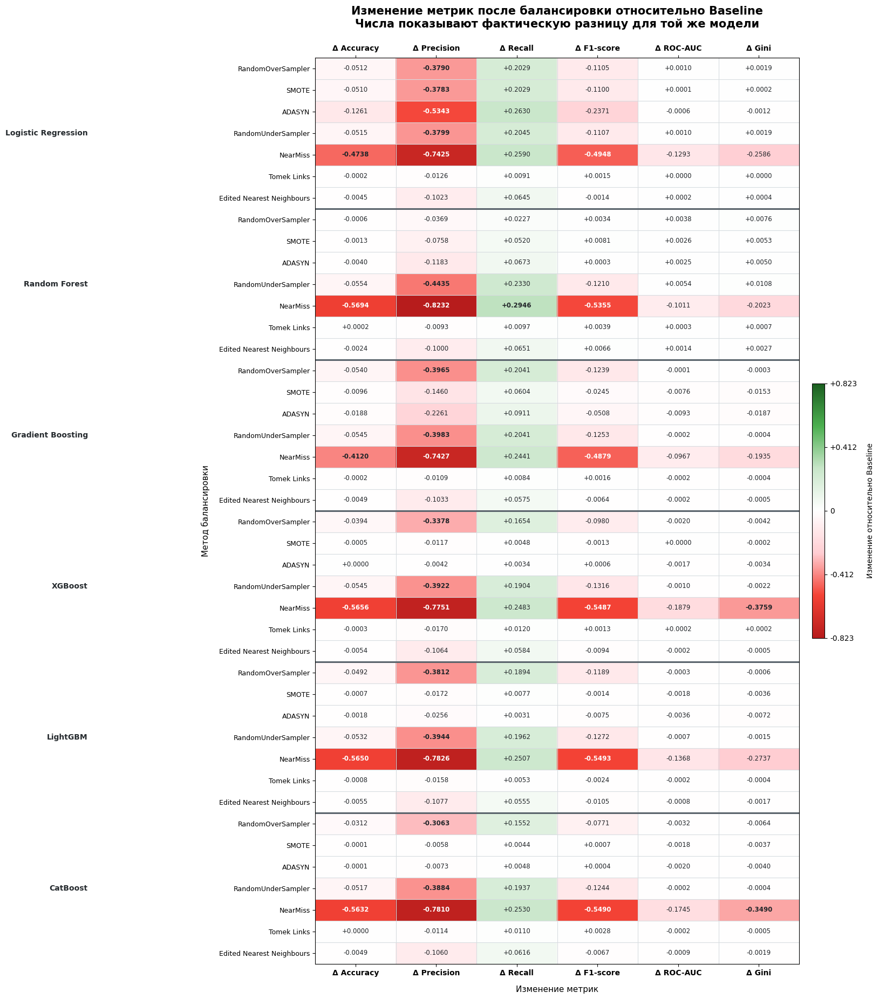

Тепловая карта изменений успешно построена.
Количество моделей: 6
Количество методов балансировки: 7
Количество сравнений: 42
Числа в ячейках — фактические изменения относительно Baseline той же модели.
Красный цвет означает ухудшение, зелёный — улучшение.


In [ ]:
# @title
# ==========================================================
# Тепловая карта изменений относительно Baseline
# ==========================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from matplotlib.colors import (
    LinearSegmentedColormap,
    TwoSlopeNorm
)


# ----------------------------------------------------------
# Контрольная проверка таблицы изменений
# ----------------------------------------------------------

required_delta_columns = [
    "Model",
    "Balancing",
    "Δ Accuracy",
    "Δ Precision",
    "Δ Recall",
    "Δ F1",
    "Δ ROC-AUC",
    "Δ Gini"
]

missing_columns = [
    column
    for column in required_delta_columns
    if column not in delta_results_table.columns
]

if missing_columns:
    raise KeyError(
        "В таблице изменений отсутствуют необходимые столбцы: "
        f"{missing_columns}"
    )

if len(delta_results_table) != 42:
    raise ValueError(
        "Для построения тепловой карты ожидалось "
        "42 эксперимента, "
        f"но найдено: {len(delta_results_table)}."
    )

if delta_results_table[required_delta_columns].isna().any().any():
    raise ValueError(
        "В данных для тепловой карты "
        "обнаружены пропущенные значения."
    )


# ----------------------------------------------------------
# Фиксированный порядок моделей и методов
# ----------------------------------------------------------

heatmap_model_order = [
    "Logistic Regression",
    "Random Forest",
    "Gradient Boosting",
    "XGBoost",
    "LightGBM",
    "CatBoost"
]

heatmap_balancing_order = [
    "RandomOverSampler",
    "SMOTE",
    "ADASYN",
    "RandomUnderSampler",
    "NearMiss",
    "Tomek Links",
    "Edited Nearest Neighbours"
]


# Создаём независимую копию,
# чтобы не изменять исходную таблицу.

delta_heatmap_table = delta_results_table.copy()


# Задаём категориальный порядок строк.

delta_heatmap_table["Model"] = pd.Categorical(
    delta_heatmap_table["Model"],
    categories=heatmap_model_order,
    ordered=True
)

delta_heatmap_table["Balancing"] = pd.Categorical(
    delta_heatmap_table["Balancing"],
    categories=heatmap_balancing_order,
    ordered=True
)


delta_heatmap_table = (
    delta_heatmap_table
    .sort_values(
        by=[
            "Model",
            "Balancing"
        ]
    )
    .reset_index(drop=True)
)


# ----------------------------------------------------------
# Подготовка значений
# ----------------------------------------------------------

delta_metric_columns = [
    "Δ Accuracy",
    "Δ Precision",
    "Δ Recall",
    "Δ F1",
    "Δ ROC-AUC",
    "Δ Gini"
]


delta_heatmap_values = (
    delta_heatmap_table[
        delta_metric_columns
    ]
    .to_numpy(dtype=float)
)


# Находим максимальное абсолютное изменение
# среди всех метрик и экспериментов.
#
# Одинаковая граница используется для положительных
# и отрицательных значений, поэтому ноль расположен
# строго в центре цветовой шкалы.

maximum_absolute_change = float(
    np.max(
        np.abs(delta_heatmap_values)
    )
)

if maximum_absolute_change == 0:
    raise ValueError(
        "Все изменения метрик равны нулю. "
        "Тепловая карта не может быть построена."
    )


# ----------------------------------------------------------
# Цветовая палитра (ОБНОВЛЕНА ДЛЯ МАКСИМАЛЬНОЙ ИНФОРМАТИВНОСТИ)
# ----------------------------------------------------------
#
# Насыщенный красный  — сильное ухудшение.
# Светло-розовый      — небольшое ухудшение.
# Чистый белый        — отсутствие изменения.
# Светло-зелёный      — небольшое улучшение.
# Насыщенный зелёный  — сильное улучшение.

delta_heatmap_cmap = LinearSegmentedColormap.from_list(
    "delta_heatmap_colors",
    [
        "#B71C1C",  # сильное ухудшение (насыщенный тёмно-красный)
        "#F44336",  # заметное ухудшение (красный)
        "#FFCDD2",  # небольшое ухудшение (светло-розовый)
        "#FFFFFF",  # отсутствие изменения (чистый белый)
        "#C8E6C9",  # небольшое улучшение (светло-зелёный)
        "#4CAF50",  # заметное улучшение (зелёный)
        "#1B5E20"   # сильное улучшение (насыщенный тёмно-зелёный)
    ]
)


# Симметричная нормализация относительно нуля.

delta_heatmap_norm = TwoSlopeNorm(
    vmin=-maximum_absolute_change,
    vcenter=0,
    vmax=maximum_absolute_change
)


# ----------------------------------------------------------
# Построение тепловой карты
# ----------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(16, 20)
)


heatmap_image = ax.imshow(
    delta_heatmap_values,
    cmap=delta_heatmap_cmap,
    norm=delta_heatmap_norm,
    aspect="auto",
    interpolation="nearest"
)


# ----------------------------------------------------------
# Числовые подписи внутри ячеек
# ----------------------------------------------------------
#
# Отображаются фактические изменения,
# а не нормализованные значения.

for row_position in range(
    delta_heatmap_values.shape[0]
):

    for column_position in range(
        delta_heatmap_values.shape[1]
    ):

        value = delta_heatmap_values[
            row_position,
            column_position
        ]

        relative_intensity = (
            abs(value)
            / maximum_absolute_change
        )

        # На тёмных (сильных) участках используется белый текст,
        # на светлых — тёмный.
        text_color = (
            "#FFFFFF"
            if relative_intensity >= 0.58
            else "#202428"
        )

        font_weight = (
            "bold"
            if relative_intensity >= 0.35
            else "normal"
        )

        ax.text(
            column_position,
            row_position,
            f"{value:+.4f}",
            ha="center",
            va="center",
            fontsize=8.5,
            color=text_color,
            fontweight=font_weight
        )


# ----------------------------------------------------------
# Подписи столбцов
# ----------------------------------------------------------

display_metric_names = [
    "Δ Accuracy",
    "Δ Precision",
    "Δ Recall",
    "Δ F1-score",
    "Δ ROC-AUC",
    "Δ Gini"
]

ax.set_xticks(
    np.arange(
        len(display_metric_names)
    )
)

ax.set_xticklabels(
    display_metric_names,
    rotation=0,
    ha="center",
    fontsize=10,
    fontweight="bold"
)

# ----------------------------------------------------------
# Вывод названий метрик сверху
# ----------------------------------------------------------
ax.tick_params(
    axis="x",
    which="major",
    top=True,
    bottom=True,
    labeltop=True,
    labelbottom=True
)


# ----------------------------------------------------------
# Подписи методов балансировки
# ----------------------------------------------------------
#
# В каждой группе повторяются семь методов,
# а название модели выводится отдельно слева.

method_labels = (
    delta_heatmap_table[
        "Balancing"
    ]
    .astype(str)
    .tolist()
)

ax.set_yticks(
    np.arange(
        len(method_labels)
    )
)

ax.set_yticklabels(
    method_labels,
    rotation=0,
    fontsize=9
)


# ----------------------------------------------------------
# Разделение строк по моделям
# ----------------------------------------------------------

rows_per_model = len(
    heatmap_balancing_order
)

for model_position, model_name in enumerate(
    heatmap_model_order
):

    group_start = (
        model_position
        * rows_per_model
    )

    group_end = (
        group_start
        + rows_per_model
        - 1
    )

    group_center = (
        group_start
        + group_end
    ) / 2

    # Название модели слева от группы методов.
    ax.text(
        -0.47,
        group_center,
        model_name,
        transform=ax.get_yaxis_transform(),
        ha="right",
        va="center",
        fontsize=10,
        fontweight="bold",
        color="#252A2E",
        clip_on=False
    )

    # Горизонтальная линия между моделями.
    if model_position > 0:
        ax.axhline(
            y=group_start - 0.5,
            color="#59636B",
            linewidth=2.2
        )


# ----------------------------------------------------------
# Сетка между отдельными ячейками
# ----------------------------------------------------------

ax.set_xticks(
    np.arange(
        -0.5,
        len(display_metric_names),
        1
    ),
    minor=True
)

ax.set_yticks(
    np.arange(
        -0.5,
        len(method_labels),
        1
    ),
    minor=True
)

ax.grid(
    which="minor",
    color="#D7DCE0",
    linestyle="-",
    linewidth=0.8
)

ax.tick_params(
    which="minor",
    top=False,
    bottom=False,
    left=False,
    right=False
)


# ----------------------------------------------------------
# Заголовки
# ----------------------------------------------------------

ax.set_title(
    "Изменение метрик после балансировки относительно Baseline\n"
    "Числа показывают фактическую разницу для той же модели",
    fontsize=15,
    fontweight="bold",
    pad=40
)

ax.set_xlabel(
    "Изменение метрик",
    fontsize=11,
    labelpad=12
)

ax.set_ylabel(
    "Метод балансировки",
    fontsize=11,
    labelpad=12
)


# ----------------------------------------------------------
# Цветовая шкала
# ----------------------------------------------------------

colorbar = fig.colorbar(
    heatmap_image,
    ax=ax,
    fraction=0.025,
    pad=0.025
)

colorbar.set_label(
    "Изменение относительно Baseline",
    fontsize=10,
    labelpad=12
)

colorbar_ticks = [
    -maximum_absolute_change,
    -maximum_absolute_change / 2,
    0,
    maximum_absolute_change / 2,
    maximum_absolute_change
]

colorbar.set_ticks(
    colorbar_ticks
)

colorbar.set_ticklabels(
    [
        f"{colorbar_ticks[0]:+.3f}",
        f"{colorbar_ticks[1]:+.3f}",
        "0",
        f"{colorbar_ticks[3]:+.3f}",
        f"{colorbar_ticks[4]:+.3f}"
    ]
)


# ----------------------------------------------------------
# Финальное оформление
# ----------------------------------------------------------

plt.subplots_adjust(
    left=0.35,
    right=0.94,
    top=0.90,
    bottom=0.06
)

plt.show()


# ----------------------------------------------------------
# Контрольный вывод
# ----------------------------------------------------------

print(
    "Тепловая карта изменений успешно построена."
)

print(
    "Количество моделей:",
    len(heatmap_model_order)
)

print(
    "Количество методов балансировки:",
    len(heatmap_balancing_order)
)

print(
    "Количество сравнений:",
    len(delta_heatmap_table)
)

print(
    "Числа в ячейках — фактические изменения "
    "относительно Baseline той же модели."
)

print(
    "Красный цвет означает ухудшение, "
    "зелёный — улучшение."
)

### 25.8 Анализ влияния методов балансировки

Тепловая карта позволяет увидеть не только результаты отдельных экспериментов, но и закономерности, которые повторяются для разных алгоритмов.

Главный результат визуализации заключается в том, что методы балансировки действительно меняют поведение моделей, однако это изменение далеко не всегда означает повышение общего качества.

#### Общая закономерность

Во всех 42 сравнениях после применения балансировки Recall увеличился.

Одновременно во всех 42 сравнениях Precision снизился.

Это наиболее устойчивый результат проведённых экспериментов:

- модели начали обнаруживать больше фактических дефолтов;
- одновременно увеличилось количество ложных положительных прогнозов;
- больше надёжных клиентов стало ошибочно относиться к группе риска.

Следовательно, балансировка систематически смещает модели в сторону более частого прогнозирования дефолта.

Однако рост Recall сам по себе не подтверждает улучшение модели. Для этого необходимо, чтобы повышение чувствительности сопровождалось приемлемым изменением Precision, F1-score, ROC-AUC и Gini.

#### Изменение F1-score

F1-score увеличился только в 12 из 42 экспериментов и снизился в 30 случаях.

Даже там, где наблюдался рост F1-score, улучшение чаще всего было небольшим.

Наибольший прирост был получен для Random Forest после применения SMOTE:

- F1-score увеличился на **0.0081**;
- Recall вырос на **0.0520**;
- Precision снизился на **0.0758**;
- ROC-AUC увеличился на **0.0026**;
- Gini увеличился на **0.0053**.

Этот результат можно считать реальным улучшением баланса между Precision и Recall для конкретной модели. Однако эффект не повторился с такой же выраженностью для остальных алгоритмов.

Второй по величине прирост F1-score был получен для Random Forest после Edited Nearest Neighbours — **0.0066**.

В большинстве остальных положительных случаев прирост F1-score не превышал нескольких тысячных. Такие изменения слишком малы, чтобы говорить об устойчивом преимуществе балансировки без дополнительной проверки на кросс-валидации.

Таким образом, улучшение F1-score оказалось не общим свойством балансировки, а отдельным эффектом для некоторых сочетаний модели и метода.

#### ROC-AUC и Gini

Изменения ROC-AUC и Gini в большинстве экспериментов были значительно меньше изменений Precision и Recall.

ROC-AUC:

- увеличился в 11 экспериментах;
- снизился в 29 экспериментах;
- практически не изменился в 2 случаях.

Gini:

- увеличился в 11 экспериментах;
- снизился в 30 экспериментах;
- не изменился в 1 случае.

При этом большинство изменений ROC-AUC и Gini находилось в пределах нескольких тысячных.

Это означает, что балансировка чаще всего не улучшала способность моделей ранжировать объекты по уровню кредитного риска.

Модели уже на исходных данных достаточно хорошо располагали дефолтные объекты выше недефолтных. Балансировка преимущественно меняла количество объектов, которым при стандартном пороге присваивался положительный класс.

Именно поэтому на тепловой карте часто наблюдается следующая комбинация:

- заметное увеличение Recall;
- заметное снижение Precision;
- слабое изменение ROC-AUC и Gini.

Такое сочетание указывает не на принципиальное улучшение разделения классов, а на изменение компромисса между ложными положительными и ложными отрицательными прогнозами.

---

#### RandomOverSampler

RandomOverSampler повысил Recall для всех моделей, но одновременно снизил Precision во всех случаях.

Для большинства алгоритмов это привело к снижению F1-score.

Особенно заметное ухудшение наблюдалось у Logistic Regression, Gradient Boosting, XGBoost и LightGBM.

Для Random Forest F1-score увеличился на **0.0034**, но данный прирост был небольшим.

ROC-AUC и Gini после RandomOverSampler изменялись незначительно. Следовательно, обычное дублирование объектов миноритарного класса в основном смещало границу принятия решения, но не давало устойчивого улучшения ранжирования.

---

#### SMOTE

SMOTE оказался менее агрессивным для современных моделей градиентного бустинга, чем RandomOverSampler.

Для Random Forest был получен максимальный прирост F1-score среди всех проведённых экспериментов — **0.0081**.

Для CatBoost F1-score увеличился только на **0.0007**, что практически не меняет итоговое качество.

Для XGBoost и LightGBM показатели остались близкими к Baseline, но небольшое увеличение Recall сопровождалось снижением Precision и отсутствием улучшения ROC-AUC и Gini.

Для Logistic Regression SMOTE привёл к значительному снижению Precision и F1-score.

Следовательно, SMOTE может быть полезен для отдельных алгоритмов, но его эффект сильно зависит от модели и не является устойчивым.

---

#### ADASYN

ADASYN также повышал Recall для всех моделей, но в большинстве случаев приводил к снижению остальных показателей.

Наиболее выраженное ухудшение наблюдалось у Logistic Regression и Gradient Boosting.

Для XGBoost и CatBoost изменения F1-score были положительными, но составили только **0.0006** и **0.0004** соответственно. Одновременно ROC-AUC и Gini снизились.

Это означает, что синтетическое создание большего количества объектов в сложных областях признакового пространства не обеспечило устойчивого улучшения способности моделей разделять классы.

---

#### RandomUnderSampler

RandomUnderSampler обеспечил значительное повышение Recall для всех алгоритмов — примерно на **0.19–0.23**.

Однако этот рост сопровождался:

- снижением Precision примерно на **0.38–0.44**;
- снижением F1-score примерно на **0.11–0.13**;
- уменьшением Accuracy примерно на **0.05**.

При этом ROC-AUC и Gini изменялись значительно слабее и для некоторых моделей даже немного увеличивались.

Такой результат особенно важен для интерпретации.

После удаления значительной части объектов основного класса модели стали намного чаще прогнозировать дефолт, но их способность ранжировать клиентов практически не улучшилась.

Следовательно, RandomUnderSampler не решил проблему распознавания классов, а преимущественно изменил рабочую точку классификатора ценой потери информации об основном классе.

---

#### NearMiss

NearMiss показал наиболее сильное и устойчивое ухудшение результатов.

Для всех шести моделей:

- Recall значительно увеличился;
- Precision резко снизился;
- Accuracy и F1-score критически ухудшились;
- ROC-AUC и Gini существенно снизились.

Снижение F1-score составило примерно от **0.49 до 0.55**.

Снижение ROC-AUC составило примерно от **0.10 до 0.19**, а Gini — примерно от **0.19 до 0.38**.

Высокий Recall в данном случае не является признаком качественной модели. Он достигается за счёт того, что алгоритм начинает относить к дефолтным слишком большое количество объектов.

NearMiss удаляет значительную часть объектов основного класса, сохраняя наблюдения, расположенные ближе к миноритарному классу. На рассматриваемых данных это приводит к сильному искажению структуры обучающей выборки.

Поэтому NearMiss является наиболее неудачным методом среди всех исследованных вариантов.

---

#### Tomek Links

Tomek Links показал наиболее стабильное и аккуратное поведение.

После его применения:

- Recall немного увеличился для всех моделей;
- Precision немного снизился;
- Accuracy, ROC-AUC и Gini практически не изменились;
- F1-score вырос у пяти из шести моделей.

Однако величина улучшения F1-score была небольшой:

- Logistic Regression — **+0.0015**;
- Random Forest — **+0.0039**;
- Gradient Boosting — **+0.0016**;
- XGBoost — **+0.0013**;
- CatBoost — **+0.0028**.

У LightGBM F1-score снизился на **0.0024**.

Tomek Links не изменяет распределение классов радикально, а удаляет лишь часть пограничных объектов. Поэтому он не разрушает структуру данных и обеспечивает наиболее мягкий компромисс между Precision и Recall.

Тем не менее полученные улучшения слишком малы, чтобы считать применение метода обязательным.

---

#### Edited Nearest Neighbours

Edited Nearest Neighbours стабильно увеличивал Recall примерно на **0.06**, но одновременно снижал Precision примерно на **0.10**.

F1-score увеличился только для Random Forest — на **0.0066**. Для остальных пяти моделей он снизился.

ROC-AUC и Gini практически не изменились.

Следовательно, Edited Nearest Neighbours действует более агрессивно, чем Tomek Links: модель обнаруживает больше дефолтов, но ценой заметного роста ложных положительных прогнозов.

---

### Сопоставление групп методов

Результаты позволяют выделить три основных типа поведения.

#### Агрессивное увеличение чувствительности

К этой группе относятся:

- RandomUnderSampler;
- NearMiss;
- RandomOverSampler для части моделей;
- ADASYN для части моделей.

Они существенно повышают Recall, но одновременно резко снижают Precision и F1-score.

#### Умеренное изменение баланса ошибок

К этой группе относятся:

- SMOTE;
- Edited Nearest Neighbours.

Они повышают Recall мягче, однако устойчивого улучшения F1-score, ROC-AUC и Gini не обеспечивают.

#### Минимальное вмешательство

К этой группе относится Tomek Links.

Он сохраняет результаты максимально близкими к Baseline и иногда даёт небольшой прирост F1-score, но преимущество остаётся незначительным.

---

### Промежуточный ответ на главный вопрос исследования

Тепловая карта не подтверждает, что исходный дисбаланс классов примерно 90/10 является критическим препятствием для рассматриваемых моделей.

Если бы дисбаланс серьёзно мешал обучению, после его коррекции ожидалось бы устойчивое улучшение:

- F1-score;
- ROC-AUC;
- Gini;
- баланса между Precision и Recall.

Фактически наблюдается другая картина:

1. Recall увеличился во всех экспериментах.
2. Precision снизился во всех экспериментах.
3. F1-score ухудшился в большинстве случаев.
4. ROC-AUC и Gini преимущественно не улучшились.
5. Агрессивные методы балансировки привели к существенному ухудшению качества.
6. Наиболее аккуратные методы дали только минимальные улучшения.

Следовательно, балансировка в основном изменяет характер ошибок модели, но не повышает устойчиво её способность различать дефолтные и недефолтные объекты.

Полученный результат указывает на то, что для рассматриваемого набора данных обязательная балансировка обучающей выборки не требуется.

Если бизнесу необходимо обнаруживать больше дефолтов, более обоснованным следующим шагом может быть настройка порога классификации с учётом стоимости ложных положительных и ложных отрицательных решений, а не автоматическое изменение распределения обучающих данных.

Окончательный вывод будет сформулирован после сравнения лучших вариантов каждой модели и оценки вычислительных затрат.

### 25.9 Сравнение Baseline с лучшим вариантом каждой модели

Тепловая карта показала общие закономерности влияния балансировки. Теперь необходимо определить, привёл ли хотя бы один из методов к практически заметному улучшению каждой отдельной модели.

Для этого среди восьми вариантов каждой модели выбирается результат с максимальным F1-score:

- Baseline;
- RandomOverSampler;
- SMOTE;
- ADASYN;
- RandomUnderSampler;
- NearMiss;
- Tomek Links;
- Edited Nearest Neighbours.

F1-score используется как основной критерий отбора, поскольку он одновременно учитывает Precision и Recall и позволяет оценить баланс между ложными положительными прогнозами и пропущенными дефолтами.

Если несколько вариантов имеют одинаковый F1-score, последовательно учитываются:

1. более высокий ROC-AUC;
2. более высокий Gini;
3. меньшее время обучения.

После выбора лучшего варианта его показатели сравниваются с Baseline той же модели.

В итоговой таблице будут представлены:

- F1-score исходной модели;
- название лучшего варианта;
- его F1-score;
- изменения Accuracy, Precision, Recall, F1-score, ROC-AUC и Gini относительно Baseline.

Такое сравнение позволяет ответить на два важных вопроса:

1. Смогла ли балансировка улучшить хотя бы одну модель?
2. Насколько велик полученный прирост и сопровождался ли он ухудшением других показателей?

Небольшое положительное изменение F1-score ещё не означает, что метод балансировки необходимо применять обязательно.

Прирост необходимо оценивать совместно с изменениями Precision, Recall, ROC-AUC и Gini. Кроме того, различия в несколько тысячных могут оказаться следствием конкретного разбиения данных и требуют дополнительной проверки на кросс-валидации.

Цель данного этапа — не выбрать окончательную промышленную модель, а определить, даёт ли балансировка достаточно выраженное и устойчивое преимущество над исходными несбалансированными данными.

### 25.9 Сравнение Baseline с лучшим вариантом каждой модели

Тепловая карта показала общие закономерности влияния балансировки. Теперь необходимо определить, привёл ли хотя бы один из методов к практически заметному улучшению каждой отдельной модели.

Для этого среди восьми вариантов каждой модели выбирается результат с максимальным F1-score:

- Baseline;
- RandomOverSampler;
- SMOTE;
- ADASYN;
- RandomUnderSampler;
- NearMiss;
- Tomek Links;
- Edited Nearest Neighbours.

F1-score используется как основной критерий отбора, поскольку он одновременно учитывает Precision и Recall и позволяет оценить баланс между ложными положительными прогнозами и пропущенными дефолтами.

Если несколько вариантов имеют одинаковый F1-score, последовательно учитываются:

1. более высокий ROC-AUC;
2. более высокий Gini;
3. меньшее время обучения.

После выбора лучшего варианта его показатели сравниваются с Baseline той же модели.

В итоговой таблице будут представлены:

- F1-score исходной модели;
- название лучшего варианта;
- его F1-score;
- изменения Accuracy, Precision, Recall, F1-score, ROC-AUC и Gini относительно Baseline.

Такое сравнение позволяет ответить на два важных вопроса:

1. Смогла ли балансировка улучшить хотя бы одну модель?
2. Насколько велик полученный прирост и сопровождался ли он ухудшением других показателей?

Небольшое положительное изменение F1-score ещё не означает, что метод балансировки необходимо применять обязательно.

Прирост необходимо оценивать совместно с изменениями Precision, Recall, ROC-AUC и Gini. Кроме того, различия в несколько тысячных могут оказаться следствием конкретного разбиения данных и требуют дополнительной проверки на кросс-валидации.

Цель данного этапа — не выбрать окончательную промышленную модель, а определить, даёт ли балансировка достаточно выраженное и устойчивое преимущество над исходными несбалансированными данными.

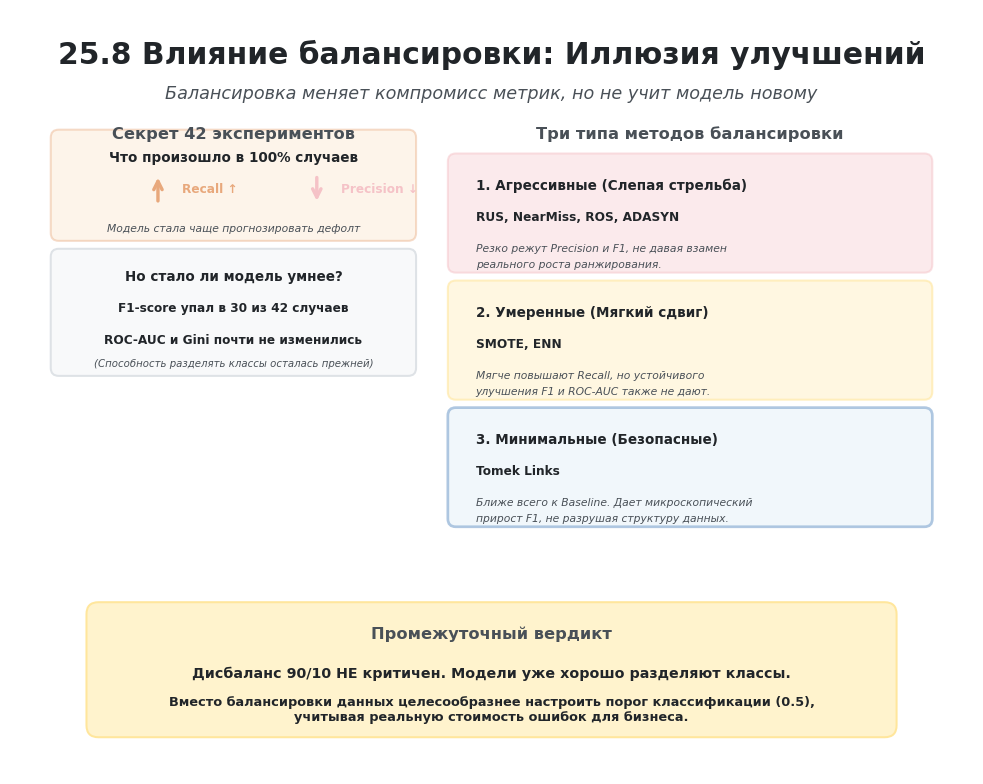

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.5, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "25.8 Влияние балансировки: Иллюзия улучшений",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Балансировка меняет компромисс метрик, но не учит модель новому",
    ha="center", va="center",
    fontsize=13*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Секрет 42 экспериментов
# ==========================================
ax.text(2.75, 6.5, "Секрет 42 экспериментов", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Блок 1: Универсальный компромисс ---
ax.add_patch(FancyBboxPatch(
    (0.5, 5.2), 4.5, 1.3,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=ORANGE_BORDER, facecolor=ORANGE, alpha=0.4
))
ax.text(2.75, 6.2, "Что произошло в 100% случаев", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

# Стрелка Recall (Вверх)
ax.annotate("", xy=(1.8, 6.0), xytext=(1.8, 5.6),
            arrowprops=dict(arrowstyle="->", color=ORANGE_BORDER, lw=2.5*S))
ax.text(2.1, 5.8, "Recall ↑", ha="left", va="center", fontsize=9*S, weight="bold", color=ORANGE_BORDER)

# Стрелка Precision (Вниз)
ax.annotate("", xy=(3.8, 5.6), xytext=(3.8, 6.0),
            arrowprops=dict(arrowstyle="->", color=RED_BORDER, lw=2.5*S))
ax.text(4.1, 5.8, "Precision ↓", ha="left", va="center", fontsize=9*S, weight="bold", color=RED_BORDER)

ax.text(2.75, 5.3, "Модель стала чаще прогнозировать дефолт", ha="center", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# --- Блок 2: Иллюзия качества (F1 и ROC-AUC) ---
ax.add_patch(FancyBboxPatch(
    (0.5, 3.5), 4.5, 1.5,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor=GRAY
))
ax.text(2.75, 4.7, "Но стала ли модель умнее?", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(2.75, 4.3, "F1-score упал в 30 из 42 случаев", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")
ax.text(2.75, 3.9, "ROC-AUC и Gini почти не изменились", ha="center", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")
ax.text(2.75, 3.6, "(Способность разделять классы осталась прежней)", ha="center", va="center", fontsize=7.5*S, color=TEXT_MUTED, style="italic")


# ==========================================
# ПРАВАЯ ЧАСТЬ: Классификация методов
# ==========================================
ax.text(8.5, 6.5, "Три типа методов балансировки", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Группа 1: Агрессивные (Красная) ---
ax.add_patch(FancyBboxPatch(
    (5.5, 4.8), 6.0, 1.4,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=RED_BORDER, facecolor=RED_FILL, alpha=0.5
))
ax.text(5.8, 5.85, "1. Агрессивные (Слепая стрельба)", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(5.8, 5.45, "RUS, NearMiss, ROS, ADASYN", ha="left", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")
ax.text(5.8, 5.05, "Резко режут Precision и F1, не давая взамен", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")
ax.text(5.8, 4.85, "реального роста ранжирования.", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# --- Группа 2: Умеренные (Желтая) ---
ax.add_patch(FancyBboxPatch(
    (5.5, 3.2), 6.0, 1.4,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER, alpha=0.6
))
ax.text(5.8, 4.25, "2. Умеренные (Мягкий сдвиг)", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(5.8, 3.85, "SMOTE, ENN", ha="left", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")
ax.text(5.8, 3.45, "Мягче повышают Recall, но устойчивого", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")
ax.text(5.8, 3.25, "улучшения F1 и ROC-AUC также не дают.", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")

# --- Группа 3: Минимальные (Голубая) ---
ax.add_patch(FancyBboxPatch(
    (5.5, 1.6), 6.0, 1.4,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=2*S, edgecolor=BLUE_BORDER, facecolor=LIGHT_BLUE, alpha=0.8
))
ax.text(5.8, 2.65, "3. Минимальные (Безопасные)", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(5.8, 2.25, "Tomek Links", ha="left", va="center", fontsize=9*S, color=TEXT_DARK, weight="bold")
ax.text(5.8, 1.85, "Ближе всего к Baseline. Дает микроскопический", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")
ax.text(5.8, 1.65, "прирост F1, не разрушая структуру данных.", ha="left", va="center", fontsize=8*S, color=TEXT_MUTED, style="italic")


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -1.0), 10.0, 1.5,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.2, "Промежуточный вердикт",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.3, "Дисбаланс 90/10 НЕ критичен. Модели уже хорошо разделяют классы.",
    ha="center", va="center",
    fontsize=10.5*S, color=TEXT_DARK, weight="bold"
)
ax.text(
    6.0, -0.75, "Вместо балансировки данных целесообразнее настроить порог классификации (0.5),\nучитывая реальную стоимость ошибок для бизнеса.",
    ha="center", va="center",
    fontsize=9.5*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

In [ ]:
# @title
# ==========================================================
# Сравнение Baseline с лучшим вариантом каждой модели
# ==========================================================

import pandas as pd

from IPython.display import display
from matplotlib.colors import (
    LinearSegmentedColormap,
    TwoSlopeNorm,
    to_hex
)


# ----------------------------------------------------------
# Контрольная проверка общей таблицы
# ----------------------------------------------------------

required_columns = [
    "Model",
    "Balancing",
    "Accuracy",
    "Precision",
    "Recall",
    "F1",
    "ROC-AUC",
    "Gini",
    "Fit Time"
]

missing_columns = [
    column
    for column in required_columns
    if column not in all_models_results_table.columns
]

if missing_columns:
    raise KeyError(
        "В общей таблице отсутствуют необходимые столбцы: "
        f"{missing_columns}"
    )

if len(all_models_results_table) != 48:
    raise ValueError(
        "Ожидалось 48 экспериментов, "
        f"но найдено: {len(all_models_results_table)}."
    )


# ----------------------------------------------------------
# Фиксированный порядок моделей
# ----------------------------------------------------------

comparison_model_order = [
    "Logistic Regression",
    "Random Forest",
    "Gradient Boosting",
    "XGBoost",
    "LightGBM",
    "CatBoost"
]


# ----------------------------------------------------------
# Выбор лучшего варианта каждой модели
# ----------------------------------------------------------

best_variant_rows = []

for model_name in comparison_model_order:

    model_results = (
        all_models_results_table
        .loc[
            all_models_results_table["Model"] == model_name
        ]
        .copy()
    )

    if len(model_results) != 8:
        raise ValueError(
            f"Для модели '{model_name}' ожидалось "
            f"8 экспериментов, но найдено: "
            f"{len(model_results)}."
        )

    baseline_rows = model_results.loc[
        model_results["Balancing"] == "Baseline"
    ]

    if len(baseline_rows) != 1:
        raise ValueError(
            f"Для модели '{model_name}' должна существовать "
            "ровно одна строка Baseline."
        )

    baseline_row = baseline_rows.iloc[0]

    # Основной критерий — максимальный F1-score.
    #
    # При равенстве F1 последовательно учитываются:
    # 1. ROC-AUC;
    # 2. Gini;
    # 3. меньшее время обучения.
    ranked_results = model_results.sort_values(
        by=[
            "F1",
            "ROC-AUC",
            "Gini",
            "Fit Time"
        ],
        ascending=[
            False,
            False,
            False,
            True
        ],
        kind="mergesort"
    )

    best_row = ranked_results.iloc[0]

    best_variant_rows.append(
        {
            "Model": model_name,
            "Baseline F1": baseline_row["F1"],
            "Best Balancing": best_row["Balancing"],
            "Best F1": best_row["F1"],
            "Δ Accuracy": (
                best_row["Accuracy"]
                - baseline_row["Accuracy"]
            ),
            "Δ Precision": (
                best_row["Precision"]
                - baseline_row["Precision"]
            ),
            "Δ Recall": (
                best_row["Recall"]
                - baseline_row["Recall"]
            ),
            "Δ F1": (
                best_row["F1"]
                - baseline_row["F1"]
            ),
            "Δ ROC-AUC": (
                best_row["ROC-AUC"]
                - baseline_row["ROC-AUC"]
            ),
            "Δ Gini": (
                best_row["Gini"]
                - baseline_row["Gini"]
            )
        }
    )


best_variants_comparison_table = pd.DataFrame(
    best_variant_rows
)


# ----------------------------------------------------------
# Контрольные проверки итоговой таблицы
# ----------------------------------------------------------

if len(best_variants_comparison_table) != 6:
    raise ValueError(
        "Итоговая таблица должна содержать "
        "по одной строке для каждой из шести моделей."
    )

if (
    best_variants_comparison_table["Model"].nunique()
    != 6
):
    raise ValueError(
        "В итоговой таблице представлены "
        "не все шесть моделей."
    )

if best_variants_comparison_table.isna().any().any():
    raise ValueError(
        "В итоговой таблице обнаружены "
        "пропущенные значения."
    )


# ----------------------------------------------------------
# Подготовка таблицы для отображения
# ----------------------------------------------------------

best_variants_display = (
    best_variants_comparison_table
    .rename(
        columns={
            "Model": "Модель",
            "Baseline F1": "F1 Baseline",
            "Best Balancing": "Лучший вариант",
            "Best F1": "Лучший F1-score",
            "Δ F1": "Δ F1-score"
        }
    )
    .copy()
)


delta_display_columns = [
    "Δ Accuracy",
    "Δ Precision",
    "Δ Recall",
    "Δ F1-score",
    "Δ ROC-AUC",
    "Δ Gini"
]


# ----------------------------------------------------------
# Цветовая палитра изменений (ОБНОВЛЕНА В ОБЩЕМ СТИЛЕ)
# ----------------------------------------------------------
#
# Насыщенный красный  — сильное ухудшение.
# Светло-розовый      — небольшое ухудшение.
# Чистый белый        — отсутствие изменения.
# Светло-зелёный      — небольшое улучшение.
# Мягкий тёмно-зелёный — сильное улучшение.

best_delta_cmap = LinearSegmentedColormap.from_list(
    "best_variant_changes",
    [
        "#B71C1C",  # сильное ухудшение (насыщенный тёмно-красный)
        "#F44336",  # заметное ухудшение (красный)
        "#FFCDD2",  # небольшое ухудшение (светло-розовый)
        "#FFFFFF",  # отсутствие изменения (чистый белый)
        "#C8E6C9",  # небольшое улучшение (светло-зелёный)
        "#66BB6A",  # заметное улучшение (приглушённый зелёный)
        "#388E3C"   # сильное улучшение (мягкий тёмно-зелёный, не режет глаз)
    ]
)


def style_best_delta_column(series):
    """
    Окрашивает изменения метрики относительно нуля.

    Красный цвет — ухудшение.
    Нейтральный цвет — отсутствие изменения.
    Зелёный цвет — улучшение.
    """

    numeric_series = pd.to_numeric(
        series,
        errors="coerce"
    )

    valid_values = numeric_series.dropna()

    if valid_values.empty:
        return [""] * len(series)

    maximum_absolute_change = max(
        abs(valid_values.min()),
        abs(valid_values.max())
    )

    if maximum_absolute_change == 0:
        return [
            (
                "background-color: #FFFFFF; "
                "color: #202428;"
            )
            if pd.notna(value)
            else ""
            for value in numeric_series
        ]

    normalization = TwoSlopeNorm(
        vmin=-maximum_absolute_change,
        vcenter=0,
        vmax=maximum_absolute_change
    )

    styles = []

    for value in numeric_series:

        if pd.isna(value):
            styles.append("")
            continue

        background_color = to_hex(
            best_delta_cmap(
                normalization(value)
            )
        )

        relative_intensity = (
            abs(value) / maximum_absolute_change
        )

        # На тёмных (сильных) участках используется белый текст,
        # на светлых — тёмный. Жирным выделяем значимые изменения.
        text_color = (
            "#FFFFFF"
            if relative_intensity >= 0.58
            else "#202428"
        )

        font_weight = (
            "bold"
            if relative_intensity >= 0.35
            else "normal"
        )

        styles.append(
            f"background-color: {background_color}; "
            f"color: {text_color}; "
            f"font-weight: {font_weight};"
        )

    return styles


def highlight_best_variant(value):
    """
    Визуально отличает Baseline от вариантов,
    использующих балансировку.
    """

    if value == "Baseline":
        return (
            "background-color: #D9E7F2; "
            "font-weight: bold; "
            "color: #263746;"
        )

    return (
        "background-color: #EEE6D5; "
        "font-weight: bold; "
        "color: #34302A;"
    )


# ----------------------------------------------------------
# Оформление таблицы
# ----------------------------------------------------------

best_variants_styled = (
    best_variants_display
    .style

    # Цветовое оформление изменений.
    .apply(
        style_best_delta_column,
        subset=delta_display_columns,
        axis=0
    )

    # Отдельное оформление названия лучшего варианта.
    .map(
        highlight_best_variant,
        subset=["Лучший вариант"]
    )

    # Форматирование абсолютных значений F1.
    .format(
        {
            "F1 Baseline": "{:.4f}",
            "Лучший F1-score": "{:.4f}",
            **{
                column: "{:+.4f}"
                for column in delta_display_columns
            }
        }
    )

    .hide(axis="index")

    .set_caption(
        "Baseline и лучший вариант каждой модели "
        "по значению F1-score"
    )

    .set_table_styles(
        [
            {
                "selector": "caption",
                "props": [
                    ("font-size", "16px"),
                    ("font-weight", "bold"),
                    ("text-align", "left"),
                    ("padding", "10px 0 12px 0"),
                    ("color", "#2C3135")
                ]
            },
            {
                "selector": "th",
                "props": [
                    ("background-color", "#E8EBEE"),
                    ("font-weight", "bold"),
                    ("text-align", "center"),
                    ("border", "1px solid #BCC4CB"),
                    ("padding", "8px"),
                    ("color", "#252A2E")
                ]
            },
            {
                "selector": "td",
                "props": [
                    ("text-align", "center"),
                    ("border", "1px solid #D1D6DA"),
                    ("padding", "8px"),
                    ("color", "#202428")
                ]
            },
            {
                "selector": "td:nth-child(1)",
                "props": [
                    ("text-align", "left"),
                    ("font-weight", "bold"),
                    ("background-color", "#F1F3F4")
                ]
            }
        ]
    )
)


# ----------------------------------------------------------
# Вывод
# ----------------------------------------------------------

display(best_variants_styled)


baseline_winners = (
    best_variants_comparison_table
    .loc[
        best_variants_comparison_table[
            "Best Balancing"
        ] == "Baseline",
        "Model"
    ]
    .tolist()
)

balanced_winners = (
    best_variants_comparison_table
    .loc[
        best_variants_comparison_table[
            "Best Balancing"
        ] != "Baseline",
        [
            "Model",
            "Best Balancing"
        ]
    ]
)


print(
    "Сравнительная таблица успешно сформирована: "
    f"{len(best_variants_comparison_table)} моделей."
)

print(
    "\nКоличество моделей, для которых лучшим "
    "остался Baseline:",
    len(baseline_winners)
)

if baseline_winners:
    print(
        "Модели с лучшим результатом на Baseline:",
        ", ".join(baseline_winners)
    )

print(
    "\nКоличество моделей, для которых максимальный "
    "F1-score получен после балансировки:",
    len(balanced_winners)
)

print(
    "\nТаблица сохранена в переменной "
    "best_variants_comparison_table."
)

Модель,F1 Baseline,Лучший вариант,Лучший F1-score,Δ Accuracy,Δ Precision,Δ Recall,Δ F1-score,Δ ROC-AUC,Δ Gini
Logistic Regression,0.7480,Tomek Links,0.7495,-0.0002,-0.0126,+0.0091,+0.0015,+0.0000,+0.0000
Random Forest,0.7645,SMOTE,0.7726,-0.0013,-0.0758,+0.0520,+0.0081,+0.0026,+0.0053
Gradient Boosting,0.7690,Tomek Links,0.7706,-0.0002,-0.0109,+0.0084,+0.0016,-0.0002,-0.0004
XGBoost,0.7786,Tomek Links,0.7799,-0.0003,-0.0170,+0.0120,+0.0013,+0.0002,+0.0002
LightGBM,0.7793,Baseline,0.7793,+0.0000,+0.0000,+0.0000,+0.0000,+0.0000,+0.0000
CatBoost,0.7805,Tomek Links,0.7833,+0.0000,-0.0114,+0.0110,+0.0028,-0.0002,-0.0005


Сравнительная таблица успешно сформирована: 6 моделей.

Количество моделей, для которых лучшим остался Baseline: 1
Модели с лучшим результатом на Baseline: LightGBM

Количество моделей, для которых максимальный F1-score получен после балансировки: 5

Таблица сохранена в переменной best_variants_comparison_table.


### 25.10 Анализ лучших вариантов моделей

Сравнительная таблица показывает, какой из восьми вариантов обеспечил максимальный F1-score для каждой модели и насколько этот результат отличается от соответствующего Baseline.

При интерпретации таблицы необходимо различать два вопроса:

1. **Какая модель показала самое большое улучшение после балансировки?**
2. **Какая модель показала самое высокое итоговое качество?**

Это не один и тот же результат.

---

#### Почему наиболее заметно выделяется Random Forest

Для Random Forest лучшим вариантом оказался SMOTE.

После его применения:

- F1-score увеличился с **0.7645** до **0.7726**;
- прирост F1-score составил **0.0081**;
- Recall увеличился с **0.6379** до **0.6899**;
- прирост Recall составил **0.0520**;
- ROC-AUC увеличился на **0.0026**;
- Gini увеличился на **0.0053**;
- Accuracy снизилась только на **0.0013**.

Это самый большой прирост F1-score среди лучших вариантов всех шести моделей.

Кроме того, Random Forest — единственная модель в этой таблице, для которой лучший вариант балансировки одновременно улучшил:

- F1-score;
- Recall;
- ROC-AUC;
- Gini.

Поэтому именно строка Random Forest содержит наиболее выраженные зелёные оттенки.

Однако это улучшение имеет свою цену: Precision снизился с **0.9537** до **0.8779**, то есть на **0.0758**.

Это означает, что после применения SMOTE Random Forest:

- обнаруживает больше фактических дефолтов;
- пропускает меньше проблемных клиентов;
- но чаще ошибочно относит надёжных клиентов к дефолтным.

Таким образом, SMOTE действительно сделал Random Forest более чувствительным к миноритарному классу и улучшил общий баланс Precision и Recall, но одновременно увеличил количество ложных положительных прогнозов.

---

#### Что означает результат Random Forest на практике

Выбор между Baseline Random Forest и Random Forest с SMOTE зависит от стоимости двух типов ошибок.

**Baseline Random Forest** предпочтительнее, если для бизнеса особенно важно:

- не относить надёжных клиентов к группе высокого риска;
- избегать необоснованных отказов;
- сохранять максимальную Precision;
- выдавать предупреждение о дефолте только при высокой уверенности.

**Random Forest с SMOTE** может быть предпочтительнее, если для бизнеса особенно важно:

- обнаружить больше потенциальных дефолтов;
- уменьшить количество пропущенных проблемных клиентов;
- принять некоторое увеличение ложных предупреждений;
- получить более сбалансированное соотношение Precision и Recall.

Следовательно, SMOTE не сделал Random Forest безусловно лучше по всем критериям. Он изменил характер ошибок модели и повысил F1-score за счёт более существенного роста Recall, чем снижения общего баланса качества.

---

#### Random Forest улучшился сильнее, но не стал лучшей моделью

Несмотря на максимальный прирост после балансировки, итоговый F1-score Random Forest с SMOTE составил **0.7726**.

Это ниже итоговых результатов нескольких других моделей:

- CatBoost с Tomek Links — **0.7833**;
- XGBoost с Tomek Links — **0.7799**;
- LightGBM на исходных данных — **0.7793**.

Поэтому формулировка должна быть следующей:

> **Random Forest получил наибольшую пользу от балансировки, но не показал максимальное абсолютное качество среди всех моделей.**

Наиболее высокий итоговый F1-score был получен у CatBoost с Tomek Links — **0.7833**.

Однако прирост CatBoost относительно Baseline составил только **0.0028**, то есть был значительно меньше, чем у Random Forest.

---

#### Logistic Regression

Для Logistic Regression лучшим вариантом оказался Tomek Links.

F1-score увеличился:

- с **0.7480**;
- до **0.7495**;
- прирост составил **0.0015**.

Recall увеличился на **0.0091**, а Precision снизился на **0.0126**.

ROC-AUC и Gini фактически не изменились.

Такой результат означает, что Tomek Links немного изменил компромисс между Precision и Recall, но не улучшил способность модели ранжировать объекты по уровню риска.

Прирост F1-score на **0.0015** слишком мал, чтобы считать балансировку обязательной для Logistic Regression.

---

#### Gradient Boosting

Для Gradient Boosting максимальный F1-score также был получен после применения Tomek Links.

F1-score увеличился:

- с **0.7690**;
- до **0.7706**;
- прирост составил **0.0016**.

Recall увеличился на **0.0084**, а Precision снизился на **0.0109**.

При этом ROC-AUC снизился на **0.0002**, а Gini — на **0.0004**.

Следовательно, небольшое улучшение F1-score было достигнуто не за счёт улучшения общего ранжирования, а за счёт умеренного смещения баланса между Precision и Recall.

Практическая значимость такого прироста остаётся ограниченной.

---

#### XGBoost

Для XGBoost лучшим вариантом оказался Tomek Links.

F1-score увеличился:

- с **0.7786**;
- до **0.7799**;
- прирост составил **0.0013**.

Recall вырос на **0.0120**, Precision снизился на **0.0170**, а ROC-AUC и Gini увеличились только на **0.0002**.

Полученные изменения минимальны. XGBoost уже на исходных данных демонстрировал высокое качество, поэтому балансировка практически не улучшила модель.

---

#### LightGBM

Для LightGBM лучшим вариантом остался Baseline.

Ни один из семи методов балансировки не смог превысить исходный F1-score, равный **0.7793**.

Это особенно важно для главного вопроса исследования.

LightGBM уже на исходных несбалансированных данных достиг высокого качества, а изменение распределения классов не принесло дополнительной пользы.

Данный результат является прямым подтверждением того, что балансировка не является обязательным этапом для всех алгоритмов.

---

#### CatBoost

Для CatBoost максимальный F1-score был получен после применения Tomek Links.

F1-score увеличился:

- с **0.7805**;
- до **0.7833**;
- прирост составил **0.0028**.

Recall вырос на **0.0110**, Precision снизился на **0.0114**, а Accuracy практически не изменилась.

При этом:

- ROC-AUC снизился на **0.0002**;
- Gini снизился на **0.0005**.

Следовательно, Tomek Links немного улучшил баланс между Precision и Recall, но не повысил способность CatBoost ранжировать клиентов по уровню риска.

CatBoost с Tomek Links показал максимальный итоговый F1-score среди всех вариантов, однако его преимущество над Baseline CatBoost остаётся небольшим.

С учётом дополнительной обработки данных и увеличения времени выполнения Baseline CatBoost может оказаться более рациональным вариантом для практического применения.

---

### Итоговое сравнение

По максимальному итоговому F1-score модели располагаются следующим образом:

1. CatBoost с Tomek Links — **0.7833**;
2. XGBoost с Tomek Links — **0.7799**;
3. LightGBM Baseline — **0.7793**;
4. Random Forest со SMOTE — **0.7726**;
5. Gradient Boosting с Tomek Links — **0.7706**;
6. Logistic Regression с Tomek Links — **0.7495**.

При этом наибольший прирост относительно собственного Baseline показал Random Forest со SMOTE — **+0.0081** по F1-score.

Таким образом:

- **CatBoost показал лучшее абсолютное качество**;
- **Random Forest получил наибольшее улучшение от балансировки**;
- **LightGBM вообще не потребовал балансировки**;
- для Logistic Regression, Gradient Boosting, XGBoost и CatBoost улучшения после Tomek Links оказались небольшими.

---

### Насколько значимы полученные улучшения

Для пяти из шести моделей максимальный F1-score формально был получен после применения балансировки.

Однако для четырёх из них прирост составил только от **0.0013** до **0.0028**.

Такие различия находятся в пределах нескольких тысячных и могут зависеть от конкретного разбиения данных на обучающую и тестовую выборки.

Кроме того, для каждой модели выбирался максимальный результат среди восьми вариантов. При таком сравнении небольшой положительный прирост может появиться просто потому, что выбирается лучшее значение из нескольких близких результатов.

Поэтому небольшие улучшения необходимо дополнительно подтверждать с помощью:

- кросс-валидации;
- повторных разбиений данных;
- доверительных интервалов;
- проверки на отдельной отложенной выборке.

Наиболее убедительным результатом балансировки является Random Forest со SMOTE, поскольку здесь наблюдается самый большой прирост F1-score и одновременное улучшение ROC-AUC и Gini.

Тем не менее даже этот прирост составляет менее одного процентного пункта по F1-score и сопровождается заметным снижением Precision.

---

### Вывод относительно главного вопроса исследования

Сравнение лучших вариантов не показывает устойчивого и значительного преимущества балансировки для всех моделей.

Балансировка дала наиболее заметный положительный результат только для Random Forest со SMOTE.

Для остальных моделей:

- улучшение F1-score оказалось минимальным;
- ROC-AUC и Gini преимущественно не улучшились;
- рост Recall сопровождался снижением Precision;
- LightGBM показал лучший результат без балансировки.

Следовательно, исходный дисбаланс классов примерно 90/10 нельзя считать критическим препятствием, которое требует обязательного изменения обучающей выборки.

Балансировка может быть полезна для отдельных сочетаний алгоритма и метода, но она должна применяться только после проверки её влияния на все ключевые метрики и с учётом стоимости бизнес-ошибок.

Главный практический результат этого этапа состоит в следующем:

> **Балансировка не является универсальным способом повышения качества. Она может улучшить отдельную модель, но не заменяет выбор подходящего алгоритма и настройку порога классификации.**

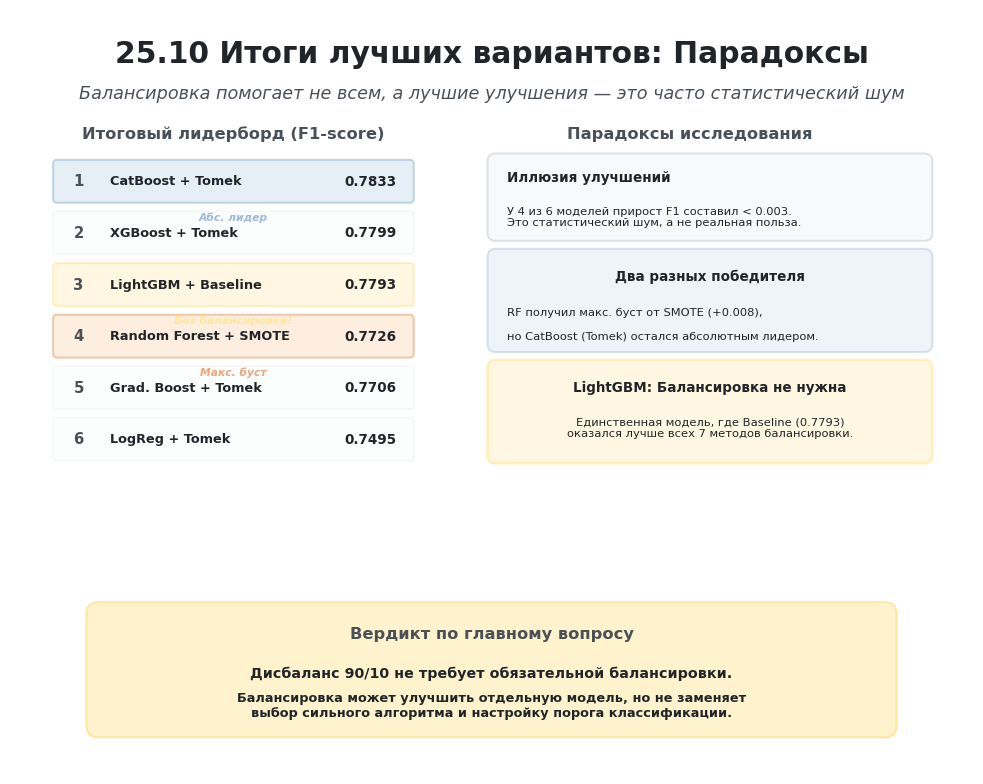

In [ ]:
# @title
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ---------- Цветовая палитра ----------
BLUE = "#D6E4F0"
BLUE_BORDER = "#9CBADA"
ORANGE = "#FCE4CB"
ORANGE_BORDER = "#E8A87C"
AMBER = "#FFF3CD"
AMBER_BORDER = "#FFE69C"
GRAY = "#F8F9FA"
GRAY_BORDER = "#DEE2E6"
RED_FILL = "#F8D7DA"
RED_BORDER = "#F5C2C7"
LIGHT_BLUE = "#EEF5FB"
TEXT_DARK = "#212529"
TEXT_MUTED = "#495057"

# --- Золотой шаблон масштабирования ---
S = 0.65
AXES_W, AXES_H = 12, 8
FIG_W, FIG_H = 8, 5.33

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=150)
ax.set_xlim(0, AXES_W)
ax.set_ylim(-1.5, AXES_H) # Расширил вниз для блока вывода
ax.set_aspect('equal')
ax.axis("off")
fig.patch.set_facecolor("white")

# ---------- 1. Заголовок ----------
ax.text(
    6.0, 7.5, "25.10 Итоги лучших вариантов: Парадоксы",
    ha="center", va="center",
    fontsize=22*S, weight="bold", color=TEXT_DARK
)
ax.text(
    6.0, 7.0, "Балансировка помогает не всем, а лучшие улучшения — это часто статистический шум",
    ha="center", va="center",
    fontsize=13*S, color=TEXT_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ ЧАСТЬ: Итоговый лидерборд (Топ-6)
# ==========================================
ax.text(2.75, 6.5, "Итоговый лидерборд (F1-score)", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# Данные: (Место, Модель + Метод, F1, Цвет рамки, Цвет фона, Роль)
leaders = [
    ("1", "CatBoost + Tomek", "0.7833", BLUE_BORDER, BLUE, "Абс. лидер"),
    ("2", "XGBoost + Tomek", "0.7799", GRAY_BORDER, GRAY, ""),
    ("3", "LightGBM + Baseline", "0.7793", AMBER_BORDER, AMBER, "Без балансировки!"),
    ("4", "Random Forest + SMOTE", "0.7726", ORANGE_BORDER, ORANGE, "Макс. буст"),
    ("5", "Grad. Boost + Tomek", "0.7706", GRAY_BORDER, GRAY, ""),
    ("6", "LogReg + Tomek", "0.7495", GRAY_BORDER, GRAY, "")
]

y_start = 5.9
step_h = 0.65

for i, (rank, name, f1, border, color, role) in enumerate(leaders):
    y_pos = y_start - i * step_h

    # Карточка строки
    ax.add_patch(FancyBboxPatch(
        (0.5, y_pos - 0.25), 4.5, 0.5,
        boxstyle="round,pad=0.02,rounding_size=0.05",
        linewidth=1.5*S if border != GRAY_BORDER else 1*S,
        edgecolor=border, facecolor=color, alpha=0.6 if border != GRAY_BORDER else 0.3
    ))

    # Место
    ax.text(0.8, y_pos, rank, ha="center", va="center", fontsize=11*S, weight="bold", color=TEXT_MUTED)
    # Название
    ax.text(1.2, y_pos, name, ha="left", va="center", fontsize=9.5*S, weight="bold", color=TEXT_DARK)
    # F1
    ax.text(4.8, y_pos, f1, ha="right", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)

    # Роль (если есть)
    if role:
        ax.text(2.75, y_pos - 0.45, role, ha="center", va="center", fontsize=8*S, color=border, weight="bold", style="italic")


# ==========================================
# ПРАВАЯ ЧАСТЬ: Парадоксы исследования
# ==========================================
ax.text(8.5, 6.5, "Парадоксы исследования", ha="center", va="center", fontsize=12*S, weight="bold", color=TEXT_MUTED)

# --- Блок 1: Иллюзия улучшений ---
ax.add_patch(FancyBboxPatch(
    (6.0, 5.2), 5.5, 1.0,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=GRAY_BORDER, facecolor=GRAY
))
ax.text(6.2, 5.95, "Иллюзия улучшений", ha="left", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(6.2, 5.45, "У 4 из 6 моделей прирост F1 составил < 0.003.\nЭто статистический шум, а не реальная польза.", ha="left", va="center", fontsize=8.5*S, color=TEXT_DARK)

# --- Блок 2: Разные победители ---
ax.add_patch(FancyBboxPatch(
    (6.0, 3.8), 5.5, 1.2,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=1.5*S, edgecolor=BLUE_BORDER, facecolor=BLUE, alpha=0.4
))
ax.text(8.75, 4.7, "Два разных победителя", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(6.2, 4.25, "RF получил макс. буст от SMOTE (+0.008),", ha="left", va="center", fontsize=8.5*S, color=TEXT_DARK)
ax.text(6.2, 3.95, "но CatBoost (Tomek) остался абсолютным лидером.", ha="left", va="center", fontsize=8.5*S, color=TEXT_DARK)

# --- Блок 3: Независимость LightGBM ---
ax.add_patch(FancyBboxPatch(
    (6.0, 2.4), 5.5, 1.2,
    boxstyle="round,pad=0.05,rounding_size=0.1",
    linewidth=2*S, edgecolor=AMBER_BORDER, facecolor=AMBER, alpha=0.6
))
ax.text(8.75, 3.3, "LightGBM: Балансировка не нужна", ha="center", va="center", fontsize=10*S, weight="bold", color=TEXT_DARK)
ax.text(8.75, 2.8, "Единственная модель, где Baseline (0.7793)\nоказался лучше всех 7 методов балансировки.", ha="center", va="center", fontsize=8.5*S, color=TEXT_DARK)


# ---------- Итоговый блок (Вывод) ----------
res_box = FancyBboxPatch(
    (1.0, -1.0), 10.0, 1.5,
    boxstyle="round,pad=0.1,rounding_size=0.15",
    linewidth=1.5*S, edgecolor=AMBER_BORDER, facecolor=AMBER
)
ax.add_patch(res_box)

ax.text(
    6.0, 0.2, "Вердикт по главному вопросу",
    ha="center", va="center",
    fontsize=12*S, weight="bold", color=TEXT_MUTED
)
ax.text(
    6.0, -0.3, "Дисбаланс 90/10 не требует обязательной балансировки.",
    ha="center", va="center",
    fontsize=10.5*S, color=TEXT_DARK, weight="bold"
)
ax.text(
    6.0, -0.7, "Балансировка может улучшить отдельную модель, но не заменяет\nвыбор сильного алгоритма и настройку порога классификации.",
    ha="center", va="center",
    fontsize=9.5*S, color=TEXT_DARK, weight="bold"
)

plt.tight_layout()
plt.show()

### 25.11 Вычислительная эффективность и цена улучшения

После сравнения качества моделей необходимо дополнительно оценить вычислительные затраты.

Время обучения не является основной метрикой данного исследования. Главный вопрос по-прежнему связан с влиянием дисбаланса классов на качество кредитного скоринга.

Однако вычислительная эффективность помогает понять, насколько практично применять метод балансировки, если полученное улучшение составляет лишь несколько тысячных по F1-score.

Для каждой модели сравниваются:

- F1-score на исходных данных;
- F1-score лучшего варианта;
- прирост F1-score относительно Baseline;
- время обучения Baseline;
- время обучения лучшего варианта;
- изменение времени обучения;
- отношение времени лучшего варианта ко времени Baseline;
- суммарное время обучения модели на всех восьми вариантах данных.

Под лучшим вариантом понимается результат, выбранный ранее по максимальному F1-score с дополнительным учётом ROC-AUC, Gini и времени обучения при равенстве основной метрики.

При интерпретации необходимо учитывать, что столбец `Fit Time` отражает время непосредственного обучения модели на уже подготовленной выборке. Время создания сбалансированных наборов данных в этот показатель не входит.

Продолжительность обучения зависит от оборудования и текущей загрузки среды выполнения. Поэтому абсолютные значения времени нельзя считать универсальными характеристиками алгоритмов.

В данном исследовании время используется для относительного сравнения моделей, запущенных в одинаковой среде и в рамках единой экспериментальной процедуры.

Основной вопрос этого этапа:

> **Оправдывает ли прирост качества дополнительные вычислительные затраты или исходный вариант модели остаётся более рациональным решением?**

In [ ]:
# @title
# ==========================================================
# Вычислительная эффективность лучших вариантов
# ==========================================================

import numpy as np
import pandas as pd

from IPython.display import display
from matplotlib.colors import (
    LinearSegmentedColormap,
    Normalize,
    TwoSlopeNorm,
    to_hex
)


# ----------------------------------------------------------
# Контрольные проверки
# ----------------------------------------------------------

required_results_columns = [
    "Model",
    "Balancing",
    "F1",
    "ROC-AUC",
    "Gini",
    "Fit Time"
]

missing_results_columns = [
    column
    for column in required_results_columns
    if column not in all_models_results_table.columns
]

if missing_results_columns:
    raise KeyError(
        "В общей таблице отсутствуют необходимые столбцы: "
        f"{missing_results_columns}"
    )


required_best_columns = [
    "Model",
    "Baseline F1",
    "Best Balancing",
    "Best F1",
    "Δ F1"
]

missing_best_columns = [
    column
    for column in required_best_columns
    if column not in best_variants_comparison_table.columns
]

if missing_best_columns:
    raise KeyError(
        "В таблице лучших вариантов отсутствуют столбцы: "
        f"{missing_best_columns}"
    )


# ----------------------------------------------------------
# Порядок моделей
# ----------------------------------------------------------

efficiency_model_order = [
    "Logistic Regression",
    "Random Forest",
    "Gradient Boosting",
    "XGBoost",
    "LightGBM",
    "CatBoost"
]


# ----------------------------------------------------------
# Формирование сравнительной таблицы
# ----------------------------------------------------------

efficiency_rows = []

for model_name in efficiency_model_order:

    model_results = (
        all_models_results_table
        .loc[
            all_models_results_table["Model"] == model_name
        ]
        .copy()
    )

    if len(model_results) != 8:
        raise ValueError(
            f"Для модели '{model_name}' ожидалось "
            f"8 экспериментов, но найдено: "
            f"{len(model_results)}."
        )

    baseline_rows = model_results.loc[
        model_results["Balancing"] == "Baseline"
    ]

    if len(baseline_rows) != 1:
        raise ValueError(
            f"Для модели '{model_name}' должна существовать "
            "ровно одна строка Baseline."
        )

    best_comparison_rows = (
        best_variants_comparison_table
        .loc[
            best_variants_comparison_table["Model"]
            == model_name
        ]
    )

    if len(best_comparison_rows) != 1:
        raise ValueError(
            f"Для модели '{model_name}' не найден "
            "однозначно определённый лучший вариант."
        )

    baseline_row = baseline_rows.iloc[0]
    best_comparison_row = best_comparison_rows.iloc[0]

    best_variant_name = best_comparison_row[
        "Best Balancing"
    ]

    best_rows = model_results.loc[
        model_results["Balancing"] == best_variant_name
    ]

    if len(best_rows) != 1:
        raise ValueError(
            f"Для модели '{model_name}' не найдена строка "
            f"лучшего варианта '{best_variant_name}'."
        )

    best_row = best_rows.iloc[0]

    baseline_time = float(
        baseline_row["Fit Time"]
    )

    best_time = float(
        best_row["Fit Time"]
    )

    if baseline_time <= 0 or best_time <= 0:
        raise ValueError(
            f"Время обучения модели '{model_name}' "
            "должно быть положительным."
        )

    efficiency_rows.append(
        {
            "Model": model_name,
            "Baseline F1": float(
                baseline_row["F1"]
            ),
            "Best Balancing": best_variant_name,
            "Best F1": float(
                best_row["F1"]
            ),
            "Δ F1": float(
                best_row["F1"]
                - baseline_row["F1"]
            ),
            "Baseline Fit Time": baseline_time,
            "Best Fit Time": best_time,
            "Δ Fit Time": (
                best_time
                - baseline_time
            ),
            "Time Ratio": (
                best_time
                / baseline_time
            ),
            "Total Fit Time": float(
                model_results["Fit Time"].sum()
            )
        }
    )


efficiency_comparison_table = pd.DataFrame(
    efficiency_rows
)


# ----------------------------------------------------------
# Проверка итоговой таблицы
# ----------------------------------------------------------

if len(efficiency_comparison_table) != 6:
    raise ValueError(
        "Таблица вычислительной эффективности должна "
        "содержать шесть строк."
    )

if efficiency_comparison_table.isna().any().any():
    raise ValueError(
        "В таблице вычислительной эффективности "
        "обнаружены пропущенные значения."
    )


# ----------------------------------------------------------
# Форматирование времени
# ----------------------------------------------------------

def format_duration_ru(seconds):
    """
    Переводит секунды в понятный формат:

    8 сек.
    2 мин. 42 сек.
    1 ч. 5 мин. 12 сек.
    """

    total_seconds = int(round(float(seconds)))

    hours, remainder = divmod(
        total_seconds,
        3600
    )

    minutes, remaining_seconds = divmod(
        remainder,
        60
    )

    if hours > 0:
        return (
            f"{hours} ч. "
            f"{minutes} мин. "
            f"{remaining_seconds} сек."
        )

    if minutes > 0:
        return (
            f"{minutes} мин. "
            f"{remaining_seconds} сек."
        )

    return f"{remaining_seconds} сек."


def format_signed_duration_ru(seconds):
    """
    Форматирует изменение времени со знаком.
    """

    seconds = float(seconds)

    if abs(seconds) < 0.5:
        return "0 сек."

    sign = "+" if seconds > 0 else "−"

    return (
        sign
        + format_duration_ru(
            abs(seconds)
        )
    )


# ----------------------------------------------------------
# Подготовка таблицы для отображения
# ----------------------------------------------------------

efficiency_display = (
    efficiency_comparison_table
    .rename(
        columns={
            "Model": "Модель",
            "Baseline F1": "F1 Baseline",
            "Best Balancing": "Лучший вариант",
            "Best F1": "Лучший F1-score",
            "Δ F1": "Δ F1-score",
            "Baseline Fit Time": "Время Baseline",
            "Best Fit Time": "Время лучшего варианта",
            "Δ Fit Time": "Δ времени",
            "Time Ratio": "Коэффициент времени",
            "Total Fit Time": "Время восьми обучений"
        }
    )
    .copy()
)


# ----------------------------------------------------------
# Цветовые палитры
# ----------------------------------------------------------

# Палитра "Светофор" для роста F1 (положительные значения - хорошо)
f1_gain_cmap = LinearSegmentedColormap.from_list(
    "f1_gain",
    [
        "#FFFFFF",  # нет улучшения
        "#C8E6C9",
        "#66BB6A",
        "#388E3C"   # сильное улучшение
    ]
)

# Инвертированная палитра для времени (меньше/быстрее - хорошо)
# Для "Δ времени": отрицательные значения (экономия) -> Зеленый.
# Для "Коэффициента времени": значения < 1.0 (ускорение) -> Зеленый.
time_saving_cmap = LinearSegmentedColormap.from_list(
    "time_saving_lights",
    [
        "#388E3C",  # ускорение / экономия (улучшение)
        "#66BB6A",
        "#C8E6C9",
        "#FFFFFF",  # отсутствие изменения
        "#FFCDD2",
        "#EF5350",
        "#D32F2F"   # замедление / рост затрат (ухудшение)
    ]
)

# Палитра для абсолютного времени (мягкая тёплая пудровая)
efficiency_time_cmap = LinearSegmentedColormap.from_list(
    "efficiency_time",
    [
        "#FDF7F4",  # быстрое обучение (светлый)
        "#F2D7D0",
        "#E2A8A0",
        "#C77B72",
        "#A65A52"   # долгое обучение (мягкий, не режет глаз)
    ]
)


def get_text_style(background_hex, intensity):
    """
    Возвращает CSS-стиль с правильным цветом текста.
    На тёмных ячейках текст белый, на светлых — тёмный.
    """
    text_color = "#FFFFFF" if intensity >= 0.60 else "#202428"
    font_weight = "bold" if intensity >= 0.35 else "normal"
    return (
        f"background-color: {background_hex}; "
        f"color: {text_color}; "
        f"font-weight: {font_weight};"
    )


# ----------------------------------------------------------
# Стилизация прироста F1-score
# ----------------------------------------------------------

def style_f1_gain(series):

    numeric_series = pd.to_numeric(
        series,
        errors="coerce"
    )

    maximum = numeric_series.max()

    if pd.isna(maximum) or maximum == 0:
        return [
            "background-color: #FFFFFF; color: #202428;"
            for _ in numeric_series
        ]

    normalization = Normalize(
        vmin=0,
        vmax=maximum
    )

    styles = []

    for value in numeric_series:

        if pd.isna(value):
            styles.append("")
            continue

        bg = to_hex(f1_gain_cmap(normalization(value)))
        intensity = value / maximum if maximum > 0 else 0
        styles.append(get_text_style(bg, intensity))

    return styles


# ----------------------------------------------------------
# Общая шкала для двух столбцов времени
# ----------------------------------------------------------

def style_time_pair(data):
    """
    Использует единую логарифмическую шкалу для:
    - времени Baseline;
    - времени лучшего варианта.
    """

    numeric_data = data.apply(
        pd.to_numeric,
        errors="coerce"
    )

    valid_values = numeric_data.to_numpy().flatten()
    valid_values = valid_values[
        ~np.isnan(valid_values)
    ]

    transformed = np.log1p(
        valid_values
    )

    normalization = Normalize(
        vmin=transformed.min(),
        vmax=transformed.max()
    )

    result = pd.DataFrame(
        "",
        index=data.index,
        columns=data.columns
    )

    for column in numeric_data.columns:

        for index, value in numeric_data[column].items():

            if pd.isna(value):
                continue

            t_val = np.log1p(value)
            norm_val = normalization(t_val)
            bg = to_hex(efficiency_time_cmap(norm_val))

            intensity = (norm_val - normalization.vmin) / (normalization.vmax - normalization.vmin) if normalization.vmax > normalization.vmin else 0

            result.loc[index, column] = get_text_style(bg, intensity)

    return result


# ----------------------------------------------------------
# Стиль суммарного времени восьми обучений
# ----------------------------------------------------------

def style_total_time(series):

    numeric_series = pd.to_numeric(
        series,
        errors="coerce"
    )

    transformed = np.log1p(
        numeric_series
    )

    normalization = Normalize(
        vmin=transformed.min(),
        vmax=transformed.max()
    )

    styles = []

    for value, t_val in zip(
        numeric_series,
        transformed
    ):

        if pd.isna(value):
            styles.append("")
            continue

        norm_val = normalization(t_val)
        bg = to_hex(efficiency_time_cmap(norm_val))
        intensity = (norm_val - normalization.vmin) / (normalization.vmax - normalization.vmin) if normalization.vmax > normalization.vmin else 0

        styles.append(get_text_style(bg, intensity))

    return styles


# ----------------------------------------------------------
# Стиль изменения времени (использует инвертированный "Светофор")
# ----------------------------------------------------------

def style_time_change(series):

    numeric_series = pd.to_numeric(
        series,
        errors="coerce"
    )

    valid_values = numeric_series.dropna()

    maximum_absolute_change = max(
        abs(valid_values.min()),
        abs(valid_values.max())
    )

    if maximum_absolute_change == 0:
        maximum_absolute_change = 1

    normalization = TwoSlopeNorm(
        vmin=-maximum_absolute_change,
        vcenter=0,
        vmax=maximum_absolute_change
    )

    styles = []

    for value in numeric_series:

        if pd.isna(value):
            styles.append("")
            continue

        # Используем инвертированную палитру (меньше времени - зеленый)
        bg = to_hex(time_saving_cmap(normalization(value)))
        intensity = abs(value) / maximum_absolute_change

        styles.append(get_text_style(bg, intensity))

    return styles


# ----------------------------------------------------------
# Стиль коэффициента времени (использует инвертированный "Светофор")
# ----------------------------------------------------------

def style_time_ratio(series):

    numeric_series = pd.to_numeric(
        series,
        errors="coerce"
    )

    valid_values = numeric_series.dropna()

    minimum = min(
        valid_values.min(),
        0.99
    )

    maximum = max(
        valid_values.max(),
        1.01
    )

    normalization = TwoSlopeNorm(
        vmin=minimum,
        vcenter=1,
        vmax=maximum
    )

    styles = []

    for value in numeric_series:

        if pd.isna(value):
            styles.append("")
            continue

        # Используем инвертированную палитру (< 1.0 - зеленый, > 1.0 - красный)
        bg = to_hex(time_saving_cmap(normalization(value)))

        max_dist = max(abs(minimum - 1), abs(maximum - 1))
        intensity = abs(value - 1) / max_dist if max_dist > 0 else 0

        styles.append(get_text_style(bg, intensity))

    return styles


def highlight_efficiency_variant(value):

    if value == "Baseline":
        return (
            "background-color: #D9E7F2; "
            "font-weight: bold; "
            "color: #263746;"
        )

    return (
        "background-color: #EEE6D5; "
        "font-weight: bold; "
        "color: #34302A;"
    )


# ----------------------------------------------------------
# Оформление таблицы
# ----------------------------------------------------------

efficiency_styled = (
    efficiency_display
    .style

    .apply(
        style_f1_gain,
        subset=["Δ F1-score"],
        axis=0
    )

    .apply(
        style_time_pair,
        subset=[
            "Время Baseline",
            "Время лучшего варианта"
        ],
        axis=None
    )

    .apply(
        style_time_change,
        subset=["Δ времени"],
        axis=0
    )

    .apply(
        style_time_ratio,
        subset=["Коэффициент времени"],
        axis=0
    )

    .apply(
        style_total_time,
        subset=["Время восьми обучений"],
        axis=0
    )

    .map(
        highlight_efficiency_variant,
        subset=["Лучший вариант"]
    )

    .format(
        {
            "F1 Baseline": "{:.4f}",
            "Лучший F1-score": "{:.4f}",
            "Δ F1-score": "{:+.4f}",
            "Время Baseline": format_duration_ru,
            "Время лучшего варианта": format_duration_ru,
            "Δ времени": format_signed_duration_ru,
            "Коэффициент времени": "{:.2f}×",
            "Время восьми обучений": format_duration_ru
        }
    )

    .hide(axis="index")

    .set_caption(
        "Качество и вычислительные затраты "
        "лучшего варианта каждой модели"
    )

    .set_table_styles(
        [
            {
                "selector": "caption",
                "props": [
                    ("font-size", "16px"),
                    ("font-weight", "bold"),
                    ("text-align", "left"),
                    ("padding", "10px 0 12px 0"),
                    ("color", "#2C3135")
                ]
            },
            {
                "selector": "th",
                "props": [
                    ("background-color", "#E8EBEE"),
                    ("font-weight", "bold"),
                    ("text-align", "center"),
                    ("border", "1px solid #BCC4CB"),
                    ("padding", "8px"),
                    ("color", "#252A2E")
                ]
            },
            {
                "selector": "td",
                "props": [
                    ("text-align", "center"),
                    ("border", "1px solid #D1D6DA"),
                    ("padding", "8px"),
                    ("color", "#202428")
                ]
            },
            {
                "selector": "td:nth-child(1)",
                "props": [
                    ("text-align", "left"),
                    ("font-weight", "bold"),
                    ("background-color", "#F1F3F4")
                ]
            },

            # Отделяем блок времени от блока качества.
            {
                "selector": "th:nth-child(6)",
                "props": [
                    ("border-left", "4px solid #8295A5")
                ]
            },
            {
                "selector": "td:nth-child(6)",
                "props": [
                    ("border-left", "4px solid #8295A5")
                ]
            }
        ]
    )
)


# ----------------------------------------------------------
# Вывод
# ----------------------------------------------------------

display(efficiency_styled)


print(
    "Таблица вычислительной эффективности "
    "успешно сформирована."
)

print(
    "Количество моделей:",
    len(efficiency_comparison_table)
)

print(
    "Таблица сохранена в переменной "
    "efficiency_comparison_table."
)

print(
    "\nВ столбцах изменений (Δ) зелёный цвет означает улучшение "
    "(рост F1 или экономию времени), красный — ухудшение (рост затрат)."
)

print(
    "Для абсолютного времени используется мягкая пудровая шкала: "
    "светлые оттенки соответствуют быстрым моделям, "
    "приглушённые розовые — медленным."
)

Модель,F1 Baseline,Лучший вариант,Лучший F1-score,Δ F1-score,Время Baseline,Время лучшего варианта,Δ времени,Коэффициент времени,Время восьми обучений
Logistic Regression,0.7480,Tomek Links,0.7495,+0.0015,6 сек.,5 сек.,−1 сек.,0.88×,1 мин. 5 сек.
Random Forest,0.7645,SMOTE,0.7726,+0.0081,2 мин. 42 сек.,6 мин. 17 сек.,+3 мин. 35 сек.,2.33×,24 мин. 56 сек.
Gradient Boosting,0.7690,Tomek Links,0.7706,+0.0016,3 мин. 23 сек.,3 мин. 20 сек.,−3 сек.,0.99×,41 мин. 46 сек.
XGBoost,0.7786,Tomek Links,0.7799,+0.0013,5 сек.,7 сек.,+2 сек.,1.44×,51 сек.
LightGBM,0.7793,Baseline,0.7793,+0.0000,7 сек.,7 сек.,0 сек.,1.00×,1 мин. 15 сек.
CatBoost,0.7805,Tomek Links,0.7833,+0.0028,1 мин. 14 сек.,2 мин. 4 сек.,+50 сек.,1.68×,14 мин. 33 сек.


Таблица вычислительной эффективности успешно сформирована.
Количество моделей: 6
Таблица сохранена в переменной efficiency_comparison_table.

В столбцах изменений (Δ) зелёный цвет означает улучшение (рост F1 или экономию времени), красный — ухудшение (рост затрат).
Для абсолютного времени используется мягкая пудровая шкала: светлые оттенки соответствуют быстрым моделям, приглушённые розовые — медленным.


### 25.12 Анализ вычислительной эффективности

Сравнение времени обучения позволяет оценить, насколько полученное улучшение F1-score оправдывает дополнительные вычислительные затраты.

При интерпретации необходимо учитывать, что время обучения зависит от используемого оборудования, текущей загрузки среды и особенностей реализации алгоритма. Поэтому абсолютные значения не следует рассматривать как универсальную характеристику моделей.

В данном исследовании время используется как дополнительный критерий для сравнения экспериментов, выполненных в одной среде и по единой процедуре.

---

#### Logistic Regression

Для Logistic Regression лучшим вариантом оказался Tomek Links.

Результаты изменились следующим образом:

- F1-score увеличился с **0.7480** до **0.7495**;
- прирост составил **0.0015**;
- время обучения сократилось примерно с **6 секунд** до **5 секунд**.

Вычислительные затраты практически не изменились. Однако и улучшение качества оказалось минимальным.

Следовательно, Tomek Links можно применить без существенного увеличения времени, но полученный прирост слишком мал, чтобы считать этот вариант принципиально лучше Baseline.

---

#### Random Forest

Для Random Forest наилучший F1-score был получен после применения SMOTE.

Результаты:

- F1-score увеличился с **0.7645** до **0.7726**;
- прирост составил **0.0081**;
- время обучения увеличилось с **2 минут 42 секунд** до **6 минут 17 секунд**;
- дополнительное время составило **3 минуты 35 секунд**;
- лучший вариант обучался примерно в **2,33 раза дольше** Baseline.

Random Forest получил наиболее заметное улучшение F1-score среди всех моделей. Однако это улучшение потребовало более чем двукратного увеличения времени обучения.

При этом прирост F1-score составил менее одного процентного пункта и сопровождался снижением Precision.

Следовательно, SMOTE для Random Forest может быть оправдан, если приоритетом является обнаружение большего количества дефолтов и дополнительные вычислительные затраты допустимы.

Если же требуется высокая Precision и более простая экспериментальная процедура, Baseline Random Forest остаётся конкурентоспособным вариантом.

---

#### Gradient Boosting

Для Gradient Boosting лучшим вариантом оказался Tomek Links.

Результаты:

- F1-score увеличился с **0.7690** до **0.7706**;
- прирост составил **0.0016**;
- время обучения практически не изменилось: примерно **3 минуты 23 секунды** для Baseline и **3 минуты 20 секунд** для Tomek Links.

С точки зрения времени применение Tomek Links не создаёт дополнительных затрат.

Однако прирост F1-score остаётся минимальным, а ROC-AUC и Gini немного снизились.

Следовательно, использование Tomek Links не ухудшает вычислительную эффективность, но и не обеспечивает практически значимого повышения качества.

Отдельно следует отметить, что Gradient Boosting оказался самым продолжительным алгоритмом в полном цикле из восьми экспериментов: суммарное время составило примерно **41 минуту 46 секунд**.

---

#### XGBoost

Для XGBoost лучшим вариантом оказался Tomek Links.

Результаты:

- F1-score увеличился с **0.7786** до **0.7799**;
- прирост составил **0.0013**;
- время обучения увеличилось примерно с **5 секунд** до **7 секунд**;
- дополнительное время составило около **2 секунд**.

В относительном выражении время увеличилось примерно в **1,44 раза**, однако в абсолютных значениях разница составляет всего несколько секунд.

Поэтому вычислительная стоимость применения Tomek Links для XGBoost практически несущественна.

Тем не менее прирост F1-score также очень мал. XGBoost уже на исходных данных показывает высокое качество, а балансировка не даёт выраженного преимущества.

Полная серия из восьми экспериментов XGBoost была выполнена примерно за **51 секунду**, что делает эту модель наиболее быстрой среди исследованных алгоритмов.

---

#### LightGBM

Для LightGBM лучшим вариантом остался Baseline.

Результаты:

- F1-score — **0.7793**;
- время обучения — примерно **7 секунд**;
- ни один метод балансировки не обеспечил более высокого F1-score.

Это наиболее однозначный результат с точки зрения вычислительной эффективности.

Применение балансировки к LightGBM:

- не улучшило основную метрику;
- потребовало дополнительных операций подготовки данных;
- в некоторых экспериментах увеличило время обучения;
- не обеспечило устойчивого роста ROC-AUC или Gini.

Следовательно, для LightGBM исходный вариант одновременно является и наиболее качественным, и наиболее рациональным.

Полная серия из восьми экспериментов заняла примерно **1 минуту 15 секунд**.

---

#### CatBoost

Для CatBoost максимальный F1-score был получен после применения Tomek Links.

Результаты:

- F1-score увеличился с **0.7805** до **0.7833**;
- прирост составил **0.0028**;
- время обучения увеличилось с **1 минуты 14 секунд** до **2 минут 4 секунд**;
- дополнительное время составило **50 секунд**;
- продолжительность обучения выросла примерно в **1,68 раза**.

CatBoost с Tomek Links показал максимальный абсолютный F1-score среди всех проведённых экспериментов.

Однако прирост относительно Baseline остаётся небольшим. Кроме того, ROC-AUC и Gini немного снизились.

Следовательно, увеличение времени почти на 70% не сопровождается сопоставимым улучшением общего качества.

С практической точки зрения Baseline CatBoost может быть более рациональным вариантом:

- он обучается быстрее;
- сохраняет лучшие ROC-AUC и Gini;
- практически не уступает по F1-score;
- не требует дополнительной очистки обучающих данных.

Полная серия экспериментов CatBoost заняла примерно **14 минут 33 секунды**.

---

### Сравнение полного времени экспериментов

Суммарное время выполнения восьми вариантов для каждой модели составило:

1. XGBoost — примерно **51 секунду**;
2. Logistic Regression — примерно **1 минуту 5 секунд**;
3. LightGBM — примерно **1 минуту 15 секунд**;
4. CatBoost — примерно **14 минут 33 секунды**;
5. Random Forest — примерно **24 минуты 56 секунд**;
6. Gradient Boosting — примерно **41 минуту 46 секунд**.

Таким образом, современные реализации градиентного бустинга XGBoost и LightGBM обеспечили не только высокое качество, но и наиболее короткое время обучения.

CatBoost показал максимальный F1-score, однако потребовал значительно больше времени.

Random Forest и классический Gradient Boosting оказались наиболее затратными в полном экспериментальном цикле.

---

### Соотношение качества и вычислительных затрат

По совокупности результатов можно выделить несколько сценариев.

#### Максимальная скорость

Наиболее быстрым вариантом является XGBoost.

Он демонстрирует высокий F1-score, ROC-AUC и Gini, а полный цикл из восьми экспериментов выполняется менее чем за одну минуту.

#### Наиболее рациональный Baseline

LightGBM показывает высокий F1-score на исходных данных и не получает улучшения после балансировки.

Это делает его одним из наиболее рациональных вариантов по сочетанию качества, скорости и простоты.

#### Максимальный F1-score

Наибольший F1-score показал CatBoost с Tomek Links — **0.7833**.

Однако преимущество над Baseline CatBoost составляет только **0.0028**, тогда как время обучения увеличивается почти в 1,7 раза.

#### Наибольшая польза от балансировки

Random Forest со SMOTE получил максимальный прирост F1-score — **0.0081**.

Но обучение стало более чем в два раза дольше, а Precision заметно снизилась.

---

### Вывод

Вычислительный анализ подтверждает общий результат исследования.

Балансировка редко обеспечивает улучшение, сопоставимое с дополнительными затратами.

Для большинства моделей:

- прирост F1-score составляет лишь несколько тысячных;
- время обучения увеличивается;
- ROC-AUC и Gini не улучшаются;
- усложняется процедура подготовки данных.

Наиболее заметный положительный эффект получен для Random Forest со SMOTE, но даже он сопровождается более чем двукратным увеличением времени и снижением Precision.

LightGBM демонстрирует лучший результат без балансировки, а XGBoost обеспечивает почти максимальное качество при минимальных вычислительных затратах.

CatBoost показывает максимальный F1-score, но его преимущество над собственным Baseline невелико.

Следовательно, с точки зрения соотношения качества, скорости и сложности процедуры обязательное применение балансировки не оправдано.

Для рассматриваемого набора данных более рациональным подходом является использование сильной модели на исходной выборке с последующей настройкой порога классификации под бизнес-стоимость ошибок.

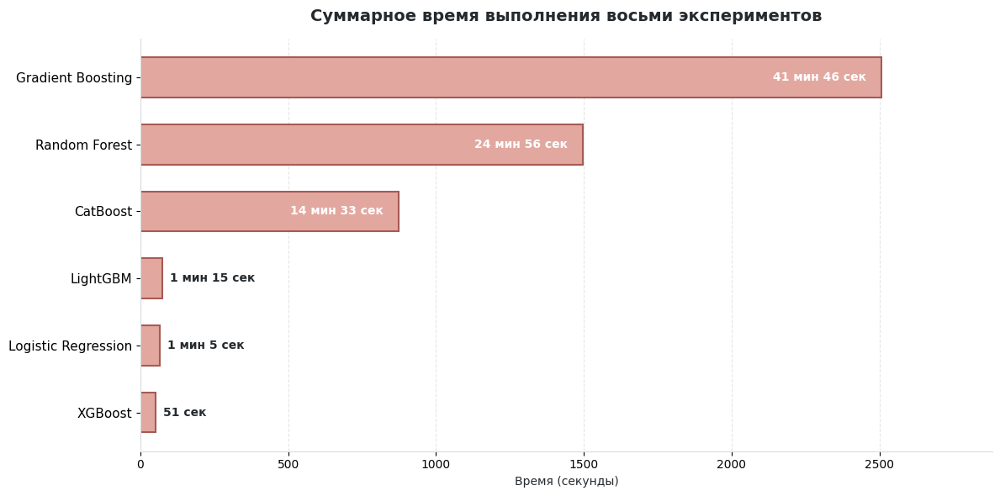

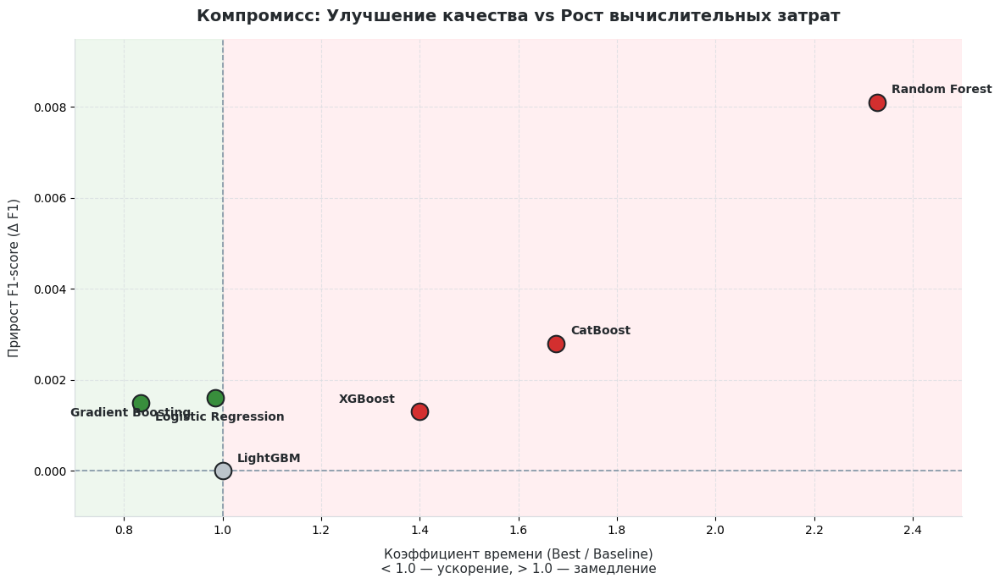

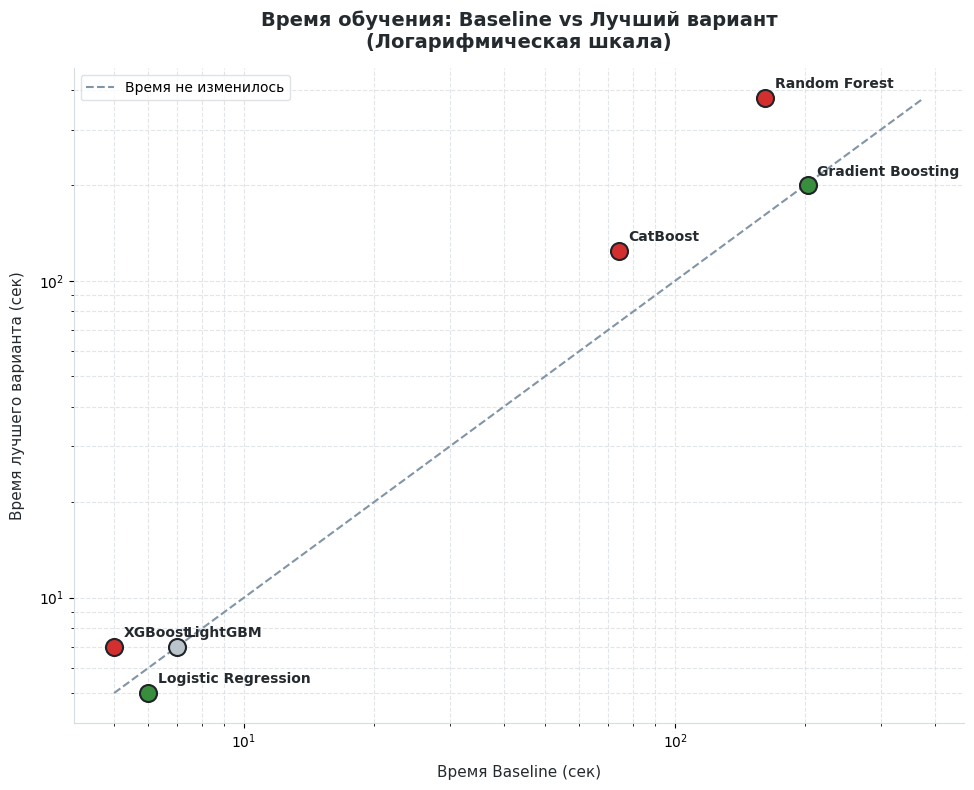

Иллюстрации к разделу 25.12 успешно построены.


In [ ]:
# @title
# ==========================================================
# Иллюстрации к разделу 25.12: Анализ вычислительной эффективности
# ==========================================================

import matplotlib.pyplot as plt
import numpy as np

# ----------------------------------------------------------
# Исходные данные из аналитического текста
# ----------------------------------------------------------

models = [
    "Logistic Regression",
    "Random Forest",
    "Gradient Boosting",
    "XGBoost",
    "LightGBM",
    "CatBoost"
]

# Суммарное время 8 экспериментов в секундах
total_times_sec = [65, 1496, 2506, 51, 75, 873]

# Время Baseline и Лучшего варианта в секундах
baseline_times_sec = [6, 162, 203, 5, 7, 74]
best_times_sec = [5, 377, 200, 7, 7, 124]

# Коэффициент времени (Best / Baseline)
time_ratios = [5/6, 377/162, 200/203, 7/5, 1.0, 124/74]

# Прирост F1-score
delta_f1 = [0.0015, 0.0081, 0.0016, 0.0013, 0.0000, 0.0028]


# ----------------------------------------------------------
# Вспомогательные функции и цвета
# ----------------------------------------------------------

def format_time(seconds):
    """Форматирует секунды в вид 'X мин Y сек' или 'Z сек'."""
    seconds = int(round(seconds))
    m, s = divmod(seconds, 60)
    h, m = divmod(m, 60)
    if h > 0:
        return f"{h} ч {m} мин"
    if m > 0:
        return f"{m} мин {s} сек"
    return f"{s} сек"

# Цвета из наших палитр
COLOR_BG = "#FFFFFF"
COLOR_TEXT = "#252A2E"
COLOR_GRID = "#D7DCE0"
COLOR_TIME_BAR = "#E2A8A0"  # Пудровый для времени
COLOR_TIME_EDGE = "#A65A52"

# Инвертированный светофор для точек
def get_point_color(ratio):
    if ratio < 0.99:
        return "#388E3C"  # Ускорение (зеленый)
    elif ratio > 1.01:
        return "#D32F2F"  # Замедление (красный)
    else:
        return "#BCC4CB"  # Без изменений (серый)


# ----------------------------------------------------------
# График 1: Полное время экспериментов (Горизонтальная столбчатая)
# ----------------------------------------------------------

# Сортируем для красивого отображения
sorted_idx = np.argsort(total_times_sec)
sorted_models = [models[i] for i in sorted_idx]
sorted_times = [total_times_sec[i] for i in sorted_idx]

fig1, ax1 = plt.subplots(figsize=(12, 6))

bars = ax1.barh(
    sorted_models,
    sorted_times,
    color=COLOR_TIME_BAR,
    edgecolor=COLOR_TIME_EDGE,
    linewidth=1.5,
    height=0.6
)

# Подписи на столбцах
for bar in bars:
    width = bar.get_width()
    label_text = format_time(width)
    # Размещаем текст внутри или снаружи столбца в зависимости от ширины
    if width > max(sorted_times) * 0.15:
        ax1.text(
            width - (max(sorted_times) * 0.02),
            bar.get_y() + bar.get_height() / 2,
            label_text,
            ha="right", va="center",
            color="#FFFFFF", fontweight="bold", fontsize=10
        )
    else:
        ax1.text(
            width + (max(sorted_times) * 0.01),
            bar.get_y() + bar.get_height() / 2,
            label_text,
            ha="left", va="center",
            color=COLOR_TEXT, fontweight="bold", fontsize=10
        )

ax1.set_title(
    "Суммарное время выполнения восьми экспериментов",
    fontsize=14, fontweight="bold", pad=15, color=COLOR_TEXT
)
ax1.set_xlabel("Время (секунды)", fontsize=10, color=COLOR_TEXT)
ax1.tick_params(axis='y', labelsize=11)
ax1.set_xlim(0, max(sorted_times) * 1.15)

# Оформление
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['left'].set_color(COLOR_GRID)
ax1.spines['bottom'].set_color(COLOR_GRID)
ax1.grid(axis='x', linestyle='--', alpha=0.7, color=COLOR_GRID)
ax1.set_axisbelow(True)
ax1.set_facecolor(COLOR_BG)

plt.tight_layout()
plt.show()


# ----------------------------------------------------------
# График 2: Диаграмма компромисса (Прирост F1 vs Коэффициент времени)
# ----------------------------------------------------------

fig2, ax2 = plt.subplots(figsize=(12, 7))

# Рисуем точки
for i, model in enumerate(models):
    color = get_point_color(time_ratios[i])
    ax2.scatter(
        time_ratios[i],
        delta_f1[i],
        s=200,
        color=color,
        edgecolors="#202428",
        linewidth=1.5,
        zorder=3
    )
    # Сдвигаем подписи, чтобы не накладывались
    offset_x = 0.03
    offset_y = 0.0002
    ha = 'left'

    # Специальные сдвиги для конкретных моделей, чтобы текст не сливался
    if model == "Logistic Regression":
        offset_y = -0.0004
    elif model == "XGBoost":
        offset_x = -0.05
        ha = 'right'
        offset_y = 0.0002
    elif model == "Gradient Boosting":
        offset_x = -0.05
        ha = 'right'
        offset_y = -0.0004

    ax2.annotate(
        model,
        (time_ratios[i], delta_f1[i]),
        xytext=(time_ratios[i] + offset_x, delta_f1[i] + offset_y),
        fontsize=10,
        fontweight="bold",
        color=COLOR_TEXT,
        ha=ha
    )

# Линии-ориентиры
ax2.axhline(0, color="#8295A5", linestyle='--', linewidth=1.2, zorder=1)
ax2.axvline(1.0, color="#8295A5", linestyle='--', linewidth=1.2, zorder=1)

# Заливка зон (Верхний левый угол - идеальная зона, Нижний правый - худшая)
ax2.axvspan(0.7, 1.0, color="#C8E6C9", alpha=0.3, zorder=0)
ax2.axvspan(1.0, 2.5, color="#FFCDD2", alpha=0.3, zorder=0)

ax2.set_title(
    "Компромисс: Улучшение качества vs Рост вычислительных затрат",
    fontsize=14, fontweight="bold", pad=15, color=COLOR_TEXT
)
ax2.set_xlabel(
    "Коэффициент времени (Best / Baseline)\n< 1.0 — ускорение, > 1.0 — замедление",
    fontsize=11, labelpad=10, color=COLOR_TEXT
)
ax2.set_ylabel(
    "Прирост F1-score (Δ F1)",
    fontsize=11, labelpad=10, color=COLOR_TEXT
)

# Лимиты
ax2.set_xlim(0.7, 2.5)
ax2.set_ylim(-0.001, 0.0095)

# Оформление
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['left'].set_color(COLOR_GRID)
ax2.spines['bottom'].set_color(COLOR_GRID)
ax2.grid(linestyle='--', alpha=0.7, color=COLOR_GRID)
ax2.set_axisbelow(True)
ax2.set_facecolor(COLOR_BG)

plt.tight_layout()
plt.show()


# ----------------------------------------------------------
# График 3: Сравнение времени Baseline и Лучшего варианта (Log Scale)
# ----------------------------------------------------------

fig3, ax3 = plt.subplots(figsize=(10, 8))

# Линия равенства (y=x)
lims = [
    np.min([np.min(baseline_times_sec), np.min(best_times_sec)]),
    np.max([np.max(baseline_times_sec), np.max(best_times_sec)])
]
ax3.plot(lims, lims, color="#8295A5", linestyle='--', linewidth=1.5, zorder=1, label="Время не изменилось")

# Точки
for i, model in enumerate(models):
    color = get_point_color(time_ratios[i])
    ax3.scatter(
        baseline_times_sec[i],
        best_times_sec[i],
        s=150,
        color=color,
        edgecolors="#202428",
        linewidth=1.5,
        zorder=3
    )
    # Подписи
    ax3.annotate(
        model,
        (baseline_times_sec[i], best_times_sec[i]),
        xytext=(7, 7),
        textcoords='offset points',
        fontsize=10,
        fontweight="bold",
        color=COLOR_TEXT
    )

ax3.set_title(
    "Время обучения: Baseline vs Лучший вариант\n(Логарифмическая шкала)",
    fontsize=14, fontweight="bold", pad=15, color=COLOR_TEXT
)
ax3.set_xlabel(
    "Время Baseline (сек)",
    fontsize=11, labelpad=10, color=COLOR_TEXT
)
ax3.set_ylabel(
    "Время лучшего варианта (сек)",
    fontsize=11, labelpad=10, color=COLOR_TEXT
)

# Логарифмическая шкала нужна из-за большого разброса (от 5 до 377 сек)
ax3.set_xscale('log')
ax3.set_yscale('log')

# Оформление
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)
ax3.spines['left'].set_color(COLOR_GRID)
ax3.spines['bottom'].set_color(COLOR_GRID)
ax3.grid(linestyle='--', alpha=0.7, color=COLOR_GRID, which="both")
ax3.set_axisbelow(True)
ax3.set_facecolor(COLOR_BG)
ax3.legend(loc='upper left', fontsize=10, frameon=True, facecolor='white', edgecolor=COLOR_GRID)

plt.tight_layout()
plt.show()

print("Иллюстрации к разделу 25.12 успешно построены.")

### 25.13 Ограничения исследования и границы применимости результатов

Проведённые эксперименты позволяют выявить устойчивые закономерности влияния балансировки на рассматриваемом наборе данных. Однако полученные результаты необходимо интерпретировать с учётом ограничений исследования.

Указание ограничений не отменяет сделанных выводов. Оно определяет границы, в которых эти выводы можно считать обоснованными.

#### Одно фиксированное разбиение данных

Все модели оценивались на одном и том же разделении данных на обучающую и тестовую выборки.

Это обеспечивает корректную сопоставимость экспериментов, поскольку каждый алгоритм проверялся в одинаковых условиях. Однако небольшие различия между близкими результатами могут зависеть от конкретного состава выборок.

Особенно осторожно следует интерпретировать изменения F1-score в пределах нескольких тысячных:

- `+0.0013`;
- `+0.0015`;
- `+0.0016`;
- `+0.0028`.

Такие различия необходимо дополнительно проверять на повторных разбиениях или с помощью кросс-валидации.

#### Отсутствие кросс-валидации

В рамках текущего исследования основной целью было сравнение методов балансировки в полностью одинаковых условиях, поэтому использовалась одна фиксированная тестовая выборка.

Кросс-валидация позволила бы:

- оценить устойчивость результатов на разных подвыборках;
- рассчитать средние значения метрик;
- определить разброс результатов;
- построить доверительные интервалы;
- проверить статистическую значимость небольших улучшений.

Поэтому различия в несколько тысячных нельзя считать окончательно подтверждённым преимуществом одного варианта без дополнительной валидации.

#### Выбор лучшего варианта по тестовой выборке

Лучший вариант каждой модели выбирался по максимальному F1-score среди восьми проведённых экспериментов.

Поскольку для сравнения использовалась одна и та же тестовая выборка, она фактически участвовала не только в оценке, но и в выборе предпочтительного варианта.

Это означает, что после окончательного выбора модели её качество необходимо проверить на дополнительной независимой выборке, которая ранее не использовалась для сравнения решений.

Такой этап особенно важен перед промышленным внедрением.

#### Отсутствие подбора гиперпараметров

Все модели сравнивались без полноценной оптимизации гиперпараметров.

Такое решение было принято намеренно, чтобы не смешивать влияние балансировки с влиянием индивидуальной настройки каждого алгоритма.

Следовательно, результаты показывают относительное поведение моделей в рамках единой экспериментальной процедуры, но не отражают максимально достижимое качество каждого алгоритма.

После выбора перспективных кандидатов может быть отдельно выполнен подбор гиперпараметров.

#### Использование стандартного порога классификации

Классовые прогнозы формировались при стандартном пороге классификации `0.5`.

При этом Precision, Recall и F1-score напрямую зависят от выбранного порога.

Снижение порога может повысить Recall без изменения обучающей выборки, но одновременно снизить Precision. Повышение порога приведёт к обратному эффекту.

Поэтому увеличение Recall после балансировки не обязательно означает, что сама модель стала лучше разделять классы. В некоторых случаях аналогичный результат можно получить настройкой порога на исходной модели.

ROC-AUC и Gini меньше зависят от одного фиксированного порога и поэтому использовались для дополнительной оценки качества ранжирования.

#### Отсутствие денежной оценки ошибок

В исследовании не была задана бизнес-стоимость ошибок двух типов:

- False Negative — фактический дефолт не обнаружен;
- False Positive — надёжный клиент ошибочно отнесён к группе риска.

Без этой информации невозможно универсально определить, какое соотношение Precision и Recall является оптимальным.

Например:

- если пропущенный дефолт создаёт очень большие финансовые потери, бизнес может принять снижение Precision ради более высокого Recall;
- если ошибочный отказ надёжному клиенту особенно дорог, приоритет может быть отдан высокой Precision.

Поэтому окончательный рабочий порог должен выбираться не только по F1-score, но и с учётом экономической стоимости решений.

#### Ограниченная оценка вычислительных затрат

Время, зафиксированное в экспериментах, отражает непосредственное обучение моделей на подготовленных выборках.

В него не включено полное время:

- выполнения балансировки;
- создания синтетических объектов;
- очистки выборки;
- загрузки данных;
- подготовки признаков;
- сохранения и развёртывания модели.

Кроме того, продолжительность зависит от оборудования и загрузки вычислительной среды.

Поэтому время используется как относительная характеристика внутри данного исследования, а не как универсальный технический показатель алгоритмов.

#### Один набор данных и одна степень дисбаланса

Исследование выполнено на одном наборе данных с исходным соотношением классов примерно 90/10.

Полученный вывод относится именно к:

- рассматриваемым признакам;
- текущему объёму выборки;
- качеству исходных данных;
- используемым алгоритмам;
- данной степени дисбаланса.

При более сильном дисбалансе, например 99/1, другом наборе признаков или меньшем количестве наблюдений влияние балансировки может оказаться иным.

Поэтому результат нельзя автоматически переносить на все задачи кредитного скоринга.

---

### Значение ограничений для итогового вывода

Несмотря на перечисленные ограничения, в исследовании была обнаружена устойчивая закономерность, повторившаяся для шести различных алгоритмов:

- балансировка повышала Recall;
- одновременно снижала Precision;
- в большинстве случаев ухудшала F1-score;
- редко улучшала ROC-AUC и Gini;
- агрессивные методы удаления объектов заметно ухудшали качество;
- сильные модели уже на исходных данных демонстрировали высокие показатели.

Эта закономерность достаточно устойчива, чтобы сформулировать вывод для рассматриваемого набора данных.

Однако точные различия между близкими вариантами и окончательный выбор промышленной модели необходимо подтверждать на следующем этапе с помощью кросс-валидации, независимой тестовой выборки и бизнес-оценки ошибок.

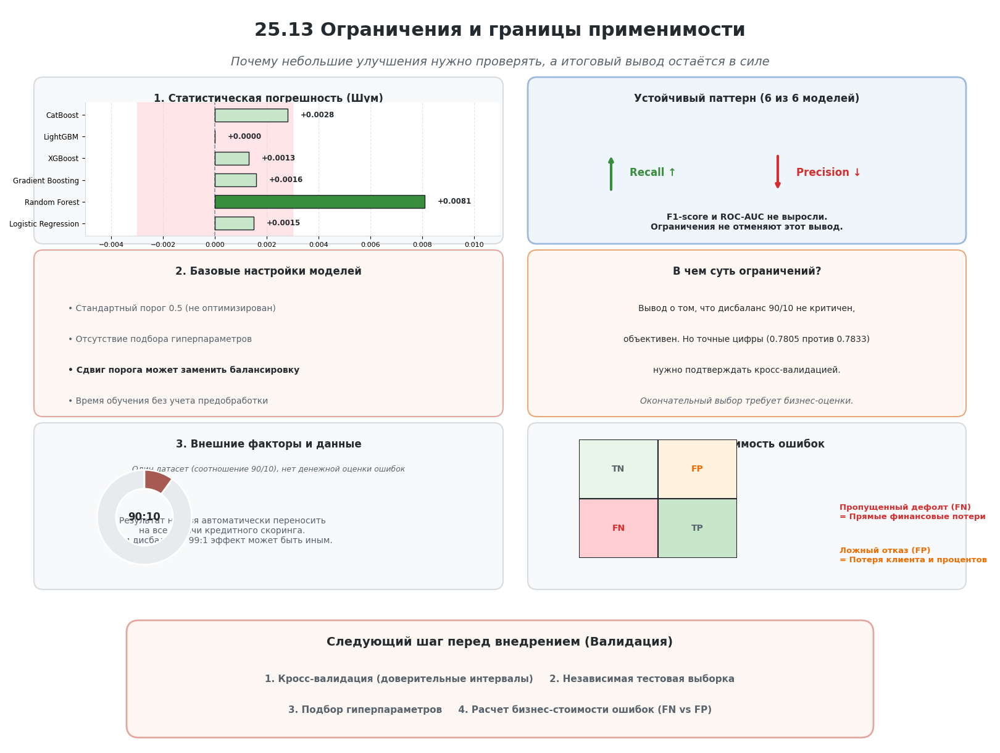

### 25.14 Итоговый ответ на главный вопрос исследования

В начале работы был сформулирован главный исследовательский вопрос:

> **Насколько дисбаланс классов влияет на качество модели кредитного скоринга на выбранном наборе данных?**

В практической формулировке необходимо было определить:

> **Является ли исходное соотношение классов примерно 90/10 существенным препятствием для построения качественной модели и требуется ли обязательное применение методов балансировки?**

Проведённые эксперименты позволяют дать на этот вопрос однозначный, но при этом не упрощённый ответ.

---

## Краткий ответ

> **Исходный дисбаланс классов влияет на соотношение Precision и Recall, но не является критическим препятствием для обучения моделей на рассматриваемом наборе данных. Обязательная балансировка обучающей выборки не требуется.**

Модели уже на исходных данных демонстрируют высокое качество ранжирования и приемлемый баланс между Precision и Recall.

Применение балансировки чаще изменяет характер ошибок модели, чем принципиально улучшает её способность разделять классы.

---

## Почему дисбаланс нельзя считать критической проблемой

Современные модели градиентного бустинга уже на исходных данных показали высокие результаты:

- F1-score — от **0.7786** до **0.7805**;
- ROC-AUC — от **0.9569** до **0.9593**;
- Gini — от **0.9139** до **0.9186**;
- Precision — выше **0.90**;
- Recall — около **0.68**.

Такие значения показывают, что модели способны:

- выявлять закономерности миноритарного класса;
- корректно ранжировать клиентов по уровню риска;
- сохранять высокую точность положительных прогнозов;
- обнаруживать значительную часть фактических дефолтов без изменения распределения классов.

Если бы дисбаланс 90/10 являлся критическим препятствием, модели на исходных данных должны были бы показывать существенно более слабые F1-score, ROC-AUC и Gini.

Фактически этого не произошло.

---

## Как балансировка изменила поведение моделей

После применения методов балансировки наблюдалась устойчивая закономерность:

- Recall увеличивался;
- Precision снижалась;
- модель начинала чаще прогнозировать дефолт;
- количество пропущенных дефолтов уменьшалось;
- одновременно увеличивалось количество ложных предупреждений.

Это означает, что балансировка действительно влияет на классификацию, но преимущественно за счёт изменения компромисса между двумя типами ошибок.

Рост Recall не сопровождался устойчивым улучшением остальных ключевых метрик.

В большинстве экспериментов:

- F1-score снижался либо изменялся незначительно;
- ROC-AUC практически не улучшался;
- Gini практически не улучшался;
- Accuracy снижалась;
- Precision ухудшалась.

Следовательно, модели не становились принципиально лучше в разделении классов. Они лишь начинали чаще относить объекты к положительному классу.

---

## Что показывают ROC-AUC и Gini

ROC-AUC и Gini имеют особое значение для ответа на главный вопрос, поскольку они характеризуют способность модели ранжировать объекты по уровню риска и меньше зависят от одного фиксированного порога классификации.

После балансировки эти метрики в большинстве случаев:

- изменялись только на несколько тысячных;
- оставались практически на уровне Baseline;
- либо снижались.

Это указывает на то, что модели уже на исходных данных хорошо упорядочивали клиентов по вероятности дефолта.

Ограниченный Recall при стандартном пороге 0.5 не означает, что модель не распознаёт риск. Часть дефолтных клиентов может получать повышенную вероятность, которая просто не превышает установленный порог классификации.

Поэтому повышение Recall может быть достигнуто не только балансировкой, но и настройкой порога принятия решения.

---

## Были ли положительные результаты балансировки

Балансировка не оказалась полностью бесполезной.

Наиболее заметный положительный результат был получен для Random Forest после применения SMOTE:

- F1-score увеличился с **0.7645** до **0.7726**;
- прирост составил **0.0081**;
- Recall увеличился на **0.0520**;
- ROC-AUC увеличился на **0.0026**;
- Gini увеличился на **0.0053**.

Однако Precision при этом снизилась на **0.0758**, а время обучения увеличилось более чем в два раза.

Следовательно, SMOTE действительно улучшил баланс метрик Random Forest, но не сделал его безусловно лучше по всем критериям.

Для Logistic Regression, Gradient Boosting, XGBoost и CatBoost лучшие результаты были получены после Tomek Links, однако прирост F1-score составил только от **0.0013** до **0.0028**.

Такие улучшения слишком малы, чтобы считать балансировку обязательной без дополнительной проверки на кросс-валидации.

Для LightGBM лучшим вариантом остался Baseline. Ни один метод балансировки не смог улучшить исходный F1-score.

---

## Какие методы оказались наиболее проблемными

Наиболее агрессивные методы балансировки привели к выраженному ухудшению результатов.

### RandomUnderSampler

Удаление значительной части объектов основного класса повысило Recall, но одновременно вызвало:

- резкое снижение Precision;
- снижение F1-score;
- снижение Accuracy;
- потерю информации об основном классе.

### NearMiss

NearMiss показал наиболее сильное ухудшение среди всех методов:

- Recall стал очень высоким;
- Precision резко снизилась;
- F1-score существенно ухудшился;
- ROC-AUC и Gini заметно снизились.

Высокий Recall в данном случае был достигнут за счёт чрезмерно частого прогнозирования дефолта и не свидетельствовал о высоком качестве модели.

### Tomek Links

Tomek Links оказался наиболее аккуратным методом.

Он сохранял результаты близкими к Baseline и иногда немного повышал F1-score. Однако улучшение было слишком небольшим, чтобы доказать необходимость обязательной очистки данных.

---

## Влияние дисбаланса: окончательная интерпретация

По результатам исследования необходимо разделить два утверждения.

### Дисбаланс влияет на модель

Да, исходное распределение классов влияет на:

- количество прогнозируемых дефолтов;
- Recall;
- Precision;
- соотношение ложных положительных и ложных отрицательных решений;
- результат при стандартном пороге классификации.

Следовательно, нельзя утверждать, что дисбаланс вообще не имеет значения.

### Дисбаланс не является критическим препятствием

Одновременно он не мешает сильным моделям:

- формировать качественное ранжирование;
- получать ROC-AUC около **0.96**;
- получать Gini выше **0.91**;
- сохранять Precision выше **0.90**;
- достигать F1-score около **0.78**.

Балансировка не обеспечила устойчивого улучшения этих показателей для большинства алгоритмов.

Следовательно, исходный дисбаланс не требует обязательного исправления перед обучением модели.

---

## Итоговый вывод

> **Для рассматриваемого набора данных с соотношением классов примерно 90/10 дисбаланс не является критической проблемой кредитного скоринга.**

> **Модели способны эффективно обучаться на исходной выборке, а методы балансировки преимущественно изменяют компромисс между Precision и Recall, но не обеспечивают устойчивого повышения F1-score, ROC-AUC и Gini.**

> **Поэтому балансировка не должна применяться автоматически как обязательный этап pipeline. Решение о её использовании необходимо принимать отдельно для каждой модели с учётом бизнес-стоимости ошибок.**

Если бизнесу требуется обнаруживать больше потенциальных дефолтов, более обоснованным следующим шагом является:

- настройка порога классификации;
- анализ матрицы ошибок;
- оценка стоимости False Positive и False Negative;
- выбор рабочей точки на основе бизнес-риска.

Таким образом, главный результат исследования состоит не в выборе одного универсального метода балансировки, а в подтверждении того, что на рассматриваемых данных сильная модель на исходной выборке является полноценным и обоснованным решением.

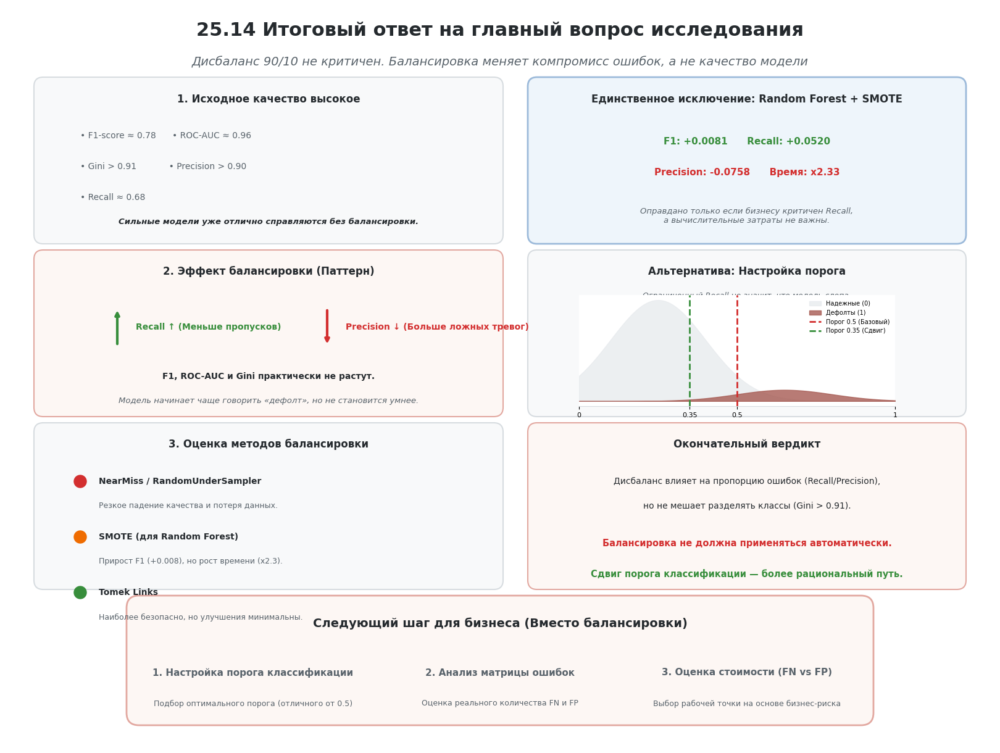

In [ ]:
# @title
# ==========================================================
# Комбинированная инфографика: 25.14 Итоговый ответ
# ==========================================================

import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import FancyBboxPatch, Rectangle
from scipy.stats import norm

# ----------------------------------------------------------
# Наша фирменная цветовая палитра
# ----------------------------------------------------------
COLOR_BG = "#FFFFFF"
COLOR_TEXT = "#252A2E"
COLOR_MUTED = "#59636B"
COLOR_GRID = "#D7DCE0"

CARD_GRAY_BG = "#F8F9FA"
CARD_GRAY_EDGE = "#D7DCE0"
CARD_CREAM_BG = "#FDF7F4"
CARD_CREAM_EDGE = "#E2A8A0"

GREEN_ACCENT = "#388E3C"
RED_ACCENT = "#D32F2F"
ORANGE_ACCENT = "#EF6C00"
BLUE_ACCENT = "#1976D2"

S = 1.0

fig = plt.figure(figsize=(16, 12), facecolor="white")
ax = fig.add_axes([0, 0, 1, 1])
ax.set_xlim(0, 16)
ax.set_ylim(0, 12)
ax.axis("off")

# ----------------------------------------------------------
# 1. Заголовок
# ----------------------------------------------------------
ax.text(
    8.0, 11.6, "25.14 Итоговый ответ на главный вопрос исследования",
    ha="center", va="center", fontsize=22*S, weight="bold", color=COLOR_TEXT
)
ax.text(
    8.0, 11.1, "Дисбаланс 90/10 не критичен. Балансировка меняет компромисс ошибок, а не качество модели",
    ha="center", va="center", fontsize=14*S, color=COLOR_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ КОЛОНКА: Выводы исследования
# ==========================================

# --- Карточка 1: Исходное качество высокое ---
ax.add_patch(FancyBboxPatch(
    (0.5, 8.2), 7.5, 2.6,
    boxstyle="round,pad=0.05,rounding_size=0.15",
    linewidth=1.5, edgecolor=CARD_GRAY_EDGE, facecolor=CARD_GRAY_BG
))
ax.text(4.25, 10.5, "1. Исходное качество высокое", ha="center", va="center", fontsize=12*S, weight="bold", color=COLOR_TEXT)
ax.text(1.2, 9.9, "• F1-score ≈ 0.78      • ROC-AUC ≈ 0.96", ha="left", va="center", fontsize=10*S, color=COLOR_MUTED)
ax.text(1.2, 9.4, "• Gini > 0.91            • Precision > 0.90", ha="left", va="center", fontsize=10*S, color=COLOR_MUTED)
ax.text(1.2, 8.9, "• Recall ≈ 0.68", ha="left", va="center", fontsize=10*S, color=COLOR_MUTED)
ax.text(4.25, 8.5, "Сильные модели уже отлично справляются без балансировки.", ha="center", va="center", fontsize=9.5*S, color=COLOR_TEXT, style="italic", weight="bold")


# --- Карточка 2: Эффект балансировки ---
ax.add_patch(FancyBboxPatch(
    (0.5, 5.4), 7.5, 2.6,
    boxstyle="round,pad=0.05,rounding_size=0.15",
    linewidth=1.5, edgecolor=CARD_CREAM_EDGE, facecolor=CARD_CREAM_BG
))
ax.text(4.25, 7.7, "2. Эффект балансировки (Паттерн)", ha="center", va="center", fontsize=12*S, weight="bold", color=COLOR_TEXT)

# Стрелка Recall (Вверх)
ax.annotate("", xy=(1.8, 7.1), xytext=(1.8, 6.5),
            arrowprops=dict(arrowstyle="->", color=GREEN_ACCENT, lw=3))
ax.text(2.1, 6.8, "Recall ↑ (Меньше пропусков)", ha="left", va="center", fontsize=10*S, weight="bold", color=GREEN_ACCENT)

# Стрелка Precision (Вниз)
ax.annotate("", xy=(5.2, 6.5), xytext=(5.2, 7.1),
            arrowprops=dict(arrowstyle="->", color=RED_ACCENT, lw=3))
ax.text(5.5, 6.8, "Precision ↓ (Больше ложных тревог)", ha="left", va="center", fontsize=10*S, weight="bold", color=RED_ACCENT)

ax.text(4.25, 6.0, "F1, ROC-AUC и Gini практически не растут.", ha="center", va="center", fontsize=10*S, color=COLOR_TEXT, weight="bold")
ax.text(4.25, 5.6, "Модель начинает чаще говорить «дефолт», но не становится умнее.", ha="center", va="center", fontsize=9.5*S, color=COLOR_MUTED, style="italic")


# --- Карточка 3: Оценка методов ---
ax.add_patch(FancyBboxPatch(
    (0.5, 2.6), 7.5, 2.6,
    boxstyle="round,pad=0.05,rounding_size=0.15",
    linewidth=1.5, edgecolor=CARD_GRAY_EDGE, facecolor=CARD_GRAY_BG
))
ax.text(4.25, 4.9, "3. Оценка методов балансировки", ha="center", va="center", fontsize=12*S, weight="bold", color=COLOR_TEXT)

# Красный индикатор
ax.add_patch(plt.Circle((1.2, 4.3), 0.1, color=RED_ACCENT))
ax.text(1.5, 4.3, "NearMiss / RandomUnderSampler", ha="left", va="center", fontsize=10*S, color=COLOR_TEXT, weight="bold")
ax.text(1.5, 3.9, "Резкое падение качества и потеря данных.", ha="left", va="center", fontsize=9*S, color=COLOR_MUTED)

# Оранжевый индикатор
ax.add_patch(plt.Circle((1.2, 3.4), 0.1, color=ORANGE_ACCENT))
ax.text(1.5, 3.4, "SMOTE (для Random Forest)", ha="left", va="center", fontsize=10*S, color=COLOR_TEXT, weight="bold")
ax.text(1.5, 3.0, "Прирост F1 (+0.008), но рост времени (x2.3).", ha="left", va="center", fontsize=9*S, color=COLOR_MUTED)

# Зеленый индикатор
ax.add_patch(plt.Circle((1.2, 2.5), 0.1, color=GREEN_ACCENT))
ax.text(1.5, 2.5, "Tomek Links", ha="left", va="center", fontsize=10*S, color=COLOR_TEXT, weight="bold")
ax.text(1.5, 2.1, "Наиболее безопасно, но улучшения минимальны.", ha="left", va="center", fontsize=9*S, color=COLOR_MUTED)


# ==========================================
# ПРАВАЯ КОЛОНКА: Альтернатива и вывод
# ==========================================

# --- Блок 1: Исключение (Random Forest) ---
ax.add_patch(FancyBboxPatch(
    (8.5, 8.2), 7.0, 2.6,
    boxstyle="round,pad=0.05,rounding_size=0.15",
    linewidth=2, edgecolor="#9CBADA", facecolor="#EEF5FB"
))
ax.text(12.0, 10.5, "Единственное исключение: Random Forest + SMOTE", ha="center", va="center", fontsize=12*S, weight="bold", color=COLOR_TEXT)
ax.text(12.0, 9.8, "F1: +0.0081      Recall: +0.0520", ha="center", va="center", fontsize=11*S, color=GREEN_ACCENT, weight="bold")
ax.text(12.0, 9.3, "Precision: -0.0758      Время: x2.33", ha="center", va="center", fontsize=11*S, color=RED_ACCENT, weight="bold")
ax.text(12.0, 8.6, "Оправдано только если бизнесу критичен Recall,\nа вычислительные затраты не важны.", ha="center", va="center", fontsize=9.5*S, color=COLOR_MUTED, style="italic")


# --- Блок 2: Концептуальный график (Сдвиг порога) ---
ax.add_patch(FancyBboxPatch(
    (8.5, 5.4), 7.0, 2.6,
    boxstyle="round,pad=0.05,rounding_size=0.15",
    linewidth=1.5, edgecolor=CARD_GRAY_EDGE, facecolor=CARD_GRAY_BG
))
ax.text(12.0, 7.7, "Альтернатива: Настройка порога", ha="center", va="center", fontsize=12*S, weight="bold", color=COLOR_TEXT)
ax.text(12.0, 7.3, "Ограниченный Recall не значит, что модель слепа.", ha="center", va="center", fontsize=9*S, color=COLOR_MUTED, style="italic")

# Встраиваем ось для графика распределений
ax_dist = fig.add_axes([0.58, 0.46, 0.32, 0.15])

x = np.linspace(0, 1, 200)
# Распределение надежных (0) и дефолтов (1)
y0 = norm.pdf(x, 0.25, 0.15) * 0.9
y1 = norm.pdf(x, 0.65, 0.15) * 0.1

ax_dist.fill_between(x, y0, color="#E8EBEE", alpha=0.8, label="Надежные (0)")
ax_dist.fill_between(x, y1, color="#A65A52", alpha=0.8, label="Дефолты (1)")

# Порог 0.5
ax_dist.axvline(0.5, color=RED_ACCENT, linestyle='--', linewidth=2, label="Порог 0.5 (Базовый)")
# Порог 0.35
ax_dist.axvline(0.35, color=GREEN_ACCENT, linestyle='--', linewidth=2, label="Порог 0.35 (Сдвиг)")

ax_dist.set_xticks([0, 0.35, 0.5, 1])
ax_dist.set_xticklabels(["0", "0.35", "0.5", "1"], fontsize=8)
ax_dist.set_yticks([])
ax_dist.set_xlim(0, 1)
ax_dist.spines['top'].set_visible(False)
ax_dist.spines['right'].set_visible(False)
ax_dist.spines['left'].set_visible(False)
ax_dist.spines['bottom'].set_color(COLOR_GRID)
ax_dist.legend(loc='upper right', fontsize=7, frameon=False)


# --- Блок 3: Окончательный вердикт ---
ax.add_patch(FancyBboxPatch(
    (8.5, 2.6), 7.0, 2.6,
    boxstyle="round,pad=0.05,rounding_size=0.15",
    linewidth=1.5, edgecolor=CARD_CREAM_EDGE, facecolor=CARD_CREAM_BG
))
ax.text(12.0, 4.9, "Окончательный вердикт", ha="center", va="center", fontsize=12*S, weight="bold", color=COLOR_TEXT)
ax.text(12.0, 4.3, "Дисбаланс влияет на пропорцию ошибок (Recall/Precision),", ha="center", va="center", fontsize=10*S, color=COLOR_TEXT)
ax.text(12.0, 3.9, "но не мешает разделять классы (Gini > 0.91).", ha="center", va="center", fontsize=10*S, color=COLOR_TEXT)
ax.text(12.0, 3.3, "Балансировка не должна применяться автоматически.", ha="center", va="center", fontsize=10.5*S, color=RED_ACCENT, weight="bold")
ax.text(12.0, 2.8, "Сдвиг порога классификации — более рациональный путь.", ha="center", va="center", fontsize=10.5*S, color=GREEN_ACCENT, weight="bold")


# ==========================================
# НИЖНИЙ БЛОК: Рекомендация для бизнеса
# ==========================================
ax.add_patch(FancyBboxPatch(
    (2.0, 0.4), 12.0, 2.0,
    boxstyle="round,pad=0.05,rounding_size=0.2",
    linewidth=2, edgecolor=CARD_CREAM_EDGE, facecolor=CARD_CREAM_BG
))

ax.text(
    8.0, 2.0, "Следующий шаг для бизнеса (Вместо балансировки)",
    ha="center", va="center", fontsize=14*S, weight="bold", color=COLOR_TEXT
)

# Разбиваем на 3 аккуратные колонки
ax.text(
    4.0, 1.2, "1. Настройка порога классификации", ha="center", va="center",
    fontsize=11*S, color=COLOR_MUTED, weight="bold"
)
ax.text(
    4.0, 0.7, "Подбор оптимального порога (отличного от 0.5)", ha="center", va="center",
    fontsize=9*S, color=COLOR_MUTED
)

ax.text(
    8.0, 1.2, "2. Анализ матрицы ошибок", ha="center", va="center",
    fontsize=11*S, color=COLOR_MUTED, weight="bold"
)
ax.text(
    8.0, 0.7, "Оценка реального количества FN и FP", ha="center", va="center",
    fontsize=9*S, color=COLOR_MUTED
)

ax.text(
    12.0, 1.2, "3. Оценка стоимости (FN vs FP)", ha="center", va="center",
    fontsize=11*S, color=COLOR_MUTED, weight="bold"
)
ax.text(
    12.0, 0.7, "Выбор рабочей точки на основе бизнес-риска", ha="center", va="center",
    fontsize=9*S, color=COLOR_MUTED
)

plt.show()

### 25.15 Практические рекомендации и завершение исследования

Проведённое исследование показало, что для рассматриваемого набора данных исходный дисбаланс классов примерно 90/10 не является критическим препятствием для построения качественной модели кредитного скоринга.

Сильные алгоритмы уже на исходной обучающей выборке демонстрируют высокие значения F1-score, ROC-AUC и Gini. Методы балансировки преимущественно повышают Recall, но одновременно снижают Precision и редко обеспечивают устойчивое улучшение общего качества.

На основании полученных результатов можно сформулировать следующие практические рекомендации.

---

#### 1. Не применять балансировку автоматически

Балансировка не должна включаться в pipeline только потому, что классы распределены неравномерно.

Перед её использованием необходимо проверить:

- качество модели на исходных данных;
- изменение Precision и Recall;
- изменение F1-score;
- изменение ROC-AUC и Gini;
- влияние на количество False Positive и False Negative;
- вычислительные затраты.

В текущем исследовании обязательное изменение распределения классов не подтвердило свою необходимость.

---

#### 2. Сохранить Baseline как основной ориентир

Результат модели на исходных данных должен оставаться основной точкой сравнения для всех последующих экспериментов.

Это позволяет определить, действительно ли новый метод:

- повышает качество;
- только изменяет баланс ошибок;
- усложняет решение без практической пользы.

Для LightGBM Baseline оказался лучшим вариантом по F1-score.

Для XGBoost и CatBoost исходные варианты практически не уступили лучшим сбалансированным решениям.

---

#### 3. Не выбирать модель только по одной метрике

Максимальное значение одной метрики не означает безусловного превосходства модели.

Например:

- Random Forest показал максимальную Precision на исходных данных;
- XGBoost показал максимальный Recall среди Baseline-моделей;
- CatBoost с Tomek Links получил максимальный итоговый F1-score;
- XGBoost оказался наиболее быстрым;
- LightGBM показал высокое качество без необходимости балансировки.

Поэтому выбор должен основываться на совокупности:

- Precision;
- Recall;
- F1-score;
- ROC-AUC;
- Gini;
- времени обучения;
- сложности подготовки данных;
- стоимости бизнес-ошибок.

---

#### 4. Рассматривать несколько моделей-кандидатов

По результатам исследования для дальнейшей работы можно выделить три основных кандидата.

##### LightGBM Baseline

Преимущества:

- высокий F1-score;
- высокие ROC-AUC и Gini;
- короткое время обучения;
- отсутствие необходимости балансировки;
- простая и воспроизводимая процедура.

Этот вариант выглядит наиболее рациональным с точки зрения сочетания качества, скорости и простоты.

##### XGBoost Baseline

Преимущества:

- высокий Recall среди исходных моделей;
- высокий F1-score;
- высокие ROC-AUC и Gini;
- минимальное время обучения.

Этот вариант особенно интересен, если важны скорость экспериментов и возможность быстро выполнять повторную настройку модели.

##### CatBoost Baseline

Преимущества:

- максимальный F1-score среди Baseline-моделей;
- максимальные ROC-AUC и Gini;
- высокая Precision;
- отсутствие необходимости в обязательной балансировке.

CatBoost с Tomek Links получил немного более высокий F1-score, однако прирост составил только **0.0028**, тогда как время обучения увеличилось. Поэтому Baseline CatBoost остаётся полноценным и практически обоснованным кандидатом.

Окончательный выбор между этими моделями не входит в основной вопрос текущего исследования и должен выполняться на отдельном этапе.

---

#### 5. Настраивать порог классификации

Если бизнесу необходимо обнаруживать больше потенциальных дефолтов, следующим шагом должна быть настройка порога классификации.

Снижение порога позволит:

- повысить Recall;
- уменьшить количество пропущенных дефолтов;
- увеличить число клиентов, направляемых на дополнительную проверку.

Одновременно это приведёт к снижению Precision и росту количества ложных предупреждений.

В отличие от балансировки, настройка порога позволяет изменить рабочую точку модели без удаления реальных наблюдений и без создания синтетических объектов.

Порог должен выбираться на валидационной выборке, а не на финальном тестовом наборе.

---

#### 6. Учитывать стоимость ошибок

Для промышленного кредитного скоринга необходимо определить стоимость:

- False Negative — модель не обнаружила будущий дефолт;
- False Positive — надёжный клиент был ошибочно признан рискованным.

После этого можно выбрать метрику или функцию потерь, соответствующую бизнес-задаче.

Например:

- при высокой стоимости пропущенного дефолта приоритет может быть отдан Recall;
- при высокой стоимости необоснованного отказа особенно важна Precision;
- при необходимости общего компромисса может использоваться F1-score;
- при различной важности Precision и Recall может применяться F-beta score;
- при наличии денежных оценок может использоваться собственная бизнес-метрика.

**Без оценки стоимости ошибок нельзя универсально определить оптимальный порог и окончательно выбрать модель.**

---

#### 7. Провести кросс-валидацию кандидатов

Следующий исследовательский этап должен включать кросс-валидацию для ограниченного количества перспективных решений.

Нет необходимости повторять полный цикл для всех 48 вариантов.

Рационально проверить:

- LightGBM Baseline;
- XGBoost Baseline;
- CatBoost Baseline;
- Random Forest со SMOTE — как вариант, получивший наибольший прирост после балансировки;
- при необходимости CatBoost с Tomek Links — как вариант с максимальным F1-score.

Для каждой модели необходимо рассчитать:

- среднее значение метрик;
- стандартное отклонение;
- устойчивость результатов между фолдами;
- доверительные интервалы;
- стабильность выбранного порога.

---

#### 8. Выполнить отдельный подбор гиперпараметров

В текущем исследовании гиперпараметры намеренно не оптимизировались, чтобы влияние балансировки не смешивалось с индивидуальной настройкой моделей.

После выбора ограниченного набора кандидатов можно выполнить:

- RandomizedSearchCV;
- Optuna;
- Bayesian optimization;
- ручную настройку наиболее важных параметров.

Подбор необходимо проводить только на обучающей части данных с использованием кросс-валидации.

Финальная тестовая выборка не должна участвовать в выборе гиперпараметров.

---

#### 9. Проверить калибровку вероятностей

Для кредитного скоринга важен не только итоговый класс, но и корректность прогнозируемой вероятности дефолта.

Перед практическим использованием необходимо проверить:

- calibration curve;
- Brier score;
- распределение прогнозируемых вероятностей;
- стабильность вероятностей по риск-группам.

При необходимости можно использовать:

- Platt scaling;
- isotonic regression;
- CalibratedClassifierCV.

Калибровка особенно важна, если вероятность дефолта используется для расчёта лимита, ставки, резервов или ожидаемых потерь.

---

#### 10. Провести финальную проверку на независимых данных

После выбора модели, гиперпараметров и порога необходимо один раз оценить окончательное решение на независимой тестовой выборке.

На этом этапе должны быть зафиксированы:

- Accuracy;
- Precision;
- Recall;
- F1-score;
- ROC-AUC;
- Gini;
- матрица ошибок;
- бизнес-стоимость ошибок;
- калибровка вероятностей.

Только после этого модель можно рассматривать как кандидата для промышленного внедрения.

---

### Итоговая рекомендация

Для рассматриваемого набора данных рекомендуется:

1. сохранить исходное распределение классов;
2. использовать Baseline как основной вариант;
3. выбрать несколько сильных моделей-кандидатов;
4. выполнить кросс-валидацию;
5. настроить гиперпараметры;
6. подобрать порог на основе стоимости ошибок;
7. проверить калибровку вероятностей;
8. провести финальную оценку на независимой выборке.

Балансировку следует рассматривать не как обязательный этап, а как один из возможных инструментов, применяемый только при подтверждённой практической пользе.

---

## Завершение исследования

Поставленная задача исследования выполнена.

Было проверено влияние семи методов балансировки на шесть алгоритмов машинного обучения. Все модели оценивались по единой процедуре и на неизменной тестовой выборке.

Полученные результаты показали:

- исходный дисбаланс не препятствует качественному обучению сильных моделей;
- балансировка устойчиво повышает Recall и снижает Precision;
- F1-score, ROC-AUC и Gini не получают стабильного улучшения;
- агрессивные методы undersampling могут существенно ухудшать качество;
- наиболее аккуратные методы дают только небольшой прирост;
- обязательная балансировка для рассматриваемого набора данных не требуется.

Таким образом, главный вопрос исследования получил обоснованный ответ:

> **Дисбаланс классов примерно 90/10 влияет на характер ошибок модели, но не является критической проблемой и не требует обязательного изменения исходной обучающей выборки.**

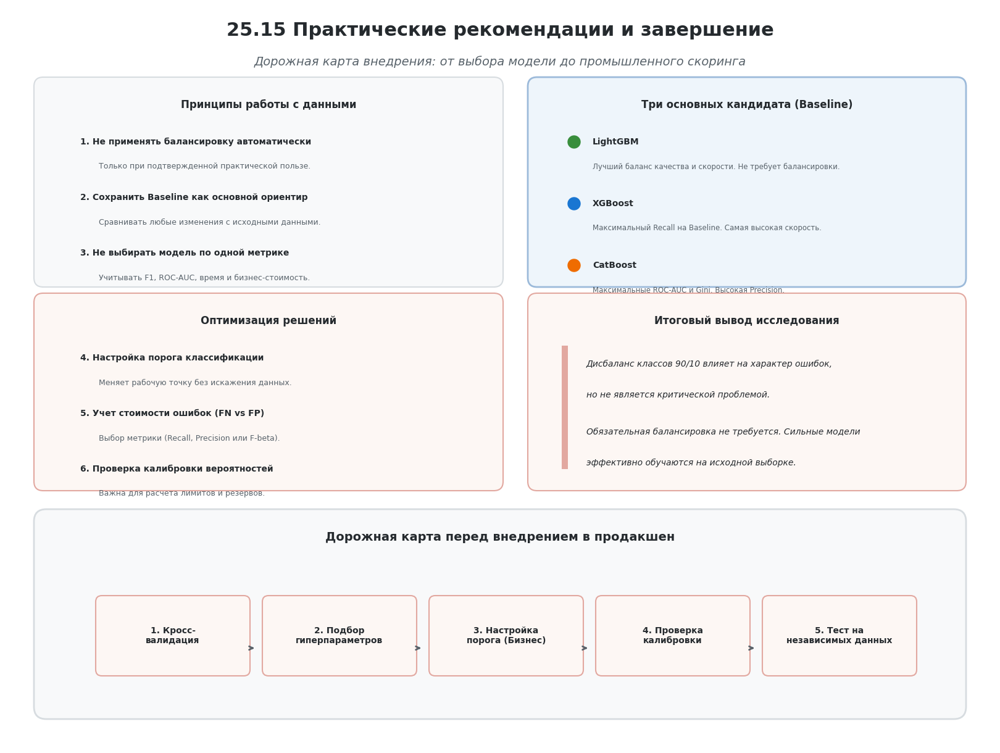

In [ ]:
# @title
# ==========================================================
# Комбинированная инфографика: 25.15 Практические рекомендации
# ==========================================================

import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import FancyBboxPatch, Rectangle, FancyArrowPatch

# ----------------------------------------------------------
# Наша фирменная цветовая палитра
# ----------------------------------------------------------
COLOR_BG = "#FFFFFF"
COLOR_TEXT = "#252A2E"
COLOR_MUTED = "#59636B"
COLOR_GRID = "#D7DCE0"

CARD_GRAY_BG = "#F8F9FA"
CARD_GRAY_EDGE = "#D7DCE0"
CARD_CREAM_BG = "#FDF7F4"
CARD_CREAM_EDGE = "#E2A8A0"
CARD_BLUE_BG = "#EEF5FB"
CARD_BLUE_EDGE = "#9CBADA"

GREEN_ACCENT = "#388E3C"
RED_ACCENT = "#D32F2F"
ORANGE_ACCENT = "#EF6C00"
BLUE_ACCENT = "#1976D2"

S = 1.0

fig = plt.figure(figsize=(16, 12), facecolor="white")
ax = fig.add_axes([0, 0, 1, 1])
ax.set_xlim(0, 16)
ax.set_ylim(0, 12)
ax.axis("off")

# ----------------------------------------------------------
# 1. Заголовок
# ----------------------------------------------------------
ax.text(
    8.0, 11.6, "25.15 Практические рекомендации и завершение",
    ha="center", va="center", fontsize=22*S, weight="bold", color=COLOR_TEXT
)
ax.text(
    8.0, 11.1, "Дорожная карта внедрения: от выбора модели до промышленного скоринга",
    ha="center", va="center", fontsize=14*S, color=COLOR_MUTED, style="italic"
)

# ==========================================
# ЛЕВАЯ КОЛОНКА: Принципы и подготовка (Рекомендации 1-5)
# ==========================================

# --- Карточка 1: Принципы работы с данными ---
ax.add_patch(FancyBboxPatch(
    (0.5, 7.5), 7.5, 3.3,
    boxstyle="round,pad=0.05,rounding_size=0.15",
    linewidth=1.5, edgecolor=CARD_GRAY_EDGE, facecolor=CARD_GRAY_BG
))
ax.text(4.25, 10.4, "Принципы работы с данными", ha="center", va="center", fontsize=12*S, weight="bold", color=COLOR_TEXT)

ax.text(1.2, 9.8, "1. Не применять балансировку автоматически", ha="left", va="center", fontsize=10*S, color=COLOR_TEXT, weight="bold")
ax.text(1.5, 9.4, "Только при подтвержденной практической пользе.", ha="left", va="center", fontsize=9*S, color=COLOR_MUTED)

ax.text(1.2, 8.9, "2. Сохранить Baseline как основной ориентир", ha="left", va="center", fontsize=10*S, color=COLOR_TEXT, weight="bold")
ax.text(1.5, 8.5, "Сравнивать любые изменения с исходными данными.", ha="left", va="center", fontsize=9*S, color=COLOR_MUTED)

ax.text(1.2, 8.0, "3. Не выбирать модель по одной метрике", ha="left", va="center", fontsize=10*S, color=COLOR_TEXT, weight="bold")
ax.text(1.5, 7.6, "Учитывать F1, ROC-AUC, время и бизнес-стоимость.", ha="left", va="center", fontsize=9*S, color=COLOR_MUTED)


# --- Карточка 2: Оптимизация решений ---
ax.add_patch(FancyBboxPatch(
    (0.5, 4.2), 7.5, 3.1,
    boxstyle="round,pad=0.05,rounding_size=0.15",
    linewidth=1.5, edgecolor=CARD_CREAM_EDGE, facecolor=CARD_CREAM_BG
))
ax.text(4.25, 6.9, "Оптимизация решений", ha="center", va="center", fontsize=12*S, weight="bold", color=COLOR_TEXT)

ax.text(1.2, 6.3, "4. Настройка порога классификации", ha="left", va="center", fontsize=10*S, color=COLOR_TEXT, weight="bold")
ax.text(1.5, 5.9, "Меняет рабочую точку без искажения данных.", ha="left", va="center", fontsize=9*S, color=COLOR_MUTED)

ax.text(1.2, 5.4, "5. Учет стоимости ошибок (FN vs FP)", ha="left", va="center", fontsize=10*S, color=COLOR_TEXT, weight="bold")
ax.text(1.5, 5.0, "Выбор метрики (Recall, Precision или F-beta).", ha="left", va="center", fontsize=9*S, color=COLOR_MUTED)

ax.text(1.2, 4.5, "6. Проверка калибровки вероятностей", ha="left", va="center", fontsize=10*S, color=COLOR_TEXT, weight="bold")
ax.text(1.5, 4.1, "Важна для расчета лимитов и резервов.", ha="left", va="center", fontsize=9*S, color=COLOR_MUTED)


# ==========================================
# ПРАВАЯ КОЛОНКА: Кандидаты и Вывод
# ==========================================

# --- Блок 1: Три основных кандидата ---
ax.add_patch(FancyBboxPatch(
    (8.5, 7.5), 7.0, 3.3,
    boxstyle="round,pad=0.05,rounding_size=0.15",
    linewidth=2, edgecolor=CARD_BLUE_EDGE, facecolor=CARD_BLUE_BG
))
ax.text(12.0, 10.4, "Три основных кандидата (Baseline)", ha="center", va="center", fontsize=12*S, weight="bold", color=COLOR_TEXT)

# LightGBM
ax.add_patch(plt.Circle((9.2, 9.8), 0.1, color=GREEN_ACCENT))
ax.text(9.5, 9.8, "LightGBM", ha="left", va="center", fontsize=10*S, color=COLOR_TEXT, weight="bold")
ax.text(9.5, 9.4, "Лучший баланс качества и скорости. Не требует балансировки.", ha="left", va="center", fontsize=8.5*S, color=COLOR_MUTED)

# XGBoost
ax.add_patch(plt.Circle((9.2, 8.8), 0.1, color=BLUE_ACCENT))
ax.text(9.5, 8.8, "XGBoost", ha="left", va="center", fontsize=10*S, color=COLOR_TEXT, weight="bold")
ax.text(9.5, 8.4, "Максимальный Recall на Baseline. Самая высокая скорость.", ha="left", va="center", fontsize=8.5*S, color=COLOR_MUTED)

# CatBoost
ax.add_patch(plt.Circle((9.2, 7.8), 0.1, color=ORANGE_ACCENT))
ax.text(9.5, 7.8, "CatBoost", ha="left", va="center", fontsize=10*S, color=COLOR_TEXT, weight="bold")
ax.text(9.5, 7.4, "Максимальные ROC-AUC и Gini. Высокая Precision.", ha="left", va="center", fontsize=8.5*S, color=COLOR_MUTED)


# --- Блок 2: Итоговый вывод исследования ---
ax.add_patch(FancyBboxPatch(
    (8.5, 4.2), 7.0, 3.1,
    boxstyle="round,pad=0.05,rounding_size=0.15",
    linewidth=1.5, edgecolor=CARD_CREAM_EDGE, facecolor=CARD_CREAM_BG
))
ax.text(12.0, 6.9, "Итоговый вывод исследования", ha="center", va="center", fontsize=12*S, weight="bold", color=COLOR_TEXT)

# Цитатник
ax.add_patch(Rectangle((9.0, 4.5), 0.1, 2.0, facecolor=CARD_CREAM_EDGE))
ax.text(
    9.4, 6.2, "Дисбаланс классов 90/10 влияет на характер ошибок,",
    ha="left", va="center", fontsize=10*S, color=COLOR_TEXT, style="italic"
)
ax.text(
    9.4, 5.7, "но не является критической проблемой.",
    ha="left", va="center", fontsize=10*S, color=COLOR_TEXT, style="italic"
)
ax.text(
    9.4, 5.1, "Обязательная балансировка не требуется. Сильные модели",
    ha="left", va="center", fontsize=10*S, color=COLOR_TEXT, style="italic"
)
ax.text(
    9.4, 4.6, "эффективно обучаются на исходной выборке.",
    ha="left", va="center", fontsize=10*S, color=COLOR_TEXT, style="italic"
)


# ==========================================
# НИЖНИЙ БЛОК: Дорожная карта (Pipeline)
# ==========================================
ax.add_patch(FancyBboxPatch(
    (0.5, 0.5), 15.0, 3.3,
    boxstyle="round,pad=0.05,rounding_size=0.2",
    linewidth=2, edgecolor=CARD_GRAY_EDGE, facecolor=CARD_GRAY_BG
))

ax.text(
    8.0, 3.4, "Дорожная карта перед внедрением в продакшен",
    ha="center", va="center", fontsize=14*S, weight="bold", color=COLOR_TEXT
)

# Этапы пайплайна
pipeline_steps = [
    "1. Кросс-\nвалидация",
    "2. Подбор\nгиперпараметров",
    "3. Настройка\nпорога (Бизнес)",
    "4. Проверка\nкалибровки",
    "5. Тест на\nнезависимых данных"
]

step_w = 2.4
gap = 0.3
start_x = 1.5
y_box = 1.2

for i, step in enumerate(pipeline_steps):
    x = start_x + i * (step_w + gap)

    # Стрелка между блоками
    if i > 0:
        ax.annotate(
            "",
            xy=(x - gap/2, y_box + 0.4),
            xytext=(x - gap/2 - 0.1, y_box + 0.4),
            arrowprops=dict(arrowstyle="->", color=COLOR_MUTED, lw=2)
        )

    # Блок этапа
    ax.add_patch(FancyBboxPatch(
        (x, y_box), step_w, 1.2,
        boxstyle="round,pad=0.05,rounding_size=0.1",
        linewidth=1.5, edgecolor=CARD_CREAM_EDGE, facecolor=CARD_CREAM_BG
    ))

    # Текст этапа
    ax.text(
        x + step_w/2, y_box + 0.6, step,
        ha="center", va="center", fontsize=10*S, color=COLOR_TEXT, weight="bold"
    )

plt.show()